### Doble similaridad

In [1]:
from gensim.models.doc2vec import Doc2Vec
model_d2v = Doc2Vec.load('./modeloDoc2vec_setembro_premas40')
labels_d2v = list(model_d2v.docvecs.doctags.keys())
indices=['Alva','Bols','Ciro','Gera','Guil','Henr','Joao','Mari']
selecs=[]
for i in labels_d2v:
    if i[0:4] in indices:
        selecs.append(i)
labels_d2v=selecs

In [2]:
def doubleRelation(labels, model,candidatos=1,num=8):
    indices=['Alva','Bols','Ciro','Gera','Guil','Henr','Joao','Mari']
    simi_min=0.65
    simi_max=1
    lx=[]
    ly=[]
    ln=[]
    todo=[]
    color_todo=[]
    for i in labels:
        if i[0:4] in indices and i!='Ciro_dez_8' and i!= 'Ciro_dez_4' :
            simi=model.docvecs.most_similar(i,topn=candidatos)
            for x in simi:
                x=list(x)
                simi_vuelta=model.docvecs.most_similar(x[0],topn=candidatos)
                for y in simi_vuelta:
                    y=list(y)
                    if (x[1]>=simi_min and x[1]<=simi_max) and (y[1]>=simi_min and y[1]<=simi_max) and  (i == y[0]):
                        if (x[0] not in ly) and (x[0] not in lx):
                            ly.append(x[0])
                            lx.append(y[0])
                            ln.append(round(x[1],2))
                            if x[0][0:4] == y[0][0:4]:
                                color_todo.append('#86bf91')
                            else:
                                color_todo.append('r')
    for f,g in zip(lx,ly):
        todo.append(f+' & '+g)
        #todo.append(f[0:8]+' & '+g[0:8])
    list_strong=list(zip(todo,ln,color_todo))
    print('Size set strong simi: '+str(len(list_strong)))
    list_strong=sorted(list_strong, key=lambda x: x[1],reverse=True)
    #print(list_strong)
    
    return list_strong

In [3]:
doubleRelation(labels_d2v,model_d2v)

/usr/local/lib/python3.5/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


Size set strong simi: 12


[('Ciro_jun_8 & Guil_mai_14', 0.74, 'r'),
 ('Guil_jan_3 & Guil_jan_2', 0.71, '#86bf91'),
 ('Alva_abr_15 & Henr_nov_2', 0.69, 'r'),
 ('Guil_jun_7 & Guil_jun_20', 0.68, '#86bf91'),
 ('Ciro_jul_6 & Ciro_jul_4', 0.67, '#86bf91'),
 ('Guil_ago_9 & Guil_jun_11', 0.67, '#86bf91'),
 ('Joao_mai_7 & Joao_mai_4', 0.66, '#86bf91'),
 ('Guil_mai_6 & Joao_mar_4', 0.66, 'r'),
 ('Joao_mar_13 & Joao_mar_1', 0.65, '#86bf91'),
 ('Gera_ant_3 & Gera_jun_8', 0.65, '#86bf91'),
 ('Gera_set_1 & Gera_mar_4', 0.65, '#86bf91'),
 ('Ciro_abr_5 & Ciro_abr_10', 0.65, '#86bf91')]

## Tf-idf

In [4]:
import pandas as pd
import gensim
import numpy as np                                                               
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import math
import numpy as np
#df=pd.read_pickle('./pandas_data_candidatos_lda.pd')
#df=pd.read_pickle('/home/kid/Documentos/analisis2018/pandas_data_candidatos_lda.pd')
df=pd.read_pickle('/home/kid/Documentos/analisis2018/pandas_data_candidatos_premas.pd')

In [5]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(use_idf=True, norm=None, ngram_range=(1, 1)) 
#X = tfidf.fit_transform(te)
matrix = tfidf.fit_transform(df.Text_clean).toarray()
labels_tfidf=list(df.abreviatura)
vectors_tfidf=list(matrix)

### creando matriz de similitud

In [6]:
matriz_tfidf=np.asarray(vectors_tfidf) #conver in matriz
matriz_tfidf.shape

(900, 55788)

In [7]:
# si funciona probado xd
index = gensim.similarities.MatrixSimilarity(gensim.matutils.Dense2Corpus(matriz_tfidf.T))
similarity_matrix_tfidf = []
for sims in index:
    similarity_matrix_tfidf.append(sims)
similarity_matrix_tfidf = np.array(similarity_matrix_tfidf)

/usr/local/lib/python3.5/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


In [8]:
len(similarity_matrix_tfidf[0])

900

In [9]:
def most_simi(doc,num=10):
    pos=labels_tfidf.index(doc)
    simis=list(similarity_matrix_tfidf[pos][:])
    zipsimi=list(zip(labels_tfidf,simis))
    zipsimi.sort(key=lambda x: x[1],reverse=True)
    return zipsimi[1:num+1]

In [10]:
def most_simi_can(doc1,doc2):
    pos1=labels_tfidf.index(doc1)
    pos2=labels_tfidf.index(doc2)
    return similarity_matrix_tfidf[pos1][pos2]

##### Apartado docsim comparacion

In [11]:
print('D2V')
print(str(model_d2v.docvecs.similarity('Guil_mai_14','Ciro_jun_8')))
print(str(model_d2v.docvecs.similarity('Guil_mai_14','Manu_mar_14')))
print(str(model_d2v.docvecs.similarity('Ciro_jun_8','Manu_mar_14')))
print('TF-IDF')
print(str(most_simi_can('Guil_mai_14','Ciro_jun_8')))
print(str(most_simi_can('Guil_mai_14','Manu_jun_8')))
print(str(most_simi_can('Ciro_jun_8','Manu_jun_8')))
print('----------------------------------------------------------')
print('D2V')
print(str(model_d2v.docvecs.similarity('Guil_mai_18','Guil_jun_9')))
print(str(model_d2v.docvecs.similarity('Guil_mai_18','Ciro_jun_8')))
print(str(model_d2v.docvecs.similarity('Guil_jun_9','Ciro_jun_8')))
print('TF-IDF')
print(str(most_simi_can('Guil_mai_18','Guil_jun_9')))
print(str(most_simi_can('Guil_mai_18','Ciro_jun_8')))
print(str(most_simi_can('Guil_jun_9','Ciro_jun_8')))
print('----------------------------------------------------------')
print('D2V')
print(str(model_d2v.docvecs.similarity('Gera_mar_4','Manu_mar_4')))
print(str(model_d2v.docvecs.similarity('Gera_mar_4','Ciro_jul_4')))
print(str(model_d2v.docvecs.similarity('Manu_mar_4','Ciro_jul_4')))
print('TF-IDF')
print(str(most_simi_can('Gera_mar_4','Manu_mar_4')))
print(str(most_simi_can('Gera_mar_4','Ciro_jul_4')))
print(str(most_simi_can('Manu_mar_4','Ciro_jul_4')))

D2V
0.73728955
0.45565787
0.50822604
TF-IDF
0.180041
0.045975182
0.043912027
----------------------------------------------------------
D2V
0.5808787
0.4236523
0.415405
TF-IDF
0.14850852
0.0017255355
0.0020296013
----------------------------------------------------------
D2V
0.4348932
0.3493413
0.41782346
TF-IDF
0.07681216
0.009004766
0.060100123


/usr/local/lib/python3.5/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


## NO borrar comprobacion modelo tripletes TF-IDF

In [12]:
df=pd.read_pickle('/home/kid/Documentos/analisis2018/pandas_data_candidatos_premas.pd')
df.head(3)
df2 = pd.read_csv("/home/kid/Documentos/LMCD/val_d2v.csv")
grupo=list(df2.Grupo)
d1s=list(df2.D1)
d2s=list(df2.D2)
i=0
listTest=[]
for ax,ay,az in zip(grupo,d1s,d2s):
    for x,y,z in zip(grupo,d1s,d2s):
        if ax!=x:
            #listTest.append(ay+' '+az+' '+y)
            listTest.append(ay+' '+az+' '+z)
            i=i+1
def validate_d2v(list_test):
    asert=0
    for i in list_test:
        d1,d2,d3=i.split()
        simi1=most_simi_can(d1,d2)
        simi2=most_simi_can(d1,d3)
        simi3=most_simi_can(d2,d3)
        print(simi1,simi2,simi3)
        if simi1>0.0 and simi1>simi2 and simi1>simi3:
            asert=asert+1
    print(asert,len(list_test))
    return asert/len(list_test)
validate_d2v(listTest)

0.180041 0.003306401 0.0019838572
0.180041 0.0046155136 0.002480626
0.180041 0.0069722203 0.0053734872
0.180041 0.007613684 0.016929096
0.180041 0.0036851133 0.010051632
0.180041 0.004732227 0.006561327
0.180041 0.0034125259 0.0
0.180041 0.0 0.030998897
0.180041 0.0 0.030998897
0.180041 0.0 0.030998897
0.180041 0.012728039 0.024637472
0.180041 0.021436678 0.009940762
0.180041 0.028663382 0.02239779
0.180041 0.014694956 0.0020296013
0.180041 0.033855706 0.02703869
0.180041 0.018701114 0.006253759
0.180041 0.004732227 0.006561327
0.180041 0.0 0.0
0.180041 0.013025787 0.0052422388
0.180041 0.021436678 0.009940762
0.180041 0.028663382 0.02239779
0.180041 0.004870004 0.0101272445
0.180041 0.0049759876 0.021347323
0.180041 0.006402236 0.0033392294
0.180041 0.020198468 0.008358516
0.180041 0.0060367314 0.011628237
0.180041 0.01763153 0.01774799
0.180041 0.008296486 0.0024297284
0.14728928 0.012455568 0.009522614
0.14728928 0.0014941982 0.0
0.14728928 0.0050309994 0.005071897
0.14728928 0.0185

0.10898369 0.0052401107 0.012405556
0.10898369 0.008489506 0.006733653
0.10898369 0.014818367 0.008487721
0.10898369 0.006514625 0.0031960332
0.10898369 0.013744168 0.012888833
0.10898369 0.0070135016 0.0038796866
0.10898369 0.0 0.0
0.30659276 0.021302318 0.009940762
0.30659276 0.004029497 0.0040152343
0.30659276 0.007915014 0.0037819399
0.30659276 0.01404482 0.015660498
0.30659276 0.004029497 0.0040152343
0.30659276 0.0055211354 0.0051204916
0.30659276 0.017452514 0.042111743
0.30659276 0.017649217 0.027303137
0.30659276 0.020722598 0.027183063
0.30659276 0.009695994 0.024717797
0.30659276 0.030318372 0.02601951
0.30659276 0.014538009 0.0072324174
0.30659276 0.052703507 0.03494018
0.30659276 0.052703507 0.03494018
0.30659276 0.052703507 0.03494018
0.30659276 0.07989151 0.06630458
0.30659276 0.30659276 1.0
0.30659276 0.0930189 0.038638357
0.30659276 0.031103387 0.017215248
0.30659276 0.039041806 0.011811424
0.30659276 0.06571849 0.05876128
0.30659276 0.030318372 0.02601951
0.30659276 0

0.9418052256532067

In [13]:
def doubleRelation2(candidatos=1,num=8):
    indices=['Alva','Bols','Ciro','Gera','Guil','Henr','Joao','Mari']
    simi_min=0
    simi_max=1
    lx=[]
    ly=[]
    ln=[]
    todo=[]
    color_todo=[]
    for i in labels_tfidf:
        if i[0:4] in indices and i!='Ciro_dez_8' and i!= 'Ciro_dez_4':
            simi=most_simi(i,candidatos)
            for x in simi:
                x=list(x)
                simi_vuelta=most_simi(x[0],candidatos)
                for y in simi_vuelta:
                    y=list(y)
                    if (x[1]>=simi_min and x[1]<=simi_max) and (y[1]>=simi_min and y[1]<=simi_max) and  (i == y[0]):
                        if (x[0] not in ly) and (x[0] not in lx):
                            ly.append(x[0])
                            lx.append(y[0])
                            ln.append(round(x[1],3))
                            if x[0][0:4] == y[0][0:4]:
                                color_todo.append('#86bf91')
                            else:
                                color_todo.append('r')
    #for f,g,n in zip(lx,ly,ln):
        #todo.append(('('+f+', '+g+')',n))
    #return todo, color_todo
    for f,g in zip(lx,ly):
        #todo.append(f[0:8]+' & '+g[0:8])
        todo.append(f+' & '+g)
    #return todo, color_todo
    
    list_strong=list(zip(todo,ln,color_todo))
    list_strong=sorted(list_strong, key=lambda x: x[1],reverse=True)
    #print(list_strong)
    print('Size set strong simi: '+str(len(list_strong)))
    return list_strong #[:num]

In [14]:
doubleRelation2()

Size set strong simi: 56


[('Joao_jul_1 & Joao_ago_9', 0.546, '#86bf91'),
 ('Ciro_nov_2 & Ciro_out_5', 0.5, '#86bf91'),
 ('Guil_jun_7 & Guil_jun_20', 0.49, '#86bf91'),
 ('Ciro_abr_10 & Ciro_abr_5', 0.466, '#86bf91'),
 ('Henr_set_1 & Henr_set_6', 0.465, '#86bf91'),
 ('Gera_jul_1 & Gera_ago_5', 0.461, '#86bf91'),
 ('Ciro_jul_9 & Ciro_jul_2', 0.457, '#86bf91'),
 ('Gera_mai_1 & Gera_jun_6', 0.447, '#86bf91'),
 ('Alva_mai_2 & Alva_jun_7', 0.436, '#86bf91'),
 ('Alva_mai_5 & Ciro_mai_4', 0.434, 'r'),
 ('Guil_out_1 & Guil_out_3', 0.428, '#86bf91'),
 ('Henr_jan_3 & Henr_fev_4', 0.422, '#86bf91'),
 ('Guil_mai_1 & Guil_ago_4', 0.416, '#86bf91'),
 ('Alva_jun_1 & Alva_jun_11', 0.413, '#86bf91'),
 ('Guil_mai_6 & Alva_jun_9', 0.402, 'r'),
 ('Gera_mai_5 & Gera_jul_4', 0.399, '#86bf91'),
 ('Mari_mai_5 & Mari_ago_4', 0.391, '#86bf91'),
 ('Guil_ago_13 & Joao_ago_10', 0.389, 'r'),
 ('Mari_set_1 & Mari_abr_2', 0.38, '#86bf91'),
 ('Henr_mai_1 & Henr_mar_1', 0.379, '#86bf91'),
 ('Guil_mar_1 & Guil_abr_2', 0.373, '#86bf91'),
 ('Guil_j

In [15]:
doubleRelation(labels_d2v,model_d2v)

/usr/local/lib/python3.5/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


Size set strong simi: 12


[('Ciro_jun_8 & Guil_mai_14', 0.74, 'r'),
 ('Guil_jan_3 & Guil_jan_2', 0.71, '#86bf91'),
 ('Alva_abr_15 & Henr_nov_2', 0.69, 'r'),
 ('Guil_jun_7 & Guil_jun_20', 0.68, '#86bf91'),
 ('Ciro_jul_6 & Ciro_jul_4', 0.67, '#86bf91'),
 ('Guil_ago_9 & Guil_jun_11', 0.67, '#86bf91'),
 ('Joao_mai_7 & Joao_mai_4', 0.66, '#86bf91'),
 ('Guil_mai_6 & Joao_mar_4', 0.66, 'r'),
 ('Joao_mar_13 & Joao_mar_1', 0.65, '#86bf91'),
 ('Gera_ant_3 & Gera_jun_8', 0.65, '#86bf91'),
 ('Gera_set_1 & Gera_mar_4', 0.65, '#86bf91'),
 ('Ciro_abr_5 & Ciro_abr_10', 0.65, '#86bf91')]

In [16]:
z_d2v=doubleRelation(labels_d2v,model_d2v)
z_tfidf=doubleRelation2()

/usr/local/lib/python3.5/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


Size set strong simi: 12
Size set strong simi: 56


In [17]:
z_d2v

[('Ciro_jun_8 & Guil_mai_14', 0.74, 'r'),
 ('Guil_jan_3 & Guil_jan_2', 0.71, '#86bf91'),
 ('Alva_abr_15 & Henr_nov_2', 0.69, 'r'),
 ('Guil_jun_7 & Guil_jun_20', 0.68, '#86bf91'),
 ('Ciro_jul_6 & Ciro_jul_4', 0.67, '#86bf91'),
 ('Guil_ago_9 & Guil_jun_11', 0.67, '#86bf91'),
 ('Joao_mai_7 & Joao_mai_4', 0.66, '#86bf91'),
 ('Guil_mai_6 & Joao_mar_4', 0.66, 'r'),
 ('Joao_mar_13 & Joao_mar_1', 0.65, '#86bf91'),
 ('Gera_ant_3 & Gera_jun_8', 0.65, '#86bf91'),
 ('Gera_set_1 & Gera_mar_4', 0.65, '#86bf91'),
 ('Ciro_abr_5 & Ciro_abr_10', 0.65, '#86bf91')]

In [18]:
z_tfidf

[('Joao_jul_1 & Joao_ago_9', 0.546, '#86bf91'),
 ('Ciro_nov_2 & Ciro_out_5', 0.5, '#86bf91'),
 ('Guil_jun_7 & Guil_jun_20', 0.49, '#86bf91'),
 ('Ciro_abr_10 & Ciro_abr_5', 0.466, '#86bf91'),
 ('Henr_set_1 & Henr_set_6', 0.465, '#86bf91'),
 ('Gera_jul_1 & Gera_ago_5', 0.461, '#86bf91'),
 ('Ciro_jul_9 & Ciro_jul_2', 0.457, '#86bf91'),
 ('Gera_mai_1 & Gera_jun_6', 0.447, '#86bf91'),
 ('Alva_mai_2 & Alva_jun_7', 0.436, '#86bf91'),
 ('Alva_mai_5 & Ciro_mai_4', 0.434, 'r'),
 ('Guil_out_1 & Guil_out_3', 0.428, '#86bf91'),
 ('Henr_jan_3 & Henr_fev_4', 0.422, '#86bf91'),
 ('Guil_mai_1 & Guil_ago_4', 0.416, '#86bf91'),
 ('Alva_jun_1 & Alva_jun_11', 0.413, '#86bf91'),
 ('Guil_mai_6 & Alva_jun_9', 0.402, 'r'),
 ('Gera_mai_5 & Gera_jul_4', 0.399, '#86bf91'),
 ('Mari_mai_5 & Mari_ago_4', 0.391, '#86bf91'),
 ('Guil_ago_13 & Joao_ago_10', 0.389, 'r'),
 ('Mari_set_1 & Mari_abr_2', 0.38, '#86bf91'),
 ('Henr_mai_1 & Henr_mar_1', 0.379, '#86bf91'),
 ('Guil_mar_1 & Guil_abr_2', 0.373, '#86bf91'),
 ('Guil_j

In [19]:
def converEnglish(listt):
    mee=['Guil_may_14 & Ciro_jun_8', 'Guil_jan_2 & Guil_jan_3','Alva_apr_15 & Henr_nov_2',
    'Guil_jun_7 & Guil_jun_20','Guil_aug_9 & Guil_jun_11','Ciro_jul_6 & Ciro_jul_4','Joao_may_7 & Joao_may_4',
    'Joao_mar_4 & Guil_may_6','Ciro_apr_5 & Ciro_apr_10','Joao_mar_13 & Joao_mar_1']
    tup2=[]
    for i,j in zip(listt,mee):
        lt=list(i)
        lt[0]=j
        i=tuple(lt)
        tup2.append(i)
    return tup2
converEnglish(z_d2v)

[('Guil_may_14 & Ciro_jun_8', 0.74, 'r'),
 ('Guil_jan_2 & Guil_jan_3', 0.71, '#86bf91'),
 ('Alva_apr_15 & Henr_nov_2', 0.69, 'r'),
 ('Guil_jun_7 & Guil_jun_20', 0.68, '#86bf91'),
 ('Guil_aug_9 & Guil_jun_11', 0.67, '#86bf91'),
 ('Ciro_jul_6 & Ciro_jul_4', 0.67, '#86bf91'),
 ('Joao_may_7 & Joao_may_4', 0.66, '#86bf91'),
 ('Joao_mar_4 & Guil_may_6', 0.66, 'r'),
 ('Ciro_apr_5 & Ciro_apr_10', 0.65, '#86bf91'),
 ('Joao_mar_13 & Joao_mar_1', 0.65, '#86bf91')]

In [20]:
#doubleRelation(labels_d2v,model_d2v)
doubleRelation2()

Size set strong simi: 56


[('Joao_jul_1 & Joao_ago_9', 0.546, '#86bf91'),
 ('Ciro_nov_2 & Ciro_out_5', 0.5, '#86bf91'),
 ('Guil_jun_7 & Guil_jun_20', 0.49, '#86bf91'),
 ('Ciro_abr_10 & Ciro_abr_5', 0.466, '#86bf91'),
 ('Henr_set_1 & Henr_set_6', 0.465, '#86bf91'),
 ('Gera_jul_1 & Gera_ago_5', 0.461, '#86bf91'),
 ('Ciro_jul_9 & Ciro_jul_2', 0.457, '#86bf91'),
 ('Gera_mai_1 & Gera_jun_6', 0.447, '#86bf91'),
 ('Alva_mai_2 & Alva_jun_7', 0.436, '#86bf91'),
 ('Alva_mai_5 & Ciro_mai_4', 0.434, 'r'),
 ('Guil_out_1 & Guil_out_3', 0.428, '#86bf91'),
 ('Henr_jan_3 & Henr_fev_4', 0.422, '#86bf91'),
 ('Guil_mai_1 & Guil_ago_4', 0.416, '#86bf91'),
 ('Alva_jun_1 & Alva_jun_11', 0.413, '#86bf91'),
 ('Guil_mai_6 & Alva_jun_9', 0.402, 'r'),
 ('Gera_mai_5 & Gera_jul_4', 0.399, '#86bf91'),
 ('Mari_mai_5 & Mari_ago_4', 0.391, '#86bf91'),
 ('Guil_ago_13 & Joao_ago_10', 0.389, 'r'),
 ('Mari_set_1 & Mari_abr_2', 0.38, '#86bf91'),
 ('Henr_mai_1 & Henr_mar_1', 0.379, '#86bf91'),
 ('Guil_mar_1 & Guil_abr_2', 0.373, '#86bf91'),
 ('Guil_j

### lda vector ver temas:

In [21]:
from gensim.models.ldamodel import LdaModel
import pandas as pd
from gensim import corpora, models


In [22]:
df=pd.read_pickle('./pandas_data_candidatos_lda.pd')
lda_model = LdaModel.load('./lda_models/candidatos45_bueno')
dictionary= corpora.Dictionary.load('./lda_models/candidatos45.dict')
                                    
texts=[]
for a in df.Text_clean:
    texts.append(a.split())
dictionary = corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

In [23]:
def get_lda_vector(doc):
    spl=getDoc(doc)[1].split()
    other_corpus = [dictionary.doc2bow(text) for text in [spl]]
    unseen_doc = other_corpus[0]
    vector = lda_model[unseen_doc] 
    return vector

In [24]:
most_simi(c1)

NameError: name 'c1' is not defined

In [ ]:
c3='Guil_mai_14'
c4='Ciro_jun_8'
c5='Joao_mai_2'

In [ ]:
print(len(get_lda_vector(c1)))
get_lda_vector(c1)

In [ ]:
print(len(get_lda_vector(c2)))
get_lda_vector(c2)

In [ ]:
print(len(get_lda_vector(c5)))
get_lda_vector(c5)

# --------------------------------------

In [ ]:
def getDoc(abr):
    return abr, list(df[df.abreviatura==abr]['Text_clean'])[0]

In [ ]:
c1='Joao_jul_1'
c2='Joao_ago_9'
print(len(getDoc(c1)[1].split()),len(getDoc(c2)[1].split()))
len(getDoc(c1)[1].split())-len(getDoc(c2)[1].split())

In [ ]:
most_simi(c1)

In [ ]:
#from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import style
import matplotlib.patches as mpatches
#style.use('ggplot')

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
def mutul_simi(c1):
    tuples,simis,colors=zip(*c1)
    a_vals = simis
    ind = tuples
    width = 0.4

    def autolabel(bars):
        # attach some text labels
        for bar in bars:
            #print(bar)
            width = bar.get_width()
            ax.text(width*0.95+0.07, bar.get_y() + bar.get_height()/2,
                    round(float(width),2),
                    ha='right', va='center')

    # make the plots
    fig, ax = plt.subplots(figsize=(6.5,5.5))
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)

    a = ax.barh(ind, a_vals, width, color = colors) # plot a vals
    ax.set_yticks(ind)  # position axis ticks
    ax.set_yticklabels(ind)  # set them to the names
    yss=[0,1]
    ss=[0.62,1]
    ax.set_xlim(yss)
    autolabel(a)
    ax.set_ylabel("speech pairs  with strong relationships 8/56", weight='bold', labelpad=5, size=10)
    ax.xaxis.set_visible(False)
    plt.show()

In [ ]:
def converEnglish1(listt):
    mee=['Guil_may & Ciro_jun', 'Guil_jan & Guil_jan','Alva_apr & Henr_nov',
    'Guil_jun & Guil_jun','Guil_aug & Guil_jun','Ciro_jul & Ciro_jul','Joao_may & Joao_may',
    'Joao_mar & Guil_may','Ciro_apr & Ciro_apr','Joao_mar & Joao_mar']
    tup2=[]
    for i,j in zip(listt,mee):
        lt=list(i)
        lt[0]=j
        i=tuple(lt)
        tup2.append(i)
    return tup2

In [ ]:
def converEnglish2(listt):
    mee=['Joao_jul & Joao_aug','Ciro_nov & Ciro_oct','Guil_jun & Guil_jun',
    'Ciro_apr & Ciro_apr','Henr_sep & Henr_sep',
    'Gera_jul & Gera_aug','Ciro_jul & Ciro_jul', 'Gera_may & Gera_jun',
    'Alva_mai & Alva_jun','Alva_may & Ciro_may']
    tup2=[]
    for i,j in zip(listt,mee):
        lt=list(i)
        lt[0]=j
        i=tuple(lt)
        tup2.append(i)
    return tup2

In [ ]:
z_d2v

In [ ]:
#z_d2v=mutul_simi(converEnglish2(z_tfidf)) #z_d2
#mutul_simi(converEnglish1(z_d2v))
z_d2v=mutul_simi(z_tfidf)

### Similitud candidatos media vectores

In [25]:
from operator import itemgetter
from collections import Counter
from itertools import groupby
from sklearn.metrics.pairwise import cosine_similarity

In [26]:
indices=['Alva','Bols','Ciro','Gera','Guil','Henr','Joao','Mari']
nomes=[]
for t in labels_d2v:
    if t[0:4] in indices:
        nomes.append(t)
#ct=Counter(nomes)
listoTodo = sorted(nomes, key=itemgetter(0,1,2))

ll_candidatos = [list(value) for key, value in groupby(listoTodo, lambda x: x[0:4])]

In [27]:
centros=[]
for candidato in ll_candidatos:
    centro=[0]*200
    cantidad=0
    for discurso in candidato:
        centro=centro+model_d2v.docvecs[discurso]
        cantidad=cantidad+1
    print(len(centro))
    centros.append((candidato[0][0:4],centro/cantidad))

200
200
200
200
200
200
200
200


# probar primero los metodos (con todo, solo grandes), metodo de media normal, centro de cada grupo, media de vectores, concatenacion.

In [28]:
for x in centros:
    for y in centros:
        if x!=y:
            print(x[0],y[0],cosine_similarity(x[1].reshape(1, -1),y[1].reshape(1, -1))[0][0])
    print('--------------------------------------------------')

Alva Bols 0.8569807142206837
Alva Ciro 0.8950678195368502
Alva Gera 0.8620697296787582
Alva Guil 0.8935050932646046
Alva Henr 0.8587002504129859
Alva Joao 0.8525950965098852
Alva Mari 0.8749793985835139
--------------------------------------------------
Bols Alva 0.8569807142206837
Bols Ciro 0.8873684985011309
Bols Gera 0.8303744353663353
Bols Guil 0.8796480992210043
Bols Henr 0.8423029479140309
Bols Joao 0.8506124898335702
Bols Mari 0.8579172338420737
--------------------------------------------------
Ciro Alva 0.8950678195368502
Ciro Bols 0.8873684985011309
Ciro Gera 0.8850365704266663
Ciro Guil 0.8950046495152534
Ciro Henr 0.8540370032011864
Ciro Joao 0.8663865885781968
Ciro Mari 0.8516717247047965
--------------------------------------------------
Gera Alva 0.8620697296787582
Gera Bols 0.8303744353663353
Gera Ciro 0.8850365704266663
Gera Guil 0.8735138304122729
Gera Henr 0.8460939659658284
Gera Joao 0.8498149944530181
Gera Mari 0.8625630592744472
-----------------------------------

## MEDIA d2v

In [29]:
from operator import itemgetter
from collections import Counter
def similarity_candidates(labels,model):
    #Preparando dados
    nomes=[]
    for t in labels:
        nomes.append(t[0:4])
    ct=Counter(nomes)
    indices = sorted(ct, key=itemgetter(0))
    datos = sorted(labels, key=itemgetter(0,1,2))
    indices=['Alva','Bols','Ciro','Gera','Guil','Henr','Joao','Mari']
    #formando duplas para comparacion
    todo=[]
    for ixd in indices:
        tmp=[]
        otros=[]
        for doc_i in datos:
            if ixd==doc_i[0:4]:
                #if doc_i[5:8]==fm:
                tmp.append(doc_i)
            else:
                # doc_i[5:8]==fm:
                otros.append(doc_i)
        ls=[]
        for t in tmp:
            for o in otros:
                ls.append(t+' '+o)
        todo.append(ls)
    #print(todo)    
    #calculando similaridad
    for lista in todo:
        for xd in indices:
            suma=0
            di=0
            mostrar=''
            for elem in lista:
                if xd == elem.split()[1][0:4]:
                    can=elem.split()
                    simi=model.docvecs.similarity(can[0],can[1])
                    if simi>0.0:
                        mostrar=can[0][0:4]+' -> '+can[1][0:4]
                        suma=suma+simi
                        di=di+1
            if suma>0 and di>0:
                print('Similaridad: '+mostrar+' = '+str(round(suma/di,3))+' com: '+str(di))
        #print('-------------------------------------------------------------------------')
        print('*****************************************************************************')

In [30]:
similarity_candidates(labels_d2v,model_d2v)

/usr/local/lib/python3.5/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


Similaridad: Alva -> Bols = 0.353 com: 11500
Similaridad: Alva -> Ciro = 0.364 com: 15750
Similaridad: Alva -> Gera = 0.367 com: 7000
Similaridad: Alva -> Guil = 0.367 com: 14500
Similaridad: Alva -> Henr = 0.356 com: 7625
Similaridad: Alva -> Joao = 0.348 com: 12500
Similaridad: Alva -> Mari = 0.36 com: 9625
*****************************************************************************
Similaridad: Bols -> Alva = 0.353 com: 11500
Similaridad: Bols -> Ciro = 0.367 com: 11592
Similaridad: Bols -> Gera = 0.359 com: 5152
Similaridad: Bols -> Guil = 0.367 com: 10672
Similaridad: Bols -> Henr = 0.355 com: 5612
Similaridad: Bols -> Joao = 0.354 com: 9200
Similaridad: Bols -> Mari = 0.359 com: 7084
*****************************************************************************
Similaridad: Ciro -> Alva = 0.364 com: 15750
Similaridad: Ciro -> Bols = 0.367 com: 11592
Similaridad: Ciro -> Gera = 0.377 com: 7056
Similaridad: Ciro -> Guil = 0.368 com: 14616
Similaridad: Ciro -> Henr = 0.356 com: 7686

## Moda y media

In [31]:
import pandas as pd
df=pd.read_pickle('/home/kid/Documentos/analisis2018/pandas_data_candidatos_premas.pd')
labels=list(df[df.Weights_kbs>10000]['abreviatura'])
print(df.shape)
print(len(labels))
labels_d2v=labels

(900, 8)
656


#### strong parecido media

In [32]:
from operator import itemgetter
from collections import Counter
from itertools import groupby
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [33]:
def cal_two(model,L1,L2):
    strongs=[]
    for i in L1:
        for j in L2:
            similarity=model.docvecs.similarity(i,j)
            if similarity>0.55:
                strongs.append((i,j,similarity))
    return strongs

In [34]:
def strongstf(labels):
    final_strongs=[]
    nomes=[]
    for t in labels:
        nomes.append(t[0:4])
    ct=Counter(nomes)
    listoTodo = sorted(labels, key=itemgetter(0,1,2))
    ll_candidatos = [list(value) for key, value in groupby(listoTodo, lambda x: x[0:4])]
    not_repeat=[]
    for dis_candidato in ll_candidatos:
        tmp=[]
        for x in dis_candidato:
            for t in listoTodo:
                if x[0:4]!=t[0:4]:
                    similarity=most_simi_can(x,t)
                    if similarity>0.35 and x not in not_repeat:
                        not_repeat.append(t)
                        nomes.append(x[0:8]+', '+t[0:8])
                        final_strongs.append((x,t,round(similarity,3)))
                    #print(x,t)
        #final_strongs.append(tmp)
    final_strongs=sorted(final_strongs, key=lambda x: x[2],reverse=True)
    return final_strongs, nomes

In [ ]:
list_par2, noms2=strongstf(labels_tfidf)

In [ ]:
list_par2

In [35]:
def strongs(labels,model):
    final_strongs=[]
    nomes=[]
    for t in labels:
        nomes.append(t[0:4])
    ct=Counter(nomes)
    listoTodo = sorted(labels, key=itemgetter(0,1,2))
    ll_candidatos = [list(value) for key, value in groupby(listoTodo, lambda x: x[0:4])]
    not_repeat=[]
    for dis_candidato in ll_candidatos:
        tmp=[]
        for x in dis_candidato:
            for t in listoTodo:
                if x[0:4]!=t[0:4]:
                    similarity=model.docvecs.similarity(x,t)
                    if similarity>0.6 and x not in not_repeat:
                        not_repeat.append(t)
                        nomes.append(x[0:8]+', '+t[0:8])
                        final_strongs.append((x,t,round(similarity,3)))
                    #print(x,t)
        #final_strongs.append(tmp)
    final_strongs=sorted(final_strongs, key=lambda x: x[2],reverse=True)
    return final_strongs, nomes

In [36]:
list_par, noms=strongs(labels_d2v,model_d2v)

/usr/local/lib/python3.5/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


In [37]:
list_par

[('Guil_mai_6', 'Joao_mar_4', 0.656),
 ('Guil_ago_13', 'Joao_ago_10', 0.629),
 ('Henr_ago_1', 'Mari_ago_3', 0.615),
 ('Gera_jun_7', 'Mari_jun_11', 0.608)]

In [38]:
indices=['Alva','Bols','Ciro','Gera','Guil','Henr','Joao','Mari']
colors=['#9C661F','r','b','#7FFF00','#FFB90F','violet','aqua','black']
combi=[]
nombs=[]
for x in list_par2:
    if x[0][:4] in indices and x[1][:4] in indices:
        combi.append((colors[(indices.index(x[0][:4]))],colors[(indices.index(x[1][:4]))]))
        nombs.append(x[0][0:8]+', '+x[1][0:8])

NameError: name 'list_par2' is not defined

In [ ]:
list_par2

8


NameError: name 'list_par2' is not defined

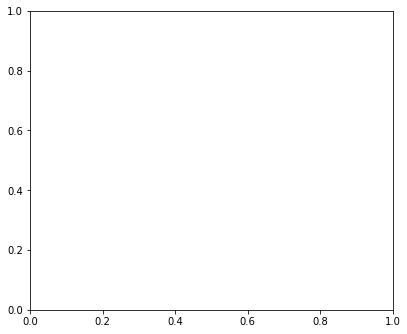

In [39]:
#color
import matplotlib.patches as mpatches
cads=['Alvaro Dias','Jair Bolsonaro','Ciro Gomes','Geraldo Alckmin','Guilherme Boulos','Henrique Meirelles','João Amoêdo','Marina Silva']
mc=['#9C661F','r','b','#7FFF00','#FFB90F','violet','aqua','black']

junto=[]
for candi, color in zip(cads,mc):
    junto.append(mpatches.Patch(color=color, label=candi))
print(len(junto))

par1=[]
par2=[]
pos=len(list_par)
i=0
iss=[]
fig, ax = plt.subplots(figsize=(6.5,5.5))
xmin=0.3
for t,y in zip(list_par2, combi):
    falta=xmin-t[2]/2
    complemento=t[2]-xmin
    #print(var)
    iss.append(i)
    #print('kid',t[2]/2+var)
    p1=t[2]/2+falta+complemento/2
    p2=complemento/2
    #print('p1: ',p1,p2)
    par1.append(p1)
    par2.append(p2)
    #print(par1,par2)
    plt.bar(i,par1,color=y[0],edgecolor='white',alpha=0.75)
    plt.bar(i,par2,color=y[1],edgecolor='white',bottom=par1,alpha=0.75)
    par1=[]
    par2=[]
    i=i+1.2
    
plt.xticks(iss, nombs,rotation=90)
plt.xlabel('Pairs of Strong Similarity', fontsize=16)
plt.ylabel('Similarity', fontsize=16)
#ax.invert_yaxis() 
#plt.title('Stacked Barchart - Happiness index across cities',fontsize=18)
#plt.legend(indices,loc=4)
plt.legend(handles=junto,fontsize=8.5,loc=(0.65, 0.65))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ss=[xmin,0.5]
ax.set_ylim(ss)
plt.show()

In [40]:
def mutul_simi(c1):
    tuples,simis,colors=zip(*c1)
    a_vals = simis
    ind = tuples
    width = 0.4

    def autolabel(bars):
        # attach some text labels
        for bar in bars:
            #print(bar)
            width = bar.get_width()
            ax.text(width*0.95+0.07, bar.get_y() + bar.get_height()/2,
                    round(float(width),2),
                    ha='right', va='center')

    # make the plots
    fig, ax = plt.subplots(figsize=(6.5,5.5))
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)

    a = ax.barh(ind, a_vals, width, color = colors) # plot a vals
    ax.set_yticks(ind)  # position axis ticks
    ax.set_yticklabels(ind)  # set them to the names
    yss=[0,1]
    ss=[0.62,1]
    ax.set_xlim(yss)
    autolabel(a)
    ax.set_ylabel("speech pairs  with strong relationships 8/56", weight='bold', labelpad=5, size=10)
    ax.xaxis.set_visible(False)
    plt.show()

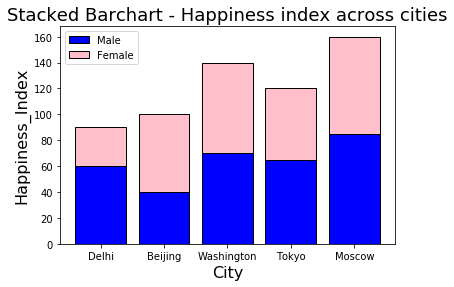

In [41]:
import matplotlib.pyplot as plt
import numpy as np
 
city=['Delhi','Beijing','Washington','Tokyo','Moscow']
Gender=['Male','Female']
pos = np.arange(len(city))
Happiness_Index_Male=[60,40,70,65,85]
Happiness_Index_Female=[30,60,70,55,75]
 
plt.bar(pos,Happiness_Index_Male,color='blue',edgecolor='black')
plt.bar(pos,Happiness_Index_Female,color='pink',edgecolor='black',bottom=Happiness_Index_Male)
plt.xticks(pos, city)
plt.xlabel('City', fontsize=16)
plt.ylabel('Happiness_Index', fontsize=16)
plt.title('Stacked Barchart - Happiness index across cities',fontsize=18)
plt.legend(Gender,loc=2)
plt.show()

In [42]:
type(china)

NameError: name 'china' is not defined

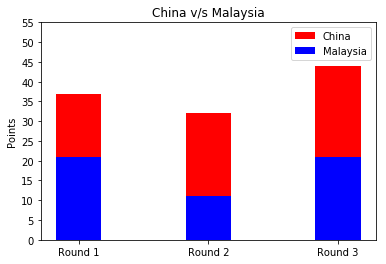

In [43]:
import numpy as np
import matplotlib.pyplot as plt
n = 3
china = (16,21,23)
malaysia = (21,11,21)
x = np.arange(n)
width = 0.35
p1 = plt.bar(x, malaysia, width, color='b')
p2 = plt.bar(x, china, width, color='r', bottom=malaysia)
plt.ylabel('Points')
plt.title('China v/s Malaysia')
plt.xticks(x, ('Round 1', 'Round 2', 'Round 3'))
plt.yticks(np.arange(0, 60, 5))
plt.legend((p2[0], p1[0]), ('China', 'Malaysia'))
plt.show()

### -----------------------------fin------------------------------------------------

In [44]:
from itertools import groupby
def similarity_camada1(labels,model):
    #Preparando dados
    nomes=[]
    for t in labels:
        nomes.append(t[0:4])
    ct=Counter(nomes)
    listoTodo = sorted(labels, key=itemgetter(0,1,2))
    indices=['Alva','Bols','Ciro','Gera','Guil','Henr','Joao','Mari']
    ll_candidatos = [list(value) for key, value in groupby(listoTodo, lambda x: x[0:4])]
    #print(ll_candidatos)
    general=[]
    for dis_candidato in ll_candidatos:
        tmp=[]
        for x in dis_candidato:
            for t in listoTodo:
                if x[0:4]!=t[0:4] and x[0:4] in indices and t[0:4] in indices:
                    print(x,t)
                    tmp.append((x,t,model.docvecs.similarity(x,t)))
                    #print(x,t)
        general.append(tmp)
    return general

In [45]:
cm1= similarity_camada1(labels_d2v,model_d2v)
#cm1

Alva_jan_5 Bols_jan_1
Alva_jan_5 Bols_jan_3
Alva_jan_5 Bols_jan_7
Alva_jan_5 Bols_jan_4
Alva_jan_5 Bols_set_1
Alva_jan_5 Bols_dez_1
Alva_jan_5 Bols_dez_3
Alva_jan_5 Bols_dez_5
Alva_jan_5 Bols_mai_13
Alva_jan_5 Bols_mai_14
Alva_jan_5 Bols_mai_8
Alva_jan_5 Bols_mai_10
Alva_jan_5 Bols_mai_1
Alva_jan_5 Bols_mai_4
Alva_jan_5 Bols_mai_15
Alva_jan_5 Bols_mai_2
Alva_jan_5 Bols_mai_3
Alva_jan_5 Bols_mai_5
Alva_jan_5 Bols_mar_6
Alva_jan_5 Bols_mar_4
Alva_jan_5 Bols_mar_3
Alva_jan_5 Bols_mar_2
Alva_jan_5 Bols_jul_3
Alva_jan_5 Bols_jul_1
Alva_jan_5 Bols_jul_6
Alva_jan_5 Bols_jul_8
Alva_jan_5 Bols_jul_4
Alva_jan_5 Bols_jul_5
Alva_jan_5 Bols_jul_2
Alva_jan_5 Bols_fev_1
Alva_jan_5 Bols_fev_4
Alva_jan_5 Bols_fev_2
Alva_jan_5 Bols_fev_5
Alva_jan_5 Bols_fev_6
Alva_jan_5 Bols_fev_3
Alva_jan_5 Bols_fev_7
Alva_jan_5 Bols_ago_4
Alva_jan_5 Bols_ago_9
Alva_jan_5 Bols_ago_1
Alva_jan_5 Bols_ago_5
Alva_jan_5 Bols_ago_7
Alva_jan_5 Bols_ago_6
Alva_jan_5 Bols_jun_2
Alva_jan_5 Bols_jun_10
Alva_jan_5 Bols_jun_3
Alva_

/usr/local/lib/python3.5/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


Alva_jan_4 Ciro_mar_10
Alva_jan_4 Ciro_mar_2
Alva_jan_4 Ciro_mar_1
Alva_jan_4 Ciro_mar_8
Alva_jan_4 Ciro_mar_4
Alva_jan_4 Ciro_mar_5
Alva_jan_4 Ciro_jul_8
Alva_jan_4 Ciro_jul_9
Alva_jan_4 Ciro_jul_7
Alva_jan_4 Ciro_jul_6
Alva_jan_4 Ciro_jul_10
Alva_jan_4 Ciro_jul_1
Alva_jan_4 Ciro_jul_2
Alva_jan_4 Ciro_jul_5
Alva_jan_4 Ciro_fev_4
Alva_jan_4 Ciro_fev_3
Alva_jan_4 Ciro_fev_5
Alva_jan_4 Ciro_fev_1
Alva_jan_4 Ciro_fev_2
Alva_jan_4 Ciro_fev_6
Alva_jan_4 Ciro_ago_3
Alva_jan_4 Ciro_ago_10
Alva_jan_4 Ciro_ago_15
Alva_jan_4 Ciro_ago_5
Alva_jan_4 Ciro_ago_6
Alva_jan_4 Ciro_ago_1
Alva_jan_4 Ciro_ago_14
Alva_jan_4 Ciro_ago_8
Alva_jan_4 Ciro_ago_4
Alva_jan_4 Ciro_ago_13
Alva_jan_4 Ciro_ago_2
Alva_jan_4 Ciro_ago_11
Alva_jan_4 Ciro_ago_7
Alva_jan_4 Ciro_ago_9
Alva_jan_4 Ciro_ago_12
Alva_jan_4 Ciro_jun_14
Alva_jan_4 Ciro_jun_1
Alva_jan_4 Ciro_jun_13
Alva_jan_4 Ciro_jun_3
Alva_jan_4 Ciro_jun_2
Alva_jan_4 Ciro_jun_9
Alva_jan_4 Ciro_jun_6
Alva_jan_4 Ciro_jun_12
Alva_jan_4 Ciro_jun_4
Alva_jan_4 Ciro_jun_7

Alva_set_3 Joao_set_2
Alva_set_3 Joao_set_1
Alva_set_3 Joao_set_6
Alva_set_3 Joao_dez_1
Alva_set_3 Joao_dez_4
Alva_set_3 Joao_dez_2
Alva_set_3 Joao_dez_3
Alva_set_3 Joao_mai_3
Alva_set_3 Joao_mai_2
Alva_set_3 Joao_mai_1
Alva_set_3 Joao_mai_9
Alva_set_3 Joao_mai_4
Alva_set_3 Joao_mai_8
Alva_set_3 Joao_mai_5
Alva_set_3 Joao_mar_6
Alva_set_3 Joao_mar_8
Alva_set_3 Joao_mar_9
Alva_set_3 Joao_mar_12
Alva_set_3 Joao_mar_11
Alva_set_3 Joao_mar_10
Alva_set_3 Joao_mar_7
Alva_set_3 Joao_mar_4
Alva_set_3 Joao_mar_5
Alva_set_3 Joao_mar_3
Alva_set_3 Joao_mar_2
Alva_set_3 Joao_jul_6
Alva_set_3 Joao_jul_18
Alva_set_3 Joao_jul_13
Alva_set_3 Joao_jul_2
Alva_set_3 Joao_jul_8
Alva_set_3 Joao_jul_5
Alva_set_3 Joao_jul_9
Alva_set_3 Joao_jul_14
Alva_set_3 Joao_jul_4
Alva_set_3 Joao_jul_1
Alva_set_3 Joao_jul_15
Alva_set_3 Joao_jul_19
Alva_set_3 Joao_jul_7
Alva_set_3 Joao_fev_4
Alva_set_3 Joao_fev_1
Alva_set_3 Joao_fev_2
Alva_set_3 Joao_ago_13
Alva_set_3 Joao_ago_12
Alva_set_3 Joao_ago_10
Alva_set_3 Joao_ago_3

Alva_set_4 Ciro_mai_2
Alva_set_4 Ciro_mai_11
Alva_set_4 Ciro_mai_3
Alva_set_4 Ciro_mai_8
Alva_set_4 Ciro_mar_6
Alva_set_4 Ciro_mar_3
Alva_set_4 Ciro_mar_7
Alva_set_4 Ciro_mar_9
Alva_set_4 Ciro_mar_10
Alva_set_4 Ciro_mar_2
Alva_set_4 Ciro_mar_1
Alva_set_4 Ciro_mar_8
Alva_set_4 Ciro_mar_4
Alva_set_4 Ciro_mar_5
Alva_set_4 Ciro_jul_8
Alva_set_4 Ciro_jul_9
Alva_set_4 Ciro_jul_7
Alva_set_4 Ciro_jul_6
Alva_set_4 Ciro_jul_10
Alva_set_4 Ciro_jul_1
Alva_set_4 Ciro_jul_2
Alva_set_4 Ciro_jul_5
Alva_set_4 Ciro_fev_4
Alva_set_4 Ciro_fev_3
Alva_set_4 Ciro_fev_5
Alva_set_4 Ciro_fev_1
Alva_set_4 Ciro_fev_2
Alva_set_4 Ciro_fev_6
Alva_set_4 Ciro_ago_3
Alva_set_4 Ciro_ago_10
Alva_set_4 Ciro_ago_15
Alva_set_4 Ciro_ago_5
Alva_set_4 Ciro_ago_6
Alva_set_4 Ciro_ago_1
Alva_set_4 Ciro_ago_14
Alva_set_4 Ciro_ago_8
Alva_set_4 Ciro_ago_4
Alva_set_4 Ciro_ago_13
Alva_set_4 Ciro_ago_2
Alva_set_4 Ciro_ago_11
Alva_set_4 Ciro_ago_7
Alva_set_4 Ciro_ago_9
Alva_set_4 Ciro_ago_12
Alva_set_4 Ciro_jun_14
Alva_set_4 Ciro_jun_1


Alva_set_1 Mari_jul_8
Alva_set_1 Mari_jul_3
Alva_set_1 Mari_jul_7
Alva_set_1 Mari_jul_6
Alva_set_1 Mari_jul_5
Alva_set_1 Mari_jul_2
Alva_set_1 Mari_ago_6
Alva_set_1 Mari_ago_7
Alva_set_1 Mari_ago_5
Alva_set_1 Mari_ago_3
Alva_set_1 Mari_ago_4
Alva_set_1 Mari_ago_9
Alva_set_1 Mari_ago_10
Alva_set_1 Mari_ago_2
Alva_set_1 Mari_ago_1
Alva_set_1 Mari_jun_3
Alva_set_1 Mari_jun_2
Alva_set_1 Mari_jun_8
Alva_set_1 Mari_jun_11
Alva_set_1 Mari_jun_1
Alva_set_1 Mari_jun_10
Alva_set_1 Mari_jun_4
Alva_set_1 Mari_jun_6
Alva_set_1 Mari_nov_2
Alva_set_1 Mari_nov_1
Alva_set_1 Mari_abr_1
Alva_set_1 Mari_abr_10
Alva_set_1 Mari_abr_3
Alva_set_1 Mari_abr_9
Alva_set_1 Mari_abr_7
Alva_set_1 Mari_abr_4
Alva_set_1 Mari_abr_6
Alva_set_1 Mari_abr_8
Alva_set_1 Mari_abr_2
Alva_set_1 Mari_abr_5
Alva_set_1 Mari_ant_1
Alva_set_1 Mari_out_2
Alva_set_6 Bols_jan_1
Alva_set_6 Bols_jan_3
Alva_set_6 Bols_jan_7
Alva_set_6 Bols_jan_4
Alva_set_6 Bols_set_1
Alva_set_6 Bols_dez_1
Alva_set_6 Bols_dez_3
Alva_set_6 Bols_dez_5
Alva_s

Alva_set_5 Joao_jul_14
Alva_set_5 Joao_jul_4
Alva_set_5 Joao_jul_1
Alva_set_5 Joao_jul_15
Alva_set_5 Joao_jul_19
Alva_set_5 Joao_jul_7
Alva_set_5 Joao_fev_4
Alva_set_5 Joao_fev_1
Alva_set_5 Joao_fev_2
Alva_set_5 Joao_ago_13
Alva_set_5 Joao_ago_12
Alva_set_5 Joao_ago_10
Alva_set_5 Joao_ago_3
Alva_set_5 Joao_ago_1
Alva_set_5 Joao_ago_8
Alva_set_5 Joao_ago_7
Alva_set_5 Joao_ago_5
Alva_set_5 Joao_ago_4
Alva_set_5 Joao_ago_11
Alva_set_5 Joao_ago_9
Alva_set_5 Joao_jun_7
Alva_set_5 Joao_jun_4
Alva_set_5 Joao_jun_3
Alva_set_5 Joao_jun_2
Alva_set_5 Joao_jun_1
Alva_set_5 Joao_jun_6
Alva_set_5 Joao_nov_11
Alva_set_5 Joao_nov_4
Alva_set_5 Joao_nov_8
Alva_set_5 Joao_nov_3
Alva_set_5 Joao_nov_6
Alva_set_5 Joao_nov_5
Alva_set_5 Joao_nov_10
Alva_set_5 Joao_nov_9
Alva_set_5 Joao_nov_2
Alva_set_5 Joao_nov_1
Alva_set_5 Joao_abr_2
Alva_set_5 Joao_abr_3
Alva_set_5 Joao_abr_5
Alva_set_5 Joao_abr_1
Alva_set_5 Joao_ant_1
Alva_set_5 Joao_ant_2
Alva_set_5 Mari_jan_4
Alva_set_5 Mari_jan_1
Alva_set_5 Mari_jan_3
A

Alva_dez_3 Joao_ant_1
Alva_dez_3 Joao_ant_2
Alva_dez_3 Mari_jan_4
Alva_dez_3 Mari_jan_1
Alva_dez_3 Mari_jan_3
Alva_dez_3 Mari_jan_5
Alva_dez_3 Mari_set_1
Alva_dez_3 Mari_set_6
Alva_dez_3 Mari_set_3
Alva_dez_3 Mari_set_7
Alva_dez_3 Mari_set_4
Alva_dez_3 Mari_set_5
Alva_dez_3 Mari_set_2
Alva_dez_3 Mari_dez_2
Alva_dez_3 Mari_dez_3
Alva_dez_3 Mari_mai_12
Alva_dez_3 Mari_mai_4
Alva_dez_3 Mari_mai_8
Alva_dez_3 Mari_mai_3
Alva_dez_3 Mari_mai_2
Alva_dez_3 Mari_mai_9
Alva_dez_3 Mari_mai_7
Alva_dez_3 Mari_mai_11
Alva_dez_3 Mari_mai_6
Alva_dez_3 Mari_mai_1
Alva_dez_3 Mari_mai_5
Alva_dez_3 Mari_mar_1
Alva_dez_3 Mari_jul_8
Alva_dez_3 Mari_jul_3
Alva_dez_3 Mari_jul_7
Alva_dez_3 Mari_jul_6
Alva_dez_3 Mari_jul_5
Alva_dez_3 Mari_jul_2
Alva_dez_3 Mari_ago_6
Alva_dez_3 Mari_ago_7
Alva_dez_3 Mari_ago_5
Alva_dez_3 Mari_ago_3
Alva_dez_3 Mari_ago_4
Alva_dez_3 Mari_ago_9
Alva_dez_3 Mari_ago_10
Alva_dez_3 Mari_ago_2
Alva_dez_3 Mari_ago_1
Alva_dez_3 Mari_jun_3
Alva_dez_3 Mari_jun_2
Alva_dez_3 Mari_jun_8
Alva_de

Alva_mai_10 Guil_jun_22
Alva_mai_10 Guil_jun_14
Alva_mai_10 Guil_jun_23
Alva_mai_10 Guil_jun_2
Alva_mai_10 Guil_nov_4
Alva_mai_10 Guil_nov_2
Alva_mai_10 Guil_nov_3
Alva_mai_10 Guil_abr_6
Alva_mai_10 Guil_abr_3
Alva_mai_10 Guil_abr_1
Alva_mai_10 Guil_abr_4
Alva_mai_10 Guil_abr_10
Alva_mai_10 Guil_abr_2
Alva_mai_10 Guil_abr_11
Alva_mai_10 Guil_abr_8
Alva_mai_10 Guil_out_5
Alva_mai_10 Guil_out_1
Alva_mai_10 Guil_out_2
Alva_mai_10 Guil_out_3
Alva_mai_10 Guil_out_4
Alva_mai_10 Henr_jan_3
Alva_mai_10 Henr_jan_4
Alva_mai_10 Henr_set_1
Alva_mai_10 Henr_set_5
Alva_mai_10 Henr_set_6
Alva_mai_10 Henr_set_8
Alva_mai_10 Henr_set_2
Alva_mai_10 Henr_set_7
Alva_mai_10 Henr_set_3
Alva_mai_10 Henr_dez_3
Alva_mai_10 Henr_dez_4
Alva_mai_10 Henr_dez_2
Alva_mai_10 Henr_mai_5
Alva_mai_10 Henr_mai_7
Alva_mai_10 Henr_mai_4
Alva_mai_10 Henr_mai_2
Alva_mai_10 Henr_mai_3
Alva_mai_10 Henr_mai_9
Alva_mai_10 Henr_mai_1
Alva_mai_10 Henr_mai_6
Alva_mai_10 Henr_mar_1
Alva_mai_10 Henr_mar_3
Alva_mai_10 Henr_jul_3
Alva_m

Alva_mai_9 Ciro_nov_5
Alva_mai_9 Ciro_nov_4
Alva_mai_9 Ciro_nov_3
Alva_mai_9 Ciro_abr_13
Alva_mai_9 Ciro_abr_10
Alva_mai_9 Ciro_abr_8
Alva_mai_9 Ciro_abr_1
Alva_mai_9 Ciro_abr_3
Alva_mai_9 Ciro_abr_4
Alva_mai_9 Ciro_abr_9
Alva_mai_9 Ciro_abr_15
Alva_mai_9 Ciro_abr_7
Alva_mai_9 Ciro_abr_6
Alva_mai_9 Ciro_abr_14
Alva_mai_9 Ciro_abr_5
Alva_mai_9 Ciro_abr_2
Alva_mai_9 Ciro_abr_12
Alva_mai_9 Ciro_abr_11
Alva_mai_9 Ciro_ant_1
Alva_mai_9 Ciro_ant_2
Alva_mai_9 Ciro_out_1
Alva_mai_9 Ciro_out_5
Alva_mai_9 Ciro_out_4
Alva_mai_9 Ciro_out_2
Alva_mai_9 Ciro_out_3
Alva_mai_9 Gera_jan_1
Alva_mai_9 Gera_set_2
Alva_mai_9 Gera_set_3
Alva_mai_9 Gera_set_4
Alva_mai_9 Gera_dez_1
Alva_mai_9 Gera_dez_2
Alva_mai_9 Gera_dez_3
Alva_mai_9 Gera_mai_5
Alva_mai_9 Gera_mai_8
Alva_mai_9 Gera_mai_2
Alva_mai_9 Gera_mai_7
Alva_mai_9 Gera_mai_1
Alva_mai_9 Gera_mai_6
Alva_mai_9 Gera_mar_2
Alva_mai_9 Gera_mar_1
Alva_mai_9 Gera_mar_5
Alva_mai_9 Gera_jul_5
Alva_mai_9 Gera_jul_4
Alva_mai_9 Gera_jul_6
Alva_mai_9 Gera_jul_3
Alva

Alva_mai_1 Ciro_mai_5
Alva_mai_1 Ciro_mai_1
Alva_mai_1 Ciro_mai_2
Alva_mai_1 Ciro_mai_11
Alva_mai_1 Ciro_mai_3
Alva_mai_1 Ciro_mai_8
Alva_mai_1 Ciro_mar_6
Alva_mai_1 Ciro_mar_3
Alva_mai_1 Ciro_mar_7
Alva_mai_1 Ciro_mar_9
Alva_mai_1 Ciro_mar_10
Alva_mai_1 Ciro_mar_2
Alva_mai_1 Ciro_mar_1
Alva_mai_1 Ciro_mar_8
Alva_mai_1 Ciro_mar_4
Alva_mai_1 Ciro_mar_5
Alva_mai_1 Ciro_jul_8
Alva_mai_1 Ciro_jul_9
Alva_mai_1 Ciro_jul_7
Alva_mai_1 Ciro_jul_6
Alva_mai_1 Ciro_jul_10
Alva_mai_1 Ciro_jul_1
Alva_mai_1 Ciro_jul_2
Alva_mai_1 Ciro_jul_5
Alva_mai_1 Ciro_fev_4
Alva_mai_1 Ciro_fev_3
Alva_mai_1 Ciro_fev_5
Alva_mai_1 Ciro_fev_1
Alva_mai_1 Ciro_fev_2
Alva_mai_1 Ciro_fev_6
Alva_mai_1 Ciro_ago_3
Alva_mai_1 Ciro_ago_10
Alva_mai_1 Ciro_ago_15
Alva_mai_1 Ciro_ago_5
Alva_mai_1 Ciro_ago_6
Alva_mai_1 Ciro_ago_1
Alva_mai_1 Ciro_ago_14
Alva_mai_1 Ciro_ago_8
Alva_mai_1 Ciro_ago_4
Alva_mai_1 Ciro_ago_13
Alva_mai_1 Ciro_ago_2
Alva_mai_1 Ciro_ago_11
Alva_mai_1 Ciro_ago_7
Alva_mai_1 Ciro_ago_9
Alva_mai_1 Ciro_ago_12
A

Alva_mai_2 Ciro_fev_1
Alva_mai_2 Ciro_fev_2
Alva_mai_2 Ciro_fev_6
Alva_mai_2 Ciro_ago_3
Alva_mai_2 Ciro_ago_10
Alva_mai_2 Ciro_ago_15
Alva_mai_2 Ciro_ago_5
Alva_mai_2 Ciro_ago_6
Alva_mai_2 Ciro_ago_1
Alva_mai_2 Ciro_ago_14
Alva_mai_2 Ciro_ago_8
Alva_mai_2 Ciro_ago_4
Alva_mai_2 Ciro_ago_13
Alva_mai_2 Ciro_ago_2
Alva_mai_2 Ciro_ago_11
Alva_mai_2 Ciro_ago_7
Alva_mai_2 Ciro_ago_9
Alva_mai_2 Ciro_ago_12
Alva_mai_2 Ciro_jun_14
Alva_mai_2 Ciro_jun_1
Alva_mai_2 Ciro_jun_13
Alva_mai_2 Ciro_jun_3
Alva_mai_2 Ciro_jun_2
Alva_mai_2 Ciro_jun_9
Alva_mai_2 Ciro_jun_6
Alva_mai_2 Ciro_jun_12
Alva_mai_2 Ciro_jun_4
Alva_mai_2 Ciro_jun_7
Alva_mai_2 Ciro_jun_11
Alva_mai_2 Ciro_jun_5
Alva_mai_2 Ciro_nov_6
Alva_mai_2 Ciro_nov_1
Alva_mai_2 Ciro_nov_2
Alva_mai_2 Ciro_nov_8
Alva_mai_2 Ciro_nov_7
Alva_mai_2 Ciro_nov_9
Alva_mai_2 Ciro_nov_5
Alva_mai_2 Ciro_nov_4
Alva_mai_2 Ciro_nov_3
Alva_mai_2 Ciro_abr_13
Alva_mai_2 Ciro_abr_10
Alva_mai_2 Ciro_abr_8
Alva_mai_2 Ciro_abr_1
Alva_mai_2 Ciro_abr_3
Alva_mai_2 Ciro_abr_

Alva_mai_5 Mari_jun_6
Alva_mai_5 Mari_nov_2
Alva_mai_5 Mari_nov_1
Alva_mai_5 Mari_abr_1
Alva_mai_5 Mari_abr_10
Alva_mai_5 Mari_abr_3
Alva_mai_5 Mari_abr_9
Alva_mai_5 Mari_abr_7
Alva_mai_5 Mari_abr_4
Alva_mai_5 Mari_abr_6
Alva_mai_5 Mari_abr_8
Alva_mai_5 Mari_abr_2
Alva_mai_5 Mari_abr_5
Alva_mai_5 Mari_ant_1
Alva_mai_5 Mari_out_2
Alva_mai_6 Bols_jan_1
Alva_mai_6 Bols_jan_3
Alva_mai_6 Bols_jan_7
Alva_mai_6 Bols_jan_4
Alva_mai_6 Bols_set_1
Alva_mai_6 Bols_dez_1
Alva_mai_6 Bols_dez_3
Alva_mai_6 Bols_dez_5
Alva_mai_6 Bols_mai_13
Alva_mai_6 Bols_mai_14
Alva_mai_6 Bols_mai_8
Alva_mai_6 Bols_mai_10
Alva_mai_6 Bols_mai_1
Alva_mai_6 Bols_mai_4
Alva_mai_6 Bols_mai_15
Alva_mai_6 Bols_mai_2
Alva_mai_6 Bols_mai_3
Alva_mai_6 Bols_mai_5
Alva_mai_6 Bols_mar_6
Alva_mai_6 Bols_mar_4
Alva_mai_6 Bols_mar_3
Alva_mai_6 Bols_mar_2
Alva_mai_6 Bols_jul_3
Alva_mai_6 Bols_jul_1
Alva_mai_6 Bols_jul_6
Alva_mai_6 Bols_jul_8
Alva_mai_6 Bols_jul_4
Alva_mai_6 Bols_jul_5
Alva_mai_6 Bols_jul_2
Alva_mai_6 Bols_fev_1
Alva_

Alva_mar_4 Guil_ago_12
Alva_mar_4 Guil_ago_8
Alva_mar_4 Guil_ago_4
Alva_mar_4 Guil_ago_2
Alva_mar_4 Guil_ago_16
Alva_mar_4 Guil_ago_1
Alva_mar_4 Guil_ago_10
Alva_mar_4 Guil_ago_13
Alva_mar_4 Guil_ago_6
Alva_mar_4 Guil_jun_19
Alva_mar_4 Guil_jun_3
Alva_mar_4 Guil_jun_4
Alva_mar_4 Guil_jun_21
Alva_mar_4 Guil_jun_13
Alva_mar_4 Guil_jun_7
Alva_mar_4 Guil_jun_12
Alva_mar_4 Guil_jun_18
Alva_mar_4 Guil_jun_16
Alva_mar_4 Guil_jun_1
Alva_mar_4 Guil_jun_10
Alva_mar_4 Guil_jun_20
Alva_mar_4 Guil_jun_8
Alva_mar_4 Guil_jun_22
Alva_mar_4 Guil_jun_14
Alva_mar_4 Guil_jun_23
Alva_mar_4 Guil_jun_2
Alva_mar_4 Guil_nov_4
Alva_mar_4 Guil_nov_2
Alva_mar_4 Guil_nov_3
Alva_mar_4 Guil_abr_6
Alva_mar_4 Guil_abr_3
Alva_mar_4 Guil_abr_1
Alva_mar_4 Guil_abr_4
Alva_mar_4 Guil_abr_10
Alva_mar_4 Guil_abr_2
Alva_mar_4 Guil_abr_11
Alva_mar_4 Guil_abr_8
Alva_mar_4 Guil_out_5
Alva_mar_4 Guil_out_1
Alva_mar_4 Guil_out_2
Alva_mar_4 Guil_out_3
Alva_mar_4 Guil_out_4
Alva_mar_4 Henr_jan_3
Alva_mar_4 Henr_jan_4
Alva_mar_4 Henr

Alva_mar_1 Mari_dez_2
Alva_mar_1 Mari_dez_3
Alva_mar_1 Mari_mai_12
Alva_mar_1 Mari_mai_4
Alva_mar_1 Mari_mai_8
Alva_mar_1 Mari_mai_3
Alva_mar_1 Mari_mai_2
Alva_mar_1 Mari_mai_9
Alva_mar_1 Mari_mai_7
Alva_mar_1 Mari_mai_11
Alva_mar_1 Mari_mai_6
Alva_mar_1 Mari_mai_1
Alva_mar_1 Mari_mai_5
Alva_mar_1 Mari_mar_1
Alva_mar_1 Mari_jul_8
Alva_mar_1 Mari_jul_3
Alva_mar_1 Mari_jul_7
Alva_mar_1 Mari_jul_6
Alva_mar_1 Mari_jul_5
Alva_mar_1 Mari_jul_2
Alva_mar_1 Mari_ago_6
Alva_mar_1 Mari_ago_7
Alva_mar_1 Mari_ago_5
Alva_mar_1 Mari_ago_3
Alva_mar_1 Mari_ago_4
Alva_mar_1 Mari_ago_9
Alva_mar_1 Mari_ago_10
Alva_mar_1 Mari_ago_2
Alva_mar_1 Mari_ago_1
Alva_mar_1 Mari_jun_3
Alva_mar_1 Mari_jun_2
Alva_mar_1 Mari_jun_8
Alva_mar_1 Mari_jun_11
Alva_mar_1 Mari_jun_1
Alva_mar_1 Mari_jun_10
Alva_mar_1 Mari_jun_4
Alva_mar_1 Mari_jun_6
Alva_mar_1 Mari_nov_2
Alva_mar_1 Mari_nov_1
Alva_mar_1 Mari_abr_1
Alva_mar_1 Mari_abr_10
Alva_mar_1 Mari_abr_3
Alva_mar_1 Mari_abr_9
Alva_mar_1 Mari_abr_7
Alva_mar_1 Mari_abr_4
Alva

Alva_jul_2 Mari_ago_2
Alva_jul_2 Mari_ago_1
Alva_jul_2 Mari_jun_3
Alva_jul_2 Mari_jun_2
Alva_jul_2 Mari_jun_8
Alva_jul_2 Mari_jun_11
Alva_jul_2 Mari_jun_1
Alva_jul_2 Mari_jun_10
Alva_jul_2 Mari_jun_4
Alva_jul_2 Mari_jun_6
Alva_jul_2 Mari_nov_2
Alva_jul_2 Mari_nov_1
Alva_jul_2 Mari_abr_1
Alva_jul_2 Mari_abr_10
Alva_jul_2 Mari_abr_3
Alva_jul_2 Mari_abr_9
Alva_jul_2 Mari_abr_7
Alva_jul_2 Mari_abr_4
Alva_jul_2 Mari_abr_6
Alva_jul_2 Mari_abr_8
Alva_jul_2 Mari_abr_2
Alva_jul_2 Mari_abr_5
Alva_jul_2 Mari_ant_1
Alva_jul_2 Mari_out_2
Alva_jul_1 Bols_jan_1
Alva_jul_1 Bols_jan_3
Alva_jul_1 Bols_jan_7
Alva_jul_1 Bols_jan_4
Alva_jul_1 Bols_set_1
Alva_jul_1 Bols_dez_1
Alva_jul_1 Bols_dez_3
Alva_jul_1 Bols_dez_5
Alva_jul_1 Bols_mai_13
Alva_jul_1 Bols_mai_14
Alva_jul_1 Bols_mai_8
Alva_jul_1 Bols_mai_10
Alva_jul_1 Bols_mai_1
Alva_jul_1 Bols_mai_4
Alva_jul_1 Bols_mai_15
Alva_jul_1 Bols_mai_2
Alva_jul_1 Bols_mai_3
Alva_jul_1 Bols_mai_5
Alva_jul_1 Bols_mar_6
Alva_jul_1 Bols_mar_4
Alva_jul_1 Bols_mar_3
Alv

Alva_jul_3 Joao_set_1
Alva_jul_3 Joao_set_6
Alva_jul_3 Joao_dez_1
Alva_jul_3 Joao_dez_4
Alva_jul_3 Joao_dez_2
Alva_jul_3 Joao_dez_3
Alva_jul_3 Joao_mai_3
Alva_jul_3 Joao_mai_2
Alva_jul_3 Joao_mai_1
Alva_jul_3 Joao_mai_9
Alva_jul_3 Joao_mai_4
Alva_jul_3 Joao_mai_8
Alva_jul_3 Joao_mai_5
Alva_jul_3 Joao_mar_6
Alva_jul_3 Joao_mar_8
Alva_jul_3 Joao_mar_9
Alva_jul_3 Joao_mar_12
Alva_jul_3 Joao_mar_11
Alva_jul_3 Joao_mar_10
Alva_jul_3 Joao_mar_7
Alva_jul_3 Joao_mar_4
Alva_jul_3 Joao_mar_5
Alva_jul_3 Joao_mar_3
Alva_jul_3 Joao_mar_2
Alva_jul_3 Joao_jul_6
Alva_jul_3 Joao_jul_18
Alva_jul_3 Joao_jul_13
Alva_jul_3 Joao_jul_2
Alva_jul_3 Joao_jul_8
Alva_jul_3 Joao_jul_5
Alva_jul_3 Joao_jul_9
Alva_jul_3 Joao_jul_14
Alva_jul_3 Joao_jul_4
Alva_jul_3 Joao_jul_1
Alva_jul_3 Joao_jul_15
Alva_jul_3 Joao_jul_19
Alva_jul_3 Joao_jul_7
Alva_jul_3 Joao_fev_4
Alva_jul_3 Joao_fev_1
Alva_jul_3 Joao_fev_2
Alva_jul_3 Joao_ago_13
Alva_jul_3 Joao_ago_12
Alva_jul_3 Joao_ago_10
Alva_jul_3 Joao_ago_3
Alva_jul_3 Joao_ago_1

Alva_jul_11 Guil_jun_12
Alva_jul_11 Guil_jun_18
Alva_jul_11 Guil_jun_16
Alva_jul_11 Guil_jun_1
Alva_jul_11 Guil_jun_10
Alva_jul_11 Guil_jun_20
Alva_jul_11 Guil_jun_8
Alva_jul_11 Guil_jun_22
Alva_jul_11 Guil_jun_14
Alva_jul_11 Guil_jun_23
Alva_jul_11 Guil_jun_2
Alva_jul_11 Guil_nov_4
Alva_jul_11 Guil_nov_2
Alva_jul_11 Guil_nov_3
Alva_jul_11 Guil_abr_6
Alva_jul_11 Guil_abr_3
Alva_jul_11 Guil_abr_1
Alva_jul_11 Guil_abr_4
Alva_jul_11 Guil_abr_10
Alva_jul_11 Guil_abr_2
Alva_jul_11 Guil_abr_11
Alva_jul_11 Guil_abr_8
Alva_jul_11 Guil_out_5
Alva_jul_11 Guil_out_1
Alva_jul_11 Guil_out_2
Alva_jul_11 Guil_out_3
Alva_jul_11 Guil_out_4
Alva_jul_11 Henr_jan_3
Alva_jul_11 Henr_jan_4
Alva_jul_11 Henr_set_1
Alva_jul_11 Henr_set_5
Alva_jul_11 Henr_set_6
Alva_jul_11 Henr_set_8
Alva_jul_11 Henr_set_2
Alva_jul_11 Henr_set_7
Alva_jul_11 Henr_set_3
Alva_jul_11 Henr_dez_3
Alva_jul_11 Henr_dez_4
Alva_jul_11 Henr_dez_2
Alva_jul_11 Henr_mai_5
Alva_jul_11 Henr_mai_7
Alva_jul_11 Henr_mai_4
Alva_jul_11 Henr_mai_2
A

Alva_jul_8 Bols_jun_8
Alva_jul_8 Bols_jun_4
Alva_jul_8 Bols_jun_9
Alva_jul_8 Bols_jun_7
Alva_jul_8 Bols_jun_12
Alva_jul_8 Bols_jun_11
Alva_jul_8 Bols_nov_5
Alva_jul_8 Bols_nov_1
Alva_jul_8 Bols_nov_3
Alva_jul_8 Bols_nov_2
Alva_jul_8 Bols_abr_5
Alva_jul_8 Bols_abr_6
Alva_jul_8 Bols_abr_4
Alva_jul_8 Bols_abr_3
Alva_jul_8 Bols_abr_2
Alva_jul_8 Bols_abr_8
Alva_jul_8 Bols_abr_1
Alva_jul_8 Bols_out_2
Alva_jul_8 Bols_out_1
Alva_jul_8 Ciro_jan_1
Alva_jul_8 Ciro_jan_5
Alva_jul_8 Ciro_jan_3
Alva_jul_8 Ciro_set_3
Alva_jul_8 Ciro_set_4
Alva_jul_8 Ciro_set_6
Alva_jul_8 Ciro_set_7
Alva_jul_8 Ciro_set_1
Alva_jul_8 Ciro_set_5
Alva_jul_8 Ciro_set_8
Alva_jul_8 Ciro_set_2
Alva_jul_8 Ciro_dez_9
Alva_jul_8 Ciro_dez_7
Alva_jul_8 Ciro_dez_4
Alva_jul_8 Ciro_dez_11
Alva_jul_8 Ciro_dez_2
Alva_jul_8 Ciro_dez_6
Alva_jul_8 Ciro_dez_1
Alva_jul_8 Ciro_dez_8
Alva_jul_8 Ciro_mai_10
Alva_jul_8 Ciro_mai_6
Alva_jul_8 Ciro_mai_7
Alva_jul_8 Ciro_mai_4
Alva_jul_8 Ciro_mai_5
Alva_jul_8 Ciro_mai_1
Alva_jul_8 Ciro_mai_2
Alva_j

Alva_jul_9 Bols_jun_10
Alva_jul_9 Bols_jun_3
Alva_jul_9 Bols_jun_1
Alva_jul_9 Bols_jun_8
Alva_jul_9 Bols_jun_4
Alva_jul_9 Bols_jun_9
Alva_jul_9 Bols_jun_7
Alva_jul_9 Bols_jun_12
Alva_jul_9 Bols_jun_11
Alva_jul_9 Bols_nov_5
Alva_jul_9 Bols_nov_1
Alva_jul_9 Bols_nov_3
Alva_jul_9 Bols_nov_2
Alva_jul_9 Bols_abr_5
Alva_jul_9 Bols_abr_6
Alva_jul_9 Bols_abr_4
Alva_jul_9 Bols_abr_3
Alva_jul_9 Bols_abr_2
Alva_jul_9 Bols_abr_8
Alva_jul_9 Bols_abr_1
Alva_jul_9 Bols_out_2
Alva_jul_9 Bols_out_1
Alva_jul_9 Ciro_jan_1
Alva_jul_9 Ciro_jan_5
Alva_jul_9 Ciro_jan_3
Alva_jul_9 Ciro_set_3
Alva_jul_9 Ciro_set_4
Alva_jul_9 Ciro_set_6
Alva_jul_9 Ciro_set_7
Alva_jul_9 Ciro_set_1
Alva_jul_9 Ciro_set_5
Alva_jul_9 Ciro_set_8
Alva_jul_9 Ciro_set_2
Alva_jul_9 Ciro_dez_9
Alva_jul_9 Ciro_dez_7
Alva_jul_9 Ciro_dez_4
Alva_jul_9 Ciro_dez_11
Alva_jul_9 Ciro_dez_2
Alva_jul_9 Ciro_dez_6
Alva_jul_9 Ciro_dez_1
Alva_jul_9 Ciro_dez_8
Alva_jul_9 Ciro_mai_10
Alva_jul_9 Ciro_mai_6
Alva_jul_9 Ciro_mai_7
Alva_jul_9 Ciro_mai_4
Alva_

Alva_jul_12 Joao_ago_9
Alva_jul_12 Joao_jun_7
Alva_jul_12 Joao_jun_4
Alva_jul_12 Joao_jun_3
Alva_jul_12 Joao_jun_2
Alva_jul_12 Joao_jun_1
Alva_jul_12 Joao_jun_6
Alva_jul_12 Joao_nov_11
Alva_jul_12 Joao_nov_4
Alva_jul_12 Joao_nov_8
Alva_jul_12 Joao_nov_3
Alva_jul_12 Joao_nov_6
Alva_jul_12 Joao_nov_5
Alva_jul_12 Joao_nov_10
Alva_jul_12 Joao_nov_9
Alva_jul_12 Joao_nov_2
Alva_jul_12 Joao_nov_1
Alva_jul_12 Joao_abr_2
Alva_jul_12 Joao_abr_3
Alva_jul_12 Joao_abr_5
Alva_jul_12 Joao_abr_1
Alva_jul_12 Joao_ant_1
Alva_jul_12 Joao_ant_2
Alva_jul_12 Mari_jan_4
Alva_jul_12 Mari_jan_1
Alva_jul_12 Mari_jan_3
Alva_jul_12 Mari_jan_5
Alva_jul_12 Mari_set_1
Alva_jul_12 Mari_set_6
Alva_jul_12 Mari_set_3
Alva_jul_12 Mari_set_7
Alva_jul_12 Mari_set_4
Alva_jul_12 Mari_set_5
Alva_jul_12 Mari_set_2
Alva_jul_12 Mari_dez_2
Alva_jul_12 Mari_dez_3
Alva_jul_12 Mari_mai_12
Alva_jul_12 Mari_mai_4
Alva_jul_12 Mari_mai_8
Alva_jul_12 Mari_mai_3
Alva_jul_12 Mari_mai_2
Alva_jul_12 Mari_mai_9
Alva_jul_12 Mari_mai_7
Alva_jul

Alva_fev_4 Joao_set_2
Alva_fev_4 Joao_set_1
Alva_fev_4 Joao_set_6
Alva_fev_4 Joao_dez_1
Alva_fev_4 Joao_dez_4
Alva_fev_4 Joao_dez_2
Alva_fev_4 Joao_dez_3
Alva_fev_4 Joao_mai_3
Alva_fev_4 Joao_mai_2
Alva_fev_4 Joao_mai_1
Alva_fev_4 Joao_mai_9
Alva_fev_4 Joao_mai_4
Alva_fev_4 Joao_mai_8
Alva_fev_4 Joao_mai_5
Alva_fev_4 Joao_mar_6
Alva_fev_4 Joao_mar_8
Alva_fev_4 Joao_mar_9
Alva_fev_4 Joao_mar_12
Alva_fev_4 Joao_mar_11
Alva_fev_4 Joao_mar_10
Alva_fev_4 Joao_mar_7
Alva_fev_4 Joao_mar_4
Alva_fev_4 Joao_mar_5
Alva_fev_4 Joao_mar_3
Alva_fev_4 Joao_mar_2
Alva_fev_4 Joao_jul_6
Alva_fev_4 Joao_jul_18
Alva_fev_4 Joao_jul_13
Alva_fev_4 Joao_jul_2
Alva_fev_4 Joao_jul_8
Alva_fev_4 Joao_jul_5
Alva_fev_4 Joao_jul_9
Alva_fev_4 Joao_jul_14
Alva_fev_4 Joao_jul_4
Alva_fev_4 Joao_jul_1
Alva_fev_4 Joao_jul_15
Alva_fev_4 Joao_jul_19
Alva_fev_4 Joao_jul_7
Alva_fev_4 Joao_fev_4
Alva_fev_4 Joao_fev_1
Alva_fev_4 Joao_fev_2
Alva_fev_4 Joao_ago_13
Alva_fev_4 Joao_ago_12
Alva_fev_4 Joao_ago_10
Alva_fev_4 Joao_ago_3

Alva_fev_5 Guil_jul_5
Alva_fev_5 Guil_jul_3
Alva_fev_5 Guil_jul_6
Alva_fev_5 Guil_jul_15
Alva_fev_5 Guil_jul_13
Alva_fev_5 Guil_jul_7
Alva_fev_5 Guil_jul_4
Alva_fev_5 Guil_jul_10
Alva_fev_5 Guil_jul_1
Alva_fev_5 Guil_jul_9
Alva_fev_5 Guil_jul_8
Alva_fev_5 Guil_fev_1
Alva_fev_5 Guil_fev_2
Alva_fev_5 Guil_ago_7
Alva_fev_5 Guil_ago_11
Alva_fev_5 Guil_ago_3
Alva_fev_5 Guil_ago_12
Alva_fev_5 Guil_ago_8
Alva_fev_5 Guil_ago_4
Alva_fev_5 Guil_ago_2
Alva_fev_5 Guil_ago_16
Alva_fev_5 Guil_ago_1
Alva_fev_5 Guil_ago_10
Alva_fev_5 Guil_ago_13
Alva_fev_5 Guil_ago_6
Alva_fev_5 Guil_jun_19
Alva_fev_5 Guil_jun_3
Alva_fev_5 Guil_jun_4
Alva_fev_5 Guil_jun_21
Alva_fev_5 Guil_jun_13
Alva_fev_5 Guil_jun_7
Alva_fev_5 Guil_jun_12
Alva_fev_5 Guil_jun_18
Alva_fev_5 Guil_jun_16
Alva_fev_5 Guil_jun_1
Alva_fev_5 Guil_jun_10
Alva_fev_5 Guil_jun_20
Alva_fev_5 Guil_jun_8
Alva_fev_5 Guil_jun_22
Alva_fev_5 Guil_jun_14
Alva_fev_5 Guil_jun_23
Alva_fev_5 Guil_jun_2
Alva_fev_5 Guil_nov_4
Alva_fev_5 Guil_nov_2
Alva_fev_5 Gu

Alva_ago_4 Ciro_ant_2
Alva_ago_4 Ciro_out_1
Alva_ago_4 Ciro_out_5
Alva_ago_4 Ciro_out_4
Alva_ago_4 Ciro_out_2
Alva_ago_4 Ciro_out_3
Alva_ago_4 Gera_jan_1
Alva_ago_4 Gera_set_2
Alva_ago_4 Gera_set_3
Alva_ago_4 Gera_set_4
Alva_ago_4 Gera_dez_1
Alva_ago_4 Gera_dez_2
Alva_ago_4 Gera_dez_3
Alva_ago_4 Gera_mai_5
Alva_ago_4 Gera_mai_8
Alva_ago_4 Gera_mai_2
Alva_ago_4 Gera_mai_7
Alva_ago_4 Gera_mai_1
Alva_ago_4 Gera_mai_6
Alva_ago_4 Gera_mar_2
Alva_ago_4 Gera_mar_1
Alva_ago_4 Gera_mar_5
Alva_ago_4 Gera_jul_5
Alva_ago_4 Gera_jul_4
Alva_ago_4 Gera_jul_6
Alva_ago_4 Gera_jul_3
Alva_ago_4 Gera_jul_2
Alva_ago_4 Gera_jul_1
Alva_ago_4 Gera_ago_2
Alva_ago_4 Gera_ago_7
Alva_ago_4 Gera_ago_5
Alva_ago_4 Gera_ago_4
Alva_ago_4 Gera_ago_6
Alva_ago_4 Gera_ago_3
Alva_ago_4 Gera_ago_1
Alva_ago_4 Gera_jun_4
Alva_ago_4 Gera_jun_5
Alva_ago_4 Gera_jun_7
Alva_ago_4 Gera_jun_2
Alva_ago_4 Gera_jun_1
Alva_ago_4 Gera_jun_3
Alva_ago_4 Gera_jun_6
Alva_ago_4 Gera_nov_2
Alva_ago_4 Gera_abr_1
Alva_ago_4 Gera_abr_3
Alva_ago_4

Alva_ago_10 Ciro_ago_14
Alva_ago_10 Ciro_ago_8
Alva_ago_10 Ciro_ago_4
Alva_ago_10 Ciro_ago_13
Alva_ago_10 Ciro_ago_2
Alva_ago_10 Ciro_ago_11
Alva_ago_10 Ciro_ago_7
Alva_ago_10 Ciro_ago_9
Alva_ago_10 Ciro_ago_12
Alva_ago_10 Ciro_jun_14
Alva_ago_10 Ciro_jun_1
Alva_ago_10 Ciro_jun_13
Alva_ago_10 Ciro_jun_3
Alva_ago_10 Ciro_jun_2
Alva_ago_10 Ciro_jun_9
Alva_ago_10 Ciro_jun_6
Alva_ago_10 Ciro_jun_12
Alva_ago_10 Ciro_jun_4
Alva_ago_10 Ciro_jun_7
Alva_ago_10 Ciro_jun_11
Alva_ago_10 Ciro_jun_5
Alva_ago_10 Ciro_nov_6
Alva_ago_10 Ciro_nov_1
Alva_ago_10 Ciro_nov_2
Alva_ago_10 Ciro_nov_8
Alva_ago_10 Ciro_nov_7
Alva_ago_10 Ciro_nov_9
Alva_ago_10 Ciro_nov_5
Alva_ago_10 Ciro_nov_4
Alva_ago_10 Ciro_nov_3
Alva_ago_10 Ciro_abr_13
Alva_ago_10 Ciro_abr_10
Alva_ago_10 Ciro_abr_8
Alva_ago_10 Ciro_abr_1
Alva_ago_10 Ciro_abr_3
Alva_ago_10 Ciro_abr_4
Alva_ago_10 Ciro_abr_9
Alva_ago_10 Ciro_abr_15
Alva_ago_10 Ciro_abr_7
Alva_ago_10 Ciro_abr_6
Alva_ago_10 Ciro_abr_14
Alva_ago_10 Ciro_abr_5
Alva_ago_10 Ciro_abr_2

Alva_ago_8 Mari_ago_2
Alva_ago_8 Mari_ago_1
Alva_ago_8 Mari_jun_3
Alva_ago_8 Mari_jun_2
Alva_ago_8 Mari_jun_8
Alva_ago_8 Mari_jun_11
Alva_ago_8 Mari_jun_1
Alva_ago_8 Mari_jun_10
Alva_ago_8 Mari_jun_4
Alva_ago_8 Mari_jun_6
Alva_ago_8 Mari_nov_2
Alva_ago_8 Mari_nov_1
Alva_ago_8 Mari_abr_1
Alva_ago_8 Mari_abr_10
Alva_ago_8 Mari_abr_3
Alva_ago_8 Mari_abr_9
Alva_ago_8 Mari_abr_7
Alva_ago_8 Mari_abr_4
Alva_ago_8 Mari_abr_6
Alva_ago_8 Mari_abr_8
Alva_ago_8 Mari_abr_2
Alva_ago_8 Mari_abr_5
Alva_ago_8 Mari_ant_1
Alva_ago_8 Mari_out_2
Alva_ago_9 Bols_jan_1
Alva_ago_9 Bols_jan_3
Alva_ago_9 Bols_jan_7
Alva_ago_9 Bols_jan_4
Alva_ago_9 Bols_set_1
Alva_ago_9 Bols_dez_1
Alva_ago_9 Bols_dez_3
Alva_ago_9 Bols_dez_5
Alva_ago_9 Bols_mai_13
Alva_ago_9 Bols_mai_14
Alva_ago_9 Bols_mai_8
Alva_ago_9 Bols_mai_10
Alva_ago_9 Bols_mai_1
Alva_ago_9 Bols_mai_4
Alva_ago_9 Bols_mai_15
Alva_ago_9 Bols_mai_2
Alva_ago_9 Bols_mai_3
Alva_ago_9 Bols_mai_5
Alva_ago_9 Bols_mar_6
Alva_ago_9 Bols_mar_4
Alva_ago_9 Bols_mar_3
Alv

Alva_ago_2 Bols_set_1
Alva_ago_2 Bols_dez_1
Alva_ago_2 Bols_dez_3
Alva_ago_2 Bols_dez_5
Alva_ago_2 Bols_mai_13
Alva_ago_2 Bols_mai_14
Alva_ago_2 Bols_mai_8
Alva_ago_2 Bols_mai_10
Alva_ago_2 Bols_mai_1
Alva_ago_2 Bols_mai_4
Alva_ago_2 Bols_mai_15
Alva_ago_2 Bols_mai_2
Alva_ago_2 Bols_mai_3
Alva_ago_2 Bols_mai_5
Alva_ago_2 Bols_mar_6
Alva_ago_2 Bols_mar_4
Alva_ago_2 Bols_mar_3
Alva_ago_2 Bols_mar_2
Alva_ago_2 Bols_jul_3
Alva_ago_2 Bols_jul_1
Alva_ago_2 Bols_jul_6
Alva_ago_2 Bols_jul_8
Alva_ago_2 Bols_jul_4
Alva_ago_2 Bols_jul_5
Alva_ago_2 Bols_jul_2
Alva_ago_2 Bols_fev_1
Alva_ago_2 Bols_fev_4
Alva_ago_2 Bols_fev_2
Alva_ago_2 Bols_fev_5
Alva_ago_2 Bols_fev_6
Alva_ago_2 Bols_fev_3
Alva_ago_2 Bols_fev_7
Alva_ago_2 Bols_ago_4
Alva_ago_2 Bols_ago_9
Alva_ago_2 Bols_ago_1
Alva_ago_2 Bols_ago_5
Alva_ago_2 Bols_ago_7
Alva_ago_2 Bols_ago_6
Alva_ago_2 Bols_jun_2
Alva_ago_2 Bols_jun_10
Alva_ago_2 Bols_jun_3
Alva_ago_2 Bols_jun_1
Alva_ago_2 Bols_jun_8
Alva_ago_2 Bols_jun_4
Alva_ago_2 Bols_jun_9
Alva_

Alva_ago_3 Mari_set_3
Alva_ago_3 Mari_set_7
Alva_ago_3 Mari_set_4
Alva_ago_3 Mari_set_5
Alva_ago_3 Mari_set_2
Alva_ago_3 Mari_dez_2
Alva_ago_3 Mari_dez_3
Alva_ago_3 Mari_mai_12
Alva_ago_3 Mari_mai_4
Alva_ago_3 Mari_mai_8
Alva_ago_3 Mari_mai_3
Alva_ago_3 Mari_mai_2
Alva_ago_3 Mari_mai_9
Alva_ago_3 Mari_mai_7
Alva_ago_3 Mari_mai_11
Alva_ago_3 Mari_mai_6
Alva_ago_3 Mari_mai_1
Alva_ago_3 Mari_mai_5
Alva_ago_3 Mari_mar_1
Alva_ago_3 Mari_jul_8
Alva_ago_3 Mari_jul_3
Alva_ago_3 Mari_jul_7
Alva_ago_3 Mari_jul_6
Alva_ago_3 Mari_jul_5
Alva_ago_3 Mari_jul_2
Alva_ago_3 Mari_ago_6
Alva_ago_3 Mari_ago_7
Alva_ago_3 Mari_ago_5
Alva_ago_3 Mari_ago_3
Alva_ago_3 Mari_ago_4
Alva_ago_3 Mari_ago_9
Alva_ago_3 Mari_ago_10
Alva_ago_3 Mari_ago_2
Alva_ago_3 Mari_ago_1
Alva_ago_3 Mari_jun_3
Alva_ago_3 Mari_jun_2
Alva_ago_3 Mari_jun_8
Alva_ago_3 Mari_jun_11
Alva_ago_3 Mari_jun_1
Alva_ago_3 Mari_jun_10
Alva_ago_3 Mari_jun_4
Alva_ago_3 Mari_jun_6
Alva_ago_3 Mari_nov_2
Alva_ago_3 Mari_nov_1
Alva_ago_3 Mari_abr_1
Alva_

Alva_ago_15 Bols_jun_1
Alva_ago_15 Bols_jun_8
Alva_ago_15 Bols_jun_4
Alva_ago_15 Bols_jun_9
Alva_ago_15 Bols_jun_7
Alva_ago_15 Bols_jun_12
Alva_ago_15 Bols_jun_11
Alva_ago_15 Bols_nov_5
Alva_ago_15 Bols_nov_1
Alva_ago_15 Bols_nov_3
Alva_ago_15 Bols_nov_2
Alva_ago_15 Bols_abr_5
Alva_ago_15 Bols_abr_6
Alva_ago_15 Bols_abr_4
Alva_ago_15 Bols_abr_3
Alva_ago_15 Bols_abr_2
Alva_ago_15 Bols_abr_8
Alva_ago_15 Bols_abr_1
Alva_ago_15 Bols_out_2
Alva_ago_15 Bols_out_1
Alva_ago_15 Ciro_jan_1
Alva_ago_15 Ciro_jan_5
Alva_ago_15 Ciro_jan_3
Alva_ago_15 Ciro_set_3
Alva_ago_15 Ciro_set_4
Alva_ago_15 Ciro_set_6
Alva_ago_15 Ciro_set_7
Alva_ago_15 Ciro_set_1
Alva_ago_15 Ciro_set_5
Alva_ago_15 Ciro_set_8
Alva_ago_15 Ciro_set_2
Alva_ago_15 Ciro_dez_9
Alva_ago_15 Ciro_dez_7
Alva_ago_15 Ciro_dez_4
Alva_ago_15 Ciro_dez_11
Alva_ago_15 Ciro_dez_2
Alva_ago_15 Ciro_dez_6
Alva_ago_15 Ciro_dez_1
Alva_ago_15 Ciro_dez_8
Alva_ago_15 Ciro_mai_10
Alva_ago_15 Ciro_mai_6
Alva_ago_15 Ciro_mai_7
Alva_ago_15 Ciro_mai_4
Alva_ag

Alva_ago_5 Mari_ago_10
Alva_ago_5 Mari_ago_2
Alva_ago_5 Mari_ago_1
Alva_ago_5 Mari_jun_3
Alva_ago_5 Mari_jun_2
Alva_ago_5 Mari_jun_8
Alva_ago_5 Mari_jun_11
Alva_ago_5 Mari_jun_1
Alva_ago_5 Mari_jun_10
Alva_ago_5 Mari_jun_4
Alva_ago_5 Mari_jun_6
Alva_ago_5 Mari_nov_2
Alva_ago_5 Mari_nov_1
Alva_ago_5 Mari_abr_1
Alva_ago_5 Mari_abr_10
Alva_ago_5 Mari_abr_3
Alva_ago_5 Mari_abr_9
Alva_ago_5 Mari_abr_7
Alva_ago_5 Mari_abr_4
Alva_ago_5 Mari_abr_6
Alva_ago_5 Mari_abr_8
Alva_ago_5 Mari_abr_2
Alva_ago_5 Mari_abr_5
Alva_ago_5 Mari_ant_1
Alva_ago_5 Mari_out_2
Alva_ago_14 Bols_jan_1
Alva_ago_14 Bols_jan_3
Alva_ago_14 Bols_jan_7
Alva_ago_14 Bols_jan_4
Alva_ago_14 Bols_set_1
Alva_ago_14 Bols_dez_1
Alva_ago_14 Bols_dez_3
Alva_ago_14 Bols_dez_5
Alva_ago_14 Bols_mai_13
Alva_ago_14 Bols_mai_14
Alva_ago_14 Bols_mai_8
Alva_ago_14 Bols_mai_10
Alva_ago_14 Bols_mai_1
Alva_ago_14 Bols_mai_4
Alva_ago_14 Bols_mai_15
Alva_ago_14 Bols_mai_2
Alva_ago_14 Bols_mai_3
Alva_ago_14 Bols_mai_5
Alva_ago_14 Bols_mar_6
Alva_

Alva_jun_1 Bols_out_1
Alva_jun_1 Ciro_jan_1
Alva_jun_1 Ciro_jan_5
Alva_jun_1 Ciro_jan_3
Alva_jun_1 Ciro_set_3
Alva_jun_1 Ciro_set_4
Alva_jun_1 Ciro_set_6
Alva_jun_1 Ciro_set_7
Alva_jun_1 Ciro_set_1
Alva_jun_1 Ciro_set_5
Alva_jun_1 Ciro_set_8
Alva_jun_1 Ciro_set_2
Alva_jun_1 Ciro_dez_9
Alva_jun_1 Ciro_dez_7
Alva_jun_1 Ciro_dez_4
Alva_jun_1 Ciro_dez_11
Alva_jun_1 Ciro_dez_2
Alva_jun_1 Ciro_dez_6
Alva_jun_1 Ciro_dez_1
Alva_jun_1 Ciro_dez_8
Alva_jun_1 Ciro_mai_10
Alva_jun_1 Ciro_mai_6
Alva_jun_1 Ciro_mai_7
Alva_jun_1 Ciro_mai_4
Alva_jun_1 Ciro_mai_5
Alva_jun_1 Ciro_mai_1
Alva_jun_1 Ciro_mai_2
Alva_jun_1 Ciro_mai_11
Alva_jun_1 Ciro_mai_3
Alva_jun_1 Ciro_mai_8
Alva_jun_1 Ciro_mar_6
Alva_jun_1 Ciro_mar_3
Alva_jun_1 Ciro_mar_7
Alva_jun_1 Ciro_mar_9
Alva_jun_1 Ciro_mar_10
Alva_jun_1 Ciro_mar_2
Alva_jun_1 Ciro_mar_1
Alva_jun_1 Ciro_mar_8
Alva_jun_1 Ciro_mar_4
Alva_jun_1 Ciro_mar_5
Alva_jun_1 Ciro_jul_8
Alva_jun_1 Ciro_jul_9
Alva_jun_1 Ciro_jul_7
Alva_jun_1 Ciro_jul_6
Alva_jun_1 Ciro_jul_10
Alva_

Alva_jun_6 Guil_jul_1
Alva_jun_6 Guil_jul_9
Alva_jun_6 Guil_jul_8
Alva_jun_6 Guil_fev_1
Alva_jun_6 Guil_fev_2
Alva_jun_6 Guil_ago_7
Alva_jun_6 Guil_ago_11
Alva_jun_6 Guil_ago_3
Alva_jun_6 Guil_ago_12
Alva_jun_6 Guil_ago_8
Alva_jun_6 Guil_ago_4
Alva_jun_6 Guil_ago_2
Alva_jun_6 Guil_ago_16
Alva_jun_6 Guil_ago_1
Alva_jun_6 Guil_ago_10
Alva_jun_6 Guil_ago_13
Alva_jun_6 Guil_ago_6
Alva_jun_6 Guil_jun_19
Alva_jun_6 Guil_jun_3
Alva_jun_6 Guil_jun_4
Alva_jun_6 Guil_jun_21
Alva_jun_6 Guil_jun_13
Alva_jun_6 Guil_jun_7
Alva_jun_6 Guil_jun_12
Alva_jun_6 Guil_jun_18
Alva_jun_6 Guil_jun_16
Alva_jun_6 Guil_jun_1
Alva_jun_6 Guil_jun_10
Alva_jun_6 Guil_jun_20
Alva_jun_6 Guil_jun_8
Alva_jun_6 Guil_jun_22
Alva_jun_6 Guil_jun_14
Alva_jun_6 Guil_jun_23
Alva_jun_6 Guil_jun_2
Alva_jun_6 Guil_nov_4
Alva_jun_6 Guil_nov_2
Alva_jun_6 Guil_nov_3
Alva_jun_6 Guil_abr_6
Alva_jun_6 Guil_abr_3
Alva_jun_6 Guil_abr_1
Alva_jun_6 Guil_abr_4
Alva_jun_6 Guil_abr_10
Alva_jun_6 Guil_abr_2
Alva_jun_6 Guil_abr_11
Alva_jun_6 Gui

Alva_jun_13 Henr_jun_8
Alva_jun_13 Henr_nov_3
Alva_jun_13 Henr_abr_2
Alva_jun_13 Henr_abr_3
Alva_jun_13 Henr_out_1
Alva_jun_13 Joao_jan_4
Alva_jun_13 Joao_jan_3
Alva_jun_13 Joao_jan_1
Alva_jun_13 Joao_jan_2
Alva_jun_13 Joao_set_7
Alva_jun_13 Joao_set_3
Alva_jun_13 Joao_set_4
Alva_jun_13 Joao_set_2
Alva_jun_13 Joao_set_1
Alva_jun_13 Joao_set_6
Alva_jun_13 Joao_dez_1
Alva_jun_13 Joao_dez_4
Alva_jun_13 Joao_dez_2
Alva_jun_13 Joao_dez_3
Alva_jun_13 Joao_mai_3
Alva_jun_13 Joao_mai_2
Alva_jun_13 Joao_mai_1
Alva_jun_13 Joao_mai_9
Alva_jun_13 Joao_mai_4
Alva_jun_13 Joao_mai_8
Alva_jun_13 Joao_mai_5
Alva_jun_13 Joao_mar_6
Alva_jun_13 Joao_mar_8
Alva_jun_13 Joao_mar_9
Alva_jun_13 Joao_mar_12
Alva_jun_13 Joao_mar_11
Alva_jun_13 Joao_mar_10
Alva_jun_13 Joao_mar_7
Alva_jun_13 Joao_mar_4
Alva_jun_13 Joao_mar_5
Alva_jun_13 Joao_mar_3
Alva_jun_13 Joao_mar_2
Alva_jun_13 Joao_jul_6
Alva_jun_13 Joao_jul_18
Alva_jun_13 Joao_jul_13
Alva_jun_13 Joao_jul_2
Alva_jun_13 Joao_jul_8
Alva_jun_13 Joao_jul_5
Alva_j

Alva_jun_9 Ciro_jun_7
Alva_jun_9 Ciro_jun_11
Alva_jun_9 Ciro_jun_5
Alva_jun_9 Ciro_nov_6
Alva_jun_9 Ciro_nov_1
Alva_jun_9 Ciro_nov_2
Alva_jun_9 Ciro_nov_8
Alva_jun_9 Ciro_nov_7
Alva_jun_9 Ciro_nov_9
Alva_jun_9 Ciro_nov_5
Alva_jun_9 Ciro_nov_4
Alva_jun_9 Ciro_nov_3
Alva_jun_9 Ciro_abr_13
Alva_jun_9 Ciro_abr_10
Alva_jun_9 Ciro_abr_8
Alva_jun_9 Ciro_abr_1
Alva_jun_9 Ciro_abr_3
Alva_jun_9 Ciro_abr_4
Alva_jun_9 Ciro_abr_9
Alva_jun_9 Ciro_abr_15
Alva_jun_9 Ciro_abr_7
Alva_jun_9 Ciro_abr_6
Alva_jun_9 Ciro_abr_14
Alva_jun_9 Ciro_abr_5
Alva_jun_9 Ciro_abr_2
Alva_jun_9 Ciro_abr_12
Alva_jun_9 Ciro_abr_11
Alva_jun_9 Ciro_ant_1
Alva_jun_9 Ciro_ant_2
Alva_jun_9 Ciro_out_1
Alva_jun_9 Ciro_out_5
Alva_jun_9 Ciro_out_4
Alva_jun_9 Ciro_out_2
Alva_jun_9 Ciro_out_3
Alva_jun_9 Gera_jan_1
Alva_jun_9 Gera_set_2
Alva_jun_9 Gera_set_3
Alva_jun_9 Gera_set_4
Alva_jun_9 Gera_dez_1
Alva_jun_9 Gera_dez_2
Alva_jun_9 Gera_dez_3
Alva_jun_9 Gera_mai_5
Alva_jun_9 Gera_mai_8
Alva_jun_9 Gera_mai_2
Alva_jun_9 Gera_mai_7
Alv

Alva_jun_10 Joao_jun_1
Alva_jun_10 Joao_jun_6
Alva_jun_10 Joao_nov_11
Alva_jun_10 Joao_nov_4
Alva_jun_10 Joao_nov_8
Alva_jun_10 Joao_nov_3
Alva_jun_10 Joao_nov_6
Alva_jun_10 Joao_nov_5
Alva_jun_10 Joao_nov_10
Alva_jun_10 Joao_nov_9
Alva_jun_10 Joao_nov_2
Alva_jun_10 Joao_nov_1
Alva_jun_10 Joao_abr_2
Alva_jun_10 Joao_abr_3
Alva_jun_10 Joao_abr_5
Alva_jun_10 Joao_abr_1
Alva_jun_10 Joao_ant_1
Alva_jun_10 Joao_ant_2
Alva_jun_10 Mari_jan_4
Alva_jun_10 Mari_jan_1
Alva_jun_10 Mari_jan_3
Alva_jun_10 Mari_jan_5
Alva_jun_10 Mari_set_1
Alva_jun_10 Mari_set_6
Alva_jun_10 Mari_set_3
Alva_jun_10 Mari_set_7
Alva_jun_10 Mari_set_4
Alva_jun_10 Mari_set_5
Alva_jun_10 Mari_set_2
Alva_jun_10 Mari_dez_2
Alva_jun_10 Mari_dez_3
Alva_jun_10 Mari_mai_12
Alva_jun_10 Mari_mai_4
Alva_jun_10 Mari_mai_8
Alva_jun_10 Mari_mai_3
Alva_jun_10 Mari_mai_2
Alva_jun_10 Mari_mai_9
Alva_jun_10 Mari_mai_7
Alva_jun_10 Mari_mai_11
Alva_jun_10 Mari_mai_6
Alva_jun_10 Mari_mai_1
Alva_jun_10 Mari_mai_5
Alva_jun_10 Mari_mar_1
Alva_ju

Alva_jun_2 Ciro_mar_5
Alva_jun_2 Ciro_jul_8
Alva_jun_2 Ciro_jul_9
Alva_jun_2 Ciro_jul_7
Alva_jun_2 Ciro_jul_6
Alva_jun_2 Ciro_jul_10
Alva_jun_2 Ciro_jul_1
Alva_jun_2 Ciro_jul_2
Alva_jun_2 Ciro_jul_5
Alva_jun_2 Ciro_fev_4
Alva_jun_2 Ciro_fev_3
Alva_jun_2 Ciro_fev_5
Alva_jun_2 Ciro_fev_1
Alva_jun_2 Ciro_fev_2
Alva_jun_2 Ciro_fev_6
Alva_jun_2 Ciro_ago_3
Alva_jun_2 Ciro_ago_10
Alva_jun_2 Ciro_ago_15
Alva_jun_2 Ciro_ago_5
Alva_jun_2 Ciro_ago_6
Alva_jun_2 Ciro_ago_1
Alva_jun_2 Ciro_ago_14
Alva_jun_2 Ciro_ago_8
Alva_jun_2 Ciro_ago_4
Alva_jun_2 Ciro_ago_13
Alva_jun_2 Ciro_ago_2
Alva_jun_2 Ciro_ago_11
Alva_jun_2 Ciro_ago_7
Alva_jun_2 Ciro_ago_9
Alva_jun_2 Ciro_ago_12
Alva_jun_2 Ciro_jun_14
Alva_jun_2 Ciro_jun_1
Alva_jun_2 Ciro_jun_13
Alva_jun_2 Ciro_jun_3
Alva_jun_2 Ciro_jun_2
Alva_jun_2 Ciro_jun_9
Alva_jun_2 Ciro_jun_6
Alva_jun_2 Ciro_jun_12
Alva_jun_2 Ciro_jun_4
Alva_jun_2 Ciro_jun_7
Alva_jun_2 Ciro_jun_11
Alva_jun_2 Ciro_jun_5
Alva_jun_2 Ciro_nov_6
Alva_jun_2 Ciro_nov_1
Alva_jun_2 Ciro_nov_2

Alva_jun_11 Ciro_mar_4
Alva_jun_11 Ciro_mar_5
Alva_jun_11 Ciro_jul_8
Alva_jun_11 Ciro_jul_9
Alva_jun_11 Ciro_jul_7
Alva_jun_11 Ciro_jul_6
Alva_jun_11 Ciro_jul_10
Alva_jun_11 Ciro_jul_1
Alva_jun_11 Ciro_jul_2
Alva_jun_11 Ciro_jul_5
Alva_jun_11 Ciro_fev_4
Alva_jun_11 Ciro_fev_3
Alva_jun_11 Ciro_fev_5
Alva_jun_11 Ciro_fev_1
Alva_jun_11 Ciro_fev_2
Alva_jun_11 Ciro_fev_6
Alva_jun_11 Ciro_ago_3
Alva_jun_11 Ciro_ago_10
Alva_jun_11 Ciro_ago_15
Alva_jun_11 Ciro_ago_5
Alva_jun_11 Ciro_ago_6
Alva_jun_11 Ciro_ago_1
Alva_jun_11 Ciro_ago_14
Alva_jun_11 Ciro_ago_8
Alva_jun_11 Ciro_ago_4
Alva_jun_11 Ciro_ago_13
Alva_jun_11 Ciro_ago_2
Alva_jun_11 Ciro_ago_11
Alva_jun_11 Ciro_ago_7
Alva_jun_11 Ciro_ago_9
Alva_jun_11 Ciro_ago_12
Alva_jun_11 Ciro_jun_14
Alva_jun_11 Ciro_jun_1
Alva_jun_11 Ciro_jun_13
Alva_jun_11 Ciro_jun_3
Alva_jun_11 Ciro_jun_2
Alva_jun_11 Ciro_jun_9
Alva_jun_11 Ciro_jun_6
Alva_jun_11 Ciro_jun_12
Alva_jun_11 Ciro_jun_4
Alva_jun_11 Ciro_jun_7
Alva_jun_11 Ciro_jun_11
Alva_jun_11 Ciro_jun_5


Alva_jun_16 Joao_mai_2
Alva_jun_16 Joao_mai_1
Alva_jun_16 Joao_mai_9
Alva_jun_16 Joao_mai_4
Alva_jun_16 Joao_mai_8
Alva_jun_16 Joao_mai_5
Alva_jun_16 Joao_mar_6
Alva_jun_16 Joao_mar_8
Alva_jun_16 Joao_mar_9
Alva_jun_16 Joao_mar_12
Alva_jun_16 Joao_mar_11
Alva_jun_16 Joao_mar_10
Alva_jun_16 Joao_mar_7
Alva_jun_16 Joao_mar_4
Alva_jun_16 Joao_mar_5
Alva_jun_16 Joao_mar_3
Alva_jun_16 Joao_mar_2
Alva_jun_16 Joao_jul_6
Alva_jun_16 Joao_jul_18
Alva_jun_16 Joao_jul_13
Alva_jun_16 Joao_jul_2
Alva_jun_16 Joao_jul_8
Alva_jun_16 Joao_jul_5
Alva_jun_16 Joao_jul_9
Alva_jun_16 Joao_jul_14
Alva_jun_16 Joao_jul_4
Alva_jun_16 Joao_jul_1
Alva_jun_16 Joao_jul_15
Alva_jun_16 Joao_jul_19
Alva_jun_16 Joao_jul_7
Alva_jun_16 Joao_fev_4
Alva_jun_16 Joao_fev_1
Alva_jun_16 Joao_fev_2
Alva_jun_16 Joao_ago_13
Alva_jun_16 Joao_ago_12
Alva_jun_16 Joao_ago_10
Alva_jun_16 Joao_ago_3
Alva_jun_16 Joao_ago_1
Alva_jun_16 Joao_ago_8
Alva_jun_16 Joao_ago_7
Alva_jun_16 Joao_ago_5
Alva_jun_16 Joao_ago_4
Alva_jun_16 Joao_ago_11

Alva_jun_12 Mari_abr_10
Alva_jun_12 Mari_abr_3
Alva_jun_12 Mari_abr_9
Alva_jun_12 Mari_abr_7
Alva_jun_12 Mari_abr_4
Alva_jun_12 Mari_abr_6
Alva_jun_12 Mari_abr_8
Alva_jun_12 Mari_abr_2
Alva_jun_12 Mari_abr_5
Alva_jun_12 Mari_ant_1
Alva_jun_12 Mari_out_2
Alva_jun_8 Bols_jan_1
Alva_jun_8 Bols_jan_3
Alva_jun_8 Bols_jan_7
Alva_jun_8 Bols_jan_4
Alva_jun_8 Bols_set_1
Alva_jun_8 Bols_dez_1
Alva_jun_8 Bols_dez_3
Alva_jun_8 Bols_dez_5
Alva_jun_8 Bols_mai_13
Alva_jun_8 Bols_mai_14
Alva_jun_8 Bols_mai_8
Alva_jun_8 Bols_mai_10
Alva_jun_8 Bols_mai_1
Alva_jun_8 Bols_mai_4
Alva_jun_8 Bols_mai_15
Alva_jun_8 Bols_mai_2
Alva_jun_8 Bols_mai_3
Alva_jun_8 Bols_mai_5
Alva_jun_8 Bols_mar_6
Alva_jun_8 Bols_mar_4
Alva_jun_8 Bols_mar_3
Alva_jun_8 Bols_mar_2
Alva_jun_8 Bols_jul_3
Alva_jun_8 Bols_jul_1
Alva_jun_8 Bols_jul_6
Alva_jun_8 Bols_jul_8
Alva_jun_8 Bols_jul_4
Alva_jun_8 Bols_jul_5
Alva_jun_8 Bols_jul_2
Alva_jun_8 Bols_fev_1
Alva_jun_8 Bols_fev_4
Alva_jun_8 Bols_fev_2
Alva_jun_8 Bols_fev_5
Alva_jun_8 Bols_

Alva_jun_3 Ciro_mai_5
Alva_jun_3 Ciro_mai_1
Alva_jun_3 Ciro_mai_2
Alva_jun_3 Ciro_mai_11
Alva_jun_3 Ciro_mai_3
Alva_jun_3 Ciro_mai_8
Alva_jun_3 Ciro_mar_6
Alva_jun_3 Ciro_mar_3
Alva_jun_3 Ciro_mar_7
Alva_jun_3 Ciro_mar_9
Alva_jun_3 Ciro_mar_10
Alva_jun_3 Ciro_mar_2
Alva_jun_3 Ciro_mar_1
Alva_jun_3 Ciro_mar_8
Alva_jun_3 Ciro_mar_4
Alva_jun_3 Ciro_mar_5
Alva_jun_3 Ciro_jul_8
Alva_jun_3 Ciro_jul_9
Alva_jun_3 Ciro_jul_7
Alva_jun_3 Ciro_jul_6
Alva_jun_3 Ciro_jul_10
Alva_jun_3 Ciro_jul_1
Alva_jun_3 Ciro_jul_2
Alva_jun_3 Ciro_jul_5
Alva_jun_3 Ciro_fev_4
Alva_jun_3 Ciro_fev_3
Alva_jun_3 Ciro_fev_5
Alva_jun_3 Ciro_fev_1
Alva_jun_3 Ciro_fev_2
Alva_jun_3 Ciro_fev_6
Alva_jun_3 Ciro_ago_3
Alva_jun_3 Ciro_ago_10
Alva_jun_3 Ciro_ago_15
Alva_jun_3 Ciro_ago_5
Alva_jun_3 Ciro_ago_6
Alva_jun_3 Ciro_ago_1
Alva_jun_3 Ciro_ago_14
Alva_jun_3 Ciro_ago_8
Alva_jun_3 Ciro_ago_4
Alva_jun_3 Ciro_ago_13
Alva_jun_3 Ciro_ago_2
Alva_jun_3 Ciro_ago_11
Alva_jun_3 Ciro_ago_7
Alva_jun_3 Ciro_ago_9
Alva_jun_3 Ciro_ago_12
A

Alva_nov_2 Joao_ago_4
Alva_nov_2 Joao_ago_11
Alva_nov_2 Joao_ago_9
Alva_nov_2 Joao_jun_7
Alva_nov_2 Joao_jun_4
Alva_nov_2 Joao_jun_3
Alva_nov_2 Joao_jun_2
Alva_nov_2 Joao_jun_1
Alva_nov_2 Joao_jun_6
Alva_nov_2 Joao_nov_11
Alva_nov_2 Joao_nov_4
Alva_nov_2 Joao_nov_8
Alva_nov_2 Joao_nov_3
Alva_nov_2 Joao_nov_6
Alva_nov_2 Joao_nov_5
Alva_nov_2 Joao_nov_10
Alva_nov_2 Joao_nov_9
Alva_nov_2 Joao_nov_2
Alva_nov_2 Joao_nov_1
Alva_nov_2 Joao_abr_2
Alva_nov_2 Joao_abr_3
Alva_nov_2 Joao_abr_5
Alva_nov_2 Joao_abr_1
Alva_nov_2 Joao_ant_1
Alva_nov_2 Joao_ant_2
Alva_nov_2 Mari_jan_4
Alva_nov_2 Mari_jan_1
Alva_nov_2 Mari_jan_3
Alva_nov_2 Mari_jan_5
Alva_nov_2 Mari_set_1
Alva_nov_2 Mari_set_6
Alva_nov_2 Mari_set_3
Alva_nov_2 Mari_set_7
Alva_nov_2 Mari_set_4
Alva_nov_2 Mari_set_5
Alva_nov_2 Mari_set_2
Alva_nov_2 Mari_dez_2
Alva_nov_2 Mari_dez_3
Alva_nov_2 Mari_mai_12
Alva_nov_2 Mari_mai_4
Alva_nov_2 Mari_mai_8
Alva_nov_2 Mari_mai_3
Alva_nov_2 Mari_mai_2
Alva_nov_2 Mari_mai_9
Alva_nov_2 Mari_mai_7
Alva_n

Alva_nov_6 Gera_abr_1
Alva_nov_6 Gera_abr_3
Alva_nov_6 Gera_abr_2
Alva_nov_6 Guil_set_7
Alva_nov_6 Guil_set_3
Alva_nov_6 Guil_set_5
Alva_nov_6 Guil_set_6
Alva_nov_6 Guil_set_1
Alva_nov_6 Guil_set_4
Alva_nov_6 Guil_set_2
Alva_nov_6 Guil_mai_2
Alva_nov_6 Guil_mai_9
Alva_nov_6 Guil_mai_1
Alva_nov_6 Guil_mai_3
Alva_nov_6 Guil_mai_4
Alva_nov_6 Guil_mai_6
Alva_nov_6 Guil_mai_16
Alva_nov_6 Guil_mai_19
Alva_nov_6 Guil_mai_7
Alva_nov_6 Guil_mai_5
Alva_nov_6 Guil_mar_6
Alva_nov_6 Guil_mar_1
Alva_nov_6 Guil_mar_4
Alva_nov_6 Guil_mar_3
Alva_nov_6 Guil_jul_5
Alva_nov_6 Guil_jul_3
Alva_nov_6 Guil_jul_6
Alva_nov_6 Guil_jul_15
Alva_nov_6 Guil_jul_13
Alva_nov_6 Guil_jul_7
Alva_nov_6 Guil_jul_4
Alva_nov_6 Guil_jul_10
Alva_nov_6 Guil_jul_1
Alva_nov_6 Guil_jul_9
Alva_nov_6 Guil_jul_8
Alva_nov_6 Guil_fev_1
Alva_nov_6 Guil_fev_2
Alva_nov_6 Guil_ago_7
Alva_nov_6 Guil_ago_11
Alva_nov_6 Guil_ago_3
Alva_nov_6 Guil_ago_12
Alva_nov_6 Guil_ago_8
Alva_nov_6 Guil_ago_4
Alva_nov_6 Guil_ago_2
Alva_nov_6 Guil_ago_16
Al

Alva_abr_5 Guil_jun_12
Alva_abr_5 Guil_jun_18
Alva_abr_5 Guil_jun_16
Alva_abr_5 Guil_jun_1
Alva_abr_5 Guil_jun_10
Alva_abr_5 Guil_jun_20
Alva_abr_5 Guil_jun_8
Alva_abr_5 Guil_jun_22
Alva_abr_5 Guil_jun_14
Alva_abr_5 Guil_jun_23
Alva_abr_5 Guil_jun_2
Alva_abr_5 Guil_nov_4
Alva_abr_5 Guil_nov_2
Alva_abr_5 Guil_nov_3
Alva_abr_5 Guil_abr_6
Alva_abr_5 Guil_abr_3
Alva_abr_5 Guil_abr_1
Alva_abr_5 Guil_abr_4
Alva_abr_5 Guil_abr_10
Alva_abr_5 Guil_abr_2
Alva_abr_5 Guil_abr_11
Alva_abr_5 Guil_abr_8
Alva_abr_5 Guil_out_5
Alva_abr_5 Guil_out_1
Alva_abr_5 Guil_out_2
Alva_abr_5 Guil_out_3
Alva_abr_5 Guil_out_4
Alva_abr_5 Henr_jan_3
Alva_abr_5 Henr_jan_4
Alva_abr_5 Henr_set_1
Alva_abr_5 Henr_set_5
Alva_abr_5 Henr_set_6
Alva_abr_5 Henr_set_8
Alva_abr_5 Henr_set_2
Alva_abr_5 Henr_set_7
Alva_abr_5 Henr_set_3
Alva_abr_5 Henr_dez_3
Alva_abr_5 Henr_dez_4
Alva_abr_5 Henr_dez_2
Alva_abr_5 Henr_mai_5
Alva_abr_5 Henr_mai_7
Alva_abr_5 Henr_mai_4
Alva_abr_5 Henr_mai_2
Alva_abr_5 Henr_mai_3
Alva_abr_5 Henr_mai_9


Alva_abr_2 Bols_mar_2
Alva_abr_2 Bols_jul_3
Alva_abr_2 Bols_jul_1
Alva_abr_2 Bols_jul_6
Alva_abr_2 Bols_jul_8
Alva_abr_2 Bols_jul_4
Alva_abr_2 Bols_jul_5
Alva_abr_2 Bols_jul_2
Alva_abr_2 Bols_fev_1
Alva_abr_2 Bols_fev_4
Alva_abr_2 Bols_fev_2
Alva_abr_2 Bols_fev_5
Alva_abr_2 Bols_fev_6
Alva_abr_2 Bols_fev_3
Alva_abr_2 Bols_fev_7
Alva_abr_2 Bols_ago_4
Alva_abr_2 Bols_ago_9
Alva_abr_2 Bols_ago_1
Alva_abr_2 Bols_ago_5
Alva_abr_2 Bols_ago_7
Alva_abr_2 Bols_ago_6
Alva_abr_2 Bols_jun_2
Alva_abr_2 Bols_jun_10
Alva_abr_2 Bols_jun_3
Alva_abr_2 Bols_jun_1
Alva_abr_2 Bols_jun_8
Alva_abr_2 Bols_jun_4
Alva_abr_2 Bols_jun_9
Alva_abr_2 Bols_jun_7
Alva_abr_2 Bols_jun_12
Alva_abr_2 Bols_jun_11
Alva_abr_2 Bols_nov_5
Alva_abr_2 Bols_nov_1
Alva_abr_2 Bols_nov_3
Alva_abr_2 Bols_nov_2
Alva_abr_2 Bols_abr_5
Alva_abr_2 Bols_abr_6
Alva_abr_2 Bols_abr_4
Alva_abr_2 Bols_abr_3
Alva_abr_2 Bols_abr_2
Alva_abr_2 Bols_abr_8
Alva_abr_2 Bols_abr_1
Alva_abr_2 Bols_out_2
Alva_abr_2 Bols_out_1
Alva_abr_2 Ciro_jan_1
Alva_ab

Alva_abr_16 Bols_jan_3
Alva_abr_16 Bols_jan_7
Alva_abr_16 Bols_jan_4
Alva_abr_16 Bols_set_1
Alva_abr_16 Bols_dez_1
Alva_abr_16 Bols_dez_3
Alva_abr_16 Bols_dez_5
Alva_abr_16 Bols_mai_13
Alva_abr_16 Bols_mai_14
Alva_abr_16 Bols_mai_8
Alva_abr_16 Bols_mai_10
Alva_abr_16 Bols_mai_1
Alva_abr_16 Bols_mai_4
Alva_abr_16 Bols_mai_15
Alva_abr_16 Bols_mai_2
Alva_abr_16 Bols_mai_3
Alva_abr_16 Bols_mai_5
Alva_abr_16 Bols_mar_6
Alva_abr_16 Bols_mar_4
Alva_abr_16 Bols_mar_3
Alva_abr_16 Bols_mar_2
Alva_abr_16 Bols_jul_3
Alva_abr_16 Bols_jul_1
Alva_abr_16 Bols_jul_6
Alva_abr_16 Bols_jul_8
Alva_abr_16 Bols_jul_4
Alva_abr_16 Bols_jul_5
Alva_abr_16 Bols_jul_2
Alva_abr_16 Bols_fev_1
Alva_abr_16 Bols_fev_4
Alva_abr_16 Bols_fev_2
Alva_abr_16 Bols_fev_5
Alva_abr_16 Bols_fev_6
Alva_abr_16 Bols_fev_3
Alva_abr_16 Bols_fev_7
Alva_abr_16 Bols_ago_4
Alva_abr_16 Bols_ago_9
Alva_abr_16 Bols_ago_1
Alva_abr_16 Bols_ago_5
Alva_abr_16 Bols_ago_7
Alva_abr_16 Bols_ago_6
Alva_abr_16 Bols_jun_2
Alva_abr_16 Bols_jun_10
Alva_a

Alva_abr_3 Joao_jul_13
Alva_abr_3 Joao_jul_2
Alva_abr_3 Joao_jul_8
Alva_abr_3 Joao_jul_5
Alva_abr_3 Joao_jul_9
Alva_abr_3 Joao_jul_14
Alva_abr_3 Joao_jul_4
Alva_abr_3 Joao_jul_1
Alva_abr_3 Joao_jul_15
Alva_abr_3 Joao_jul_19
Alva_abr_3 Joao_jul_7
Alva_abr_3 Joao_fev_4
Alva_abr_3 Joao_fev_1
Alva_abr_3 Joao_fev_2
Alva_abr_3 Joao_ago_13
Alva_abr_3 Joao_ago_12
Alva_abr_3 Joao_ago_10
Alva_abr_3 Joao_ago_3
Alva_abr_3 Joao_ago_1
Alva_abr_3 Joao_ago_8
Alva_abr_3 Joao_ago_7
Alva_abr_3 Joao_ago_5
Alva_abr_3 Joao_ago_4
Alva_abr_3 Joao_ago_11
Alva_abr_3 Joao_ago_9
Alva_abr_3 Joao_jun_7
Alva_abr_3 Joao_jun_4
Alva_abr_3 Joao_jun_3
Alva_abr_3 Joao_jun_2
Alva_abr_3 Joao_jun_1
Alva_abr_3 Joao_jun_6
Alva_abr_3 Joao_nov_11
Alva_abr_3 Joao_nov_4
Alva_abr_3 Joao_nov_8
Alva_abr_3 Joao_nov_3
Alva_abr_3 Joao_nov_6
Alva_abr_3 Joao_nov_5
Alva_abr_3 Joao_nov_10
Alva_abr_3 Joao_nov_9
Alva_abr_3 Joao_nov_2
Alva_abr_3 Joao_nov_1
Alva_abr_3 Joao_abr_2
Alva_abr_3 Joao_abr_3
Alva_abr_3 Joao_abr_5
Alva_abr_3 Joao_abr_1


Alva_abr_10 Ciro_abr_10
Alva_abr_10 Ciro_abr_8
Alva_abr_10 Ciro_abr_1
Alva_abr_10 Ciro_abr_3
Alva_abr_10 Ciro_abr_4
Alva_abr_10 Ciro_abr_9
Alva_abr_10 Ciro_abr_15
Alva_abr_10 Ciro_abr_7
Alva_abr_10 Ciro_abr_6
Alva_abr_10 Ciro_abr_14
Alva_abr_10 Ciro_abr_5
Alva_abr_10 Ciro_abr_2
Alva_abr_10 Ciro_abr_12
Alva_abr_10 Ciro_abr_11
Alva_abr_10 Ciro_ant_1
Alva_abr_10 Ciro_ant_2
Alva_abr_10 Ciro_out_1
Alva_abr_10 Ciro_out_5
Alva_abr_10 Ciro_out_4
Alva_abr_10 Ciro_out_2
Alva_abr_10 Ciro_out_3
Alva_abr_10 Gera_jan_1
Alva_abr_10 Gera_set_2
Alva_abr_10 Gera_set_3
Alva_abr_10 Gera_set_4
Alva_abr_10 Gera_dez_1
Alva_abr_10 Gera_dez_2
Alva_abr_10 Gera_dez_3
Alva_abr_10 Gera_mai_5
Alva_abr_10 Gera_mai_8
Alva_abr_10 Gera_mai_2
Alva_abr_10 Gera_mai_7
Alva_abr_10 Gera_mai_1
Alva_abr_10 Gera_mai_6
Alva_abr_10 Gera_mar_2
Alva_abr_10 Gera_mar_1
Alva_abr_10 Gera_mar_5
Alva_abr_10 Gera_jul_5
Alva_abr_10 Gera_jul_4
Alva_abr_10 Gera_jul_6
Alva_abr_10 Gera_jul_3
Alva_abr_10 Gera_jul_2
Alva_abr_10 Gera_jul_1
Alva_a

Alva_abr_17 Ciro_abr_12
Alva_abr_17 Ciro_abr_11
Alva_abr_17 Ciro_ant_1
Alva_abr_17 Ciro_ant_2
Alva_abr_17 Ciro_out_1
Alva_abr_17 Ciro_out_5
Alva_abr_17 Ciro_out_4
Alva_abr_17 Ciro_out_2
Alva_abr_17 Ciro_out_3
Alva_abr_17 Gera_jan_1
Alva_abr_17 Gera_set_2
Alva_abr_17 Gera_set_3
Alva_abr_17 Gera_set_4
Alva_abr_17 Gera_dez_1
Alva_abr_17 Gera_dez_2
Alva_abr_17 Gera_dez_3
Alva_abr_17 Gera_mai_5
Alva_abr_17 Gera_mai_8
Alva_abr_17 Gera_mai_2
Alva_abr_17 Gera_mai_7
Alva_abr_17 Gera_mai_1
Alva_abr_17 Gera_mai_6
Alva_abr_17 Gera_mar_2
Alva_abr_17 Gera_mar_1
Alva_abr_17 Gera_mar_5
Alva_abr_17 Gera_jul_5
Alva_abr_17 Gera_jul_4
Alva_abr_17 Gera_jul_6
Alva_abr_17 Gera_jul_3
Alva_abr_17 Gera_jul_2
Alva_abr_17 Gera_jul_1
Alva_abr_17 Gera_ago_2
Alva_abr_17 Gera_ago_7
Alva_abr_17 Gera_ago_5
Alva_abr_17 Gera_ago_4
Alva_abr_17 Gera_ago_6
Alva_abr_17 Gera_ago_3
Alva_abr_17 Gera_ago_1
Alva_abr_17 Gera_jun_4
Alva_abr_17 Gera_jun_5
Alva_abr_17 Gera_jun_7
Alva_abr_17 Gera_jun_2
Alva_abr_17 Gera_jun_1
Alva_abr_

Alva_out_1 Ciro_jul_1
Alva_out_1 Ciro_jul_2
Alva_out_1 Ciro_jul_5
Alva_out_1 Ciro_fev_4
Alva_out_1 Ciro_fev_3
Alva_out_1 Ciro_fev_5
Alva_out_1 Ciro_fev_1
Alva_out_1 Ciro_fev_2
Alva_out_1 Ciro_fev_6
Alva_out_1 Ciro_ago_3
Alva_out_1 Ciro_ago_10
Alva_out_1 Ciro_ago_15
Alva_out_1 Ciro_ago_5
Alva_out_1 Ciro_ago_6
Alva_out_1 Ciro_ago_1
Alva_out_1 Ciro_ago_14
Alva_out_1 Ciro_ago_8
Alva_out_1 Ciro_ago_4
Alva_out_1 Ciro_ago_13
Alva_out_1 Ciro_ago_2
Alva_out_1 Ciro_ago_11
Alva_out_1 Ciro_ago_7
Alva_out_1 Ciro_ago_9
Alva_out_1 Ciro_ago_12
Alva_out_1 Ciro_jun_14
Alva_out_1 Ciro_jun_1
Alva_out_1 Ciro_jun_13
Alva_out_1 Ciro_jun_3
Alva_out_1 Ciro_jun_2
Alva_out_1 Ciro_jun_9
Alva_out_1 Ciro_jun_6
Alva_out_1 Ciro_jun_12
Alva_out_1 Ciro_jun_4
Alva_out_1 Ciro_jun_7
Alva_out_1 Ciro_jun_11
Alva_out_1 Ciro_jun_5
Alva_out_1 Ciro_nov_6
Alva_out_1 Ciro_nov_1
Alva_out_1 Ciro_nov_2
Alva_out_1 Ciro_nov_8
Alva_out_1 Ciro_nov_7
Alva_out_1 Ciro_nov_9
Alva_out_1 Ciro_nov_5
Alva_out_1 Ciro_nov_4
Alva_out_1 Ciro_nov_3


Alva_out_5 Mari_abr_1
Alva_out_5 Mari_abr_10
Alva_out_5 Mari_abr_3
Alva_out_5 Mari_abr_9
Alva_out_5 Mari_abr_7
Alva_out_5 Mari_abr_4
Alva_out_5 Mari_abr_6
Alva_out_5 Mari_abr_8
Alva_out_5 Mari_abr_2
Alva_out_5 Mari_abr_5
Alva_out_5 Mari_ant_1
Alva_out_5 Mari_out_2
Alva_out_8 Bols_jan_1
Alva_out_8 Bols_jan_3
Alva_out_8 Bols_jan_7
Alva_out_8 Bols_jan_4
Alva_out_8 Bols_set_1
Alva_out_8 Bols_dez_1
Alva_out_8 Bols_dez_3
Alva_out_8 Bols_dez_5
Alva_out_8 Bols_mai_13
Alva_out_8 Bols_mai_14
Alva_out_8 Bols_mai_8
Alva_out_8 Bols_mai_10
Alva_out_8 Bols_mai_1
Alva_out_8 Bols_mai_4
Alva_out_8 Bols_mai_15
Alva_out_8 Bols_mai_2
Alva_out_8 Bols_mai_3
Alva_out_8 Bols_mai_5
Alva_out_8 Bols_mar_6
Alva_out_8 Bols_mar_4
Alva_out_8 Bols_mar_3
Alva_out_8 Bols_mar_2
Alva_out_8 Bols_jul_3
Alva_out_8 Bols_jul_1
Alva_out_8 Bols_jul_6
Alva_out_8 Bols_jul_8
Alva_out_8 Bols_jul_4
Alva_out_8 Bols_jul_5
Alva_out_8 Bols_jul_2
Alva_out_8 Bols_fev_1
Alva_out_8 Bols_fev_4
Alva_out_8 Bols_fev_2
Alva_out_8 Bols_fev_5
Alva_

Alva_out_3 Mari_ago_9
Alva_out_3 Mari_ago_10
Alva_out_3 Mari_ago_2
Alva_out_3 Mari_ago_1
Alva_out_3 Mari_jun_3
Alva_out_3 Mari_jun_2
Alva_out_3 Mari_jun_8
Alva_out_3 Mari_jun_11
Alva_out_3 Mari_jun_1
Alva_out_3 Mari_jun_10
Alva_out_3 Mari_jun_4
Alva_out_3 Mari_jun_6
Alva_out_3 Mari_nov_2
Alva_out_3 Mari_nov_1
Alva_out_3 Mari_abr_1
Alva_out_3 Mari_abr_10
Alva_out_3 Mari_abr_3
Alva_out_3 Mari_abr_9
Alva_out_3 Mari_abr_7
Alva_out_3 Mari_abr_4
Alva_out_3 Mari_abr_6
Alva_out_3 Mari_abr_8
Alva_out_3 Mari_abr_2
Alva_out_3 Mari_abr_5
Alva_out_3 Mari_ant_1
Alva_out_3 Mari_out_2
Alva_out_2 Bols_jan_1
Alva_out_2 Bols_jan_3
Alva_out_2 Bols_jan_7
Alva_out_2 Bols_jan_4
Alva_out_2 Bols_set_1
Alva_out_2 Bols_dez_1
Alva_out_2 Bols_dez_3
Alva_out_2 Bols_dez_5
Alva_out_2 Bols_mai_13
Alva_out_2 Bols_mai_14
Alva_out_2 Bols_mai_8
Alva_out_2 Bols_mai_10
Alva_out_2 Bols_mai_1
Alva_out_2 Bols_mai_4
Alva_out_2 Bols_mai_15
Alva_out_2 Bols_mai_2
Alva_out_2 Bols_mai_3
Alva_out_2 Bols_mai_5
Alva_out_2 Bols_mar_6
Al

Alva_out_9 Joao_ant_2
Alva_out_9 Mari_jan_4
Alva_out_9 Mari_jan_1
Alva_out_9 Mari_jan_3
Alva_out_9 Mari_jan_5
Alva_out_9 Mari_set_1
Alva_out_9 Mari_set_6
Alva_out_9 Mari_set_3
Alva_out_9 Mari_set_7
Alva_out_9 Mari_set_4
Alva_out_9 Mari_set_5
Alva_out_9 Mari_set_2
Alva_out_9 Mari_dez_2
Alva_out_9 Mari_dez_3
Alva_out_9 Mari_mai_12
Alva_out_9 Mari_mai_4
Alva_out_9 Mari_mai_8
Alva_out_9 Mari_mai_3
Alva_out_9 Mari_mai_2
Alva_out_9 Mari_mai_9
Alva_out_9 Mari_mai_7
Alva_out_9 Mari_mai_11
Alva_out_9 Mari_mai_6
Alva_out_9 Mari_mai_1
Alva_out_9 Mari_mai_5
Alva_out_9 Mari_mar_1
Alva_out_9 Mari_jul_8
Alva_out_9 Mari_jul_3
Alva_out_9 Mari_jul_7
Alva_out_9 Mari_jul_6
Alva_out_9 Mari_jul_5
Alva_out_9 Mari_jul_2
Alva_out_9 Mari_ago_6
Alva_out_9 Mari_ago_7
Alva_out_9 Mari_ago_5
Alva_out_9 Mari_ago_3
Alva_out_9 Mari_ago_4
Alva_out_9 Mari_ago_9
Alva_out_9 Mari_ago_10
Alva_out_9 Mari_ago_2
Alva_out_9 Mari_ago_1
Alva_out_9 Mari_jun_3
Alva_out_9 Mari_jun_2
Alva_out_9 Mari_jun_8
Alva_out_9 Mari_jun_11
Alva_o

Alva_out_7 Guil_mar_3
Alva_out_7 Guil_jul_5
Alva_out_7 Guil_jul_3
Alva_out_7 Guil_jul_6
Alva_out_7 Guil_jul_15
Alva_out_7 Guil_jul_13
Alva_out_7 Guil_jul_7
Alva_out_7 Guil_jul_4
Alva_out_7 Guil_jul_10
Alva_out_7 Guil_jul_1
Alva_out_7 Guil_jul_9
Alva_out_7 Guil_jul_8
Alva_out_7 Guil_fev_1
Alva_out_7 Guil_fev_2
Alva_out_7 Guil_ago_7
Alva_out_7 Guil_ago_11
Alva_out_7 Guil_ago_3
Alva_out_7 Guil_ago_12
Alva_out_7 Guil_ago_8
Alva_out_7 Guil_ago_4
Alva_out_7 Guil_ago_2
Alva_out_7 Guil_ago_16
Alva_out_7 Guil_ago_1
Alva_out_7 Guil_ago_10
Alva_out_7 Guil_ago_13
Alva_out_7 Guil_ago_6
Alva_out_7 Guil_jun_19
Alva_out_7 Guil_jun_3
Alva_out_7 Guil_jun_4
Alva_out_7 Guil_jun_21
Alva_out_7 Guil_jun_13
Alva_out_7 Guil_jun_7
Alva_out_7 Guil_jun_12
Alva_out_7 Guil_jun_18
Alva_out_7 Guil_jun_16
Alva_out_7 Guil_jun_1
Alva_out_7 Guil_jun_10
Alva_out_7 Guil_jun_20
Alva_out_7 Guil_jun_8
Alva_out_7 Guil_jun_22
Alva_out_7 Guil_jun_14
Alva_out_7 Guil_jun_23
Alva_out_7 Guil_jun_2
Alva_out_7 Guil_nov_4
Alva_out_7 Gu

Bols_jan_1 Joao_ago_4
Bols_jan_1 Joao_ago_11
Bols_jan_1 Joao_ago_9
Bols_jan_1 Joao_jun_7
Bols_jan_1 Joao_jun_4
Bols_jan_1 Joao_jun_3
Bols_jan_1 Joao_jun_2
Bols_jan_1 Joao_jun_1
Bols_jan_1 Joao_jun_6
Bols_jan_1 Joao_nov_11
Bols_jan_1 Joao_nov_4
Bols_jan_1 Joao_nov_8
Bols_jan_1 Joao_nov_3
Bols_jan_1 Joao_nov_6
Bols_jan_1 Joao_nov_5
Bols_jan_1 Joao_nov_10
Bols_jan_1 Joao_nov_9
Bols_jan_1 Joao_nov_2
Bols_jan_1 Joao_nov_1
Bols_jan_1 Joao_abr_2
Bols_jan_1 Joao_abr_3
Bols_jan_1 Joao_abr_5
Bols_jan_1 Joao_abr_1
Bols_jan_1 Joao_ant_1
Bols_jan_1 Joao_ant_2
Bols_jan_1 Mari_jan_4
Bols_jan_1 Mari_jan_1
Bols_jan_1 Mari_jan_3
Bols_jan_1 Mari_jan_5
Bols_jan_1 Mari_set_1
Bols_jan_1 Mari_set_6
Bols_jan_1 Mari_set_3
Bols_jan_1 Mari_set_7
Bols_jan_1 Mari_set_4
Bols_jan_1 Mari_set_5
Bols_jan_1 Mari_set_2
Bols_jan_1 Mari_dez_2
Bols_jan_1 Mari_dez_3
Bols_jan_1 Mari_mai_12
Bols_jan_1 Mari_mai_4
Bols_jan_1 Mari_mai_8
Bols_jan_1 Mari_mai_3
Bols_jan_1 Mari_mai_2
Bols_jan_1 Mari_mai_9
Bols_jan_1 Mari_mai_7
Bols_j

Bols_jan_7 Guil_jun_13
Bols_jan_7 Guil_jun_7
Bols_jan_7 Guil_jun_12
Bols_jan_7 Guil_jun_18
Bols_jan_7 Guil_jun_16
Bols_jan_7 Guil_jun_1
Bols_jan_7 Guil_jun_10
Bols_jan_7 Guil_jun_20
Bols_jan_7 Guil_jun_8
Bols_jan_7 Guil_jun_22
Bols_jan_7 Guil_jun_14
Bols_jan_7 Guil_jun_23
Bols_jan_7 Guil_jun_2
Bols_jan_7 Guil_nov_4
Bols_jan_7 Guil_nov_2
Bols_jan_7 Guil_nov_3
Bols_jan_7 Guil_abr_6
Bols_jan_7 Guil_abr_3
Bols_jan_7 Guil_abr_1
Bols_jan_7 Guil_abr_4
Bols_jan_7 Guil_abr_10
Bols_jan_7 Guil_abr_2
Bols_jan_7 Guil_abr_11
Bols_jan_7 Guil_abr_8
Bols_jan_7 Guil_out_5
Bols_jan_7 Guil_out_1
Bols_jan_7 Guil_out_2
Bols_jan_7 Guil_out_3
Bols_jan_7 Guil_out_4
Bols_jan_7 Henr_jan_3
Bols_jan_7 Henr_jan_4
Bols_jan_7 Henr_set_1
Bols_jan_7 Henr_set_5
Bols_jan_7 Henr_set_6
Bols_jan_7 Henr_set_8
Bols_jan_7 Henr_set_2
Bols_jan_7 Henr_set_7
Bols_jan_7 Henr_set_3
Bols_jan_7 Henr_dez_3
Bols_jan_7 Henr_dez_4
Bols_jan_7 Henr_dez_2
Bols_jan_7 Henr_mai_5
Bols_jan_7 Henr_mai_7
Bols_jan_7 Henr_mai_4
Bols_jan_7 Henr_mai_2

Bols_set_1 Joao_set_1
Bols_set_1 Joao_set_6
Bols_set_1 Joao_dez_1
Bols_set_1 Joao_dez_4
Bols_set_1 Joao_dez_2
Bols_set_1 Joao_dez_3
Bols_set_1 Joao_mai_3
Bols_set_1 Joao_mai_2
Bols_set_1 Joao_mai_1
Bols_set_1 Joao_mai_9
Bols_set_1 Joao_mai_4
Bols_set_1 Joao_mai_8
Bols_set_1 Joao_mai_5
Bols_set_1 Joao_mar_6
Bols_set_1 Joao_mar_8
Bols_set_1 Joao_mar_9
Bols_set_1 Joao_mar_12
Bols_set_1 Joao_mar_11
Bols_set_1 Joao_mar_10
Bols_set_1 Joao_mar_7
Bols_set_1 Joao_mar_4
Bols_set_1 Joao_mar_5
Bols_set_1 Joao_mar_3
Bols_set_1 Joao_mar_2
Bols_set_1 Joao_jul_6
Bols_set_1 Joao_jul_18
Bols_set_1 Joao_jul_13
Bols_set_1 Joao_jul_2
Bols_set_1 Joao_jul_8
Bols_set_1 Joao_jul_5
Bols_set_1 Joao_jul_9
Bols_set_1 Joao_jul_14
Bols_set_1 Joao_jul_4
Bols_set_1 Joao_jul_1
Bols_set_1 Joao_jul_15
Bols_set_1 Joao_jul_19
Bols_set_1 Joao_jul_7
Bols_set_1 Joao_fev_4
Bols_set_1 Joao_fev_1
Bols_set_1 Joao_fev_2
Bols_set_1 Joao_ago_13
Bols_set_1 Joao_ago_12
Bols_set_1 Joao_ago_10
Bols_set_1 Joao_ago_3
Bols_set_1 Joao_ago_1

Bols_dez_3 Guil_ago_16
Bols_dez_3 Guil_ago_1
Bols_dez_3 Guil_ago_10
Bols_dez_3 Guil_ago_13
Bols_dez_3 Guil_ago_6
Bols_dez_3 Guil_jun_19
Bols_dez_3 Guil_jun_3
Bols_dez_3 Guil_jun_4
Bols_dez_3 Guil_jun_21
Bols_dez_3 Guil_jun_13
Bols_dez_3 Guil_jun_7
Bols_dez_3 Guil_jun_12
Bols_dez_3 Guil_jun_18
Bols_dez_3 Guil_jun_16
Bols_dez_3 Guil_jun_1
Bols_dez_3 Guil_jun_10
Bols_dez_3 Guil_jun_20
Bols_dez_3 Guil_jun_8
Bols_dez_3 Guil_jun_22
Bols_dez_3 Guil_jun_14
Bols_dez_3 Guil_jun_23
Bols_dez_3 Guil_jun_2
Bols_dez_3 Guil_nov_4
Bols_dez_3 Guil_nov_2
Bols_dez_3 Guil_nov_3
Bols_dez_3 Guil_abr_6
Bols_dez_3 Guil_abr_3
Bols_dez_3 Guil_abr_1
Bols_dez_3 Guil_abr_4
Bols_dez_3 Guil_abr_10
Bols_dez_3 Guil_abr_2
Bols_dez_3 Guil_abr_11
Bols_dez_3 Guil_abr_8
Bols_dez_3 Guil_out_5
Bols_dez_3 Guil_out_1
Bols_dez_3 Guil_out_2
Bols_dez_3 Guil_out_3
Bols_dez_3 Guil_out_4
Bols_dez_3 Henr_jan_3
Bols_dez_3 Henr_jan_4
Bols_dez_3 Henr_set_1
Bols_dez_3 Henr_set_5
Bols_dez_3 Henr_set_6
Bols_dez_3 Henr_set_8
Bols_dez_3 Henr_

Bols_mai_13 Guil_jul_15
Bols_mai_13 Guil_jul_13
Bols_mai_13 Guil_jul_7
Bols_mai_13 Guil_jul_4
Bols_mai_13 Guil_jul_10
Bols_mai_13 Guil_jul_1
Bols_mai_13 Guil_jul_9
Bols_mai_13 Guil_jul_8
Bols_mai_13 Guil_fev_1
Bols_mai_13 Guil_fev_2
Bols_mai_13 Guil_ago_7
Bols_mai_13 Guil_ago_11
Bols_mai_13 Guil_ago_3
Bols_mai_13 Guil_ago_12
Bols_mai_13 Guil_ago_8
Bols_mai_13 Guil_ago_4
Bols_mai_13 Guil_ago_2
Bols_mai_13 Guil_ago_16
Bols_mai_13 Guil_ago_1
Bols_mai_13 Guil_ago_10
Bols_mai_13 Guil_ago_13
Bols_mai_13 Guil_ago_6
Bols_mai_13 Guil_jun_19
Bols_mai_13 Guil_jun_3
Bols_mai_13 Guil_jun_4
Bols_mai_13 Guil_jun_21
Bols_mai_13 Guil_jun_13
Bols_mai_13 Guil_jun_7
Bols_mai_13 Guil_jun_12
Bols_mai_13 Guil_jun_18
Bols_mai_13 Guil_jun_16
Bols_mai_13 Guil_jun_1
Bols_mai_13 Guil_jun_10
Bols_mai_13 Guil_jun_20
Bols_mai_13 Guil_jun_8
Bols_mai_13 Guil_jun_22
Bols_mai_13 Guil_jun_14
Bols_mai_13 Guil_jun_23
Bols_mai_13 Guil_jun_2
Bols_mai_13 Guil_nov_4
Bols_mai_13 Guil_nov_2
Bols_mai_13 Guil_nov_3
Bols_mai_13 Gui

Bols_mai_8 Gera_jun_3
Bols_mai_8 Gera_jun_6
Bols_mai_8 Gera_nov_2
Bols_mai_8 Gera_abr_1
Bols_mai_8 Gera_abr_3
Bols_mai_8 Gera_abr_2
Bols_mai_8 Guil_set_7
Bols_mai_8 Guil_set_3
Bols_mai_8 Guil_set_5
Bols_mai_8 Guil_set_6
Bols_mai_8 Guil_set_1
Bols_mai_8 Guil_set_4
Bols_mai_8 Guil_set_2
Bols_mai_8 Guil_mai_2
Bols_mai_8 Guil_mai_9
Bols_mai_8 Guil_mai_1
Bols_mai_8 Guil_mai_3
Bols_mai_8 Guil_mai_4
Bols_mai_8 Guil_mai_6
Bols_mai_8 Guil_mai_16
Bols_mai_8 Guil_mai_19
Bols_mai_8 Guil_mai_7
Bols_mai_8 Guil_mai_5
Bols_mai_8 Guil_mar_6
Bols_mai_8 Guil_mar_1
Bols_mai_8 Guil_mar_4
Bols_mai_8 Guil_mar_3
Bols_mai_8 Guil_jul_5
Bols_mai_8 Guil_jul_3
Bols_mai_8 Guil_jul_6
Bols_mai_8 Guil_jul_15
Bols_mai_8 Guil_jul_13
Bols_mai_8 Guil_jul_7
Bols_mai_8 Guil_jul_4
Bols_mai_8 Guil_jul_10
Bols_mai_8 Guil_jul_1
Bols_mai_8 Guil_jul_9
Bols_mai_8 Guil_jul_8
Bols_mai_8 Guil_fev_1
Bols_mai_8 Guil_fev_2
Bols_mai_8 Guil_ago_7
Bols_mai_8 Guil_ago_11
Bols_mai_8 Guil_ago_3
Bols_mai_8 Guil_ago_12
Bols_mai_8 Guil_ago_8
Bol

Bols_mai_10 Mari_jun_4
Bols_mai_10 Mari_jun_6
Bols_mai_10 Mari_nov_2
Bols_mai_10 Mari_nov_1
Bols_mai_10 Mari_abr_1
Bols_mai_10 Mari_abr_10
Bols_mai_10 Mari_abr_3
Bols_mai_10 Mari_abr_9
Bols_mai_10 Mari_abr_7
Bols_mai_10 Mari_abr_4
Bols_mai_10 Mari_abr_6
Bols_mai_10 Mari_abr_8
Bols_mai_10 Mari_abr_2
Bols_mai_10 Mari_abr_5
Bols_mai_10 Mari_ant_1
Bols_mai_10 Mari_out_2
Bols_mai_1 Alva_jan_5
Bols_mai_1 Alva_jan_4
Bols_mai_1 Alva_set_3
Bols_mai_1 Alva_set_2
Bols_mai_1 Alva_set_4
Bols_mai_1 Alva_set_1
Bols_mai_1 Alva_set_6
Bols_mai_1 Alva_set_5
Bols_mai_1 Alva_dez_4
Bols_mai_1 Alva_dez_3
Bols_mai_1 Alva_dez_6
Bols_mai_1 Alva_mai_10
Bols_mai_1 Alva_mai_4
Bols_mai_1 Alva_mai_9
Bols_mai_1 Alva_mai_11
Bols_mai_1 Alva_mai_1
Bols_mai_1 Alva_mai_3
Bols_mai_1 Alva_mai_2
Bols_mai_1 Alva_mai_5
Bols_mai_1 Alva_mai_6
Bols_mai_1 Alva_mar_4
Bols_mai_1 Alva_mar_3
Bols_mai_1 Alva_mar_1
Bols_mai_1 Alva_mar_2
Bols_mai_1 Alva_jul_2
Bols_mai_1 Alva_jul_1
Bols_mai_1 Alva_jul_3
Bols_mai_1 Alva_jul_7
Bols_mai_1 Al

Bols_mai_4 Guil_abr_1
Bols_mai_4 Guil_abr_4
Bols_mai_4 Guil_abr_10
Bols_mai_4 Guil_abr_2
Bols_mai_4 Guil_abr_11
Bols_mai_4 Guil_abr_8
Bols_mai_4 Guil_out_5
Bols_mai_4 Guil_out_1
Bols_mai_4 Guil_out_2
Bols_mai_4 Guil_out_3
Bols_mai_4 Guil_out_4
Bols_mai_4 Henr_jan_3
Bols_mai_4 Henr_jan_4
Bols_mai_4 Henr_set_1
Bols_mai_4 Henr_set_5
Bols_mai_4 Henr_set_6
Bols_mai_4 Henr_set_8
Bols_mai_4 Henr_set_2
Bols_mai_4 Henr_set_7
Bols_mai_4 Henr_set_3
Bols_mai_4 Henr_dez_3
Bols_mai_4 Henr_dez_4
Bols_mai_4 Henr_dez_2
Bols_mai_4 Henr_mai_5
Bols_mai_4 Henr_mai_7
Bols_mai_4 Henr_mai_4
Bols_mai_4 Henr_mai_2
Bols_mai_4 Henr_mai_3
Bols_mai_4 Henr_mai_9
Bols_mai_4 Henr_mai_1
Bols_mai_4 Henr_mai_6
Bols_mai_4 Henr_mar_1
Bols_mai_4 Henr_mar_3
Bols_mai_4 Henr_jul_3
Bols_mai_4 Henr_jul_6
Bols_mai_4 Henr_jul_7
Bols_mai_4 Henr_jul_5
Bols_mai_4 Henr_jul_4
Bols_mai_4 Henr_jul_2
Bols_mai_4 Henr_jul_1
Bols_mai_4 Henr_fev_1
Bols_mai_4 Henr_fev_4
Bols_mai_4 Henr_fev_2
Bols_mai_4 Henr_ago_4
Bols_mai_4 Henr_ago_5
Bols_mai

Bols_mai_2 Gera_mai_1
Bols_mai_2 Gera_mai_6
Bols_mai_2 Gera_mar_2
Bols_mai_2 Gera_mar_1
Bols_mai_2 Gera_mar_5
Bols_mai_2 Gera_jul_5
Bols_mai_2 Gera_jul_4
Bols_mai_2 Gera_jul_6
Bols_mai_2 Gera_jul_3
Bols_mai_2 Gera_jul_2
Bols_mai_2 Gera_jul_1
Bols_mai_2 Gera_ago_2
Bols_mai_2 Gera_ago_7
Bols_mai_2 Gera_ago_5
Bols_mai_2 Gera_ago_4
Bols_mai_2 Gera_ago_6
Bols_mai_2 Gera_ago_3
Bols_mai_2 Gera_ago_1
Bols_mai_2 Gera_jun_4
Bols_mai_2 Gera_jun_5
Bols_mai_2 Gera_jun_7
Bols_mai_2 Gera_jun_2
Bols_mai_2 Gera_jun_1
Bols_mai_2 Gera_jun_3
Bols_mai_2 Gera_jun_6
Bols_mai_2 Gera_nov_2
Bols_mai_2 Gera_abr_1
Bols_mai_2 Gera_abr_3
Bols_mai_2 Gera_abr_2
Bols_mai_2 Guil_set_7
Bols_mai_2 Guil_set_3
Bols_mai_2 Guil_set_5
Bols_mai_2 Guil_set_6
Bols_mai_2 Guil_set_1
Bols_mai_2 Guil_set_4
Bols_mai_2 Guil_set_2
Bols_mai_2 Guil_mai_2
Bols_mai_2 Guil_mai_9
Bols_mai_2 Guil_mai_1
Bols_mai_2 Guil_mai_3
Bols_mai_2 Guil_mai_4
Bols_mai_2 Guil_mai_6
Bols_mai_2 Guil_mai_16
Bols_mai_2 Guil_mai_19
Bols_mai_2 Guil_mai_7
Bols_mai

Bols_mai_3 Mari_mai_5
Bols_mai_3 Mari_mar_1
Bols_mai_3 Mari_jul_8
Bols_mai_3 Mari_jul_3
Bols_mai_3 Mari_jul_7
Bols_mai_3 Mari_jul_6
Bols_mai_3 Mari_jul_5
Bols_mai_3 Mari_jul_2
Bols_mai_3 Mari_ago_6
Bols_mai_3 Mari_ago_7
Bols_mai_3 Mari_ago_5
Bols_mai_3 Mari_ago_3
Bols_mai_3 Mari_ago_4
Bols_mai_3 Mari_ago_9
Bols_mai_3 Mari_ago_10
Bols_mai_3 Mari_ago_2
Bols_mai_3 Mari_ago_1
Bols_mai_3 Mari_jun_3
Bols_mai_3 Mari_jun_2
Bols_mai_3 Mari_jun_8
Bols_mai_3 Mari_jun_11
Bols_mai_3 Mari_jun_1
Bols_mai_3 Mari_jun_10
Bols_mai_3 Mari_jun_4
Bols_mai_3 Mari_jun_6
Bols_mai_3 Mari_nov_2
Bols_mai_3 Mari_nov_1
Bols_mai_3 Mari_abr_1
Bols_mai_3 Mari_abr_10
Bols_mai_3 Mari_abr_3
Bols_mai_3 Mari_abr_9
Bols_mai_3 Mari_abr_7
Bols_mai_3 Mari_abr_4
Bols_mai_3 Mari_abr_6
Bols_mai_3 Mari_abr_8
Bols_mai_3 Mari_abr_2
Bols_mai_3 Mari_abr_5
Bols_mai_3 Mari_ant_1
Bols_mai_3 Mari_out_2
Bols_mai_5 Alva_jan_5
Bols_mai_5 Alva_jan_4
Bols_mai_5 Alva_set_3
Bols_mai_5 Alva_set_2
Bols_mai_5 Alva_set_4
Bols_mai_5 Alva_set_1
Bols_m

Bols_mar_6 Joao_abr_1
Bols_mar_6 Joao_ant_1
Bols_mar_6 Joao_ant_2
Bols_mar_6 Mari_jan_4
Bols_mar_6 Mari_jan_1
Bols_mar_6 Mari_jan_3
Bols_mar_6 Mari_jan_5
Bols_mar_6 Mari_set_1
Bols_mar_6 Mari_set_6
Bols_mar_6 Mari_set_3
Bols_mar_6 Mari_set_7
Bols_mar_6 Mari_set_4
Bols_mar_6 Mari_set_5
Bols_mar_6 Mari_set_2
Bols_mar_6 Mari_dez_2
Bols_mar_6 Mari_dez_3
Bols_mar_6 Mari_mai_12
Bols_mar_6 Mari_mai_4
Bols_mar_6 Mari_mai_8
Bols_mar_6 Mari_mai_3
Bols_mar_6 Mari_mai_2
Bols_mar_6 Mari_mai_9
Bols_mar_6 Mari_mai_7
Bols_mar_6 Mari_mai_11
Bols_mar_6 Mari_mai_6
Bols_mar_6 Mari_mai_1
Bols_mar_6 Mari_mai_5
Bols_mar_6 Mari_mar_1
Bols_mar_6 Mari_jul_8
Bols_mar_6 Mari_jul_3
Bols_mar_6 Mari_jul_7
Bols_mar_6 Mari_jul_6
Bols_mar_6 Mari_jul_5
Bols_mar_6 Mari_jul_2
Bols_mar_6 Mari_ago_6
Bols_mar_6 Mari_ago_7
Bols_mar_6 Mari_ago_5
Bols_mar_6 Mari_ago_3
Bols_mar_6 Mari_ago_4
Bols_mar_6 Mari_ago_9
Bols_mar_6 Mari_ago_10
Bols_mar_6 Mari_ago_2
Bols_mar_6 Mari_ago_1
Bols_mar_6 Mari_jun_3
Bols_mar_6 Mari_jun_2
Bols_ma

Bols_mar_3 Joao_ago_1
Bols_mar_3 Joao_ago_8
Bols_mar_3 Joao_ago_7
Bols_mar_3 Joao_ago_5
Bols_mar_3 Joao_ago_4
Bols_mar_3 Joao_ago_11
Bols_mar_3 Joao_ago_9
Bols_mar_3 Joao_jun_7
Bols_mar_3 Joao_jun_4
Bols_mar_3 Joao_jun_3
Bols_mar_3 Joao_jun_2
Bols_mar_3 Joao_jun_1
Bols_mar_3 Joao_jun_6
Bols_mar_3 Joao_nov_11
Bols_mar_3 Joao_nov_4
Bols_mar_3 Joao_nov_8
Bols_mar_3 Joao_nov_3
Bols_mar_3 Joao_nov_6
Bols_mar_3 Joao_nov_5
Bols_mar_3 Joao_nov_10
Bols_mar_3 Joao_nov_9
Bols_mar_3 Joao_nov_2
Bols_mar_3 Joao_nov_1
Bols_mar_3 Joao_abr_2
Bols_mar_3 Joao_abr_3
Bols_mar_3 Joao_abr_5
Bols_mar_3 Joao_abr_1
Bols_mar_3 Joao_ant_1
Bols_mar_3 Joao_ant_2
Bols_mar_3 Mari_jan_4
Bols_mar_3 Mari_jan_1
Bols_mar_3 Mari_jan_3
Bols_mar_3 Mari_jan_5
Bols_mar_3 Mari_set_1
Bols_mar_3 Mari_set_6
Bols_mar_3 Mari_set_3
Bols_mar_3 Mari_set_7
Bols_mar_3 Mari_set_4
Bols_mar_3 Mari_set_5
Bols_mar_3 Mari_set_2
Bols_mar_3 Mari_dez_2
Bols_mar_3 Mari_dez_3
Bols_mar_3 Mari_mai_12
Bols_mar_3 Mari_mai_4
Bols_mar_3 Mari_mai_8
Bols_m

Bols_jul_3 Gera_mar_1
Bols_jul_3 Gera_mar_5
Bols_jul_3 Gera_jul_5
Bols_jul_3 Gera_jul_4
Bols_jul_3 Gera_jul_6
Bols_jul_3 Gera_jul_3
Bols_jul_3 Gera_jul_2
Bols_jul_3 Gera_jul_1
Bols_jul_3 Gera_ago_2
Bols_jul_3 Gera_ago_7
Bols_jul_3 Gera_ago_5
Bols_jul_3 Gera_ago_4
Bols_jul_3 Gera_ago_6
Bols_jul_3 Gera_ago_3
Bols_jul_3 Gera_ago_1
Bols_jul_3 Gera_jun_4
Bols_jul_3 Gera_jun_5
Bols_jul_3 Gera_jun_7
Bols_jul_3 Gera_jun_2
Bols_jul_3 Gera_jun_1
Bols_jul_3 Gera_jun_3
Bols_jul_3 Gera_jun_6
Bols_jul_3 Gera_nov_2
Bols_jul_3 Gera_abr_1
Bols_jul_3 Gera_abr_3
Bols_jul_3 Gera_abr_2
Bols_jul_3 Guil_set_7
Bols_jul_3 Guil_set_3
Bols_jul_3 Guil_set_5
Bols_jul_3 Guil_set_6
Bols_jul_3 Guil_set_1
Bols_jul_3 Guil_set_4
Bols_jul_3 Guil_set_2
Bols_jul_3 Guil_mai_2
Bols_jul_3 Guil_mai_9
Bols_jul_3 Guil_mai_1
Bols_jul_3 Guil_mai_3
Bols_jul_3 Guil_mai_4
Bols_jul_3 Guil_mai_6
Bols_jul_3 Guil_mai_16
Bols_jul_3 Guil_mai_19
Bols_jul_3 Guil_mai_7
Bols_jul_3 Guil_mai_5
Bols_jul_3 Guil_mar_6
Bols_jul_3 Guil_mar_1
Bols_jul

Bols_jul_6 Ciro_jul_2
Bols_jul_6 Ciro_jul_5
Bols_jul_6 Ciro_fev_4
Bols_jul_6 Ciro_fev_3
Bols_jul_6 Ciro_fev_5
Bols_jul_6 Ciro_fev_1
Bols_jul_6 Ciro_fev_2
Bols_jul_6 Ciro_fev_6
Bols_jul_6 Ciro_ago_3
Bols_jul_6 Ciro_ago_10
Bols_jul_6 Ciro_ago_15
Bols_jul_6 Ciro_ago_5
Bols_jul_6 Ciro_ago_6
Bols_jul_6 Ciro_ago_1
Bols_jul_6 Ciro_ago_14
Bols_jul_6 Ciro_ago_8
Bols_jul_6 Ciro_ago_4
Bols_jul_6 Ciro_ago_13
Bols_jul_6 Ciro_ago_2
Bols_jul_6 Ciro_ago_11
Bols_jul_6 Ciro_ago_7
Bols_jul_6 Ciro_ago_9
Bols_jul_6 Ciro_ago_12
Bols_jul_6 Ciro_jun_14
Bols_jul_6 Ciro_jun_1
Bols_jul_6 Ciro_jun_13
Bols_jul_6 Ciro_jun_3
Bols_jul_6 Ciro_jun_2
Bols_jul_6 Ciro_jun_9
Bols_jul_6 Ciro_jun_6
Bols_jul_6 Ciro_jun_12
Bols_jul_6 Ciro_jun_4
Bols_jul_6 Ciro_jun_7
Bols_jul_6 Ciro_jun_11
Bols_jul_6 Ciro_jun_5
Bols_jul_6 Ciro_nov_6
Bols_jul_6 Ciro_nov_1
Bols_jul_6 Ciro_nov_2
Bols_jul_6 Ciro_nov_8
Bols_jul_6 Ciro_nov_7
Bols_jul_6 Ciro_nov_9
Bols_jul_6 Ciro_nov_5
Bols_jul_6 Ciro_nov_4
Bols_jul_6 Ciro_nov_3
Bols_jul_6 Ciro_abr_13

Bols_jul_4 Ciro_fev_5
Bols_jul_4 Ciro_fev_1
Bols_jul_4 Ciro_fev_2
Bols_jul_4 Ciro_fev_6
Bols_jul_4 Ciro_ago_3
Bols_jul_4 Ciro_ago_10
Bols_jul_4 Ciro_ago_15
Bols_jul_4 Ciro_ago_5
Bols_jul_4 Ciro_ago_6
Bols_jul_4 Ciro_ago_1
Bols_jul_4 Ciro_ago_14
Bols_jul_4 Ciro_ago_8
Bols_jul_4 Ciro_ago_4
Bols_jul_4 Ciro_ago_13
Bols_jul_4 Ciro_ago_2
Bols_jul_4 Ciro_ago_11
Bols_jul_4 Ciro_ago_7
Bols_jul_4 Ciro_ago_9
Bols_jul_4 Ciro_ago_12
Bols_jul_4 Ciro_jun_14
Bols_jul_4 Ciro_jun_1
Bols_jul_4 Ciro_jun_13
Bols_jul_4 Ciro_jun_3
Bols_jul_4 Ciro_jun_2
Bols_jul_4 Ciro_jun_9
Bols_jul_4 Ciro_jun_6
Bols_jul_4 Ciro_jun_12
Bols_jul_4 Ciro_jun_4
Bols_jul_4 Ciro_jun_7
Bols_jul_4 Ciro_jun_11
Bols_jul_4 Ciro_jun_5
Bols_jul_4 Ciro_nov_6
Bols_jul_4 Ciro_nov_1
Bols_jul_4 Ciro_nov_2
Bols_jul_4 Ciro_nov_8
Bols_jul_4 Ciro_nov_7
Bols_jul_4 Ciro_nov_9
Bols_jul_4 Ciro_nov_5
Bols_jul_4 Ciro_nov_4
Bols_jul_4 Ciro_nov_3
Bols_jul_4 Ciro_abr_13
Bols_jul_4 Ciro_abr_10
Bols_jul_4 Ciro_abr_8
Bols_jul_4 Ciro_abr_1
Bols_jul_4 Ciro_abr_

Bols_jul_2 Ciro_mai_8
Bols_jul_2 Ciro_mar_6
Bols_jul_2 Ciro_mar_3
Bols_jul_2 Ciro_mar_7
Bols_jul_2 Ciro_mar_9
Bols_jul_2 Ciro_mar_10
Bols_jul_2 Ciro_mar_2
Bols_jul_2 Ciro_mar_1
Bols_jul_2 Ciro_mar_8
Bols_jul_2 Ciro_mar_4
Bols_jul_2 Ciro_mar_5
Bols_jul_2 Ciro_jul_8
Bols_jul_2 Ciro_jul_9
Bols_jul_2 Ciro_jul_7
Bols_jul_2 Ciro_jul_6
Bols_jul_2 Ciro_jul_10
Bols_jul_2 Ciro_jul_1
Bols_jul_2 Ciro_jul_2
Bols_jul_2 Ciro_jul_5
Bols_jul_2 Ciro_fev_4
Bols_jul_2 Ciro_fev_3
Bols_jul_2 Ciro_fev_5
Bols_jul_2 Ciro_fev_1
Bols_jul_2 Ciro_fev_2
Bols_jul_2 Ciro_fev_6
Bols_jul_2 Ciro_ago_3
Bols_jul_2 Ciro_ago_10
Bols_jul_2 Ciro_ago_15
Bols_jul_2 Ciro_ago_5
Bols_jul_2 Ciro_ago_6
Bols_jul_2 Ciro_ago_1
Bols_jul_2 Ciro_ago_14
Bols_jul_2 Ciro_ago_8
Bols_jul_2 Ciro_ago_4
Bols_jul_2 Ciro_ago_13
Bols_jul_2 Ciro_ago_2
Bols_jul_2 Ciro_ago_11
Bols_jul_2 Ciro_ago_7
Bols_jul_2 Ciro_ago_9
Bols_jul_2 Ciro_ago_12
Bols_jul_2 Ciro_jun_14
Bols_jul_2 Ciro_jun_1
Bols_jul_2 Ciro_jun_13
Bols_jul_2 Ciro_jun_3
Bols_jul_2 Ciro_jun_2


Bols_fev_1 Joao_mar_4
Bols_fev_1 Joao_mar_5
Bols_fev_1 Joao_mar_3
Bols_fev_1 Joao_mar_2
Bols_fev_1 Joao_jul_6
Bols_fev_1 Joao_jul_18
Bols_fev_1 Joao_jul_13
Bols_fev_1 Joao_jul_2
Bols_fev_1 Joao_jul_8
Bols_fev_1 Joao_jul_5
Bols_fev_1 Joao_jul_9
Bols_fev_1 Joao_jul_14
Bols_fev_1 Joao_jul_4
Bols_fev_1 Joao_jul_1
Bols_fev_1 Joao_jul_15
Bols_fev_1 Joao_jul_19
Bols_fev_1 Joao_jul_7
Bols_fev_1 Joao_fev_4
Bols_fev_1 Joao_fev_1
Bols_fev_1 Joao_fev_2
Bols_fev_1 Joao_ago_13
Bols_fev_1 Joao_ago_12
Bols_fev_1 Joao_ago_10
Bols_fev_1 Joao_ago_3
Bols_fev_1 Joao_ago_1
Bols_fev_1 Joao_ago_8
Bols_fev_1 Joao_ago_7
Bols_fev_1 Joao_ago_5
Bols_fev_1 Joao_ago_4
Bols_fev_1 Joao_ago_11
Bols_fev_1 Joao_ago_9
Bols_fev_1 Joao_jun_7
Bols_fev_1 Joao_jun_4
Bols_fev_1 Joao_jun_3
Bols_fev_1 Joao_jun_2
Bols_fev_1 Joao_jun_1
Bols_fev_1 Joao_jun_6
Bols_fev_1 Joao_nov_11
Bols_fev_1 Joao_nov_4
Bols_fev_1 Joao_nov_8
Bols_fev_1 Joao_nov_3
Bols_fev_1 Joao_nov_6
Bols_fev_1 Joao_nov_5
Bols_fev_1 Joao_nov_10
Bols_fev_1 Joao_nov_9

Bols_fev_2 Joao_fev_4
Bols_fev_2 Joao_fev_1
Bols_fev_2 Joao_fev_2
Bols_fev_2 Joao_ago_13
Bols_fev_2 Joao_ago_12
Bols_fev_2 Joao_ago_10
Bols_fev_2 Joao_ago_3
Bols_fev_2 Joao_ago_1
Bols_fev_2 Joao_ago_8
Bols_fev_2 Joao_ago_7
Bols_fev_2 Joao_ago_5
Bols_fev_2 Joao_ago_4
Bols_fev_2 Joao_ago_11
Bols_fev_2 Joao_ago_9
Bols_fev_2 Joao_jun_7
Bols_fev_2 Joao_jun_4
Bols_fev_2 Joao_jun_3
Bols_fev_2 Joao_jun_2
Bols_fev_2 Joao_jun_1
Bols_fev_2 Joao_jun_6
Bols_fev_2 Joao_nov_11
Bols_fev_2 Joao_nov_4
Bols_fev_2 Joao_nov_8
Bols_fev_2 Joao_nov_3
Bols_fev_2 Joao_nov_6
Bols_fev_2 Joao_nov_5
Bols_fev_2 Joao_nov_10
Bols_fev_2 Joao_nov_9
Bols_fev_2 Joao_nov_2
Bols_fev_2 Joao_nov_1
Bols_fev_2 Joao_abr_2
Bols_fev_2 Joao_abr_3
Bols_fev_2 Joao_abr_5
Bols_fev_2 Joao_abr_1
Bols_fev_2 Joao_ant_1
Bols_fev_2 Joao_ant_2
Bols_fev_2 Mari_jan_4
Bols_fev_2 Mari_jan_1
Bols_fev_2 Mari_jan_3
Bols_fev_2 Mari_jan_5
Bols_fev_2 Mari_set_1
Bols_fev_2 Mari_set_6
Bols_fev_2 Mari_set_3
Bols_fev_2 Mari_set_7
Bols_fev_2 Mari_set_4
Bols

Bols_fev_6 Henr_mai_6
Bols_fev_6 Henr_mar_1
Bols_fev_6 Henr_mar_3
Bols_fev_6 Henr_jul_3
Bols_fev_6 Henr_jul_6
Bols_fev_6 Henr_jul_7
Bols_fev_6 Henr_jul_5
Bols_fev_6 Henr_jul_4
Bols_fev_6 Henr_jul_2
Bols_fev_6 Henr_jul_1
Bols_fev_6 Henr_fev_1
Bols_fev_6 Henr_fev_4
Bols_fev_6 Henr_fev_2
Bols_fev_6 Henr_ago_4
Bols_fev_6 Henr_ago_5
Bols_fev_6 Henr_ago_1
Bols_fev_6 Henr_ago_6
Bols_fev_6 Henr_ago_2
Bols_fev_6 Henr_jun_4
Bols_fev_6 Henr_jun_2
Bols_fev_6 Henr_jun_3
Bols_fev_6 Henr_jun_9
Bols_fev_6 Henr_jun_6
Bols_fev_6 Henr_jun_1
Bols_fev_6 Henr_jun_8
Bols_fev_6 Henr_nov_3
Bols_fev_6 Henr_abr_2
Bols_fev_6 Henr_abr_3
Bols_fev_6 Henr_out_1
Bols_fev_6 Joao_jan_4
Bols_fev_6 Joao_jan_3
Bols_fev_6 Joao_jan_1
Bols_fev_6 Joao_jan_2
Bols_fev_6 Joao_set_7
Bols_fev_6 Joao_set_3
Bols_fev_6 Joao_set_4
Bols_fev_6 Joao_set_2
Bols_fev_6 Joao_set_1
Bols_fev_6 Joao_set_6
Bols_fev_6 Joao_dez_1
Bols_fev_6 Joao_dez_4
Bols_fev_6 Joao_dez_2
Bols_fev_6 Joao_dez_3
Bols_fev_6 Joao_mai_3
Bols_fev_6 Joao_mai_2
Bols_fev_6

Bols_fev_7 Guil_abr_2
Bols_fev_7 Guil_abr_11
Bols_fev_7 Guil_abr_8
Bols_fev_7 Guil_out_5
Bols_fev_7 Guil_out_1
Bols_fev_7 Guil_out_2
Bols_fev_7 Guil_out_3
Bols_fev_7 Guil_out_4
Bols_fev_7 Henr_jan_3
Bols_fev_7 Henr_jan_4
Bols_fev_7 Henr_set_1
Bols_fev_7 Henr_set_5
Bols_fev_7 Henr_set_6
Bols_fev_7 Henr_set_8
Bols_fev_7 Henr_set_2
Bols_fev_7 Henr_set_7
Bols_fev_7 Henr_set_3
Bols_fev_7 Henr_dez_3
Bols_fev_7 Henr_dez_4
Bols_fev_7 Henr_dez_2
Bols_fev_7 Henr_mai_5
Bols_fev_7 Henr_mai_7
Bols_fev_7 Henr_mai_4
Bols_fev_7 Henr_mai_2
Bols_fev_7 Henr_mai_3
Bols_fev_7 Henr_mai_9
Bols_fev_7 Henr_mai_1
Bols_fev_7 Henr_mai_6
Bols_fev_7 Henr_mar_1
Bols_fev_7 Henr_mar_3
Bols_fev_7 Henr_jul_3
Bols_fev_7 Henr_jul_6
Bols_fev_7 Henr_jul_7
Bols_fev_7 Henr_jul_5
Bols_fev_7 Henr_jul_4
Bols_fev_7 Henr_jul_2
Bols_fev_7 Henr_jul_1
Bols_fev_7 Henr_fev_1
Bols_fev_7 Henr_fev_4
Bols_fev_7 Henr_fev_2
Bols_fev_7 Henr_ago_4
Bols_fev_7 Henr_ago_5
Bols_fev_7 Henr_ago_1
Bols_fev_7 Henr_ago_6
Bols_fev_7 Henr_ago_2
Bols_fev_

Bols_ago_9 Ciro_abr_14
Bols_ago_9 Ciro_abr_5
Bols_ago_9 Ciro_abr_2
Bols_ago_9 Ciro_abr_12
Bols_ago_9 Ciro_abr_11
Bols_ago_9 Ciro_ant_1
Bols_ago_9 Ciro_ant_2
Bols_ago_9 Ciro_out_1
Bols_ago_9 Ciro_out_5
Bols_ago_9 Ciro_out_4
Bols_ago_9 Ciro_out_2
Bols_ago_9 Ciro_out_3
Bols_ago_9 Gera_jan_1
Bols_ago_9 Gera_set_2
Bols_ago_9 Gera_set_3
Bols_ago_9 Gera_set_4
Bols_ago_9 Gera_dez_1
Bols_ago_9 Gera_dez_2
Bols_ago_9 Gera_dez_3
Bols_ago_9 Gera_mai_5
Bols_ago_9 Gera_mai_8
Bols_ago_9 Gera_mai_2
Bols_ago_9 Gera_mai_7
Bols_ago_9 Gera_mai_1
Bols_ago_9 Gera_mai_6
Bols_ago_9 Gera_mar_2
Bols_ago_9 Gera_mar_1
Bols_ago_9 Gera_mar_5
Bols_ago_9 Gera_jul_5
Bols_ago_9 Gera_jul_4
Bols_ago_9 Gera_jul_6
Bols_ago_9 Gera_jul_3
Bols_ago_9 Gera_jul_2
Bols_ago_9 Gera_jul_1
Bols_ago_9 Gera_ago_2
Bols_ago_9 Gera_ago_7
Bols_ago_9 Gera_ago_5
Bols_ago_9 Gera_ago_4
Bols_ago_9 Gera_ago_6
Bols_ago_9 Gera_ago_3
Bols_ago_9 Gera_ago_1
Bols_ago_9 Gera_jun_4
Bols_ago_9 Gera_jun_5
Bols_ago_9 Gera_jun_7
Bols_ago_9 Gera_jun_2
Bols_ag

Bols_ago_5 Ciro_jun_14
Bols_ago_5 Ciro_jun_1
Bols_ago_5 Ciro_jun_13
Bols_ago_5 Ciro_jun_3
Bols_ago_5 Ciro_jun_2
Bols_ago_5 Ciro_jun_9
Bols_ago_5 Ciro_jun_6
Bols_ago_5 Ciro_jun_12
Bols_ago_5 Ciro_jun_4
Bols_ago_5 Ciro_jun_7
Bols_ago_5 Ciro_jun_11
Bols_ago_5 Ciro_jun_5
Bols_ago_5 Ciro_nov_6
Bols_ago_5 Ciro_nov_1
Bols_ago_5 Ciro_nov_2
Bols_ago_5 Ciro_nov_8
Bols_ago_5 Ciro_nov_7
Bols_ago_5 Ciro_nov_9
Bols_ago_5 Ciro_nov_5
Bols_ago_5 Ciro_nov_4
Bols_ago_5 Ciro_nov_3
Bols_ago_5 Ciro_abr_13
Bols_ago_5 Ciro_abr_10
Bols_ago_5 Ciro_abr_8
Bols_ago_5 Ciro_abr_1
Bols_ago_5 Ciro_abr_3
Bols_ago_5 Ciro_abr_4
Bols_ago_5 Ciro_abr_9
Bols_ago_5 Ciro_abr_15
Bols_ago_5 Ciro_abr_7
Bols_ago_5 Ciro_abr_6
Bols_ago_5 Ciro_abr_14
Bols_ago_5 Ciro_abr_5
Bols_ago_5 Ciro_abr_2
Bols_ago_5 Ciro_abr_12
Bols_ago_5 Ciro_abr_11
Bols_ago_5 Ciro_ant_1
Bols_ago_5 Ciro_ant_2
Bols_ago_5 Ciro_out_1
Bols_ago_5 Ciro_out_5
Bols_ago_5 Ciro_out_4
Bols_ago_5 Ciro_out_2
Bols_ago_5 Ciro_out_3
Bols_ago_5 Gera_jan_1
Bols_ago_5 Gera_set_2


Bols_ago_6 Alva_fev_5
Bols_ago_6 Alva_ago_6
Bols_ago_6 Alva_ago_4
Bols_ago_6 Alva_ago_13
Bols_ago_6 Alva_ago_10
Bols_ago_6 Alva_ago_8
Bols_ago_6 Alva_ago_9
Bols_ago_6 Alva_ago_7
Bols_ago_6 Alva_ago_2
Bols_ago_6 Alva_ago_3
Bols_ago_6 Alva_ago_1
Bols_ago_6 Alva_ago_15
Bols_ago_6 Alva_ago_5
Bols_ago_6 Alva_ago_14
Bols_ago_6 Alva_jun_1
Bols_ago_6 Alva_jun_6
Bols_ago_6 Alva_jun_13
Bols_ago_6 Alva_jun_4
Bols_ago_6 Alva_jun_9
Bols_ago_6 Alva_jun_10
Bols_ago_6 Alva_jun_7
Bols_ago_6 Alva_jun_2
Bols_ago_6 Alva_jun_11
Bols_ago_6 Alva_jun_16
Bols_ago_6 Alva_jun_12
Bols_ago_6 Alva_jun_8
Bols_ago_6 Alva_jun_3
Bols_ago_6 Alva_nov_2
Bols_ago_6 Alva_nov_8
Bols_ago_6 Alva_nov_6
Bols_ago_6 Alva_abr_5
Bols_ago_6 Alva_abr_7
Bols_ago_6 Alva_abr_2
Bols_ago_6 Alva_abr_11
Bols_ago_6 Alva_abr_16
Bols_ago_6 Alva_abr_3
Bols_ago_6 Alva_abr_1
Bols_ago_6 Alva_abr_10
Bols_ago_6 Alva_abr_6
Bols_ago_6 Alva_abr_17
Bols_ago_6 Alva_ant_2
Bols_ago_6 Alva_out_1
Bols_ago_6 Alva_out_5
Bols_ago_6 Alva_out_8
Bols_ago_6 Alva_out

Bols_jun_2 Mari_jun_8
Bols_jun_2 Mari_jun_11
Bols_jun_2 Mari_jun_1
Bols_jun_2 Mari_jun_10
Bols_jun_2 Mari_jun_4
Bols_jun_2 Mari_jun_6
Bols_jun_2 Mari_nov_2
Bols_jun_2 Mari_nov_1
Bols_jun_2 Mari_abr_1
Bols_jun_2 Mari_abr_10
Bols_jun_2 Mari_abr_3
Bols_jun_2 Mari_abr_9
Bols_jun_2 Mari_abr_7
Bols_jun_2 Mari_abr_4
Bols_jun_2 Mari_abr_6
Bols_jun_2 Mari_abr_8
Bols_jun_2 Mari_abr_2
Bols_jun_2 Mari_abr_5
Bols_jun_2 Mari_ant_1
Bols_jun_2 Mari_out_2
Bols_jun_10 Alva_jan_5
Bols_jun_10 Alva_jan_4
Bols_jun_10 Alva_set_3
Bols_jun_10 Alva_set_2
Bols_jun_10 Alva_set_4
Bols_jun_10 Alva_set_1
Bols_jun_10 Alva_set_6
Bols_jun_10 Alva_set_5
Bols_jun_10 Alva_dez_4
Bols_jun_10 Alva_dez_3
Bols_jun_10 Alva_dez_6
Bols_jun_10 Alva_mai_10
Bols_jun_10 Alva_mai_4
Bols_jun_10 Alva_mai_9
Bols_jun_10 Alva_mai_11
Bols_jun_10 Alva_mai_1
Bols_jun_10 Alva_mai_3
Bols_jun_10 Alva_mai_2
Bols_jun_10 Alva_mai_5
Bols_jun_10 Alva_mai_6
Bols_jun_10 Alva_mar_4
Bols_jun_10 Alva_mar_3
Bols_jun_10 Alva_mar_1
Bols_jun_10 Alva_mar_2
Bol

Bols_jun_3 Alva_set_5
Bols_jun_3 Alva_dez_4
Bols_jun_3 Alva_dez_3
Bols_jun_3 Alva_dez_6
Bols_jun_3 Alva_mai_10
Bols_jun_3 Alva_mai_4
Bols_jun_3 Alva_mai_9
Bols_jun_3 Alva_mai_11
Bols_jun_3 Alva_mai_1
Bols_jun_3 Alva_mai_3
Bols_jun_3 Alva_mai_2
Bols_jun_3 Alva_mai_5
Bols_jun_3 Alva_mai_6
Bols_jun_3 Alva_mar_4
Bols_jun_3 Alva_mar_3
Bols_jun_3 Alva_mar_1
Bols_jun_3 Alva_mar_2
Bols_jun_3 Alva_jul_2
Bols_jun_3 Alva_jul_1
Bols_jun_3 Alva_jul_3
Bols_jun_3 Alva_jul_7
Bols_jun_3 Alva_jul_11
Bols_jun_3 Alva_jul_5
Bols_jun_3 Alva_jul_8
Bols_jun_3 Alva_jul_4
Bols_jun_3 Alva_jul_9
Bols_jun_3 Alva_jul_12
Bols_jun_3 Alva_fev_6
Bols_jun_3 Alva_fev_4
Bols_jun_3 Alva_fev_7
Bols_jun_3 Alva_fev_5
Bols_jun_3 Alva_ago_6
Bols_jun_3 Alva_ago_4
Bols_jun_3 Alva_ago_13
Bols_jun_3 Alva_ago_10
Bols_jun_3 Alva_ago_8
Bols_jun_3 Alva_ago_9
Bols_jun_3 Alva_ago_7
Bols_jun_3 Alva_ago_2
Bols_jun_3 Alva_ago_3
Bols_jun_3 Alva_ago_1
Bols_jun_3 Alva_ago_15
Bols_jun_3 Alva_ago_5
Bols_jun_3 Alva_ago_14
Bols_jun_3 Alva_jun_1
Bo

Bols_jun_1 Mari_abr_4
Bols_jun_1 Mari_abr_6
Bols_jun_1 Mari_abr_8
Bols_jun_1 Mari_abr_2
Bols_jun_1 Mari_abr_5
Bols_jun_1 Mari_ant_1
Bols_jun_1 Mari_out_2
Bols_jun_8 Alva_jan_5
Bols_jun_8 Alva_jan_4
Bols_jun_8 Alva_set_3
Bols_jun_8 Alva_set_2
Bols_jun_8 Alva_set_4
Bols_jun_8 Alva_set_1
Bols_jun_8 Alva_set_6
Bols_jun_8 Alva_set_5
Bols_jun_8 Alva_dez_4
Bols_jun_8 Alva_dez_3
Bols_jun_8 Alva_dez_6
Bols_jun_8 Alva_mai_10
Bols_jun_8 Alva_mai_4
Bols_jun_8 Alva_mai_9
Bols_jun_8 Alva_mai_11
Bols_jun_8 Alva_mai_1
Bols_jun_8 Alva_mai_3
Bols_jun_8 Alva_mai_2
Bols_jun_8 Alva_mai_5
Bols_jun_8 Alva_mai_6
Bols_jun_8 Alva_mar_4
Bols_jun_8 Alva_mar_3
Bols_jun_8 Alva_mar_1
Bols_jun_8 Alva_mar_2
Bols_jun_8 Alva_jul_2
Bols_jun_8 Alva_jul_1
Bols_jun_8 Alva_jul_3
Bols_jun_8 Alva_jul_7
Bols_jun_8 Alva_jul_11
Bols_jun_8 Alva_jul_5
Bols_jun_8 Alva_jul_8
Bols_jun_8 Alva_jul_4
Bols_jun_8 Alva_jul_9
Bols_jun_8 Alva_jul_12
Bols_jun_8 Alva_fev_6
Bols_jun_8 Alva_fev_4
Bols_jun_8 Alva_fev_7
Bols_jun_8 Alva_fev_5
Bols_j

Bols_jun_4 Mari_jun_3
Bols_jun_4 Mari_jun_2
Bols_jun_4 Mari_jun_8
Bols_jun_4 Mari_jun_11
Bols_jun_4 Mari_jun_1
Bols_jun_4 Mari_jun_10
Bols_jun_4 Mari_jun_4
Bols_jun_4 Mari_jun_6
Bols_jun_4 Mari_nov_2
Bols_jun_4 Mari_nov_1
Bols_jun_4 Mari_abr_1
Bols_jun_4 Mari_abr_10
Bols_jun_4 Mari_abr_3
Bols_jun_4 Mari_abr_9
Bols_jun_4 Mari_abr_7
Bols_jun_4 Mari_abr_4
Bols_jun_4 Mari_abr_6
Bols_jun_4 Mari_abr_8
Bols_jun_4 Mari_abr_2
Bols_jun_4 Mari_abr_5
Bols_jun_4 Mari_ant_1
Bols_jun_4 Mari_out_2
Bols_jun_9 Alva_jan_5
Bols_jun_9 Alva_jan_4
Bols_jun_9 Alva_set_3
Bols_jun_9 Alva_set_2
Bols_jun_9 Alva_set_4
Bols_jun_9 Alva_set_1
Bols_jun_9 Alva_set_6
Bols_jun_9 Alva_set_5
Bols_jun_9 Alva_dez_4
Bols_jun_9 Alva_dez_3
Bols_jun_9 Alva_dez_6
Bols_jun_9 Alva_mai_10
Bols_jun_9 Alva_mai_4
Bols_jun_9 Alva_mai_9
Bols_jun_9 Alva_mai_11
Bols_jun_9 Alva_mai_1
Bols_jun_9 Alva_mai_3
Bols_jun_9 Alva_mai_2
Bols_jun_9 Alva_mai_5
Bols_jun_9 Alva_mai_6
Bols_jun_9 Alva_mar_4
Bols_jun_9 Alva_mar_3
Bols_jun_9 Alva_mar_1
Bols_

Bols_jun_7 Henr_dez_2
Bols_jun_7 Henr_mai_5
Bols_jun_7 Henr_mai_7
Bols_jun_7 Henr_mai_4
Bols_jun_7 Henr_mai_2
Bols_jun_7 Henr_mai_3
Bols_jun_7 Henr_mai_9
Bols_jun_7 Henr_mai_1
Bols_jun_7 Henr_mai_6
Bols_jun_7 Henr_mar_1
Bols_jun_7 Henr_mar_3
Bols_jun_7 Henr_jul_3
Bols_jun_7 Henr_jul_6
Bols_jun_7 Henr_jul_7
Bols_jun_7 Henr_jul_5
Bols_jun_7 Henr_jul_4
Bols_jun_7 Henr_jul_2
Bols_jun_7 Henr_jul_1
Bols_jun_7 Henr_fev_1
Bols_jun_7 Henr_fev_4
Bols_jun_7 Henr_fev_2
Bols_jun_7 Henr_ago_4
Bols_jun_7 Henr_ago_5
Bols_jun_7 Henr_ago_1
Bols_jun_7 Henr_ago_6
Bols_jun_7 Henr_ago_2
Bols_jun_7 Henr_jun_4
Bols_jun_7 Henr_jun_2
Bols_jun_7 Henr_jun_3
Bols_jun_7 Henr_jun_9
Bols_jun_7 Henr_jun_6
Bols_jun_7 Henr_jun_1
Bols_jun_7 Henr_jun_8
Bols_jun_7 Henr_nov_3
Bols_jun_7 Henr_abr_2
Bols_jun_7 Henr_abr_3
Bols_jun_7 Henr_out_1
Bols_jun_7 Joao_jan_4
Bols_jun_7 Joao_jan_3
Bols_jun_7 Joao_jan_1
Bols_jun_7 Joao_jan_2
Bols_jun_7 Joao_set_7
Bols_jun_7 Joao_set_3
Bols_jun_7 Joao_set_4
Bols_jun_7 Joao_set_2
Bols_jun_7

Bols_jun_11 Henr_fev_1
Bols_jun_11 Henr_fev_4
Bols_jun_11 Henr_fev_2
Bols_jun_11 Henr_ago_4
Bols_jun_11 Henr_ago_5
Bols_jun_11 Henr_ago_1
Bols_jun_11 Henr_ago_6
Bols_jun_11 Henr_ago_2
Bols_jun_11 Henr_jun_4
Bols_jun_11 Henr_jun_2
Bols_jun_11 Henr_jun_3
Bols_jun_11 Henr_jun_9
Bols_jun_11 Henr_jun_6
Bols_jun_11 Henr_jun_1
Bols_jun_11 Henr_jun_8
Bols_jun_11 Henr_nov_3
Bols_jun_11 Henr_abr_2
Bols_jun_11 Henr_abr_3
Bols_jun_11 Henr_out_1
Bols_jun_11 Joao_jan_4
Bols_jun_11 Joao_jan_3
Bols_jun_11 Joao_jan_1
Bols_jun_11 Joao_jan_2
Bols_jun_11 Joao_set_7
Bols_jun_11 Joao_set_3
Bols_jun_11 Joao_set_4
Bols_jun_11 Joao_set_2
Bols_jun_11 Joao_set_1
Bols_jun_11 Joao_set_6
Bols_jun_11 Joao_dez_1
Bols_jun_11 Joao_dez_4
Bols_jun_11 Joao_dez_2
Bols_jun_11 Joao_dez_3
Bols_jun_11 Joao_mai_3
Bols_jun_11 Joao_mai_2
Bols_jun_11 Joao_mai_1
Bols_jun_11 Joao_mai_9
Bols_jun_11 Joao_mai_4
Bols_jun_11 Joao_mai_8
Bols_jun_11 Joao_mai_5
Bols_jun_11 Joao_mar_6
Bols_jun_11 Joao_mar_8
Bols_jun_11 Joao_mar_9
Bols_jun_11

Bols_nov_1 Ciro_jul_8
Bols_nov_1 Ciro_jul_9
Bols_nov_1 Ciro_jul_7
Bols_nov_1 Ciro_jul_6
Bols_nov_1 Ciro_jul_10
Bols_nov_1 Ciro_jul_1
Bols_nov_1 Ciro_jul_2
Bols_nov_1 Ciro_jul_5
Bols_nov_1 Ciro_fev_4
Bols_nov_1 Ciro_fev_3
Bols_nov_1 Ciro_fev_5
Bols_nov_1 Ciro_fev_1
Bols_nov_1 Ciro_fev_2
Bols_nov_1 Ciro_fev_6
Bols_nov_1 Ciro_ago_3
Bols_nov_1 Ciro_ago_10
Bols_nov_1 Ciro_ago_15
Bols_nov_1 Ciro_ago_5
Bols_nov_1 Ciro_ago_6
Bols_nov_1 Ciro_ago_1
Bols_nov_1 Ciro_ago_14
Bols_nov_1 Ciro_ago_8
Bols_nov_1 Ciro_ago_4
Bols_nov_1 Ciro_ago_13
Bols_nov_1 Ciro_ago_2
Bols_nov_1 Ciro_ago_11
Bols_nov_1 Ciro_ago_7
Bols_nov_1 Ciro_ago_9
Bols_nov_1 Ciro_ago_12
Bols_nov_1 Ciro_jun_14
Bols_nov_1 Ciro_jun_1
Bols_nov_1 Ciro_jun_13
Bols_nov_1 Ciro_jun_3
Bols_nov_1 Ciro_jun_2
Bols_nov_1 Ciro_jun_9
Bols_nov_1 Ciro_jun_6
Bols_nov_1 Ciro_jun_12
Bols_nov_1 Ciro_jun_4
Bols_nov_1 Ciro_jun_7
Bols_nov_1 Ciro_jun_11
Bols_nov_1 Ciro_jun_5
Bols_nov_1 Ciro_nov_6
Bols_nov_1 Ciro_nov_1
Bols_nov_1 Ciro_nov_2
Bols_nov_1 Ciro_nov_8

Bols_nov_3 Mari_mai_6
Bols_nov_3 Mari_mai_1
Bols_nov_3 Mari_mai_5
Bols_nov_3 Mari_mar_1
Bols_nov_3 Mari_jul_8
Bols_nov_3 Mari_jul_3
Bols_nov_3 Mari_jul_7
Bols_nov_3 Mari_jul_6
Bols_nov_3 Mari_jul_5
Bols_nov_3 Mari_jul_2
Bols_nov_3 Mari_ago_6
Bols_nov_3 Mari_ago_7
Bols_nov_3 Mari_ago_5
Bols_nov_3 Mari_ago_3
Bols_nov_3 Mari_ago_4
Bols_nov_3 Mari_ago_9
Bols_nov_3 Mari_ago_10
Bols_nov_3 Mari_ago_2
Bols_nov_3 Mari_ago_1
Bols_nov_3 Mari_jun_3
Bols_nov_3 Mari_jun_2
Bols_nov_3 Mari_jun_8
Bols_nov_3 Mari_jun_11
Bols_nov_3 Mari_jun_1
Bols_nov_3 Mari_jun_10
Bols_nov_3 Mari_jun_4
Bols_nov_3 Mari_jun_6
Bols_nov_3 Mari_nov_2
Bols_nov_3 Mari_nov_1
Bols_nov_3 Mari_abr_1
Bols_nov_3 Mari_abr_10
Bols_nov_3 Mari_abr_3
Bols_nov_3 Mari_abr_9
Bols_nov_3 Mari_abr_7
Bols_nov_3 Mari_abr_4
Bols_nov_3 Mari_abr_6
Bols_nov_3 Mari_abr_8
Bols_nov_3 Mari_abr_2
Bols_nov_3 Mari_abr_5
Bols_nov_3 Mari_ant_1
Bols_nov_3 Mari_out_2
Bols_nov_2 Alva_jan_5
Bols_nov_2 Alva_jan_4
Bols_nov_2 Alva_set_3
Bols_nov_2 Alva_set_2
Bols_n

Bols_abr_5 Henr_jun_4
Bols_abr_5 Henr_jun_2
Bols_abr_5 Henr_jun_3
Bols_abr_5 Henr_jun_9
Bols_abr_5 Henr_jun_6
Bols_abr_5 Henr_jun_1
Bols_abr_5 Henr_jun_8
Bols_abr_5 Henr_nov_3
Bols_abr_5 Henr_abr_2
Bols_abr_5 Henr_abr_3
Bols_abr_5 Henr_out_1
Bols_abr_5 Joao_jan_4
Bols_abr_5 Joao_jan_3
Bols_abr_5 Joao_jan_1
Bols_abr_5 Joao_jan_2
Bols_abr_5 Joao_set_7
Bols_abr_5 Joao_set_3
Bols_abr_5 Joao_set_4
Bols_abr_5 Joao_set_2
Bols_abr_5 Joao_set_1
Bols_abr_5 Joao_set_6
Bols_abr_5 Joao_dez_1
Bols_abr_5 Joao_dez_4
Bols_abr_5 Joao_dez_2
Bols_abr_5 Joao_dez_3
Bols_abr_5 Joao_mai_3
Bols_abr_5 Joao_mai_2
Bols_abr_5 Joao_mai_1
Bols_abr_5 Joao_mai_9
Bols_abr_5 Joao_mai_4
Bols_abr_5 Joao_mai_8
Bols_abr_5 Joao_mai_5
Bols_abr_5 Joao_mar_6
Bols_abr_5 Joao_mar_8
Bols_abr_5 Joao_mar_9
Bols_abr_5 Joao_mar_12
Bols_abr_5 Joao_mar_11
Bols_abr_5 Joao_mar_10
Bols_abr_5 Joao_mar_7
Bols_abr_5 Joao_mar_4
Bols_abr_5 Joao_mar_5
Bols_abr_5 Joao_mar_3
Bols_abr_5 Joao_mar_2
Bols_abr_5 Joao_jul_6
Bols_abr_5 Joao_jul_18
Bols_a

Bols_abr_4 Guil_jun_16
Bols_abr_4 Guil_jun_1
Bols_abr_4 Guil_jun_10
Bols_abr_4 Guil_jun_20
Bols_abr_4 Guil_jun_8
Bols_abr_4 Guil_jun_22
Bols_abr_4 Guil_jun_14
Bols_abr_4 Guil_jun_23
Bols_abr_4 Guil_jun_2
Bols_abr_4 Guil_nov_4
Bols_abr_4 Guil_nov_2
Bols_abr_4 Guil_nov_3
Bols_abr_4 Guil_abr_6
Bols_abr_4 Guil_abr_3
Bols_abr_4 Guil_abr_1
Bols_abr_4 Guil_abr_4
Bols_abr_4 Guil_abr_10
Bols_abr_4 Guil_abr_2
Bols_abr_4 Guil_abr_11
Bols_abr_4 Guil_abr_8
Bols_abr_4 Guil_out_5
Bols_abr_4 Guil_out_1
Bols_abr_4 Guil_out_2
Bols_abr_4 Guil_out_3
Bols_abr_4 Guil_out_4
Bols_abr_4 Henr_jan_3
Bols_abr_4 Henr_jan_4
Bols_abr_4 Henr_set_1
Bols_abr_4 Henr_set_5
Bols_abr_4 Henr_set_6
Bols_abr_4 Henr_set_8
Bols_abr_4 Henr_set_2
Bols_abr_4 Henr_set_7
Bols_abr_4 Henr_set_3
Bols_abr_4 Henr_dez_3
Bols_abr_4 Henr_dez_4
Bols_abr_4 Henr_dez_2
Bols_abr_4 Henr_mai_5
Bols_abr_4 Henr_mai_7
Bols_abr_4 Henr_mai_4
Bols_abr_4 Henr_mai_2
Bols_abr_4 Henr_mai_3
Bols_abr_4 Henr_mai_9
Bols_abr_4 Henr_mai_1
Bols_abr_4 Henr_mai_6
Bo

Bols_abr_2 Alva_dez_3
Bols_abr_2 Alva_dez_6
Bols_abr_2 Alva_mai_10
Bols_abr_2 Alva_mai_4
Bols_abr_2 Alva_mai_9
Bols_abr_2 Alva_mai_11
Bols_abr_2 Alva_mai_1
Bols_abr_2 Alva_mai_3
Bols_abr_2 Alva_mai_2
Bols_abr_2 Alva_mai_5
Bols_abr_2 Alva_mai_6
Bols_abr_2 Alva_mar_4
Bols_abr_2 Alva_mar_3
Bols_abr_2 Alva_mar_1
Bols_abr_2 Alva_mar_2
Bols_abr_2 Alva_jul_2
Bols_abr_2 Alva_jul_1
Bols_abr_2 Alva_jul_3
Bols_abr_2 Alva_jul_7
Bols_abr_2 Alva_jul_11
Bols_abr_2 Alva_jul_5
Bols_abr_2 Alva_jul_8
Bols_abr_2 Alva_jul_4
Bols_abr_2 Alva_jul_9
Bols_abr_2 Alva_jul_12
Bols_abr_2 Alva_fev_6
Bols_abr_2 Alva_fev_4
Bols_abr_2 Alva_fev_7
Bols_abr_2 Alva_fev_5
Bols_abr_2 Alva_ago_6
Bols_abr_2 Alva_ago_4
Bols_abr_2 Alva_ago_13
Bols_abr_2 Alva_ago_10
Bols_abr_2 Alva_ago_8
Bols_abr_2 Alva_ago_9
Bols_abr_2 Alva_ago_7
Bols_abr_2 Alva_ago_2
Bols_abr_2 Alva_ago_3
Bols_abr_2 Alva_ago_1
Bols_abr_2 Alva_ago_15
Bols_abr_2 Alva_ago_5
Bols_abr_2 Alva_ago_14
Bols_abr_2 Alva_jun_1
Bols_abr_2 Alva_jun_6
Bols_abr_2 Alva_jun_13
B

Bols_abr_8 Ciro_fev_5
Bols_abr_8 Ciro_fev_1
Bols_abr_8 Ciro_fev_2
Bols_abr_8 Ciro_fev_6
Bols_abr_8 Ciro_ago_3
Bols_abr_8 Ciro_ago_10
Bols_abr_8 Ciro_ago_15
Bols_abr_8 Ciro_ago_5
Bols_abr_8 Ciro_ago_6
Bols_abr_8 Ciro_ago_1
Bols_abr_8 Ciro_ago_14
Bols_abr_8 Ciro_ago_8
Bols_abr_8 Ciro_ago_4
Bols_abr_8 Ciro_ago_13
Bols_abr_8 Ciro_ago_2
Bols_abr_8 Ciro_ago_11
Bols_abr_8 Ciro_ago_7
Bols_abr_8 Ciro_ago_9
Bols_abr_8 Ciro_ago_12
Bols_abr_8 Ciro_jun_14
Bols_abr_8 Ciro_jun_1
Bols_abr_8 Ciro_jun_13
Bols_abr_8 Ciro_jun_3
Bols_abr_8 Ciro_jun_2
Bols_abr_8 Ciro_jun_9
Bols_abr_8 Ciro_jun_6
Bols_abr_8 Ciro_jun_12
Bols_abr_8 Ciro_jun_4
Bols_abr_8 Ciro_jun_7
Bols_abr_8 Ciro_jun_11
Bols_abr_8 Ciro_jun_5
Bols_abr_8 Ciro_nov_6
Bols_abr_8 Ciro_nov_1
Bols_abr_8 Ciro_nov_2
Bols_abr_8 Ciro_nov_8
Bols_abr_8 Ciro_nov_7
Bols_abr_8 Ciro_nov_9
Bols_abr_8 Ciro_nov_5
Bols_abr_8 Ciro_nov_4
Bols_abr_8 Ciro_nov_3
Bols_abr_8 Ciro_abr_13
Bols_abr_8 Ciro_abr_10
Bols_abr_8 Ciro_abr_8
Bols_abr_8 Ciro_abr_1
Bols_abr_8 Ciro_abr_

Bols_abr_1 Mari_mai_7
Bols_abr_1 Mari_mai_11
Bols_abr_1 Mari_mai_6
Bols_abr_1 Mari_mai_1
Bols_abr_1 Mari_mai_5
Bols_abr_1 Mari_mar_1
Bols_abr_1 Mari_jul_8
Bols_abr_1 Mari_jul_3
Bols_abr_1 Mari_jul_7
Bols_abr_1 Mari_jul_6
Bols_abr_1 Mari_jul_5
Bols_abr_1 Mari_jul_2
Bols_abr_1 Mari_ago_6
Bols_abr_1 Mari_ago_7
Bols_abr_1 Mari_ago_5
Bols_abr_1 Mari_ago_3
Bols_abr_1 Mari_ago_4
Bols_abr_1 Mari_ago_9
Bols_abr_1 Mari_ago_10
Bols_abr_1 Mari_ago_2
Bols_abr_1 Mari_ago_1
Bols_abr_1 Mari_jun_3
Bols_abr_1 Mari_jun_2
Bols_abr_1 Mari_jun_8
Bols_abr_1 Mari_jun_11
Bols_abr_1 Mari_jun_1
Bols_abr_1 Mari_jun_10
Bols_abr_1 Mari_jun_4
Bols_abr_1 Mari_jun_6
Bols_abr_1 Mari_nov_2
Bols_abr_1 Mari_nov_1
Bols_abr_1 Mari_abr_1
Bols_abr_1 Mari_abr_10
Bols_abr_1 Mari_abr_3
Bols_abr_1 Mari_abr_9
Bols_abr_1 Mari_abr_7
Bols_abr_1 Mari_abr_4
Bols_abr_1 Mari_abr_6
Bols_abr_1 Mari_abr_8
Bols_abr_1 Mari_abr_2
Bols_abr_1 Mari_abr_5
Bols_abr_1 Mari_ant_1
Bols_abr_1 Mari_out_2
Bols_out_2 Alva_jan_5
Bols_out_2 Alva_jan_4
Bols_

Bols_out_1 Gera_jul_3
Bols_out_1 Gera_jul_2
Bols_out_1 Gera_jul_1
Bols_out_1 Gera_ago_2
Bols_out_1 Gera_ago_7
Bols_out_1 Gera_ago_5
Bols_out_1 Gera_ago_4
Bols_out_1 Gera_ago_6
Bols_out_1 Gera_ago_3
Bols_out_1 Gera_ago_1
Bols_out_1 Gera_jun_4
Bols_out_1 Gera_jun_5
Bols_out_1 Gera_jun_7
Bols_out_1 Gera_jun_2
Bols_out_1 Gera_jun_1
Bols_out_1 Gera_jun_3
Bols_out_1 Gera_jun_6
Bols_out_1 Gera_nov_2
Bols_out_1 Gera_abr_1
Bols_out_1 Gera_abr_3
Bols_out_1 Gera_abr_2
Bols_out_1 Guil_set_7
Bols_out_1 Guil_set_3
Bols_out_1 Guil_set_5
Bols_out_1 Guil_set_6
Bols_out_1 Guil_set_1
Bols_out_1 Guil_set_4
Bols_out_1 Guil_set_2
Bols_out_1 Guil_mai_2
Bols_out_1 Guil_mai_9
Bols_out_1 Guil_mai_1
Bols_out_1 Guil_mai_3
Bols_out_1 Guil_mai_4
Bols_out_1 Guil_mai_6
Bols_out_1 Guil_mai_16
Bols_out_1 Guil_mai_19
Bols_out_1 Guil_mai_7
Bols_out_1 Guil_mai_5
Bols_out_1 Guil_mar_6
Bols_out_1 Guil_mar_1
Bols_out_1 Guil_mar_4
Bols_out_1 Guil_mar_3
Bols_out_1 Guil_jul_5
Bols_out_1 Guil_jul_3
Bols_out_1 Guil_jul_6
Bols_out

Ciro_jan_5 Henr_jun_4
Ciro_jan_5 Henr_jun_2
Ciro_jan_5 Henr_jun_3
Ciro_jan_5 Henr_jun_9
Ciro_jan_5 Henr_jun_6
Ciro_jan_5 Henr_jun_1
Ciro_jan_5 Henr_jun_8
Ciro_jan_5 Henr_nov_3
Ciro_jan_5 Henr_abr_2
Ciro_jan_5 Henr_abr_3
Ciro_jan_5 Henr_out_1
Ciro_jan_5 Joao_jan_4
Ciro_jan_5 Joao_jan_3
Ciro_jan_5 Joao_jan_1
Ciro_jan_5 Joao_jan_2
Ciro_jan_5 Joao_set_7
Ciro_jan_5 Joao_set_3
Ciro_jan_5 Joao_set_4
Ciro_jan_5 Joao_set_2
Ciro_jan_5 Joao_set_1
Ciro_jan_5 Joao_set_6
Ciro_jan_5 Joao_dez_1
Ciro_jan_5 Joao_dez_4
Ciro_jan_5 Joao_dez_2
Ciro_jan_5 Joao_dez_3
Ciro_jan_5 Joao_mai_3
Ciro_jan_5 Joao_mai_2
Ciro_jan_5 Joao_mai_1
Ciro_jan_5 Joao_mai_9
Ciro_jan_5 Joao_mai_4
Ciro_jan_5 Joao_mai_8
Ciro_jan_5 Joao_mai_5
Ciro_jan_5 Joao_mar_6
Ciro_jan_5 Joao_mar_8
Ciro_jan_5 Joao_mar_9
Ciro_jan_5 Joao_mar_12
Ciro_jan_5 Joao_mar_11
Ciro_jan_5 Joao_mar_10
Ciro_jan_5 Joao_mar_7
Ciro_jan_5 Joao_mar_4
Ciro_jan_5 Joao_mar_5
Ciro_jan_5 Joao_mar_3
Ciro_jan_5 Joao_mar_2
Ciro_jan_5 Joao_jul_6
Ciro_jan_5 Joao_jul_18
Ciro_j

Ciro_set_3 Guil_fev_1
Ciro_set_3 Guil_fev_2
Ciro_set_3 Guil_ago_7
Ciro_set_3 Guil_ago_11
Ciro_set_3 Guil_ago_3
Ciro_set_3 Guil_ago_12
Ciro_set_3 Guil_ago_8
Ciro_set_3 Guil_ago_4
Ciro_set_3 Guil_ago_2
Ciro_set_3 Guil_ago_16
Ciro_set_3 Guil_ago_1
Ciro_set_3 Guil_ago_10
Ciro_set_3 Guil_ago_13
Ciro_set_3 Guil_ago_6
Ciro_set_3 Guil_jun_19
Ciro_set_3 Guil_jun_3
Ciro_set_3 Guil_jun_4
Ciro_set_3 Guil_jun_21
Ciro_set_3 Guil_jun_13
Ciro_set_3 Guil_jun_7
Ciro_set_3 Guil_jun_12
Ciro_set_3 Guil_jun_18
Ciro_set_3 Guil_jun_16
Ciro_set_3 Guil_jun_1
Ciro_set_3 Guil_jun_10
Ciro_set_3 Guil_jun_20
Ciro_set_3 Guil_jun_8
Ciro_set_3 Guil_jun_22
Ciro_set_3 Guil_jun_14
Ciro_set_3 Guil_jun_23
Ciro_set_3 Guil_jun_2
Ciro_set_3 Guil_nov_4
Ciro_set_3 Guil_nov_2
Ciro_set_3 Guil_nov_3
Ciro_set_3 Guil_abr_6
Ciro_set_3 Guil_abr_3
Ciro_set_3 Guil_abr_1
Ciro_set_3 Guil_abr_4
Ciro_set_3 Guil_abr_10
Ciro_set_3 Guil_abr_2
Ciro_set_3 Guil_abr_11
Ciro_set_3 Guil_abr_8
Ciro_set_3 Guil_out_5
Ciro_set_3 Guil_out_1
Ciro_set_3 Gui

Ciro_set_4 Mari_set_2
Ciro_set_4 Mari_dez_2
Ciro_set_4 Mari_dez_3
Ciro_set_4 Mari_mai_12
Ciro_set_4 Mari_mai_4
Ciro_set_4 Mari_mai_8
Ciro_set_4 Mari_mai_3
Ciro_set_4 Mari_mai_2
Ciro_set_4 Mari_mai_9
Ciro_set_4 Mari_mai_7
Ciro_set_4 Mari_mai_11
Ciro_set_4 Mari_mai_6
Ciro_set_4 Mari_mai_1
Ciro_set_4 Mari_mai_5
Ciro_set_4 Mari_mar_1
Ciro_set_4 Mari_jul_8
Ciro_set_4 Mari_jul_3
Ciro_set_4 Mari_jul_7
Ciro_set_4 Mari_jul_6
Ciro_set_4 Mari_jul_5
Ciro_set_4 Mari_jul_2
Ciro_set_4 Mari_ago_6
Ciro_set_4 Mari_ago_7
Ciro_set_4 Mari_ago_5
Ciro_set_4 Mari_ago_3
Ciro_set_4 Mari_ago_4
Ciro_set_4 Mari_ago_9
Ciro_set_4 Mari_ago_10
Ciro_set_4 Mari_ago_2
Ciro_set_4 Mari_ago_1
Ciro_set_4 Mari_jun_3
Ciro_set_4 Mari_jun_2
Ciro_set_4 Mari_jun_8
Ciro_set_4 Mari_jun_11
Ciro_set_4 Mari_jun_1
Ciro_set_4 Mari_jun_10
Ciro_set_4 Mari_jun_4
Ciro_set_4 Mari_jun_6
Ciro_set_4 Mari_nov_2
Ciro_set_4 Mari_nov_1
Ciro_set_4 Mari_abr_1
Ciro_set_4 Mari_abr_10
Ciro_set_4 Mari_abr_3
Ciro_set_4 Mari_abr_9
Ciro_set_4 Mari_abr_7
Ciro

Ciro_set_7 Joao_mar_8
Ciro_set_7 Joao_mar_9
Ciro_set_7 Joao_mar_12
Ciro_set_7 Joao_mar_11
Ciro_set_7 Joao_mar_10
Ciro_set_7 Joao_mar_7
Ciro_set_7 Joao_mar_4
Ciro_set_7 Joao_mar_5
Ciro_set_7 Joao_mar_3
Ciro_set_7 Joao_mar_2
Ciro_set_7 Joao_jul_6
Ciro_set_7 Joao_jul_18
Ciro_set_7 Joao_jul_13
Ciro_set_7 Joao_jul_2
Ciro_set_7 Joao_jul_8
Ciro_set_7 Joao_jul_5
Ciro_set_7 Joao_jul_9
Ciro_set_7 Joao_jul_14
Ciro_set_7 Joao_jul_4
Ciro_set_7 Joao_jul_1
Ciro_set_7 Joao_jul_15
Ciro_set_7 Joao_jul_19
Ciro_set_7 Joao_jul_7
Ciro_set_7 Joao_fev_4
Ciro_set_7 Joao_fev_1
Ciro_set_7 Joao_fev_2
Ciro_set_7 Joao_ago_13
Ciro_set_7 Joao_ago_12
Ciro_set_7 Joao_ago_10
Ciro_set_7 Joao_ago_3
Ciro_set_7 Joao_ago_1
Ciro_set_7 Joao_ago_8
Ciro_set_7 Joao_ago_7
Ciro_set_7 Joao_ago_5
Ciro_set_7 Joao_ago_4
Ciro_set_7 Joao_ago_11
Ciro_set_7 Joao_ago_9
Ciro_set_7 Joao_jun_7
Ciro_set_7 Joao_jun_4
Ciro_set_7 Joao_jun_3
Ciro_set_7 Joao_jun_2
Ciro_set_7 Joao_jun_1
Ciro_set_7 Joao_jun_6
Ciro_set_7 Joao_nov_11
Ciro_set_7 Joao_nov

Ciro_set_5 Mari_mai_7
Ciro_set_5 Mari_mai_11
Ciro_set_5 Mari_mai_6
Ciro_set_5 Mari_mai_1
Ciro_set_5 Mari_mai_5
Ciro_set_5 Mari_mar_1
Ciro_set_5 Mari_jul_8
Ciro_set_5 Mari_jul_3
Ciro_set_5 Mari_jul_7
Ciro_set_5 Mari_jul_6
Ciro_set_5 Mari_jul_5
Ciro_set_5 Mari_jul_2
Ciro_set_5 Mari_ago_6
Ciro_set_5 Mari_ago_7
Ciro_set_5 Mari_ago_5
Ciro_set_5 Mari_ago_3
Ciro_set_5 Mari_ago_4
Ciro_set_5 Mari_ago_9
Ciro_set_5 Mari_ago_10
Ciro_set_5 Mari_ago_2
Ciro_set_5 Mari_ago_1
Ciro_set_5 Mari_jun_3
Ciro_set_5 Mari_jun_2
Ciro_set_5 Mari_jun_8
Ciro_set_5 Mari_jun_11
Ciro_set_5 Mari_jun_1
Ciro_set_5 Mari_jun_10
Ciro_set_5 Mari_jun_4
Ciro_set_5 Mari_jun_6
Ciro_set_5 Mari_nov_2
Ciro_set_5 Mari_nov_1
Ciro_set_5 Mari_abr_1
Ciro_set_5 Mari_abr_10
Ciro_set_5 Mari_abr_3
Ciro_set_5 Mari_abr_9
Ciro_set_5 Mari_abr_7
Ciro_set_5 Mari_abr_4
Ciro_set_5 Mari_abr_6
Ciro_set_5 Mari_abr_8
Ciro_set_5 Mari_abr_2
Ciro_set_5 Mari_abr_5
Ciro_set_5 Mari_ant_1
Ciro_set_5 Mari_out_2
Ciro_set_8 Alva_jan_5
Ciro_set_8 Alva_jan_4
Ciro_

Ciro_set_2 Joao_mai_2
Ciro_set_2 Joao_mai_1
Ciro_set_2 Joao_mai_9
Ciro_set_2 Joao_mai_4
Ciro_set_2 Joao_mai_8
Ciro_set_2 Joao_mai_5
Ciro_set_2 Joao_mar_6
Ciro_set_2 Joao_mar_8
Ciro_set_2 Joao_mar_9
Ciro_set_2 Joao_mar_12
Ciro_set_2 Joao_mar_11
Ciro_set_2 Joao_mar_10
Ciro_set_2 Joao_mar_7
Ciro_set_2 Joao_mar_4
Ciro_set_2 Joao_mar_5
Ciro_set_2 Joao_mar_3
Ciro_set_2 Joao_mar_2
Ciro_set_2 Joao_jul_6
Ciro_set_2 Joao_jul_18
Ciro_set_2 Joao_jul_13
Ciro_set_2 Joao_jul_2
Ciro_set_2 Joao_jul_8
Ciro_set_2 Joao_jul_5
Ciro_set_2 Joao_jul_9
Ciro_set_2 Joao_jul_14
Ciro_set_2 Joao_jul_4
Ciro_set_2 Joao_jul_1
Ciro_set_2 Joao_jul_15
Ciro_set_2 Joao_jul_19
Ciro_set_2 Joao_jul_7
Ciro_set_2 Joao_fev_4
Ciro_set_2 Joao_fev_1
Ciro_set_2 Joao_fev_2
Ciro_set_2 Joao_ago_13
Ciro_set_2 Joao_ago_12
Ciro_set_2 Joao_ago_10
Ciro_set_2 Joao_ago_3
Ciro_set_2 Joao_ago_1
Ciro_set_2 Joao_ago_8
Ciro_set_2 Joao_ago_7
Ciro_set_2 Joao_ago_5
Ciro_set_2 Joao_ago_4
Ciro_set_2 Joao_ago_11
Ciro_set_2 Joao_ago_9
Ciro_set_2 Joao_jun_

Ciro_dez_4 Bols_jul_4
Ciro_dez_4 Bols_jul_5
Ciro_dez_4 Bols_jul_2
Ciro_dez_4 Bols_fev_1
Ciro_dez_4 Bols_fev_4
Ciro_dez_4 Bols_fev_2
Ciro_dez_4 Bols_fev_5
Ciro_dez_4 Bols_fev_6
Ciro_dez_4 Bols_fev_3
Ciro_dez_4 Bols_fev_7
Ciro_dez_4 Bols_ago_4
Ciro_dez_4 Bols_ago_9
Ciro_dez_4 Bols_ago_1
Ciro_dez_4 Bols_ago_5
Ciro_dez_4 Bols_ago_7
Ciro_dez_4 Bols_ago_6
Ciro_dez_4 Bols_jun_2
Ciro_dez_4 Bols_jun_10
Ciro_dez_4 Bols_jun_3
Ciro_dez_4 Bols_jun_1
Ciro_dez_4 Bols_jun_8
Ciro_dez_4 Bols_jun_4
Ciro_dez_4 Bols_jun_9
Ciro_dez_4 Bols_jun_7
Ciro_dez_4 Bols_jun_12
Ciro_dez_4 Bols_jun_11
Ciro_dez_4 Bols_nov_5
Ciro_dez_4 Bols_nov_1
Ciro_dez_4 Bols_nov_3
Ciro_dez_4 Bols_nov_2
Ciro_dez_4 Bols_abr_5
Ciro_dez_4 Bols_abr_6
Ciro_dez_4 Bols_abr_4
Ciro_dez_4 Bols_abr_3
Ciro_dez_4 Bols_abr_2
Ciro_dez_4 Bols_abr_8
Ciro_dez_4 Bols_abr_1
Ciro_dez_4 Bols_out_2
Ciro_dez_4 Bols_out_1
Ciro_dez_4 Gera_jan_1
Ciro_dez_4 Gera_set_2
Ciro_dez_4 Gera_set_3
Ciro_dez_4 Gera_set_4
Ciro_dez_4 Gera_dez_1
Ciro_dez_4 Gera_dez_2
Ciro_de

Ciro_dez_2 Gera_jul_2
Ciro_dez_2 Gera_jul_1
Ciro_dez_2 Gera_ago_2
Ciro_dez_2 Gera_ago_7
Ciro_dez_2 Gera_ago_5
Ciro_dez_2 Gera_ago_4
Ciro_dez_2 Gera_ago_6
Ciro_dez_2 Gera_ago_3
Ciro_dez_2 Gera_ago_1
Ciro_dez_2 Gera_jun_4
Ciro_dez_2 Gera_jun_5
Ciro_dez_2 Gera_jun_7
Ciro_dez_2 Gera_jun_2
Ciro_dez_2 Gera_jun_1
Ciro_dez_2 Gera_jun_3
Ciro_dez_2 Gera_jun_6
Ciro_dez_2 Gera_nov_2
Ciro_dez_2 Gera_abr_1
Ciro_dez_2 Gera_abr_3
Ciro_dez_2 Gera_abr_2
Ciro_dez_2 Guil_set_7
Ciro_dez_2 Guil_set_3
Ciro_dez_2 Guil_set_5
Ciro_dez_2 Guil_set_6
Ciro_dez_2 Guil_set_1
Ciro_dez_2 Guil_set_4
Ciro_dez_2 Guil_set_2
Ciro_dez_2 Guil_mai_2
Ciro_dez_2 Guil_mai_9
Ciro_dez_2 Guil_mai_1
Ciro_dez_2 Guil_mai_3
Ciro_dez_2 Guil_mai_4
Ciro_dez_2 Guil_mai_6
Ciro_dez_2 Guil_mai_16
Ciro_dez_2 Guil_mai_19
Ciro_dez_2 Guil_mai_7
Ciro_dez_2 Guil_mai_5
Ciro_dez_2 Guil_mar_6
Ciro_dez_2 Guil_mar_1
Ciro_dez_2 Guil_mar_4
Ciro_dez_2 Guil_mar_3
Ciro_dez_2 Guil_jul_5
Ciro_dez_2 Guil_jul_3
Ciro_dez_2 Guil_jul_6
Ciro_dez_2 Guil_jul_15
Ciro_de

Ciro_dez_1 Guil_nov_3
Ciro_dez_1 Guil_abr_6
Ciro_dez_1 Guil_abr_3
Ciro_dez_1 Guil_abr_1
Ciro_dez_1 Guil_abr_4
Ciro_dez_1 Guil_abr_10
Ciro_dez_1 Guil_abr_2
Ciro_dez_1 Guil_abr_11
Ciro_dez_1 Guil_abr_8
Ciro_dez_1 Guil_out_5
Ciro_dez_1 Guil_out_1
Ciro_dez_1 Guil_out_2
Ciro_dez_1 Guil_out_3
Ciro_dez_1 Guil_out_4
Ciro_dez_1 Henr_jan_3
Ciro_dez_1 Henr_jan_4
Ciro_dez_1 Henr_set_1
Ciro_dez_1 Henr_set_5
Ciro_dez_1 Henr_set_6
Ciro_dez_1 Henr_set_8
Ciro_dez_1 Henr_set_2
Ciro_dez_1 Henr_set_7
Ciro_dez_1 Henr_set_3
Ciro_dez_1 Henr_dez_3
Ciro_dez_1 Henr_dez_4
Ciro_dez_1 Henr_dez_2
Ciro_dez_1 Henr_mai_5
Ciro_dez_1 Henr_mai_7
Ciro_dez_1 Henr_mai_4
Ciro_dez_1 Henr_mai_2
Ciro_dez_1 Henr_mai_3
Ciro_dez_1 Henr_mai_9
Ciro_dez_1 Henr_mai_1
Ciro_dez_1 Henr_mai_6
Ciro_dez_1 Henr_mar_1
Ciro_dez_1 Henr_mar_3
Ciro_dez_1 Henr_jul_3
Ciro_dez_1 Henr_jul_6
Ciro_dez_1 Henr_jul_7
Ciro_dez_1 Henr_jul_5
Ciro_dez_1 Henr_jul_4
Ciro_dez_1 Henr_jul_2
Ciro_dez_1 Henr_jul_1
Ciro_dez_1 Henr_fev_1
Ciro_dez_1 Henr_fev_4
Ciro_dez

Ciro_mai_10 Gera_dez_1
Ciro_mai_10 Gera_dez_2
Ciro_mai_10 Gera_dez_3
Ciro_mai_10 Gera_mai_5
Ciro_mai_10 Gera_mai_8
Ciro_mai_10 Gera_mai_2
Ciro_mai_10 Gera_mai_7
Ciro_mai_10 Gera_mai_1
Ciro_mai_10 Gera_mai_6
Ciro_mai_10 Gera_mar_2
Ciro_mai_10 Gera_mar_1
Ciro_mai_10 Gera_mar_5
Ciro_mai_10 Gera_jul_5
Ciro_mai_10 Gera_jul_4
Ciro_mai_10 Gera_jul_6
Ciro_mai_10 Gera_jul_3
Ciro_mai_10 Gera_jul_2
Ciro_mai_10 Gera_jul_1
Ciro_mai_10 Gera_ago_2
Ciro_mai_10 Gera_ago_7
Ciro_mai_10 Gera_ago_5
Ciro_mai_10 Gera_ago_4
Ciro_mai_10 Gera_ago_6
Ciro_mai_10 Gera_ago_3
Ciro_mai_10 Gera_ago_1
Ciro_mai_10 Gera_jun_4
Ciro_mai_10 Gera_jun_5
Ciro_mai_10 Gera_jun_7
Ciro_mai_10 Gera_jun_2
Ciro_mai_10 Gera_jun_1
Ciro_mai_10 Gera_jun_3
Ciro_mai_10 Gera_jun_6
Ciro_mai_10 Gera_nov_2
Ciro_mai_10 Gera_abr_1
Ciro_mai_10 Gera_abr_3
Ciro_mai_10 Gera_abr_2
Ciro_mai_10 Guil_set_7
Ciro_mai_10 Guil_set_3
Ciro_mai_10 Guil_set_5
Ciro_mai_10 Guil_set_6
Ciro_mai_10 Guil_set_1
Ciro_mai_10 Guil_set_4
Ciro_mai_10 Guil_set_2
Ciro_mai_10

Ciro_mai_7 Gera_set_2
Ciro_mai_7 Gera_set_3
Ciro_mai_7 Gera_set_4
Ciro_mai_7 Gera_dez_1
Ciro_mai_7 Gera_dez_2
Ciro_mai_7 Gera_dez_3
Ciro_mai_7 Gera_mai_5
Ciro_mai_7 Gera_mai_8
Ciro_mai_7 Gera_mai_2
Ciro_mai_7 Gera_mai_7
Ciro_mai_7 Gera_mai_1
Ciro_mai_7 Gera_mai_6
Ciro_mai_7 Gera_mar_2
Ciro_mai_7 Gera_mar_1
Ciro_mai_7 Gera_mar_5
Ciro_mai_7 Gera_jul_5
Ciro_mai_7 Gera_jul_4
Ciro_mai_7 Gera_jul_6
Ciro_mai_7 Gera_jul_3
Ciro_mai_7 Gera_jul_2
Ciro_mai_7 Gera_jul_1
Ciro_mai_7 Gera_ago_2
Ciro_mai_7 Gera_ago_7
Ciro_mai_7 Gera_ago_5
Ciro_mai_7 Gera_ago_4
Ciro_mai_7 Gera_ago_6
Ciro_mai_7 Gera_ago_3
Ciro_mai_7 Gera_ago_1
Ciro_mai_7 Gera_jun_4
Ciro_mai_7 Gera_jun_5
Ciro_mai_7 Gera_jun_7
Ciro_mai_7 Gera_jun_2
Ciro_mai_7 Gera_jun_1
Ciro_mai_7 Gera_jun_3
Ciro_mai_7 Gera_jun_6
Ciro_mai_7 Gera_nov_2
Ciro_mai_7 Gera_abr_1
Ciro_mai_7 Gera_abr_3
Ciro_mai_7 Gera_abr_2
Ciro_mai_7 Guil_set_7
Ciro_mai_7 Guil_set_3
Ciro_mai_7 Guil_set_5
Ciro_mai_7 Guil_set_6
Ciro_mai_7 Guil_set_1
Ciro_mai_7 Guil_set_4
Ciro_mai_7

Ciro_mai_5 Guil_jun_14
Ciro_mai_5 Guil_jun_23
Ciro_mai_5 Guil_jun_2
Ciro_mai_5 Guil_nov_4
Ciro_mai_5 Guil_nov_2
Ciro_mai_5 Guil_nov_3
Ciro_mai_5 Guil_abr_6
Ciro_mai_5 Guil_abr_3
Ciro_mai_5 Guil_abr_1
Ciro_mai_5 Guil_abr_4
Ciro_mai_5 Guil_abr_10
Ciro_mai_5 Guil_abr_2
Ciro_mai_5 Guil_abr_11
Ciro_mai_5 Guil_abr_8
Ciro_mai_5 Guil_out_5
Ciro_mai_5 Guil_out_1
Ciro_mai_5 Guil_out_2
Ciro_mai_5 Guil_out_3
Ciro_mai_5 Guil_out_4
Ciro_mai_5 Henr_jan_3
Ciro_mai_5 Henr_jan_4
Ciro_mai_5 Henr_set_1
Ciro_mai_5 Henr_set_5
Ciro_mai_5 Henr_set_6
Ciro_mai_5 Henr_set_8
Ciro_mai_5 Henr_set_2
Ciro_mai_5 Henr_set_7
Ciro_mai_5 Henr_set_3
Ciro_mai_5 Henr_dez_3
Ciro_mai_5 Henr_dez_4
Ciro_mai_5 Henr_dez_2
Ciro_mai_5 Henr_mai_5
Ciro_mai_5 Henr_mai_7
Ciro_mai_5 Henr_mai_4
Ciro_mai_5 Henr_mai_2
Ciro_mai_5 Henr_mai_3
Ciro_mai_5 Henr_mai_9
Ciro_mai_5 Henr_mai_1
Ciro_mai_5 Henr_mai_6
Ciro_mai_5 Henr_mar_1
Ciro_mai_5 Henr_mar_3
Ciro_mai_5 Henr_jul_3
Ciro_mai_5 Henr_jul_6
Ciro_mai_5 Henr_jul_7
Ciro_mai_5 Henr_jul_5
Ciro_m

Ciro_mai_2 Henr_set_2
Ciro_mai_2 Henr_set_7
Ciro_mai_2 Henr_set_3
Ciro_mai_2 Henr_dez_3
Ciro_mai_2 Henr_dez_4
Ciro_mai_2 Henr_dez_2
Ciro_mai_2 Henr_mai_5
Ciro_mai_2 Henr_mai_7
Ciro_mai_2 Henr_mai_4
Ciro_mai_2 Henr_mai_2
Ciro_mai_2 Henr_mai_3
Ciro_mai_2 Henr_mai_9
Ciro_mai_2 Henr_mai_1
Ciro_mai_2 Henr_mai_6
Ciro_mai_2 Henr_mar_1
Ciro_mai_2 Henr_mar_3
Ciro_mai_2 Henr_jul_3
Ciro_mai_2 Henr_jul_6
Ciro_mai_2 Henr_jul_7
Ciro_mai_2 Henr_jul_5
Ciro_mai_2 Henr_jul_4
Ciro_mai_2 Henr_jul_2
Ciro_mai_2 Henr_jul_1
Ciro_mai_2 Henr_fev_1
Ciro_mai_2 Henr_fev_4
Ciro_mai_2 Henr_fev_2
Ciro_mai_2 Henr_ago_4
Ciro_mai_2 Henr_ago_5
Ciro_mai_2 Henr_ago_1
Ciro_mai_2 Henr_ago_6
Ciro_mai_2 Henr_ago_2
Ciro_mai_2 Henr_jun_4
Ciro_mai_2 Henr_jun_2
Ciro_mai_2 Henr_jun_3
Ciro_mai_2 Henr_jun_9
Ciro_mai_2 Henr_jun_6
Ciro_mai_2 Henr_jun_1
Ciro_mai_2 Henr_jun_8
Ciro_mai_2 Henr_nov_3
Ciro_mai_2 Henr_abr_2
Ciro_mai_2 Henr_abr_3
Ciro_mai_2 Henr_out_1
Ciro_mai_2 Joao_jan_4
Ciro_mai_2 Joao_jan_3
Ciro_mai_2 Joao_jan_1
Ciro_mai_2

Ciro_mai_3 Joao_ago_9
Ciro_mai_3 Joao_jun_7
Ciro_mai_3 Joao_jun_4
Ciro_mai_3 Joao_jun_3
Ciro_mai_3 Joao_jun_2
Ciro_mai_3 Joao_jun_1
Ciro_mai_3 Joao_jun_6
Ciro_mai_3 Joao_nov_11
Ciro_mai_3 Joao_nov_4
Ciro_mai_3 Joao_nov_8
Ciro_mai_3 Joao_nov_3
Ciro_mai_3 Joao_nov_6
Ciro_mai_3 Joao_nov_5
Ciro_mai_3 Joao_nov_10
Ciro_mai_3 Joao_nov_9
Ciro_mai_3 Joao_nov_2
Ciro_mai_3 Joao_nov_1
Ciro_mai_3 Joao_abr_2
Ciro_mai_3 Joao_abr_3
Ciro_mai_3 Joao_abr_5
Ciro_mai_3 Joao_abr_1
Ciro_mai_3 Joao_ant_1
Ciro_mai_3 Joao_ant_2
Ciro_mai_3 Mari_jan_4
Ciro_mai_3 Mari_jan_1
Ciro_mai_3 Mari_jan_3
Ciro_mai_3 Mari_jan_5
Ciro_mai_3 Mari_set_1
Ciro_mai_3 Mari_set_6
Ciro_mai_3 Mari_set_3
Ciro_mai_3 Mari_set_7
Ciro_mai_3 Mari_set_4
Ciro_mai_3 Mari_set_5
Ciro_mai_3 Mari_set_2
Ciro_mai_3 Mari_dez_2
Ciro_mai_3 Mari_dez_3
Ciro_mai_3 Mari_mai_12
Ciro_mai_3 Mari_mai_4
Ciro_mai_3 Mari_mai_8
Ciro_mai_3 Mari_mai_3
Ciro_mai_3 Mari_mai_2
Ciro_mai_3 Mari_mai_9
Ciro_mai_3 Mari_mai_7
Ciro_mai_3 Mari_mai_11
Ciro_mai_3 Mari_mai_6
Ciro_m

Ciro_mar_3 Alva_mar_2
Ciro_mar_3 Alva_jul_2
Ciro_mar_3 Alva_jul_1
Ciro_mar_3 Alva_jul_3
Ciro_mar_3 Alva_jul_7
Ciro_mar_3 Alva_jul_11
Ciro_mar_3 Alva_jul_5
Ciro_mar_3 Alva_jul_8
Ciro_mar_3 Alva_jul_4
Ciro_mar_3 Alva_jul_9
Ciro_mar_3 Alva_jul_12
Ciro_mar_3 Alva_fev_6
Ciro_mar_3 Alva_fev_4
Ciro_mar_3 Alva_fev_7
Ciro_mar_3 Alva_fev_5
Ciro_mar_3 Alva_ago_6
Ciro_mar_3 Alva_ago_4
Ciro_mar_3 Alva_ago_13
Ciro_mar_3 Alva_ago_10
Ciro_mar_3 Alva_ago_8
Ciro_mar_3 Alva_ago_9
Ciro_mar_3 Alva_ago_7
Ciro_mar_3 Alva_ago_2
Ciro_mar_3 Alva_ago_3
Ciro_mar_3 Alva_ago_1
Ciro_mar_3 Alva_ago_15
Ciro_mar_3 Alva_ago_5
Ciro_mar_3 Alva_ago_14
Ciro_mar_3 Alva_jun_1
Ciro_mar_3 Alva_jun_6
Ciro_mar_3 Alva_jun_13
Ciro_mar_3 Alva_jun_4
Ciro_mar_3 Alva_jun_9
Ciro_mar_3 Alva_jun_10
Ciro_mar_3 Alva_jun_7
Ciro_mar_3 Alva_jun_2
Ciro_mar_3 Alva_jun_11
Ciro_mar_3 Alva_jun_16
Ciro_mar_3 Alva_jun_12
Ciro_mar_3 Alva_jun_8
Ciro_mar_3 Alva_jun_3
Ciro_mar_3 Alva_nov_2
Ciro_mar_3 Alva_nov_8
Ciro_mar_3 Alva_nov_6
Ciro_mar_3 Alva_abr_5

Ciro_mar_7 Mari_abr_9
Ciro_mar_7 Mari_abr_7
Ciro_mar_7 Mari_abr_4
Ciro_mar_7 Mari_abr_6
Ciro_mar_7 Mari_abr_8
Ciro_mar_7 Mari_abr_2
Ciro_mar_7 Mari_abr_5
Ciro_mar_7 Mari_ant_1
Ciro_mar_7 Mari_out_2
Ciro_mar_9 Alva_jan_5
Ciro_mar_9 Alva_jan_4
Ciro_mar_9 Alva_set_3
Ciro_mar_9 Alva_set_2
Ciro_mar_9 Alva_set_4
Ciro_mar_9 Alva_set_1
Ciro_mar_9 Alva_set_6
Ciro_mar_9 Alva_set_5
Ciro_mar_9 Alva_dez_4
Ciro_mar_9 Alva_dez_3
Ciro_mar_9 Alva_dez_6
Ciro_mar_9 Alva_mai_10
Ciro_mar_9 Alva_mai_4
Ciro_mar_9 Alva_mai_9
Ciro_mar_9 Alva_mai_11
Ciro_mar_9 Alva_mai_1
Ciro_mar_9 Alva_mai_3
Ciro_mar_9 Alva_mai_2
Ciro_mar_9 Alva_mai_5
Ciro_mar_9 Alva_mai_6
Ciro_mar_9 Alva_mar_4
Ciro_mar_9 Alva_mar_3
Ciro_mar_9 Alva_mar_1
Ciro_mar_9 Alva_mar_2
Ciro_mar_9 Alva_jul_2
Ciro_mar_9 Alva_jul_1
Ciro_mar_9 Alva_jul_3
Ciro_mar_9 Alva_jul_7
Ciro_mar_9 Alva_jul_11
Ciro_mar_9 Alva_jul_5
Ciro_mar_9 Alva_jul_8
Ciro_mar_9 Alva_jul_4
Ciro_mar_9 Alva_jul_9
Ciro_mar_9 Alva_jul_12
Ciro_mar_9 Alva_fev_6
Ciro_mar_9 Alva_fev_4
Ciro_m

Ciro_mar_2 Gera_ago_1
Ciro_mar_2 Gera_jun_4
Ciro_mar_2 Gera_jun_5
Ciro_mar_2 Gera_jun_7
Ciro_mar_2 Gera_jun_2
Ciro_mar_2 Gera_jun_1
Ciro_mar_2 Gera_jun_3
Ciro_mar_2 Gera_jun_6
Ciro_mar_2 Gera_nov_2
Ciro_mar_2 Gera_abr_1
Ciro_mar_2 Gera_abr_3
Ciro_mar_2 Gera_abr_2
Ciro_mar_2 Guil_set_7
Ciro_mar_2 Guil_set_3
Ciro_mar_2 Guil_set_5
Ciro_mar_2 Guil_set_6
Ciro_mar_2 Guil_set_1
Ciro_mar_2 Guil_set_4
Ciro_mar_2 Guil_set_2
Ciro_mar_2 Guil_mai_2
Ciro_mar_2 Guil_mai_9
Ciro_mar_2 Guil_mai_1
Ciro_mar_2 Guil_mai_3
Ciro_mar_2 Guil_mai_4
Ciro_mar_2 Guil_mai_6
Ciro_mar_2 Guil_mai_16
Ciro_mar_2 Guil_mai_19
Ciro_mar_2 Guil_mai_7
Ciro_mar_2 Guil_mai_5
Ciro_mar_2 Guil_mar_6
Ciro_mar_2 Guil_mar_1
Ciro_mar_2 Guil_mar_4
Ciro_mar_2 Guil_mar_3
Ciro_mar_2 Guil_jul_5
Ciro_mar_2 Guil_jul_3
Ciro_mar_2 Guil_jul_6
Ciro_mar_2 Guil_jul_15
Ciro_mar_2 Guil_jul_13
Ciro_mar_2 Guil_jul_7
Ciro_mar_2 Guil_jul_4
Ciro_mar_2 Guil_jul_10
Ciro_mar_2 Guil_jul_1
Ciro_mar_2 Guil_jul_9
Ciro_mar_2 Guil_jul_8
Ciro_mar_2 Guil_fev_1
Ciro_

Ciro_mar_8 Guil_nov_3
Ciro_mar_8 Guil_abr_6
Ciro_mar_8 Guil_abr_3
Ciro_mar_8 Guil_abr_1
Ciro_mar_8 Guil_abr_4
Ciro_mar_8 Guil_abr_10
Ciro_mar_8 Guil_abr_2
Ciro_mar_8 Guil_abr_11
Ciro_mar_8 Guil_abr_8
Ciro_mar_8 Guil_out_5
Ciro_mar_8 Guil_out_1
Ciro_mar_8 Guil_out_2
Ciro_mar_8 Guil_out_3
Ciro_mar_8 Guil_out_4
Ciro_mar_8 Henr_jan_3
Ciro_mar_8 Henr_jan_4
Ciro_mar_8 Henr_set_1
Ciro_mar_8 Henr_set_5
Ciro_mar_8 Henr_set_6
Ciro_mar_8 Henr_set_8
Ciro_mar_8 Henr_set_2
Ciro_mar_8 Henr_set_7
Ciro_mar_8 Henr_set_3
Ciro_mar_8 Henr_dez_3
Ciro_mar_8 Henr_dez_4
Ciro_mar_8 Henr_dez_2
Ciro_mar_8 Henr_mai_5
Ciro_mar_8 Henr_mai_7
Ciro_mar_8 Henr_mai_4
Ciro_mar_8 Henr_mai_2
Ciro_mar_8 Henr_mai_3
Ciro_mar_8 Henr_mai_9
Ciro_mar_8 Henr_mai_1
Ciro_mar_8 Henr_mai_6
Ciro_mar_8 Henr_mar_1
Ciro_mar_8 Henr_mar_3
Ciro_mar_8 Henr_jul_3
Ciro_mar_8 Henr_jul_6
Ciro_mar_8 Henr_jul_7
Ciro_mar_8 Henr_jul_5
Ciro_mar_8 Henr_jul_4
Ciro_mar_8 Henr_jul_2
Ciro_mar_8 Henr_jul_1
Ciro_mar_8 Henr_fev_1
Ciro_mar_8 Henr_fev_4
Ciro_mar

Ciro_mar_5 Joao_jan_1
Ciro_mar_5 Joao_jan_2
Ciro_mar_5 Joao_set_7
Ciro_mar_5 Joao_set_3
Ciro_mar_5 Joao_set_4
Ciro_mar_5 Joao_set_2
Ciro_mar_5 Joao_set_1
Ciro_mar_5 Joao_set_6
Ciro_mar_5 Joao_dez_1
Ciro_mar_5 Joao_dez_4
Ciro_mar_5 Joao_dez_2
Ciro_mar_5 Joao_dez_3
Ciro_mar_5 Joao_mai_3
Ciro_mar_5 Joao_mai_2
Ciro_mar_5 Joao_mai_1
Ciro_mar_5 Joao_mai_9
Ciro_mar_5 Joao_mai_4
Ciro_mar_5 Joao_mai_8
Ciro_mar_5 Joao_mai_5
Ciro_mar_5 Joao_mar_6
Ciro_mar_5 Joao_mar_8
Ciro_mar_5 Joao_mar_9
Ciro_mar_5 Joao_mar_12
Ciro_mar_5 Joao_mar_11
Ciro_mar_5 Joao_mar_10
Ciro_mar_5 Joao_mar_7
Ciro_mar_5 Joao_mar_4
Ciro_mar_5 Joao_mar_5
Ciro_mar_5 Joao_mar_3
Ciro_mar_5 Joao_mar_2
Ciro_mar_5 Joao_jul_6
Ciro_mar_5 Joao_jul_18
Ciro_mar_5 Joao_jul_13
Ciro_mar_5 Joao_jul_2
Ciro_mar_5 Joao_jul_8
Ciro_mar_5 Joao_jul_5
Ciro_mar_5 Joao_jul_9
Ciro_mar_5 Joao_jul_14
Ciro_mar_5 Joao_jul_4
Ciro_mar_5 Joao_jul_1
Ciro_mar_5 Joao_jul_15
Ciro_mar_5 Joao_jul_19
Ciro_mar_5 Joao_jul_7
Ciro_mar_5 Joao_fev_4
Ciro_mar_5 Joao_fev_1
Ci

Ciro_jul_9 Guil_jun_10
Ciro_jul_9 Guil_jun_20
Ciro_jul_9 Guil_jun_8
Ciro_jul_9 Guil_jun_22
Ciro_jul_9 Guil_jun_14
Ciro_jul_9 Guil_jun_23
Ciro_jul_9 Guil_jun_2
Ciro_jul_9 Guil_nov_4
Ciro_jul_9 Guil_nov_2
Ciro_jul_9 Guil_nov_3
Ciro_jul_9 Guil_abr_6
Ciro_jul_9 Guil_abr_3
Ciro_jul_9 Guil_abr_1
Ciro_jul_9 Guil_abr_4
Ciro_jul_9 Guil_abr_10
Ciro_jul_9 Guil_abr_2
Ciro_jul_9 Guil_abr_11
Ciro_jul_9 Guil_abr_8
Ciro_jul_9 Guil_out_5
Ciro_jul_9 Guil_out_1
Ciro_jul_9 Guil_out_2
Ciro_jul_9 Guil_out_3
Ciro_jul_9 Guil_out_4
Ciro_jul_9 Henr_jan_3
Ciro_jul_9 Henr_jan_4
Ciro_jul_9 Henr_set_1
Ciro_jul_9 Henr_set_5
Ciro_jul_9 Henr_set_6
Ciro_jul_9 Henr_set_8
Ciro_jul_9 Henr_set_2
Ciro_jul_9 Henr_set_7
Ciro_jul_9 Henr_set_3
Ciro_jul_9 Henr_dez_3
Ciro_jul_9 Henr_dez_4
Ciro_jul_9 Henr_dez_2
Ciro_jul_9 Henr_mai_5
Ciro_jul_9 Henr_mai_7
Ciro_jul_9 Henr_mai_4
Ciro_jul_9 Henr_mai_2
Ciro_jul_9 Henr_mai_3
Ciro_jul_9 Henr_mai_9
Ciro_jul_9 Henr_mai_1
Ciro_jul_9 Henr_mai_6
Ciro_jul_9 Henr_mar_1
Ciro_jul_9 Henr_mar_3
Cir

Ciro_jul_7 Joao_set_2
Ciro_jul_7 Joao_set_1
Ciro_jul_7 Joao_set_6
Ciro_jul_7 Joao_dez_1
Ciro_jul_7 Joao_dez_4
Ciro_jul_7 Joao_dez_2
Ciro_jul_7 Joao_dez_3
Ciro_jul_7 Joao_mai_3
Ciro_jul_7 Joao_mai_2
Ciro_jul_7 Joao_mai_1
Ciro_jul_7 Joao_mai_9
Ciro_jul_7 Joao_mai_4
Ciro_jul_7 Joao_mai_8
Ciro_jul_7 Joao_mai_5
Ciro_jul_7 Joao_mar_6
Ciro_jul_7 Joao_mar_8
Ciro_jul_7 Joao_mar_9
Ciro_jul_7 Joao_mar_12
Ciro_jul_7 Joao_mar_11
Ciro_jul_7 Joao_mar_10
Ciro_jul_7 Joao_mar_7
Ciro_jul_7 Joao_mar_4
Ciro_jul_7 Joao_mar_5
Ciro_jul_7 Joao_mar_3
Ciro_jul_7 Joao_mar_2
Ciro_jul_7 Joao_jul_6
Ciro_jul_7 Joao_jul_18
Ciro_jul_7 Joao_jul_13
Ciro_jul_7 Joao_jul_2
Ciro_jul_7 Joao_jul_8
Ciro_jul_7 Joao_jul_5
Ciro_jul_7 Joao_jul_9
Ciro_jul_7 Joao_jul_14
Ciro_jul_7 Joao_jul_4
Ciro_jul_7 Joao_jul_1
Ciro_jul_7 Joao_jul_15
Ciro_jul_7 Joao_jul_19
Ciro_jul_7 Joao_jul_7
Ciro_jul_7 Joao_fev_4
Ciro_jul_7 Joao_fev_1
Ciro_jul_7 Joao_fev_2
Ciro_jul_7 Joao_ago_13
Ciro_jul_7 Joao_ago_12
Ciro_jul_7 Joao_ago_10
Ciro_jul_7 Joao_ago_3

Ciro_jul_10 Henr_set_3
Ciro_jul_10 Henr_dez_3
Ciro_jul_10 Henr_dez_4
Ciro_jul_10 Henr_dez_2
Ciro_jul_10 Henr_mai_5
Ciro_jul_10 Henr_mai_7
Ciro_jul_10 Henr_mai_4
Ciro_jul_10 Henr_mai_2
Ciro_jul_10 Henr_mai_3
Ciro_jul_10 Henr_mai_9
Ciro_jul_10 Henr_mai_1
Ciro_jul_10 Henr_mai_6
Ciro_jul_10 Henr_mar_1
Ciro_jul_10 Henr_mar_3
Ciro_jul_10 Henr_jul_3
Ciro_jul_10 Henr_jul_6
Ciro_jul_10 Henr_jul_7
Ciro_jul_10 Henr_jul_5
Ciro_jul_10 Henr_jul_4
Ciro_jul_10 Henr_jul_2
Ciro_jul_10 Henr_jul_1
Ciro_jul_10 Henr_fev_1
Ciro_jul_10 Henr_fev_4
Ciro_jul_10 Henr_fev_2
Ciro_jul_10 Henr_ago_4
Ciro_jul_10 Henr_ago_5
Ciro_jul_10 Henr_ago_1
Ciro_jul_10 Henr_ago_6
Ciro_jul_10 Henr_ago_2
Ciro_jul_10 Henr_jun_4
Ciro_jul_10 Henr_jun_2
Ciro_jul_10 Henr_jun_3
Ciro_jul_10 Henr_jun_9
Ciro_jul_10 Henr_jun_6
Ciro_jul_10 Henr_jun_1
Ciro_jul_10 Henr_jun_8
Ciro_jul_10 Henr_nov_3
Ciro_jul_10 Henr_abr_2
Ciro_jul_10 Henr_abr_3
Ciro_jul_10 Henr_out_1
Ciro_jul_10 Joao_jan_4
Ciro_jul_10 Joao_jan_3
Ciro_jul_10 Joao_jan_1
Ciro_jul_10

Ciro_jul_2 Joao_jul_9
Ciro_jul_2 Joao_jul_14
Ciro_jul_2 Joao_jul_4
Ciro_jul_2 Joao_jul_1
Ciro_jul_2 Joao_jul_15
Ciro_jul_2 Joao_jul_19
Ciro_jul_2 Joao_jul_7
Ciro_jul_2 Joao_fev_4
Ciro_jul_2 Joao_fev_1
Ciro_jul_2 Joao_fev_2
Ciro_jul_2 Joao_ago_13
Ciro_jul_2 Joao_ago_12
Ciro_jul_2 Joao_ago_10
Ciro_jul_2 Joao_ago_3
Ciro_jul_2 Joao_ago_1
Ciro_jul_2 Joao_ago_8
Ciro_jul_2 Joao_ago_7
Ciro_jul_2 Joao_ago_5
Ciro_jul_2 Joao_ago_4
Ciro_jul_2 Joao_ago_11
Ciro_jul_2 Joao_ago_9
Ciro_jul_2 Joao_jun_7
Ciro_jul_2 Joao_jun_4
Ciro_jul_2 Joao_jun_3
Ciro_jul_2 Joao_jun_2
Ciro_jul_2 Joao_jun_1
Ciro_jul_2 Joao_jun_6
Ciro_jul_2 Joao_nov_11
Ciro_jul_2 Joao_nov_4
Ciro_jul_2 Joao_nov_8
Ciro_jul_2 Joao_nov_3
Ciro_jul_2 Joao_nov_6
Ciro_jul_2 Joao_nov_5
Ciro_jul_2 Joao_nov_10
Ciro_jul_2 Joao_nov_9
Ciro_jul_2 Joao_nov_2
Ciro_jul_2 Joao_nov_1
Ciro_jul_2 Joao_abr_2
Ciro_jul_2 Joao_abr_3
Ciro_jul_2 Joao_abr_5
Ciro_jul_2 Joao_abr_1
Ciro_jul_2 Joao_ant_1
Ciro_jul_2 Joao_ant_2
Ciro_jul_2 Mari_jan_4
Ciro_jul_2 Mari_jan_1
C

Ciro_fev_4 Mari_mai_8
Ciro_fev_4 Mari_mai_3
Ciro_fev_4 Mari_mai_2
Ciro_fev_4 Mari_mai_9
Ciro_fev_4 Mari_mai_7
Ciro_fev_4 Mari_mai_11
Ciro_fev_4 Mari_mai_6
Ciro_fev_4 Mari_mai_1
Ciro_fev_4 Mari_mai_5
Ciro_fev_4 Mari_mar_1
Ciro_fev_4 Mari_jul_8
Ciro_fev_4 Mari_jul_3
Ciro_fev_4 Mari_jul_7
Ciro_fev_4 Mari_jul_6
Ciro_fev_4 Mari_jul_5
Ciro_fev_4 Mari_jul_2
Ciro_fev_4 Mari_ago_6
Ciro_fev_4 Mari_ago_7
Ciro_fev_4 Mari_ago_5
Ciro_fev_4 Mari_ago_3
Ciro_fev_4 Mari_ago_4
Ciro_fev_4 Mari_ago_9
Ciro_fev_4 Mari_ago_10
Ciro_fev_4 Mari_ago_2
Ciro_fev_4 Mari_ago_1
Ciro_fev_4 Mari_jun_3
Ciro_fev_4 Mari_jun_2
Ciro_fev_4 Mari_jun_8
Ciro_fev_4 Mari_jun_11
Ciro_fev_4 Mari_jun_1
Ciro_fev_4 Mari_jun_10
Ciro_fev_4 Mari_jun_4
Ciro_fev_4 Mari_jun_6
Ciro_fev_4 Mari_nov_2
Ciro_fev_4 Mari_nov_1
Ciro_fev_4 Mari_abr_1
Ciro_fev_4 Mari_abr_10
Ciro_fev_4 Mari_abr_3
Ciro_fev_4 Mari_abr_9
Ciro_fev_4 Mari_abr_7
Ciro_fev_4 Mari_abr_4
Ciro_fev_4 Mari_abr_6
Ciro_fev_4 Mari_abr_8
Ciro_fev_4 Mari_abr_2
Ciro_fev_4 Mari_abr_5
Ciro_

Ciro_fev_1 Alva_set_1
Ciro_fev_1 Alva_set_6
Ciro_fev_1 Alva_set_5
Ciro_fev_1 Alva_dez_4
Ciro_fev_1 Alva_dez_3
Ciro_fev_1 Alva_dez_6
Ciro_fev_1 Alva_mai_10
Ciro_fev_1 Alva_mai_4
Ciro_fev_1 Alva_mai_9
Ciro_fev_1 Alva_mai_11
Ciro_fev_1 Alva_mai_1
Ciro_fev_1 Alva_mai_3
Ciro_fev_1 Alva_mai_2
Ciro_fev_1 Alva_mai_5
Ciro_fev_1 Alva_mai_6
Ciro_fev_1 Alva_mar_4
Ciro_fev_1 Alva_mar_3
Ciro_fev_1 Alva_mar_1
Ciro_fev_1 Alva_mar_2
Ciro_fev_1 Alva_jul_2
Ciro_fev_1 Alva_jul_1
Ciro_fev_1 Alva_jul_3
Ciro_fev_1 Alva_jul_7
Ciro_fev_1 Alva_jul_11
Ciro_fev_1 Alva_jul_5
Ciro_fev_1 Alva_jul_8
Ciro_fev_1 Alva_jul_4
Ciro_fev_1 Alva_jul_9
Ciro_fev_1 Alva_jul_12
Ciro_fev_1 Alva_fev_6
Ciro_fev_1 Alva_fev_4
Ciro_fev_1 Alva_fev_7
Ciro_fev_1 Alva_fev_5
Ciro_fev_1 Alva_ago_6
Ciro_fev_1 Alva_ago_4
Ciro_fev_1 Alva_ago_13
Ciro_fev_1 Alva_ago_10
Ciro_fev_1 Alva_ago_8
Ciro_fev_1 Alva_ago_9
Ciro_fev_1 Alva_ago_7
Ciro_fev_1 Alva_ago_2
Ciro_fev_1 Alva_ago_3
Ciro_fev_1 Alva_ago_1
Ciro_fev_1 Alva_ago_15
Ciro_fev_1 Alva_ago_5
Cir

Ciro_fev_2 Joao_ago_3
Ciro_fev_2 Joao_ago_1
Ciro_fev_2 Joao_ago_8
Ciro_fev_2 Joao_ago_7
Ciro_fev_2 Joao_ago_5
Ciro_fev_2 Joao_ago_4
Ciro_fev_2 Joao_ago_11
Ciro_fev_2 Joao_ago_9
Ciro_fev_2 Joao_jun_7
Ciro_fev_2 Joao_jun_4
Ciro_fev_2 Joao_jun_3
Ciro_fev_2 Joao_jun_2
Ciro_fev_2 Joao_jun_1
Ciro_fev_2 Joao_jun_6
Ciro_fev_2 Joao_nov_11
Ciro_fev_2 Joao_nov_4
Ciro_fev_2 Joao_nov_8
Ciro_fev_2 Joao_nov_3
Ciro_fev_2 Joao_nov_6
Ciro_fev_2 Joao_nov_5
Ciro_fev_2 Joao_nov_10
Ciro_fev_2 Joao_nov_9
Ciro_fev_2 Joao_nov_2
Ciro_fev_2 Joao_nov_1
Ciro_fev_2 Joao_abr_2
Ciro_fev_2 Joao_abr_3
Ciro_fev_2 Joao_abr_5
Ciro_fev_2 Joao_abr_1
Ciro_fev_2 Joao_ant_1
Ciro_fev_2 Joao_ant_2
Ciro_fev_2 Mari_jan_4
Ciro_fev_2 Mari_jan_1
Ciro_fev_2 Mari_jan_3
Ciro_fev_2 Mari_jan_5
Ciro_fev_2 Mari_set_1
Ciro_fev_2 Mari_set_6
Ciro_fev_2 Mari_set_3
Ciro_fev_2 Mari_set_7
Ciro_fev_2 Mari_set_4
Ciro_fev_2 Mari_set_5
Ciro_fev_2 Mari_set_2
Ciro_fev_2 Mari_dez_2
Ciro_fev_2 Mari_dez_3
Ciro_fev_2 Mari_mai_12
Ciro_fev_2 Mari_mai_4
Ciro_f

Ciro_ago_10 Alva_jul_9
Ciro_ago_10 Alva_jul_12
Ciro_ago_10 Alva_fev_6
Ciro_ago_10 Alva_fev_4
Ciro_ago_10 Alva_fev_7
Ciro_ago_10 Alva_fev_5
Ciro_ago_10 Alva_ago_6
Ciro_ago_10 Alva_ago_4
Ciro_ago_10 Alva_ago_13
Ciro_ago_10 Alva_ago_10
Ciro_ago_10 Alva_ago_8
Ciro_ago_10 Alva_ago_9
Ciro_ago_10 Alva_ago_7
Ciro_ago_10 Alva_ago_2
Ciro_ago_10 Alva_ago_3
Ciro_ago_10 Alva_ago_1
Ciro_ago_10 Alva_ago_15
Ciro_ago_10 Alva_ago_5
Ciro_ago_10 Alva_ago_14
Ciro_ago_10 Alva_jun_1
Ciro_ago_10 Alva_jun_6
Ciro_ago_10 Alva_jun_13
Ciro_ago_10 Alva_jun_4
Ciro_ago_10 Alva_jun_9
Ciro_ago_10 Alva_jun_10
Ciro_ago_10 Alva_jun_7
Ciro_ago_10 Alva_jun_2
Ciro_ago_10 Alva_jun_11
Ciro_ago_10 Alva_jun_16
Ciro_ago_10 Alva_jun_12
Ciro_ago_10 Alva_jun_8
Ciro_ago_10 Alva_jun_3
Ciro_ago_10 Alva_nov_2
Ciro_ago_10 Alva_nov_8
Ciro_ago_10 Alva_nov_6
Ciro_ago_10 Alva_abr_5
Ciro_ago_10 Alva_abr_7
Ciro_ago_10 Alva_abr_2
Ciro_ago_10 Alva_abr_11
Ciro_ago_10 Alva_abr_16
Ciro_ago_10 Alva_abr_3
Ciro_ago_10 Alva_abr_1
Ciro_ago_10 Alva_abr_1

Ciro_ago_5 Alva_mar_4
Ciro_ago_5 Alva_mar_3
Ciro_ago_5 Alva_mar_1
Ciro_ago_5 Alva_mar_2
Ciro_ago_5 Alva_jul_2
Ciro_ago_5 Alva_jul_1
Ciro_ago_5 Alva_jul_3
Ciro_ago_5 Alva_jul_7
Ciro_ago_5 Alva_jul_11
Ciro_ago_5 Alva_jul_5
Ciro_ago_5 Alva_jul_8
Ciro_ago_5 Alva_jul_4
Ciro_ago_5 Alva_jul_9
Ciro_ago_5 Alva_jul_12
Ciro_ago_5 Alva_fev_6
Ciro_ago_5 Alva_fev_4
Ciro_ago_5 Alva_fev_7
Ciro_ago_5 Alva_fev_5
Ciro_ago_5 Alva_ago_6
Ciro_ago_5 Alva_ago_4
Ciro_ago_5 Alva_ago_13
Ciro_ago_5 Alva_ago_10
Ciro_ago_5 Alva_ago_8
Ciro_ago_5 Alva_ago_9
Ciro_ago_5 Alva_ago_7
Ciro_ago_5 Alva_ago_2
Ciro_ago_5 Alva_ago_3
Ciro_ago_5 Alva_ago_1
Ciro_ago_5 Alva_ago_15
Ciro_ago_5 Alva_ago_5
Ciro_ago_5 Alva_ago_14
Ciro_ago_5 Alva_jun_1
Ciro_ago_5 Alva_jun_6
Ciro_ago_5 Alva_jun_13
Ciro_ago_5 Alva_jun_4
Ciro_ago_5 Alva_jun_9
Ciro_ago_5 Alva_jun_10
Ciro_ago_5 Alva_jun_7
Ciro_ago_5 Alva_jun_2
Ciro_ago_5 Alva_jun_11
Ciro_ago_5 Alva_jun_16
Ciro_ago_5 Alva_jun_12
Ciro_ago_5 Alva_jun_8
Ciro_ago_5 Alva_jun_3
Ciro_ago_5 Alva_nov_2

Ciro_ago_6 Mari_dez_3
Ciro_ago_6 Mari_mai_12
Ciro_ago_6 Mari_mai_4
Ciro_ago_6 Mari_mai_8
Ciro_ago_6 Mari_mai_3
Ciro_ago_6 Mari_mai_2
Ciro_ago_6 Mari_mai_9
Ciro_ago_6 Mari_mai_7
Ciro_ago_6 Mari_mai_11
Ciro_ago_6 Mari_mai_6
Ciro_ago_6 Mari_mai_1
Ciro_ago_6 Mari_mai_5
Ciro_ago_6 Mari_mar_1
Ciro_ago_6 Mari_jul_8
Ciro_ago_6 Mari_jul_3
Ciro_ago_6 Mari_jul_7
Ciro_ago_6 Mari_jul_6
Ciro_ago_6 Mari_jul_5
Ciro_ago_6 Mari_jul_2
Ciro_ago_6 Mari_ago_6
Ciro_ago_6 Mari_ago_7
Ciro_ago_6 Mari_ago_5
Ciro_ago_6 Mari_ago_3
Ciro_ago_6 Mari_ago_4
Ciro_ago_6 Mari_ago_9
Ciro_ago_6 Mari_ago_10
Ciro_ago_6 Mari_ago_2
Ciro_ago_6 Mari_ago_1
Ciro_ago_6 Mari_jun_3
Ciro_ago_6 Mari_jun_2
Ciro_ago_6 Mari_jun_8
Ciro_ago_6 Mari_jun_11
Ciro_ago_6 Mari_jun_1
Ciro_ago_6 Mari_jun_10
Ciro_ago_6 Mari_jun_4
Ciro_ago_6 Mari_jun_6
Ciro_ago_6 Mari_nov_2
Ciro_ago_6 Mari_nov_1
Ciro_ago_6 Mari_abr_1
Ciro_ago_6 Mari_abr_10
Ciro_ago_6 Mari_abr_3
Ciro_ago_6 Mari_abr_9
Ciro_ago_6 Mari_abr_7
Ciro_ago_6 Mari_abr_4
Ciro_ago_6 Mari_abr_6
Ciro

Ciro_ago_14 Mari_set_5
Ciro_ago_14 Mari_set_2
Ciro_ago_14 Mari_dez_2
Ciro_ago_14 Mari_dez_3
Ciro_ago_14 Mari_mai_12
Ciro_ago_14 Mari_mai_4
Ciro_ago_14 Mari_mai_8
Ciro_ago_14 Mari_mai_3
Ciro_ago_14 Mari_mai_2
Ciro_ago_14 Mari_mai_9
Ciro_ago_14 Mari_mai_7
Ciro_ago_14 Mari_mai_11
Ciro_ago_14 Mari_mai_6
Ciro_ago_14 Mari_mai_1
Ciro_ago_14 Mari_mai_5
Ciro_ago_14 Mari_mar_1
Ciro_ago_14 Mari_jul_8
Ciro_ago_14 Mari_jul_3
Ciro_ago_14 Mari_jul_7
Ciro_ago_14 Mari_jul_6
Ciro_ago_14 Mari_jul_5
Ciro_ago_14 Mari_jul_2
Ciro_ago_14 Mari_ago_6
Ciro_ago_14 Mari_ago_7
Ciro_ago_14 Mari_ago_5
Ciro_ago_14 Mari_ago_3
Ciro_ago_14 Mari_ago_4
Ciro_ago_14 Mari_ago_9
Ciro_ago_14 Mari_ago_10
Ciro_ago_14 Mari_ago_2
Ciro_ago_14 Mari_ago_1
Ciro_ago_14 Mari_jun_3
Ciro_ago_14 Mari_jun_2
Ciro_ago_14 Mari_jun_8
Ciro_ago_14 Mari_jun_11
Ciro_ago_14 Mari_jun_1
Ciro_ago_14 Mari_jun_10
Ciro_ago_14 Mari_jun_4
Ciro_ago_14 Mari_jun_6
Ciro_ago_14 Mari_nov_2
Ciro_ago_14 Mari_nov_1
Ciro_ago_14 Mari_abr_1
Ciro_ago_14 Mari_abr_10
Ciro_

Ciro_ago_13 Alva_mai_2
Ciro_ago_13 Alva_mai_5
Ciro_ago_13 Alva_mai_6
Ciro_ago_13 Alva_mar_4
Ciro_ago_13 Alva_mar_3
Ciro_ago_13 Alva_mar_1
Ciro_ago_13 Alva_mar_2
Ciro_ago_13 Alva_jul_2
Ciro_ago_13 Alva_jul_1
Ciro_ago_13 Alva_jul_3
Ciro_ago_13 Alva_jul_7
Ciro_ago_13 Alva_jul_11
Ciro_ago_13 Alva_jul_5
Ciro_ago_13 Alva_jul_8
Ciro_ago_13 Alva_jul_4
Ciro_ago_13 Alva_jul_9
Ciro_ago_13 Alva_jul_12
Ciro_ago_13 Alva_fev_6
Ciro_ago_13 Alva_fev_4
Ciro_ago_13 Alva_fev_7
Ciro_ago_13 Alva_fev_5
Ciro_ago_13 Alva_ago_6
Ciro_ago_13 Alva_ago_4
Ciro_ago_13 Alva_ago_13
Ciro_ago_13 Alva_ago_10
Ciro_ago_13 Alva_ago_8
Ciro_ago_13 Alva_ago_9
Ciro_ago_13 Alva_ago_7
Ciro_ago_13 Alva_ago_2
Ciro_ago_13 Alva_ago_3
Ciro_ago_13 Alva_ago_1
Ciro_ago_13 Alva_ago_15
Ciro_ago_13 Alva_ago_5
Ciro_ago_13 Alva_ago_14
Ciro_ago_13 Alva_jun_1
Ciro_ago_13 Alva_jun_6
Ciro_ago_13 Alva_jun_13
Ciro_ago_13 Alva_jun_4
Ciro_ago_13 Alva_jun_9
Ciro_ago_13 Alva_jun_10
Ciro_ago_13 Alva_jun_7
Ciro_ago_13 Alva_jun_2
Ciro_ago_13 Alva_jun_11
Ci

Ciro_ago_11 Bols_mai_14
Ciro_ago_11 Bols_mai_8
Ciro_ago_11 Bols_mai_10
Ciro_ago_11 Bols_mai_1
Ciro_ago_11 Bols_mai_4
Ciro_ago_11 Bols_mai_15
Ciro_ago_11 Bols_mai_2
Ciro_ago_11 Bols_mai_3
Ciro_ago_11 Bols_mai_5
Ciro_ago_11 Bols_mar_6
Ciro_ago_11 Bols_mar_4
Ciro_ago_11 Bols_mar_3
Ciro_ago_11 Bols_mar_2
Ciro_ago_11 Bols_jul_3
Ciro_ago_11 Bols_jul_1
Ciro_ago_11 Bols_jul_6
Ciro_ago_11 Bols_jul_8
Ciro_ago_11 Bols_jul_4
Ciro_ago_11 Bols_jul_5
Ciro_ago_11 Bols_jul_2
Ciro_ago_11 Bols_fev_1
Ciro_ago_11 Bols_fev_4
Ciro_ago_11 Bols_fev_2
Ciro_ago_11 Bols_fev_5
Ciro_ago_11 Bols_fev_6
Ciro_ago_11 Bols_fev_3
Ciro_ago_11 Bols_fev_7
Ciro_ago_11 Bols_ago_4
Ciro_ago_11 Bols_ago_9
Ciro_ago_11 Bols_ago_1
Ciro_ago_11 Bols_ago_5
Ciro_ago_11 Bols_ago_7
Ciro_ago_11 Bols_ago_6
Ciro_ago_11 Bols_jun_2
Ciro_ago_11 Bols_jun_10
Ciro_ago_11 Bols_jun_3
Ciro_ago_11 Bols_jun_1
Ciro_ago_11 Bols_jun_8
Ciro_ago_11 Bols_jun_4
Ciro_ago_11 Bols_jun_9
Ciro_ago_11 Bols_jun_7
Ciro_ago_11 Bols_jun_12
Ciro_ago_11 Bols_jun_11
Ciro_

Ciro_ago_9 Gera_mai_1
Ciro_ago_9 Gera_mai_6
Ciro_ago_9 Gera_mar_2
Ciro_ago_9 Gera_mar_1
Ciro_ago_9 Gera_mar_5
Ciro_ago_9 Gera_jul_5
Ciro_ago_9 Gera_jul_4
Ciro_ago_9 Gera_jul_6
Ciro_ago_9 Gera_jul_3
Ciro_ago_9 Gera_jul_2
Ciro_ago_9 Gera_jul_1
Ciro_ago_9 Gera_ago_2
Ciro_ago_9 Gera_ago_7
Ciro_ago_9 Gera_ago_5
Ciro_ago_9 Gera_ago_4
Ciro_ago_9 Gera_ago_6
Ciro_ago_9 Gera_ago_3
Ciro_ago_9 Gera_ago_1
Ciro_ago_9 Gera_jun_4
Ciro_ago_9 Gera_jun_5
Ciro_ago_9 Gera_jun_7
Ciro_ago_9 Gera_jun_2
Ciro_ago_9 Gera_jun_1
Ciro_ago_9 Gera_jun_3
Ciro_ago_9 Gera_jun_6
Ciro_ago_9 Gera_nov_2
Ciro_ago_9 Gera_abr_1
Ciro_ago_9 Gera_abr_3
Ciro_ago_9 Gera_abr_2
Ciro_ago_9 Guil_set_7
Ciro_ago_9 Guil_set_3
Ciro_ago_9 Guil_set_5
Ciro_ago_9 Guil_set_6
Ciro_ago_9 Guil_set_1
Ciro_ago_9 Guil_set_4
Ciro_ago_9 Guil_set_2
Ciro_ago_9 Guil_mai_2
Ciro_ago_9 Guil_mai_9
Ciro_ago_9 Guil_mai_1
Ciro_ago_9 Guil_mai_3
Ciro_ago_9 Guil_mai_4
Ciro_ago_9 Guil_mai_6
Ciro_ago_9 Guil_mai_16
Ciro_ago_9 Guil_mai_19
Ciro_ago_9 Guil_mai_7
Ciro_ago

Ciro_jun_14 Bols_abr_2
Ciro_jun_14 Bols_abr_8
Ciro_jun_14 Bols_abr_1
Ciro_jun_14 Bols_out_2
Ciro_jun_14 Bols_out_1
Ciro_jun_14 Gera_jan_1
Ciro_jun_14 Gera_set_2
Ciro_jun_14 Gera_set_3
Ciro_jun_14 Gera_set_4
Ciro_jun_14 Gera_dez_1
Ciro_jun_14 Gera_dez_2
Ciro_jun_14 Gera_dez_3
Ciro_jun_14 Gera_mai_5
Ciro_jun_14 Gera_mai_8
Ciro_jun_14 Gera_mai_2
Ciro_jun_14 Gera_mai_7
Ciro_jun_14 Gera_mai_1
Ciro_jun_14 Gera_mai_6
Ciro_jun_14 Gera_mar_2
Ciro_jun_14 Gera_mar_1
Ciro_jun_14 Gera_mar_5
Ciro_jun_14 Gera_jul_5
Ciro_jun_14 Gera_jul_4
Ciro_jun_14 Gera_jul_6
Ciro_jun_14 Gera_jul_3
Ciro_jun_14 Gera_jul_2
Ciro_jun_14 Gera_jul_1
Ciro_jun_14 Gera_ago_2
Ciro_jun_14 Gera_ago_7
Ciro_jun_14 Gera_ago_5
Ciro_jun_14 Gera_ago_4
Ciro_jun_14 Gera_ago_6
Ciro_jun_14 Gera_ago_3
Ciro_jun_14 Gera_ago_1
Ciro_jun_14 Gera_jun_4
Ciro_jun_14 Gera_jun_5
Ciro_jun_14 Gera_jun_7
Ciro_jun_14 Gera_jun_2
Ciro_jun_14 Gera_jun_1
Ciro_jun_14 Gera_jun_3
Ciro_jun_14 Gera_jun_6
Ciro_jun_14 Gera_nov_2
Ciro_jun_14 Gera_abr_1
Ciro_jun_14

Ciro_jun_13 Bols_abr_3
Ciro_jun_13 Bols_abr_2
Ciro_jun_13 Bols_abr_8
Ciro_jun_13 Bols_abr_1
Ciro_jun_13 Bols_out_2
Ciro_jun_13 Bols_out_1
Ciro_jun_13 Gera_jan_1
Ciro_jun_13 Gera_set_2
Ciro_jun_13 Gera_set_3
Ciro_jun_13 Gera_set_4
Ciro_jun_13 Gera_dez_1
Ciro_jun_13 Gera_dez_2
Ciro_jun_13 Gera_dez_3
Ciro_jun_13 Gera_mai_5
Ciro_jun_13 Gera_mai_8
Ciro_jun_13 Gera_mai_2
Ciro_jun_13 Gera_mai_7
Ciro_jun_13 Gera_mai_1
Ciro_jun_13 Gera_mai_6
Ciro_jun_13 Gera_mar_2
Ciro_jun_13 Gera_mar_1
Ciro_jun_13 Gera_mar_5
Ciro_jun_13 Gera_jul_5
Ciro_jun_13 Gera_jul_4
Ciro_jun_13 Gera_jul_6
Ciro_jun_13 Gera_jul_3
Ciro_jun_13 Gera_jul_2
Ciro_jun_13 Gera_jul_1
Ciro_jun_13 Gera_ago_2
Ciro_jun_13 Gera_ago_7
Ciro_jun_13 Gera_ago_5
Ciro_jun_13 Gera_ago_4
Ciro_jun_13 Gera_ago_6
Ciro_jun_13 Gera_ago_3
Ciro_jun_13 Gera_ago_1
Ciro_jun_13 Gera_jun_4
Ciro_jun_13 Gera_jun_5
Ciro_jun_13 Gera_jun_7
Ciro_jun_13 Gera_jun_2
Ciro_jun_13 Gera_jun_1
Ciro_jun_13 Gera_jun_3
Ciro_jun_13 Gera_jun_6
Ciro_jun_13 Gera_nov_2
Ciro_jun_13

Ciro_jun_2 Guil_mai_4
Ciro_jun_2 Guil_mai_6
Ciro_jun_2 Guil_mai_16
Ciro_jun_2 Guil_mai_19
Ciro_jun_2 Guil_mai_7
Ciro_jun_2 Guil_mai_5
Ciro_jun_2 Guil_mar_6
Ciro_jun_2 Guil_mar_1
Ciro_jun_2 Guil_mar_4
Ciro_jun_2 Guil_mar_3
Ciro_jun_2 Guil_jul_5
Ciro_jun_2 Guil_jul_3
Ciro_jun_2 Guil_jul_6
Ciro_jun_2 Guil_jul_15
Ciro_jun_2 Guil_jul_13
Ciro_jun_2 Guil_jul_7
Ciro_jun_2 Guil_jul_4
Ciro_jun_2 Guil_jul_10
Ciro_jun_2 Guil_jul_1
Ciro_jun_2 Guil_jul_9
Ciro_jun_2 Guil_jul_8
Ciro_jun_2 Guil_fev_1
Ciro_jun_2 Guil_fev_2
Ciro_jun_2 Guil_ago_7
Ciro_jun_2 Guil_ago_11
Ciro_jun_2 Guil_ago_3
Ciro_jun_2 Guil_ago_12
Ciro_jun_2 Guil_ago_8
Ciro_jun_2 Guil_ago_4
Ciro_jun_2 Guil_ago_2
Ciro_jun_2 Guil_ago_16
Ciro_jun_2 Guil_ago_1
Ciro_jun_2 Guil_ago_10
Ciro_jun_2 Guil_ago_13
Ciro_jun_2 Guil_ago_6
Ciro_jun_2 Guil_jun_19
Ciro_jun_2 Guil_jun_3
Ciro_jun_2 Guil_jun_4
Ciro_jun_2 Guil_jun_21
Ciro_jun_2 Guil_jun_13
Ciro_jun_2 Guil_jun_7
Ciro_jun_2 Guil_jun_12
Ciro_jun_2 Guil_jun_18
Ciro_jun_2 Guil_jun_16
Ciro_jun_2 Guil_

Ciro_jun_6 Bols_jul_8
Ciro_jun_6 Bols_jul_4
Ciro_jun_6 Bols_jul_5
Ciro_jun_6 Bols_jul_2
Ciro_jun_6 Bols_fev_1
Ciro_jun_6 Bols_fev_4
Ciro_jun_6 Bols_fev_2
Ciro_jun_6 Bols_fev_5
Ciro_jun_6 Bols_fev_6
Ciro_jun_6 Bols_fev_3
Ciro_jun_6 Bols_fev_7
Ciro_jun_6 Bols_ago_4
Ciro_jun_6 Bols_ago_9
Ciro_jun_6 Bols_ago_1
Ciro_jun_6 Bols_ago_5
Ciro_jun_6 Bols_ago_7
Ciro_jun_6 Bols_ago_6
Ciro_jun_6 Bols_jun_2
Ciro_jun_6 Bols_jun_10
Ciro_jun_6 Bols_jun_3
Ciro_jun_6 Bols_jun_1
Ciro_jun_6 Bols_jun_8
Ciro_jun_6 Bols_jun_4
Ciro_jun_6 Bols_jun_9
Ciro_jun_6 Bols_jun_7
Ciro_jun_6 Bols_jun_12
Ciro_jun_6 Bols_jun_11
Ciro_jun_6 Bols_nov_5
Ciro_jun_6 Bols_nov_1
Ciro_jun_6 Bols_nov_3
Ciro_jun_6 Bols_nov_2
Ciro_jun_6 Bols_abr_5
Ciro_jun_6 Bols_abr_6
Ciro_jun_6 Bols_abr_4
Ciro_jun_6 Bols_abr_3
Ciro_jun_6 Bols_abr_2
Ciro_jun_6 Bols_abr_8
Ciro_jun_6 Bols_abr_1
Ciro_jun_6 Bols_out_2
Ciro_jun_6 Bols_out_1
Ciro_jun_6 Gera_jan_1
Ciro_jun_6 Gera_set_2
Ciro_jun_6 Gera_set_3
Ciro_jun_6 Gera_set_4
Ciro_jun_6 Gera_dez_1
Ciro_ju

Ciro_jun_4 Henr_set_2
Ciro_jun_4 Henr_set_7
Ciro_jun_4 Henr_set_3
Ciro_jun_4 Henr_dez_3
Ciro_jun_4 Henr_dez_4
Ciro_jun_4 Henr_dez_2
Ciro_jun_4 Henr_mai_5
Ciro_jun_4 Henr_mai_7
Ciro_jun_4 Henr_mai_4
Ciro_jun_4 Henr_mai_2
Ciro_jun_4 Henr_mai_3
Ciro_jun_4 Henr_mai_9
Ciro_jun_4 Henr_mai_1
Ciro_jun_4 Henr_mai_6
Ciro_jun_4 Henr_mar_1
Ciro_jun_4 Henr_mar_3
Ciro_jun_4 Henr_jul_3
Ciro_jun_4 Henr_jul_6
Ciro_jun_4 Henr_jul_7
Ciro_jun_4 Henr_jul_5
Ciro_jun_4 Henr_jul_4
Ciro_jun_4 Henr_jul_2
Ciro_jun_4 Henr_jul_1
Ciro_jun_4 Henr_fev_1
Ciro_jun_4 Henr_fev_4
Ciro_jun_4 Henr_fev_2
Ciro_jun_4 Henr_ago_4
Ciro_jun_4 Henr_ago_5
Ciro_jun_4 Henr_ago_1
Ciro_jun_4 Henr_ago_6
Ciro_jun_4 Henr_ago_2
Ciro_jun_4 Henr_jun_4
Ciro_jun_4 Henr_jun_2
Ciro_jun_4 Henr_jun_3
Ciro_jun_4 Henr_jun_9
Ciro_jun_4 Henr_jun_6
Ciro_jun_4 Henr_jun_1
Ciro_jun_4 Henr_jun_8
Ciro_jun_4 Henr_nov_3
Ciro_jun_4 Henr_abr_2
Ciro_jun_4 Henr_abr_3
Ciro_jun_4 Henr_out_1
Ciro_jun_4 Joao_jan_4
Ciro_jun_4 Joao_jan_3
Ciro_jun_4 Joao_jan_1
Ciro_jun_4

Ciro_jun_11 Alva_mar_1
Ciro_jun_11 Alva_mar_2
Ciro_jun_11 Alva_jul_2
Ciro_jun_11 Alva_jul_1
Ciro_jun_11 Alva_jul_3
Ciro_jun_11 Alva_jul_7
Ciro_jun_11 Alva_jul_11
Ciro_jun_11 Alva_jul_5
Ciro_jun_11 Alva_jul_8
Ciro_jun_11 Alva_jul_4
Ciro_jun_11 Alva_jul_9
Ciro_jun_11 Alva_jul_12
Ciro_jun_11 Alva_fev_6
Ciro_jun_11 Alva_fev_4
Ciro_jun_11 Alva_fev_7
Ciro_jun_11 Alva_fev_5
Ciro_jun_11 Alva_ago_6
Ciro_jun_11 Alva_ago_4
Ciro_jun_11 Alva_ago_13
Ciro_jun_11 Alva_ago_10
Ciro_jun_11 Alva_ago_8
Ciro_jun_11 Alva_ago_9
Ciro_jun_11 Alva_ago_7
Ciro_jun_11 Alva_ago_2
Ciro_jun_11 Alva_ago_3
Ciro_jun_11 Alva_ago_1
Ciro_jun_11 Alva_ago_15
Ciro_jun_11 Alva_ago_5
Ciro_jun_11 Alva_ago_14
Ciro_jun_11 Alva_jun_1
Ciro_jun_11 Alva_jun_6
Ciro_jun_11 Alva_jun_13
Ciro_jun_11 Alva_jun_4
Ciro_jun_11 Alva_jun_9
Ciro_jun_11 Alva_jun_10
Ciro_jun_11 Alva_jun_7
Ciro_jun_11 Alva_jun_2
Ciro_jun_11 Alva_jun_11
Ciro_jun_11 Alva_jun_16
Ciro_jun_11 Alva_jun_12
Ciro_jun_11 Alva_jun_8
Ciro_jun_11 Alva_jun_3
Ciro_jun_11 Alva_nov_2


Ciro_nov_6 Alva_abr_5
Ciro_nov_6 Alva_abr_7
Ciro_nov_6 Alva_abr_2
Ciro_nov_6 Alva_abr_11
Ciro_nov_6 Alva_abr_16
Ciro_nov_6 Alva_abr_3
Ciro_nov_6 Alva_abr_1
Ciro_nov_6 Alva_abr_10
Ciro_nov_6 Alva_abr_6
Ciro_nov_6 Alva_abr_17
Ciro_nov_6 Alva_ant_2
Ciro_nov_6 Alva_out_1
Ciro_nov_6 Alva_out_5
Ciro_nov_6 Alva_out_8
Ciro_nov_6 Alva_out_3
Ciro_nov_6 Alva_out_2
Ciro_nov_6 Alva_out_9
Ciro_nov_6 Alva_out_6
Ciro_nov_6 Alva_out_7
Ciro_nov_6 Bols_jan_1
Ciro_nov_6 Bols_jan_3
Ciro_nov_6 Bols_jan_7
Ciro_nov_6 Bols_jan_4
Ciro_nov_6 Bols_set_1
Ciro_nov_6 Bols_dez_1
Ciro_nov_6 Bols_dez_3
Ciro_nov_6 Bols_dez_5
Ciro_nov_6 Bols_mai_13
Ciro_nov_6 Bols_mai_14
Ciro_nov_6 Bols_mai_8
Ciro_nov_6 Bols_mai_10
Ciro_nov_6 Bols_mai_1
Ciro_nov_6 Bols_mai_4
Ciro_nov_6 Bols_mai_15
Ciro_nov_6 Bols_mai_2
Ciro_nov_6 Bols_mai_3
Ciro_nov_6 Bols_mai_5
Ciro_nov_6 Bols_mar_6
Ciro_nov_6 Bols_mar_4
Ciro_nov_6 Bols_mar_3
Ciro_nov_6 Bols_mar_2
Ciro_nov_6 Bols_jul_3
Ciro_nov_6 Bols_jul_1
Ciro_nov_6 Bols_jul_6
Ciro_nov_6 Bols_jul_8
Ci

Ciro_nov_2 Alva_ago_2
Ciro_nov_2 Alva_ago_3
Ciro_nov_2 Alva_ago_1
Ciro_nov_2 Alva_ago_15
Ciro_nov_2 Alva_ago_5
Ciro_nov_2 Alva_ago_14
Ciro_nov_2 Alva_jun_1
Ciro_nov_2 Alva_jun_6
Ciro_nov_2 Alva_jun_13
Ciro_nov_2 Alva_jun_4
Ciro_nov_2 Alva_jun_9
Ciro_nov_2 Alva_jun_10
Ciro_nov_2 Alva_jun_7
Ciro_nov_2 Alva_jun_2
Ciro_nov_2 Alva_jun_11
Ciro_nov_2 Alva_jun_16
Ciro_nov_2 Alva_jun_12
Ciro_nov_2 Alva_jun_8
Ciro_nov_2 Alva_jun_3
Ciro_nov_2 Alva_nov_2
Ciro_nov_2 Alva_nov_8
Ciro_nov_2 Alva_nov_6
Ciro_nov_2 Alva_abr_5
Ciro_nov_2 Alva_abr_7
Ciro_nov_2 Alva_abr_2
Ciro_nov_2 Alva_abr_11
Ciro_nov_2 Alva_abr_16
Ciro_nov_2 Alva_abr_3
Ciro_nov_2 Alva_abr_1
Ciro_nov_2 Alva_abr_10
Ciro_nov_2 Alva_abr_6
Ciro_nov_2 Alva_abr_17
Ciro_nov_2 Alva_ant_2
Ciro_nov_2 Alva_out_1
Ciro_nov_2 Alva_out_5
Ciro_nov_2 Alva_out_8
Ciro_nov_2 Alva_out_3
Ciro_nov_2 Alva_out_2
Ciro_nov_2 Alva_out_9
Ciro_nov_2 Alva_out_6
Ciro_nov_2 Alva_out_7
Ciro_nov_2 Bols_jan_1
Ciro_nov_2 Bols_jan_3
Ciro_nov_2 Bols_jan_7
Ciro_nov_2 Bols_jan_4

Ciro_nov_7 Bols_mar_3
Ciro_nov_7 Bols_mar_2
Ciro_nov_7 Bols_jul_3
Ciro_nov_7 Bols_jul_1
Ciro_nov_7 Bols_jul_6
Ciro_nov_7 Bols_jul_8
Ciro_nov_7 Bols_jul_4
Ciro_nov_7 Bols_jul_5
Ciro_nov_7 Bols_jul_2
Ciro_nov_7 Bols_fev_1
Ciro_nov_7 Bols_fev_4
Ciro_nov_7 Bols_fev_2
Ciro_nov_7 Bols_fev_5
Ciro_nov_7 Bols_fev_6
Ciro_nov_7 Bols_fev_3
Ciro_nov_7 Bols_fev_7
Ciro_nov_7 Bols_ago_4
Ciro_nov_7 Bols_ago_9
Ciro_nov_7 Bols_ago_1
Ciro_nov_7 Bols_ago_5
Ciro_nov_7 Bols_ago_7
Ciro_nov_7 Bols_ago_6
Ciro_nov_7 Bols_jun_2
Ciro_nov_7 Bols_jun_10
Ciro_nov_7 Bols_jun_3
Ciro_nov_7 Bols_jun_1
Ciro_nov_7 Bols_jun_8
Ciro_nov_7 Bols_jun_4
Ciro_nov_7 Bols_jun_9
Ciro_nov_7 Bols_jun_7
Ciro_nov_7 Bols_jun_12
Ciro_nov_7 Bols_jun_11
Ciro_nov_7 Bols_nov_5
Ciro_nov_7 Bols_nov_1
Ciro_nov_7 Bols_nov_3
Ciro_nov_7 Bols_nov_2
Ciro_nov_7 Bols_abr_5
Ciro_nov_7 Bols_abr_6
Ciro_nov_7 Bols_abr_4
Ciro_nov_7 Bols_abr_3
Ciro_nov_7 Bols_abr_2
Ciro_nov_7 Bols_abr_8
Ciro_nov_7 Bols_abr_1
Ciro_nov_7 Bols_out_2
Ciro_nov_7 Bols_out_1
Ciro_no

Ciro_nov_5 Guil_mai_1
Ciro_nov_5 Guil_mai_3
Ciro_nov_5 Guil_mai_4
Ciro_nov_5 Guil_mai_6
Ciro_nov_5 Guil_mai_16
Ciro_nov_5 Guil_mai_19
Ciro_nov_5 Guil_mai_7
Ciro_nov_5 Guil_mai_5
Ciro_nov_5 Guil_mar_6
Ciro_nov_5 Guil_mar_1
Ciro_nov_5 Guil_mar_4
Ciro_nov_5 Guil_mar_3
Ciro_nov_5 Guil_jul_5
Ciro_nov_5 Guil_jul_3
Ciro_nov_5 Guil_jul_6
Ciro_nov_5 Guil_jul_15
Ciro_nov_5 Guil_jul_13
Ciro_nov_5 Guil_jul_7
Ciro_nov_5 Guil_jul_4
Ciro_nov_5 Guil_jul_10
Ciro_nov_5 Guil_jul_1
Ciro_nov_5 Guil_jul_9
Ciro_nov_5 Guil_jul_8
Ciro_nov_5 Guil_fev_1
Ciro_nov_5 Guil_fev_2
Ciro_nov_5 Guil_ago_7
Ciro_nov_5 Guil_ago_11
Ciro_nov_5 Guil_ago_3
Ciro_nov_5 Guil_ago_12
Ciro_nov_5 Guil_ago_8
Ciro_nov_5 Guil_ago_4
Ciro_nov_5 Guil_ago_2
Ciro_nov_5 Guil_ago_16
Ciro_nov_5 Guil_ago_1
Ciro_nov_5 Guil_ago_10
Ciro_nov_5 Guil_ago_13
Ciro_nov_5 Guil_ago_6
Ciro_nov_5 Guil_jun_19
Ciro_nov_5 Guil_jun_3
Ciro_nov_5 Guil_jun_4
Ciro_nov_5 Guil_jun_21
Ciro_nov_5 Guil_jun_13
Ciro_nov_5 Guil_jun_7
Ciro_nov_5 Guil_jun_12
Ciro_nov_5 Guil_ju

Ciro_nov_3 Guil_jul_6
Ciro_nov_3 Guil_jul_15
Ciro_nov_3 Guil_jul_13
Ciro_nov_3 Guil_jul_7
Ciro_nov_3 Guil_jul_4
Ciro_nov_3 Guil_jul_10
Ciro_nov_3 Guil_jul_1
Ciro_nov_3 Guil_jul_9
Ciro_nov_3 Guil_jul_8
Ciro_nov_3 Guil_fev_1
Ciro_nov_3 Guil_fev_2
Ciro_nov_3 Guil_ago_7
Ciro_nov_3 Guil_ago_11
Ciro_nov_3 Guil_ago_3
Ciro_nov_3 Guil_ago_12
Ciro_nov_3 Guil_ago_8
Ciro_nov_3 Guil_ago_4
Ciro_nov_3 Guil_ago_2
Ciro_nov_3 Guil_ago_16
Ciro_nov_3 Guil_ago_1
Ciro_nov_3 Guil_ago_10
Ciro_nov_3 Guil_ago_13
Ciro_nov_3 Guil_ago_6
Ciro_nov_3 Guil_jun_19
Ciro_nov_3 Guil_jun_3
Ciro_nov_3 Guil_jun_4
Ciro_nov_3 Guil_jun_21
Ciro_nov_3 Guil_jun_13
Ciro_nov_3 Guil_jun_7
Ciro_nov_3 Guil_jun_12
Ciro_nov_3 Guil_jun_18
Ciro_nov_3 Guil_jun_16
Ciro_nov_3 Guil_jun_1
Ciro_nov_3 Guil_jun_10
Ciro_nov_3 Guil_jun_20
Ciro_nov_3 Guil_jun_8
Ciro_nov_3 Guil_jun_22
Ciro_nov_3 Guil_jun_14
Ciro_nov_3 Guil_jun_23
Ciro_nov_3 Guil_jun_2
Ciro_nov_3 Guil_nov_4
Ciro_nov_3 Guil_nov_2
Ciro_nov_3 Guil_nov_3
Ciro_nov_3 Guil_abr_6
Ciro_nov_3 Gu

Ciro_abr_10 Bols_ago_1
Ciro_abr_10 Bols_ago_5
Ciro_abr_10 Bols_ago_7
Ciro_abr_10 Bols_ago_6
Ciro_abr_10 Bols_jun_2
Ciro_abr_10 Bols_jun_10
Ciro_abr_10 Bols_jun_3
Ciro_abr_10 Bols_jun_1
Ciro_abr_10 Bols_jun_8
Ciro_abr_10 Bols_jun_4
Ciro_abr_10 Bols_jun_9
Ciro_abr_10 Bols_jun_7
Ciro_abr_10 Bols_jun_12
Ciro_abr_10 Bols_jun_11
Ciro_abr_10 Bols_nov_5
Ciro_abr_10 Bols_nov_1
Ciro_abr_10 Bols_nov_3
Ciro_abr_10 Bols_nov_2
Ciro_abr_10 Bols_abr_5
Ciro_abr_10 Bols_abr_6
Ciro_abr_10 Bols_abr_4
Ciro_abr_10 Bols_abr_3
Ciro_abr_10 Bols_abr_2
Ciro_abr_10 Bols_abr_8
Ciro_abr_10 Bols_abr_1
Ciro_abr_10 Bols_out_2
Ciro_abr_10 Bols_out_1
Ciro_abr_10 Gera_jan_1
Ciro_abr_10 Gera_set_2
Ciro_abr_10 Gera_set_3
Ciro_abr_10 Gera_set_4
Ciro_abr_10 Gera_dez_1
Ciro_abr_10 Gera_dez_2
Ciro_abr_10 Gera_dez_3
Ciro_abr_10 Gera_mai_5
Ciro_abr_10 Gera_mai_8
Ciro_abr_10 Gera_mai_2
Ciro_abr_10 Gera_mai_7
Ciro_abr_10 Gera_mai_1
Ciro_abr_10 Gera_mai_6
Ciro_abr_10 Gera_mar_2
Ciro_abr_10 Gera_mar_1
Ciro_abr_10 Gera_mar_5
Ciro_abr

Ciro_abr_1 Gera_jul_6
Ciro_abr_1 Gera_jul_3
Ciro_abr_1 Gera_jul_2
Ciro_abr_1 Gera_jul_1
Ciro_abr_1 Gera_ago_2
Ciro_abr_1 Gera_ago_7
Ciro_abr_1 Gera_ago_5
Ciro_abr_1 Gera_ago_4
Ciro_abr_1 Gera_ago_6
Ciro_abr_1 Gera_ago_3
Ciro_abr_1 Gera_ago_1
Ciro_abr_1 Gera_jun_4
Ciro_abr_1 Gera_jun_5
Ciro_abr_1 Gera_jun_7
Ciro_abr_1 Gera_jun_2
Ciro_abr_1 Gera_jun_1
Ciro_abr_1 Gera_jun_3
Ciro_abr_1 Gera_jun_6
Ciro_abr_1 Gera_nov_2
Ciro_abr_1 Gera_abr_1
Ciro_abr_1 Gera_abr_3
Ciro_abr_1 Gera_abr_2
Ciro_abr_1 Guil_set_7
Ciro_abr_1 Guil_set_3
Ciro_abr_1 Guil_set_5
Ciro_abr_1 Guil_set_6
Ciro_abr_1 Guil_set_1
Ciro_abr_1 Guil_set_4
Ciro_abr_1 Guil_set_2
Ciro_abr_1 Guil_mai_2
Ciro_abr_1 Guil_mai_9
Ciro_abr_1 Guil_mai_1
Ciro_abr_1 Guil_mai_3
Ciro_abr_1 Guil_mai_4
Ciro_abr_1 Guil_mai_6
Ciro_abr_1 Guil_mai_16
Ciro_abr_1 Guil_mai_19
Ciro_abr_1 Guil_mai_7
Ciro_abr_1 Guil_mai_5
Ciro_abr_1 Guil_mar_6
Ciro_abr_1 Guil_mar_1
Ciro_abr_1 Guil_mar_4
Ciro_abr_1 Guil_mar_3
Ciro_abr_1 Guil_jul_5
Ciro_abr_1 Guil_jul_3
Ciro_abr

Ciro_abr_4 Guil_jun_19
Ciro_abr_4 Guil_jun_3
Ciro_abr_4 Guil_jun_4
Ciro_abr_4 Guil_jun_21
Ciro_abr_4 Guil_jun_13
Ciro_abr_4 Guil_jun_7
Ciro_abr_4 Guil_jun_12
Ciro_abr_4 Guil_jun_18
Ciro_abr_4 Guil_jun_16
Ciro_abr_4 Guil_jun_1
Ciro_abr_4 Guil_jun_10
Ciro_abr_4 Guil_jun_20
Ciro_abr_4 Guil_jun_8
Ciro_abr_4 Guil_jun_22
Ciro_abr_4 Guil_jun_14
Ciro_abr_4 Guil_jun_23
Ciro_abr_4 Guil_jun_2
Ciro_abr_4 Guil_nov_4
Ciro_abr_4 Guil_nov_2
Ciro_abr_4 Guil_nov_3
Ciro_abr_4 Guil_abr_6
Ciro_abr_4 Guil_abr_3
Ciro_abr_4 Guil_abr_1
Ciro_abr_4 Guil_abr_4
Ciro_abr_4 Guil_abr_10
Ciro_abr_4 Guil_abr_2
Ciro_abr_4 Guil_abr_11
Ciro_abr_4 Guil_abr_8
Ciro_abr_4 Guil_out_5
Ciro_abr_4 Guil_out_1
Ciro_abr_4 Guil_out_2
Ciro_abr_4 Guil_out_3
Ciro_abr_4 Guil_out_4
Ciro_abr_4 Henr_jan_3
Ciro_abr_4 Henr_jan_4
Ciro_abr_4 Henr_set_1
Ciro_abr_4 Henr_set_5
Ciro_abr_4 Henr_set_6
Ciro_abr_4 Henr_set_8
Ciro_abr_4 Henr_set_2
Ciro_abr_4 Henr_set_7
Ciro_abr_4 Henr_set_3
Ciro_abr_4 Henr_dez_3
Ciro_abr_4 Henr_dez_4
Ciro_abr_4 Henr_dez

Ciro_abr_15 Alva_jul_2
Ciro_abr_15 Alva_jul_1
Ciro_abr_15 Alva_jul_3
Ciro_abr_15 Alva_jul_7
Ciro_abr_15 Alva_jul_11
Ciro_abr_15 Alva_jul_5
Ciro_abr_15 Alva_jul_8
Ciro_abr_15 Alva_jul_4
Ciro_abr_15 Alva_jul_9
Ciro_abr_15 Alva_jul_12
Ciro_abr_15 Alva_fev_6
Ciro_abr_15 Alva_fev_4
Ciro_abr_15 Alva_fev_7
Ciro_abr_15 Alva_fev_5
Ciro_abr_15 Alva_ago_6
Ciro_abr_15 Alva_ago_4
Ciro_abr_15 Alva_ago_13
Ciro_abr_15 Alva_ago_10
Ciro_abr_15 Alva_ago_8
Ciro_abr_15 Alva_ago_9
Ciro_abr_15 Alva_ago_7
Ciro_abr_15 Alva_ago_2
Ciro_abr_15 Alva_ago_3
Ciro_abr_15 Alva_ago_1
Ciro_abr_15 Alva_ago_15
Ciro_abr_15 Alva_ago_5
Ciro_abr_15 Alva_ago_14
Ciro_abr_15 Alva_jun_1
Ciro_abr_15 Alva_jun_6
Ciro_abr_15 Alva_jun_13
Ciro_abr_15 Alva_jun_4
Ciro_abr_15 Alva_jun_9
Ciro_abr_15 Alva_jun_10
Ciro_abr_15 Alva_jun_7
Ciro_abr_15 Alva_jun_2
Ciro_abr_15 Alva_jun_11
Ciro_abr_15 Alva_jun_16
Ciro_abr_15 Alva_jun_12
Ciro_abr_15 Alva_jun_8
Ciro_abr_15 Alva_jun_3
Ciro_abr_15 Alva_nov_2
Ciro_abr_15 Alva_nov_8
Ciro_abr_15 Alva_nov_6


Ciro_abr_7 Mari_mai_11
Ciro_abr_7 Mari_mai_6
Ciro_abr_7 Mari_mai_1
Ciro_abr_7 Mari_mai_5
Ciro_abr_7 Mari_mar_1
Ciro_abr_7 Mari_jul_8
Ciro_abr_7 Mari_jul_3
Ciro_abr_7 Mari_jul_7
Ciro_abr_7 Mari_jul_6
Ciro_abr_7 Mari_jul_5
Ciro_abr_7 Mari_jul_2
Ciro_abr_7 Mari_ago_6
Ciro_abr_7 Mari_ago_7
Ciro_abr_7 Mari_ago_5
Ciro_abr_7 Mari_ago_3
Ciro_abr_7 Mari_ago_4
Ciro_abr_7 Mari_ago_9
Ciro_abr_7 Mari_ago_10
Ciro_abr_7 Mari_ago_2
Ciro_abr_7 Mari_ago_1
Ciro_abr_7 Mari_jun_3
Ciro_abr_7 Mari_jun_2
Ciro_abr_7 Mari_jun_8
Ciro_abr_7 Mari_jun_11
Ciro_abr_7 Mari_jun_1
Ciro_abr_7 Mari_jun_10
Ciro_abr_7 Mari_jun_4
Ciro_abr_7 Mari_jun_6
Ciro_abr_7 Mari_nov_2
Ciro_abr_7 Mari_nov_1
Ciro_abr_7 Mari_abr_1
Ciro_abr_7 Mari_abr_10
Ciro_abr_7 Mari_abr_3
Ciro_abr_7 Mari_abr_9
Ciro_abr_7 Mari_abr_7
Ciro_abr_7 Mari_abr_4
Ciro_abr_7 Mari_abr_6
Ciro_abr_7 Mari_abr_8
Ciro_abr_7 Mari_abr_2
Ciro_abr_7 Mari_abr_5
Ciro_abr_7 Mari_ant_1
Ciro_abr_7 Mari_out_2
Ciro_abr_6 Alva_jan_5
Ciro_abr_6 Alva_jan_4
Ciro_abr_6 Alva_set_3
Ciro_

Ciro_abr_14 Mari_set_5
Ciro_abr_14 Mari_set_2
Ciro_abr_14 Mari_dez_2
Ciro_abr_14 Mari_dez_3
Ciro_abr_14 Mari_mai_12
Ciro_abr_14 Mari_mai_4
Ciro_abr_14 Mari_mai_8
Ciro_abr_14 Mari_mai_3
Ciro_abr_14 Mari_mai_2
Ciro_abr_14 Mari_mai_9
Ciro_abr_14 Mari_mai_7
Ciro_abr_14 Mari_mai_11
Ciro_abr_14 Mari_mai_6
Ciro_abr_14 Mari_mai_1
Ciro_abr_14 Mari_mai_5
Ciro_abr_14 Mari_mar_1
Ciro_abr_14 Mari_jul_8
Ciro_abr_14 Mari_jul_3
Ciro_abr_14 Mari_jul_7
Ciro_abr_14 Mari_jul_6
Ciro_abr_14 Mari_jul_5
Ciro_abr_14 Mari_jul_2
Ciro_abr_14 Mari_ago_6
Ciro_abr_14 Mari_ago_7
Ciro_abr_14 Mari_ago_5
Ciro_abr_14 Mari_ago_3
Ciro_abr_14 Mari_ago_4
Ciro_abr_14 Mari_ago_9
Ciro_abr_14 Mari_ago_10
Ciro_abr_14 Mari_ago_2
Ciro_abr_14 Mari_ago_1
Ciro_abr_14 Mari_jun_3
Ciro_abr_14 Mari_jun_2
Ciro_abr_14 Mari_jun_8
Ciro_abr_14 Mari_jun_11
Ciro_abr_14 Mari_jun_1
Ciro_abr_14 Mari_jun_10
Ciro_abr_14 Mari_jun_4
Ciro_abr_14 Mari_jun_6
Ciro_abr_14 Mari_nov_2
Ciro_abr_14 Mari_nov_1
Ciro_abr_14 Mari_abr_1
Ciro_abr_14 Mari_abr_10
Ciro_

Ciro_abr_2 Guil_set_4
Ciro_abr_2 Guil_set_2
Ciro_abr_2 Guil_mai_2
Ciro_abr_2 Guil_mai_9
Ciro_abr_2 Guil_mai_1
Ciro_abr_2 Guil_mai_3
Ciro_abr_2 Guil_mai_4
Ciro_abr_2 Guil_mai_6
Ciro_abr_2 Guil_mai_16
Ciro_abr_2 Guil_mai_19
Ciro_abr_2 Guil_mai_7
Ciro_abr_2 Guil_mai_5
Ciro_abr_2 Guil_mar_6
Ciro_abr_2 Guil_mar_1
Ciro_abr_2 Guil_mar_4
Ciro_abr_2 Guil_mar_3
Ciro_abr_2 Guil_jul_5
Ciro_abr_2 Guil_jul_3
Ciro_abr_2 Guil_jul_6
Ciro_abr_2 Guil_jul_15
Ciro_abr_2 Guil_jul_13
Ciro_abr_2 Guil_jul_7
Ciro_abr_2 Guil_jul_4
Ciro_abr_2 Guil_jul_10
Ciro_abr_2 Guil_jul_1
Ciro_abr_2 Guil_jul_9
Ciro_abr_2 Guil_jul_8
Ciro_abr_2 Guil_fev_1
Ciro_abr_2 Guil_fev_2
Ciro_abr_2 Guil_ago_7
Ciro_abr_2 Guil_ago_11
Ciro_abr_2 Guil_ago_3
Ciro_abr_2 Guil_ago_12
Ciro_abr_2 Guil_ago_8
Ciro_abr_2 Guil_ago_4
Ciro_abr_2 Guil_ago_2
Ciro_abr_2 Guil_ago_16
Ciro_abr_2 Guil_ago_1
Ciro_abr_2 Guil_ago_10
Ciro_abr_2 Guil_ago_13
Ciro_abr_2 Guil_ago_6
Ciro_abr_2 Guil_jun_19
Ciro_abr_2 Guil_jun_3
Ciro_abr_2 Guil_jun_4
Ciro_abr_2 Guil_jun_2

Ciro_abr_11 Joao_jul_19
Ciro_abr_11 Joao_jul_7
Ciro_abr_11 Joao_fev_4
Ciro_abr_11 Joao_fev_1
Ciro_abr_11 Joao_fev_2
Ciro_abr_11 Joao_ago_13
Ciro_abr_11 Joao_ago_12
Ciro_abr_11 Joao_ago_10
Ciro_abr_11 Joao_ago_3
Ciro_abr_11 Joao_ago_1
Ciro_abr_11 Joao_ago_8
Ciro_abr_11 Joao_ago_7
Ciro_abr_11 Joao_ago_5
Ciro_abr_11 Joao_ago_4
Ciro_abr_11 Joao_ago_11
Ciro_abr_11 Joao_ago_9
Ciro_abr_11 Joao_jun_7
Ciro_abr_11 Joao_jun_4
Ciro_abr_11 Joao_jun_3
Ciro_abr_11 Joao_jun_2
Ciro_abr_11 Joao_jun_1
Ciro_abr_11 Joao_jun_6
Ciro_abr_11 Joao_nov_11
Ciro_abr_11 Joao_nov_4
Ciro_abr_11 Joao_nov_8
Ciro_abr_11 Joao_nov_3
Ciro_abr_11 Joao_nov_6
Ciro_abr_11 Joao_nov_5
Ciro_abr_11 Joao_nov_10
Ciro_abr_11 Joao_nov_9
Ciro_abr_11 Joao_nov_2
Ciro_abr_11 Joao_nov_1
Ciro_abr_11 Joao_abr_2
Ciro_abr_11 Joao_abr_3
Ciro_abr_11 Joao_abr_5
Ciro_abr_11 Joao_abr_1
Ciro_abr_11 Joao_ant_1
Ciro_abr_11 Joao_ant_2
Ciro_abr_11 Mari_jan_4
Ciro_abr_11 Mari_jan_1
Ciro_abr_11 Mari_jan_3
Ciro_abr_11 Mari_jan_5
Ciro_abr_11 Mari_set_1
Ciro

Ciro_ant_2 Joao_mar_12
Ciro_ant_2 Joao_mar_11
Ciro_ant_2 Joao_mar_10
Ciro_ant_2 Joao_mar_7
Ciro_ant_2 Joao_mar_4
Ciro_ant_2 Joao_mar_5
Ciro_ant_2 Joao_mar_3
Ciro_ant_2 Joao_mar_2
Ciro_ant_2 Joao_jul_6
Ciro_ant_2 Joao_jul_18
Ciro_ant_2 Joao_jul_13
Ciro_ant_2 Joao_jul_2
Ciro_ant_2 Joao_jul_8
Ciro_ant_2 Joao_jul_5
Ciro_ant_2 Joao_jul_9
Ciro_ant_2 Joao_jul_14
Ciro_ant_2 Joao_jul_4
Ciro_ant_2 Joao_jul_1
Ciro_ant_2 Joao_jul_15
Ciro_ant_2 Joao_jul_19
Ciro_ant_2 Joao_jul_7
Ciro_ant_2 Joao_fev_4
Ciro_ant_2 Joao_fev_1
Ciro_ant_2 Joao_fev_2
Ciro_ant_2 Joao_ago_13
Ciro_ant_2 Joao_ago_12
Ciro_ant_2 Joao_ago_10
Ciro_ant_2 Joao_ago_3
Ciro_ant_2 Joao_ago_1
Ciro_ant_2 Joao_ago_8
Ciro_ant_2 Joao_ago_7
Ciro_ant_2 Joao_ago_5
Ciro_ant_2 Joao_ago_4
Ciro_ant_2 Joao_ago_11
Ciro_ant_2 Joao_ago_9
Ciro_ant_2 Joao_jun_7
Ciro_ant_2 Joao_jun_4
Ciro_ant_2 Joao_jun_3
Ciro_ant_2 Joao_jun_2
Ciro_ant_2 Joao_jun_1
Ciro_ant_2 Joao_jun_6
Ciro_ant_2 Joao_nov_11
Ciro_ant_2 Joao_nov_4
Ciro_ant_2 Joao_nov_8
Ciro_ant_2 Joao_nov

Ciro_out_5 Henr_jul_5
Ciro_out_5 Henr_jul_4
Ciro_out_5 Henr_jul_2
Ciro_out_5 Henr_jul_1
Ciro_out_5 Henr_fev_1
Ciro_out_5 Henr_fev_4
Ciro_out_5 Henr_fev_2
Ciro_out_5 Henr_ago_4
Ciro_out_5 Henr_ago_5
Ciro_out_5 Henr_ago_1
Ciro_out_5 Henr_ago_6
Ciro_out_5 Henr_ago_2
Ciro_out_5 Henr_jun_4
Ciro_out_5 Henr_jun_2
Ciro_out_5 Henr_jun_3
Ciro_out_5 Henr_jun_9
Ciro_out_5 Henr_jun_6
Ciro_out_5 Henr_jun_1
Ciro_out_5 Henr_jun_8
Ciro_out_5 Henr_nov_3
Ciro_out_5 Henr_abr_2
Ciro_out_5 Henr_abr_3
Ciro_out_5 Henr_out_1
Ciro_out_5 Joao_jan_4
Ciro_out_5 Joao_jan_3
Ciro_out_5 Joao_jan_1
Ciro_out_5 Joao_jan_2
Ciro_out_5 Joao_set_7
Ciro_out_5 Joao_set_3
Ciro_out_5 Joao_set_4
Ciro_out_5 Joao_set_2
Ciro_out_5 Joao_set_1
Ciro_out_5 Joao_set_6
Ciro_out_5 Joao_dez_1
Ciro_out_5 Joao_dez_4
Ciro_out_5 Joao_dez_2
Ciro_out_5 Joao_dez_3
Ciro_out_5 Joao_mai_3
Ciro_out_5 Joao_mai_2
Ciro_out_5 Joao_mai_1
Ciro_out_5 Joao_mai_9
Ciro_out_5 Joao_mai_4
Ciro_out_5 Joao_mai_8
Ciro_out_5 Joao_mai_5
Ciro_out_5 Joao_mar_6
Ciro_out_5

Ciro_out_2 Joao_mar_10
Ciro_out_2 Joao_mar_7
Ciro_out_2 Joao_mar_4
Ciro_out_2 Joao_mar_5
Ciro_out_2 Joao_mar_3
Ciro_out_2 Joao_mar_2
Ciro_out_2 Joao_jul_6
Ciro_out_2 Joao_jul_18
Ciro_out_2 Joao_jul_13
Ciro_out_2 Joao_jul_2
Ciro_out_2 Joao_jul_8
Ciro_out_2 Joao_jul_5
Ciro_out_2 Joao_jul_9
Ciro_out_2 Joao_jul_14
Ciro_out_2 Joao_jul_4
Ciro_out_2 Joao_jul_1
Ciro_out_2 Joao_jul_15
Ciro_out_2 Joao_jul_19
Ciro_out_2 Joao_jul_7
Ciro_out_2 Joao_fev_4
Ciro_out_2 Joao_fev_1
Ciro_out_2 Joao_fev_2
Ciro_out_2 Joao_ago_13
Ciro_out_2 Joao_ago_12
Ciro_out_2 Joao_ago_10
Ciro_out_2 Joao_ago_3
Ciro_out_2 Joao_ago_1
Ciro_out_2 Joao_ago_8
Ciro_out_2 Joao_ago_7
Ciro_out_2 Joao_ago_5
Ciro_out_2 Joao_ago_4
Ciro_out_2 Joao_ago_11
Ciro_out_2 Joao_ago_9
Ciro_out_2 Joao_jun_7
Ciro_out_2 Joao_jun_4
Ciro_out_2 Joao_jun_3
Ciro_out_2 Joao_jun_2
Ciro_out_2 Joao_jun_1
Ciro_out_2 Joao_jun_6
Ciro_out_2 Joao_nov_11
Ciro_out_2 Joao_nov_4
Ciro_out_2 Joao_nov_8
Ciro_out_2 Joao_nov_3
Ciro_out_2 Joao_nov_6
Ciro_out_2 Joao_nov_5

Gera_jan_1 Joao_jul_18
Gera_jan_1 Joao_jul_13
Gera_jan_1 Joao_jul_2
Gera_jan_1 Joao_jul_8
Gera_jan_1 Joao_jul_5
Gera_jan_1 Joao_jul_9
Gera_jan_1 Joao_jul_14
Gera_jan_1 Joao_jul_4
Gera_jan_1 Joao_jul_1
Gera_jan_1 Joao_jul_15
Gera_jan_1 Joao_jul_19
Gera_jan_1 Joao_jul_7
Gera_jan_1 Joao_fev_4
Gera_jan_1 Joao_fev_1
Gera_jan_1 Joao_fev_2
Gera_jan_1 Joao_ago_13
Gera_jan_1 Joao_ago_12
Gera_jan_1 Joao_ago_10
Gera_jan_1 Joao_ago_3
Gera_jan_1 Joao_ago_1
Gera_jan_1 Joao_ago_8
Gera_jan_1 Joao_ago_7
Gera_jan_1 Joao_ago_5
Gera_jan_1 Joao_ago_4
Gera_jan_1 Joao_ago_11
Gera_jan_1 Joao_ago_9
Gera_jan_1 Joao_jun_7
Gera_jan_1 Joao_jun_4
Gera_jan_1 Joao_jun_3
Gera_jan_1 Joao_jun_2
Gera_jan_1 Joao_jun_1
Gera_jan_1 Joao_jun_6
Gera_jan_1 Joao_nov_11
Gera_jan_1 Joao_nov_4
Gera_jan_1 Joao_nov_8
Gera_jan_1 Joao_nov_3
Gera_jan_1 Joao_nov_6
Gera_jan_1 Joao_nov_5
Gera_jan_1 Joao_nov_10
Gera_jan_1 Joao_nov_9
Gera_jan_1 Joao_nov_2
Gera_jan_1 Joao_nov_1
Gera_jan_1 Joao_abr_2
Gera_jan_1 Joao_abr_3
Gera_jan_1 Joao_abr_5

Gera_set_3 Guil_out_2
Gera_set_3 Guil_out_3
Gera_set_3 Guil_out_4
Gera_set_3 Henr_jan_3
Gera_set_3 Henr_jan_4
Gera_set_3 Henr_set_1
Gera_set_3 Henr_set_5
Gera_set_3 Henr_set_6
Gera_set_3 Henr_set_8
Gera_set_3 Henr_set_2
Gera_set_3 Henr_set_7
Gera_set_3 Henr_set_3
Gera_set_3 Henr_dez_3
Gera_set_3 Henr_dez_4
Gera_set_3 Henr_dez_2
Gera_set_3 Henr_mai_5
Gera_set_3 Henr_mai_7
Gera_set_3 Henr_mai_4
Gera_set_3 Henr_mai_2
Gera_set_3 Henr_mai_3
Gera_set_3 Henr_mai_9
Gera_set_3 Henr_mai_1
Gera_set_3 Henr_mai_6
Gera_set_3 Henr_mar_1
Gera_set_3 Henr_mar_3
Gera_set_3 Henr_jul_3
Gera_set_3 Henr_jul_6
Gera_set_3 Henr_jul_7
Gera_set_3 Henr_jul_5
Gera_set_3 Henr_jul_4
Gera_set_3 Henr_jul_2
Gera_set_3 Henr_jul_1
Gera_set_3 Henr_fev_1
Gera_set_3 Henr_fev_4
Gera_set_3 Henr_fev_2
Gera_set_3 Henr_ago_4
Gera_set_3 Henr_ago_5
Gera_set_3 Henr_ago_1
Gera_set_3 Henr_ago_6
Gera_set_3 Henr_ago_2
Gera_set_3 Henr_jun_4
Gera_set_3 Henr_jun_2
Gera_set_3 Henr_jun_3
Gera_set_3 Henr_jun_9
Gera_set_3 Henr_jun_6
Gera_set_3

Gera_dez_1 Alva_ago_9
Gera_dez_1 Alva_ago_7
Gera_dez_1 Alva_ago_2
Gera_dez_1 Alva_ago_3
Gera_dez_1 Alva_ago_1
Gera_dez_1 Alva_ago_15
Gera_dez_1 Alva_ago_5
Gera_dez_1 Alva_ago_14
Gera_dez_1 Alva_jun_1
Gera_dez_1 Alva_jun_6
Gera_dez_1 Alva_jun_13
Gera_dez_1 Alva_jun_4
Gera_dez_1 Alva_jun_9
Gera_dez_1 Alva_jun_10
Gera_dez_1 Alva_jun_7
Gera_dez_1 Alva_jun_2
Gera_dez_1 Alva_jun_11
Gera_dez_1 Alva_jun_16
Gera_dez_1 Alva_jun_12
Gera_dez_1 Alva_jun_8
Gera_dez_1 Alva_jun_3
Gera_dez_1 Alva_nov_2
Gera_dez_1 Alva_nov_8
Gera_dez_1 Alva_nov_6
Gera_dez_1 Alva_abr_5
Gera_dez_1 Alva_abr_7
Gera_dez_1 Alva_abr_2
Gera_dez_1 Alva_abr_11
Gera_dez_1 Alva_abr_16
Gera_dez_1 Alva_abr_3
Gera_dez_1 Alva_abr_1
Gera_dez_1 Alva_abr_10
Gera_dez_1 Alva_abr_6
Gera_dez_1 Alva_abr_17
Gera_dez_1 Alva_ant_2
Gera_dez_1 Alva_out_1
Gera_dez_1 Alva_out_5
Gera_dez_1 Alva_out_8
Gera_dez_1 Alva_out_3
Gera_dez_1 Alva_out_2
Gera_dez_1 Alva_out_9
Gera_dez_1 Alva_out_6
Gera_dez_1 Alva_out_7
Gera_dez_1 Bols_jan_1
Gera_dez_1 Bols_jan_3

Gera_dez_2 Mari_jun_2
Gera_dez_2 Mari_jun_8
Gera_dez_2 Mari_jun_11
Gera_dez_2 Mari_jun_1
Gera_dez_2 Mari_jun_10
Gera_dez_2 Mari_jun_4
Gera_dez_2 Mari_jun_6
Gera_dez_2 Mari_nov_2
Gera_dez_2 Mari_nov_1
Gera_dez_2 Mari_abr_1
Gera_dez_2 Mari_abr_10
Gera_dez_2 Mari_abr_3
Gera_dez_2 Mari_abr_9
Gera_dez_2 Mari_abr_7
Gera_dez_2 Mari_abr_4
Gera_dez_2 Mari_abr_6
Gera_dez_2 Mari_abr_8
Gera_dez_2 Mari_abr_2
Gera_dez_2 Mari_abr_5
Gera_dez_2 Mari_ant_1
Gera_dez_2 Mari_out_2
Gera_dez_3 Alva_jan_5
Gera_dez_3 Alva_jan_4
Gera_dez_3 Alva_set_3
Gera_dez_3 Alva_set_2
Gera_dez_3 Alva_set_4
Gera_dez_3 Alva_set_1
Gera_dez_3 Alva_set_6
Gera_dez_3 Alva_set_5
Gera_dez_3 Alva_dez_4
Gera_dez_3 Alva_dez_3
Gera_dez_3 Alva_dez_6
Gera_dez_3 Alva_mai_10
Gera_dez_3 Alva_mai_4
Gera_dez_3 Alva_mai_9
Gera_dez_3 Alva_mai_11
Gera_dez_3 Alva_mai_1
Gera_dez_3 Alva_mai_3
Gera_dez_3 Alva_mai_2
Gera_dez_3 Alva_mai_5
Gera_dez_3 Alva_mai_6
Gera_dez_3 Alva_mar_4
Gera_dez_3 Alva_mar_3
Gera_dez_3 Alva_mar_1
Gera_dez_3 Alva_mar_2
Gera_

Gera_mai_5 Joao_mai_3
Gera_mai_5 Joao_mai_2
Gera_mai_5 Joao_mai_1
Gera_mai_5 Joao_mai_9
Gera_mai_5 Joao_mai_4
Gera_mai_5 Joao_mai_8
Gera_mai_5 Joao_mai_5
Gera_mai_5 Joao_mar_6
Gera_mai_5 Joao_mar_8
Gera_mai_5 Joao_mar_9
Gera_mai_5 Joao_mar_12
Gera_mai_5 Joao_mar_11
Gera_mai_5 Joao_mar_10
Gera_mai_5 Joao_mar_7
Gera_mai_5 Joao_mar_4
Gera_mai_5 Joao_mar_5
Gera_mai_5 Joao_mar_3
Gera_mai_5 Joao_mar_2
Gera_mai_5 Joao_jul_6
Gera_mai_5 Joao_jul_18
Gera_mai_5 Joao_jul_13
Gera_mai_5 Joao_jul_2
Gera_mai_5 Joao_jul_8
Gera_mai_5 Joao_jul_5
Gera_mai_5 Joao_jul_9
Gera_mai_5 Joao_jul_14
Gera_mai_5 Joao_jul_4
Gera_mai_5 Joao_jul_1
Gera_mai_5 Joao_jul_15
Gera_mai_5 Joao_jul_19
Gera_mai_5 Joao_jul_7
Gera_mai_5 Joao_fev_4
Gera_mai_5 Joao_fev_1
Gera_mai_5 Joao_fev_2
Gera_mai_5 Joao_ago_13
Gera_mai_5 Joao_ago_12
Gera_mai_5 Joao_ago_10
Gera_mai_5 Joao_ago_3
Gera_mai_5 Joao_ago_1
Gera_mai_5 Joao_ago_8
Gera_mai_5 Joao_ago_7
Gera_mai_5 Joao_ago_5
Gera_mai_5 Joao_ago_4
Gera_mai_5 Joao_ago_11
Gera_mai_5 Joao_ago_

Gera_mai_2 Bols_ago_9
Gera_mai_2 Bols_ago_1
Gera_mai_2 Bols_ago_5
Gera_mai_2 Bols_ago_7
Gera_mai_2 Bols_ago_6
Gera_mai_2 Bols_jun_2
Gera_mai_2 Bols_jun_10
Gera_mai_2 Bols_jun_3
Gera_mai_2 Bols_jun_1
Gera_mai_2 Bols_jun_8
Gera_mai_2 Bols_jun_4
Gera_mai_2 Bols_jun_9
Gera_mai_2 Bols_jun_7
Gera_mai_2 Bols_jun_12
Gera_mai_2 Bols_jun_11
Gera_mai_2 Bols_nov_5
Gera_mai_2 Bols_nov_1
Gera_mai_2 Bols_nov_3
Gera_mai_2 Bols_nov_2
Gera_mai_2 Bols_abr_5
Gera_mai_2 Bols_abr_6
Gera_mai_2 Bols_abr_4
Gera_mai_2 Bols_abr_3
Gera_mai_2 Bols_abr_2
Gera_mai_2 Bols_abr_8
Gera_mai_2 Bols_abr_1
Gera_mai_2 Bols_out_2
Gera_mai_2 Bols_out_1
Gera_mai_2 Ciro_jan_1
Gera_mai_2 Ciro_jan_5
Gera_mai_2 Ciro_jan_3
Gera_mai_2 Ciro_set_3
Gera_mai_2 Ciro_set_4
Gera_mai_2 Ciro_set_6
Gera_mai_2 Ciro_set_7
Gera_mai_2 Ciro_set_1
Gera_mai_2 Ciro_set_5
Gera_mai_2 Ciro_set_8
Gera_mai_2 Ciro_set_2
Gera_mai_2 Ciro_dez_9
Gera_mai_2 Ciro_dez_7
Gera_mai_2 Ciro_dez_4
Gera_mai_2 Ciro_dez_11
Gera_mai_2 Ciro_dez_2
Gera_mai_2 Ciro_dez_6
Gera_m

Gera_mai_7 Ciro_jun_12
Gera_mai_7 Ciro_jun_4
Gera_mai_7 Ciro_jun_7
Gera_mai_7 Ciro_jun_11
Gera_mai_7 Ciro_jun_5
Gera_mai_7 Ciro_nov_6
Gera_mai_7 Ciro_nov_1
Gera_mai_7 Ciro_nov_2
Gera_mai_7 Ciro_nov_8
Gera_mai_7 Ciro_nov_7
Gera_mai_7 Ciro_nov_9
Gera_mai_7 Ciro_nov_5
Gera_mai_7 Ciro_nov_4
Gera_mai_7 Ciro_nov_3
Gera_mai_7 Ciro_abr_13
Gera_mai_7 Ciro_abr_10
Gera_mai_7 Ciro_abr_8
Gera_mai_7 Ciro_abr_1
Gera_mai_7 Ciro_abr_3
Gera_mai_7 Ciro_abr_4
Gera_mai_7 Ciro_abr_9
Gera_mai_7 Ciro_abr_15
Gera_mai_7 Ciro_abr_7
Gera_mai_7 Ciro_abr_6
Gera_mai_7 Ciro_abr_14
Gera_mai_7 Ciro_abr_5
Gera_mai_7 Ciro_abr_2
Gera_mai_7 Ciro_abr_12
Gera_mai_7 Ciro_abr_11
Gera_mai_7 Ciro_ant_1
Gera_mai_7 Ciro_ant_2
Gera_mai_7 Ciro_out_1
Gera_mai_7 Ciro_out_5
Gera_mai_7 Ciro_out_4
Gera_mai_7 Ciro_out_2
Gera_mai_7 Ciro_out_3
Gera_mai_7 Guil_set_7
Gera_mai_7 Guil_set_3
Gera_mai_7 Guil_set_5
Gera_mai_7 Guil_set_6
Gera_mai_7 Guil_set_1
Gera_mai_7 Guil_set_4
Gera_mai_7 Guil_set_2
Gera_mai_7 Guil_mai_2
Gera_mai_7 Guil_mai_9
Ge

Gera_mai_6 Alva_mar_2
Gera_mai_6 Alva_jul_2
Gera_mai_6 Alva_jul_1
Gera_mai_6 Alva_jul_3
Gera_mai_6 Alva_jul_7
Gera_mai_6 Alva_jul_11
Gera_mai_6 Alva_jul_5
Gera_mai_6 Alva_jul_8
Gera_mai_6 Alva_jul_4
Gera_mai_6 Alva_jul_9
Gera_mai_6 Alva_jul_12
Gera_mai_6 Alva_fev_6
Gera_mai_6 Alva_fev_4
Gera_mai_6 Alva_fev_7
Gera_mai_6 Alva_fev_5
Gera_mai_6 Alva_ago_6
Gera_mai_6 Alva_ago_4
Gera_mai_6 Alva_ago_13
Gera_mai_6 Alva_ago_10
Gera_mai_6 Alva_ago_8
Gera_mai_6 Alva_ago_9
Gera_mai_6 Alva_ago_7
Gera_mai_6 Alva_ago_2
Gera_mai_6 Alva_ago_3
Gera_mai_6 Alva_ago_1
Gera_mai_6 Alva_ago_15
Gera_mai_6 Alva_ago_5
Gera_mai_6 Alva_ago_14
Gera_mai_6 Alva_jun_1
Gera_mai_6 Alva_jun_6
Gera_mai_6 Alva_jun_13
Gera_mai_6 Alva_jun_4
Gera_mai_6 Alva_jun_9
Gera_mai_6 Alva_jun_10
Gera_mai_6 Alva_jun_7
Gera_mai_6 Alva_jun_2
Gera_mai_6 Alva_jun_11
Gera_mai_6 Alva_jun_16
Gera_mai_6 Alva_jun_12
Gera_mai_6 Alva_jun_8
Gera_mai_6 Alva_jun_3
Gera_mai_6 Alva_nov_2
Gera_mai_6 Alva_nov_8
Gera_mai_6 Alva_nov_6
Gera_mai_6 Alva_abr_5

Gera_mai_6 Joao_mar_7
Gera_mai_6 Joao_mar_4
Gera_mai_6 Joao_mar_5
Gera_mai_6 Joao_mar_3
Gera_mai_6 Joao_mar_2
Gera_mai_6 Joao_jul_6
Gera_mai_6 Joao_jul_18
Gera_mai_6 Joao_jul_13
Gera_mai_6 Joao_jul_2
Gera_mai_6 Joao_jul_8
Gera_mai_6 Joao_jul_5
Gera_mai_6 Joao_jul_9
Gera_mai_6 Joao_jul_14
Gera_mai_6 Joao_jul_4
Gera_mai_6 Joao_jul_1
Gera_mai_6 Joao_jul_15
Gera_mai_6 Joao_jul_19
Gera_mai_6 Joao_jul_7
Gera_mai_6 Joao_fev_4
Gera_mai_6 Joao_fev_1
Gera_mai_6 Joao_fev_2
Gera_mai_6 Joao_ago_13
Gera_mai_6 Joao_ago_12
Gera_mai_6 Joao_ago_10
Gera_mai_6 Joao_ago_3
Gera_mai_6 Joao_ago_1
Gera_mai_6 Joao_ago_8
Gera_mai_6 Joao_ago_7
Gera_mai_6 Joao_ago_5
Gera_mai_6 Joao_ago_4
Gera_mai_6 Joao_ago_11
Gera_mai_6 Joao_ago_9
Gera_mai_6 Joao_jun_7
Gera_mai_6 Joao_jun_4
Gera_mai_6 Joao_jun_3
Gera_mai_6 Joao_jun_2
Gera_mai_6 Joao_jun_1
Gera_mai_6 Joao_jun_6
Gera_mai_6 Joao_nov_11
Gera_mai_6 Joao_nov_4
Gera_mai_6 Joao_nov_8
Gera_mai_6 Joao_nov_3
Gera_mai_6 Joao_nov_6
Gera_mai_6 Joao_nov_5
Gera_mai_6 Joao_nov_10

Gera_mar_2 Guil_ago_16
Gera_mar_2 Guil_ago_1
Gera_mar_2 Guil_ago_10
Gera_mar_2 Guil_ago_13
Gera_mar_2 Guil_ago_6
Gera_mar_2 Guil_jun_19
Gera_mar_2 Guil_jun_3
Gera_mar_2 Guil_jun_4
Gera_mar_2 Guil_jun_21
Gera_mar_2 Guil_jun_13
Gera_mar_2 Guil_jun_7
Gera_mar_2 Guil_jun_12
Gera_mar_2 Guil_jun_18
Gera_mar_2 Guil_jun_16
Gera_mar_2 Guil_jun_1
Gera_mar_2 Guil_jun_10
Gera_mar_2 Guil_jun_20
Gera_mar_2 Guil_jun_8
Gera_mar_2 Guil_jun_22
Gera_mar_2 Guil_jun_14
Gera_mar_2 Guil_jun_23
Gera_mar_2 Guil_jun_2
Gera_mar_2 Guil_nov_4
Gera_mar_2 Guil_nov_2
Gera_mar_2 Guil_nov_3
Gera_mar_2 Guil_abr_6
Gera_mar_2 Guil_abr_3
Gera_mar_2 Guil_abr_1
Gera_mar_2 Guil_abr_4
Gera_mar_2 Guil_abr_10
Gera_mar_2 Guil_abr_2
Gera_mar_2 Guil_abr_11
Gera_mar_2 Guil_abr_8
Gera_mar_2 Guil_out_5
Gera_mar_2 Guil_out_1
Gera_mar_2 Guil_out_2
Gera_mar_2 Guil_out_3
Gera_mar_2 Guil_out_4
Gera_mar_2 Henr_jan_3
Gera_mar_2 Henr_jan_4
Gera_mar_2 Henr_set_1
Gera_mar_2 Henr_set_5
Gera_mar_2 Henr_set_6
Gera_mar_2 Henr_set_8
Gera_mar_2 Henr_

Gera_mar_1 Henr_dez_4
Gera_mar_1 Henr_dez_2
Gera_mar_1 Henr_mai_5
Gera_mar_1 Henr_mai_7
Gera_mar_1 Henr_mai_4
Gera_mar_1 Henr_mai_2
Gera_mar_1 Henr_mai_3
Gera_mar_1 Henr_mai_9
Gera_mar_1 Henr_mai_1
Gera_mar_1 Henr_mai_6
Gera_mar_1 Henr_mar_1
Gera_mar_1 Henr_mar_3
Gera_mar_1 Henr_jul_3
Gera_mar_1 Henr_jul_6
Gera_mar_1 Henr_jul_7
Gera_mar_1 Henr_jul_5
Gera_mar_1 Henr_jul_4
Gera_mar_1 Henr_jul_2
Gera_mar_1 Henr_jul_1
Gera_mar_1 Henr_fev_1
Gera_mar_1 Henr_fev_4
Gera_mar_1 Henr_fev_2
Gera_mar_1 Henr_ago_4
Gera_mar_1 Henr_ago_5
Gera_mar_1 Henr_ago_1
Gera_mar_1 Henr_ago_6
Gera_mar_1 Henr_ago_2
Gera_mar_1 Henr_jun_4
Gera_mar_1 Henr_jun_2
Gera_mar_1 Henr_jun_3
Gera_mar_1 Henr_jun_9
Gera_mar_1 Henr_jun_6
Gera_mar_1 Henr_jun_1
Gera_mar_1 Henr_jun_8
Gera_mar_1 Henr_nov_3
Gera_mar_1 Henr_abr_2
Gera_mar_1 Henr_abr_3
Gera_mar_1 Henr_out_1
Gera_mar_1 Joao_jan_4
Gera_mar_1 Joao_jan_3
Gera_mar_1 Joao_jan_1
Gera_mar_1 Joao_jan_2
Gera_mar_1 Joao_set_7
Gera_mar_1 Joao_set_3
Gera_mar_1 Joao_set_4
Gera_mar_1

Gera_jul_5 Alva_mai_3
Gera_jul_5 Alva_mai_2
Gera_jul_5 Alva_mai_5
Gera_jul_5 Alva_mai_6
Gera_jul_5 Alva_mar_4
Gera_jul_5 Alva_mar_3
Gera_jul_5 Alva_mar_1
Gera_jul_5 Alva_mar_2
Gera_jul_5 Alva_jul_2
Gera_jul_5 Alva_jul_1
Gera_jul_5 Alva_jul_3
Gera_jul_5 Alva_jul_7
Gera_jul_5 Alva_jul_11
Gera_jul_5 Alva_jul_5
Gera_jul_5 Alva_jul_8
Gera_jul_5 Alva_jul_4
Gera_jul_5 Alva_jul_9
Gera_jul_5 Alva_jul_12
Gera_jul_5 Alva_fev_6
Gera_jul_5 Alva_fev_4
Gera_jul_5 Alva_fev_7
Gera_jul_5 Alva_fev_5
Gera_jul_5 Alva_ago_6
Gera_jul_5 Alva_ago_4
Gera_jul_5 Alva_ago_13
Gera_jul_5 Alva_ago_10
Gera_jul_5 Alva_ago_8
Gera_jul_5 Alva_ago_9
Gera_jul_5 Alva_ago_7
Gera_jul_5 Alva_ago_2
Gera_jul_5 Alva_ago_3
Gera_jul_5 Alva_ago_1
Gera_jul_5 Alva_ago_15
Gera_jul_5 Alva_ago_5
Gera_jul_5 Alva_ago_14
Gera_jul_5 Alva_jun_1
Gera_jul_5 Alva_jun_6
Gera_jul_5 Alva_jun_13
Gera_jul_5 Alva_jun_4
Gera_jul_5 Alva_jun_9
Gera_jul_5 Alva_jun_10
Gera_jul_5 Alva_jun_7
Gera_jul_5 Alva_jun_2
Gera_jul_5 Alva_jun_11
Gera_jul_5 Alva_jun_16


Gera_jul_4 Bols_fev_1
Gera_jul_4 Bols_fev_4
Gera_jul_4 Bols_fev_2
Gera_jul_4 Bols_fev_5
Gera_jul_4 Bols_fev_6
Gera_jul_4 Bols_fev_3
Gera_jul_4 Bols_fev_7
Gera_jul_4 Bols_ago_4
Gera_jul_4 Bols_ago_9
Gera_jul_4 Bols_ago_1
Gera_jul_4 Bols_ago_5
Gera_jul_4 Bols_ago_7
Gera_jul_4 Bols_ago_6
Gera_jul_4 Bols_jun_2
Gera_jul_4 Bols_jun_10
Gera_jul_4 Bols_jun_3
Gera_jul_4 Bols_jun_1
Gera_jul_4 Bols_jun_8
Gera_jul_4 Bols_jun_4
Gera_jul_4 Bols_jun_9
Gera_jul_4 Bols_jun_7
Gera_jul_4 Bols_jun_12
Gera_jul_4 Bols_jun_11
Gera_jul_4 Bols_nov_5
Gera_jul_4 Bols_nov_1
Gera_jul_4 Bols_nov_3
Gera_jul_4 Bols_nov_2
Gera_jul_4 Bols_abr_5
Gera_jul_4 Bols_abr_6
Gera_jul_4 Bols_abr_4
Gera_jul_4 Bols_abr_3
Gera_jul_4 Bols_abr_2
Gera_jul_4 Bols_abr_8
Gera_jul_4 Bols_abr_1
Gera_jul_4 Bols_out_2
Gera_jul_4 Bols_out_1
Gera_jul_4 Ciro_jan_1
Gera_jul_4 Ciro_jan_5
Gera_jul_4 Ciro_jan_3
Gera_jul_4 Ciro_set_3
Gera_jul_4 Ciro_set_4
Gera_jul_4 Ciro_set_6
Gera_jul_4 Ciro_set_7
Gera_jul_4 Ciro_set_1
Gera_jul_4 Ciro_set_5
Gera_ju

Gera_jul_6 Bols_dez_5
Gera_jul_6 Bols_mai_13
Gera_jul_6 Bols_mai_14
Gera_jul_6 Bols_mai_8
Gera_jul_6 Bols_mai_10
Gera_jul_6 Bols_mai_1
Gera_jul_6 Bols_mai_4
Gera_jul_6 Bols_mai_15
Gera_jul_6 Bols_mai_2
Gera_jul_6 Bols_mai_3
Gera_jul_6 Bols_mai_5
Gera_jul_6 Bols_mar_6
Gera_jul_6 Bols_mar_4
Gera_jul_6 Bols_mar_3
Gera_jul_6 Bols_mar_2
Gera_jul_6 Bols_jul_3
Gera_jul_6 Bols_jul_1
Gera_jul_6 Bols_jul_6
Gera_jul_6 Bols_jul_8
Gera_jul_6 Bols_jul_4
Gera_jul_6 Bols_jul_5
Gera_jul_6 Bols_jul_2
Gera_jul_6 Bols_fev_1
Gera_jul_6 Bols_fev_4
Gera_jul_6 Bols_fev_2
Gera_jul_6 Bols_fev_5
Gera_jul_6 Bols_fev_6
Gera_jul_6 Bols_fev_3
Gera_jul_6 Bols_fev_7
Gera_jul_6 Bols_ago_4
Gera_jul_6 Bols_ago_9
Gera_jul_6 Bols_ago_1
Gera_jul_6 Bols_ago_5
Gera_jul_6 Bols_ago_7
Gera_jul_6 Bols_ago_6
Gera_jul_6 Bols_jun_2
Gera_jul_6 Bols_jun_10
Gera_jul_6 Bols_jun_3
Gera_jul_6 Bols_jun_1
Gera_jul_6 Bols_jun_8
Gera_jul_6 Bols_jun_4
Gera_jul_6 Bols_jun_9
Gera_jul_6 Bols_jun_7
Gera_jul_6 Bols_jun_12
Gera_jul_6 Bols_jun_11
Ger

Gera_jul_3 Guil_jun_4
Gera_jul_3 Guil_jun_21
Gera_jul_3 Guil_jun_13
Gera_jul_3 Guil_jun_7
Gera_jul_3 Guil_jun_12
Gera_jul_3 Guil_jun_18
Gera_jul_3 Guil_jun_16
Gera_jul_3 Guil_jun_1
Gera_jul_3 Guil_jun_10
Gera_jul_3 Guil_jun_20
Gera_jul_3 Guil_jun_8
Gera_jul_3 Guil_jun_22
Gera_jul_3 Guil_jun_14
Gera_jul_3 Guil_jun_23
Gera_jul_3 Guil_jun_2
Gera_jul_3 Guil_nov_4
Gera_jul_3 Guil_nov_2
Gera_jul_3 Guil_nov_3
Gera_jul_3 Guil_abr_6
Gera_jul_3 Guil_abr_3
Gera_jul_3 Guil_abr_1
Gera_jul_3 Guil_abr_4
Gera_jul_3 Guil_abr_10
Gera_jul_3 Guil_abr_2
Gera_jul_3 Guil_abr_11
Gera_jul_3 Guil_abr_8
Gera_jul_3 Guil_out_5
Gera_jul_3 Guil_out_1
Gera_jul_3 Guil_out_2
Gera_jul_3 Guil_out_3
Gera_jul_3 Guil_out_4
Gera_jul_3 Henr_jan_3
Gera_jul_3 Henr_jan_4
Gera_jul_3 Henr_set_1
Gera_jul_3 Henr_set_5
Gera_jul_3 Henr_set_6
Gera_jul_3 Henr_set_8
Gera_jul_3 Henr_set_2
Gera_jul_3 Henr_set_7
Gera_jul_3 Henr_set_3
Gera_jul_3 Henr_dez_3
Gera_jul_3 Henr_dez_4
Gera_jul_3 Henr_dez_2
Gera_jul_3 Henr_mai_5
Gera_jul_3 Henr_mai_

Gera_jul_2 Mari_abr_2
Gera_jul_2 Mari_abr_5
Gera_jul_2 Mari_ant_1
Gera_jul_2 Mari_out_2
Gera_jul_1 Alva_jan_5
Gera_jul_1 Alva_jan_4
Gera_jul_1 Alva_set_3
Gera_jul_1 Alva_set_2
Gera_jul_1 Alva_set_4
Gera_jul_1 Alva_set_1
Gera_jul_1 Alva_set_6
Gera_jul_1 Alva_set_5
Gera_jul_1 Alva_dez_4
Gera_jul_1 Alva_dez_3
Gera_jul_1 Alva_dez_6
Gera_jul_1 Alva_mai_10
Gera_jul_1 Alva_mai_4
Gera_jul_1 Alva_mai_9
Gera_jul_1 Alva_mai_11
Gera_jul_1 Alva_mai_1
Gera_jul_1 Alva_mai_3
Gera_jul_1 Alva_mai_2
Gera_jul_1 Alva_mai_5
Gera_jul_1 Alva_mai_6
Gera_jul_1 Alva_mar_4
Gera_jul_1 Alva_mar_3
Gera_jul_1 Alva_mar_1
Gera_jul_1 Alva_mar_2
Gera_jul_1 Alva_jul_2
Gera_jul_1 Alva_jul_1
Gera_jul_1 Alva_jul_3
Gera_jul_1 Alva_jul_7
Gera_jul_1 Alva_jul_11
Gera_jul_1 Alva_jul_5
Gera_jul_1 Alva_jul_8
Gera_jul_1 Alva_jul_4
Gera_jul_1 Alva_jul_9
Gera_jul_1 Alva_jul_12
Gera_jul_1 Alva_fev_6
Gera_jul_1 Alva_fev_4
Gera_jul_1 Alva_fev_7
Gera_jul_1 Alva_fev_5
Gera_jul_1 Alva_ago_6
Gera_jul_1 Alva_ago_4
Gera_jul_1 Alva_ago_13
Gera_

Gera_ago_2 Ciro_mai_7
Gera_ago_2 Ciro_mai_4
Gera_ago_2 Ciro_mai_5
Gera_ago_2 Ciro_mai_1
Gera_ago_2 Ciro_mai_2
Gera_ago_2 Ciro_mai_11
Gera_ago_2 Ciro_mai_3
Gera_ago_2 Ciro_mai_8
Gera_ago_2 Ciro_mar_6
Gera_ago_2 Ciro_mar_3
Gera_ago_2 Ciro_mar_7
Gera_ago_2 Ciro_mar_9
Gera_ago_2 Ciro_mar_10
Gera_ago_2 Ciro_mar_2
Gera_ago_2 Ciro_mar_1
Gera_ago_2 Ciro_mar_8
Gera_ago_2 Ciro_mar_4
Gera_ago_2 Ciro_mar_5
Gera_ago_2 Ciro_jul_8
Gera_ago_2 Ciro_jul_9
Gera_ago_2 Ciro_jul_7
Gera_ago_2 Ciro_jul_6
Gera_ago_2 Ciro_jul_10
Gera_ago_2 Ciro_jul_1
Gera_ago_2 Ciro_jul_2
Gera_ago_2 Ciro_jul_5
Gera_ago_2 Ciro_fev_4
Gera_ago_2 Ciro_fev_3
Gera_ago_2 Ciro_fev_5
Gera_ago_2 Ciro_fev_1
Gera_ago_2 Ciro_fev_2
Gera_ago_2 Ciro_fev_6
Gera_ago_2 Ciro_ago_3
Gera_ago_2 Ciro_ago_10
Gera_ago_2 Ciro_ago_15
Gera_ago_2 Ciro_ago_5
Gera_ago_2 Ciro_ago_6
Gera_ago_2 Ciro_ago_1
Gera_ago_2 Ciro_ago_14
Gera_ago_2 Ciro_ago_8
Gera_ago_2 Ciro_ago_4
Gera_ago_2 Ciro_ago_13
Gera_ago_2 Ciro_ago_2
Gera_ago_2 Ciro_ago_11
Gera_ago_2 Ciro_ago_7
Ge

Gera_ago_7 Ciro_set_8
Gera_ago_7 Ciro_set_2
Gera_ago_7 Ciro_dez_9
Gera_ago_7 Ciro_dez_7
Gera_ago_7 Ciro_dez_4
Gera_ago_7 Ciro_dez_11
Gera_ago_7 Ciro_dez_2
Gera_ago_7 Ciro_dez_6
Gera_ago_7 Ciro_dez_1
Gera_ago_7 Ciro_dez_8
Gera_ago_7 Ciro_mai_10
Gera_ago_7 Ciro_mai_6
Gera_ago_7 Ciro_mai_7
Gera_ago_7 Ciro_mai_4
Gera_ago_7 Ciro_mai_5
Gera_ago_7 Ciro_mai_1
Gera_ago_7 Ciro_mai_2
Gera_ago_7 Ciro_mai_11
Gera_ago_7 Ciro_mai_3
Gera_ago_7 Ciro_mai_8
Gera_ago_7 Ciro_mar_6
Gera_ago_7 Ciro_mar_3
Gera_ago_7 Ciro_mar_7
Gera_ago_7 Ciro_mar_9
Gera_ago_7 Ciro_mar_10
Gera_ago_7 Ciro_mar_2
Gera_ago_7 Ciro_mar_1
Gera_ago_7 Ciro_mar_8
Gera_ago_7 Ciro_mar_4
Gera_ago_7 Ciro_mar_5
Gera_ago_7 Ciro_jul_8
Gera_ago_7 Ciro_jul_9
Gera_ago_7 Ciro_jul_7
Gera_ago_7 Ciro_jul_6
Gera_ago_7 Ciro_jul_10
Gera_ago_7 Ciro_jul_1
Gera_ago_7 Ciro_jul_2
Gera_ago_7 Ciro_jul_5
Gera_ago_7 Ciro_fev_4
Gera_ago_7 Ciro_fev_3
Gera_ago_7 Ciro_fev_5
Gera_ago_7 Ciro_fev_1
Gera_ago_7 Ciro_fev_2
Gera_ago_7 Ciro_fev_6
Gera_ago_7 Ciro_ago_3
Gera_

Gera_ago_5 Joao_dez_1
Gera_ago_5 Joao_dez_4
Gera_ago_5 Joao_dez_2
Gera_ago_5 Joao_dez_3
Gera_ago_5 Joao_mai_3
Gera_ago_5 Joao_mai_2
Gera_ago_5 Joao_mai_1
Gera_ago_5 Joao_mai_9
Gera_ago_5 Joao_mai_4
Gera_ago_5 Joao_mai_8
Gera_ago_5 Joao_mai_5
Gera_ago_5 Joao_mar_6
Gera_ago_5 Joao_mar_8
Gera_ago_5 Joao_mar_9
Gera_ago_5 Joao_mar_12
Gera_ago_5 Joao_mar_11
Gera_ago_5 Joao_mar_10
Gera_ago_5 Joao_mar_7
Gera_ago_5 Joao_mar_4
Gera_ago_5 Joao_mar_5
Gera_ago_5 Joao_mar_3
Gera_ago_5 Joao_mar_2
Gera_ago_5 Joao_jul_6
Gera_ago_5 Joao_jul_18
Gera_ago_5 Joao_jul_13
Gera_ago_5 Joao_jul_2
Gera_ago_5 Joao_jul_8
Gera_ago_5 Joao_jul_5
Gera_ago_5 Joao_jul_9
Gera_ago_5 Joao_jul_14
Gera_ago_5 Joao_jul_4
Gera_ago_5 Joao_jul_1
Gera_ago_5 Joao_jul_15
Gera_ago_5 Joao_jul_19
Gera_ago_5 Joao_jul_7
Gera_ago_5 Joao_fev_4
Gera_ago_5 Joao_fev_1
Gera_ago_5 Joao_fev_2
Gera_ago_5 Joao_ago_13
Gera_ago_5 Joao_ago_12
Gera_ago_5 Joao_ago_10
Gera_ago_5 Joao_ago_3
Gera_ago_5 Joao_ago_1
Gera_ago_5 Joao_ago_8
Gera_ago_5 Joao_ago_7

Gera_ago_6 Ciro_nov_6
Gera_ago_6 Ciro_nov_1
Gera_ago_6 Ciro_nov_2
Gera_ago_6 Ciro_nov_8
Gera_ago_6 Ciro_nov_7
Gera_ago_6 Ciro_nov_9
Gera_ago_6 Ciro_nov_5
Gera_ago_6 Ciro_nov_4
Gera_ago_6 Ciro_nov_3
Gera_ago_6 Ciro_abr_13
Gera_ago_6 Ciro_abr_10
Gera_ago_6 Ciro_abr_8
Gera_ago_6 Ciro_abr_1
Gera_ago_6 Ciro_abr_3
Gera_ago_6 Ciro_abr_4
Gera_ago_6 Ciro_abr_9
Gera_ago_6 Ciro_abr_15
Gera_ago_6 Ciro_abr_7
Gera_ago_6 Ciro_abr_6
Gera_ago_6 Ciro_abr_14
Gera_ago_6 Ciro_abr_5
Gera_ago_6 Ciro_abr_2
Gera_ago_6 Ciro_abr_12
Gera_ago_6 Ciro_abr_11
Gera_ago_6 Ciro_ant_1
Gera_ago_6 Ciro_ant_2
Gera_ago_6 Ciro_out_1
Gera_ago_6 Ciro_out_5
Gera_ago_6 Ciro_out_4
Gera_ago_6 Ciro_out_2
Gera_ago_6 Ciro_out_3
Gera_ago_6 Guil_set_7
Gera_ago_6 Guil_set_3
Gera_ago_6 Guil_set_5
Gera_ago_6 Guil_set_6
Gera_ago_6 Guil_set_1
Gera_ago_6 Guil_set_4
Gera_ago_6 Guil_set_2
Gera_ago_6 Guil_mai_2
Gera_ago_6 Guil_mai_9
Gera_ago_6 Guil_mai_1
Gera_ago_6 Guil_mai_3
Gera_ago_6 Guil_mai_4
Gera_ago_6 Guil_mai_6
Gera_ago_6 Guil_mai_16
Ger

Gera_ago_1 Alva_jul_9
Gera_ago_1 Alva_jul_12
Gera_ago_1 Alva_fev_6
Gera_ago_1 Alva_fev_4
Gera_ago_1 Alva_fev_7
Gera_ago_1 Alva_fev_5
Gera_ago_1 Alva_ago_6
Gera_ago_1 Alva_ago_4
Gera_ago_1 Alva_ago_13
Gera_ago_1 Alva_ago_10
Gera_ago_1 Alva_ago_8
Gera_ago_1 Alva_ago_9
Gera_ago_1 Alva_ago_7
Gera_ago_1 Alva_ago_2
Gera_ago_1 Alva_ago_3
Gera_ago_1 Alva_ago_1
Gera_ago_1 Alva_ago_15
Gera_ago_1 Alva_ago_5
Gera_ago_1 Alva_ago_14
Gera_ago_1 Alva_jun_1
Gera_ago_1 Alva_jun_6
Gera_ago_1 Alva_jun_13
Gera_ago_1 Alva_jun_4
Gera_ago_1 Alva_jun_9
Gera_ago_1 Alva_jun_10
Gera_ago_1 Alva_jun_7
Gera_ago_1 Alva_jun_2
Gera_ago_1 Alva_jun_11
Gera_ago_1 Alva_jun_16
Gera_ago_1 Alva_jun_12
Gera_ago_1 Alva_jun_8
Gera_ago_1 Alva_jun_3
Gera_ago_1 Alva_nov_2
Gera_ago_1 Alva_nov_8
Gera_ago_1 Alva_nov_6
Gera_ago_1 Alva_abr_5
Gera_ago_1 Alva_abr_7
Gera_ago_1 Alva_abr_2
Gera_ago_1 Alva_abr_11
Gera_ago_1 Alva_abr_16
Gera_ago_1 Alva_abr_3
Gera_ago_1 Alva_abr_1
Gera_ago_1 Alva_abr_10
Gera_ago_1 Alva_abr_6
Gera_ago_1 Alva_abr

Gera_jun_4 Joao_mai_8
Gera_jun_4 Joao_mai_5
Gera_jun_4 Joao_mar_6
Gera_jun_4 Joao_mar_8
Gera_jun_4 Joao_mar_9
Gera_jun_4 Joao_mar_12
Gera_jun_4 Joao_mar_11
Gera_jun_4 Joao_mar_10
Gera_jun_4 Joao_mar_7
Gera_jun_4 Joao_mar_4
Gera_jun_4 Joao_mar_5
Gera_jun_4 Joao_mar_3
Gera_jun_4 Joao_mar_2
Gera_jun_4 Joao_jul_6
Gera_jun_4 Joao_jul_18
Gera_jun_4 Joao_jul_13
Gera_jun_4 Joao_jul_2
Gera_jun_4 Joao_jul_8
Gera_jun_4 Joao_jul_5
Gera_jun_4 Joao_jul_9
Gera_jun_4 Joao_jul_14
Gera_jun_4 Joao_jul_4
Gera_jun_4 Joao_jul_1
Gera_jun_4 Joao_jul_15
Gera_jun_4 Joao_jul_19
Gera_jun_4 Joao_jul_7
Gera_jun_4 Joao_fev_4
Gera_jun_4 Joao_fev_1
Gera_jun_4 Joao_fev_2
Gera_jun_4 Joao_ago_13
Gera_jun_4 Joao_ago_12
Gera_jun_4 Joao_ago_10
Gera_jun_4 Joao_ago_3
Gera_jun_4 Joao_ago_1
Gera_jun_4 Joao_ago_8
Gera_jun_4 Joao_ago_7
Gera_jun_4 Joao_ago_5
Gera_jun_4 Joao_ago_4
Gera_jun_4 Joao_ago_11
Gera_jun_4 Joao_ago_9
Gera_jun_4 Joao_jun_7
Gera_jun_4 Joao_jun_4
Gera_jun_4 Joao_jun_3
Gera_jun_4 Joao_jun_2
Gera_jun_4 Joao_jun_

Gera_jun_7 Ciro_mai_5
Gera_jun_7 Ciro_mai_1
Gera_jun_7 Ciro_mai_2
Gera_jun_7 Ciro_mai_11
Gera_jun_7 Ciro_mai_3
Gera_jun_7 Ciro_mai_8
Gera_jun_7 Ciro_mar_6
Gera_jun_7 Ciro_mar_3
Gera_jun_7 Ciro_mar_7
Gera_jun_7 Ciro_mar_9
Gera_jun_7 Ciro_mar_10
Gera_jun_7 Ciro_mar_2
Gera_jun_7 Ciro_mar_1
Gera_jun_7 Ciro_mar_8
Gera_jun_7 Ciro_mar_4
Gera_jun_7 Ciro_mar_5
Gera_jun_7 Ciro_jul_8
Gera_jun_7 Ciro_jul_9
Gera_jun_7 Ciro_jul_7
Gera_jun_7 Ciro_jul_6
Gera_jun_7 Ciro_jul_10
Gera_jun_7 Ciro_jul_1
Gera_jun_7 Ciro_jul_2
Gera_jun_7 Ciro_jul_5
Gera_jun_7 Ciro_fev_4
Gera_jun_7 Ciro_fev_3
Gera_jun_7 Ciro_fev_5
Gera_jun_7 Ciro_fev_1
Gera_jun_7 Ciro_fev_2
Gera_jun_7 Ciro_fev_6
Gera_jun_7 Ciro_ago_3
Gera_jun_7 Ciro_ago_10
Gera_jun_7 Ciro_ago_15
Gera_jun_7 Ciro_ago_5
Gera_jun_7 Ciro_ago_6
Gera_jun_7 Ciro_ago_1
Gera_jun_7 Ciro_ago_14
Gera_jun_7 Ciro_ago_8
Gera_jun_7 Ciro_ago_4
Gera_jun_7 Ciro_ago_13
Gera_jun_7 Ciro_ago_2
Gera_jun_7 Ciro_ago_11
Gera_jun_7 Ciro_ago_7
Gera_jun_7 Ciro_ago_9
Gera_jun_7 Ciro_ago_12
G

Gera_jun_2 Joao_jan_2
Gera_jun_2 Joao_set_7
Gera_jun_2 Joao_set_3
Gera_jun_2 Joao_set_4
Gera_jun_2 Joao_set_2
Gera_jun_2 Joao_set_1
Gera_jun_2 Joao_set_6
Gera_jun_2 Joao_dez_1
Gera_jun_2 Joao_dez_4
Gera_jun_2 Joao_dez_2
Gera_jun_2 Joao_dez_3
Gera_jun_2 Joao_mai_3
Gera_jun_2 Joao_mai_2
Gera_jun_2 Joao_mai_1
Gera_jun_2 Joao_mai_9
Gera_jun_2 Joao_mai_4
Gera_jun_2 Joao_mai_8
Gera_jun_2 Joao_mai_5
Gera_jun_2 Joao_mar_6
Gera_jun_2 Joao_mar_8
Gera_jun_2 Joao_mar_9
Gera_jun_2 Joao_mar_12
Gera_jun_2 Joao_mar_11
Gera_jun_2 Joao_mar_10
Gera_jun_2 Joao_mar_7
Gera_jun_2 Joao_mar_4
Gera_jun_2 Joao_mar_5
Gera_jun_2 Joao_mar_3
Gera_jun_2 Joao_mar_2
Gera_jun_2 Joao_jul_6
Gera_jun_2 Joao_jul_18
Gera_jun_2 Joao_jul_13
Gera_jun_2 Joao_jul_2
Gera_jun_2 Joao_jul_8
Gera_jun_2 Joao_jul_5
Gera_jun_2 Joao_jul_9
Gera_jun_2 Joao_jul_14
Gera_jun_2 Joao_jul_4
Gera_jun_2 Joao_jul_1
Gera_jun_2 Joao_jul_15
Gera_jun_2 Joao_jul_19
Gera_jun_2 Joao_jul_7
Gera_jun_2 Joao_fev_4
Gera_jun_2 Joao_fev_1
Gera_jun_2 Joao_fev_2
Ge

Gera_jun_3 Alva_out_1
Gera_jun_3 Alva_out_5
Gera_jun_3 Alva_out_8
Gera_jun_3 Alva_out_3
Gera_jun_3 Alva_out_2
Gera_jun_3 Alva_out_9
Gera_jun_3 Alva_out_6
Gera_jun_3 Alva_out_7
Gera_jun_3 Bols_jan_1
Gera_jun_3 Bols_jan_3
Gera_jun_3 Bols_jan_7
Gera_jun_3 Bols_jan_4
Gera_jun_3 Bols_set_1
Gera_jun_3 Bols_dez_1
Gera_jun_3 Bols_dez_3
Gera_jun_3 Bols_dez_5
Gera_jun_3 Bols_mai_13
Gera_jun_3 Bols_mai_14
Gera_jun_3 Bols_mai_8
Gera_jun_3 Bols_mai_10
Gera_jun_3 Bols_mai_1
Gera_jun_3 Bols_mai_4
Gera_jun_3 Bols_mai_15
Gera_jun_3 Bols_mai_2
Gera_jun_3 Bols_mai_3
Gera_jun_3 Bols_mai_5
Gera_jun_3 Bols_mar_6
Gera_jun_3 Bols_mar_4
Gera_jun_3 Bols_mar_3
Gera_jun_3 Bols_mar_2
Gera_jun_3 Bols_jul_3
Gera_jun_3 Bols_jul_1
Gera_jun_3 Bols_jul_6
Gera_jun_3 Bols_jul_8
Gera_jun_3 Bols_jul_4
Gera_jun_3 Bols_jul_5
Gera_jun_3 Bols_jul_2
Gera_jun_3 Bols_fev_1
Gera_jun_3 Bols_fev_4
Gera_jun_3 Bols_fev_2
Gera_jun_3 Bols_fev_5
Gera_jun_3 Bols_fev_6
Gera_jun_3 Bols_fev_3
Gera_jun_3 Bols_fev_7
Gera_jun_3 Bols_ago_4
Gera_j

Gera_jun_6 Guil_jun_13
Gera_jun_6 Guil_jun_7
Gera_jun_6 Guil_jun_12
Gera_jun_6 Guil_jun_18
Gera_jun_6 Guil_jun_16
Gera_jun_6 Guil_jun_1
Gera_jun_6 Guil_jun_10
Gera_jun_6 Guil_jun_20
Gera_jun_6 Guil_jun_8
Gera_jun_6 Guil_jun_22
Gera_jun_6 Guil_jun_14
Gera_jun_6 Guil_jun_23
Gera_jun_6 Guil_jun_2
Gera_jun_6 Guil_nov_4
Gera_jun_6 Guil_nov_2
Gera_jun_6 Guil_nov_3
Gera_jun_6 Guil_abr_6
Gera_jun_6 Guil_abr_3
Gera_jun_6 Guil_abr_1
Gera_jun_6 Guil_abr_4
Gera_jun_6 Guil_abr_10
Gera_jun_6 Guil_abr_2
Gera_jun_6 Guil_abr_11
Gera_jun_6 Guil_abr_8
Gera_jun_6 Guil_out_5
Gera_jun_6 Guil_out_1
Gera_jun_6 Guil_out_2
Gera_jun_6 Guil_out_3
Gera_jun_6 Guil_out_4
Gera_jun_6 Henr_jan_3
Gera_jun_6 Henr_jan_4
Gera_jun_6 Henr_set_1
Gera_jun_6 Henr_set_5
Gera_jun_6 Henr_set_6
Gera_jun_6 Henr_set_8
Gera_jun_6 Henr_set_2
Gera_jun_6 Henr_set_7
Gera_jun_6 Henr_set_3
Gera_jun_6 Henr_dez_3
Gera_jun_6 Henr_dez_4
Gera_jun_6 Henr_dez_2
Gera_jun_6 Henr_mai_5
Gera_jun_6 Henr_mai_7
Gera_jun_6 Henr_mai_4
Gera_jun_6 Henr_mai_2

Gera_abr_1 Alva_set_6
Gera_abr_1 Alva_set_5
Gera_abr_1 Alva_dez_4
Gera_abr_1 Alva_dez_3
Gera_abr_1 Alva_dez_6
Gera_abr_1 Alva_mai_10
Gera_abr_1 Alva_mai_4
Gera_abr_1 Alva_mai_9
Gera_abr_1 Alva_mai_11
Gera_abr_1 Alva_mai_1
Gera_abr_1 Alva_mai_3
Gera_abr_1 Alva_mai_2
Gera_abr_1 Alva_mai_5
Gera_abr_1 Alva_mai_6
Gera_abr_1 Alva_mar_4
Gera_abr_1 Alva_mar_3
Gera_abr_1 Alva_mar_1
Gera_abr_1 Alva_mar_2
Gera_abr_1 Alva_jul_2
Gera_abr_1 Alva_jul_1
Gera_abr_1 Alva_jul_3
Gera_abr_1 Alva_jul_7
Gera_abr_1 Alva_jul_11
Gera_abr_1 Alva_jul_5
Gera_abr_1 Alva_jul_8
Gera_abr_1 Alva_jul_4
Gera_abr_1 Alva_jul_9
Gera_abr_1 Alva_jul_12
Gera_abr_1 Alva_fev_6
Gera_abr_1 Alva_fev_4
Gera_abr_1 Alva_fev_7
Gera_abr_1 Alva_fev_5
Gera_abr_1 Alva_ago_6
Gera_abr_1 Alva_ago_4
Gera_abr_1 Alva_ago_13
Gera_abr_1 Alva_ago_10
Gera_abr_1 Alva_ago_8
Gera_abr_1 Alva_ago_9
Gera_abr_1 Alva_ago_7
Gera_abr_1 Alva_ago_2
Gera_abr_1 Alva_ago_3
Gera_abr_1 Alva_ago_1
Gera_abr_1 Alva_ago_15
Gera_abr_1 Alva_ago_5
Gera_abr_1 Alva_ago_14
Ge

Gera_abr_3 Ciro_fev_3
Gera_abr_3 Ciro_fev_5
Gera_abr_3 Ciro_fev_1
Gera_abr_3 Ciro_fev_2
Gera_abr_3 Ciro_fev_6
Gera_abr_3 Ciro_ago_3
Gera_abr_3 Ciro_ago_10
Gera_abr_3 Ciro_ago_15
Gera_abr_3 Ciro_ago_5
Gera_abr_3 Ciro_ago_6
Gera_abr_3 Ciro_ago_1
Gera_abr_3 Ciro_ago_14
Gera_abr_3 Ciro_ago_8
Gera_abr_3 Ciro_ago_4
Gera_abr_3 Ciro_ago_13
Gera_abr_3 Ciro_ago_2
Gera_abr_3 Ciro_ago_11
Gera_abr_3 Ciro_ago_7
Gera_abr_3 Ciro_ago_9
Gera_abr_3 Ciro_ago_12
Gera_abr_3 Ciro_jun_14
Gera_abr_3 Ciro_jun_1
Gera_abr_3 Ciro_jun_13
Gera_abr_3 Ciro_jun_3
Gera_abr_3 Ciro_jun_2
Gera_abr_3 Ciro_jun_9
Gera_abr_3 Ciro_jun_6
Gera_abr_3 Ciro_jun_12
Gera_abr_3 Ciro_jun_4
Gera_abr_3 Ciro_jun_7
Gera_abr_3 Ciro_jun_11
Gera_abr_3 Ciro_jun_5
Gera_abr_3 Ciro_nov_6
Gera_abr_3 Ciro_nov_1
Gera_abr_3 Ciro_nov_2
Gera_abr_3 Ciro_nov_8
Gera_abr_3 Ciro_nov_7
Gera_abr_3 Ciro_nov_9
Gera_abr_3 Ciro_nov_5
Gera_abr_3 Ciro_nov_4
Gera_abr_3 Ciro_nov_3
Gera_abr_3 Ciro_abr_13
Gera_abr_3 Ciro_abr_10
Gera_abr_3 Ciro_abr_8
Gera_abr_3 Ciro_abr_

Gera_abr_2 Joao_dez_3
Gera_abr_2 Joao_mai_3
Gera_abr_2 Joao_mai_2
Gera_abr_2 Joao_mai_1
Gera_abr_2 Joao_mai_9
Gera_abr_2 Joao_mai_4
Gera_abr_2 Joao_mai_8
Gera_abr_2 Joao_mai_5
Gera_abr_2 Joao_mar_6
Gera_abr_2 Joao_mar_8
Gera_abr_2 Joao_mar_9
Gera_abr_2 Joao_mar_12
Gera_abr_2 Joao_mar_11
Gera_abr_2 Joao_mar_10
Gera_abr_2 Joao_mar_7
Gera_abr_2 Joao_mar_4
Gera_abr_2 Joao_mar_5
Gera_abr_2 Joao_mar_3
Gera_abr_2 Joao_mar_2
Gera_abr_2 Joao_jul_6
Gera_abr_2 Joao_jul_18
Gera_abr_2 Joao_jul_13
Gera_abr_2 Joao_jul_2
Gera_abr_2 Joao_jul_8
Gera_abr_2 Joao_jul_5
Gera_abr_2 Joao_jul_9
Gera_abr_2 Joao_jul_14
Gera_abr_2 Joao_jul_4
Gera_abr_2 Joao_jul_1
Gera_abr_2 Joao_jul_15
Gera_abr_2 Joao_jul_19
Gera_abr_2 Joao_jul_7
Gera_abr_2 Joao_fev_4
Gera_abr_2 Joao_fev_1
Gera_abr_2 Joao_fev_2
Gera_abr_2 Joao_ago_13
Gera_abr_2 Joao_ago_12
Gera_abr_2 Joao_ago_10
Gera_abr_2 Joao_ago_3
Gera_abr_2 Joao_ago_1
Gera_abr_2 Joao_ago_8
Gera_abr_2 Joao_ago_7
Gera_abr_2 Joao_ago_5
Gera_abr_2 Joao_ago_4
Gera_abr_2 Joao_ago_1

Guil_set_3 Alva_fev_6
Guil_set_3 Alva_fev_4
Guil_set_3 Alva_fev_7
Guil_set_3 Alva_fev_5
Guil_set_3 Alva_ago_6
Guil_set_3 Alva_ago_4
Guil_set_3 Alva_ago_13
Guil_set_3 Alva_ago_10
Guil_set_3 Alva_ago_8
Guil_set_3 Alva_ago_9
Guil_set_3 Alva_ago_7
Guil_set_3 Alva_ago_2
Guil_set_3 Alva_ago_3
Guil_set_3 Alva_ago_1
Guil_set_3 Alva_ago_15
Guil_set_3 Alva_ago_5
Guil_set_3 Alva_ago_14
Guil_set_3 Alva_jun_1
Guil_set_3 Alva_jun_6
Guil_set_3 Alva_jun_13
Guil_set_3 Alva_jun_4
Guil_set_3 Alva_jun_9
Guil_set_3 Alva_jun_10
Guil_set_3 Alva_jun_7
Guil_set_3 Alva_jun_2
Guil_set_3 Alva_jun_11
Guil_set_3 Alva_jun_16
Guil_set_3 Alva_jun_12
Guil_set_3 Alva_jun_8
Guil_set_3 Alva_jun_3
Guil_set_3 Alva_nov_2
Guil_set_3 Alva_nov_8
Guil_set_3 Alva_nov_6
Guil_set_3 Alva_abr_5
Guil_set_3 Alva_abr_7
Guil_set_3 Alva_abr_2
Guil_set_3 Alva_abr_11
Guil_set_3 Alva_abr_16
Guil_set_3 Alva_abr_3
Guil_set_3 Alva_abr_1
Guil_set_3 Alva_abr_10
Guil_set_3 Alva_abr_6
Guil_set_3 Alva_abr_17
Guil_set_3 Alva_ant_2
Guil_set_3 Alva_out

Guil_set_5 Ciro_ago_8
Guil_set_5 Ciro_ago_4
Guil_set_5 Ciro_ago_13
Guil_set_5 Ciro_ago_2
Guil_set_5 Ciro_ago_11
Guil_set_5 Ciro_ago_7
Guil_set_5 Ciro_ago_9
Guil_set_5 Ciro_ago_12
Guil_set_5 Ciro_jun_14
Guil_set_5 Ciro_jun_1
Guil_set_5 Ciro_jun_13
Guil_set_5 Ciro_jun_3
Guil_set_5 Ciro_jun_2
Guil_set_5 Ciro_jun_9
Guil_set_5 Ciro_jun_6
Guil_set_5 Ciro_jun_12
Guil_set_5 Ciro_jun_4
Guil_set_5 Ciro_jun_7
Guil_set_5 Ciro_jun_11
Guil_set_5 Ciro_jun_5
Guil_set_5 Ciro_nov_6
Guil_set_5 Ciro_nov_1
Guil_set_5 Ciro_nov_2
Guil_set_5 Ciro_nov_8
Guil_set_5 Ciro_nov_7
Guil_set_5 Ciro_nov_9
Guil_set_5 Ciro_nov_5
Guil_set_5 Ciro_nov_4
Guil_set_5 Ciro_nov_3
Guil_set_5 Ciro_abr_13
Guil_set_5 Ciro_abr_10
Guil_set_5 Ciro_abr_8
Guil_set_5 Ciro_abr_1
Guil_set_5 Ciro_abr_3
Guil_set_5 Ciro_abr_4
Guil_set_5 Ciro_abr_9
Guil_set_5 Ciro_abr_15
Guil_set_5 Ciro_abr_7
Guil_set_5 Ciro_abr_6
Guil_set_5 Ciro_abr_14
Guil_set_5 Ciro_abr_5
Guil_set_5 Ciro_abr_2
Guil_set_5 Ciro_abr_12
Guil_set_5 Ciro_abr_11
Guil_set_5 Ciro_ant

Guil_set_1 Ciro_set_6
Guil_set_1 Ciro_set_7
Guil_set_1 Ciro_set_1
Guil_set_1 Ciro_set_5
Guil_set_1 Ciro_set_8
Guil_set_1 Ciro_set_2
Guil_set_1 Ciro_dez_9
Guil_set_1 Ciro_dez_7
Guil_set_1 Ciro_dez_4
Guil_set_1 Ciro_dez_11
Guil_set_1 Ciro_dez_2
Guil_set_1 Ciro_dez_6
Guil_set_1 Ciro_dez_1
Guil_set_1 Ciro_dez_8
Guil_set_1 Ciro_mai_10
Guil_set_1 Ciro_mai_6
Guil_set_1 Ciro_mai_7
Guil_set_1 Ciro_mai_4
Guil_set_1 Ciro_mai_5
Guil_set_1 Ciro_mai_1
Guil_set_1 Ciro_mai_2
Guil_set_1 Ciro_mai_11
Guil_set_1 Ciro_mai_3
Guil_set_1 Ciro_mai_8
Guil_set_1 Ciro_mar_6
Guil_set_1 Ciro_mar_3
Guil_set_1 Ciro_mar_7
Guil_set_1 Ciro_mar_9
Guil_set_1 Ciro_mar_10
Guil_set_1 Ciro_mar_2
Guil_set_1 Ciro_mar_1
Guil_set_1 Ciro_mar_8
Guil_set_1 Ciro_mar_4
Guil_set_1 Ciro_mar_5
Guil_set_1 Ciro_jul_8
Guil_set_1 Ciro_jul_9
Guil_set_1 Ciro_jul_7
Guil_set_1 Ciro_jul_6
Guil_set_1 Ciro_jul_10
Guil_set_1 Ciro_jul_1
Guil_set_1 Ciro_jul_2
Guil_set_1 Ciro_jul_5
Guil_set_1 Ciro_fev_4
Guil_set_1 Ciro_fev_3
Guil_set_1 Ciro_fev_5
Guil_

Guil_set_2 Alva_ago_15
Guil_set_2 Alva_ago_5
Guil_set_2 Alva_ago_14
Guil_set_2 Alva_jun_1
Guil_set_2 Alva_jun_6
Guil_set_2 Alva_jun_13
Guil_set_2 Alva_jun_4
Guil_set_2 Alva_jun_9
Guil_set_2 Alva_jun_10
Guil_set_2 Alva_jun_7
Guil_set_2 Alva_jun_2
Guil_set_2 Alva_jun_11
Guil_set_2 Alva_jun_16
Guil_set_2 Alva_jun_12
Guil_set_2 Alva_jun_8
Guil_set_2 Alva_jun_3
Guil_set_2 Alva_nov_2
Guil_set_2 Alva_nov_8
Guil_set_2 Alva_nov_6
Guil_set_2 Alva_abr_5
Guil_set_2 Alva_abr_7
Guil_set_2 Alva_abr_2
Guil_set_2 Alva_abr_11
Guil_set_2 Alva_abr_16
Guil_set_2 Alva_abr_3
Guil_set_2 Alva_abr_1
Guil_set_2 Alva_abr_10
Guil_set_2 Alva_abr_6
Guil_set_2 Alva_abr_17
Guil_set_2 Alva_ant_2
Guil_set_2 Alva_out_1
Guil_set_2 Alva_out_5
Guil_set_2 Alva_out_8
Guil_set_2 Alva_out_3
Guil_set_2 Alva_out_2
Guil_set_2 Alva_out_9
Guil_set_2 Alva_out_6
Guil_set_2 Alva_out_7
Guil_set_2 Bols_jan_1
Guil_set_2 Bols_jan_3
Guil_set_2 Bols_jan_7
Guil_set_2 Bols_jan_4
Guil_set_2 Bols_set_1
Guil_set_2 Bols_dez_1
Guil_set_2 Bols_dez_3

Guil_mai_2 Henr_jul_2
Guil_mai_2 Henr_jul_1
Guil_mai_2 Henr_fev_1
Guil_mai_2 Henr_fev_4
Guil_mai_2 Henr_fev_2
Guil_mai_2 Henr_ago_4
Guil_mai_2 Henr_ago_5
Guil_mai_2 Henr_ago_1
Guil_mai_2 Henr_ago_6
Guil_mai_2 Henr_ago_2
Guil_mai_2 Henr_jun_4
Guil_mai_2 Henr_jun_2
Guil_mai_2 Henr_jun_3
Guil_mai_2 Henr_jun_9
Guil_mai_2 Henr_jun_6
Guil_mai_2 Henr_jun_1
Guil_mai_2 Henr_jun_8
Guil_mai_2 Henr_nov_3
Guil_mai_2 Henr_abr_2
Guil_mai_2 Henr_abr_3
Guil_mai_2 Henr_out_1
Guil_mai_2 Joao_jan_4
Guil_mai_2 Joao_jan_3
Guil_mai_2 Joao_jan_1
Guil_mai_2 Joao_jan_2
Guil_mai_2 Joao_set_7
Guil_mai_2 Joao_set_3
Guil_mai_2 Joao_set_4
Guil_mai_2 Joao_set_2
Guil_mai_2 Joao_set_1
Guil_mai_2 Joao_set_6
Guil_mai_2 Joao_dez_1
Guil_mai_2 Joao_dez_4
Guil_mai_2 Joao_dez_2
Guil_mai_2 Joao_dez_3
Guil_mai_2 Joao_mai_3
Guil_mai_2 Joao_mai_2
Guil_mai_2 Joao_mai_1
Guil_mai_2 Joao_mai_9
Guil_mai_2 Joao_mai_4
Guil_mai_2 Joao_mai_8
Guil_mai_2 Joao_mai_5
Guil_mai_2 Joao_mar_6
Guil_mai_2 Joao_mar_8
Guil_mai_2 Joao_mar_9
Guil_mai_2

Guil_mai_9 Joao_set_1
Guil_mai_9 Joao_set_6
Guil_mai_9 Joao_dez_1
Guil_mai_9 Joao_dez_4
Guil_mai_9 Joao_dez_2
Guil_mai_9 Joao_dez_3
Guil_mai_9 Joao_mai_3
Guil_mai_9 Joao_mai_2
Guil_mai_9 Joao_mai_1
Guil_mai_9 Joao_mai_9
Guil_mai_9 Joao_mai_4
Guil_mai_9 Joao_mai_8
Guil_mai_9 Joao_mai_5
Guil_mai_9 Joao_mar_6
Guil_mai_9 Joao_mar_8
Guil_mai_9 Joao_mar_9
Guil_mai_9 Joao_mar_12
Guil_mai_9 Joao_mar_11
Guil_mai_9 Joao_mar_10
Guil_mai_9 Joao_mar_7
Guil_mai_9 Joao_mar_4
Guil_mai_9 Joao_mar_5
Guil_mai_9 Joao_mar_3
Guil_mai_9 Joao_mar_2
Guil_mai_9 Joao_jul_6
Guil_mai_9 Joao_jul_18
Guil_mai_9 Joao_jul_13
Guil_mai_9 Joao_jul_2
Guil_mai_9 Joao_jul_8
Guil_mai_9 Joao_jul_5
Guil_mai_9 Joao_jul_9
Guil_mai_9 Joao_jul_14
Guil_mai_9 Joao_jul_4
Guil_mai_9 Joao_jul_1
Guil_mai_9 Joao_jul_15
Guil_mai_9 Joao_jul_19
Guil_mai_9 Joao_jul_7
Guil_mai_9 Joao_fev_4
Guil_mai_9 Joao_fev_1
Guil_mai_9 Joao_fev_2
Guil_mai_9 Joao_ago_13
Guil_mai_9 Joao_ago_12
Guil_mai_9 Joao_ago_10
Guil_mai_9 Joao_ago_3
Guil_mai_9 Joao_ago_1

Guil_mai_3 Ciro_nov_4
Guil_mai_3 Ciro_nov_3
Guil_mai_3 Ciro_abr_13
Guil_mai_3 Ciro_abr_10
Guil_mai_3 Ciro_abr_8
Guil_mai_3 Ciro_abr_1
Guil_mai_3 Ciro_abr_3
Guil_mai_3 Ciro_abr_4
Guil_mai_3 Ciro_abr_9
Guil_mai_3 Ciro_abr_15
Guil_mai_3 Ciro_abr_7
Guil_mai_3 Ciro_abr_6
Guil_mai_3 Ciro_abr_14
Guil_mai_3 Ciro_abr_5
Guil_mai_3 Ciro_abr_2
Guil_mai_3 Ciro_abr_12
Guil_mai_3 Ciro_abr_11
Guil_mai_3 Ciro_ant_1
Guil_mai_3 Ciro_ant_2
Guil_mai_3 Ciro_out_1
Guil_mai_3 Ciro_out_5
Guil_mai_3 Ciro_out_4
Guil_mai_3 Ciro_out_2
Guil_mai_3 Ciro_out_3
Guil_mai_3 Gera_jan_1
Guil_mai_3 Gera_set_2
Guil_mai_3 Gera_set_3
Guil_mai_3 Gera_set_4
Guil_mai_3 Gera_dez_1
Guil_mai_3 Gera_dez_2
Guil_mai_3 Gera_dez_3
Guil_mai_3 Gera_mai_5
Guil_mai_3 Gera_mai_8
Guil_mai_3 Gera_mai_2
Guil_mai_3 Gera_mai_7
Guil_mai_3 Gera_mai_1
Guil_mai_3 Gera_mai_6
Guil_mai_3 Gera_mar_2
Guil_mai_3 Gera_mar_1
Guil_mai_3 Gera_mar_5
Guil_mai_3 Gera_jul_5
Guil_mai_3 Gera_jul_4
Guil_mai_3 Gera_jul_6
Guil_mai_3 Gera_jul_3
Guil_mai_3 Gera_jul_2
Guil

Guil_mai_6 Bols_abr_4
Guil_mai_6 Bols_abr_3
Guil_mai_6 Bols_abr_2
Guil_mai_6 Bols_abr_8
Guil_mai_6 Bols_abr_1
Guil_mai_6 Bols_out_2
Guil_mai_6 Bols_out_1
Guil_mai_6 Ciro_jan_1
Guil_mai_6 Ciro_jan_5
Guil_mai_6 Ciro_jan_3
Guil_mai_6 Ciro_set_3
Guil_mai_6 Ciro_set_4
Guil_mai_6 Ciro_set_6
Guil_mai_6 Ciro_set_7
Guil_mai_6 Ciro_set_1
Guil_mai_6 Ciro_set_5
Guil_mai_6 Ciro_set_8
Guil_mai_6 Ciro_set_2
Guil_mai_6 Ciro_dez_9
Guil_mai_6 Ciro_dez_7
Guil_mai_6 Ciro_dez_4
Guil_mai_6 Ciro_dez_11
Guil_mai_6 Ciro_dez_2
Guil_mai_6 Ciro_dez_6
Guil_mai_6 Ciro_dez_1
Guil_mai_6 Ciro_dez_8
Guil_mai_6 Ciro_mai_10
Guil_mai_6 Ciro_mai_6
Guil_mai_6 Ciro_mai_7
Guil_mai_6 Ciro_mai_4
Guil_mai_6 Ciro_mai_5
Guil_mai_6 Ciro_mai_1
Guil_mai_6 Ciro_mai_2
Guil_mai_6 Ciro_mai_11
Guil_mai_6 Ciro_mai_3
Guil_mai_6 Ciro_mai_8
Guil_mai_6 Ciro_mar_6
Guil_mai_6 Ciro_mar_3
Guil_mai_6 Ciro_mar_7
Guil_mai_6 Ciro_mar_9
Guil_mai_6 Ciro_mar_10
Guil_mai_6 Ciro_mar_2
Guil_mai_6 Ciro_mar_1
Guil_mai_6 Ciro_mar_8
Guil_mai_6 Ciro_mar_4
Guil_m

Guil_mai_16 Mari_jun_6
Guil_mai_16 Mari_nov_2
Guil_mai_16 Mari_nov_1
Guil_mai_16 Mari_abr_1
Guil_mai_16 Mari_abr_10
Guil_mai_16 Mari_abr_3
Guil_mai_16 Mari_abr_9
Guil_mai_16 Mari_abr_7
Guil_mai_16 Mari_abr_4
Guil_mai_16 Mari_abr_6
Guil_mai_16 Mari_abr_8
Guil_mai_16 Mari_abr_2
Guil_mai_16 Mari_abr_5
Guil_mai_16 Mari_ant_1
Guil_mai_16 Mari_out_2
Guil_mai_19 Alva_jan_5
Guil_mai_19 Alva_jan_4
Guil_mai_19 Alva_set_3
Guil_mai_19 Alva_set_2
Guil_mai_19 Alva_set_4
Guil_mai_19 Alva_set_1
Guil_mai_19 Alva_set_6
Guil_mai_19 Alva_set_5
Guil_mai_19 Alva_dez_4
Guil_mai_19 Alva_dez_3
Guil_mai_19 Alva_dez_6
Guil_mai_19 Alva_mai_10
Guil_mai_19 Alva_mai_4
Guil_mai_19 Alva_mai_9
Guil_mai_19 Alva_mai_11
Guil_mai_19 Alva_mai_1
Guil_mai_19 Alva_mai_3
Guil_mai_19 Alva_mai_2
Guil_mai_19 Alva_mai_5
Guil_mai_19 Alva_mai_6
Guil_mai_19 Alva_mar_4
Guil_mai_19 Alva_mar_3
Guil_mai_19 Alva_mar_1
Guil_mai_19 Alva_mar_2
Guil_mai_19 Alva_jul_2
Guil_mai_19 Alva_jul_1
Guil_mai_19 Alva_jul_3
Guil_mai_19 Alva_jul_7
Guil_mai

Guil_mai_7 Joao_jul_19
Guil_mai_7 Joao_jul_7
Guil_mai_7 Joao_fev_4
Guil_mai_7 Joao_fev_1
Guil_mai_7 Joao_fev_2
Guil_mai_7 Joao_ago_13
Guil_mai_7 Joao_ago_12
Guil_mai_7 Joao_ago_10
Guil_mai_7 Joao_ago_3
Guil_mai_7 Joao_ago_1
Guil_mai_7 Joao_ago_8
Guil_mai_7 Joao_ago_7
Guil_mai_7 Joao_ago_5
Guil_mai_7 Joao_ago_4
Guil_mai_7 Joao_ago_11
Guil_mai_7 Joao_ago_9
Guil_mai_7 Joao_jun_7
Guil_mai_7 Joao_jun_4
Guil_mai_7 Joao_jun_3
Guil_mai_7 Joao_jun_2
Guil_mai_7 Joao_jun_1
Guil_mai_7 Joao_jun_6
Guil_mai_7 Joao_nov_11
Guil_mai_7 Joao_nov_4
Guil_mai_7 Joao_nov_8
Guil_mai_7 Joao_nov_3
Guil_mai_7 Joao_nov_6
Guil_mai_7 Joao_nov_5
Guil_mai_7 Joao_nov_10
Guil_mai_7 Joao_nov_9
Guil_mai_7 Joao_nov_2
Guil_mai_7 Joao_nov_1
Guil_mai_7 Joao_abr_2
Guil_mai_7 Joao_abr_3
Guil_mai_7 Joao_abr_5
Guil_mai_7 Joao_abr_1
Guil_mai_7 Joao_ant_1
Guil_mai_7 Joao_ant_2
Guil_mai_7 Mari_jan_4
Guil_mai_7 Mari_jan_1
Guil_mai_7 Mari_jan_3
Guil_mai_7 Mari_jan_5
Guil_mai_7 Mari_set_1
Guil_mai_7 Mari_set_6
Guil_mai_7 Mari_set_3
Gui

Guil_mar_6 Joao_ago_12
Guil_mar_6 Joao_ago_10
Guil_mar_6 Joao_ago_3
Guil_mar_6 Joao_ago_1
Guil_mar_6 Joao_ago_8
Guil_mar_6 Joao_ago_7
Guil_mar_6 Joao_ago_5
Guil_mar_6 Joao_ago_4
Guil_mar_6 Joao_ago_11
Guil_mar_6 Joao_ago_9
Guil_mar_6 Joao_jun_7
Guil_mar_6 Joao_jun_4
Guil_mar_6 Joao_jun_3
Guil_mar_6 Joao_jun_2
Guil_mar_6 Joao_jun_1
Guil_mar_6 Joao_jun_6
Guil_mar_6 Joao_nov_11
Guil_mar_6 Joao_nov_4
Guil_mar_6 Joao_nov_8
Guil_mar_6 Joao_nov_3
Guil_mar_6 Joao_nov_6
Guil_mar_6 Joao_nov_5
Guil_mar_6 Joao_nov_10
Guil_mar_6 Joao_nov_9
Guil_mar_6 Joao_nov_2
Guil_mar_6 Joao_nov_1
Guil_mar_6 Joao_abr_2
Guil_mar_6 Joao_abr_3
Guil_mar_6 Joao_abr_5
Guil_mar_6 Joao_abr_1
Guil_mar_6 Joao_ant_1
Guil_mar_6 Joao_ant_2
Guil_mar_6 Mari_jan_4
Guil_mar_6 Mari_jan_1
Guil_mar_6 Mari_jan_3
Guil_mar_6 Mari_jan_5
Guil_mar_6 Mari_set_1
Guil_mar_6 Mari_set_6
Guil_mar_6 Mari_set_3
Guil_mar_6 Mari_set_7
Guil_mar_6 Mari_set_4
Guil_mar_6 Mari_set_5
Guil_mar_6 Mari_set_2
Guil_mar_6 Mari_dez_2
Guil_mar_6 Mari_dez_3
Guil_

Guil_mar_4 Henr_set_8
Guil_mar_4 Henr_set_2
Guil_mar_4 Henr_set_7
Guil_mar_4 Henr_set_3
Guil_mar_4 Henr_dez_3
Guil_mar_4 Henr_dez_4
Guil_mar_4 Henr_dez_2
Guil_mar_4 Henr_mai_5
Guil_mar_4 Henr_mai_7
Guil_mar_4 Henr_mai_4
Guil_mar_4 Henr_mai_2
Guil_mar_4 Henr_mai_3
Guil_mar_4 Henr_mai_9
Guil_mar_4 Henr_mai_1
Guil_mar_4 Henr_mai_6
Guil_mar_4 Henr_mar_1
Guil_mar_4 Henr_mar_3
Guil_mar_4 Henr_jul_3
Guil_mar_4 Henr_jul_6
Guil_mar_4 Henr_jul_7
Guil_mar_4 Henr_jul_5
Guil_mar_4 Henr_jul_4
Guil_mar_4 Henr_jul_2
Guil_mar_4 Henr_jul_1
Guil_mar_4 Henr_fev_1
Guil_mar_4 Henr_fev_4
Guil_mar_4 Henr_fev_2
Guil_mar_4 Henr_ago_4
Guil_mar_4 Henr_ago_5
Guil_mar_4 Henr_ago_1
Guil_mar_4 Henr_ago_6
Guil_mar_4 Henr_ago_2
Guil_mar_4 Henr_jun_4
Guil_mar_4 Henr_jun_2
Guil_mar_4 Henr_jun_3
Guil_mar_4 Henr_jun_9
Guil_mar_4 Henr_jun_6
Guil_mar_4 Henr_jun_1
Guil_mar_4 Henr_jun_8
Guil_mar_4 Henr_nov_3
Guil_mar_4 Henr_abr_2
Guil_mar_4 Henr_abr_3
Guil_mar_4 Henr_out_1
Guil_mar_4 Joao_jan_4
Guil_mar_4 Joao_jan_3
Guil_mar_4

Guil_jul_5 Henr_ago_4
Guil_jul_5 Henr_ago_5
Guil_jul_5 Henr_ago_1
Guil_jul_5 Henr_ago_6
Guil_jul_5 Henr_ago_2
Guil_jul_5 Henr_jun_4
Guil_jul_5 Henr_jun_2
Guil_jul_5 Henr_jun_3
Guil_jul_5 Henr_jun_9
Guil_jul_5 Henr_jun_6
Guil_jul_5 Henr_jun_1
Guil_jul_5 Henr_jun_8
Guil_jul_5 Henr_nov_3
Guil_jul_5 Henr_abr_2
Guil_jul_5 Henr_abr_3
Guil_jul_5 Henr_out_1
Guil_jul_5 Joao_jan_4
Guil_jul_5 Joao_jan_3
Guil_jul_5 Joao_jan_1
Guil_jul_5 Joao_jan_2
Guil_jul_5 Joao_set_7
Guil_jul_5 Joao_set_3
Guil_jul_5 Joao_set_4
Guil_jul_5 Joao_set_2
Guil_jul_5 Joao_set_1
Guil_jul_5 Joao_set_6
Guil_jul_5 Joao_dez_1
Guil_jul_5 Joao_dez_4
Guil_jul_5 Joao_dez_2
Guil_jul_5 Joao_dez_3
Guil_jul_5 Joao_mai_3
Guil_jul_5 Joao_mai_2
Guil_jul_5 Joao_mai_1
Guil_jul_5 Joao_mai_9
Guil_jul_5 Joao_mai_4
Guil_jul_5 Joao_mai_8
Guil_jul_5 Joao_mai_5
Guil_jul_5 Joao_mar_6
Guil_jul_5 Joao_mar_8
Guil_jul_5 Joao_mar_9
Guil_jul_5 Joao_mar_12
Guil_jul_5 Joao_mar_11
Guil_jul_5 Joao_mar_10
Guil_jul_5 Joao_mar_7
Guil_jul_5 Joao_mar_4
Guil_ju

Guil_jul_6 Ciro_ant_1
Guil_jul_6 Ciro_ant_2
Guil_jul_6 Ciro_out_1
Guil_jul_6 Ciro_out_5
Guil_jul_6 Ciro_out_4
Guil_jul_6 Ciro_out_2
Guil_jul_6 Ciro_out_3
Guil_jul_6 Gera_jan_1
Guil_jul_6 Gera_set_2
Guil_jul_6 Gera_set_3
Guil_jul_6 Gera_set_4
Guil_jul_6 Gera_dez_1
Guil_jul_6 Gera_dez_2
Guil_jul_6 Gera_dez_3
Guil_jul_6 Gera_mai_5
Guil_jul_6 Gera_mai_8
Guil_jul_6 Gera_mai_2
Guil_jul_6 Gera_mai_7
Guil_jul_6 Gera_mai_1
Guil_jul_6 Gera_mai_6
Guil_jul_6 Gera_mar_2
Guil_jul_6 Gera_mar_1
Guil_jul_6 Gera_mar_5
Guil_jul_6 Gera_jul_5
Guil_jul_6 Gera_jul_4
Guil_jul_6 Gera_jul_6
Guil_jul_6 Gera_jul_3
Guil_jul_6 Gera_jul_2
Guil_jul_6 Gera_jul_1
Guil_jul_6 Gera_ago_2
Guil_jul_6 Gera_ago_7
Guil_jul_6 Gera_ago_5
Guil_jul_6 Gera_ago_4
Guil_jul_6 Gera_ago_6
Guil_jul_6 Gera_ago_3
Guil_jul_6 Gera_ago_1
Guil_jul_6 Gera_jun_4
Guil_jul_6 Gera_jun_5
Guil_jul_6 Gera_jun_7
Guil_jul_6 Gera_jun_2
Guil_jul_6 Gera_jun_1
Guil_jul_6 Gera_jun_3
Guil_jul_6 Gera_jun_6
Guil_jul_6 Gera_nov_2
Guil_jul_6 Gera_abr_1
Guil_jul_6

Guil_jul_13 Ciro_dez_8
Guil_jul_13 Ciro_mai_10
Guil_jul_13 Ciro_mai_6
Guil_jul_13 Ciro_mai_7
Guil_jul_13 Ciro_mai_4
Guil_jul_13 Ciro_mai_5
Guil_jul_13 Ciro_mai_1
Guil_jul_13 Ciro_mai_2
Guil_jul_13 Ciro_mai_11
Guil_jul_13 Ciro_mai_3
Guil_jul_13 Ciro_mai_8
Guil_jul_13 Ciro_mar_6
Guil_jul_13 Ciro_mar_3
Guil_jul_13 Ciro_mar_7
Guil_jul_13 Ciro_mar_9
Guil_jul_13 Ciro_mar_10
Guil_jul_13 Ciro_mar_2
Guil_jul_13 Ciro_mar_1
Guil_jul_13 Ciro_mar_8
Guil_jul_13 Ciro_mar_4
Guil_jul_13 Ciro_mar_5
Guil_jul_13 Ciro_jul_8
Guil_jul_13 Ciro_jul_9
Guil_jul_13 Ciro_jul_7
Guil_jul_13 Ciro_jul_6
Guil_jul_13 Ciro_jul_10
Guil_jul_13 Ciro_jul_1
Guil_jul_13 Ciro_jul_2
Guil_jul_13 Ciro_jul_5
Guil_jul_13 Ciro_fev_4
Guil_jul_13 Ciro_fev_3
Guil_jul_13 Ciro_fev_5
Guil_jul_13 Ciro_fev_1
Guil_jul_13 Ciro_fev_2
Guil_jul_13 Ciro_fev_6
Guil_jul_13 Ciro_ago_3
Guil_jul_13 Ciro_ago_10
Guil_jul_13 Ciro_ago_15
Guil_jul_13 Ciro_ago_5
Guil_jul_13 Ciro_ago_6
Guil_jul_13 Ciro_ago_1
Guil_jul_13 Ciro_ago_14
Guil_jul_13 Ciro_ago_8
Guil

Guil_jul_4 Alva_abr_11
Guil_jul_4 Alva_abr_16
Guil_jul_4 Alva_abr_3
Guil_jul_4 Alva_abr_1
Guil_jul_4 Alva_abr_10
Guil_jul_4 Alva_abr_6
Guil_jul_4 Alva_abr_17
Guil_jul_4 Alva_ant_2
Guil_jul_4 Alva_out_1
Guil_jul_4 Alva_out_5
Guil_jul_4 Alva_out_8
Guil_jul_4 Alva_out_3
Guil_jul_4 Alva_out_2
Guil_jul_4 Alva_out_9
Guil_jul_4 Alva_out_6
Guil_jul_4 Alva_out_7
Guil_jul_4 Bols_jan_1
Guil_jul_4 Bols_jan_3
Guil_jul_4 Bols_jan_7
Guil_jul_4 Bols_jan_4
Guil_jul_4 Bols_set_1
Guil_jul_4 Bols_dez_1
Guil_jul_4 Bols_dez_3
Guil_jul_4 Bols_dez_5
Guil_jul_4 Bols_mai_13
Guil_jul_4 Bols_mai_14
Guil_jul_4 Bols_mai_8
Guil_jul_4 Bols_mai_10
Guil_jul_4 Bols_mai_1
Guil_jul_4 Bols_mai_4
Guil_jul_4 Bols_mai_15
Guil_jul_4 Bols_mai_2
Guil_jul_4 Bols_mai_3
Guil_jul_4 Bols_mai_5
Guil_jul_4 Bols_mar_6
Guil_jul_4 Bols_mar_4
Guil_jul_4 Bols_mar_3
Guil_jul_4 Bols_mar_2
Guil_jul_4 Bols_jul_3
Guil_jul_4 Bols_jul_1
Guil_jul_4 Bols_jul_6
Guil_jul_4 Bols_jul_8
Guil_jul_4 Bols_jul_4
Guil_jul_4 Bols_jul_5
Guil_jul_4 Bols_jul_2
Gu

Guil_jul_10 Mari_ago_10
Guil_jul_10 Mari_ago_2
Guil_jul_10 Mari_ago_1
Guil_jul_10 Mari_jun_3
Guil_jul_10 Mari_jun_2
Guil_jul_10 Mari_jun_8
Guil_jul_10 Mari_jun_11
Guil_jul_10 Mari_jun_1
Guil_jul_10 Mari_jun_10
Guil_jul_10 Mari_jun_4
Guil_jul_10 Mari_jun_6
Guil_jul_10 Mari_nov_2
Guil_jul_10 Mari_nov_1
Guil_jul_10 Mari_abr_1
Guil_jul_10 Mari_abr_10
Guil_jul_10 Mari_abr_3
Guil_jul_10 Mari_abr_9
Guil_jul_10 Mari_abr_7
Guil_jul_10 Mari_abr_4
Guil_jul_10 Mari_abr_6
Guil_jul_10 Mari_abr_8
Guil_jul_10 Mari_abr_2
Guil_jul_10 Mari_abr_5
Guil_jul_10 Mari_ant_1
Guil_jul_10 Mari_out_2
Guil_jul_1 Alva_jan_5
Guil_jul_1 Alva_jan_4
Guil_jul_1 Alva_set_3
Guil_jul_1 Alva_set_2
Guil_jul_1 Alva_set_4
Guil_jul_1 Alva_set_1
Guil_jul_1 Alva_set_6
Guil_jul_1 Alva_set_5
Guil_jul_1 Alva_dez_4
Guil_jul_1 Alva_dez_3
Guil_jul_1 Alva_dez_6
Guil_jul_1 Alva_mai_10
Guil_jul_1 Alva_mai_4
Guil_jul_1 Alva_mai_9
Guil_jul_1 Alva_mai_11
Guil_jul_1 Alva_mai_1
Guil_jul_1 Alva_mai_3
Guil_jul_1 Alva_mai_2
Guil_jul_1 Alva_mai_5
G

Guil_jul_9 Henr_jun_2
Guil_jul_9 Henr_jun_3
Guil_jul_9 Henr_jun_9
Guil_jul_9 Henr_jun_6
Guil_jul_9 Henr_jun_1
Guil_jul_9 Henr_jun_8
Guil_jul_9 Henr_nov_3
Guil_jul_9 Henr_abr_2
Guil_jul_9 Henr_abr_3
Guil_jul_9 Henr_out_1
Guil_jul_9 Joao_jan_4
Guil_jul_9 Joao_jan_3
Guil_jul_9 Joao_jan_1
Guil_jul_9 Joao_jan_2
Guil_jul_9 Joao_set_7
Guil_jul_9 Joao_set_3
Guil_jul_9 Joao_set_4
Guil_jul_9 Joao_set_2
Guil_jul_9 Joao_set_1
Guil_jul_9 Joao_set_6
Guil_jul_9 Joao_dez_1
Guil_jul_9 Joao_dez_4
Guil_jul_9 Joao_dez_2
Guil_jul_9 Joao_dez_3
Guil_jul_9 Joao_mai_3
Guil_jul_9 Joao_mai_2
Guil_jul_9 Joao_mai_1
Guil_jul_9 Joao_mai_9
Guil_jul_9 Joao_mai_4
Guil_jul_9 Joao_mai_8
Guil_jul_9 Joao_mai_5
Guil_jul_9 Joao_mar_6
Guil_jul_9 Joao_mar_8
Guil_jul_9 Joao_mar_9
Guil_jul_9 Joao_mar_12
Guil_jul_9 Joao_mar_11
Guil_jul_9 Joao_mar_10
Guil_jul_9 Joao_mar_7
Guil_jul_9 Joao_mar_4
Guil_jul_9 Joao_mar_5
Guil_jul_9 Joao_mar_3
Guil_jul_9 Joao_mar_2
Guil_jul_9 Joao_jul_6
Guil_jul_9 Joao_jul_18
Guil_jul_9 Joao_jul_13
Guil_

Guil_fev_1 Henr_mai_3
Guil_fev_1 Henr_mai_9
Guil_fev_1 Henr_mai_1
Guil_fev_1 Henr_mai_6
Guil_fev_1 Henr_mar_1
Guil_fev_1 Henr_mar_3
Guil_fev_1 Henr_jul_3
Guil_fev_1 Henr_jul_6
Guil_fev_1 Henr_jul_7
Guil_fev_1 Henr_jul_5
Guil_fev_1 Henr_jul_4
Guil_fev_1 Henr_jul_2
Guil_fev_1 Henr_jul_1
Guil_fev_1 Henr_fev_1
Guil_fev_1 Henr_fev_4
Guil_fev_1 Henr_fev_2
Guil_fev_1 Henr_ago_4
Guil_fev_1 Henr_ago_5
Guil_fev_1 Henr_ago_1
Guil_fev_1 Henr_ago_6
Guil_fev_1 Henr_ago_2
Guil_fev_1 Henr_jun_4
Guil_fev_1 Henr_jun_2
Guil_fev_1 Henr_jun_3
Guil_fev_1 Henr_jun_9
Guil_fev_1 Henr_jun_6
Guil_fev_1 Henr_jun_1
Guil_fev_1 Henr_jun_8
Guil_fev_1 Henr_nov_3
Guil_fev_1 Henr_abr_2
Guil_fev_1 Henr_abr_3
Guil_fev_1 Henr_out_1
Guil_fev_1 Joao_jan_4
Guil_fev_1 Joao_jan_3
Guil_fev_1 Joao_jan_1
Guil_fev_1 Joao_jan_2
Guil_fev_1 Joao_set_7
Guil_fev_1 Joao_set_3
Guil_fev_1 Joao_set_4
Guil_fev_1 Joao_set_2
Guil_fev_1 Joao_set_1
Guil_fev_1 Joao_set_6
Guil_fev_1 Joao_dez_1
Guil_fev_1 Joao_dez_4
Guil_fev_1 Joao_dez_2
Guil_fev_1

Guil_ago_7 Bols_fev_5
Guil_ago_7 Bols_fev_6
Guil_ago_7 Bols_fev_3
Guil_ago_7 Bols_fev_7
Guil_ago_7 Bols_ago_4
Guil_ago_7 Bols_ago_9
Guil_ago_7 Bols_ago_1
Guil_ago_7 Bols_ago_5
Guil_ago_7 Bols_ago_7
Guil_ago_7 Bols_ago_6
Guil_ago_7 Bols_jun_2
Guil_ago_7 Bols_jun_10
Guil_ago_7 Bols_jun_3
Guil_ago_7 Bols_jun_1
Guil_ago_7 Bols_jun_8
Guil_ago_7 Bols_jun_4
Guil_ago_7 Bols_jun_9
Guil_ago_7 Bols_jun_7
Guil_ago_7 Bols_jun_12
Guil_ago_7 Bols_jun_11
Guil_ago_7 Bols_nov_5
Guil_ago_7 Bols_nov_1
Guil_ago_7 Bols_nov_3
Guil_ago_7 Bols_nov_2
Guil_ago_7 Bols_abr_5
Guil_ago_7 Bols_abr_6
Guil_ago_7 Bols_abr_4
Guil_ago_7 Bols_abr_3
Guil_ago_7 Bols_abr_2
Guil_ago_7 Bols_abr_8
Guil_ago_7 Bols_abr_1
Guil_ago_7 Bols_out_2
Guil_ago_7 Bols_out_1
Guil_ago_7 Ciro_jan_1
Guil_ago_7 Ciro_jan_5
Guil_ago_7 Ciro_jan_3
Guil_ago_7 Ciro_set_3
Guil_ago_7 Ciro_set_4
Guil_ago_7 Ciro_set_6
Guil_ago_7 Ciro_set_7
Guil_ago_7 Ciro_set_1
Guil_ago_7 Ciro_set_5
Guil_ago_7 Ciro_set_8
Guil_ago_7 Ciro_set_2
Guil_ago_7 Ciro_dez_9
Guil_ag

Guil_ago_3 Alva_mai_5
Guil_ago_3 Alva_mai_6
Guil_ago_3 Alva_mar_4
Guil_ago_3 Alva_mar_3
Guil_ago_3 Alva_mar_1
Guil_ago_3 Alva_mar_2
Guil_ago_3 Alva_jul_2
Guil_ago_3 Alva_jul_1
Guil_ago_3 Alva_jul_3
Guil_ago_3 Alva_jul_7
Guil_ago_3 Alva_jul_11
Guil_ago_3 Alva_jul_5
Guil_ago_3 Alva_jul_8
Guil_ago_3 Alva_jul_4
Guil_ago_3 Alva_jul_9
Guil_ago_3 Alva_jul_12
Guil_ago_3 Alva_fev_6
Guil_ago_3 Alva_fev_4
Guil_ago_3 Alva_fev_7
Guil_ago_3 Alva_fev_5
Guil_ago_3 Alva_ago_6
Guil_ago_3 Alva_ago_4
Guil_ago_3 Alva_ago_13
Guil_ago_3 Alva_ago_10
Guil_ago_3 Alva_ago_8
Guil_ago_3 Alva_ago_9
Guil_ago_3 Alva_ago_7
Guil_ago_3 Alva_ago_2
Guil_ago_3 Alva_ago_3
Guil_ago_3 Alva_ago_1
Guil_ago_3 Alva_ago_15
Guil_ago_3 Alva_ago_5
Guil_ago_3 Alva_ago_14
Guil_ago_3 Alva_jun_1
Guil_ago_3 Alva_jun_6
Guil_ago_3 Alva_jun_13
Guil_ago_3 Alva_jun_4
Guil_ago_3 Alva_jun_9
Guil_ago_3 Alva_jun_10
Guil_ago_3 Alva_jun_7
Guil_ago_3 Alva_jun_2
Guil_ago_3 Alva_jun_11
Guil_ago_3 Alva_jun_16
Guil_ago_3 Alva_jun_12
Guil_ago_3 Alva_jun_8

Guil_ago_12 Joao_jul_9
Guil_ago_12 Joao_jul_14
Guil_ago_12 Joao_jul_4
Guil_ago_12 Joao_jul_1
Guil_ago_12 Joao_jul_15
Guil_ago_12 Joao_jul_19
Guil_ago_12 Joao_jul_7
Guil_ago_12 Joao_fev_4
Guil_ago_12 Joao_fev_1
Guil_ago_12 Joao_fev_2
Guil_ago_12 Joao_ago_13
Guil_ago_12 Joao_ago_12
Guil_ago_12 Joao_ago_10
Guil_ago_12 Joao_ago_3
Guil_ago_12 Joao_ago_1
Guil_ago_12 Joao_ago_8
Guil_ago_12 Joao_ago_7
Guil_ago_12 Joao_ago_5
Guil_ago_12 Joao_ago_4
Guil_ago_12 Joao_ago_11
Guil_ago_12 Joao_ago_9
Guil_ago_12 Joao_jun_7
Guil_ago_12 Joao_jun_4
Guil_ago_12 Joao_jun_3
Guil_ago_12 Joao_jun_2
Guil_ago_12 Joao_jun_1
Guil_ago_12 Joao_jun_6
Guil_ago_12 Joao_nov_11
Guil_ago_12 Joao_nov_4
Guil_ago_12 Joao_nov_8
Guil_ago_12 Joao_nov_3
Guil_ago_12 Joao_nov_6
Guil_ago_12 Joao_nov_5
Guil_ago_12 Joao_nov_10
Guil_ago_12 Joao_nov_9
Guil_ago_12 Joao_nov_2
Guil_ago_12 Joao_nov_1
Guil_ago_12 Joao_abr_2
Guil_ago_12 Joao_abr_3
Guil_ago_12 Joao_abr_5
Guil_ago_12 Joao_abr_1
Guil_ago_12 Joao_ant_1
Guil_ago_12 Joao_ant_2
Gu

Guil_ago_4 Joao_ago_1
Guil_ago_4 Joao_ago_8
Guil_ago_4 Joao_ago_7
Guil_ago_4 Joao_ago_5
Guil_ago_4 Joao_ago_4
Guil_ago_4 Joao_ago_11
Guil_ago_4 Joao_ago_9
Guil_ago_4 Joao_jun_7
Guil_ago_4 Joao_jun_4
Guil_ago_4 Joao_jun_3
Guil_ago_4 Joao_jun_2
Guil_ago_4 Joao_jun_1
Guil_ago_4 Joao_jun_6
Guil_ago_4 Joao_nov_11
Guil_ago_4 Joao_nov_4
Guil_ago_4 Joao_nov_8
Guil_ago_4 Joao_nov_3
Guil_ago_4 Joao_nov_6
Guil_ago_4 Joao_nov_5
Guil_ago_4 Joao_nov_10
Guil_ago_4 Joao_nov_9
Guil_ago_4 Joao_nov_2
Guil_ago_4 Joao_nov_1
Guil_ago_4 Joao_abr_2
Guil_ago_4 Joao_abr_3
Guil_ago_4 Joao_abr_5
Guil_ago_4 Joao_abr_1
Guil_ago_4 Joao_ant_1
Guil_ago_4 Joao_ant_2
Guil_ago_4 Mari_jan_4
Guil_ago_4 Mari_jan_1
Guil_ago_4 Mari_jan_3
Guil_ago_4 Mari_jan_5
Guil_ago_4 Mari_set_1
Guil_ago_4 Mari_set_6
Guil_ago_4 Mari_set_3
Guil_ago_4 Mari_set_7
Guil_ago_4 Mari_set_4
Guil_ago_4 Mari_set_5
Guil_ago_4 Mari_set_2
Guil_ago_4 Mari_dez_2
Guil_ago_4 Mari_dez_3
Guil_ago_4 Mari_mai_12
Guil_ago_4 Mari_mai_4
Guil_ago_4 Mari_mai_8
Guil_a

Guil_ago_16 Joao_mai_9
Guil_ago_16 Joao_mai_4
Guil_ago_16 Joao_mai_8
Guil_ago_16 Joao_mai_5
Guil_ago_16 Joao_mar_6
Guil_ago_16 Joao_mar_8
Guil_ago_16 Joao_mar_9
Guil_ago_16 Joao_mar_12
Guil_ago_16 Joao_mar_11
Guil_ago_16 Joao_mar_10
Guil_ago_16 Joao_mar_7
Guil_ago_16 Joao_mar_4
Guil_ago_16 Joao_mar_5
Guil_ago_16 Joao_mar_3
Guil_ago_16 Joao_mar_2
Guil_ago_16 Joao_jul_6
Guil_ago_16 Joao_jul_18
Guil_ago_16 Joao_jul_13
Guil_ago_16 Joao_jul_2
Guil_ago_16 Joao_jul_8
Guil_ago_16 Joao_jul_5
Guil_ago_16 Joao_jul_9
Guil_ago_16 Joao_jul_14
Guil_ago_16 Joao_jul_4
Guil_ago_16 Joao_jul_1
Guil_ago_16 Joao_jul_15
Guil_ago_16 Joao_jul_19
Guil_ago_16 Joao_jul_7
Guil_ago_16 Joao_fev_4
Guil_ago_16 Joao_fev_1
Guil_ago_16 Joao_fev_2
Guil_ago_16 Joao_ago_13
Guil_ago_16 Joao_ago_12
Guil_ago_16 Joao_ago_10
Guil_ago_16 Joao_ago_3
Guil_ago_16 Joao_ago_1
Guil_ago_16 Joao_ago_8
Guil_ago_16 Joao_ago_7
Guil_ago_16 Joao_ago_5
Guil_ago_16 Joao_ago_4
Guil_ago_16 Joao_ago_11
Guil_ago_16 Joao_ago_9
Guil_ago_16 Joao_jun_7

Guil_ago_10 Ciro_abr_5
Guil_ago_10 Ciro_abr_2
Guil_ago_10 Ciro_abr_12
Guil_ago_10 Ciro_abr_11
Guil_ago_10 Ciro_ant_1
Guil_ago_10 Ciro_ant_2
Guil_ago_10 Ciro_out_1
Guil_ago_10 Ciro_out_5
Guil_ago_10 Ciro_out_4
Guil_ago_10 Ciro_out_2
Guil_ago_10 Ciro_out_3
Guil_ago_10 Gera_jan_1
Guil_ago_10 Gera_set_2
Guil_ago_10 Gera_set_3
Guil_ago_10 Gera_set_4
Guil_ago_10 Gera_dez_1
Guil_ago_10 Gera_dez_2
Guil_ago_10 Gera_dez_3
Guil_ago_10 Gera_mai_5
Guil_ago_10 Gera_mai_8
Guil_ago_10 Gera_mai_2
Guil_ago_10 Gera_mai_7
Guil_ago_10 Gera_mai_1
Guil_ago_10 Gera_mai_6
Guil_ago_10 Gera_mar_2
Guil_ago_10 Gera_mar_1
Guil_ago_10 Gera_mar_5
Guil_ago_10 Gera_jul_5
Guil_ago_10 Gera_jul_4
Guil_ago_10 Gera_jul_6
Guil_ago_10 Gera_jul_3
Guil_ago_10 Gera_jul_2
Guil_ago_10 Gera_jul_1
Guil_ago_10 Gera_ago_2
Guil_ago_10 Gera_ago_7
Guil_ago_10 Gera_ago_5
Guil_ago_10 Gera_ago_4
Guil_ago_10 Gera_ago_6
Guil_ago_10 Gera_ago_3
Guil_ago_10 Gera_ago_1
Guil_ago_10 Gera_jun_4
Guil_ago_10 Gera_jun_5
Guil_ago_10 Gera_jun_7
Guil_ago_

Guil_ago_6 Bols_mai_4
Guil_ago_6 Bols_mai_15
Guil_ago_6 Bols_mai_2
Guil_ago_6 Bols_mai_3
Guil_ago_6 Bols_mai_5
Guil_ago_6 Bols_mar_6
Guil_ago_6 Bols_mar_4
Guil_ago_6 Bols_mar_3
Guil_ago_6 Bols_mar_2
Guil_ago_6 Bols_jul_3
Guil_ago_6 Bols_jul_1
Guil_ago_6 Bols_jul_6
Guil_ago_6 Bols_jul_8
Guil_ago_6 Bols_jul_4
Guil_ago_6 Bols_jul_5
Guil_ago_6 Bols_jul_2
Guil_ago_6 Bols_fev_1
Guil_ago_6 Bols_fev_4
Guil_ago_6 Bols_fev_2
Guil_ago_6 Bols_fev_5
Guil_ago_6 Bols_fev_6
Guil_ago_6 Bols_fev_3
Guil_ago_6 Bols_fev_7
Guil_ago_6 Bols_ago_4
Guil_ago_6 Bols_ago_9
Guil_ago_6 Bols_ago_1
Guil_ago_6 Bols_ago_5
Guil_ago_6 Bols_ago_7
Guil_ago_6 Bols_ago_6
Guil_ago_6 Bols_jun_2
Guil_ago_6 Bols_jun_10
Guil_ago_6 Bols_jun_3
Guil_ago_6 Bols_jun_1
Guil_ago_6 Bols_jun_8
Guil_ago_6 Bols_jun_4
Guil_ago_6 Bols_jun_9
Guil_ago_6 Bols_jun_7
Guil_ago_6 Bols_jun_12
Guil_ago_6 Bols_jun_11
Guil_ago_6 Bols_nov_5
Guil_ago_6 Bols_nov_1
Guil_ago_6 Bols_nov_3
Guil_ago_6 Bols_nov_2
Guil_ago_6 Bols_abr_5
Guil_ago_6 Bols_abr_6
Guil_a

Guil_jun_3 Alva_mar_2
Guil_jun_3 Alva_jul_2
Guil_jun_3 Alva_jul_1
Guil_jun_3 Alva_jul_3
Guil_jun_3 Alva_jul_7
Guil_jun_3 Alva_jul_11
Guil_jun_3 Alva_jul_5
Guil_jun_3 Alva_jul_8
Guil_jun_3 Alva_jul_4
Guil_jun_3 Alva_jul_9
Guil_jun_3 Alva_jul_12
Guil_jun_3 Alva_fev_6
Guil_jun_3 Alva_fev_4
Guil_jun_3 Alva_fev_7
Guil_jun_3 Alva_fev_5
Guil_jun_3 Alva_ago_6
Guil_jun_3 Alva_ago_4
Guil_jun_3 Alva_ago_13
Guil_jun_3 Alva_ago_10
Guil_jun_3 Alva_ago_8
Guil_jun_3 Alva_ago_9
Guil_jun_3 Alva_ago_7
Guil_jun_3 Alva_ago_2
Guil_jun_3 Alva_ago_3
Guil_jun_3 Alva_ago_1
Guil_jun_3 Alva_ago_15
Guil_jun_3 Alva_ago_5
Guil_jun_3 Alva_ago_14
Guil_jun_3 Alva_jun_1
Guil_jun_3 Alva_jun_6
Guil_jun_3 Alva_jun_13
Guil_jun_3 Alva_jun_4
Guil_jun_3 Alva_jun_9
Guil_jun_3 Alva_jun_10
Guil_jun_3 Alva_jun_7
Guil_jun_3 Alva_jun_2
Guil_jun_3 Alva_jun_11
Guil_jun_3 Alva_jun_16
Guil_jun_3 Alva_jun_12
Guil_jun_3 Alva_jun_8
Guil_jun_3 Alva_jun_3
Guil_jun_3 Alva_nov_2
Guil_jun_3 Alva_nov_8
Guil_jun_3 Alva_nov_6
Guil_jun_3 Alva_abr_5

Guil_jun_4 Mari_ago_5
Guil_jun_4 Mari_ago_3
Guil_jun_4 Mari_ago_4
Guil_jun_4 Mari_ago_9
Guil_jun_4 Mari_ago_10
Guil_jun_4 Mari_ago_2
Guil_jun_4 Mari_ago_1
Guil_jun_4 Mari_jun_3
Guil_jun_4 Mari_jun_2
Guil_jun_4 Mari_jun_8
Guil_jun_4 Mari_jun_11
Guil_jun_4 Mari_jun_1
Guil_jun_4 Mari_jun_10
Guil_jun_4 Mari_jun_4
Guil_jun_4 Mari_jun_6
Guil_jun_4 Mari_nov_2
Guil_jun_4 Mari_nov_1
Guil_jun_4 Mari_abr_1
Guil_jun_4 Mari_abr_10
Guil_jun_4 Mari_abr_3
Guil_jun_4 Mari_abr_9
Guil_jun_4 Mari_abr_7
Guil_jun_4 Mari_abr_4
Guil_jun_4 Mari_abr_6
Guil_jun_4 Mari_abr_8
Guil_jun_4 Mari_abr_2
Guil_jun_4 Mari_abr_5
Guil_jun_4 Mari_ant_1
Guil_jun_4 Mari_out_2
Guil_jun_21 Alva_jan_5
Guil_jun_21 Alva_jan_4
Guil_jun_21 Alva_set_3
Guil_jun_21 Alva_set_2
Guil_jun_21 Alva_set_4
Guil_jun_21 Alva_set_1
Guil_jun_21 Alva_set_6
Guil_jun_21 Alva_set_5
Guil_jun_21 Alva_dez_4
Guil_jun_21 Alva_dez_3
Guil_jun_21 Alva_dez_6
Guil_jun_21 Alva_mai_10
Guil_jun_21 Alva_mai_4
Guil_jun_21 Alva_mai_9
Guil_jun_21 Alva_mai_11
Guil_jun_21

Guil_jun_13 Mari_jun_6
Guil_jun_13 Mari_nov_2
Guil_jun_13 Mari_nov_1
Guil_jun_13 Mari_abr_1
Guil_jun_13 Mari_abr_10
Guil_jun_13 Mari_abr_3
Guil_jun_13 Mari_abr_9
Guil_jun_13 Mari_abr_7
Guil_jun_13 Mari_abr_4
Guil_jun_13 Mari_abr_6
Guil_jun_13 Mari_abr_8
Guil_jun_13 Mari_abr_2
Guil_jun_13 Mari_abr_5
Guil_jun_13 Mari_ant_1
Guil_jun_13 Mari_out_2
Guil_jun_7 Alva_jan_5
Guil_jun_7 Alva_jan_4
Guil_jun_7 Alva_set_3
Guil_jun_7 Alva_set_2
Guil_jun_7 Alva_set_4
Guil_jun_7 Alva_set_1
Guil_jun_7 Alva_set_6
Guil_jun_7 Alva_set_5
Guil_jun_7 Alva_dez_4
Guil_jun_7 Alva_dez_3
Guil_jun_7 Alva_dez_6
Guil_jun_7 Alva_mai_10
Guil_jun_7 Alva_mai_4
Guil_jun_7 Alva_mai_9
Guil_jun_7 Alva_mai_11
Guil_jun_7 Alva_mai_1
Guil_jun_7 Alva_mai_3
Guil_jun_7 Alva_mai_2
Guil_jun_7 Alva_mai_5
Guil_jun_7 Alva_mai_6
Guil_jun_7 Alva_mar_4
Guil_jun_7 Alva_mar_3
Guil_jun_7 Alva_mar_1
Guil_jun_7 Alva_mar_2
Guil_jun_7 Alva_jul_2
Guil_jun_7 Alva_jul_1
Guil_jun_7 Alva_jul_3
Guil_jun_7 Alva_jul_7
Guil_jun_7 Alva_jul_11
Guil_jun_7 Al

Guil_jun_12 Mari_ant_1
Guil_jun_12 Mari_out_2
Guil_jun_18 Alva_jan_5
Guil_jun_18 Alva_jan_4
Guil_jun_18 Alva_set_3
Guil_jun_18 Alva_set_2
Guil_jun_18 Alva_set_4
Guil_jun_18 Alva_set_1
Guil_jun_18 Alva_set_6
Guil_jun_18 Alva_set_5
Guil_jun_18 Alva_dez_4
Guil_jun_18 Alva_dez_3
Guil_jun_18 Alva_dez_6
Guil_jun_18 Alva_mai_10
Guil_jun_18 Alva_mai_4
Guil_jun_18 Alva_mai_9
Guil_jun_18 Alva_mai_11
Guil_jun_18 Alva_mai_1
Guil_jun_18 Alva_mai_3
Guil_jun_18 Alva_mai_2
Guil_jun_18 Alva_mai_5
Guil_jun_18 Alva_mai_6
Guil_jun_18 Alva_mar_4
Guil_jun_18 Alva_mar_3
Guil_jun_18 Alva_mar_1
Guil_jun_18 Alva_mar_2
Guil_jun_18 Alva_jul_2
Guil_jun_18 Alva_jul_1
Guil_jun_18 Alva_jul_3
Guil_jun_18 Alva_jul_7
Guil_jun_18 Alva_jul_11
Guil_jun_18 Alva_jul_5
Guil_jun_18 Alva_jul_8
Guil_jun_18 Alva_jul_4
Guil_jun_18 Alva_jul_9
Guil_jun_18 Alva_jul_12
Guil_jun_18 Alva_fev_6
Guil_jun_18 Alva_fev_4
Guil_jun_18 Alva_fev_7
Guil_jun_18 Alva_fev_5
Guil_jun_18 Alva_ago_6
Guil_jun_18 Alva_ago_4
Guil_jun_18 Alva_ago_13
Guil_j

Guil_jun_1 Alva_mai_4
Guil_jun_1 Alva_mai_9
Guil_jun_1 Alva_mai_11
Guil_jun_1 Alva_mai_1
Guil_jun_1 Alva_mai_3
Guil_jun_1 Alva_mai_2
Guil_jun_1 Alva_mai_5
Guil_jun_1 Alva_mai_6
Guil_jun_1 Alva_mar_4
Guil_jun_1 Alva_mar_3
Guil_jun_1 Alva_mar_1
Guil_jun_1 Alva_mar_2
Guil_jun_1 Alva_jul_2
Guil_jun_1 Alva_jul_1
Guil_jun_1 Alva_jul_3
Guil_jun_1 Alva_jul_7
Guil_jun_1 Alva_jul_11
Guil_jun_1 Alva_jul_5
Guil_jun_1 Alva_jul_8
Guil_jun_1 Alva_jul_4
Guil_jun_1 Alva_jul_9
Guil_jun_1 Alva_jul_12
Guil_jun_1 Alva_fev_6
Guil_jun_1 Alva_fev_4
Guil_jun_1 Alva_fev_7
Guil_jun_1 Alva_fev_5
Guil_jun_1 Alva_ago_6
Guil_jun_1 Alva_ago_4
Guil_jun_1 Alva_ago_13
Guil_jun_1 Alva_ago_10
Guil_jun_1 Alva_ago_8
Guil_jun_1 Alva_ago_9
Guil_jun_1 Alva_ago_7
Guil_jun_1 Alva_ago_2
Guil_jun_1 Alva_ago_3
Guil_jun_1 Alva_ago_1
Guil_jun_1 Alva_ago_15
Guil_jun_1 Alva_ago_5
Guil_jun_1 Alva_ago_14
Guil_jun_1 Alva_jun_1
Guil_jun_1 Alva_jun_6
Guil_jun_1 Alva_jun_13
Guil_jun_1 Alva_jun_4
Guil_jun_1 Alva_jun_9
Guil_jun_1 Alva_jun_10
G

Guil_jun_20 Alva_jul_3
Guil_jun_20 Alva_jul_7
Guil_jun_20 Alva_jul_11
Guil_jun_20 Alva_jul_5
Guil_jun_20 Alva_jul_8
Guil_jun_20 Alva_jul_4
Guil_jun_20 Alva_jul_9
Guil_jun_20 Alva_jul_12
Guil_jun_20 Alva_fev_6
Guil_jun_20 Alva_fev_4
Guil_jun_20 Alva_fev_7
Guil_jun_20 Alva_fev_5
Guil_jun_20 Alva_ago_6
Guil_jun_20 Alva_ago_4
Guil_jun_20 Alva_ago_13
Guil_jun_20 Alva_ago_10
Guil_jun_20 Alva_ago_8
Guil_jun_20 Alva_ago_9
Guil_jun_20 Alva_ago_7
Guil_jun_20 Alva_ago_2
Guil_jun_20 Alva_ago_3
Guil_jun_20 Alva_ago_1
Guil_jun_20 Alva_ago_15
Guil_jun_20 Alva_ago_5
Guil_jun_20 Alva_ago_14
Guil_jun_20 Alva_jun_1
Guil_jun_20 Alva_jun_6
Guil_jun_20 Alva_jun_13
Guil_jun_20 Alva_jun_4
Guil_jun_20 Alva_jun_9
Guil_jun_20 Alva_jun_10
Guil_jun_20 Alva_jun_7
Guil_jun_20 Alva_jun_2
Guil_jun_20 Alva_jun_11
Guil_jun_20 Alva_jun_16
Guil_jun_20 Alva_jun_12
Guil_jun_20 Alva_jun_8
Guil_jun_20 Alva_jun_3
Guil_jun_20 Alva_nov_2
Guil_jun_20 Alva_nov_8
Guil_jun_20 Alva_nov_6
Guil_jun_20 Alva_abr_5
Guil_jun_20 Alva_abr_7


Guil_jun_22 Alva_jul_1
Guil_jun_22 Alva_jul_3
Guil_jun_22 Alva_jul_7
Guil_jun_22 Alva_jul_11
Guil_jun_22 Alva_jul_5
Guil_jun_22 Alva_jul_8
Guil_jun_22 Alva_jul_4
Guil_jun_22 Alva_jul_9
Guil_jun_22 Alva_jul_12
Guil_jun_22 Alva_fev_6
Guil_jun_22 Alva_fev_4
Guil_jun_22 Alva_fev_7
Guil_jun_22 Alva_fev_5
Guil_jun_22 Alva_ago_6
Guil_jun_22 Alva_ago_4
Guil_jun_22 Alva_ago_13
Guil_jun_22 Alva_ago_10
Guil_jun_22 Alva_ago_8
Guil_jun_22 Alva_ago_9
Guil_jun_22 Alva_ago_7
Guil_jun_22 Alva_ago_2
Guil_jun_22 Alva_ago_3
Guil_jun_22 Alva_ago_1
Guil_jun_22 Alva_ago_15
Guil_jun_22 Alva_ago_5
Guil_jun_22 Alva_ago_14
Guil_jun_22 Alva_jun_1
Guil_jun_22 Alva_jun_6
Guil_jun_22 Alva_jun_13
Guil_jun_22 Alva_jun_4
Guil_jun_22 Alva_jun_9
Guil_jun_22 Alva_jun_10
Guil_jun_22 Alva_jun_7
Guil_jun_22 Alva_jun_2
Guil_jun_22 Alva_jun_11
Guil_jun_22 Alva_jun_16
Guil_jun_22 Alva_jun_12
Guil_jun_22 Alva_jun_8
Guil_jun_22 Alva_jun_3
Guil_jun_22 Alva_nov_2
Guil_jun_22 Alva_nov_8
Guil_jun_22 Alva_nov_6
Guil_jun_22 Alva_abr_5


Guil_jun_23 Alva_jun_13
Guil_jun_23 Alva_jun_4
Guil_jun_23 Alva_jun_9
Guil_jun_23 Alva_jun_10
Guil_jun_23 Alva_jun_7
Guil_jun_23 Alva_jun_2
Guil_jun_23 Alva_jun_11
Guil_jun_23 Alva_jun_16
Guil_jun_23 Alva_jun_12
Guil_jun_23 Alva_jun_8
Guil_jun_23 Alva_jun_3
Guil_jun_23 Alva_nov_2
Guil_jun_23 Alva_nov_8
Guil_jun_23 Alva_nov_6
Guil_jun_23 Alva_abr_5
Guil_jun_23 Alva_abr_7
Guil_jun_23 Alva_abr_2
Guil_jun_23 Alva_abr_11
Guil_jun_23 Alva_abr_16
Guil_jun_23 Alva_abr_3
Guil_jun_23 Alva_abr_1
Guil_jun_23 Alva_abr_10
Guil_jun_23 Alva_abr_6
Guil_jun_23 Alva_abr_17
Guil_jun_23 Alva_ant_2
Guil_jun_23 Alva_out_1
Guil_jun_23 Alva_out_5
Guil_jun_23 Alva_out_8
Guil_jun_23 Alva_out_3
Guil_jun_23 Alva_out_2
Guil_jun_23 Alva_out_9
Guil_jun_23 Alva_out_6
Guil_jun_23 Alva_out_7
Guil_jun_23 Bols_jan_1
Guil_jun_23 Bols_jan_3
Guil_jun_23 Bols_jan_7
Guil_jun_23 Bols_jan_4
Guil_jun_23 Bols_set_1
Guil_jun_23 Bols_dez_1
Guil_jun_23 Bols_dez_3
Guil_jun_23 Bols_dez_5
Guil_jun_23 Bols_mai_13
Guil_jun_23 Bols_mai_14


Guil_nov_4 Alva_abr_5
Guil_nov_4 Alva_abr_7
Guil_nov_4 Alva_abr_2
Guil_nov_4 Alva_abr_11
Guil_nov_4 Alva_abr_16
Guil_nov_4 Alva_abr_3
Guil_nov_4 Alva_abr_1
Guil_nov_4 Alva_abr_10
Guil_nov_4 Alva_abr_6
Guil_nov_4 Alva_abr_17
Guil_nov_4 Alva_ant_2
Guil_nov_4 Alva_out_1
Guil_nov_4 Alva_out_5
Guil_nov_4 Alva_out_8
Guil_nov_4 Alva_out_3
Guil_nov_4 Alva_out_2
Guil_nov_4 Alva_out_9
Guil_nov_4 Alva_out_6
Guil_nov_4 Alva_out_7
Guil_nov_4 Bols_jan_1
Guil_nov_4 Bols_jan_3
Guil_nov_4 Bols_jan_7
Guil_nov_4 Bols_jan_4
Guil_nov_4 Bols_set_1
Guil_nov_4 Bols_dez_1
Guil_nov_4 Bols_dez_3
Guil_nov_4 Bols_dez_5
Guil_nov_4 Bols_mai_13
Guil_nov_4 Bols_mai_14
Guil_nov_4 Bols_mai_8
Guil_nov_4 Bols_mai_10
Guil_nov_4 Bols_mai_1
Guil_nov_4 Bols_mai_4
Guil_nov_4 Bols_mai_15
Guil_nov_4 Bols_mai_2
Guil_nov_4 Bols_mai_3
Guil_nov_4 Bols_mai_5
Guil_nov_4 Bols_mar_6
Guil_nov_4 Bols_mar_4
Guil_nov_4 Bols_mar_3
Guil_nov_4 Bols_mar_2
Guil_nov_4 Bols_jul_3
Guil_nov_4 Bols_jul_1
Guil_nov_4 Bols_jul_6
Guil_nov_4 Bols_jul_8
Gu

Guil_nov_2 Mari_set_6
Guil_nov_2 Mari_set_3
Guil_nov_2 Mari_set_7
Guil_nov_2 Mari_set_4
Guil_nov_2 Mari_set_5
Guil_nov_2 Mari_set_2
Guil_nov_2 Mari_dez_2
Guil_nov_2 Mari_dez_3
Guil_nov_2 Mari_mai_12
Guil_nov_2 Mari_mai_4
Guil_nov_2 Mari_mai_8
Guil_nov_2 Mari_mai_3
Guil_nov_2 Mari_mai_2
Guil_nov_2 Mari_mai_9
Guil_nov_2 Mari_mai_7
Guil_nov_2 Mari_mai_11
Guil_nov_2 Mari_mai_6
Guil_nov_2 Mari_mai_1
Guil_nov_2 Mari_mai_5
Guil_nov_2 Mari_mar_1
Guil_nov_2 Mari_jul_8
Guil_nov_2 Mari_jul_3
Guil_nov_2 Mari_jul_7
Guil_nov_2 Mari_jul_6
Guil_nov_2 Mari_jul_5
Guil_nov_2 Mari_jul_2
Guil_nov_2 Mari_ago_6
Guil_nov_2 Mari_ago_7
Guil_nov_2 Mari_ago_5
Guil_nov_2 Mari_ago_3
Guil_nov_2 Mari_ago_4
Guil_nov_2 Mari_ago_9
Guil_nov_2 Mari_ago_10
Guil_nov_2 Mari_ago_2
Guil_nov_2 Mari_ago_1
Guil_nov_2 Mari_jun_3
Guil_nov_2 Mari_jun_2
Guil_nov_2 Mari_jun_8
Guil_nov_2 Mari_jun_11
Guil_nov_2 Mari_jun_1
Guil_nov_2 Mari_jun_10
Guil_nov_2 Mari_jun_4
Guil_nov_2 Mari_jun_6
Guil_nov_2 Mari_nov_2
Guil_nov_2 Mari_nov_1
Guil_

Guil_abr_6 Joao_jul_8
Guil_abr_6 Joao_jul_5
Guil_abr_6 Joao_jul_9
Guil_abr_6 Joao_jul_14
Guil_abr_6 Joao_jul_4
Guil_abr_6 Joao_jul_1
Guil_abr_6 Joao_jul_15
Guil_abr_6 Joao_jul_19
Guil_abr_6 Joao_jul_7
Guil_abr_6 Joao_fev_4
Guil_abr_6 Joao_fev_1
Guil_abr_6 Joao_fev_2
Guil_abr_6 Joao_ago_13
Guil_abr_6 Joao_ago_12
Guil_abr_6 Joao_ago_10
Guil_abr_6 Joao_ago_3
Guil_abr_6 Joao_ago_1
Guil_abr_6 Joao_ago_8
Guil_abr_6 Joao_ago_7
Guil_abr_6 Joao_ago_5
Guil_abr_6 Joao_ago_4
Guil_abr_6 Joao_ago_11
Guil_abr_6 Joao_ago_9
Guil_abr_6 Joao_jun_7
Guil_abr_6 Joao_jun_4
Guil_abr_6 Joao_jun_3
Guil_abr_6 Joao_jun_2
Guil_abr_6 Joao_jun_1
Guil_abr_6 Joao_jun_6
Guil_abr_6 Joao_nov_11
Guil_abr_6 Joao_nov_4
Guil_abr_6 Joao_nov_8
Guil_abr_6 Joao_nov_3
Guil_abr_6 Joao_nov_6
Guil_abr_6 Joao_nov_5
Guil_abr_6 Joao_nov_10
Guil_abr_6 Joao_nov_9
Guil_abr_6 Joao_nov_2
Guil_abr_6 Joao_nov_1
Guil_abr_6 Joao_abr_2
Guil_abr_6 Joao_abr_3
Guil_abr_6 Joao_abr_5
Guil_abr_6 Joao_abr_1
Guil_abr_6 Joao_ant_1
Guil_abr_6 Joao_ant_2
G

Guil_abr_1 Joao_jan_3
Guil_abr_1 Joao_jan_1
Guil_abr_1 Joao_jan_2
Guil_abr_1 Joao_set_7
Guil_abr_1 Joao_set_3
Guil_abr_1 Joao_set_4
Guil_abr_1 Joao_set_2
Guil_abr_1 Joao_set_1
Guil_abr_1 Joao_set_6
Guil_abr_1 Joao_dez_1
Guil_abr_1 Joao_dez_4
Guil_abr_1 Joao_dez_2
Guil_abr_1 Joao_dez_3
Guil_abr_1 Joao_mai_3
Guil_abr_1 Joao_mai_2
Guil_abr_1 Joao_mai_1
Guil_abr_1 Joao_mai_9
Guil_abr_1 Joao_mai_4
Guil_abr_1 Joao_mai_8
Guil_abr_1 Joao_mai_5
Guil_abr_1 Joao_mar_6
Guil_abr_1 Joao_mar_8
Guil_abr_1 Joao_mar_9
Guil_abr_1 Joao_mar_12
Guil_abr_1 Joao_mar_11
Guil_abr_1 Joao_mar_10
Guil_abr_1 Joao_mar_7
Guil_abr_1 Joao_mar_4
Guil_abr_1 Joao_mar_5
Guil_abr_1 Joao_mar_3
Guil_abr_1 Joao_mar_2
Guil_abr_1 Joao_jul_6
Guil_abr_1 Joao_jul_18
Guil_abr_1 Joao_jul_13
Guil_abr_1 Joao_jul_2
Guil_abr_1 Joao_jul_8
Guil_abr_1 Joao_jul_5
Guil_abr_1 Joao_jul_9
Guil_abr_1 Joao_jul_14
Guil_abr_1 Joao_jul_4
Guil_abr_1 Joao_jul_1
Guil_abr_1 Joao_jul_15
Guil_abr_1 Joao_jul_19
Guil_abr_1 Joao_jul_7
Guil_abr_1 Joao_fev_4
Gu

Guil_abr_10 Joao_mai_2
Guil_abr_10 Joao_mai_1
Guil_abr_10 Joao_mai_9
Guil_abr_10 Joao_mai_4
Guil_abr_10 Joao_mai_8
Guil_abr_10 Joao_mai_5
Guil_abr_10 Joao_mar_6
Guil_abr_10 Joao_mar_8
Guil_abr_10 Joao_mar_9
Guil_abr_10 Joao_mar_12
Guil_abr_10 Joao_mar_11
Guil_abr_10 Joao_mar_10
Guil_abr_10 Joao_mar_7
Guil_abr_10 Joao_mar_4
Guil_abr_10 Joao_mar_5
Guil_abr_10 Joao_mar_3
Guil_abr_10 Joao_mar_2
Guil_abr_10 Joao_jul_6
Guil_abr_10 Joao_jul_18
Guil_abr_10 Joao_jul_13
Guil_abr_10 Joao_jul_2
Guil_abr_10 Joao_jul_8
Guil_abr_10 Joao_jul_5
Guil_abr_10 Joao_jul_9
Guil_abr_10 Joao_jul_14
Guil_abr_10 Joao_jul_4
Guil_abr_10 Joao_jul_1
Guil_abr_10 Joao_jul_15
Guil_abr_10 Joao_jul_19
Guil_abr_10 Joao_jul_7
Guil_abr_10 Joao_fev_4
Guil_abr_10 Joao_fev_1
Guil_abr_10 Joao_fev_2
Guil_abr_10 Joao_ago_13
Guil_abr_10 Joao_ago_12
Guil_abr_10 Joao_ago_10
Guil_abr_10 Joao_ago_3
Guil_abr_10 Joao_ago_1
Guil_abr_10 Joao_ago_8
Guil_abr_10 Joao_ago_7
Guil_abr_10 Joao_ago_5
Guil_abr_10 Joao_ago_4
Guil_abr_10 Joao_ago_11

Guil_abr_11 Gera_abr_2
Guil_abr_11 Henr_jan_3
Guil_abr_11 Henr_jan_4
Guil_abr_11 Henr_set_1
Guil_abr_11 Henr_set_5
Guil_abr_11 Henr_set_6
Guil_abr_11 Henr_set_8
Guil_abr_11 Henr_set_2
Guil_abr_11 Henr_set_7
Guil_abr_11 Henr_set_3
Guil_abr_11 Henr_dez_3
Guil_abr_11 Henr_dez_4
Guil_abr_11 Henr_dez_2
Guil_abr_11 Henr_mai_5
Guil_abr_11 Henr_mai_7
Guil_abr_11 Henr_mai_4
Guil_abr_11 Henr_mai_2
Guil_abr_11 Henr_mai_3
Guil_abr_11 Henr_mai_9
Guil_abr_11 Henr_mai_1
Guil_abr_11 Henr_mai_6
Guil_abr_11 Henr_mar_1
Guil_abr_11 Henr_mar_3
Guil_abr_11 Henr_jul_3
Guil_abr_11 Henr_jul_6
Guil_abr_11 Henr_jul_7
Guil_abr_11 Henr_jul_5
Guil_abr_11 Henr_jul_4
Guil_abr_11 Henr_jul_2
Guil_abr_11 Henr_jul_1
Guil_abr_11 Henr_fev_1
Guil_abr_11 Henr_fev_4
Guil_abr_11 Henr_fev_2
Guil_abr_11 Henr_ago_4
Guil_abr_11 Henr_ago_5
Guil_abr_11 Henr_ago_1
Guil_abr_11 Henr_ago_6
Guil_abr_11 Henr_ago_2
Guil_abr_11 Henr_jun_4
Guil_abr_11 Henr_jun_2
Guil_abr_11 Henr_jun_3
Guil_abr_11 Henr_jun_9
Guil_abr_11 Henr_jun_6
Guil_abr_11

Guil_out_5 Ciro_fev_4
Guil_out_5 Ciro_fev_3
Guil_out_5 Ciro_fev_5
Guil_out_5 Ciro_fev_1
Guil_out_5 Ciro_fev_2
Guil_out_5 Ciro_fev_6
Guil_out_5 Ciro_ago_3
Guil_out_5 Ciro_ago_10
Guil_out_5 Ciro_ago_15
Guil_out_5 Ciro_ago_5
Guil_out_5 Ciro_ago_6
Guil_out_5 Ciro_ago_1
Guil_out_5 Ciro_ago_14
Guil_out_5 Ciro_ago_8
Guil_out_5 Ciro_ago_4
Guil_out_5 Ciro_ago_13
Guil_out_5 Ciro_ago_2
Guil_out_5 Ciro_ago_11
Guil_out_5 Ciro_ago_7
Guil_out_5 Ciro_ago_9
Guil_out_5 Ciro_ago_12
Guil_out_5 Ciro_jun_14
Guil_out_5 Ciro_jun_1
Guil_out_5 Ciro_jun_13
Guil_out_5 Ciro_jun_3
Guil_out_5 Ciro_jun_2
Guil_out_5 Ciro_jun_9
Guil_out_5 Ciro_jun_6
Guil_out_5 Ciro_jun_12
Guil_out_5 Ciro_jun_4
Guil_out_5 Ciro_jun_7
Guil_out_5 Ciro_jun_11
Guil_out_5 Ciro_jun_5
Guil_out_5 Ciro_nov_6
Guil_out_5 Ciro_nov_1
Guil_out_5 Ciro_nov_2
Guil_out_5 Ciro_nov_8
Guil_out_5 Ciro_nov_7
Guil_out_5 Ciro_nov_9
Guil_out_5 Ciro_nov_5
Guil_out_5 Ciro_nov_4
Guil_out_5 Ciro_nov_3
Guil_out_5 Ciro_abr_13
Guil_out_5 Ciro_abr_10
Guil_out_5 Ciro_abr_

Guil_out_1 Mari_jul_5
Guil_out_1 Mari_jul_2
Guil_out_1 Mari_ago_6
Guil_out_1 Mari_ago_7
Guil_out_1 Mari_ago_5
Guil_out_1 Mari_ago_3
Guil_out_1 Mari_ago_4
Guil_out_1 Mari_ago_9
Guil_out_1 Mari_ago_10
Guil_out_1 Mari_ago_2
Guil_out_1 Mari_ago_1
Guil_out_1 Mari_jun_3
Guil_out_1 Mari_jun_2
Guil_out_1 Mari_jun_8
Guil_out_1 Mari_jun_11
Guil_out_1 Mari_jun_1
Guil_out_1 Mari_jun_10
Guil_out_1 Mari_jun_4
Guil_out_1 Mari_jun_6
Guil_out_1 Mari_nov_2
Guil_out_1 Mari_nov_1
Guil_out_1 Mari_abr_1
Guil_out_1 Mari_abr_10
Guil_out_1 Mari_abr_3
Guil_out_1 Mari_abr_9
Guil_out_1 Mari_abr_7
Guil_out_1 Mari_abr_4
Guil_out_1 Mari_abr_6
Guil_out_1 Mari_abr_8
Guil_out_1 Mari_abr_2
Guil_out_1 Mari_abr_5
Guil_out_1 Mari_ant_1
Guil_out_1 Mari_out_2
Guil_out_2 Alva_jan_5
Guil_out_2 Alva_jan_4
Guil_out_2 Alva_set_3
Guil_out_2 Alva_set_2
Guil_out_2 Alva_set_4
Guil_out_2 Alva_set_1
Guil_out_2 Alva_set_6
Guil_out_2 Alva_set_5
Guil_out_2 Alva_dez_4
Guil_out_2 Alva_dez_3
Guil_out_2 Alva_dez_6
Guil_out_2 Alva_mai_10
Guil_

Guil_out_3 Joao_jun_1
Guil_out_3 Joao_jun_6
Guil_out_3 Joao_nov_11
Guil_out_3 Joao_nov_4
Guil_out_3 Joao_nov_8
Guil_out_3 Joao_nov_3
Guil_out_3 Joao_nov_6
Guil_out_3 Joao_nov_5
Guil_out_3 Joao_nov_10
Guil_out_3 Joao_nov_9
Guil_out_3 Joao_nov_2
Guil_out_3 Joao_nov_1
Guil_out_3 Joao_abr_2
Guil_out_3 Joao_abr_3
Guil_out_3 Joao_abr_5
Guil_out_3 Joao_abr_1
Guil_out_3 Joao_ant_1
Guil_out_3 Joao_ant_2
Guil_out_3 Mari_jan_4
Guil_out_3 Mari_jan_1
Guil_out_3 Mari_jan_3
Guil_out_3 Mari_jan_5
Guil_out_3 Mari_set_1
Guil_out_3 Mari_set_6
Guil_out_3 Mari_set_3
Guil_out_3 Mari_set_7
Guil_out_3 Mari_set_4
Guil_out_3 Mari_set_5
Guil_out_3 Mari_set_2
Guil_out_3 Mari_dez_2
Guil_out_3 Mari_dez_3
Guil_out_3 Mari_mai_12
Guil_out_3 Mari_mai_4
Guil_out_3 Mari_mai_8
Guil_out_3 Mari_mai_3
Guil_out_3 Mari_mai_2
Guil_out_3 Mari_mai_9
Guil_out_3 Mari_mai_7
Guil_out_3 Mari_mai_11
Guil_out_3 Mari_mai_6
Guil_out_3 Mari_mai_1
Guil_out_3 Mari_mai_5
Guil_out_3 Mari_mar_1
Guil_out_3 Mari_jul_8
Guil_out_3 Mari_jul_3
Guil_o

Henr_jan_3 Gera_jul_1
Henr_jan_3 Gera_ago_2
Henr_jan_3 Gera_ago_7
Henr_jan_3 Gera_ago_5
Henr_jan_3 Gera_ago_4
Henr_jan_3 Gera_ago_6
Henr_jan_3 Gera_ago_3
Henr_jan_3 Gera_ago_1
Henr_jan_3 Gera_jun_4
Henr_jan_3 Gera_jun_5
Henr_jan_3 Gera_jun_7
Henr_jan_3 Gera_jun_2
Henr_jan_3 Gera_jun_1
Henr_jan_3 Gera_jun_3
Henr_jan_3 Gera_jun_6
Henr_jan_3 Gera_nov_2
Henr_jan_3 Gera_abr_1
Henr_jan_3 Gera_abr_3
Henr_jan_3 Gera_abr_2
Henr_jan_3 Guil_set_7
Henr_jan_3 Guil_set_3
Henr_jan_3 Guil_set_5
Henr_jan_3 Guil_set_6
Henr_jan_3 Guil_set_1
Henr_jan_3 Guil_set_4
Henr_jan_3 Guil_set_2
Henr_jan_3 Guil_mai_2
Henr_jan_3 Guil_mai_9
Henr_jan_3 Guil_mai_1
Henr_jan_3 Guil_mai_3
Henr_jan_3 Guil_mai_4
Henr_jan_3 Guil_mai_6
Henr_jan_3 Guil_mai_16
Henr_jan_3 Guil_mai_19
Henr_jan_3 Guil_mai_7
Henr_jan_3 Guil_mai_5
Henr_jan_3 Guil_mar_6
Henr_jan_3 Guil_mar_1
Henr_jan_3 Guil_mar_4
Henr_jan_3 Guil_mar_3
Henr_jan_3 Guil_jul_5
Henr_jan_3 Guil_jul_3
Henr_jan_3 Guil_jul_6
Henr_jan_3 Guil_jul_15
Henr_jan_3 Guil_jul_13
Henr_j

Henr_jan_4 Joao_mar_8
Henr_jan_4 Joao_mar_9
Henr_jan_4 Joao_mar_12
Henr_jan_4 Joao_mar_11
Henr_jan_4 Joao_mar_10
Henr_jan_4 Joao_mar_7
Henr_jan_4 Joao_mar_4
Henr_jan_4 Joao_mar_5
Henr_jan_4 Joao_mar_3
Henr_jan_4 Joao_mar_2
Henr_jan_4 Joao_jul_6
Henr_jan_4 Joao_jul_18
Henr_jan_4 Joao_jul_13
Henr_jan_4 Joao_jul_2
Henr_jan_4 Joao_jul_8
Henr_jan_4 Joao_jul_5
Henr_jan_4 Joao_jul_9
Henr_jan_4 Joao_jul_14
Henr_jan_4 Joao_jul_4
Henr_jan_4 Joao_jul_1
Henr_jan_4 Joao_jul_15
Henr_jan_4 Joao_jul_19
Henr_jan_4 Joao_jul_7
Henr_jan_4 Joao_fev_4
Henr_jan_4 Joao_fev_1
Henr_jan_4 Joao_fev_2
Henr_jan_4 Joao_ago_13
Henr_jan_4 Joao_ago_12
Henr_jan_4 Joao_ago_10
Henr_jan_4 Joao_ago_3
Henr_jan_4 Joao_ago_1
Henr_jan_4 Joao_ago_8
Henr_jan_4 Joao_ago_7
Henr_jan_4 Joao_ago_5
Henr_jan_4 Joao_ago_4
Henr_jan_4 Joao_ago_11
Henr_jan_4 Joao_ago_9
Henr_jan_4 Joao_jun_7
Henr_jan_4 Joao_jun_4
Henr_jan_4 Joao_jun_3
Henr_jan_4 Joao_jun_2
Henr_jan_4 Joao_jun_1
Henr_jan_4 Joao_jun_6
Henr_jan_4 Joao_nov_11
Henr_jan_4 Joao_nov

Henr_set_5 Bols_mar_6
Henr_set_5 Bols_mar_4
Henr_set_5 Bols_mar_3
Henr_set_5 Bols_mar_2
Henr_set_5 Bols_jul_3
Henr_set_5 Bols_jul_1
Henr_set_5 Bols_jul_6
Henr_set_5 Bols_jul_8
Henr_set_5 Bols_jul_4
Henr_set_5 Bols_jul_5
Henr_set_5 Bols_jul_2
Henr_set_5 Bols_fev_1
Henr_set_5 Bols_fev_4
Henr_set_5 Bols_fev_2
Henr_set_5 Bols_fev_5
Henr_set_5 Bols_fev_6
Henr_set_5 Bols_fev_3
Henr_set_5 Bols_fev_7
Henr_set_5 Bols_ago_4
Henr_set_5 Bols_ago_9
Henr_set_5 Bols_ago_1
Henr_set_5 Bols_ago_5
Henr_set_5 Bols_ago_7
Henr_set_5 Bols_ago_6
Henr_set_5 Bols_jun_2
Henr_set_5 Bols_jun_10
Henr_set_5 Bols_jun_3
Henr_set_5 Bols_jun_1
Henr_set_5 Bols_jun_8
Henr_set_5 Bols_jun_4
Henr_set_5 Bols_jun_9
Henr_set_5 Bols_jun_7
Henr_set_5 Bols_jun_12
Henr_set_5 Bols_jun_11
Henr_set_5 Bols_nov_5
Henr_set_5 Bols_nov_1
Henr_set_5 Bols_nov_3
Henr_set_5 Bols_nov_2
Henr_set_5 Bols_abr_5
Henr_set_5 Bols_abr_6
Henr_set_5 Bols_abr_4
Henr_set_5 Bols_abr_3
Henr_set_5 Bols_abr_2
Henr_set_5 Bols_abr_8
Henr_set_5 Bols_abr_1
Henr_se

Henr_set_8 Alva_mai_1
Henr_set_8 Alva_mai_3
Henr_set_8 Alva_mai_2
Henr_set_8 Alva_mai_5
Henr_set_8 Alva_mai_6
Henr_set_8 Alva_mar_4
Henr_set_8 Alva_mar_3
Henr_set_8 Alva_mar_1
Henr_set_8 Alva_mar_2
Henr_set_8 Alva_jul_2
Henr_set_8 Alva_jul_1
Henr_set_8 Alva_jul_3
Henr_set_8 Alva_jul_7
Henr_set_8 Alva_jul_11
Henr_set_8 Alva_jul_5
Henr_set_8 Alva_jul_8
Henr_set_8 Alva_jul_4
Henr_set_8 Alva_jul_9
Henr_set_8 Alva_jul_12
Henr_set_8 Alva_fev_6
Henr_set_8 Alva_fev_4
Henr_set_8 Alva_fev_7
Henr_set_8 Alva_fev_5
Henr_set_8 Alva_ago_6
Henr_set_8 Alva_ago_4
Henr_set_8 Alva_ago_13
Henr_set_8 Alva_ago_10
Henr_set_8 Alva_ago_8
Henr_set_8 Alva_ago_9
Henr_set_8 Alva_ago_7
Henr_set_8 Alva_ago_2
Henr_set_8 Alva_ago_3
Henr_set_8 Alva_ago_1
Henr_set_8 Alva_ago_15
Henr_set_8 Alva_ago_5
Henr_set_8 Alva_ago_14
Henr_set_8 Alva_jun_1
Henr_set_8 Alva_jun_6
Henr_set_8 Alva_jun_13
Henr_set_8 Alva_jun_4
Henr_set_8 Alva_jun_9
Henr_set_8 Alva_jun_10
Henr_set_8 Alva_jun_7
Henr_set_8 Alva_jun_2
Henr_set_8 Alva_jun_11
H

Henr_set_2 Gera_jul_2
Henr_set_2 Gera_jul_1
Henr_set_2 Gera_ago_2
Henr_set_2 Gera_ago_7
Henr_set_2 Gera_ago_5
Henr_set_2 Gera_ago_4
Henr_set_2 Gera_ago_6
Henr_set_2 Gera_ago_3
Henr_set_2 Gera_ago_1
Henr_set_2 Gera_jun_4
Henr_set_2 Gera_jun_5
Henr_set_2 Gera_jun_7
Henr_set_2 Gera_jun_2
Henr_set_2 Gera_jun_1
Henr_set_2 Gera_jun_3
Henr_set_2 Gera_jun_6
Henr_set_2 Gera_nov_2
Henr_set_2 Gera_abr_1
Henr_set_2 Gera_abr_3
Henr_set_2 Gera_abr_2
Henr_set_2 Guil_set_7
Henr_set_2 Guil_set_3
Henr_set_2 Guil_set_5
Henr_set_2 Guil_set_6
Henr_set_2 Guil_set_1
Henr_set_2 Guil_set_4
Henr_set_2 Guil_set_2
Henr_set_2 Guil_mai_2
Henr_set_2 Guil_mai_9
Henr_set_2 Guil_mai_1
Henr_set_2 Guil_mai_3
Henr_set_2 Guil_mai_4
Henr_set_2 Guil_mai_6
Henr_set_2 Guil_mai_16
Henr_set_2 Guil_mai_19
Henr_set_2 Guil_mai_7
Henr_set_2 Guil_mai_5
Henr_set_2 Guil_mar_6
Henr_set_2 Guil_mar_1
Henr_set_2 Guil_mar_4
Henr_set_2 Guil_mar_3
Henr_set_2 Guil_jul_5
Henr_set_2 Guil_jul_3
Henr_set_2 Guil_jul_6
Henr_set_2 Guil_jul_15
Henr_se

Henr_set_7 Mari_jun_4
Henr_set_7 Mari_jun_6
Henr_set_7 Mari_nov_2
Henr_set_7 Mari_nov_1
Henr_set_7 Mari_abr_1
Henr_set_7 Mari_abr_10
Henr_set_7 Mari_abr_3
Henr_set_7 Mari_abr_9
Henr_set_7 Mari_abr_7
Henr_set_7 Mari_abr_4
Henr_set_7 Mari_abr_6
Henr_set_7 Mari_abr_8
Henr_set_7 Mari_abr_2
Henr_set_7 Mari_abr_5
Henr_set_7 Mari_ant_1
Henr_set_7 Mari_out_2
Henr_set_3 Alva_jan_5
Henr_set_3 Alva_jan_4
Henr_set_3 Alva_set_3
Henr_set_3 Alva_set_2
Henr_set_3 Alva_set_4
Henr_set_3 Alva_set_1
Henr_set_3 Alva_set_6
Henr_set_3 Alva_set_5
Henr_set_3 Alva_dez_4
Henr_set_3 Alva_dez_3
Henr_set_3 Alva_dez_6
Henr_set_3 Alva_mai_10
Henr_set_3 Alva_mai_4
Henr_set_3 Alva_mai_9
Henr_set_3 Alva_mai_11
Henr_set_3 Alva_mai_1
Henr_set_3 Alva_mai_3
Henr_set_3 Alva_mai_2
Henr_set_3 Alva_mai_5
Henr_set_3 Alva_mai_6
Henr_set_3 Alva_mar_4
Henr_set_3 Alva_mar_3
Henr_set_3 Alva_mar_1
Henr_set_3 Alva_mar_2
Henr_set_3 Alva_jul_2
Henr_set_3 Alva_jul_1
Henr_set_3 Alva_jul_3
Henr_set_3 Alva_jul_7
Henr_set_3 Alva_jul_11
Henr_s

Henr_set_3 Mari_ant_1
Henr_set_3 Mari_out_2
Henr_dez_3 Alva_jan_5
Henr_dez_3 Alva_jan_4
Henr_dez_3 Alva_set_3
Henr_dez_3 Alva_set_2
Henr_dez_3 Alva_set_4
Henr_dez_3 Alva_set_1
Henr_dez_3 Alva_set_6
Henr_dez_3 Alva_set_5
Henr_dez_3 Alva_dez_4
Henr_dez_3 Alva_dez_3
Henr_dez_3 Alva_dez_6
Henr_dez_3 Alva_mai_10
Henr_dez_3 Alva_mai_4
Henr_dez_3 Alva_mai_9
Henr_dez_3 Alva_mai_11
Henr_dez_3 Alva_mai_1
Henr_dez_3 Alva_mai_3
Henr_dez_3 Alva_mai_2
Henr_dez_3 Alva_mai_5
Henr_dez_3 Alva_mai_6
Henr_dez_3 Alva_mar_4
Henr_dez_3 Alva_mar_3
Henr_dez_3 Alva_mar_1
Henr_dez_3 Alva_mar_2
Henr_dez_3 Alva_jul_2
Henr_dez_3 Alva_jul_1
Henr_dez_3 Alva_jul_3
Henr_dez_3 Alva_jul_7
Henr_dez_3 Alva_jul_11
Henr_dez_3 Alva_jul_5
Henr_dez_3 Alva_jul_8
Henr_dez_3 Alva_jul_4
Henr_dez_3 Alva_jul_9
Henr_dez_3 Alva_jul_12
Henr_dez_3 Alva_fev_6
Henr_dez_3 Alva_fev_4
Henr_dez_3 Alva_fev_7
Henr_dez_3 Alva_fev_5
Henr_dez_3 Alva_ago_6
Henr_dez_3 Alva_ago_4
Henr_dez_3 Alva_ago_13
Henr_dez_3 Alva_ago_10
Henr_dez_3 Alva_ago_8
Henr

Henr_dez_4 Alva_jul_12
Henr_dez_4 Alva_fev_6
Henr_dez_4 Alva_fev_4
Henr_dez_4 Alva_fev_7
Henr_dez_4 Alva_fev_5
Henr_dez_4 Alva_ago_6
Henr_dez_4 Alva_ago_4
Henr_dez_4 Alva_ago_13
Henr_dez_4 Alva_ago_10
Henr_dez_4 Alva_ago_8
Henr_dez_4 Alva_ago_9
Henr_dez_4 Alva_ago_7
Henr_dez_4 Alva_ago_2
Henr_dez_4 Alva_ago_3
Henr_dez_4 Alva_ago_1
Henr_dez_4 Alva_ago_15
Henr_dez_4 Alva_ago_5
Henr_dez_4 Alva_ago_14
Henr_dez_4 Alva_jun_1
Henr_dez_4 Alva_jun_6
Henr_dez_4 Alva_jun_13
Henr_dez_4 Alva_jun_4
Henr_dez_4 Alva_jun_9
Henr_dez_4 Alva_jun_10
Henr_dez_4 Alva_jun_7
Henr_dez_4 Alva_jun_2
Henr_dez_4 Alva_jun_11
Henr_dez_4 Alva_jun_16
Henr_dez_4 Alva_jun_12
Henr_dez_4 Alva_jun_8
Henr_dez_4 Alva_jun_3
Henr_dez_4 Alva_nov_2
Henr_dez_4 Alva_nov_8
Henr_dez_4 Alva_nov_6
Henr_dez_4 Alva_abr_5
Henr_dez_4 Alva_abr_7
Henr_dez_4 Alva_abr_2
Henr_dez_4 Alva_abr_11
Henr_dez_4 Alva_abr_16
Henr_dez_4 Alva_abr_3
Henr_dez_4 Alva_abr_1
Henr_dez_4 Alva_abr_10
Henr_dez_4 Alva_abr_6
Henr_dez_4 Alva_abr_17
Henr_dez_4 Alva_an

Henr_dez_2 Joao_mar_3
Henr_dez_2 Joao_mar_2
Henr_dez_2 Joao_jul_6
Henr_dez_2 Joao_jul_18
Henr_dez_2 Joao_jul_13
Henr_dez_2 Joao_jul_2
Henr_dez_2 Joao_jul_8
Henr_dez_2 Joao_jul_5
Henr_dez_2 Joao_jul_9
Henr_dez_2 Joao_jul_14
Henr_dez_2 Joao_jul_4
Henr_dez_2 Joao_jul_1
Henr_dez_2 Joao_jul_15
Henr_dez_2 Joao_jul_19
Henr_dez_2 Joao_jul_7
Henr_dez_2 Joao_fev_4
Henr_dez_2 Joao_fev_1
Henr_dez_2 Joao_fev_2
Henr_dez_2 Joao_ago_13
Henr_dez_2 Joao_ago_12
Henr_dez_2 Joao_ago_10
Henr_dez_2 Joao_ago_3
Henr_dez_2 Joao_ago_1
Henr_dez_2 Joao_ago_8
Henr_dez_2 Joao_ago_7
Henr_dez_2 Joao_ago_5
Henr_dez_2 Joao_ago_4
Henr_dez_2 Joao_ago_11
Henr_dez_2 Joao_ago_9
Henr_dez_2 Joao_jun_7
Henr_dez_2 Joao_jun_4
Henr_dez_2 Joao_jun_3
Henr_dez_2 Joao_jun_2
Henr_dez_2 Joao_jun_1
Henr_dez_2 Joao_jun_6
Henr_dez_2 Joao_nov_11
Henr_dez_2 Joao_nov_4
Henr_dez_2 Joao_nov_8
Henr_dez_2 Joao_nov_3
Henr_dez_2 Joao_nov_6
Henr_dez_2 Joao_nov_5
Henr_dez_2 Joao_nov_10
Henr_dez_2 Joao_nov_9
Henr_dez_2 Joao_nov_2
Henr_dez_2 Joao_nov_1

Henr_mai_7 Bols_abr_6
Henr_mai_7 Bols_abr_4
Henr_mai_7 Bols_abr_3
Henr_mai_7 Bols_abr_2
Henr_mai_7 Bols_abr_8
Henr_mai_7 Bols_abr_1
Henr_mai_7 Bols_out_2
Henr_mai_7 Bols_out_1
Henr_mai_7 Ciro_jan_1
Henr_mai_7 Ciro_jan_5
Henr_mai_7 Ciro_jan_3
Henr_mai_7 Ciro_set_3
Henr_mai_7 Ciro_set_4
Henr_mai_7 Ciro_set_6
Henr_mai_7 Ciro_set_7
Henr_mai_7 Ciro_set_1
Henr_mai_7 Ciro_set_5
Henr_mai_7 Ciro_set_8
Henr_mai_7 Ciro_set_2
Henr_mai_7 Ciro_dez_9
Henr_mai_7 Ciro_dez_7
Henr_mai_7 Ciro_dez_4
Henr_mai_7 Ciro_dez_11
Henr_mai_7 Ciro_dez_2
Henr_mai_7 Ciro_dez_6
Henr_mai_7 Ciro_dez_1
Henr_mai_7 Ciro_dez_8
Henr_mai_7 Ciro_mai_10
Henr_mai_7 Ciro_mai_6
Henr_mai_7 Ciro_mai_7
Henr_mai_7 Ciro_mai_4
Henr_mai_7 Ciro_mai_5
Henr_mai_7 Ciro_mai_1
Henr_mai_7 Ciro_mai_2
Henr_mai_7 Ciro_mai_11
Henr_mai_7 Ciro_mai_3
Henr_mai_7 Ciro_mai_8
Henr_mai_7 Ciro_mar_6
Henr_mai_7 Ciro_mar_3
Henr_mai_7 Ciro_mar_7
Henr_mai_7 Ciro_mar_9
Henr_mai_7 Ciro_mar_10
Henr_mai_7 Ciro_mar_2
Henr_mai_7 Ciro_mar_1
Henr_mai_7 Ciro_mar_8
Henr_m

Henr_mai_4 Joao_dez_4
Henr_mai_4 Joao_dez_2
Henr_mai_4 Joao_dez_3
Henr_mai_4 Joao_mai_3
Henr_mai_4 Joao_mai_2
Henr_mai_4 Joao_mai_1
Henr_mai_4 Joao_mai_9
Henr_mai_4 Joao_mai_4
Henr_mai_4 Joao_mai_8
Henr_mai_4 Joao_mai_5
Henr_mai_4 Joao_mar_6
Henr_mai_4 Joao_mar_8
Henr_mai_4 Joao_mar_9
Henr_mai_4 Joao_mar_12
Henr_mai_4 Joao_mar_11
Henr_mai_4 Joao_mar_10
Henr_mai_4 Joao_mar_7
Henr_mai_4 Joao_mar_4
Henr_mai_4 Joao_mar_5
Henr_mai_4 Joao_mar_3
Henr_mai_4 Joao_mar_2
Henr_mai_4 Joao_jul_6
Henr_mai_4 Joao_jul_18
Henr_mai_4 Joao_jul_13
Henr_mai_4 Joao_jul_2
Henr_mai_4 Joao_jul_8
Henr_mai_4 Joao_jul_5
Henr_mai_4 Joao_jul_9
Henr_mai_4 Joao_jul_14
Henr_mai_4 Joao_jul_4
Henr_mai_4 Joao_jul_1
Henr_mai_4 Joao_jul_15
Henr_mai_4 Joao_jul_19
Henr_mai_4 Joao_jul_7
Henr_mai_4 Joao_fev_4
Henr_mai_4 Joao_fev_1
Henr_mai_4 Joao_fev_2
Henr_mai_4 Joao_ago_13
Henr_mai_4 Joao_ago_12
Henr_mai_4 Joao_ago_10
Henr_mai_4 Joao_ago_3
Henr_mai_4 Joao_ago_1
Henr_mai_4 Joao_ago_8
Henr_mai_4 Joao_ago_7
Henr_mai_4 Joao_ago_5

Henr_mai_3 Ciro_jan_5
Henr_mai_3 Ciro_jan_3
Henr_mai_3 Ciro_set_3
Henr_mai_3 Ciro_set_4
Henr_mai_3 Ciro_set_6
Henr_mai_3 Ciro_set_7
Henr_mai_3 Ciro_set_1
Henr_mai_3 Ciro_set_5
Henr_mai_3 Ciro_set_8
Henr_mai_3 Ciro_set_2
Henr_mai_3 Ciro_dez_9
Henr_mai_3 Ciro_dez_7
Henr_mai_3 Ciro_dez_4
Henr_mai_3 Ciro_dez_11
Henr_mai_3 Ciro_dez_2
Henr_mai_3 Ciro_dez_6
Henr_mai_3 Ciro_dez_1
Henr_mai_3 Ciro_dez_8
Henr_mai_3 Ciro_mai_10
Henr_mai_3 Ciro_mai_6
Henr_mai_3 Ciro_mai_7
Henr_mai_3 Ciro_mai_4
Henr_mai_3 Ciro_mai_5
Henr_mai_3 Ciro_mai_1
Henr_mai_3 Ciro_mai_2
Henr_mai_3 Ciro_mai_11
Henr_mai_3 Ciro_mai_3
Henr_mai_3 Ciro_mai_8
Henr_mai_3 Ciro_mar_6
Henr_mai_3 Ciro_mar_3
Henr_mai_3 Ciro_mar_7
Henr_mai_3 Ciro_mar_9
Henr_mai_3 Ciro_mar_10
Henr_mai_3 Ciro_mar_2
Henr_mai_3 Ciro_mar_1
Henr_mai_3 Ciro_mar_8
Henr_mai_3 Ciro_mar_4
Henr_mai_3 Ciro_mar_5
Henr_mai_3 Ciro_jul_8
Henr_mai_3 Ciro_jul_9
Henr_mai_3 Ciro_jul_7
Henr_mai_3 Ciro_jul_6
Henr_mai_3 Ciro_jul_10
Henr_mai_3 Ciro_jul_1
Henr_mai_3 Ciro_jul_2
Henr_

Henr_mai_9 Gera_dez_1
Henr_mai_9 Gera_dez_2
Henr_mai_9 Gera_dez_3
Henr_mai_9 Gera_mai_5
Henr_mai_9 Gera_mai_8
Henr_mai_9 Gera_mai_2
Henr_mai_9 Gera_mai_7
Henr_mai_9 Gera_mai_1
Henr_mai_9 Gera_mai_6
Henr_mai_9 Gera_mar_2
Henr_mai_9 Gera_mar_1
Henr_mai_9 Gera_mar_5
Henr_mai_9 Gera_jul_5
Henr_mai_9 Gera_jul_4
Henr_mai_9 Gera_jul_6
Henr_mai_9 Gera_jul_3
Henr_mai_9 Gera_jul_2
Henr_mai_9 Gera_jul_1
Henr_mai_9 Gera_ago_2
Henr_mai_9 Gera_ago_7
Henr_mai_9 Gera_ago_5
Henr_mai_9 Gera_ago_4
Henr_mai_9 Gera_ago_6
Henr_mai_9 Gera_ago_3
Henr_mai_9 Gera_ago_1
Henr_mai_9 Gera_jun_4
Henr_mai_9 Gera_jun_5
Henr_mai_9 Gera_jun_7
Henr_mai_9 Gera_jun_2
Henr_mai_9 Gera_jun_1
Henr_mai_9 Gera_jun_3
Henr_mai_9 Gera_jun_6
Henr_mai_9 Gera_nov_2
Henr_mai_9 Gera_abr_1
Henr_mai_9 Gera_abr_3
Henr_mai_9 Gera_abr_2
Henr_mai_9 Guil_set_7
Henr_mai_9 Guil_set_3
Henr_mai_9 Guil_set_5
Henr_mai_9 Guil_set_6
Henr_mai_9 Guil_set_1
Henr_mai_9 Guil_set_4
Henr_mai_9 Guil_set_2
Henr_mai_9 Guil_mai_2
Henr_mai_9 Guil_mai_9
Henr_mai_9

Henr_mai_6 Bols_fev_5
Henr_mai_6 Bols_fev_6
Henr_mai_6 Bols_fev_3
Henr_mai_6 Bols_fev_7
Henr_mai_6 Bols_ago_4
Henr_mai_6 Bols_ago_9
Henr_mai_6 Bols_ago_1
Henr_mai_6 Bols_ago_5
Henr_mai_6 Bols_ago_7
Henr_mai_6 Bols_ago_6
Henr_mai_6 Bols_jun_2
Henr_mai_6 Bols_jun_10
Henr_mai_6 Bols_jun_3
Henr_mai_6 Bols_jun_1
Henr_mai_6 Bols_jun_8
Henr_mai_6 Bols_jun_4
Henr_mai_6 Bols_jun_9
Henr_mai_6 Bols_jun_7
Henr_mai_6 Bols_jun_12
Henr_mai_6 Bols_jun_11
Henr_mai_6 Bols_nov_5
Henr_mai_6 Bols_nov_1
Henr_mai_6 Bols_nov_3
Henr_mai_6 Bols_nov_2
Henr_mai_6 Bols_abr_5
Henr_mai_6 Bols_abr_6
Henr_mai_6 Bols_abr_4
Henr_mai_6 Bols_abr_3
Henr_mai_6 Bols_abr_2
Henr_mai_6 Bols_abr_8
Henr_mai_6 Bols_abr_1
Henr_mai_6 Bols_out_2
Henr_mai_6 Bols_out_1
Henr_mai_6 Ciro_jan_1
Henr_mai_6 Ciro_jan_5
Henr_mai_6 Ciro_jan_3
Henr_mai_6 Ciro_set_3
Henr_mai_6 Ciro_set_4
Henr_mai_6 Ciro_set_6
Henr_mai_6 Ciro_set_7
Henr_mai_6 Ciro_set_1
Henr_mai_6 Ciro_set_5
Henr_mai_6 Ciro_set_8
Henr_mai_6 Ciro_set_2
Henr_mai_6 Ciro_dez_9
Henr_ma

Henr_mar_1 Guil_mai_16
Henr_mar_1 Guil_mai_19
Henr_mar_1 Guil_mai_7
Henr_mar_1 Guil_mai_5
Henr_mar_1 Guil_mar_6
Henr_mar_1 Guil_mar_1
Henr_mar_1 Guil_mar_4
Henr_mar_1 Guil_mar_3
Henr_mar_1 Guil_jul_5
Henr_mar_1 Guil_jul_3
Henr_mar_1 Guil_jul_6
Henr_mar_1 Guil_jul_15
Henr_mar_1 Guil_jul_13
Henr_mar_1 Guil_jul_7
Henr_mar_1 Guil_jul_4
Henr_mar_1 Guil_jul_10
Henr_mar_1 Guil_jul_1
Henr_mar_1 Guil_jul_9
Henr_mar_1 Guil_jul_8
Henr_mar_1 Guil_fev_1
Henr_mar_1 Guil_fev_2
Henr_mar_1 Guil_ago_7
Henr_mar_1 Guil_ago_11
Henr_mar_1 Guil_ago_3
Henr_mar_1 Guil_ago_12
Henr_mar_1 Guil_ago_8
Henr_mar_1 Guil_ago_4
Henr_mar_1 Guil_ago_2
Henr_mar_1 Guil_ago_16
Henr_mar_1 Guil_ago_1
Henr_mar_1 Guil_ago_10
Henr_mar_1 Guil_ago_13
Henr_mar_1 Guil_ago_6
Henr_mar_1 Guil_jun_19
Henr_mar_1 Guil_jun_3
Henr_mar_1 Guil_jun_4
Henr_mar_1 Guil_jun_21
Henr_mar_1 Guil_jun_13
Henr_mar_1 Guil_jun_7
Henr_mar_1 Guil_jun_12
Henr_mar_1 Guil_jun_18
Henr_mar_1 Guil_jun_16
Henr_mar_1 Guil_jun_1
Henr_mar_1 Guil_jun_10
Henr_mar_1 Guil

Henr_mar_3 Mari_jun_8
Henr_mar_3 Mari_jun_11
Henr_mar_3 Mari_jun_1
Henr_mar_3 Mari_jun_10
Henr_mar_3 Mari_jun_4
Henr_mar_3 Mari_jun_6
Henr_mar_3 Mari_nov_2
Henr_mar_3 Mari_nov_1
Henr_mar_3 Mari_abr_1
Henr_mar_3 Mari_abr_10
Henr_mar_3 Mari_abr_3
Henr_mar_3 Mari_abr_9
Henr_mar_3 Mari_abr_7
Henr_mar_3 Mari_abr_4
Henr_mar_3 Mari_abr_6
Henr_mar_3 Mari_abr_8
Henr_mar_3 Mari_abr_2
Henr_mar_3 Mari_abr_5
Henr_mar_3 Mari_ant_1
Henr_mar_3 Mari_out_2
Henr_jul_3 Alva_jan_5
Henr_jul_3 Alva_jan_4
Henr_jul_3 Alva_set_3
Henr_jul_3 Alva_set_2
Henr_jul_3 Alva_set_4
Henr_jul_3 Alva_set_1
Henr_jul_3 Alva_set_6
Henr_jul_3 Alva_set_5
Henr_jul_3 Alva_dez_4
Henr_jul_3 Alva_dez_3
Henr_jul_3 Alva_dez_6
Henr_jul_3 Alva_mai_10
Henr_jul_3 Alva_mai_4
Henr_jul_3 Alva_mai_9
Henr_jul_3 Alva_mai_11
Henr_jul_3 Alva_mai_1
Henr_jul_3 Alva_mai_3
Henr_jul_3 Alva_mai_2
Henr_jul_3 Alva_mai_5
Henr_jul_3 Alva_mai_6
Henr_jul_3 Alva_mar_4
Henr_jul_3 Alva_mar_3
Henr_jul_3 Alva_mar_1
Henr_jul_3 Alva_mar_2
Henr_jul_3 Alva_jul_2
Henr_

Henr_jul_6 Alva_set_4
Henr_jul_6 Alva_set_1
Henr_jul_6 Alva_set_6
Henr_jul_6 Alva_set_5
Henr_jul_6 Alva_dez_4
Henr_jul_6 Alva_dez_3
Henr_jul_6 Alva_dez_6
Henr_jul_6 Alva_mai_10
Henr_jul_6 Alva_mai_4
Henr_jul_6 Alva_mai_9
Henr_jul_6 Alva_mai_11
Henr_jul_6 Alva_mai_1
Henr_jul_6 Alva_mai_3
Henr_jul_6 Alva_mai_2
Henr_jul_6 Alva_mai_5
Henr_jul_6 Alva_mai_6
Henr_jul_6 Alva_mar_4
Henr_jul_6 Alva_mar_3
Henr_jul_6 Alva_mar_1
Henr_jul_6 Alva_mar_2
Henr_jul_6 Alva_jul_2
Henr_jul_6 Alva_jul_1
Henr_jul_6 Alva_jul_3
Henr_jul_6 Alva_jul_7
Henr_jul_6 Alva_jul_11
Henr_jul_6 Alva_jul_5
Henr_jul_6 Alva_jul_8
Henr_jul_6 Alva_jul_4
Henr_jul_6 Alva_jul_9
Henr_jul_6 Alva_jul_12
Henr_jul_6 Alva_fev_6
Henr_jul_6 Alva_fev_4
Henr_jul_6 Alva_fev_7
Henr_jul_6 Alva_fev_5
Henr_jul_6 Alva_ago_6
Henr_jul_6 Alva_ago_4
Henr_jul_6 Alva_ago_13
Henr_jul_6 Alva_ago_10
Henr_jul_6 Alva_ago_8
Henr_jul_6 Alva_ago_9
Henr_jul_6 Alva_ago_7
Henr_jul_6 Alva_ago_2
Henr_jul_6 Alva_ago_3
Henr_jul_6 Alva_ago_1
Henr_jul_6 Alva_ago_15
Hen

Henr_jul_7 Ciro_abr_3
Henr_jul_7 Ciro_abr_4
Henr_jul_7 Ciro_abr_9
Henr_jul_7 Ciro_abr_15
Henr_jul_7 Ciro_abr_7
Henr_jul_7 Ciro_abr_6
Henr_jul_7 Ciro_abr_14
Henr_jul_7 Ciro_abr_5
Henr_jul_7 Ciro_abr_2
Henr_jul_7 Ciro_abr_12
Henr_jul_7 Ciro_abr_11
Henr_jul_7 Ciro_ant_1
Henr_jul_7 Ciro_ant_2
Henr_jul_7 Ciro_out_1
Henr_jul_7 Ciro_out_5
Henr_jul_7 Ciro_out_4
Henr_jul_7 Ciro_out_2
Henr_jul_7 Ciro_out_3
Henr_jul_7 Gera_jan_1
Henr_jul_7 Gera_set_2
Henr_jul_7 Gera_set_3
Henr_jul_7 Gera_set_4
Henr_jul_7 Gera_dez_1
Henr_jul_7 Gera_dez_2
Henr_jul_7 Gera_dez_3
Henr_jul_7 Gera_mai_5
Henr_jul_7 Gera_mai_8
Henr_jul_7 Gera_mai_2
Henr_jul_7 Gera_mai_7
Henr_jul_7 Gera_mai_1
Henr_jul_7 Gera_mai_6
Henr_jul_7 Gera_mar_2
Henr_jul_7 Gera_mar_1
Henr_jul_7 Gera_mar_5
Henr_jul_7 Gera_jul_5
Henr_jul_7 Gera_jul_4
Henr_jul_7 Gera_jul_6
Henr_jul_7 Gera_jul_3
Henr_jul_7 Gera_jul_2
Henr_jul_7 Gera_jul_1
Henr_jul_7 Gera_ago_2
Henr_jul_7 Gera_ago_7
Henr_jul_7 Gera_ago_5
Henr_jul_7 Gera_ago_4
Henr_jul_7 Gera_ago_6
Henr_j

Henr_jul_5 Guil_mar_3
Henr_jul_5 Guil_jul_5
Henr_jul_5 Guil_jul_3
Henr_jul_5 Guil_jul_6
Henr_jul_5 Guil_jul_15
Henr_jul_5 Guil_jul_13
Henr_jul_5 Guil_jul_7
Henr_jul_5 Guil_jul_4
Henr_jul_5 Guil_jul_10
Henr_jul_5 Guil_jul_1
Henr_jul_5 Guil_jul_9
Henr_jul_5 Guil_jul_8
Henr_jul_5 Guil_fev_1
Henr_jul_5 Guil_fev_2
Henr_jul_5 Guil_ago_7
Henr_jul_5 Guil_ago_11
Henr_jul_5 Guil_ago_3
Henr_jul_5 Guil_ago_12
Henr_jul_5 Guil_ago_8
Henr_jul_5 Guil_ago_4
Henr_jul_5 Guil_ago_2
Henr_jul_5 Guil_ago_16
Henr_jul_5 Guil_ago_1
Henr_jul_5 Guil_ago_10
Henr_jul_5 Guil_ago_13
Henr_jul_5 Guil_ago_6
Henr_jul_5 Guil_jun_19
Henr_jul_5 Guil_jun_3
Henr_jul_5 Guil_jun_4
Henr_jul_5 Guil_jun_21
Henr_jul_5 Guil_jun_13
Henr_jul_5 Guil_jun_7
Henr_jul_5 Guil_jun_12
Henr_jul_5 Guil_jun_18
Henr_jul_5 Guil_jun_16
Henr_jul_5 Guil_jun_1
Henr_jul_5 Guil_jun_10
Henr_jul_5 Guil_jun_20
Henr_jul_5 Guil_jun_8
Henr_jul_5 Guil_jun_22
Henr_jul_5 Guil_jun_14
Henr_jul_5 Guil_jun_23
Henr_jul_5 Guil_jun_2
Henr_jul_5 Guil_nov_4
Henr_jul_5 Gu

Henr_jul_2 Alva_jul_2
Henr_jul_2 Alva_jul_1
Henr_jul_2 Alva_jul_3
Henr_jul_2 Alva_jul_7
Henr_jul_2 Alva_jul_11
Henr_jul_2 Alva_jul_5
Henr_jul_2 Alva_jul_8
Henr_jul_2 Alva_jul_4
Henr_jul_2 Alva_jul_9
Henr_jul_2 Alva_jul_12
Henr_jul_2 Alva_fev_6
Henr_jul_2 Alva_fev_4
Henr_jul_2 Alva_fev_7
Henr_jul_2 Alva_fev_5
Henr_jul_2 Alva_ago_6
Henr_jul_2 Alva_ago_4
Henr_jul_2 Alva_ago_13
Henr_jul_2 Alva_ago_10
Henr_jul_2 Alva_ago_8
Henr_jul_2 Alva_ago_9
Henr_jul_2 Alva_ago_7
Henr_jul_2 Alva_ago_2
Henr_jul_2 Alva_ago_3
Henr_jul_2 Alva_ago_1
Henr_jul_2 Alva_ago_15
Henr_jul_2 Alva_ago_5
Henr_jul_2 Alva_ago_14
Henr_jul_2 Alva_jun_1
Henr_jul_2 Alva_jun_6
Henr_jul_2 Alva_jun_13
Henr_jul_2 Alva_jun_4
Henr_jul_2 Alva_jun_9
Henr_jul_2 Alva_jun_10
Henr_jul_2 Alva_jun_7
Henr_jul_2 Alva_jun_2
Henr_jul_2 Alva_jun_11
Henr_jul_2 Alva_jun_16
Henr_jul_2 Alva_jun_12
Henr_jul_2 Alva_jun_8
Henr_jul_2 Alva_jun_3
Henr_jul_2 Alva_nov_2
Henr_jul_2 Alva_nov_8
Henr_jul_2 Alva_nov_6
Henr_jul_2 Alva_abr_5
Henr_jul_2 Alva_abr_7

Henr_jul_1 Ciro_mar_9
Henr_jul_1 Ciro_mar_10
Henr_jul_1 Ciro_mar_2
Henr_jul_1 Ciro_mar_1
Henr_jul_1 Ciro_mar_8
Henr_jul_1 Ciro_mar_4
Henr_jul_1 Ciro_mar_5
Henr_jul_1 Ciro_jul_8
Henr_jul_1 Ciro_jul_9
Henr_jul_1 Ciro_jul_7
Henr_jul_1 Ciro_jul_6
Henr_jul_1 Ciro_jul_10
Henr_jul_1 Ciro_jul_1
Henr_jul_1 Ciro_jul_2
Henr_jul_1 Ciro_jul_5
Henr_jul_1 Ciro_fev_4
Henr_jul_1 Ciro_fev_3
Henr_jul_1 Ciro_fev_5
Henr_jul_1 Ciro_fev_1
Henr_jul_1 Ciro_fev_2
Henr_jul_1 Ciro_fev_6
Henr_jul_1 Ciro_ago_3
Henr_jul_1 Ciro_ago_10
Henr_jul_1 Ciro_ago_15
Henr_jul_1 Ciro_ago_5
Henr_jul_1 Ciro_ago_6
Henr_jul_1 Ciro_ago_1
Henr_jul_1 Ciro_ago_14
Henr_jul_1 Ciro_ago_8
Henr_jul_1 Ciro_ago_4
Henr_jul_1 Ciro_ago_13
Henr_jul_1 Ciro_ago_2
Henr_jul_1 Ciro_ago_11
Henr_jul_1 Ciro_ago_7
Henr_jul_1 Ciro_ago_9
Henr_jul_1 Ciro_ago_12
Henr_jul_1 Ciro_jun_14
Henr_jul_1 Ciro_jun_1
Henr_jul_1 Ciro_jun_13
Henr_jul_1 Ciro_jun_3
Henr_jul_1 Ciro_jun_2
Henr_jul_1 Ciro_jun_9
Henr_jul_1 Ciro_jun_6
Henr_jul_1 Ciro_jun_12
Henr_jul_1 Ciro_jun_4

Henr_fev_1 Guil_jun_1
Henr_fev_1 Guil_jun_10
Henr_fev_1 Guil_jun_20
Henr_fev_1 Guil_jun_8
Henr_fev_1 Guil_jun_22
Henr_fev_1 Guil_jun_14
Henr_fev_1 Guil_jun_23
Henr_fev_1 Guil_jun_2
Henr_fev_1 Guil_nov_4
Henr_fev_1 Guil_nov_2
Henr_fev_1 Guil_nov_3
Henr_fev_1 Guil_abr_6
Henr_fev_1 Guil_abr_3
Henr_fev_1 Guil_abr_1
Henr_fev_1 Guil_abr_4
Henr_fev_1 Guil_abr_10
Henr_fev_1 Guil_abr_2
Henr_fev_1 Guil_abr_11
Henr_fev_1 Guil_abr_8
Henr_fev_1 Guil_out_5
Henr_fev_1 Guil_out_1
Henr_fev_1 Guil_out_2
Henr_fev_1 Guil_out_3
Henr_fev_1 Guil_out_4
Henr_fev_1 Joao_jan_4
Henr_fev_1 Joao_jan_3
Henr_fev_1 Joao_jan_1
Henr_fev_1 Joao_jan_2
Henr_fev_1 Joao_set_7
Henr_fev_1 Joao_set_3
Henr_fev_1 Joao_set_4
Henr_fev_1 Joao_set_2
Henr_fev_1 Joao_set_1
Henr_fev_1 Joao_set_6
Henr_fev_1 Joao_dez_1
Henr_fev_1 Joao_dez_4
Henr_fev_1 Joao_dez_2
Henr_fev_1 Joao_dez_3
Henr_fev_1 Joao_mai_3
Henr_fev_1 Joao_mai_2
Henr_fev_1 Joao_mai_1
Henr_fev_1 Joao_mai_9
Henr_fev_1 Joao_mai_4
Henr_fev_1 Joao_mai_8
Henr_fev_1 Joao_mai_5
Hen

Henr_fev_4 Joao_nov_5
Henr_fev_4 Joao_nov_10
Henr_fev_4 Joao_nov_9
Henr_fev_4 Joao_nov_2
Henr_fev_4 Joao_nov_1
Henr_fev_4 Joao_abr_2
Henr_fev_4 Joao_abr_3
Henr_fev_4 Joao_abr_5
Henr_fev_4 Joao_abr_1
Henr_fev_4 Joao_ant_1
Henr_fev_4 Joao_ant_2
Henr_fev_4 Mari_jan_4
Henr_fev_4 Mari_jan_1
Henr_fev_4 Mari_jan_3
Henr_fev_4 Mari_jan_5
Henr_fev_4 Mari_set_1
Henr_fev_4 Mari_set_6
Henr_fev_4 Mari_set_3
Henr_fev_4 Mari_set_7
Henr_fev_4 Mari_set_4
Henr_fev_4 Mari_set_5
Henr_fev_4 Mari_set_2
Henr_fev_4 Mari_dez_2
Henr_fev_4 Mari_dez_3
Henr_fev_4 Mari_mai_12
Henr_fev_4 Mari_mai_4
Henr_fev_4 Mari_mai_8
Henr_fev_4 Mari_mai_3
Henr_fev_4 Mari_mai_2
Henr_fev_4 Mari_mai_9
Henr_fev_4 Mari_mai_7
Henr_fev_4 Mari_mai_11
Henr_fev_4 Mari_mai_6
Henr_fev_4 Mari_mai_1
Henr_fev_4 Mari_mai_5
Henr_fev_4 Mari_mar_1
Henr_fev_4 Mari_jul_8
Henr_fev_4 Mari_jul_3
Henr_fev_4 Mari_jul_7
Henr_fev_4 Mari_jul_6
Henr_fev_4 Mari_jul_5
Henr_fev_4 Mari_jul_2
Henr_fev_4 Mari_ago_6
Henr_fev_4 Mari_ago_7
Henr_fev_4 Mari_ago_5
Henr_fe

Henr_ago_4 Ciro_jan_3
Henr_ago_4 Ciro_set_3
Henr_ago_4 Ciro_set_4
Henr_ago_4 Ciro_set_6
Henr_ago_4 Ciro_set_7
Henr_ago_4 Ciro_set_1
Henr_ago_4 Ciro_set_5
Henr_ago_4 Ciro_set_8
Henr_ago_4 Ciro_set_2
Henr_ago_4 Ciro_dez_9
Henr_ago_4 Ciro_dez_7
Henr_ago_4 Ciro_dez_4
Henr_ago_4 Ciro_dez_11
Henr_ago_4 Ciro_dez_2
Henr_ago_4 Ciro_dez_6
Henr_ago_4 Ciro_dez_1
Henr_ago_4 Ciro_dez_8
Henr_ago_4 Ciro_mai_10
Henr_ago_4 Ciro_mai_6
Henr_ago_4 Ciro_mai_7
Henr_ago_4 Ciro_mai_4
Henr_ago_4 Ciro_mai_5
Henr_ago_4 Ciro_mai_1
Henr_ago_4 Ciro_mai_2
Henr_ago_4 Ciro_mai_11
Henr_ago_4 Ciro_mai_3
Henr_ago_4 Ciro_mai_8
Henr_ago_4 Ciro_mar_6
Henr_ago_4 Ciro_mar_3
Henr_ago_4 Ciro_mar_7
Henr_ago_4 Ciro_mar_9
Henr_ago_4 Ciro_mar_10
Henr_ago_4 Ciro_mar_2
Henr_ago_4 Ciro_mar_1
Henr_ago_4 Ciro_mar_8
Henr_ago_4 Ciro_mar_4
Henr_ago_4 Ciro_mar_5
Henr_ago_4 Ciro_jul_8
Henr_ago_4 Ciro_jul_9
Henr_ago_4 Ciro_jul_7
Henr_ago_4 Ciro_jul_6
Henr_ago_4 Ciro_jul_10
Henr_ago_4 Ciro_jul_1
Henr_ago_4 Ciro_jul_2
Henr_ago_4 Ciro_jul_5
Henr_

Henr_ago_5 Guil_set_5
Henr_ago_5 Guil_set_6
Henr_ago_5 Guil_set_1
Henr_ago_5 Guil_set_4
Henr_ago_5 Guil_set_2
Henr_ago_5 Guil_mai_2
Henr_ago_5 Guil_mai_9
Henr_ago_5 Guil_mai_1
Henr_ago_5 Guil_mai_3
Henr_ago_5 Guil_mai_4
Henr_ago_5 Guil_mai_6
Henr_ago_5 Guil_mai_16
Henr_ago_5 Guil_mai_19
Henr_ago_5 Guil_mai_7
Henr_ago_5 Guil_mai_5
Henr_ago_5 Guil_mar_6
Henr_ago_5 Guil_mar_1
Henr_ago_5 Guil_mar_4
Henr_ago_5 Guil_mar_3
Henr_ago_5 Guil_jul_5
Henr_ago_5 Guil_jul_3
Henr_ago_5 Guil_jul_6
Henr_ago_5 Guil_jul_15
Henr_ago_5 Guil_jul_13
Henr_ago_5 Guil_jul_7
Henr_ago_5 Guil_jul_4
Henr_ago_5 Guil_jul_10
Henr_ago_5 Guil_jul_1
Henr_ago_5 Guil_jul_9
Henr_ago_5 Guil_jul_8
Henr_ago_5 Guil_fev_1
Henr_ago_5 Guil_fev_2
Henr_ago_5 Guil_ago_7
Henr_ago_5 Guil_ago_11
Henr_ago_5 Guil_ago_3
Henr_ago_5 Guil_ago_12
Henr_ago_5 Guil_ago_8
Henr_ago_5 Guil_ago_4
Henr_ago_5 Guil_ago_2
Henr_ago_5 Guil_ago_16
Henr_ago_5 Guil_ago_1
Henr_ago_5 Guil_ago_10
Henr_ago_5 Guil_ago_13
Henr_ago_5 Guil_ago_6
Henr_ago_5 Guil_jun_19

Henr_ago_6 Alva_out_3
Henr_ago_6 Alva_out_2
Henr_ago_6 Alva_out_9
Henr_ago_6 Alva_out_6
Henr_ago_6 Alva_out_7
Henr_ago_6 Bols_jan_1
Henr_ago_6 Bols_jan_3
Henr_ago_6 Bols_jan_7
Henr_ago_6 Bols_jan_4
Henr_ago_6 Bols_set_1
Henr_ago_6 Bols_dez_1
Henr_ago_6 Bols_dez_3
Henr_ago_6 Bols_dez_5
Henr_ago_6 Bols_mai_13
Henr_ago_6 Bols_mai_14
Henr_ago_6 Bols_mai_8
Henr_ago_6 Bols_mai_10
Henr_ago_6 Bols_mai_1
Henr_ago_6 Bols_mai_4
Henr_ago_6 Bols_mai_15
Henr_ago_6 Bols_mai_2
Henr_ago_6 Bols_mai_3
Henr_ago_6 Bols_mai_5
Henr_ago_6 Bols_mar_6
Henr_ago_6 Bols_mar_4
Henr_ago_6 Bols_mar_3
Henr_ago_6 Bols_mar_2
Henr_ago_6 Bols_jul_3
Henr_ago_6 Bols_jul_1
Henr_ago_6 Bols_jul_6
Henr_ago_6 Bols_jul_8
Henr_ago_6 Bols_jul_4
Henr_ago_6 Bols_jul_5
Henr_ago_6 Bols_jul_2
Henr_ago_6 Bols_fev_1
Henr_ago_6 Bols_fev_4
Henr_ago_6 Bols_fev_2
Henr_ago_6 Bols_fev_5
Henr_ago_6 Bols_fev_6
Henr_ago_6 Bols_fev_3
Henr_ago_6 Bols_fev_7
Henr_ago_6 Bols_ago_4
Henr_ago_6 Bols_ago_9
Henr_ago_6 Bols_ago_1
Henr_ago_6 Bols_ago_5
Henr_a

Henr_ago_2 Guil_set_1
Henr_ago_2 Guil_set_4
Henr_ago_2 Guil_set_2
Henr_ago_2 Guil_mai_2
Henr_ago_2 Guil_mai_9
Henr_ago_2 Guil_mai_1
Henr_ago_2 Guil_mai_3
Henr_ago_2 Guil_mai_4
Henr_ago_2 Guil_mai_6
Henr_ago_2 Guil_mai_16
Henr_ago_2 Guil_mai_19
Henr_ago_2 Guil_mai_7
Henr_ago_2 Guil_mai_5
Henr_ago_2 Guil_mar_6
Henr_ago_2 Guil_mar_1
Henr_ago_2 Guil_mar_4
Henr_ago_2 Guil_mar_3
Henr_ago_2 Guil_jul_5
Henr_ago_2 Guil_jul_3
Henr_ago_2 Guil_jul_6
Henr_ago_2 Guil_jul_15
Henr_ago_2 Guil_jul_13
Henr_ago_2 Guil_jul_7
Henr_ago_2 Guil_jul_4
Henr_ago_2 Guil_jul_10
Henr_ago_2 Guil_jul_1
Henr_ago_2 Guil_jul_9
Henr_ago_2 Guil_jul_8
Henr_ago_2 Guil_fev_1
Henr_ago_2 Guil_fev_2
Henr_ago_2 Guil_ago_7
Henr_ago_2 Guil_ago_11
Henr_ago_2 Guil_ago_3
Henr_ago_2 Guil_ago_12
Henr_ago_2 Guil_ago_8
Henr_ago_2 Guil_ago_4
Henr_ago_2 Guil_ago_2
Henr_ago_2 Guil_ago_16
Henr_ago_2 Guil_ago_1
Henr_ago_2 Guil_ago_10
Henr_ago_2 Guil_ago_13
Henr_ago_2 Guil_ago_6
Henr_ago_2 Guil_jun_19
Henr_ago_2 Guil_jun_3
Henr_ago_2 Guil_jun_4

Henr_jun_4 Mari_ago_9
Henr_jun_4 Mari_ago_10
Henr_jun_4 Mari_ago_2
Henr_jun_4 Mari_ago_1
Henr_jun_4 Mari_jun_3
Henr_jun_4 Mari_jun_2
Henr_jun_4 Mari_jun_8
Henr_jun_4 Mari_jun_11
Henr_jun_4 Mari_jun_1
Henr_jun_4 Mari_jun_10
Henr_jun_4 Mari_jun_4
Henr_jun_4 Mari_jun_6
Henr_jun_4 Mari_nov_2
Henr_jun_4 Mari_nov_1
Henr_jun_4 Mari_abr_1
Henr_jun_4 Mari_abr_10
Henr_jun_4 Mari_abr_3
Henr_jun_4 Mari_abr_9
Henr_jun_4 Mari_abr_7
Henr_jun_4 Mari_abr_4
Henr_jun_4 Mari_abr_6
Henr_jun_4 Mari_abr_8
Henr_jun_4 Mari_abr_2
Henr_jun_4 Mari_abr_5
Henr_jun_4 Mari_ant_1
Henr_jun_4 Mari_out_2
Henr_jun_2 Alva_jan_5
Henr_jun_2 Alva_jan_4
Henr_jun_2 Alva_set_3
Henr_jun_2 Alva_set_2
Henr_jun_2 Alva_set_4
Henr_jun_2 Alva_set_1
Henr_jun_2 Alva_set_6
Henr_jun_2 Alva_set_5
Henr_jun_2 Alva_dez_4
Henr_jun_2 Alva_dez_3
Henr_jun_2 Alva_dez_6
Henr_jun_2 Alva_mai_10
Henr_jun_2 Alva_mai_4
Henr_jun_2 Alva_mai_9
Henr_jun_2 Alva_mai_11
Henr_jun_2 Alva_mai_1
Henr_jun_2 Alva_mai_3
Henr_jun_2 Alva_mai_2
Henr_jun_2 Alva_mai_5
Henr

Henr_jun_3 Gera_abr_1
Henr_jun_3 Gera_abr_3
Henr_jun_3 Gera_abr_2
Henr_jun_3 Guil_set_7
Henr_jun_3 Guil_set_3
Henr_jun_3 Guil_set_5
Henr_jun_3 Guil_set_6
Henr_jun_3 Guil_set_1
Henr_jun_3 Guil_set_4
Henr_jun_3 Guil_set_2
Henr_jun_3 Guil_mai_2
Henr_jun_3 Guil_mai_9
Henr_jun_3 Guil_mai_1
Henr_jun_3 Guil_mai_3
Henr_jun_3 Guil_mai_4
Henr_jun_3 Guil_mai_6
Henr_jun_3 Guil_mai_16
Henr_jun_3 Guil_mai_19
Henr_jun_3 Guil_mai_7
Henr_jun_3 Guil_mai_5
Henr_jun_3 Guil_mar_6
Henr_jun_3 Guil_mar_1
Henr_jun_3 Guil_mar_4
Henr_jun_3 Guil_mar_3
Henr_jun_3 Guil_jul_5
Henr_jun_3 Guil_jul_3
Henr_jun_3 Guil_jul_6
Henr_jun_3 Guil_jul_15
Henr_jun_3 Guil_jul_13
Henr_jun_3 Guil_jul_7
Henr_jun_3 Guil_jul_4
Henr_jun_3 Guil_jul_10
Henr_jun_3 Guil_jul_1
Henr_jun_3 Guil_jul_9
Henr_jun_3 Guil_jul_8
Henr_jun_3 Guil_fev_1
Henr_jun_3 Guil_fev_2
Henr_jun_3 Guil_ago_7
Henr_jun_3 Guil_ago_11
Henr_jun_3 Guil_ago_3
Henr_jun_3 Guil_ago_12
Henr_jun_3 Guil_ago_8
Henr_jun_3 Guil_ago_4
Henr_jun_3 Guil_ago_2
Henr_jun_3 Guil_ago_16
He

Henr_jun_6 Alva_dez_3
Henr_jun_6 Alva_dez_6
Henr_jun_6 Alva_mai_10
Henr_jun_6 Alva_mai_4
Henr_jun_6 Alva_mai_9
Henr_jun_6 Alva_mai_11
Henr_jun_6 Alva_mai_1
Henr_jun_6 Alva_mai_3
Henr_jun_6 Alva_mai_2
Henr_jun_6 Alva_mai_5
Henr_jun_6 Alva_mai_6
Henr_jun_6 Alva_mar_4
Henr_jun_6 Alva_mar_3
Henr_jun_6 Alva_mar_1
Henr_jun_6 Alva_mar_2
Henr_jun_6 Alva_jul_2
Henr_jun_6 Alva_jul_1
Henr_jun_6 Alva_jul_3
Henr_jun_6 Alva_jul_7
Henr_jun_6 Alva_jul_11
Henr_jun_6 Alva_jul_5
Henr_jun_6 Alva_jul_8
Henr_jun_6 Alva_jul_4
Henr_jun_6 Alva_jul_9
Henr_jun_6 Alva_jul_12
Henr_jun_6 Alva_fev_6
Henr_jun_6 Alva_fev_4
Henr_jun_6 Alva_fev_7
Henr_jun_6 Alva_fev_5
Henr_jun_6 Alva_ago_6
Henr_jun_6 Alva_ago_4
Henr_jun_6 Alva_ago_13
Henr_jun_6 Alva_ago_10
Henr_jun_6 Alva_ago_8
Henr_jun_6 Alva_ago_9
Henr_jun_6 Alva_ago_7
Henr_jun_6 Alva_ago_2
Henr_jun_6 Alva_ago_3
Henr_jun_6 Alva_ago_1
Henr_jun_6 Alva_ago_15
Henr_jun_6 Alva_ago_5
Henr_jun_6 Alva_ago_14
Henr_jun_6 Alva_jun_1
Henr_jun_6 Alva_jun_6
Henr_jun_6 Alva_jun_13
H

Henr_jun_1 Ciro_set_2
Henr_jun_1 Ciro_dez_9
Henr_jun_1 Ciro_dez_7
Henr_jun_1 Ciro_dez_4
Henr_jun_1 Ciro_dez_11
Henr_jun_1 Ciro_dez_2
Henr_jun_1 Ciro_dez_6
Henr_jun_1 Ciro_dez_1
Henr_jun_1 Ciro_dez_8
Henr_jun_1 Ciro_mai_10
Henr_jun_1 Ciro_mai_6
Henr_jun_1 Ciro_mai_7
Henr_jun_1 Ciro_mai_4
Henr_jun_1 Ciro_mai_5
Henr_jun_1 Ciro_mai_1
Henr_jun_1 Ciro_mai_2
Henr_jun_1 Ciro_mai_11
Henr_jun_1 Ciro_mai_3
Henr_jun_1 Ciro_mai_8
Henr_jun_1 Ciro_mar_6
Henr_jun_1 Ciro_mar_3
Henr_jun_1 Ciro_mar_7
Henr_jun_1 Ciro_mar_9
Henr_jun_1 Ciro_mar_10
Henr_jun_1 Ciro_mar_2
Henr_jun_1 Ciro_mar_1
Henr_jun_1 Ciro_mar_8
Henr_jun_1 Ciro_mar_4
Henr_jun_1 Ciro_mar_5
Henr_jun_1 Ciro_jul_8
Henr_jun_1 Ciro_jul_9
Henr_jun_1 Ciro_jul_7
Henr_jun_1 Ciro_jul_6
Henr_jun_1 Ciro_jul_10
Henr_jun_1 Ciro_jul_1
Henr_jun_1 Ciro_jul_2
Henr_jun_1 Ciro_jul_5
Henr_jun_1 Ciro_fev_4
Henr_jun_1 Ciro_fev_3
Henr_jun_1 Ciro_fev_5
Henr_jun_1 Ciro_fev_1
Henr_jun_1 Ciro_fev_2
Henr_jun_1 Ciro_fev_6
Henr_jun_1 Ciro_ago_3
Henr_jun_1 Ciro_ago_10
Henr

Henr_jun_8 Gera_ago_4
Henr_jun_8 Gera_ago_6
Henr_jun_8 Gera_ago_3
Henr_jun_8 Gera_ago_1
Henr_jun_8 Gera_jun_4
Henr_jun_8 Gera_jun_5
Henr_jun_8 Gera_jun_7
Henr_jun_8 Gera_jun_2
Henr_jun_8 Gera_jun_1
Henr_jun_8 Gera_jun_3
Henr_jun_8 Gera_jun_6
Henr_jun_8 Gera_nov_2
Henr_jun_8 Gera_abr_1
Henr_jun_8 Gera_abr_3
Henr_jun_8 Gera_abr_2
Henr_jun_8 Guil_set_7
Henr_jun_8 Guil_set_3
Henr_jun_8 Guil_set_5
Henr_jun_8 Guil_set_6
Henr_jun_8 Guil_set_1
Henr_jun_8 Guil_set_4
Henr_jun_8 Guil_set_2
Henr_jun_8 Guil_mai_2
Henr_jun_8 Guil_mai_9
Henr_jun_8 Guil_mai_1
Henr_jun_8 Guil_mai_3
Henr_jun_8 Guil_mai_4
Henr_jun_8 Guil_mai_6
Henr_jun_8 Guil_mai_16
Henr_jun_8 Guil_mai_19
Henr_jun_8 Guil_mai_7
Henr_jun_8 Guil_mai_5
Henr_jun_8 Guil_mar_6
Henr_jun_8 Guil_mar_1
Henr_jun_8 Guil_mar_4
Henr_jun_8 Guil_mar_3
Henr_jun_8 Guil_jul_5
Henr_jun_8 Guil_jul_3
Henr_jun_8 Guil_jul_6
Henr_jun_8 Guil_jul_15
Henr_jun_8 Guil_jul_13
Henr_jun_8 Guil_jul_7
Henr_jun_8 Guil_jul_4
Henr_jun_8 Guil_jul_10
Henr_jun_8 Guil_jul_1
Henr_

Henr_nov_3 Guil_mar_1
Henr_nov_3 Guil_mar_4
Henr_nov_3 Guil_mar_3
Henr_nov_3 Guil_jul_5
Henr_nov_3 Guil_jul_3
Henr_nov_3 Guil_jul_6
Henr_nov_3 Guil_jul_15
Henr_nov_3 Guil_jul_13
Henr_nov_3 Guil_jul_7
Henr_nov_3 Guil_jul_4
Henr_nov_3 Guil_jul_10
Henr_nov_3 Guil_jul_1
Henr_nov_3 Guil_jul_9
Henr_nov_3 Guil_jul_8
Henr_nov_3 Guil_fev_1
Henr_nov_3 Guil_fev_2
Henr_nov_3 Guil_ago_7
Henr_nov_3 Guil_ago_11
Henr_nov_3 Guil_ago_3
Henr_nov_3 Guil_ago_12
Henr_nov_3 Guil_ago_8
Henr_nov_3 Guil_ago_4
Henr_nov_3 Guil_ago_2
Henr_nov_3 Guil_ago_16
Henr_nov_3 Guil_ago_1
Henr_nov_3 Guil_ago_10
Henr_nov_3 Guil_ago_13
Henr_nov_3 Guil_ago_6
Henr_nov_3 Guil_jun_19
Henr_nov_3 Guil_jun_3
Henr_nov_3 Guil_jun_4
Henr_nov_3 Guil_jun_21
Henr_nov_3 Guil_jun_13
Henr_nov_3 Guil_jun_7
Henr_nov_3 Guil_jun_12
Henr_nov_3 Guil_jun_18
Henr_nov_3 Guil_jun_16
Henr_nov_3 Guil_jun_1
Henr_nov_3 Guil_jun_10
Henr_nov_3 Guil_jun_20
Henr_nov_3 Guil_jun_8
Henr_nov_3 Guil_jun_22
Henr_nov_3 Guil_jun_14
Henr_nov_3 Guil_jun_23
Henr_nov_3 Gu

Henr_abr_2 Mari_ago_9
Henr_abr_2 Mari_ago_10
Henr_abr_2 Mari_ago_2
Henr_abr_2 Mari_ago_1
Henr_abr_2 Mari_jun_3
Henr_abr_2 Mari_jun_2
Henr_abr_2 Mari_jun_8
Henr_abr_2 Mari_jun_11
Henr_abr_2 Mari_jun_1
Henr_abr_2 Mari_jun_10
Henr_abr_2 Mari_jun_4
Henr_abr_2 Mari_jun_6
Henr_abr_2 Mari_nov_2
Henr_abr_2 Mari_nov_1
Henr_abr_2 Mari_abr_1
Henr_abr_2 Mari_abr_10
Henr_abr_2 Mari_abr_3
Henr_abr_2 Mari_abr_9
Henr_abr_2 Mari_abr_7
Henr_abr_2 Mari_abr_4
Henr_abr_2 Mari_abr_6
Henr_abr_2 Mari_abr_8
Henr_abr_2 Mari_abr_2
Henr_abr_2 Mari_abr_5
Henr_abr_2 Mari_ant_1
Henr_abr_2 Mari_out_2
Henr_abr_3 Alva_jan_5
Henr_abr_3 Alva_jan_4
Henr_abr_3 Alva_set_3
Henr_abr_3 Alva_set_2
Henr_abr_3 Alva_set_4
Henr_abr_3 Alva_set_1
Henr_abr_3 Alva_set_6
Henr_abr_3 Alva_set_5
Henr_abr_3 Alva_dez_4
Henr_abr_3 Alva_dez_3
Henr_abr_3 Alva_dez_6
Henr_abr_3 Alva_mai_10
Henr_abr_3 Alva_mai_4
Henr_abr_3 Alva_mai_9
Henr_abr_3 Alva_mai_11
Henr_abr_3 Alva_mai_1
Henr_abr_3 Alva_mai_3
Henr_abr_3 Alva_mai_2
Henr_abr_3 Alva_mai_5
Henr

Henr_abr_3 Mari_jul_8
Henr_abr_3 Mari_jul_3
Henr_abr_3 Mari_jul_7
Henr_abr_3 Mari_jul_6
Henr_abr_3 Mari_jul_5
Henr_abr_3 Mari_jul_2
Henr_abr_3 Mari_ago_6
Henr_abr_3 Mari_ago_7
Henr_abr_3 Mari_ago_5
Henr_abr_3 Mari_ago_3
Henr_abr_3 Mari_ago_4
Henr_abr_3 Mari_ago_9
Henr_abr_3 Mari_ago_10
Henr_abr_3 Mari_ago_2
Henr_abr_3 Mari_ago_1
Henr_abr_3 Mari_jun_3
Henr_abr_3 Mari_jun_2
Henr_abr_3 Mari_jun_8
Henr_abr_3 Mari_jun_11
Henr_abr_3 Mari_jun_1
Henr_abr_3 Mari_jun_10
Henr_abr_3 Mari_jun_4
Henr_abr_3 Mari_jun_6
Henr_abr_3 Mari_nov_2
Henr_abr_3 Mari_nov_1
Henr_abr_3 Mari_abr_1
Henr_abr_3 Mari_abr_10
Henr_abr_3 Mari_abr_3
Henr_abr_3 Mari_abr_9
Henr_abr_3 Mari_abr_7
Henr_abr_3 Mari_abr_4
Henr_abr_3 Mari_abr_6
Henr_abr_3 Mari_abr_8
Henr_abr_3 Mari_abr_2
Henr_abr_3 Mari_abr_5
Henr_abr_3 Mari_ant_1
Henr_abr_3 Mari_out_2
Henr_out_1 Alva_jan_5
Henr_out_1 Alva_jan_4
Henr_out_1 Alva_set_3
Henr_out_1 Alva_set_2
Henr_out_1 Alva_set_4
Henr_out_1 Alva_set_1
Henr_out_1 Alva_set_6
Henr_out_1 Alva_set_5
Henr_o

Joao_jan_4 Ciro_mai_11
Joao_jan_4 Ciro_mai_3
Joao_jan_4 Ciro_mai_8
Joao_jan_4 Ciro_mar_6
Joao_jan_4 Ciro_mar_3
Joao_jan_4 Ciro_mar_7
Joao_jan_4 Ciro_mar_9
Joao_jan_4 Ciro_mar_10
Joao_jan_4 Ciro_mar_2
Joao_jan_4 Ciro_mar_1
Joao_jan_4 Ciro_mar_8
Joao_jan_4 Ciro_mar_4
Joao_jan_4 Ciro_mar_5
Joao_jan_4 Ciro_jul_8
Joao_jan_4 Ciro_jul_9
Joao_jan_4 Ciro_jul_7
Joao_jan_4 Ciro_jul_6
Joao_jan_4 Ciro_jul_10
Joao_jan_4 Ciro_jul_1
Joao_jan_4 Ciro_jul_2
Joao_jan_4 Ciro_jul_5
Joao_jan_4 Ciro_fev_4
Joao_jan_4 Ciro_fev_3
Joao_jan_4 Ciro_fev_5
Joao_jan_4 Ciro_fev_1
Joao_jan_4 Ciro_fev_2
Joao_jan_4 Ciro_fev_6
Joao_jan_4 Ciro_ago_3
Joao_jan_4 Ciro_ago_10
Joao_jan_4 Ciro_ago_15
Joao_jan_4 Ciro_ago_5
Joao_jan_4 Ciro_ago_6
Joao_jan_4 Ciro_ago_1
Joao_jan_4 Ciro_ago_14
Joao_jan_4 Ciro_ago_8
Joao_jan_4 Ciro_ago_4
Joao_jan_4 Ciro_ago_13
Joao_jan_4 Ciro_ago_2
Joao_jan_4 Ciro_ago_11
Joao_jan_4 Ciro_ago_7
Joao_jan_4 Ciro_ago_9
Joao_jan_4 Ciro_ago_12
Joao_jan_4 Ciro_jun_14
Joao_jan_4 Ciro_jun_1
Joao_jan_4 Ciro_jun_13

Joao_jan_3 Mari_ago_4
Joao_jan_3 Mari_ago_9
Joao_jan_3 Mari_ago_10
Joao_jan_3 Mari_ago_2
Joao_jan_3 Mari_ago_1
Joao_jan_3 Mari_jun_3
Joao_jan_3 Mari_jun_2
Joao_jan_3 Mari_jun_8
Joao_jan_3 Mari_jun_11
Joao_jan_3 Mari_jun_1
Joao_jan_3 Mari_jun_10
Joao_jan_3 Mari_jun_4
Joao_jan_3 Mari_jun_6
Joao_jan_3 Mari_nov_2
Joao_jan_3 Mari_nov_1
Joao_jan_3 Mari_abr_1
Joao_jan_3 Mari_abr_10
Joao_jan_3 Mari_abr_3
Joao_jan_3 Mari_abr_9
Joao_jan_3 Mari_abr_7
Joao_jan_3 Mari_abr_4
Joao_jan_3 Mari_abr_6
Joao_jan_3 Mari_abr_8
Joao_jan_3 Mari_abr_2
Joao_jan_3 Mari_abr_5
Joao_jan_3 Mari_ant_1
Joao_jan_3 Mari_out_2
Joao_jan_1 Alva_jan_5
Joao_jan_1 Alva_jan_4
Joao_jan_1 Alva_set_3
Joao_jan_1 Alva_set_2
Joao_jan_1 Alva_set_4
Joao_jan_1 Alva_set_1
Joao_jan_1 Alva_set_6
Joao_jan_1 Alva_set_5
Joao_jan_1 Alva_dez_4
Joao_jan_1 Alva_dez_3
Joao_jan_1 Alva_dez_6
Joao_jan_1 Alva_mai_10
Joao_jan_1 Alva_mai_4
Joao_jan_1 Alva_mai_9
Joao_jan_1 Alva_mai_11
Joao_jan_1 Alva_mai_1
Joao_jan_1 Alva_mai_3
Joao_jan_1 Alva_mai_2
Joao

Joao_jan_2 Ciro_mar_4
Joao_jan_2 Ciro_mar_5
Joao_jan_2 Ciro_jul_8
Joao_jan_2 Ciro_jul_9
Joao_jan_2 Ciro_jul_7
Joao_jan_2 Ciro_jul_6
Joao_jan_2 Ciro_jul_10
Joao_jan_2 Ciro_jul_1
Joao_jan_2 Ciro_jul_2
Joao_jan_2 Ciro_jul_5
Joao_jan_2 Ciro_fev_4
Joao_jan_2 Ciro_fev_3
Joao_jan_2 Ciro_fev_5
Joao_jan_2 Ciro_fev_1
Joao_jan_2 Ciro_fev_2
Joao_jan_2 Ciro_fev_6
Joao_jan_2 Ciro_ago_3
Joao_jan_2 Ciro_ago_10
Joao_jan_2 Ciro_ago_15
Joao_jan_2 Ciro_ago_5
Joao_jan_2 Ciro_ago_6
Joao_jan_2 Ciro_ago_1
Joao_jan_2 Ciro_ago_14
Joao_jan_2 Ciro_ago_8
Joao_jan_2 Ciro_ago_4
Joao_jan_2 Ciro_ago_13
Joao_jan_2 Ciro_ago_2
Joao_jan_2 Ciro_ago_11
Joao_jan_2 Ciro_ago_7
Joao_jan_2 Ciro_ago_9
Joao_jan_2 Ciro_ago_12
Joao_jan_2 Ciro_jun_14
Joao_jan_2 Ciro_jun_1
Joao_jan_2 Ciro_jun_13
Joao_jan_2 Ciro_jun_3
Joao_jan_2 Ciro_jun_2
Joao_jan_2 Ciro_jun_9
Joao_jan_2 Ciro_jun_6
Joao_jan_2 Ciro_jun_12
Joao_jan_2 Ciro_jun_4
Joao_jan_2 Ciro_jun_7
Joao_jan_2 Ciro_jun_11
Joao_jan_2 Ciro_jun_5
Joao_jan_2 Ciro_nov_6
Joao_jan_2 Ciro_nov_1

Joao_set_7 Mari_mai_3
Joao_set_7 Mari_mai_2
Joao_set_7 Mari_mai_9
Joao_set_7 Mari_mai_7
Joao_set_7 Mari_mai_11
Joao_set_7 Mari_mai_6
Joao_set_7 Mari_mai_1
Joao_set_7 Mari_mai_5
Joao_set_7 Mari_mar_1
Joao_set_7 Mari_jul_8
Joao_set_7 Mari_jul_3
Joao_set_7 Mari_jul_7
Joao_set_7 Mari_jul_6
Joao_set_7 Mari_jul_5
Joao_set_7 Mari_jul_2
Joao_set_7 Mari_ago_6
Joao_set_7 Mari_ago_7
Joao_set_7 Mari_ago_5
Joao_set_7 Mari_ago_3
Joao_set_7 Mari_ago_4
Joao_set_7 Mari_ago_9
Joao_set_7 Mari_ago_10
Joao_set_7 Mari_ago_2
Joao_set_7 Mari_ago_1
Joao_set_7 Mari_jun_3
Joao_set_7 Mari_jun_2
Joao_set_7 Mari_jun_8
Joao_set_7 Mari_jun_11
Joao_set_7 Mari_jun_1
Joao_set_7 Mari_jun_10
Joao_set_7 Mari_jun_4
Joao_set_7 Mari_jun_6
Joao_set_7 Mari_nov_2
Joao_set_7 Mari_nov_1
Joao_set_7 Mari_abr_1
Joao_set_7 Mari_abr_10
Joao_set_7 Mari_abr_3
Joao_set_7 Mari_abr_9
Joao_set_7 Mari_abr_7
Joao_set_7 Mari_abr_4
Joao_set_7 Mari_abr_6
Joao_set_7 Mari_abr_8
Joao_set_7 Mari_abr_2
Joao_set_7 Mari_abr_5
Joao_set_7 Mari_ant_1
Joao_

Joao_set_4 Ciro_abr_9
Joao_set_4 Ciro_abr_15
Joao_set_4 Ciro_abr_7
Joao_set_4 Ciro_abr_6
Joao_set_4 Ciro_abr_14
Joao_set_4 Ciro_abr_5
Joao_set_4 Ciro_abr_2
Joao_set_4 Ciro_abr_12
Joao_set_4 Ciro_abr_11
Joao_set_4 Ciro_ant_1
Joao_set_4 Ciro_ant_2
Joao_set_4 Ciro_out_1
Joao_set_4 Ciro_out_5
Joao_set_4 Ciro_out_4
Joao_set_4 Ciro_out_2
Joao_set_4 Ciro_out_3
Joao_set_4 Gera_jan_1
Joao_set_4 Gera_set_2
Joao_set_4 Gera_set_3
Joao_set_4 Gera_set_4
Joao_set_4 Gera_dez_1
Joao_set_4 Gera_dez_2
Joao_set_4 Gera_dez_3
Joao_set_4 Gera_mai_5
Joao_set_4 Gera_mai_8
Joao_set_4 Gera_mai_2
Joao_set_4 Gera_mai_7
Joao_set_4 Gera_mai_1
Joao_set_4 Gera_mai_6
Joao_set_4 Gera_mar_2
Joao_set_4 Gera_mar_1
Joao_set_4 Gera_mar_5
Joao_set_4 Gera_jul_5
Joao_set_4 Gera_jul_4
Joao_set_4 Gera_jul_6
Joao_set_4 Gera_jul_3
Joao_set_4 Gera_jul_2
Joao_set_4 Gera_jul_1
Joao_set_4 Gera_ago_2
Joao_set_4 Gera_ago_7
Joao_set_4 Gera_ago_5
Joao_set_4 Gera_ago_4
Joao_set_4 Gera_ago_6
Joao_set_4 Gera_ago_3
Joao_set_4 Gera_ago_1
Joao_s

Joao_set_2 Guil_jul_7
Joao_set_2 Guil_jul_4
Joao_set_2 Guil_jul_10
Joao_set_2 Guil_jul_1
Joao_set_2 Guil_jul_9
Joao_set_2 Guil_jul_8
Joao_set_2 Guil_fev_1
Joao_set_2 Guil_fev_2
Joao_set_2 Guil_ago_7
Joao_set_2 Guil_ago_11
Joao_set_2 Guil_ago_3
Joao_set_2 Guil_ago_12
Joao_set_2 Guil_ago_8
Joao_set_2 Guil_ago_4
Joao_set_2 Guil_ago_2
Joao_set_2 Guil_ago_16
Joao_set_2 Guil_ago_1
Joao_set_2 Guil_ago_10
Joao_set_2 Guil_ago_13
Joao_set_2 Guil_ago_6
Joao_set_2 Guil_jun_19
Joao_set_2 Guil_jun_3
Joao_set_2 Guil_jun_4
Joao_set_2 Guil_jun_21
Joao_set_2 Guil_jun_13
Joao_set_2 Guil_jun_7
Joao_set_2 Guil_jun_12
Joao_set_2 Guil_jun_18
Joao_set_2 Guil_jun_16
Joao_set_2 Guil_jun_1
Joao_set_2 Guil_jun_10
Joao_set_2 Guil_jun_20
Joao_set_2 Guil_jun_8
Joao_set_2 Guil_jun_22
Joao_set_2 Guil_jun_14
Joao_set_2 Guil_jun_23
Joao_set_2 Guil_jun_2
Joao_set_2 Guil_nov_4
Joao_set_2 Guil_nov_2
Joao_set_2 Guil_nov_3
Joao_set_2 Guil_abr_6
Joao_set_2 Guil_abr_3
Joao_set_2 Guil_abr_1
Joao_set_2 Guil_abr_4
Joao_set_2 Guil

Joao_set_1 Ciro_abr_7
Joao_set_1 Ciro_abr_6
Joao_set_1 Ciro_abr_14
Joao_set_1 Ciro_abr_5
Joao_set_1 Ciro_abr_2
Joao_set_1 Ciro_abr_12
Joao_set_1 Ciro_abr_11
Joao_set_1 Ciro_ant_1
Joao_set_1 Ciro_ant_2
Joao_set_1 Ciro_out_1
Joao_set_1 Ciro_out_5
Joao_set_1 Ciro_out_4
Joao_set_1 Ciro_out_2
Joao_set_1 Ciro_out_3
Joao_set_1 Gera_jan_1
Joao_set_1 Gera_set_2
Joao_set_1 Gera_set_3
Joao_set_1 Gera_set_4
Joao_set_1 Gera_dez_1
Joao_set_1 Gera_dez_2
Joao_set_1 Gera_dez_3
Joao_set_1 Gera_mai_5
Joao_set_1 Gera_mai_8
Joao_set_1 Gera_mai_2
Joao_set_1 Gera_mai_7
Joao_set_1 Gera_mai_1
Joao_set_1 Gera_mai_6
Joao_set_1 Gera_mar_2
Joao_set_1 Gera_mar_1
Joao_set_1 Gera_mar_5
Joao_set_1 Gera_jul_5
Joao_set_1 Gera_jul_4
Joao_set_1 Gera_jul_6
Joao_set_1 Gera_jul_3
Joao_set_1 Gera_jul_2
Joao_set_1 Gera_jul_1
Joao_set_1 Gera_ago_2
Joao_set_1 Gera_ago_7
Joao_set_1 Gera_ago_5
Joao_set_1 Gera_ago_4
Joao_set_1 Gera_ago_6
Joao_set_1 Gera_ago_3
Joao_set_1 Gera_ago_1
Joao_set_1 Gera_jun_4
Joao_set_1 Gera_jun_5
Joao_se

Joao_set_6 Ciro_nov_1
Joao_set_6 Ciro_nov_2
Joao_set_6 Ciro_nov_8
Joao_set_6 Ciro_nov_7
Joao_set_6 Ciro_nov_9
Joao_set_6 Ciro_nov_5
Joao_set_6 Ciro_nov_4
Joao_set_6 Ciro_nov_3
Joao_set_6 Ciro_abr_13
Joao_set_6 Ciro_abr_10
Joao_set_6 Ciro_abr_8
Joao_set_6 Ciro_abr_1
Joao_set_6 Ciro_abr_3
Joao_set_6 Ciro_abr_4
Joao_set_6 Ciro_abr_9
Joao_set_6 Ciro_abr_15
Joao_set_6 Ciro_abr_7
Joao_set_6 Ciro_abr_6
Joao_set_6 Ciro_abr_14
Joao_set_6 Ciro_abr_5
Joao_set_6 Ciro_abr_2
Joao_set_6 Ciro_abr_12
Joao_set_6 Ciro_abr_11
Joao_set_6 Ciro_ant_1
Joao_set_6 Ciro_ant_2
Joao_set_6 Ciro_out_1
Joao_set_6 Ciro_out_5
Joao_set_6 Ciro_out_4
Joao_set_6 Ciro_out_2
Joao_set_6 Ciro_out_3
Joao_set_6 Gera_jan_1
Joao_set_6 Gera_set_2
Joao_set_6 Gera_set_3
Joao_set_6 Gera_set_4
Joao_set_6 Gera_dez_1
Joao_set_6 Gera_dez_2
Joao_set_6 Gera_dez_3
Joao_set_6 Gera_mai_5
Joao_set_6 Gera_mai_8
Joao_set_6 Gera_mai_2
Joao_set_6 Gera_mai_7
Joao_set_6 Gera_mai_1
Joao_set_6 Gera_mai_6
Joao_set_6 Gera_mar_2
Joao_set_6 Gera_mar_1
Joao

Joao_dez_1 Ciro_dez_1
Joao_dez_1 Ciro_dez_8
Joao_dez_1 Ciro_mai_10
Joao_dez_1 Ciro_mai_6
Joao_dez_1 Ciro_mai_7
Joao_dez_1 Ciro_mai_4
Joao_dez_1 Ciro_mai_5
Joao_dez_1 Ciro_mai_1
Joao_dez_1 Ciro_mai_2
Joao_dez_1 Ciro_mai_11
Joao_dez_1 Ciro_mai_3
Joao_dez_1 Ciro_mai_8
Joao_dez_1 Ciro_mar_6
Joao_dez_1 Ciro_mar_3
Joao_dez_1 Ciro_mar_7
Joao_dez_1 Ciro_mar_9
Joao_dez_1 Ciro_mar_10
Joao_dez_1 Ciro_mar_2
Joao_dez_1 Ciro_mar_1
Joao_dez_1 Ciro_mar_8
Joao_dez_1 Ciro_mar_4
Joao_dez_1 Ciro_mar_5
Joao_dez_1 Ciro_jul_8
Joao_dez_1 Ciro_jul_9
Joao_dez_1 Ciro_jul_7
Joao_dez_1 Ciro_jul_6
Joao_dez_1 Ciro_jul_10
Joao_dez_1 Ciro_jul_1
Joao_dez_1 Ciro_jul_2
Joao_dez_1 Ciro_jul_5
Joao_dez_1 Ciro_fev_4
Joao_dez_1 Ciro_fev_3
Joao_dez_1 Ciro_fev_5
Joao_dez_1 Ciro_fev_1
Joao_dez_1 Ciro_fev_2
Joao_dez_1 Ciro_fev_6
Joao_dez_1 Ciro_ago_3
Joao_dez_1 Ciro_ago_10
Joao_dez_1 Ciro_ago_15
Joao_dez_1 Ciro_ago_5
Joao_dez_1 Ciro_ago_6
Joao_dez_1 Ciro_ago_1
Joao_dez_1 Ciro_ago_14
Joao_dez_1 Ciro_ago_8
Joao_dez_1 Ciro_ago_4
Joa

Joao_dez_4 Ciro_jun_11
Joao_dez_4 Ciro_jun_5
Joao_dez_4 Ciro_nov_6
Joao_dez_4 Ciro_nov_1
Joao_dez_4 Ciro_nov_2
Joao_dez_4 Ciro_nov_8
Joao_dez_4 Ciro_nov_7
Joao_dez_4 Ciro_nov_9
Joao_dez_4 Ciro_nov_5
Joao_dez_4 Ciro_nov_4
Joao_dez_4 Ciro_nov_3
Joao_dez_4 Ciro_abr_13
Joao_dez_4 Ciro_abr_10
Joao_dez_4 Ciro_abr_8
Joao_dez_4 Ciro_abr_1
Joao_dez_4 Ciro_abr_3
Joao_dez_4 Ciro_abr_4
Joao_dez_4 Ciro_abr_9
Joao_dez_4 Ciro_abr_15
Joao_dez_4 Ciro_abr_7
Joao_dez_4 Ciro_abr_6
Joao_dez_4 Ciro_abr_14
Joao_dez_4 Ciro_abr_5
Joao_dez_4 Ciro_abr_2
Joao_dez_4 Ciro_abr_12
Joao_dez_4 Ciro_abr_11
Joao_dez_4 Ciro_ant_1
Joao_dez_4 Ciro_ant_2
Joao_dez_4 Ciro_out_1
Joao_dez_4 Ciro_out_5
Joao_dez_4 Ciro_out_4
Joao_dez_4 Ciro_out_2
Joao_dez_4 Ciro_out_3
Joao_dez_4 Gera_jan_1
Joao_dez_4 Gera_set_2
Joao_dez_4 Gera_set_3
Joao_dez_4 Gera_set_4
Joao_dez_4 Gera_dez_1
Joao_dez_4 Gera_dez_2
Joao_dez_4 Gera_dez_3
Joao_dez_4 Gera_mai_5
Joao_dez_4 Gera_mai_8
Joao_dez_4 Gera_mai_2
Joao_dez_4 Gera_mai_7
Joao_dez_4 Gera_mai_1
Joa

Joao_dez_2 Guil_abr_10
Joao_dez_2 Guil_abr_2
Joao_dez_2 Guil_abr_11
Joao_dez_2 Guil_abr_8
Joao_dez_2 Guil_out_5
Joao_dez_2 Guil_out_1
Joao_dez_2 Guil_out_2
Joao_dez_2 Guil_out_3
Joao_dez_2 Guil_out_4
Joao_dez_2 Henr_jan_3
Joao_dez_2 Henr_jan_4
Joao_dez_2 Henr_set_1
Joao_dez_2 Henr_set_5
Joao_dez_2 Henr_set_6
Joao_dez_2 Henr_set_8
Joao_dez_2 Henr_set_2
Joao_dez_2 Henr_set_7
Joao_dez_2 Henr_set_3
Joao_dez_2 Henr_dez_3
Joao_dez_2 Henr_dez_4
Joao_dez_2 Henr_dez_2
Joao_dez_2 Henr_mai_5
Joao_dez_2 Henr_mai_7
Joao_dez_2 Henr_mai_4
Joao_dez_2 Henr_mai_2
Joao_dez_2 Henr_mai_3
Joao_dez_2 Henr_mai_9
Joao_dez_2 Henr_mai_1
Joao_dez_2 Henr_mai_6
Joao_dez_2 Henr_mar_1
Joao_dez_2 Henr_mar_3
Joao_dez_2 Henr_jul_3
Joao_dez_2 Henr_jul_6
Joao_dez_2 Henr_jul_7
Joao_dez_2 Henr_jul_5
Joao_dez_2 Henr_jul_4
Joao_dez_2 Henr_jul_2
Joao_dez_2 Henr_jul_1
Joao_dez_2 Henr_fev_1
Joao_dez_2 Henr_fev_4
Joao_dez_2 Henr_fev_2
Joao_dez_2 Henr_ago_4
Joao_dez_2 Henr_ago_5
Joao_dez_2 Henr_ago_1
Joao_dez_2 Henr_ago_6
Joao_dez

Joao_dez_3 Mari_out_2
Joao_mai_3 Alva_jan_5
Joao_mai_3 Alva_jan_4
Joao_mai_3 Alva_set_3
Joao_mai_3 Alva_set_2
Joao_mai_3 Alva_set_4
Joao_mai_3 Alva_set_1
Joao_mai_3 Alva_set_6
Joao_mai_3 Alva_set_5
Joao_mai_3 Alva_dez_4
Joao_mai_3 Alva_dez_3
Joao_mai_3 Alva_dez_6
Joao_mai_3 Alva_mai_10
Joao_mai_3 Alva_mai_4
Joao_mai_3 Alva_mai_9
Joao_mai_3 Alva_mai_11
Joao_mai_3 Alva_mai_1
Joao_mai_3 Alva_mai_3
Joao_mai_3 Alva_mai_2
Joao_mai_3 Alva_mai_5
Joao_mai_3 Alva_mai_6
Joao_mai_3 Alva_mar_4
Joao_mai_3 Alva_mar_3
Joao_mai_3 Alva_mar_1
Joao_mai_3 Alva_mar_2
Joao_mai_3 Alva_jul_2
Joao_mai_3 Alva_jul_1
Joao_mai_3 Alva_jul_3
Joao_mai_3 Alva_jul_7
Joao_mai_3 Alva_jul_11
Joao_mai_3 Alva_jul_5
Joao_mai_3 Alva_jul_8
Joao_mai_3 Alva_jul_4
Joao_mai_3 Alva_jul_9
Joao_mai_3 Alva_jul_12
Joao_mai_3 Alva_fev_6
Joao_mai_3 Alva_fev_4
Joao_mai_3 Alva_fev_7
Joao_mai_3 Alva_fev_5
Joao_mai_3 Alva_ago_6
Joao_mai_3 Alva_ago_4
Joao_mai_3 Alva_ago_13
Joao_mai_3 Alva_ago_10
Joao_mai_3 Alva_ago_8
Joao_mai_3 Alva_ago_9
Joao

Joao_mai_1 Alva_mar_4
Joao_mai_1 Alva_mar_3
Joao_mai_1 Alva_mar_1
Joao_mai_1 Alva_mar_2
Joao_mai_1 Alva_jul_2
Joao_mai_1 Alva_jul_1
Joao_mai_1 Alva_jul_3
Joao_mai_1 Alva_jul_7
Joao_mai_1 Alva_jul_11
Joao_mai_1 Alva_jul_5
Joao_mai_1 Alva_jul_8
Joao_mai_1 Alva_jul_4
Joao_mai_1 Alva_jul_9
Joao_mai_1 Alva_jul_12
Joao_mai_1 Alva_fev_6
Joao_mai_1 Alva_fev_4
Joao_mai_1 Alva_fev_7
Joao_mai_1 Alva_fev_5
Joao_mai_1 Alva_ago_6
Joao_mai_1 Alva_ago_4
Joao_mai_1 Alva_ago_13
Joao_mai_1 Alva_ago_10
Joao_mai_1 Alva_ago_8
Joao_mai_1 Alva_ago_9
Joao_mai_1 Alva_ago_7
Joao_mai_1 Alva_ago_2
Joao_mai_1 Alva_ago_3
Joao_mai_1 Alva_ago_1
Joao_mai_1 Alva_ago_15
Joao_mai_1 Alva_ago_5
Joao_mai_1 Alva_ago_14
Joao_mai_1 Alva_jun_1
Joao_mai_1 Alva_jun_6
Joao_mai_1 Alva_jun_13
Joao_mai_1 Alva_jun_4
Joao_mai_1 Alva_jun_9
Joao_mai_1 Alva_jun_10
Joao_mai_1 Alva_jun_7
Joao_mai_1 Alva_jun_2
Joao_mai_1 Alva_jun_11
Joao_mai_1 Alva_jun_16
Joao_mai_1 Alva_jun_12
Joao_mai_1 Alva_jun_8
Joao_mai_1 Alva_jun_3
Joao_mai_1 Alva_nov_2

Joao_mai_9 Mari_ago_9
Joao_mai_9 Mari_ago_10
Joao_mai_9 Mari_ago_2
Joao_mai_9 Mari_ago_1
Joao_mai_9 Mari_jun_3
Joao_mai_9 Mari_jun_2
Joao_mai_9 Mari_jun_8
Joao_mai_9 Mari_jun_11
Joao_mai_9 Mari_jun_1
Joao_mai_9 Mari_jun_10
Joao_mai_9 Mari_jun_4
Joao_mai_9 Mari_jun_6
Joao_mai_9 Mari_nov_2
Joao_mai_9 Mari_nov_1
Joao_mai_9 Mari_abr_1
Joao_mai_9 Mari_abr_10
Joao_mai_9 Mari_abr_3
Joao_mai_9 Mari_abr_9
Joao_mai_9 Mari_abr_7
Joao_mai_9 Mari_abr_4
Joao_mai_9 Mari_abr_6
Joao_mai_9 Mari_abr_8
Joao_mai_9 Mari_abr_2
Joao_mai_9 Mari_abr_5
Joao_mai_9 Mari_ant_1
Joao_mai_9 Mari_out_2
Joao_mai_4 Alva_jan_5
Joao_mai_4 Alva_jan_4
Joao_mai_4 Alva_set_3
Joao_mai_4 Alva_set_2
Joao_mai_4 Alva_set_4
Joao_mai_4 Alva_set_1
Joao_mai_4 Alva_set_6
Joao_mai_4 Alva_set_5
Joao_mai_4 Alva_dez_4
Joao_mai_4 Alva_dez_3
Joao_mai_4 Alva_dez_6
Joao_mai_4 Alva_mai_10
Joao_mai_4 Alva_mai_4
Joao_mai_4 Alva_mai_9
Joao_mai_4 Alva_mai_11
Joao_mai_4 Alva_mai_1
Joao_mai_4 Alva_mai_3
Joao_mai_4 Alva_mai_2
Joao_mai_4 Alva_mai_5
Joao

Joao_mai_8 Mari_set_6
Joao_mai_8 Mari_set_3
Joao_mai_8 Mari_set_7
Joao_mai_8 Mari_set_4
Joao_mai_8 Mari_set_5
Joao_mai_8 Mari_set_2
Joao_mai_8 Mari_dez_2
Joao_mai_8 Mari_dez_3
Joao_mai_8 Mari_mai_12
Joao_mai_8 Mari_mai_4
Joao_mai_8 Mari_mai_8
Joao_mai_8 Mari_mai_3
Joao_mai_8 Mari_mai_2
Joao_mai_8 Mari_mai_9
Joao_mai_8 Mari_mai_7
Joao_mai_8 Mari_mai_11
Joao_mai_8 Mari_mai_6
Joao_mai_8 Mari_mai_1
Joao_mai_8 Mari_mai_5
Joao_mai_8 Mari_mar_1
Joao_mai_8 Mari_jul_8
Joao_mai_8 Mari_jul_3
Joao_mai_8 Mari_jul_7
Joao_mai_8 Mari_jul_6
Joao_mai_8 Mari_jul_5
Joao_mai_8 Mari_jul_2
Joao_mai_8 Mari_ago_6
Joao_mai_8 Mari_ago_7
Joao_mai_8 Mari_ago_5
Joao_mai_8 Mari_ago_3
Joao_mai_8 Mari_ago_4
Joao_mai_8 Mari_ago_9
Joao_mai_8 Mari_ago_10
Joao_mai_8 Mari_ago_2
Joao_mai_8 Mari_ago_1
Joao_mai_8 Mari_jun_3
Joao_mai_8 Mari_jun_2
Joao_mai_8 Mari_jun_8
Joao_mai_8 Mari_jun_11
Joao_mai_8 Mari_jun_1
Joao_mai_8 Mari_jun_10
Joao_mai_8 Mari_jun_4
Joao_mai_8 Mari_jun_6
Joao_mai_8 Mari_nov_2
Joao_mai_8 Mari_nov_1
Joao_

Joao_mar_6 Mari_mai_1
Joao_mar_6 Mari_mai_5
Joao_mar_6 Mari_mar_1
Joao_mar_6 Mari_jul_8
Joao_mar_6 Mari_jul_3
Joao_mar_6 Mari_jul_7
Joao_mar_6 Mari_jul_6
Joao_mar_6 Mari_jul_5
Joao_mar_6 Mari_jul_2
Joao_mar_6 Mari_ago_6
Joao_mar_6 Mari_ago_7
Joao_mar_6 Mari_ago_5
Joao_mar_6 Mari_ago_3
Joao_mar_6 Mari_ago_4
Joao_mar_6 Mari_ago_9
Joao_mar_6 Mari_ago_10
Joao_mar_6 Mari_ago_2
Joao_mar_6 Mari_ago_1
Joao_mar_6 Mari_jun_3
Joao_mar_6 Mari_jun_2
Joao_mar_6 Mari_jun_8
Joao_mar_6 Mari_jun_11
Joao_mar_6 Mari_jun_1
Joao_mar_6 Mari_jun_10
Joao_mar_6 Mari_jun_4
Joao_mar_6 Mari_jun_6
Joao_mar_6 Mari_nov_2
Joao_mar_6 Mari_nov_1
Joao_mar_6 Mari_abr_1
Joao_mar_6 Mari_abr_10
Joao_mar_6 Mari_abr_3
Joao_mar_6 Mari_abr_9
Joao_mar_6 Mari_abr_7
Joao_mar_6 Mari_abr_4
Joao_mar_6 Mari_abr_6
Joao_mar_6 Mari_abr_8
Joao_mar_6 Mari_abr_2
Joao_mar_6 Mari_abr_5
Joao_mar_6 Mari_ant_1
Joao_mar_6 Mari_out_2
Joao_mar_8 Alva_jan_5
Joao_mar_8 Alva_jan_4
Joao_mar_8 Alva_set_3
Joao_mar_8 Alva_set_2
Joao_mar_8 Alva_set_4
Joao_m

Joao_mar_9 Mari_jun_3
Joao_mar_9 Mari_jun_2
Joao_mar_9 Mari_jun_8
Joao_mar_9 Mari_jun_11
Joao_mar_9 Mari_jun_1
Joao_mar_9 Mari_jun_10
Joao_mar_9 Mari_jun_4
Joao_mar_9 Mari_jun_6
Joao_mar_9 Mari_nov_2
Joao_mar_9 Mari_nov_1
Joao_mar_9 Mari_abr_1
Joao_mar_9 Mari_abr_10
Joao_mar_9 Mari_abr_3
Joao_mar_9 Mari_abr_9
Joao_mar_9 Mari_abr_7
Joao_mar_9 Mari_abr_4
Joao_mar_9 Mari_abr_6
Joao_mar_9 Mari_abr_8
Joao_mar_9 Mari_abr_2
Joao_mar_9 Mari_abr_5
Joao_mar_9 Mari_ant_1
Joao_mar_9 Mari_out_2
Joao_mar_12 Alva_jan_5
Joao_mar_12 Alva_jan_4
Joao_mar_12 Alva_set_3
Joao_mar_12 Alva_set_2
Joao_mar_12 Alva_set_4
Joao_mar_12 Alva_set_1
Joao_mar_12 Alva_set_6
Joao_mar_12 Alva_set_5
Joao_mar_12 Alva_dez_4
Joao_mar_12 Alva_dez_3
Joao_mar_12 Alva_dez_6
Joao_mar_12 Alva_mai_10
Joao_mar_12 Alva_mai_4
Joao_mar_12 Alva_mai_9
Joao_mar_12 Alva_mai_11
Joao_mar_12 Alva_mai_1
Joao_mar_12 Alva_mai_3
Joao_mar_12 Alva_mai_2
Joao_mar_12 Alva_mai_5
Joao_mar_12 Alva_mai_6
Joao_mar_12 Alva_mar_4
Joao_mar_12 Alva_mar_3
Joao_

Joao_mar_11 Mari_jul_2
Joao_mar_11 Mari_ago_6
Joao_mar_11 Mari_ago_7
Joao_mar_11 Mari_ago_5
Joao_mar_11 Mari_ago_3
Joao_mar_11 Mari_ago_4
Joao_mar_11 Mari_ago_9
Joao_mar_11 Mari_ago_10
Joao_mar_11 Mari_ago_2
Joao_mar_11 Mari_ago_1
Joao_mar_11 Mari_jun_3
Joao_mar_11 Mari_jun_2
Joao_mar_11 Mari_jun_8
Joao_mar_11 Mari_jun_11
Joao_mar_11 Mari_jun_1
Joao_mar_11 Mari_jun_10
Joao_mar_11 Mari_jun_4
Joao_mar_11 Mari_jun_6
Joao_mar_11 Mari_nov_2
Joao_mar_11 Mari_nov_1
Joao_mar_11 Mari_abr_1
Joao_mar_11 Mari_abr_10
Joao_mar_11 Mari_abr_3
Joao_mar_11 Mari_abr_9
Joao_mar_11 Mari_abr_7
Joao_mar_11 Mari_abr_4
Joao_mar_11 Mari_abr_6
Joao_mar_11 Mari_abr_8
Joao_mar_11 Mari_abr_2
Joao_mar_11 Mari_abr_5
Joao_mar_11 Mari_ant_1
Joao_mar_11 Mari_out_2
Joao_mar_10 Alva_jan_5
Joao_mar_10 Alva_jan_4
Joao_mar_10 Alva_set_3
Joao_mar_10 Alva_set_2
Joao_mar_10 Alva_set_4
Joao_mar_10 Alva_set_1
Joao_mar_10 Alva_set_6
Joao_mar_10 Alva_set_5
Joao_mar_10 Alva_dez_4
Joao_mar_10 Alva_dez_3
Joao_mar_10 Alva_dez_6
Joao_ma

Joao_mar_4 Alva_mai_11
Joao_mar_4 Alva_mai_1
Joao_mar_4 Alva_mai_3
Joao_mar_4 Alva_mai_2
Joao_mar_4 Alva_mai_5
Joao_mar_4 Alva_mai_6
Joao_mar_4 Alva_mar_4
Joao_mar_4 Alva_mar_3
Joao_mar_4 Alva_mar_1
Joao_mar_4 Alva_mar_2
Joao_mar_4 Alva_jul_2
Joao_mar_4 Alva_jul_1
Joao_mar_4 Alva_jul_3
Joao_mar_4 Alva_jul_7
Joao_mar_4 Alva_jul_11
Joao_mar_4 Alva_jul_5
Joao_mar_4 Alva_jul_8
Joao_mar_4 Alva_jul_4
Joao_mar_4 Alva_jul_9
Joao_mar_4 Alva_jul_12
Joao_mar_4 Alva_fev_6
Joao_mar_4 Alva_fev_4
Joao_mar_4 Alva_fev_7
Joao_mar_4 Alva_fev_5
Joao_mar_4 Alva_ago_6
Joao_mar_4 Alva_ago_4
Joao_mar_4 Alva_ago_13
Joao_mar_4 Alva_ago_10
Joao_mar_4 Alva_ago_8
Joao_mar_4 Alva_ago_9
Joao_mar_4 Alva_ago_7
Joao_mar_4 Alva_ago_2
Joao_mar_4 Alva_ago_3
Joao_mar_4 Alva_ago_1
Joao_mar_4 Alva_ago_15
Joao_mar_4 Alva_ago_5
Joao_mar_4 Alva_ago_14
Joao_mar_4 Alva_jun_1
Joao_mar_4 Alva_jun_6
Joao_mar_4 Alva_jun_13
Joao_mar_4 Alva_jun_4
Joao_mar_4 Alva_jun_9
Joao_mar_4 Alva_jun_10
Joao_mar_4 Alva_jun_7
Joao_mar_4 Alva_jun_2
J

Joao_mar_3 Ciro_out_3
Joao_mar_3 Gera_jan_1
Joao_mar_3 Gera_set_2
Joao_mar_3 Gera_set_3
Joao_mar_3 Gera_set_4
Joao_mar_3 Gera_dez_1
Joao_mar_3 Gera_dez_2
Joao_mar_3 Gera_dez_3
Joao_mar_3 Gera_mai_5
Joao_mar_3 Gera_mai_8
Joao_mar_3 Gera_mai_2
Joao_mar_3 Gera_mai_7
Joao_mar_3 Gera_mai_1
Joao_mar_3 Gera_mai_6
Joao_mar_3 Gera_mar_2
Joao_mar_3 Gera_mar_1
Joao_mar_3 Gera_mar_5
Joao_mar_3 Gera_jul_5
Joao_mar_3 Gera_jul_4
Joao_mar_3 Gera_jul_6
Joao_mar_3 Gera_jul_3
Joao_mar_3 Gera_jul_2
Joao_mar_3 Gera_jul_1
Joao_mar_3 Gera_ago_2
Joao_mar_3 Gera_ago_7
Joao_mar_3 Gera_ago_5
Joao_mar_3 Gera_ago_4
Joao_mar_3 Gera_ago_6
Joao_mar_3 Gera_ago_3
Joao_mar_3 Gera_ago_1
Joao_mar_3 Gera_jun_4
Joao_mar_3 Gera_jun_5
Joao_mar_3 Gera_jun_7
Joao_mar_3 Gera_jun_2
Joao_mar_3 Gera_jun_1
Joao_mar_3 Gera_jun_3
Joao_mar_3 Gera_jun_6
Joao_mar_3 Gera_nov_2
Joao_mar_3 Gera_abr_1
Joao_mar_3 Gera_abr_3
Joao_mar_3 Gera_abr_2
Joao_mar_3 Guil_set_7
Joao_mar_3 Guil_set_3
Joao_mar_3 Guil_set_5
Joao_mar_3 Guil_set_6
Joao_mar_3

Joao_jul_6 Gera_jul_1
Joao_jul_6 Gera_ago_2
Joao_jul_6 Gera_ago_7
Joao_jul_6 Gera_ago_5
Joao_jul_6 Gera_ago_4
Joao_jul_6 Gera_ago_6
Joao_jul_6 Gera_ago_3
Joao_jul_6 Gera_ago_1
Joao_jul_6 Gera_jun_4
Joao_jul_6 Gera_jun_5
Joao_jul_6 Gera_jun_7
Joao_jul_6 Gera_jun_2
Joao_jul_6 Gera_jun_1
Joao_jul_6 Gera_jun_3
Joao_jul_6 Gera_jun_6
Joao_jul_6 Gera_nov_2
Joao_jul_6 Gera_abr_1
Joao_jul_6 Gera_abr_3
Joao_jul_6 Gera_abr_2
Joao_jul_6 Guil_set_7
Joao_jul_6 Guil_set_3
Joao_jul_6 Guil_set_5
Joao_jul_6 Guil_set_6
Joao_jul_6 Guil_set_1
Joao_jul_6 Guil_set_4
Joao_jul_6 Guil_set_2
Joao_jul_6 Guil_mai_2
Joao_jul_6 Guil_mai_9
Joao_jul_6 Guil_mai_1
Joao_jul_6 Guil_mai_3
Joao_jul_6 Guil_mai_4
Joao_jul_6 Guil_mai_6
Joao_jul_6 Guil_mai_16
Joao_jul_6 Guil_mai_19
Joao_jul_6 Guil_mai_7
Joao_jul_6 Guil_mai_5
Joao_jul_6 Guil_mar_6
Joao_jul_6 Guil_mar_1
Joao_jul_6 Guil_mar_4
Joao_jul_6 Guil_mar_3
Joao_jul_6 Guil_jul_5
Joao_jul_6 Guil_jul_3
Joao_jul_6 Guil_jul_6
Joao_jul_6 Guil_jul_15
Joao_jul_6 Guil_jul_13
Joao_j

Joao_jul_13 Guil_set_4
Joao_jul_13 Guil_set_2
Joao_jul_13 Guil_mai_2
Joao_jul_13 Guil_mai_9
Joao_jul_13 Guil_mai_1
Joao_jul_13 Guil_mai_3
Joao_jul_13 Guil_mai_4
Joao_jul_13 Guil_mai_6
Joao_jul_13 Guil_mai_16
Joao_jul_13 Guil_mai_19
Joao_jul_13 Guil_mai_7
Joao_jul_13 Guil_mai_5
Joao_jul_13 Guil_mar_6
Joao_jul_13 Guil_mar_1
Joao_jul_13 Guil_mar_4
Joao_jul_13 Guil_mar_3
Joao_jul_13 Guil_jul_5
Joao_jul_13 Guil_jul_3
Joao_jul_13 Guil_jul_6
Joao_jul_13 Guil_jul_15
Joao_jul_13 Guil_jul_13
Joao_jul_13 Guil_jul_7
Joao_jul_13 Guil_jul_4
Joao_jul_13 Guil_jul_10
Joao_jul_13 Guil_jul_1
Joao_jul_13 Guil_jul_9
Joao_jul_13 Guil_jul_8
Joao_jul_13 Guil_fev_1
Joao_jul_13 Guil_fev_2
Joao_jul_13 Guil_ago_7
Joao_jul_13 Guil_ago_11
Joao_jul_13 Guil_ago_3
Joao_jul_13 Guil_ago_12
Joao_jul_13 Guil_ago_8
Joao_jul_13 Guil_ago_4
Joao_jul_13 Guil_ago_2
Joao_jul_13 Guil_ago_16
Joao_jul_13 Guil_ago_1
Joao_jul_13 Guil_ago_10
Joao_jul_13 Guil_ago_13
Joao_jul_13 Guil_ago_6
Joao_jul_13 Guil_jun_19
Joao_jul_13 Guil_jun_3


Joao_jul_8 Guil_fev_2
Joao_jul_8 Guil_ago_7
Joao_jul_8 Guil_ago_11
Joao_jul_8 Guil_ago_3
Joao_jul_8 Guil_ago_12
Joao_jul_8 Guil_ago_8
Joao_jul_8 Guil_ago_4
Joao_jul_8 Guil_ago_2
Joao_jul_8 Guil_ago_16
Joao_jul_8 Guil_ago_1
Joao_jul_8 Guil_ago_10
Joao_jul_8 Guil_ago_13
Joao_jul_8 Guil_ago_6
Joao_jul_8 Guil_jun_19
Joao_jul_8 Guil_jun_3
Joao_jul_8 Guil_jun_4
Joao_jul_8 Guil_jun_21
Joao_jul_8 Guil_jun_13
Joao_jul_8 Guil_jun_7
Joao_jul_8 Guil_jun_12
Joao_jul_8 Guil_jun_18
Joao_jul_8 Guil_jun_16
Joao_jul_8 Guil_jun_1
Joao_jul_8 Guil_jun_10
Joao_jul_8 Guil_jun_20
Joao_jul_8 Guil_jun_8
Joao_jul_8 Guil_jun_22
Joao_jul_8 Guil_jun_14
Joao_jul_8 Guil_jun_23
Joao_jul_8 Guil_jun_2
Joao_jul_8 Guil_nov_4
Joao_jul_8 Guil_nov_2
Joao_jul_8 Guil_nov_3
Joao_jul_8 Guil_abr_6
Joao_jul_8 Guil_abr_3
Joao_jul_8 Guil_abr_1
Joao_jul_8 Guil_abr_4
Joao_jul_8 Guil_abr_10
Joao_jul_8 Guil_abr_2
Joao_jul_8 Guil_abr_11
Joao_jul_8 Guil_abr_8
Joao_jul_8 Guil_out_5
Joao_jul_8 Guil_out_1
Joao_jul_8 Guil_out_2
Joao_jul_8 Gui

Joao_jul_9 Guil_jun_13
Joao_jul_9 Guil_jun_7
Joao_jul_9 Guil_jun_12
Joao_jul_9 Guil_jun_18
Joao_jul_9 Guil_jun_16
Joao_jul_9 Guil_jun_1
Joao_jul_9 Guil_jun_10
Joao_jul_9 Guil_jun_20
Joao_jul_9 Guil_jun_8
Joao_jul_9 Guil_jun_22
Joao_jul_9 Guil_jun_14
Joao_jul_9 Guil_jun_23
Joao_jul_9 Guil_jun_2
Joao_jul_9 Guil_nov_4
Joao_jul_9 Guil_nov_2
Joao_jul_9 Guil_nov_3
Joao_jul_9 Guil_abr_6
Joao_jul_9 Guil_abr_3
Joao_jul_9 Guil_abr_1
Joao_jul_9 Guil_abr_4
Joao_jul_9 Guil_abr_10
Joao_jul_9 Guil_abr_2
Joao_jul_9 Guil_abr_11
Joao_jul_9 Guil_abr_8
Joao_jul_9 Guil_out_5
Joao_jul_9 Guil_out_1
Joao_jul_9 Guil_out_2
Joao_jul_9 Guil_out_3
Joao_jul_9 Guil_out_4
Joao_jul_9 Henr_jan_3
Joao_jul_9 Henr_jan_4
Joao_jul_9 Henr_set_1
Joao_jul_9 Henr_set_5
Joao_jul_9 Henr_set_6
Joao_jul_9 Henr_set_8
Joao_jul_9 Henr_set_2
Joao_jul_9 Henr_set_7
Joao_jul_9 Henr_set_3
Joao_jul_9 Henr_dez_3
Joao_jul_9 Henr_dez_4
Joao_jul_9 Henr_dez_2
Joao_jul_9 Henr_mai_5
Joao_jul_9 Henr_mai_7
Joao_jul_9 Henr_mai_4
Joao_jul_9 Henr_mai_2

Joao_jul_4 Guil_abr_1
Joao_jul_4 Guil_abr_4
Joao_jul_4 Guil_abr_10
Joao_jul_4 Guil_abr_2
Joao_jul_4 Guil_abr_11
Joao_jul_4 Guil_abr_8
Joao_jul_4 Guil_out_5
Joao_jul_4 Guil_out_1
Joao_jul_4 Guil_out_2
Joao_jul_4 Guil_out_3
Joao_jul_4 Guil_out_4
Joao_jul_4 Henr_jan_3
Joao_jul_4 Henr_jan_4
Joao_jul_4 Henr_set_1
Joao_jul_4 Henr_set_5
Joao_jul_4 Henr_set_6
Joao_jul_4 Henr_set_8
Joao_jul_4 Henr_set_2
Joao_jul_4 Henr_set_7
Joao_jul_4 Henr_set_3
Joao_jul_4 Henr_dez_3
Joao_jul_4 Henr_dez_4
Joao_jul_4 Henr_dez_2
Joao_jul_4 Henr_mai_5
Joao_jul_4 Henr_mai_7
Joao_jul_4 Henr_mai_4
Joao_jul_4 Henr_mai_2
Joao_jul_4 Henr_mai_3
Joao_jul_4 Henr_mai_9
Joao_jul_4 Henr_mai_1
Joao_jul_4 Henr_mai_6
Joao_jul_4 Henr_mar_1
Joao_jul_4 Henr_mar_3
Joao_jul_4 Henr_jul_3
Joao_jul_4 Henr_jul_6
Joao_jul_4 Henr_jul_7
Joao_jul_4 Henr_jul_5
Joao_jul_4 Henr_jul_4
Joao_jul_4 Henr_jul_2
Joao_jul_4 Henr_jul_1
Joao_jul_4 Henr_fev_1
Joao_jul_4 Henr_fev_4
Joao_jul_4 Henr_fev_2
Joao_jul_4 Henr_ago_4
Joao_jul_4 Henr_ago_5
Joao_jul

Joao_jul_15 Henr_set_7
Joao_jul_15 Henr_set_3
Joao_jul_15 Henr_dez_3
Joao_jul_15 Henr_dez_4
Joao_jul_15 Henr_dez_2
Joao_jul_15 Henr_mai_5
Joao_jul_15 Henr_mai_7
Joao_jul_15 Henr_mai_4
Joao_jul_15 Henr_mai_2
Joao_jul_15 Henr_mai_3
Joao_jul_15 Henr_mai_9
Joao_jul_15 Henr_mai_1
Joao_jul_15 Henr_mai_6
Joao_jul_15 Henr_mar_1
Joao_jul_15 Henr_mar_3
Joao_jul_15 Henr_jul_3
Joao_jul_15 Henr_jul_6
Joao_jul_15 Henr_jul_7
Joao_jul_15 Henr_jul_5
Joao_jul_15 Henr_jul_4
Joao_jul_15 Henr_jul_2
Joao_jul_15 Henr_jul_1
Joao_jul_15 Henr_fev_1
Joao_jul_15 Henr_fev_4
Joao_jul_15 Henr_fev_2
Joao_jul_15 Henr_ago_4
Joao_jul_15 Henr_ago_5
Joao_jul_15 Henr_ago_1
Joao_jul_15 Henr_ago_6
Joao_jul_15 Henr_ago_2
Joao_jul_15 Henr_jun_4
Joao_jul_15 Henr_jun_2
Joao_jul_15 Henr_jun_3
Joao_jul_15 Henr_jun_9
Joao_jul_15 Henr_jun_6
Joao_jul_15 Henr_jun_1
Joao_jul_15 Henr_jun_8
Joao_jul_15 Henr_nov_3
Joao_jul_15 Henr_abr_2
Joao_jul_15 Henr_abr_3
Joao_jul_15 Henr_out_1
Joao_jul_15 Mari_jan_4
Joao_jul_15 Mari_jan_1
Joao_jul_15

Joao_jul_7 Henr_ago_5
Joao_jul_7 Henr_ago_1
Joao_jul_7 Henr_ago_6
Joao_jul_7 Henr_ago_2
Joao_jul_7 Henr_jun_4
Joao_jul_7 Henr_jun_2
Joao_jul_7 Henr_jun_3
Joao_jul_7 Henr_jun_9
Joao_jul_7 Henr_jun_6
Joao_jul_7 Henr_jun_1
Joao_jul_7 Henr_jun_8
Joao_jul_7 Henr_nov_3
Joao_jul_7 Henr_abr_2
Joao_jul_7 Henr_abr_3
Joao_jul_7 Henr_out_1
Joao_jul_7 Mari_jan_4
Joao_jul_7 Mari_jan_1
Joao_jul_7 Mari_jan_3
Joao_jul_7 Mari_jan_5
Joao_jul_7 Mari_set_1
Joao_jul_7 Mari_set_6
Joao_jul_7 Mari_set_3
Joao_jul_7 Mari_set_7
Joao_jul_7 Mari_set_4
Joao_jul_7 Mari_set_5
Joao_jul_7 Mari_set_2
Joao_jul_7 Mari_dez_2
Joao_jul_7 Mari_dez_3
Joao_jul_7 Mari_mai_12
Joao_jul_7 Mari_mai_4
Joao_jul_7 Mari_mai_8
Joao_jul_7 Mari_mai_3
Joao_jul_7 Mari_mai_2
Joao_jul_7 Mari_mai_9
Joao_jul_7 Mari_mai_7
Joao_jul_7 Mari_mai_11
Joao_jul_7 Mari_mai_6
Joao_jul_7 Mari_mai_1
Joao_jul_7 Mari_mai_5
Joao_jul_7 Mari_mar_1
Joao_jul_7 Mari_jul_8
Joao_jul_7 Mari_jul_3
Joao_jul_7 Mari_jul_7
Joao_jul_7 Mari_jul_6
Joao_jul_7 Mari_jul_5
Joao_jul

Joao_fev_2 Alva_ago_2
Joao_fev_2 Alva_ago_3
Joao_fev_2 Alva_ago_1
Joao_fev_2 Alva_ago_15
Joao_fev_2 Alva_ago_5
Joao_fev_2 Alva_ago_14
Joao_fev_2 Alva_jun_1
Joao_fev_2 Alva_jun_6
Joao_fev_2 Alva_jun_13
Joao_fev_2 Alva_jun_4
Joao_fev_2 Alva_jun_9
Joao_fev_2 Alva_jun_10
Joao_fev_2 Alva_jun_7
Joao_fev_2 Alva_jun_2
Joao_fev_2 Alva_jun_11
Joao_fev_2 Alva_jun_16
Joao_fev_2 Alva_jun_12
Joao_fev_2 Alva_jun_8
Joao_fev_2 Alva_jun_3
Joao_fev_2 Alva_nov_2
Joao_fev_2 Alva_nov_8
Joao_fev_2 Alva_nov_6
Joao_fev_2 Alva_abr_5
Joao_fev_2 Alva_abr_7
Joao_fev_2 Alva_abr_2
Joao_fev_2 Alva_abr_11
Joao_fev_2 Alva_abr_16
Joao_fev_2 Alva_abr_3
Joao_fev_2 Alva_abr_1
Joao_fev_2 Alva_abr_10
Joao_fev_2 Alva_abr_6
Joao_fev_2 Alva_abr_17
Joao_fev_2 Alva_ant_2
Joao_fev_2 Alva_out_1
Joao_fev_2 Alva_out_5
Joao_fev_2 Alva_out_8
Joao_fev_2 Alva_out_3
Joao_fev_2 Alva_out_2
Joao_fev_2 Alva_out_9
Joao_fev_2 Alva_out_6
Joao_fev_2 Alva_out_7
Joao_fev_2 Bols_jan_1
Joao_fev_2 Bols_jan_3
Joao_fev_2 Bols_jan_7
Joao_fev_2 Bols_jan_4

Joao_ago_13 Ciro_jul_9
Joao_ago_13 Ciro_jul_7
Joao_ago_13 Ciro_jul_6
Joao_ago_13 Ciro_jul_10
Joao_ago_13 Ciro_jul_1
Joao_ago_13 Ciro_jul_2
Joao_ago_13 Ciro_jul_5
Joao_ago_13 Ciro_fev_4
Joao_ago_13 Ciro_fev_3
Joao_ago_13 Ciro_fev_5
Joao_ago_13 Ciro_fev_1
Joao_ago_13 Ciro_fev_2
Joao_ago_13 Ciro_fev_6
Joao_ago_13 Ciro_ago_3
Joao_ago_13 Ciro_ago_10
Joao_ago_13 Ciro_ago_15
Joao_ago_13 Ciro_ago_5
Joao_ago_13 Ciro_ago_6
Joao_ago_13 Ciro_ago_1
Joao_ago_13 Ciro_ago_14
Joao_ago_13 Ciro_ago_8
Joao_ago_13 Ciro_ago_4
Joao_ago_13 Ciro_ago_13
Joao_ago_13 Ciro_ago_2
Joao_ago_13 Ciro_ago_11
Joao_ago_13 Ciro_ago_7
Joao_ago_13 Ciro_ago_9
Joao_ago_13 Ciro_ago_12
Joao_ago_13 Ciro_jun_14
Joao_ago_13 Ciro_jun_1
Joao_ago_13 Ciro_jun_13
Joao_ago_13 Ciro_jun_3
Joao_ago_13 Ciro_jun_2
Joao_ago_13 Ciro_jun_9
Joao_ago_13 Ciro_jun_6
Joao_ago_13 Ciro_jun_12
Joao_ago_13 Ciro_jun_4
Joao_ago_13 Ciro_jun_7
Joao_ago_13 Ciro_jun_11
Joao_ago_13 Ciro_jun_5
Joao_ago_13 Ciro_nov_6
Joao_ago_13 Ciro_nov_1
Joao_ago_13 Ciro_nov_2


Joao_ago_10 Ciro_ago_1
Joao_ago_10 Ciro_ago_14
Joao_ago_10 Ciro_ago_8
Joao_ago_10 Ciro_ago_4
Joao_ago_10 Ciro_ago_13
Joao_ago_10 Ciro_ago_2
Joao_ago_10 Ciro_ago_11
Joao_ago_10 Ciro_ago_7
Joao_ago_10 Ciro_ago_9
Joao_ago_10 Ciro_ago_12
Joao_ago_10 Ciro_jun_14
Joao_ago_10 Ciro_jun_1
Joao_ago_10 Ciro_jun_13
Joao_ago_10 Ciro_jun_3
Joao_ago_10 Ciro_jun_2
Joao_ago_10 Ciro_jun_9
Joao_ago_10 Ciro_jun_6
Joao_ago_10 Ciro_jun_12
Joao_ago_10 Ciro_jun_4
Joao_ago_10 Ciro_jun_7
Joao_ago_10 Ciro_jun_11
Joao_ago_10 Ciro_jun_5
Joao_ago_10 Ciro_nov_6
Joao_ago_10 Ciro_nov_1
Joao_ago_10 Ciro_nov_2
Joao_ago_10 Ciro_nov_8
Joao_ago_10 Ciro_nov_7
Joao_ago_10 Ciro_nov_9
Joao_ago_10 Ciro_nov_5
Joao_ago_10 Ciro_nov_4
Joao_ago_10 Ciro_nov_3
Joao_ago_10 Ciro_abr_13
Joao_ago_10 Ciro_abr_10
Joao_ago_10 Ciro_abr_8
Joao_ago_10 Ciro_abr_1
Joao_ago_10 Ciro_abr_3
Joao_ago_10 Ciro_abr_4
Joao_ago_10 Ciro_abr_9
Joao_ago_10 Ciro_abr_15
Joao_ago_10 Ciro_abr_7
Joao_ago_10 Ciro_abr_6
Joao_ago_10 Ciro_abr_14
Joao_ago_10 Ciro_abr_5

Joao_ago_3 Mari_ago_1
Joao_ago_3 Mari_jun_3
Joao_ago_3 Mari_jun_2
Joao_ago_3 Mari_jun_8
Joao_ago_3 Mari_jun_11
Joao_ago_3 Mari_jun_1
Joao_ago_3 Mari_jun_10
Joao_ago_3 Mari_jun_4
Joao_ago_3 Mari_jun_6
Joao_ago_3 Mari_nov_2
Joao_ago_3 Mari_nov_1
Joao_ago_3 Mari_abr_1
Joao_ago_3 Mari_abr_10
Joao_ago_3 Mari_abr_3
Joao_ago_3 Mari_abr_9
Joao_ago_3 Mari_abr_7
Joao_ago_3 Mari_abr_4
Joao_ago_3 Mari_abr_6
Joao_ago_3 Mari_abr_8
Joao_ago_3 Mari_abr_2
Joao_ago_3 Mari_abr_5
Joao_ago_3 Mari_ant_1
Joao_ago_3 Mari_out_2
Joao_ago_1 Alva_jan_5
Joao_ago_1 Alva_jan_4
Joao_ago_1 Alva_set_3
Joao_ago_1 Alva_set_2
Joao_ago_1 Alva_set_4
Joao_ago_1 Alva_set_1
Joao_ago_1 Alva_set_6
Joao_ago_1 Alva_set_5
Joao_ago_1 Alva_dez_4
Joao_ago_1 Alva_dez_3
Joao_ago_1 Alva_dez_6
Joao_ago_1 Alva_mai_10
Joao_ago_1 Alva_mai_4
Joao_ago_1 Alva_mai_9
Joao_ago_1 Alva_mai_11
Joao_ago_1 Alva_mai_1
Joao_ago_1 Alva_mai_3
Joao_ago_1 Alva_mai_2
Joao_ago_1 Alva_mai_5
Joao_ago_1 Alva_mai_6
Joao_ago_1 Alva_mar_4
Joao_ago_1 Alva_mar_3
Joao_

Joao_ago_8 Bols_mar_4
Joao_ago_8 Bols_mar_3
Joao_ago_8 Bols_mar_2
Joao_ago_8 Bols_jul_3
Joao_ago_8 Bols_jul_1
Joao_ago_8 Bols_jul_6
Joao_ago_8 Bols_jul_8
Joao_ago_8 Bols_jul_4
Joao_ago_8 Bols_jul_5
Joao_ago_8 Bols_jul_2
Joao_ago_8 Bols_fev_1
Joao_ago_8 Bols_fev_4
Joao_ago_8 Bols_fev_2
Joao_ago_8 Bols_fev_5
Joao_ago_8 Bols_fev_6
Joao_ago_8 Bols_fev_3
Joao_ago_8 Bols_fev_7
Joao_ago_8 Bols_ago_4
Joao_ago_8 Bols_ago_9
Joao_ago_8 Bols_ago_1
Joao_ago_8 Bols_ago_5
Joao_ago_8 Bols_ago_7
Joao_ago_8 Bols_ago_6
Joao_ago_8 Bols_jun_2
Joao_ago_8 Bols_jun_10
Joao_ago_8 Bols_jun_3
Joao_ago_8 Bols_jun_1
Joao_ago_8 Bols_jun_8
Joao_ago_8 Bols_jun_4
Joao_ago_8 Bols_jun_9
Joao_ago_8 Bols_jun_7
Joao_ago_8 Bols_jun_12
Joao_ago_8 Bols_jun_11
Joao_ago_8 Bols_nov_5
Joao_ago_8 Bols_nov_1
Joao_ago_8 Bols_nov_3
Joao_ago_8 Bols_nov_2
Joao_ago_8 Bols_abr_5
Joao_ago_8 Bols_abr_6
Joao_ago_8 Bols_abr_4
Joao_ago_8 Bols_abr_3
Joao_ago_8 Bols_abr_2
Joao_ago_8 Bols_abr_8
Joao_ago_8 Bols_abr_1
Joao_ago_8 Bols_out_2
Joao_ag

Joao_ago_7 Ciro_abr_3
Joao_ago_7 Ciro_abr_4
Joao_ago_7 Ciro_abr_9
Joao_ago_7 Ciro_abr_15
Joao_ago_7 Ciro_abr_7
Joao_ago_7 Ciro_abr_6
Joao_ago_7 Ciro_abr_14
Joao_ago_7 Ciro_abr_5
Joao_ago_7 Ciro_abr_2
Joao_ago_7 Ciro_abr_12
Joao_ago_7 Ciro_abr_11
Joao_ago_7 Ciro_ant_1
Joao_ago_7 Ciro_ant_2
Joao_ago_7 Ciro_out_1
Joao_ago_7 Ciro_out_5
Joao_ago_7 Ciro_out_4
Joao_ago_7 Ciro_out_2
Joao_ago_7 Ciro_out_3
Joao_ago_7 Gera_jan_1
Joao_ago_7 Gera_set_2
Joao_ago_7 Gera_set_3
Joao_ago_7 Gera_set_4
Joao_ago_7 Gera_dez_1
Joao_ago_7 Gera_dez_2
Joao_ago_7 Gera_dez_3
Joao_ago_7 Gera_mai_5
Joao_ago_7 Gera_mai_8
Joao_ago_7 Gera_mai_2
Joao_ago_7 Gera_mai_7
Joao_ago_7 Gera_mai_1
Joao_ago_7 Gera_mai_6
Joao_ago_7 Gera_mar_2
Joao_ago_7 Gera_mar_1
Joao_ago_7 Gera_mar_5
Joao_ago_7 Gera_jul_5
Joao_ago_7 Gera_jul_4
Joao_ago_7 Gera_jul_6
Joao_ago_7 Gera_jul_3
Joao_ago_7 Gera_jul_2
Joao_ago_7 Gera_jul_1
Joao_ago_7 Gera_ago_2
Joao_ago_7 Gera_ago_7
Joao_ago_7 Gera_ago_5
Joao_ago_7 Gera_ago_4
Joao_ago_7 Gera_ago_6
Joao_a

Joao_ago_4 Alva_mai_4
Joao_ago_4 Alva_mai_9
Joao_ago_4 Alva_mai_11
Joao_ago_4 Alva_mai_1
Joao_ago_4 Alva_mai_3
Joao_ago_4 Alva_mai_2
Joao_ago_4 Alva_mai_5
Joao_ago_4 Alva_mai_6
Joao_ago_4 Alva_mar_4
Joao_ago_4 Alva_mar_3
Joao_ago_4 Alva_mar_1
Joao_ago_4 Alva_mar_2
Joao_ago_4 Alva_jul_2
Joao_ago_4 Alva_jul_1
Joao_ago_4 Alva_jul_3
Joao_ago_4 Alva_jul_7
Joao_ago_4 Alva_jul_11
Joao_ago_4 Alva_jul_5
Joao_ago_4 Alva_jul_8
Joao_ago_4 Alva_jul_4
Joao_ago_4 Alva_jul_9
Joao_ago_4 Alva_jul_12
Joao_ago_4 Alva_fev_6
Joao_ago_4 Alva_fev_4
Joao_ago_4 Alva_fev_7
Joao_ago_4 Alva_fev_5
Joao_ago_4 Alva_ago_6
Joao_ago_4 Alva_ago_4
Joao_ago_4 Alva_ago_13
Joao_ago_4 Alva_ago_10
Joao_ago_4 Alva_ago_8
Joao_ago_4 Alva_ago_9
Joao_ago_4 Alva_ago_7
Joao_ago_4 Alva_ago_2
Joao_ago_4 Alva_ago_3
Joao_ago_4 Alva_ago_1
Joao_ago_4 Alva_ago_15
Joao_ago_4 Alva_ago_5
Joao_ago_4 Alva_ago_14
Joao_ago_4 Alva_jun_1
Joao_ago_4 Alva_jun_6
Joao_ago_4 Alva_jun_13
Joao_ago_4 Alva_jun_4
Joao_ago_4 Alva_jun_9
Joao_ago_4 Alva_jun_10
J

Joao_ago_9 Alva_dez_6
Joao_ago_9 Alva_mai_10
Joao_ago_9 Alva_mai_4
Joao_ago_9 Alva_mai_9
Joao_ago_9 Alva_mai_11
Joao_ago_9 Alva_mai_1
Joao_ago_9 Alva_mai_3
Joao_ago_9 Alva_mai_2
Joao_ago_9 Alva_mai_5
Joao_ago_9 Alva_mai_6
Joao_ago_9 Alva_mar_4
Joao_ago_9 Alva_mar_3
Joao_ago_9 Alva_mar_1
Joao_ago_9 Alva_mar_2
Joao_ago_9 Alva_jul_2
Joao_ago_9 Alva_jul_1
Joao_ago_9 Alva_jul_3
Joao_ago_9 Alva_jul_7
Joao_ago_9 Alva_jul_11
Joao_ago_9 Alva_jul_5
Joao_ago_9 Alva_jul_8
Joao_ago_9 Alva_jul_4
Joao_ago_9 Alva_jul_9
Joao_ago_9 Alva_jul_12
Joao_ago_9 Alva_fev_6
Joao_ago_9 Alva_fev_4
Joao_ago_9 Alva_fev_7
Joao_ago_9 Alva_fev_5
Joao_ago_9 Alva_ago_6
Joao_ago_9 Alva_ago_4
Joao_ago_9 Alva_ago_13
Joao_ago_9 Alva_ago_10
Joao_ago_9 Alva_ago_8
Joao_ago_9 Alva_ago_9
Joao_ago_9 Alva_ago_7
Joao_ago_9 Alva_ago_2
Joao_ago_9 Alva_ago_3
Joao_ago_9 Alva_ago_1
Joao_ago_9 Alva_ago_15
Joao_ago_9 Alva_ago_5
Joao_ago_9 Alva_ago_14
Joao_ago_9 Alva_jun_1
Joao_ago_9 Alva_jun_6
Joao_ago_9 Alva_jun_13
Joao_ago_9 Alva_jun_4
J

Joao_jun_7 Gera_ago_6
Joao_jun_7 Gera_ago_3
Joao_jun_7 Gera_ago_1
Joao_jun_7 Gera_jun_4
Joao_jun_7 Gera_jun_5
Joao_jun_7 Gera_jun_7
Joao_jun_7 Gera_jun_2
Joao_jun_7 Gera_jun_1
Joao_jun_7 Gera_jun_3
Joao_jun_7 Gera_jun_6
Joao_jun_7 Gera_nov_2
Joao_jun_7 Gera_abr_1
Joao_jun_7 Gera_abr_3
Joao_jun_7 Gera_abr_2
Joao_jun_7 Guil_set_7
Joao_jun_7 Guil_set_3
Joao_jun_7 Guil_set_5
Joao_jun_7 Guil_set_6
Joao_jun_7 Guil_set_1
Joao_jun_7 Guil_set_4
Joao_jun_7 Guil_set_2
Joao_jun_7 Guil_mai_2
Joao_jun_7 Guil_mai_9
Joao_jun_7 Guil_mai_1
Joao_jun_7 Guil_mai_3
Joao_jun_7 Guil_mai_4
Joao_jun_7 Guil_mai_6
Joao_jun_7 Guil_mai_16
Joao_jun_7 Guil_mai_19
Joao_jun_7 Guil_mai_7
Joao_jun_7 Guil_mai_5
Joao_jun_7 Guil_mar_6
Joao_jun_7 Guil_mar_1
Joao_jun_7 Guil_mar_4
Joao_jun_7 Guil_mar_3
Joao_jun_7 Guil_jul_5
Joao_jun_7 Guil_jul_3
Joao_jun_7 Guil_jul_6
Joao_jun_7 Guil_jul_15
Joao_jun_7 Guil_jul_13
Joao_jun_7 Guil_jul_7
Joao_jun_7 Guil_jul_4
Joao_jun_7 Guil_jul_10
Joao_jun_7 Guil_jul_1
Joao_jun_7 Guil_jul_9
Joao_

Joao_jun_3 Gera_jun_6
Joao_jun_3 Gera_nov_2
Joao_jun_3 Gera_abr_1
Joao_jun_3 Gera_abr_3
Joao_jun_3 Gera_abr_2
Joao_jun_3 Guil_set_7
Joao_jun_3 Guil_set_3
Joao_jun_3 Guil_set_5
Joao_jun_3 Guil_set_6
Joao_jun_3 Guil_set_1
Joao_jun_3 Guil_set_4
Joao_jun_3 Guil_set_2
Joao_jun_3 Guil_mai_2
Joao_jun_3 Guil_mai_9
Joao_jun_3 Guil_mai_1
Joao_jun_3 Guil_mai_3
Joao_jun_3 Guil_mai_4
Joao_jun_3 Guil_mai_6
Joao_jun_3 Guil_mai_16
Joao_jun_3 Guil_mai_19
Joao_jun_3 Guil_mai_7
Joao_jun_3 Guil_mai_5
Joao_jun_3 Guil_mar_6
Joao_jun_3 Guil_mar_1
Joao_jun_3 Guil_mar_4
Joao_jun_3 Guil_mar_3
Joao_jun_3 Guil_jul_5
Joao_jun_3 Guil_jul_3
Joao_jun_3 Guil_jul_6
Joao_jun_3 Guil_jul_15
Joao_jun_3 Guil_jul_13
Joao_jun_3 Guil_jul_7
Joao_jun_3 Guil_jul_4
Joao_jun_3 Guil_jul_10
Joao_jun_3 Guil_jul_1
Joao_jun_3 Guil_jul_9
Joao_jun_3 Guil_jul_8
Joao_jun_3 Guil_fev_1
Joao_jun_3 Guil_fev_2
Joao_jun_3 Guil_ago_7
Joao_jun_3 Guil_ago_11
Joao_jun_3 Guil_ago_3
Joao_jun_3 Guil_ago_12
Joao_jun_3 Guil_ago_8
Joao_jun_3 Guil_ago_4
Joa

Joao_jun_1 Guil_jul_3
Joao_jun_1 Guil_jul_6
Joao_jun_1 Guil_jul_15
Joao_jun_1 Guil_jul_13
Joao_jun_1 Guil_jul_7
Joao_jun_1 Guil_jul_4
Joao_jun_1 Guil_jul_10
Joao_jun_1 Guil_jul_1
Joao_jun_1 Guil_jul_9
Joao_jun_1 Guil_jul_8
Joao_jun_1 Guil_fev_1
Joao_jun_1 Guil_fev_2
Joao_jun_1 Guil_ago_7
Joao_jun_1 Guil_ago_11
Joao_jun_1 Guil_ago_3
Joao_jun_1 Guil_ago_12
Joao_jun_1 Guil_ago_8
Joao_jun_1 Guil_ago_4
Joao_jun_1 Guil_ago_2
Joao_jun_1 Guil_ago_16
Joao_jun_1 Guil_ago_1
Joao_jun_1 Guil_ago_10
Joao_jun_1 Guil_ago_13
Joao_jun_1 Guil_ago_6
Joao_jun_1 Guil_jun_19
Joao_jun_1 Guil_jun_3
Joao_jun_1 Guil_jun_4
Joao_jun_1 Guil_jun_21
Joao_jun_1 Guil_jun_13
Joao_jun_1 Guil_jun_7
Joao_jun_1 Guil_jun_12
Joao_jun_1 Guil_jun_18
Joao_jun_1 Guil_jun_16
Joao_jun_1 Guil_jun_1
Joao_jun_1 Guil_jun_10
Joao_jun_1 Guil_jun_20
Joao_jun_1 Guil_jun_8
Joao_jun_1 Guil_jun_22
Joao_jun_1 Guil_jun_14
Joao_jun_1 Guil_jun_23
Joao_jun_1 Guil_jun_2
Joao_jun_1 Guil_nov_4
Joao_jun_1 Guil_nov_2
Joao_jun_1 Guil_nov_3
Joao_jun_1 Gu

Joao_nov_11 Ciro_fev_2
Joao_nov_11 Ciro_fev_6
Joao_nov_11 Ciro_ago_3
Joao_nov_11 Ciro_ago_10
Joao_nov_11 Ciro_ago_15
Joao_nov_11 Ciro_ago_5
Joao_nov_11 Ciro_ago_6
Joao_nov_11 Ciro_ago_1
Joao_nov_11 Ciro_ago_14
Joao_nov_11 Ciro_ago_8
Joao_nov_11 Ciro_ago_4
Joao_nov_11 Ciro_ago_13
Joao_nov_11 Ciro_ago_2
Joao_nov_11 Ciro_ago_11
Joao_nov_11 Ciro_ago_7
Joao_nov_11 Ciro_ago_9
Joao_nov_11 Ciro_ago_12
Joao_nov_11 Ciro_jun_14
Joao_nov_11 Ciro_jun_1
Joao_nov_11 Ciro_jun_13
Joao_nov_11 Ciro_jun_3
Joao_nov_11 Ciro_jun_2
Joao_nov_11 Ciro_jun_9
Joao_nov_11 Ciro_jun_6
Joao_nov_11 Ciro_jun_12
Joao_nov_11 Ciro_jun_4
Joao_nov_11 Ciro_jun_7
Joao_nov_11 Ciro_jun_11
Joao_nov_11 Ciro_jun_5
Joao_nov_11 Ciro_nov_6
Joao_nov_11 Ciro_nov_1
Joao_nov_11 Ciro_nov_2
Joao_nov_11 Ciro_nov_8
Joao_nov_11 Ciro_nov_7
Joao_nov_11 Ciro_nov_9
Joao_nov_11 Ciro_nov_5
Joao_nov_11 Ciro_nov_4
Joao_nov_11 Ciro_nov_3
Joao_nov_11 Ciro_abr_13
Joao_nov_11 Ciro_abr_10
Joao_nov_11 Ciro_abr_8
Joao_nov_11 Ciro_abr_1
Joao_nov_11 Ciro_abr_3

Joao_nov_4 Gera_mai_7
Joao_nov_4 Gera_mai_1
Joao_nov_4 Gera_mai_6
Joao_nov_4 Gera_mar_2
Joao_nov_4 Gera_mar_1
Joao_nov_4 Gera_mar_5
Joao_nov_4 Gera_jul_5
Joao_nov_4 Gera_jul_4
Joao_nov_4 Gera_jul_6
Joao_nov_4 Gera_jul_3
Joao_nov_4 Gera_jul_2
Joao_nov_4 Gera_jul_1
Joao_nov_4 Gera_ago_2
Joao_nov_4 Gera_ago_7
Joao_nov_4 Gera_ago_5
Joao_nov_4 Gera_ago_4
Joao_nov_4 Gera_ago_6
Joao_nov_4 Gera_ago_3
Joao_nov_4 Gera_ago_1
Joao_nov_4 Gera_jun_4
Joao_nov_4 Gera_jun_5
Joao_nov_4 Gera_jun_7
Joao_nov_4 Gera_jun_2
Joao_nov_4 Gera_jun_1
Joao_nov_4 Gera_jun_3
Joao_nov_4 Gera_jun_6
Joao_nov_4 Gera_nov_2
Joao_nov_4 Gera_abr_1
Joao_nov_4 Gera_abr_3
Joao_nov_4 Gera_abr_2
Joao_nov_4 Guil_set_7
Joao_nov_4 Guil_set_3
Joao_nov_4 Guil_set_5
Joao_nov_4 Guil_set_6
Joao_nov_4 Guil_set_1
Joao_nov_4 Guil_set_4
Joao_nov_4 Guil_set_2
Joao_nov_4 Guil_mai_2
Joao_nov_4 Guil_mai_9
Joao_nov_4 Guil_mai_1
Joao_nov_4 Guil_mai_3
Joao_nov_4 Guil_mai_4
Joao_nov_4 Guil_mai_6
Joao_nov_4 Guil_mai_16
Joao_nov_4 Guil_mai_19
Joao_nov

Joao_nov_3 Ciro_jan_5
Joao_nov_3 Ciro_jan_3
Joao_nov_3 Ciro_set_3
Joao_nov_3 Ciro_set_4
Joao_nov_3 Ciro_set_6
Joao_nov_3 Ciro_set_7
Joao_nov_3 Ciro_set_1
Joao_nov_3 Ciro_set_5
Joao_nov_3 Ciro_set_8
Joao_nov_3 Ciro_set_2
Joao_nov_3 Ciro_dez_9
Joao_nov_3 Ciro_dez_7
Joao_nov_3 Ciro_dez_4
Joao_nov_3 Ciro_dez_11
Joao_nov_3 Ciro_dez_2
Joao_nov_3 Ciro_dez_6
Joao_nov_3 Ciro_dez_1
Joao_nov_3 Ciro_dez_8
Joao_nov_3 Ciro_mai_10
Joao_nov_3 Ciro_mai_6
Joao_nov_3 Ciro_mai_7
Joao_nov_3 Ciro_mai_4
Joao_nov_3 Ciro_mai_5
Joao_nov_3 Ciro_mai_1
Joao_nov_3 Ciro_mai_2
Joao_nov_3 Ciro_mai_11
Joao_nov_3 Ciro_mai_3
Joao_nov_3 Ciro_mai_8
Joao_nov_3 Ciro_mar_6
Joao_nov_3 Ciro_mar_3
Joao_nov_3 Ciro_mar_7
Joao_nov_3 Ciro_mar_9
Joao_nov_3 Ciro_mar_10
Joao_nov_3 Ciro_mar_2
Joao_nov_3 Ciro_mar_1
Joao_nov_3 Ciro_mar_8
Joao_nov_3 Ciro_mar_4
Joao_nov_3 Ciro_mar_5
Joao_nov_3 Ciro_jul_8
Joao_nov_3 Ciro_jul_9
Joao_nov_3 Ciro_jul_7
Joao_nov_3 Ciro_jul_6
Joao_nov_3 Ciro_jul_10
Joao_nov_3 Ciro_jul_1
Joao_nov_3 Ciro_jul_2
Joao_

Joao_nov_6 Guil_out_1
Joao_nov_6 Guil_out_2
Joao_nov_6 Guil_out_3
Joao_nov_6 Guil_out_4
Joao_nov_6 Henr_jan_3
Joao_nov_6 Henr_jan_4
Joao_nov_6 Henr_set_1
Joao_nov_6 Henr_set_5
Joao_nov_6 Henr_set_6
Joao_nov_6 Henr_set_8
Joao_nov_6 Henr_set_2
Joao_nov_6 Henr_set_7
Joao_nov_6 Henr_set_3
Joao_nov_6 Henr_dez_3
Joao_nov_6 Henr_dez_4
Joao_nov_6 Henr_dez_2
Joao_nov_6 Henr_mai_5
Joao_nov_6 Henr_mai_7
Joao_nov_6 Henr_mai_4
Joao_nov_6 Henr_mai_2
Joao_nov_6 Henr_mai_3
Joao_nov_6 Henr_mai_9
Joao_nov_6 Henr_mai_1
Joao_nov_6 Henr_mai_6
Joao_nov_6 Henr_mar_1
Joao_nov_6 Henr_mar_3
Joao_nov_6 Henr_jul_3
Joao_nov_6 Henr_jul_6
Joao_nov_6 Henr_jul_7
Joao_nov_6 Henr_jul_5
Joao_nov_6 Henr_jul_4
Joao_nov_6 Henr_jul_2
Joao_nov_6 Henr_jul_1
Joao_nov_6 Henr_fev_1
Joao_nov_6 Henr_fev_4
Joao_nov_6 Henr_fev_2
Joao_nov_6 Henr_ago_4
Joao_nov_6 Henr_ago_5
Joao_nov_6 Henr_ago_1
Joao_nov_6 Henr_ago_6
Joao_nov_6 Henr_ago_2
Joao_nov_6 Henr_jun_4
Joao_nov_6 Henr_jun_2
Joao_nov_6 Henr_jun_3
Joao_nov_6 Henr_jun_9
Joao_nov_6

Joao_nov_10 Ciro_jun_4
Joao_nov_10 Ciro_jun_7
Joao_nov_10 Ciro_jun_11
Joao_nov_10 Ciro_jun_5
Joao_nov_10 Ciro_nov_6
Joao_nov_10 Ciro_nov_1
Joao_nov_10 Ciro_nov_2
Joao_nov_10 Ciro_nov_8
Joao_nov_10 Ciro_nov_7
Joao_nov_10 Ciro_nov_9
Joao_nov_10 Ciro_nov_5
Joao_nov_10 Ciro_nov_4
Joao_nov_10 Ciro_nov_3
Joao_nov_10 Ciro_abr_13
Joao_nov_10 Ciro_abr_10
Joao_nov_10 Ciro_abr_8
Joao_nov_10 Ciro_abr_1
Joao_nov_10 Ciro_abr_3
Joao_nov_10 Ciro_abr_4
Joao_nov_10 Ciro_abr_9
Joao_nov_10 Ciro_abr_15
Joao_nov_10 Ciro_abr_7
Joao_nov_10 Ciro_abr_6
Joao_nov_10 Ciro_abr_14
Joao_nov_10 Ciro_abr_5
Joao_nov_10 Ciro_abr_2
Joao_nov_10 Ciro_abr_12
Joao_nov_10 Ciro_abr_11
Joao_nov_10 Ciro_ant_1
Joao_nov_10 Ciro_ant_2
Joao_nov_10 Ciro_out_1
Joao_nov_10 Ciro_out_5
Joao_nov_10 Ciro_out_4
Joao_nov_10 Ciro_out_2
Joao_nov_10 Ciro_out_3
Joao_nov_10 Gera_jan_1
Joao_nov_10 Gera_set_2
Joao_nov_10 Gera_set_3
Joao_nov_10 Gera_set_4
Joao_nov_10 Gera_dez_1
Joao_nov_10 Gera_dez_2
Joao_nov_10 Gera_dez_3
Joao_nov_10 Gera_mai_5
Joao

Joao_nov_2 Ciro_dez_9
Joao_nov_2 Ciro_dez_7
Joao_nov_2 Ciro_dez_4
Joao_nov_2 Ciro_dez_11
Joao_nov_2 Ciro_dez_2
Joao_nov_2 Ciro_dez_6
Joao_nov_2 Ciro_dez_1
Joao_nov_2 Ciro_dez_8
Joao_nov_2 Ciro_mai_10
Joao_nov_2 Ciro_mai_6
Joao_nov_2 Ciro_mai_7
Joao_nov_2 Ciro_mai_4
Joao_nov_2 Ciro_mai_5
Joao_nov_2 Ciro_mai_1
Joao_nov_2 Ciro_mai_2
Joao_nov_2 Ciro_mai_11
Joao_nov_2 Ciro_mai_3
Joao_nov_2 Ciro_mai_8
Joao_nov_2 Ciro_mar_6
Joao_nov_2 Ciro_mar_3
Joao_nov_2 Ciro_mar_7
Joao_nov_2 Ciro_mar_9
Joao_nov_2 Ciro_mar_10
Joao_nov_2 Ciro_mar_2
Joao_nov_2 Ciro_mar_1
Joao_nov_2 Ciro_mar_8
Joao_nov_2 Ciro_mar_4
Joao_nov_2 Ciro_mar_5
Joao_nov_2 Ciro_jul_8
Joao_nov_2 Ciro_jul_9
Joao_nov_2 Ciro_jul_7
Joao_nov_2 Ciro_jul_6
Joao_nov_2 Ciro_jul_10
Joao_nov_2 Ciro_jul_1
Joao_nov_2 Ciro_jul_2
Joao_nov_2 Ciro_jul_5
Joao_nov_2 Ciro_fev_4
Joao_nov_2 Ciro_fev_3
Joao_nov_2 Ciro_fev_5
Joao_nov_2 Ciro_fev_1
Joao_nov_2 Ciro_fev_2
Joao_nov_2 Ciro_fev_6
Joao_nov_2 Ciro_ago_3
Joao_nov_2 Ciro_ago_10
Joao_nov_2 Ciro_ago_15
Joa

Joao_nov_1 Henr_jun_9
Joao_nov_1 Henr_jun_6
Joao_nov_1 Henr_jun_1
Joao_nov_1 Henr_jun_8
Joao_nov_1 Henr_nov_3
Joao_nov_1 Henr_abr_2
Joao_nov_1 Henr_abr_3
Joao_nov_1 Henr_out_1
Joao_nov_1 Mari_jan_4
Joao_nov_1 Mari_jan_1
Joao_nov_1 Mari_jan_3
Joao_nov_1 Mari_jan_5
Joao_nov_1 Mari_set_1
Joao_nov_1 Mari_set_6
Joao_nov_1 Mari_set_3
Joao_nov_1 Mari_set_7
Joao_nov_1 Mari_set_4
Joao_nov_1 Mari_set_5
Joao_nov_1 Mari_set_2
Joao_nov_1 Mari_dez_2
Joao_nov_1 Mari_dez_3
Joao_nov_1 Mari_mai_12
Joao_nov_1 Mari_mai_4
Joao_nov_1 Mari_mai_8
Joao_nov_1 Mari_mai_3
Joao_nov_1 Mari_mai_2
Joao_nov_1 Mari_mai_9
Joao_nov_1 Mari_mai_7
Joao_nov_1 Mari_mai_11
Joao_nov_1 Mari_mai_6
Joao_nov_1 Mari_mai_1
Joao_nov_1 Mari_mai_5
Joao_nov_1 Mari_mar_1
Joao_nov_1 Mari_jul_8
Joao_nov_1 Mari_jul_3
Joao_nov_1 Mari_jul_7
Joao_nov_1 Mari_jul_6
Joao_nov_1 Mari_jul_5
Joao_nov_1 Mari_jul_2
Joao_nov_1 Mari_ago_6
Joao_nov_1 Mari_ago_7
Joao_nov_1 Mari_ago_5
Joao_nov_1 Mari_ago_3
Joao_nov_1 Mari_ago_4
Joao_nov_1 Mari_ago_9
Joao_nov

Joao_abr_3 Bols_jun_11
Joao_abr_3 Bols_nov_5
Joao_abr_3 Bols_nov_1
Joao_abr_3 Bols_nov_3
Joao_abr_3 Bols_nov_2
Joao_abr_3 Bols_abr_5
Joao_abr_3 Bols_abr_6
Joao_abr_3 Bols_abr_4
Joao_abr_3 Bols_abr_3
Joao_abr_3 Bols_abr_2
Joao_abr_3 Bols_abr_8
Joao_abr_3 Bols_abr_1
Joao_abr_3 Bols_out_2
Joao_abr_3 Bols_out_1
Joao_abr_3 Ciro_jan_1
Joao_abr_3 Ciro_jan_5
Joao_abr_3 Ciro_jan_3
Joao_abr_3 Ciro_set_3
Joao_abr_3 Ciro_set_4
Joao_abr_3 Ciro_set_6
Joao_abr_3 Ciro_set_7
Joao_abr_3 Ciro_set_1
Joao_abr_3 Ciro_set_5
Joao_abr_3 Ciro_set_8
Joao_abr_3 Ciro_set_2
Joao_abr_3 Ciro_dez_9
Joao_abr_3 Ciro_dez_7
Joao_abr_3 Ciro_dez_4
Joao_abr_3 Ciro_dez_11
Joao_abr_3 Ciro_dez_2
Joao_abr_3 Ciro_dez_6
Joao_abr_3 Ciro_dez_1
Joao_abr_3 Ciro_dez_8
Joao_abr_3 Ciro_mai_10
Joao_abr_3 Ciro_mai_6
Joao_abr_3 Ciro_mai_7
Joao_abr_3 Ciro_mai_4
Joao_abr_3 Ciro_mai_5
Joao_abr_3 Ciro_mai_1
Joao_abr_3 Ciro_mai_2
Joao_abr_3 Ciro_mai_11
Joao_abr_3 Ciro_mai_3
Joao_abr_3 Ciro_mai_8
Joao_abr_3 Ciro_mar_6
Joao_abr_3 Ciro_mar_3
Joao_a

Joao_abr_5 Gera_mai_5
Joao_abr_5 Gera_mai_8
Joao_abr_5 Gera_mai_2
Joao_abr_5 Gera_mai_7
Joao_abr_5 Gera_mai_1
Joao_abr_5 Gera_mai_6
Joao_abr_5 Gera_mar_2
Joao_abr_5 Gera_mar_1
Joao_abr_5 Gera_mar_5
Joao_abr_5 Gera_jul_5
Joao_abr_5 Gera_jul_4
Joao_abr_5 Gera_jul_6
Joao_abr_5 Gera_jul_3
Joao_abr_5 Gera_jul_2
Joao_abr_5 Gera_jul_1
Joao_abr_5 Gera_ago_2
Joao_abr_5 Gera_ago_7
Joao_abr_5 Gera_ago_5
Joao_abr_5 Gera_ago_4
Joao_abr_5 Gera_ago_6
Joao_abr_5 Gera_ago_3
Joao_abr_5 Gera_ago_1
Joao_abr_5 Gera_jun_4
Joao_abr_5 Gera_jun_5
Joao_abr_5 Gera_jun_7
Joao_abr_5 Gera_jun_2
Joao_abr_5 Gera_jun_1
Joao_abr_5 Gera_jun_3
Joao_abr_5 Gera_jun_6
Joao_abr_5 Gera_nov_2
Joao_abr_5 Gera_abr_1
Joao_abr_5 Gera_abr_3
Joao_abr_5 Gera_abr_2
Joao_abr_5 Guil_set_7
Joao_abr_5 Guil_set_3
Joao_abr_5 Guil_set_5
Joao_abr_5 Guil_set_6
Joao_abr_5 Guil_set_1
Joao_abr_5 Guil_set_4
Joao_abr_5 Guil_set_2
Joao_abr_5 Guil_mai_2
Joao_abr_5 Guil_mai_9
Joao_abr_5 Guil_mai_1
Joao_abr_5 Guil_mai_3
Joao_abr_5 Guil_mai_4
Joao_abr_5

Joao_abr_1 Ciro_jul_7
Joao_abr_1 Ciro_jul_6
Joao_abr_1 Ciro_jul_10
Joao_abr_1 Ciro_jul_1
Joao_abr_1 Ciro_jul_2
Joao_abr_1 Ciro_jul_5
Joao_abr_1 Ciro_fev_4
Joao_abr_1 Ciro_fev_3
Joao_abr_1 Ciro_fev_5
Joao_abr_1 Ciro_fev_1
Joao_abr_1 Ciro_fev_2
Joao_abr_1 Ciro_fev_6
Joao_abr_1 Ciro_ago_3
Joao_abr_1 Ciro_ago_10
Joao_abr_1 Ciro_ago_15
Joao_abr_1 Ciro_ago_5
Joao_abr_1 Ciro_ago_6
Joao_abr_1 Ciro_ago_1
Joao_abr_1 Ciro_ago_14
Joao_abr_1 Ciro_ago_8
Joao_abr_1 Ciro_ago_4
Joao_abr_1 Ciro_ago_13
Joao_abr_1 Ciro_ago_2
Joao_abr_1 Ciro_ago_11
Joao_abr_1 Ciro_ago_7
Joao_abr_1 Ciro_ago_9
Joao_abr_1 Ciro_ago_12
Joao_abr_1 Ciro_jun_14
Joao_abr_1 Ciro_jun_1
Joao_abr_1 Ciro_jun_13
Joao_abr_1 Ciro_jun_3
Joao_abr_1 Ciro_jun_2
Joao_abr_1 Ciro_jun_9
Joao_abr_1 Ciro_jun_6
Joao_abr_1 Ciro_jun_12
Joao_abr_1 Ciro_jun_4
Joao_abr_1 Ciro_jun_7
Joao_abr_1 Ciro_jun_11
Joao_abr_1 Ciro_jun_5
Joao_abr_1 Ciro_nov_6
Joao_abr_1 Ciro_nov_1
Joao_abr_1 Ciro_nov_2
Joao_abr_1 Ciro_nov_8
Joao_abr_1 Ciro_nov_7
Joao_abr_1 Ciro_nov_9

Joao_ant_1 Mari_mai_11
Joao_ant_1 Mari_mai_6
Joao_ant_1 Mari_mai_1
Joao_ant_1 Mari_mai_5
Joao_ant_1 Mari_mar_1
Joao_ant_1 Mari_jul_8
Joao_ant_1 Mari_jul_3
Joao_ant_1 Mari_jul_7
Joao_ant_1 Mari_jul_6
Joao_ant_1 Mari_jul_5
Joao_ant_1 Mari_jul_2
Joao_ant_1 Mari_ago_6
Joao_ant_1 Mari_ago_7
Joao_ant_1 Mari_ago_5
Joao_ant_1 Mari_ago_3
Joao_ant_1 Mari_ago_4
Joao_ant_1 Mari_ago_9
Joao_ant_1 Mari_ago_10
Joao_ant_1 Mari_ago_2
Joao_ant_1 Mari_ago_1
Joao_ant_1 Mari_jun_3
Joao_ant_1 Mari_jun_2
Joao_ant_1 Mari_jun_8
Joao_ant_1 Mari_jun_11
Joao_ant_1 Mari_jun_1
Joao_ant_1 Mari_jun_10
Joao_ant_1 Mari_jun_4
Joao_ant_1 Mari_jun_6
Joao_ant_1 Mari_nov_2
Joao_ant_1 Mari_nov_1
Joao_ant_1 Mari_abr_1
Joao_ant_1 Mari_abr_10
Joao_ant_1 Mari_abr_3
Joao_ant_1 Mari_abr_9
Joao_ant_1 Mari_abr_7
Joao_ant_1 Mari_abr_4
Joao_ant_1 Mari_abr_6
Joao_ant_1 Mari_abr_8
Joao_ant_1 Mari_abr_2
Joao_ant_1 Mari_abr_5
Joao_ant_1 Mari_ant_1
Joao_ant_1 Mari_out_2
Joao_ant_2 Alva_jan_5
Joao_ant_2 Alva_jan_4
Joao_ant_2 Alva_set_3
Joao_

Mari_jan_4 Ciro_set_6
Mari_jan_4 Ciro_set_7
Mari_jan_4 Ciro_set_1
Mari_jan_4 Ciro_set_5
Mari_jan_4 Ciro_set_8
Mari_jan_4 Ciro_set_2
Mari_jan_4 Ciro_dez_9
Mari_jan_4 Ciro_dez_7
Mari_jan_4 Ciro_dez_4
Mari_jan_4 Ciro_dez_11
Mari_jan_4 Ciro_dez_2
Mari_jan_4 Ciro_dez_6
Mari_jan_4 Ciro_dez_1
Mari_jan_4 Ciro_dez_8
Mari_jan_4 Ciro_mai_10
Mari_jan_4 Ciro_mai_6
Mari_jan_4 Ciro_mai_7
Mari_jan_4 Ciro_mai_4
Mari_jan_4 Ciro_mai_5
Mari_jan_4 Ciro_mai_1
Mari_jan_4 Ciro_mai_2
Mari_jan_4 Ciro_mai_11
Mari_jan_4 Ciro_mai_3
Mari_jan_4 Ciro_mai_8
Mari_jan_4 Ciro_mar_6
Mari_jan_4 Ciro_mar_3
Mari_jan_4 Ciro_mar_7
Mari_jan_4 Ciro_mar_9
Mari_jan_4 Ciro_mar_10
Mari_jan_4 Ciro_mar_2
Mari_jan_4 Ciro_mar_1
Mari_jan_4 Ciro_mar_8
Mari_jan_4 Ciro_mar_4
Mari_jan_4 Ciro_mar_5
Mari_jan_4 Ciro_jul_8
Mari_jan_4 Ciro_jul_9
Mari_jan_4 Ciro_jul_7
Mari_jan_4 Ciro_jul_6
Mari_jan_4 Ciro_jul_10
Mari_jan_4 Ciro_jul_1
Mari_jan_4 Ciro_jul_2
Mari_jan_4 Ciro_jul_5
Mari_jan_4 Ciro_fev_4
Mari_jan_4 Ciro_fev_3
Mari_jan_4 Ciro_fev_5
Mari_

Mari_jan_1 Ciro_jun_3
Mari_jan_1 Ciro_jun_2
Mari_jan_1 Ciro_jun_9
Mari_jan_1 Ciro_jun_6
Mari_jan_1 Ciro_jun_12
Mari_jan_1 Ciro_jun_4
Mari_jan_1 Ciro_jun_7
Mari_jan_1 Ciro_jun_11
Mari_jan_1 Ciro_jun_5
Mari_jan_1 Ciro_nov_6
Mari_jan_1 Ciro_nov_1
Mari_jan_1 Ciro_nov_2
Mari_jan_1 Ciro_nov_8
Mari_jan_1 Ciro_nov_7
Mari_jan_1 Ciro_nov_9
Mari_jan_1 Ciro_nov_5
Mari_jan_1 Ciro_nov_4
Mari_jan_1 Ciro_nov_3
Mari_jan_1 Ciro_abr_13
Mari_jan_1 Ciro_abr_10
Mari_jan_1 Ciro_abr_8
Mari_jan_1 Ciro_abr_1
Mari_jan_1 Ciro_abr_3
Mari_jan_1 Ciro_abr_4
Mari_jan_1 Ciro_abr_9
Mari_jan_1 Ciro_abr_15
Mari_jan_1 Ciro_abr_7
Mari_jan_1 Ciro_abr_6
Mari_jan_1 Ciro_abr_14
Mari_jan_1 Ciro_abr_5
Mari_jan_1 Ciro_abr_2
Mari_jan_1 Ciro_abr_12
Mari_jan_1 Ciro_abr_11
Mari_jan_1 Ciro_ant_1
Mari_jan_1 Ciro_ant_2
Mari_jan_1 Ciro_out_1
Mari_jan_1 Ciro_out_5
Mari_jan_1 Ciro_out_4
Mari_jan_1 Ciro_out_2
Mari_jan_1 Ciro_out_3
Mari_jan_1 Gera_jan_1
Mari_jan_1 Gera_set_2
Mari_jan_1 Gera_set_3
Mari_jan_1 Gera_set_4
Mari_jan_1 Gera_dez_1
Ma

Mari_jan_5 Alva_jan_5
Mari_jan_5 Alva_jan_4
Mari_jan_5 Alva_set_3
Mari_jan_5 Alva_set_2
Mari_jan_5 Alva_set_4
Mari_jan_5 Alva_set_1
Mari_jan_5 Alva_set_6
Mari_jan_5 Alva_set_5
Mari_jan_5 Alva_dez_4
Mari_jan_5 Alva_dez_3
Mari_jan_5 Alva_dez_6
Mari_jan_5 Alva_mai_10
Mari_jan_5 Alva_mai_4
Mari_jan_5 Alva_mai_9
Mari_jan_5 Alva_mai_11
Mari_jan_5 Alva_mai_1
Mari_jan_5 Alva_mai_3
Mari_jan_5 Alva_mai_2
Mari_jan_5 Alva_mai_5
Mari_jan_5 Alva_mai_6
Mari_jan_5 Alva_mar_4
Mari_jan_5 Alva_mar_3
Mari_jan_5 Alva_mar_1
Mari_jan_5 Alva_mar_2
Mari_jan_5 Alva_jul_2
Mari_jan_5 Alva_jul_1
Mari_jan_5 Alva_jul_3
Mari_jan_5 Alva_jul_7
Mari_jan_5 Alva_jul_11
Mari_jan_5 Alva_jul_5
Mari_jan_5 Alva_jul_8
Mari_jan_5 Alva_jul_4
Mari_jan_5 Alva_jul_9
Mari_jan_5 Alva_jul_12
Mari_jan_5 Alva_fev_6
Mari_jan_5 Alva_fev_4
Mari_jan_5 Alva_fev_7
Mari_jan_5 Alva_fev_5
Mari_jan_5 Alva_ago_6
Mari_jan_5 Alva_ago_4
Mari_jan_5 Alva_ago_13
Mari_jan_5 Alva_ago_10
Mari_jan_5 Alva_ago_8
Mari_jan_5 Alva_ago_9
Mari_jan_5 Alva_ago_7
Mari

Mari_set_1 Ciro_jul_7
Mari_set_1 Ciro_jul_6
Mari_set_1 Ciro_jul_10
Mari_set_1 Ciro_jul_1
Mari_set_1 Ciro_jul_2
Mari_set_1 Ciro_jul_5
Mari_set_1 Ciro_fev_4
Mari_set_1 Ciro_fev_3
Mari_set_1 Ciro_fev_5
Mari_set_1 Ciro_fev_1
Mari_set_1 Ciro_fev_2
Mari_set_1 Ciro_fev_6
Mari_set_1 Ciro_ago_3
Mari_set_1 Ciro_ago_10
Mari_set_1 Ciro_ago_15
Mari_set_1 Ciro_ago_5
Mari_set_1 Ciro_ago_6
Mari_set_1 Ciro_ago_1
Mari_set_1 Ciro_ago_14
Mari_set_1 Ciro_ago_8
Mari_set_1 Ciro_ago_4
Mari_set_1 Ciro_ago_13
Mari_set_1 Ciro_ago_2
Mari_set_1 Ciro_ago_11
Mari_set_1 Ciro_ago_7
Mari_set_1 Ciro_ago_9
Mari_set_1 Ciro_ago_12
Mari_set_1 Ciro_jun_14
Mari_set_1 Ciro_jun_1
Mari_set_1 Ciro_jun_13
Mari_set_1 Ciro_jun_3
Mari_set_1 Ciro_jun_2
Mari_set_1 Ciro_jun_9
Mari_set_1 Ciro_jun_6
Mari_set_1 Ciro_jun_12
Mari_set_1 Ciro_jun_4
Mari_set_1 Ciro_jun_7
Mari_set_1 Ciro_jun_11
Mari_set_1 Ciro_jun_5
Mari_set_1 Ciro_nov_6
Mari_set_1 Ciro_nov_1
Mari_set_1 Ciro_nov_2
Mari_set_1 Ciro_nov_8
Mari_set_1 Ciro_nov_7
Mari_set_1 Ciro_nov_9

Mari_set_3 Alva_jul_11
Mari_set_3 Alva_jul_5
Mari_set_3 Alva_jul_8
Mari_set_3 Alva_jul_4
Mari_set_3 Alva_jul_9
Mari_set_3 Alva_jul_12
Mari_set_3 Alva_fev_6
Mari_set_3 Alva_fev_4
Mari_set_3 Alva_fev_7
Mari_set_3 Alva_fev_5
Mari_set_3 Alva_ago_6
Mari_set_3 Alva_ago_4
Mari_set_3 Alva_ago_13
Mari_set_3 Alva_ago_10
Mari_set_3 Alva_ago_8
Mari_set_3 Alva_ago_9
Mari_set_3 Alva_ago_7
Mari_set_3 Alva_ago_2
Mari_set_3 Alva_ago_3
Mari_set_3 Alva_ago_1
Mari_set_3 Alva_ago_15
Mari_set_3 Alva_ago_5
Mari_set_3 Alva_ago_14
Mari_set_3 Alva_jun_1
Mari_set_3 Alva_jun_6
Mari_set_3 Alva_jun_13
Mari_set_3 Alva_jun_4
Mari_set_3 Alva_jun_9
Mari_set_3 Alva_jun_10
Mari_set_3 Alva_jun_7
Mari_set_3 Alva_jun_2
Mari_set_3 Alva_jun_11
Mari_set_3 Alva_jun_16
Mari_set_3 Alva_jun_12
Mari_set_3 Alva_jun_8
Mari_set_3 Alva_jun_3
Mari_set_3 Alva_nov_2
Mari_set_3 Alva_nov_8
Mari_set_3 Alva_nov_6
Mari_set_3 Alva_abr_5
Mari_set_3 Alva_abr_7
Mari_set_3 Alva_abr_2
Mari_set_3 Alva_abr_11
Mari_set_3 Alva_abr_16
Mari_set_3 Alva_abr

Mari_set_7 Henr_fev_4
Mari_set_7 Henr_fev_2
Mari_set_7 Henr_ago_4
Mari_set_7 Henr_ago_5
Mari_set_7 Henr_ago_1
Mari_set_7 Henr_ago_6
Mari_set_7 Henr_ago_2
Mari_set_7 Henr_jun_4
Mari_set_7 Henr_jun_2
Mari_set_7 Henr_jun_3
Mari_set_7 Henr_jun_9
Mari_set_7 Henr_jun_6
Mari_set_7 Henr_jun_1
Mari_set_7 Henr_jun_8
Mari_set_7 Henr_nov_3
Mari_set_7 Henr_abr_2
Mari_set_7 Henr_abr_3
Mari_set_7 Henr_out_1
Mari_set_7 Joao_jan_4
Mari_set_7 Joao_jan_3
Mari_set_7 Joao_jan_1
Mari_set_7 Joao_jan_2
Mari_set_7 Joao_set_7
Mari_set_7 Joao_set_3
Mari_set_7 Joao_set_4
Mari_set_7 Joao_set_2
Mari_set_7 Joao_set_1
Mari_set_7 Joao_set_6
Mari_set_7 Joao_dez_1
Mari_set_7 Joao_dez_4
Mari_set_7 Joao_dez_2
Mari_set_7 Joao_dez_3
Mari_set_7 Joao_mai_3
Mari_set_7 Joao_mai_2
Mari_set_7 Joao_mai_1
Mari_set_7 Joao_mai_9
Mari_set_7 Joao_mai_4
Mari_set_7 Joao_mai_8
Mari_set_7 Joao_mai_5
Mari_set_7 Joao_mar_6
Mari_set_7 Joao_mar_8
Mari_set_7 Joao_mar_9
Mari_set_7 Joao_mar_12
Mari_set_7 Joao_mar_11
Mari_set_7 Joao_mar_10
Mari_se

Mari_set_5 Henr_dez_4
Mari_set_5 Henr_dez_2
Mari_set_5 Henr_mai_5
Mari_set_5 Henr_mai_7
Mari_set_5 Henr_mai_4
Mari_set_5 Henr_mai_2
Mari_set_5 Henr_mai_3
Mari_set_5 Henr_mai_9
Mari_set_5 Henr_mai_1
Mari_set_5 Henr_mai_6
Mari_set_5 Henr_mar_1
Mari_set_5 Henr_mar_3
Mari_set_5 Henr_jul_3
Mari_set_5 Henr_jul_6
Mari_set_5 Henr_jul_7
Mari_set_5 Henr_jul_5
Mari_set_5 Henr_jul_4
Mari_set_5 Henr_jul_2
Mari_set_5 Henr_jul_1
Mari_set_5 Henr_fev_1
Mari_set_5 Henr_fev_4
Mari_set_5 Henr_fev_2
Mari_set_5 Henr_ago_4
Mari_set_5 Henr_ago_5
Mari_set_5 Henr_ago_1
Mari_set_5 Henr_ago_6
Mari_set_5 Henr_ago_2
Mari_set_5 Henr_jun_4
Mari_set_5 Henr_jun_2
Mari_set_5 Henr_jun_3
Mari_set_5 Henr_jun_9
Mari_set_5 Henr_jun_6
Mari_set_5 Henr_jun_1
Mari_set_5 Henr_jun_8
Mari_set_5 Henr_nov_3
Mari_set_5 Henr_abr_2
Mari_set_5 Henr_abr_3
Mari_set_5 Henr_out_1
Mari_set_5 Joao_jan_4
Mari_set_5 Joao_jan_3
Mari_set_5 Joao_jan_1
Mari_set_5 Joao_jan_2
Mari_set_5 Joao_set_7
Mari_set_5 Joao_set_3
Mari_set_5 Joao_set_4
Mari_set_5

Mari_dez_2 Guil_abr_4
Mari_dez_2 Guil_abr_10
Mari_dez_2 Guil_abr_2
Mari_dez_2 Guil_abr_11
Mari_dez_2 Guil_abr_8
Mari_dez_2 Guil_out_5
Mari_dez_2 Guil_out_1
Mari_dez_2 Guil_out_2
Mari_dez_2 Guil_out_3
Mari_dez_2 Guil_out_4
Mari_dez_2 Henr_jan_3
Mari_dez_2 Henr_jan_4
Mari_dez_2 Henr_set_1
Mari_dez_2 Henr_set_5
Mari_dez_2 Henr_set_6
Mari_dez_2 Henr_set_8
Mari_dez_2 Henr_set_2
Mari_dez_2 Henr_set_7
Mari_dez_2 Henr_set_3
Mari_dez_2 Henr_dez_3
Mari_dez_2 Henr_dez_4
Mari_dez_2 Henr_dez_2
Mari_dez_2 Henr_mai_5
Mari_dez_2 Henr_mai_7
Mari_dez_2 Henr_mai_4
Mari_dez_2 Henr_mai_2
Mari_dez_2 Henr_mai_3
Mari_dez_2 Henr_mai_9
Mari_dez_2 Henr_mai_1
Mari_dez_2 Henr_mai_6
Mari_dez_2 Henr_mar_1
Mari_dez_2 Henr_mar_3
Mari_dez_2 Henr_jul_3
Mari_dez_2 Henr_jul_6
Mari_dez_2 Henr_jul_7
Mari_dez_2 Henr_jul_5
Mari_dez_2 Henr_jul_4
Mari_dez_2 Henr_jul_2
Mari_dez_2 Henr_jul_1
Mari_dez_2 Henr_fev_1
Mari_dez_2 Henr_fev_4
Mari_dez_2 Henr_fev_2
Mari_dez_2 Henr_ago_4
Mari_dez_2 Henr_ago_5
Mari_dez_2 Henr_ago_1
Mari_dez

Mari_mai_12 Ciro_jun_13
Mari_mai_12 Ciro_jun_3
Mari_mai_12 Ciro_jun_2
Mari_mai_12 Ciro_jun_9
Mari_mai_12 Ciro_jun_6
Mari_mai_12 Ciro_jun_12
Mari_mai_12 Ciro_jun_4
Mari_mai_12 Ciro_jun_7
Mari_mai_12 Ciro_jun_11
Mari_mai_12 Ciro_jun_5
Mari_mai_12 Ciro_nov_6
Mari_mai_12 Ciro_nov_1
Mari_mai_12 Ciro_nov_2
Mari_mai_12 Ciro_nov_8
Mari_mai_12 Ciro_nov_7
Mari_mai_12 Ciro_nov_9
Mari_mai_12 Ciro_nov_5
Mari_mai_12 Ciro_nov_4
Mari_mai_12 Ciro_nov_3
Mari_mai_12 Ciro_abr_13
Mari_mai_12 Ciro_abr_10
Mari_mai_12 Ciro_abr_8
Mari_mai_12 Ciro_abr_1
Mari_mai_12 Ciro_abr_3
Mari_mai_12 Ciro_abr_4
Mari_mai_12 Ciro_abr_9
Mari_mai_12 Ciro_abr_15
Mari_mai_12 Ciro_abr_7
Mari_mai_12 Ciro_abr_6
Mari_mai_12 Ciro_abr_14
Mari_mai_12 Ciro_abr_5
Mari_mai_12 Ciro_abr_2
Mari_mai_12 Ciro_abr_12
Mari_mai_12 Ciro_abr_11
Mari_mai_12 Ciro_ant_1
Mari_mai_12 Ciro_ant_2
Mari_mai_12 Ciro_out_1
Mari_mai_12 Ciro_out_5
Mari_mai_12 Ciro_out_4
Mari_mai_12 Ciro_out_2
Mari_mai_12 Ciro_out_3
Mari_mai_12 Gera_jan_1
Mari_mai_12 Gera_set_2
Ma

Mari_mai_4 Joao_ago_3
Mari_mai_4 Joao_ago_1
Mari_mai_4 Joao_ago_8
Mari_mai_4 Joao_ago_7
Mari_mai_4 Joao_ago_5
Mari_mai_4 Joao_ago_4
Mari_mai_4 Joao_ago_11
Mari_mai_4 Joao_ago_9
Mari_mai_4 Joao_jun_7
Mari_mai_4 Joao_jun_4
Mari_mai_4 Joao_jun_3
Mari_mai_4 Joao_jun_2
Mari_mai_4 Joao_jun_1
Mari_mai_4 Joao_jun_6
Mari_mai_4 Joao_nov_11
Mari_mai_4 Joao_nov_4
Mari_mai_4 Joao_nov_8
Mari_mai_4 Joao_nov_3
Mari_mai_4 Joao_nov_6
Mari_mai_4 Joao_nov_5
Mari_mai_4 Joao_nov_10
Mari_mai_4 Joao_nov_9
Mari_mai_4 Joao_nov_2
Mari_mai_4 Joao_nov_1
Mari_mai_4 Joao_abr_2
Mari_mai_4 Joao_abr_3
Mari_mai_4 Joao_abr_5
Mari_mai_4 Joao_abr_1
Mari_mai_4 Joao_ant_1
Mari_mai_4 Joao_ant_2
Mari_mai_8 Alva_jan_5
Mari_mai_8 Alva_jan_4
Mari_mai_8 Alva_set_3
Mari_mai_8 Alva_set_2
Mari_mai_8 Alva_set_4
Mari_mai_8 Alva_set_1
Mari_mai_8 Alva_set_6
Mari_mai_8 Alva_set_5
Mari_mai_8 Alva_dez_4
Mari_mai_8 Alva_dez_3
Mari_mai_8 Alva_dez_6
Mari_mai_8 Alva_mai_10
Mari_mai_8 Alva_mai_4
Mari_mai_8 Alva_mai_9
Mari_mai_8 Alva_mai_11
Mari_

Mari_mai_3 Guil_mar_1
Mari_mai_3 Guil_mar_4
Mari_mai_3 Guil_mar_3
Mari_mai_3 Guil_jul_5
Mari_mai_3 Guil_jul_3
Mari_mai_3 Guil_jul_6
Mari_mai_3 Guil_jul_15
Mari_mai_3 Guil_jul_13
Mari_mai_3 Guil_jul_7
Mari_mai_3 Guil_jul_4
Mari_mai_3 Guil_jul_10
Mari_mai_3 Guil_jul_1
Mari_mai_3 Guil_jul_9
Mari_mai_3 Guil_jul_8
Mari_mai_3 Guil_fev_1
Mari_mai_3 Guil_fev_2
Mari_mai_3 Guil_ago_7
Mari_mai_3 Guil_ago_11
Mari_mai_3 Guil_ago_3
Mari_mai_3 Guil_ago_12
Mari_mai_3 Guil_ago_8
Mari_mai_3 Guil_ago_4
Mari_mai_3 Guil_ago_2
Mari_mai_3 Guil_ago_16
Mari_mai_3 Guil_ago_1
Mari_mai_3 Guil_ago_10
Mari_mai_3 Guil_ago_13
Mari_mai_3 Guil_ago_6
Mari_mai_3 Guil_jun_19
Mari_mai_3 Guil_jun_3
Mari_mai_3 Guil_jun_4
Mari_mai_3 Guil_jun_21
Mari_mai_3 Guil_jun_13
Mari_mai_3 Guil_jun_7
Mari_mai_3 Guil_jun_12
Mari_mai_3 Guil_jun_18
Mari_mai_3 Guil_jun_16
Mari_mai_3 Guil_jun_1
Mari_mai_3 Guil_jun_10
Mari_mai_3 Guil_jun_20
Mari_mai_3 Guil_jun_8
Mari_mai_3 Guil_jun_22
Mari_mai_3 Guil_jun_14
Mari_mai_3 Guil_jun_23
Mari_mai_3 Gu

Mari_mai_2 Guil_jul_9
Mari_mai_2 Guil_jul_8
Mari_mai_2 Guil_fev_1
Mari_mai_2 Guil_fev_2
Mari_mai_2 Guil_ago_7
Mari_mai_2 Guil_ago_11
Mari_mai_2 Guil_ago_3
Mari_mai_2 Guil_ago_12
Mari_mai_2 Guil_ago_8
Mari_mai_2 Guil_ago_4
Mari_mai_2 Guil_ago_2
Mari_mai_2 Guil_ago_16
Mari_mai_2 Guil_ago_1
Mari_mai_2 Guil_ago_10
Mari_mai_2 Guil_ago_13
Mari_mai_2 Guil_ago_6
Mari_mai_2 Guil_jun_19
Mari_mai_2 Guil_jun_3
Mari_mai_2 Guil_jun_4
Mari_mai_2 Guil_jun_21
Mari_mai_2 Guil_jun_13
Mari_mai_2 Guil_jun_7
Mari_mai_2 Guil_jun_12
Mari_mai_2 Guil_jun_18
Mari_mai_2 Guil_jun_16
Mari_mai_2 Guil_jun_1
Mari_mai_2 Guil_jun_10
Mari_mai_2 Guil_jun_20
Mari_mai_2 Guil_jun_8
Mari_mai_2 Guil_jun_22
Mari_mai_2 Guil_jun_14
Mari_mai_2 Guil_jun_23
Mari_mai_2 Guil_jun_2
Mari_mai_2 Guil_nov_4
Mari_mai_2 Guil_nov_2
Mari_mai_2 Guil_nov_3
Mari_mai_2 Guil_abr_6
Mari_mai_2 Guil_abr_3
Mari_mai_2 Guil_abr_1
Mari_mai_2 Guil_abr_4
Mari_mai_2 Guil_abr_10
Mari_mai_2 Guil_abr_2
Mari_mai_2 Guil_abr_11
Mari_mai_2 Guil_abr_8
Mari_mai_2 Gui

Mari_mai_7 Alva_jun_13
Mari_mai_7 Alva_jun_4
Mari_mai_7 Alva_jun_9
Mari_mai_7 Alva_jun_10
Mari_mai_7 Alva_jun_7
Mari_mai_7 Alva_jun_2
Mari_mai_7 Alva_jun_11
Mari_mai_7 Alva_jun_16
Mari_mai_7 Alva_jun_12
Mari_mai_7 Alva_jun_8
Mari_mai_7 Alva_jun_3
Mari_mai_7 Alva_nov_2
Mari_mai_7 Alva_nov_8
Mari_mai_7 Alva_nov_6
Mari_mai_7 Alva_abr_5
Mari_mai_7 Alva_abr_7
Mari_mai_7 Alva_abr_2
Mari_mai_7 Alva_abr_11
Mari_mai_7 Alva_abr_16
Mari_mai_7 Alva_abr_3
Mari_mai_7 Alva_abr_1
Mari_mai_7 Alva_abr_10
Mari_mai_7 Alva_abr_6
Mari_mai_7 Alva_abr_17
Mari_mai_7 Alva_ant_2
Mari_mai_7 Alva_out_1
Mari_mai_7 Alva_out_5
Mari_mai_7 Alva_out_8
Mari_mai_7 Alva_out_3
Mari_mai_7 Alva_out_2
Mari_mai_7 Alva_out_9
Mari_mai_7 Alva_out_6
Mari_mai_7 Alva_out_7
Mari_mai_7 Bols_jan_1
Mari_mai_7 Bols_jan_3
Mari_mai_7 Bols_jan_7
Mari_mai_7 Bols_jan_4
Mari_mai_7 Bols_set_1
Mari_mai_7 Bols_dez_1
Mari_mai_7 Bols_dez_3
Mari_mai_7 Bols_dez_5
Mari_mai_7 Bols_mai_13
Mari_mai_7 Bols_mai_14
Mari_mai_7 Bols_mai_8
Mari_mai_7 Bols_mai_1

Mari_mai_11 Bols_jun_7
Mari_mai_11 Bols_jun_12
Mari_mai_11 Bols_jun_11
Mari_mai_11 Bols_nov_5
Mari_mai_11 Bols_nov_1
Mari_mai_11 Bols_nov_3
Mari_mai_11 Bols_nov_2
Mari_mai_11 Bols_abr_5
Mari_mai_11 Bols_abr_6
Mari_mai_11 Bols_abr_4
Mari_mai_11 Bols_abr_3
Mari_mai_11 Bols_abr_2
Mari_mai_11 Bols_abr_8
Mari_mai_11 Bols_abr_1
Mari_mai_11 Bols_out_2
Mari_mai_11 Bols_out_1
Mari_mai_11 Ciro_jan_1
Mari_mai_11 Ciro_jan_5
Mari_mai_11 Ciro_jan_3
Mari_mai_11 Ciro_set_3
Mari_mai_11 Ciro_set_4
Mari_mai_11 Ciro_set_6
Mari_mai_11 Ciro_set_7
Mari_mai_11 Ciro_set_1
Mari_mai_11 Ciro_set_5
Mari_mai_11 Ciro_set_8
Mari_mai_11 Ciro_set_2
Mari_mai_11 Ciro_dez_9
Mari_mai_11 Ciro_dez_7
Mari_mai_11 Ciro_dez_4
Mari_mai_11 Ciro_dez_11
Mari_mai_11 Ciro_dez_2
Mari_mai_11 Ciro_dez_6
Mari_mai_11 Ciro_dez_1
Mari_mai_11 Ciro_dez_8
Mari_mai_11 Ciro_mai_10
Mari_mai_11 Ciro_mai_6
Mari_mai_11 Ciro_mai_7
Mari_mai_11 Ciro_mai_4
Mari_mai_11 Ciro_mai_5
Mari_mai_11 Ciro_mai_1
Mari_mai_11 Ciro_mai_2
Mari_mai_11 Ciro_mai_11
Mari_m

Mari_mai_6 Joao_mai_2
Mari_mai_6 Joao_mai_1
Mari_mai_6 Joao_mai_9
Mari_mai_6 Joao_mai_4
Mari_mai_6 Joao_mai_8
Mari_mai_6 Joao_mai_5
Mari_mai_6 Joao_mar_6
Mari_mai_6 Joao_mar_8
Mari_mai_6 Joao_mar_9
Mari_mai_6 Joao_mar_12
Mari_mai_6 Joao_mar_11
Mari_mai_6 Joao_mar_10
Mari_mai_6 Joao_mar_7
Mari_mai_6 Joao_mar_4
Mari_mai_6 Joao_mar_5
Mari_mai_6 Joao_mar_3
Mari_mai_6 Joao_mar_2
Mari_mai_6 Joao_jul_6
Mari_mai_6 Joao_jul_18
Mari_mai_6 Joao_jul_13
Mari_mai_6 Joao_jul_2
Mari_mai_6 Joao_jul_8
Mari_mai_6 Joao_jul_5
Mari_mai_6 Joao_jul_9
Mari_mai_6 Joao_jul_14
Mari_mai_6 Joao_jul_4
Mari_mai_6 Joao_jul_1
Mari_mai_6 Joao_jul_15
Mari_mai_6 Joao_jul_19
Mari_mai_6 Joao_jul_7
Mari_mai_6 Joao_fev_4
Mari_mai_6 Joao_fev_1
Mari_mai_6 Joao_fev_2
Mari_mai_6 Joao_ago_13
Mari_mai_6 Joao_ago_12
Mari_mai_6 Joao_ago_10
Mari_mai_6 Joao_ago_3
Mari_mai_6 Joao_ago_1
Mari_mai_6 Joao_ago_8
Mari_mai_6 Joao_ago_7
Mari_mai_6 Joao_ago_5
Mari_mai_6 Joao_ago_4
Mari_mai_6 Joao_ago_11
Mari_mai_6 Joao_ago_9
Mari_mai_6 Joao_jun_

Mari_mai_5 Ciro_out_1
Mari_mai_5 Ciro_out_5
Mari_mai_5 Ciro_out_4
Mari_mai_5 Ciro_out_2
Mari_mai_5 Ciro_out_3
Mari_mai_5 Gera_jan_1
Mari_mai_5 Gera_set_2
Mari_mai_5 Gera_set_3
Mari_mai_5 Gera_set_4
Mari_mai_5 Gera_dez_1
Mari_mai_5 Gera_dez_2
Mari_mai_5 Gera_dez_3
Mari_mai_5 Gera_mai_5
Mari_mai_5 Gera_mai_8
Mari_mai_5 Gera_mai_2
Mari_mai_5 Gera_mai_7
Mari_mai_5 Gera_mai_1
Mari_mai_5 Gera_mai_6
Mari_mai_5 Gera_mar_2
Mari_mai_5 Gera_mar_1
Mari_mai_5 Gera_mar_5
Mari_mai_5 Gera_jul_5
Mari_mai_5 Gera_jul_4
Mari_mai_5 Gera_jul_6
Mari_mai_5 Gera_jul_3
Mari_mai_5 Gera_jul_2
Mari_mai_5 Gera_jul_1
Mari_mai_5 Gera_ago_2
Mari_mai_5 Gera_ago_7
Mari_mai_5 Gera_ago_5
Mari_mai_5 Gera_ago_4
Mari_mai_5 Gera_ago_6
Mari_mai_5 Gera_ago_3
Mari_mai_5 Gera_ago_1
Mari_mai_5 Gera_jun_4
Mari_mai_5 Gera_jun_5
Mari_mai_5 Gera_jun_7
Mari_mai_5 Gera_jun_2
Mari_mai_5 Gera_jun_1
Mari_mai_5 Gera_jun_3
Mari_mai_5 Gera_jun_6
Mari_mai_5 Gera_nov_2
Mari_mai_5 Gera_abr_1
Mari_mai_5 Gera_abr_3
Mari_mai_5 Gera_abr_2
Mari_mai_5

Mari_jul_8 Ciro_jun_11
Mari_jul_8 Ciro_jun_5
Mari_jul_8 Ciro_nov_6
Mari_jul_8 Ciro_nov_1
Mari_jul_8 Ciro_nov_2
Mari_jul_8 Ciro_nov_8
Mari_jul_8 Ciro_nov_7
Mari_jul_8 Ciro_nov_9
Mari_jul_8 Ciro_nov_5
Mari_jul_8 Ciro_nov_4
Mari_jul_8 Ciro_nov_3
Mari_jul_8 Ciro_abr_13
Mari_jul_8 Ciro_abr_10
Mari_jul_8 Ciro_abr_8
Mari_jul_8 Ciro_abr_1
Mari_jul_8 Ciro_abr_3
Mari_jul_8 Ciro_abr_4
Mari_jul_8 Ciro_abr_9
Mari_jul_8 Ciro_abr_15
Mari_jul_8 Ciro_abr_7
Mari_jul_8 Ciro_abr_6
Mari_jul_8 Ciro_abr_14
Mari_jul_8 Ciro_abr_5
Mari_jul_8 Ciro_abr_2
Mari_jul_8 Ciro_abr_12
Mari_jul_8 Ciro_abr_11
Mari_jul_8 Ciro_ant_1
Mari_jul_8 Ciro_ant_2
Mari_jul_8 Ciro_out_1
Mari_jul_8 Ciro_out_5
Mari_jul_8 Ciro_out_4
Mari_jul_8 Ciro_out_2
Mari_jul_8 Ciro_out_3
Mari_jul_8 Gera_jan_1
Mari_jul_8 Gera_set_2
Mari_jul_8 Gera_set_3
Mari_jul_8 Gera_set_4
Mari_jul_8 Gera_dez_1
Mari_jul_8 Gera_dez_2
Mari_jul_8 Gera_dez_3
Mari_jul_8 Gera_mai_5
Mari_jul_8 Gera_mai_8
Mari_jul_8 Gera_mai_2
Mari_jul_8 Gera_mai_7
Mari_jul_8 Gera_mai_1
Mar

Mari_jul_7 Ciro_mai_11
Mari_jul_7 Ciro_mai_3
Mari_jul_7 Ciro_mai_8
Mari_jul_7 Ciro_mar_6
Mari_jul_7 Ciro_mar_3
Mari_jul_7 Ciro_mar_7
Mari_jul_7 Ciro_mar_9
Mari_jul_7 Ciro_mar_10
Mari_jul_7 Ciro_mar_2
Mari_jul_7 Ciro_mar_1
Mari_jul_7 Ciro_mar_8
Mari_jul_7 Ciro_mar_4
Mari_jul_7 Ciro_mar_5
Mari_jul_7 Ciro_jul_8
Mari_jul_7 Ciro_jul_9
Mari_jul_7 Ciro_jul_7
Mari_jul_7 Ciro_jul_6
Mari_jul_7 Ciro_jul_10
Mari_jul_7 Ciro_jul_1
Mari_jul_7 Ciro_jul_2
Mari_jul_7 Ciro_jul_5
Mari_jul_7 Ciro_fev_4
Mari_jul_7 Ciro_fev_3
Mari_jul_7 Ciro_fev_5
Mari_jul_7 Ciro_fev_1
Mari_jul_7 Ciro_fev_2
Mari_jul_7 Ciro_fev_6
Mari_jul_7 Ciro_ago_3
Mari_jul_7 Ciro_ago_10
Mari_jul_7 Ciro_ago_15
Mari_jul_7 Ciro_ago_5
Mari_jul_7 Ciro_ago_6
Mari_jul_7 Ciro_ago_1
Mari_jul_7 Ciro_ago_14
Mari_jul_7 Ciro_ago_8
Mari_jul_7 Ciro_ago_4
Mari_jul_7 Ciro_ago_13
Mari_jul_7 Ciro_ago_2
Mari_jul_7 Ciro_ago_11
Mari_jul_7 Ciro_ago_7
Mari_jul_7 Ciro_ago_9
Mari_jul_7 Ciro_ago_12
Mari_jul_7 Ciro_jun_14
Mari_jul_7 Ciro_jun_1
Mari_jul_7 Ciro_jun_13

Mari_jul_5 Ciro_mar_4
Mari_jul_5 Ciro_mar_5
Mari_jul_5 Ciro_jul_8
Mari_jul_5 Ciro_jul_9
Mari_jul_5 Ciro_jul_7
Mari_jul_5 Ciro_jul_6
Mari_jul_5 Ciro_jul_10
Mari_jul_5 Ciro_jul_1
Mari_jul_5 Ciro_jul_2
Mari_jul_5 Ciro_jul_5
Mari_jul_5 Ciro_fev_4
Mari_jul_5 Ciro_fev_3
Mari_jul_5 Ciro_fev_5
Mari_jul_5 Ciro_fev_1
Mari_jul_5 Ciro_fev_2
Mari_jul_5 Ciro_fev_6
Mari_jul_5 Ciro_ago_3
Mari_jul_5 Ciro_ago_10
Mari_jul_5 Ciro_ago_15
Mari_jul_5 Ciro_ago_5
Mari_jul_5 Ciro_ago_6
Mari_jul_5 Ciro_ago_1
Mari_jul_5 Ciro_ago_14
Mari_jul_5 Ciro_ago_8
Mari_jul_5 Ciro_ago_4
Mari_jul_5 Ciro_ago_13
Mari_jul_5 Ciro_ago_2
Mari_jul_5 Ciro_ago_11
Mari_jul_5 Ciro_ago_7
Mari_jul_5 Ciro_ago_9
Mari_jul_5 Ciro_ago_12
Mari_jul_5 Ciro_jun_14
Mari_jul_5 Ciro_jun_1
Mari_jul_5 Ciro_jun_13
Mari_jul_5 Ciro_jun_3
Mari_jul_5 Ciro_jun_2
Mari_jul_5 Ciro_jun_9
Mari_jul_5 Ciro_jun_6
Mari_jul_5 Ciro_jun_12
Mari_jul_5 Ciro_jun_4
Mari_jul_5 Ciro_jun_7
Mari_jul_5 Ciro_jun_11
Mari_jul_5 Ciro_jun_5
Mari_jul_5 Ciro_nov_6
Mari_jul_5 Ciro_nov_1

Mari_ago_6 Ciro_dez_1
Mari_ago_6 Ciro_dez_8
Mari_ago_6 Ciro_mai_10
Mari_ago_6 Ciro_mai_6
Mari_ago_6 Ciro_mai_7
Mari_ago_6 Ciro_mai_4
Mari_ago_6 Ciro_mai_5
Mari_ago_6 Ciro_mai_1
Mari_ago_6 Ciro_mai_2
Mari_ago_6 Ciro_mai_11
Mari_ago_6 Ciro_mai_3
Mari_ago_6 Ciro_mai_8
Mari_ago_6 Ciro_mar_6
Mari_ago_6 Ciro_mar_3
Mari_ago_6 Ciro_mar_7
Mari_ago_6 Ciro_mar_9
Mari_ago_6 Ciro_mar_10
Mari_ago_6 Ciro_mar_2
Mari_ago_6 Ciro_mar_1
Mari_ago_6 Ciro_mar_8
Mari_ago_6 Ciro_mar_4
Mari_ago_6 Ciro_mar_5
Mari_ago_6 Ciro_jul_8
Mari_ago_6 Ciro_jul_9
Mari_ago_6 Ciro_jul_7
Mari_ago_6 Ciro_jul_6
Mari_ago_6 Ciro_jul_10
Mari_ago_6 Ciro_jul_1
Mari_ago_6 Ciro_jul_2
Mari_ago_6 Ciro_jul_5
Mari_ago_6 Ciro_fev_4
Mari_ago_6 Ciro_fev_3
Mari_ago_6 Ciro_fev_5
Mari_ago_6 Ciro_fev_1
Mari_ago_6 Ciro_fev_2
Mari_ago_6 Ciro_fev_6
Mari_ago_6 Ciro_ago_3
Mari_ago_6 Ciro_ago_10
Mari_ago_6 Ciro_ago_15
Mari_ago_6 Ciro_ago_5
Mari_ago_6 Ciro_ago_6
Mari_ago_6 Ciro_ago_1
Mari_ago_6 Ciro_ago_14
Mari_ago_6 Ciro_ago_8
Mari_ago_6 Ciro_ago_4
Mar

Mari_ago_7 Joao_mar_12
Mari_ago_7 Joao_mar_11
Mari_ago_7 Joao_mar_10
Mari_ago_7 Joao_mar_7
Mari_ago_7 Joao_mar_4
Mari_ago_7 Joao_mar_5
Mari_ago_7 Joao_mar_3
Mari_ago_7 Joao_mar_2
Mari_ago_7 Joao_jul_6
Mari_ago_7 Joao_jul_18
Mari_ago_7 Joao_jul_13
Mari_ago_7 Joao_jul_2
Mari_ago_7 Joao_jul_8
Mari_ago_7 Joao_jul_5
Mari_ago_7 Joao_jul_9
Mari_ago_7 Joao_jul_14
Mari_ago_7 Joao_jul_4
Mari_ago_7 Joao_jul_1
Mari_ago_7 Joao_jul_15
Mari_ago_7 Joao_jul_19
Mari_ago_7 Joao_jul_7
Mari_ago_7 Joao_fev_4
Mari_ago_7 Joao_fev_1
Mari_ago_7 Joao_fev_2
Mari_ago_7 Joao_ago_13
Mari_ago_7 Joao_ago_12
Mari_ago_7 Joao_ago_10
Mari_ago_7 Joao_ago_3
Mari_ago_7 Joao_ago_1
Mari_ago_7 Joao_ago_8
Mari_ago_7 Joao_ago_7
Mari_ago_7 Joao_ago_5
Mari_ago_7 Joao_ago_4
Mari_ago_7 Joao_ago_11
Mari_ago_7 Joao_ago_9
Mari_ago_7 Joao_jun_7
Mari_ago_7 Joao_jun_4
Mari_ago_7 Joao_jun_3
Mari_ago_7 Joao_jun_2
Mari_ago_7 Joao_jun_1
Mari_ago_7 Joao_jun_6
Mari_ago_7 Joao_nov_11
Mari_ago_7 Joao_nov_4
Mari_ago_7 Joao_nov_8
Mari_ago_7 Joao_nov

Mari_ago_3 Alva_mai_6
Mari_ago_3 Alva_mar_4
Mari_ago_3 Alva_mar_3
Mari_ago_3 Alva_mar_1
Mari_ago_3 Alva_mar_2
Mari_ago_3 Alva_jul_2
Mari_ago_3 Alva_jul_1
Mari_ago_3 Alva_jul_3
Mari_ago_3 Alva_jul_7
Mari_ago_3 Alva_jul_11
Mari_ago_3 Alva_jul_5
Mari_ago_3 Alva_jul_8
Mari_ago_3 Alva_jul_4
Mari_ago_3 Alva_jul_9
Mari_ago_3 Alva_jul_12
Mari_ago_3 Alva_fev_6
Mari_ago_3 Alva_fev_4
Mari_ago_3 Alva_fev_7
Mari_ago_3 Alva_fev_5
Mari_ago_3 Alva_ago_6
Mari_ago_3 Alva_ago_4
Mari_ago_3 Alva_ago_13
Mari_ago_3 Alva_ago_10
Mari_ago_3 Alva_ago_8
Mari_ago_3 Alva_ago_9
Mari_ago_3 Alva_ago_7
Mari_ago_3 Alva_ago_2
Mari_ago_3 Alva_ago_3
Mari_ago_3 Alva_ago_1
Mari_ago_3 Alva_ago_15
Mari_ago_3 Alva_ago_5
Mari_ago_3 Alva_ago_14
Mari_ago_3 Alva_jun_1
Mari_ago_3 Alva_jun_6
Mari_ago_3 Alva_jun_13
Mari_ago_3 Alva_jun_4
Mari_ago_3 Alva_jun_9
Mari_ago_3 Alva_jun_10
Mari_ago_3 Alva_jun_7
Mari_ago_3 Alva_jun_2
Mari_ago_3 Alva_jun_11
Mari_ago_3 Alva_jun_16
Mari_ago_3 Alva_jun_12
Mari_ago_3 Alva_jun_8
Mari_ago_3 Alva_jun_3

Mari_ago_4 Ciro_jul_9
Mari_ago_4 Ciro_jul_7
Mari_ago_4 Ciro_jul_6
Mari_ago_4 Ciro_jul_10
Mari_ago_4 Ciro_jul_1
Mari_ago_4 Ciro_jul_2
Mari_ago_4 Ciro_jul_5
Mari_ago_4 Ciro_fev_4
Mari_ago_4 Ciro_fev_3
Mari_ago_4 Ciro_fev_5
Mari_ago_4 Ciro_fev_1
Mari_ago_4 Ciro_fev_2
Mari_ago_4 Ciro_fev_6
Mari_ago_4 Ciro_ago_3
Mari_ago_4 Ciro_ago_10
Mari_ago_4 Ciro_ago_15
Mari_ago_4 Ciro_ago_5
Mari_ago_4 Ciro_ago_6
Mari_ago_4 Ciro_ago_1
Mari_ago_4 Ciro_ago_14
Mari_ago_4 Ciro_ago_8
Mari_ago_4 Ciro_ago_4
Mari_ago_4 Ciro_ago_13
Mari_ago_4 Ciro_ago_2
Mari_ago_4 Ciro_ago_11
Mari_ago_4 Ciro_ago_7
Mari_ago_4 Ciro_ago_9
Mari_ago_4 Ciro_ago_12
Mari_ago_4 Ciro_jun_14
Mari_ago_4 Ciro_jun_1
Mari_ago_4 Ciro_jun_13
Mari_ago_4 Ciro_jun_3
Mari_ago_4 Ciro_jun_2
Mari_ago_4 Ciro_jun_9
Mari_ago_4 Ciro_jun_6
Mari_ago_4 Ciro_jun_12
Mari_ago_4 Ciro_jun_4
Mari_ago_4 Ciro_jun_7
Mari_ago_4 Ciro_jun_11
Mari_ago_4 Ciro_jun_5
Mari_ago_4 Ciro_nov_6
Mari_ago_4 Ciro_nov_1
Mari_ago_4 Ciro_nov_2
Mari_ago_4 Ciro_nov_8
Mari_ago_4 Ciro_nov_7

Mari_ago_10 Bols_mar_2
Mari_ago_10 Bols_jul_3
Mari_ago_10 Bols_jul_1
Mari_ago_10 Bols_jul_6
Mari_ago_10 Bols_jul_8
Mari_ago_10 Bols_jul_4
Mari_ago_10 Bols_jul_5
Mari_ago_10 Bols_jul_2
Mari_ago_10 Bols_fev_1
Mari_ago_10 Bols_fev_4
Mari_ago_10 Bols_fev_2
Mari_ago_10 Bols_fev_5
Mari_ago_10 Bols_fev_6
Mari_ago_10 Bols_fev_3
Mari_ago_10 Bols_fev_7
Mari_ago_10 Bols_ago_4
Mari_ago_10 Bols_ago_9
Mari_ago_10 Bols_ago_1
Mari_ago_10 Bols_ago_5
Mari_ago_10 Bols_ago_7
Mari_ago_10 Bols_ago_6
Mari_ago_10 Bols_jun_2
Mari_ago_10 Bols_jun_10
Mari_ago_10 Bols_jun_3
Mari_ago_10 Bols_jun_1
Mari_ago_10 Bols_jun_8
Mari_ago_10 Bols_jun_4
Mari_ago_10 Bols_jun_9
Mari_ago_10 Bols_jun_7
Mari_ago_10 Bols_jun_12
Mari_ago_10 Bols_jun_11
Mari_ago_10 Bols_nov_5
Mari_ago_10 Bols_nov_1
Mari_ago_10 Bols_nov_3
Mari_ago_10 Bols_nov_2
Mari_ago_10 Bols_abr_5
Mari_ago_10 Bols_abr_6
Mari_ago_10 Bols_abr_4
Mari_ago_10 Bols_abr_3
Mari_ago_10 Bols_abr_2
Mari_ago_10 Bols_abr_8
Mari_ago_10 Bols_abr_1
Mari_ago_10 Bols_out_2
Mari_ago

Mari_ago_1 Alva_fev_4
Mari_ago_1 Alva_fev_7
Mari_ago_1 Alva_fev_5
Mari_ago_1 Alva_ago_6
Mari_ago_1 Alva_ago_4
Mari_ago_1 Alva_ago_13
Mari_ago_1 Alva_ago_10
Mari_ago_1 Alva_ago_8
Mari_ago_1 Alva_ago_9
Mari_ago_1 Alva_ago_7
Mari_ago_1 Alva_ago_2
Mari_ago_1 Alva_ago_3
Mari_ago_1 Alva_ago_1
Mari_ago_1 Alva_ago_15
Mari_ago_1 Alva_ago_5
Mari_ago_1 Alva_ago_14
Mari_ago_1 Alva_jun_1
Mari_ago_1 Alva_jun_6
Mari_ago_1 Alva_jun_13
Mari_ago_1 Alva_jun_4
Mari_ago_1 Alva_jun_9
Mari_ago_1 Alva_jun_10
Mari_ago_1 Alva_jun_7
Mari_ago_1 Alva_jun_2
Mari_ago_1 Alva_jun_11
Mari_ago_1 Alva_jun_16
Mari_ago_1 Alva_jun_12
Mari_ago_1 Alva_jun_8
Mari_ago_1 Alva_jun_3
Mari_ago_1 Alva_nov_2
Mari_ago_1 Alva_nov_8
Mari_ago_1 Alva_nov_6
Mari_ago_1 Alva_abr_5
Mari_ago_1 Alva_abr_7
Mari_ago_1 Alva_abr_2
Mari_ago_1 Alva_abr_11
Mari_ago_1 Alva_abr_16
Mari_ago_1 Alva_abr_3
Mari_ago_1 Alva_abr_1
Mari_ago_1 Alva_abr_10
Mari_ago_1 Alva_abr_6
Mari_ago_1 Alva_abr_17
Mari_ago_1 Alva_ant_2
Mari_ago_1 Alva_out_1
Mari_ago_1 Alva_out

Mari_jun_3 Henr_set_8
Mari_jun_3 Henr_set_2
Mari_jun_3 Henr_set_7
Mari_jun_3 Henr_set_3
Mari_jun_3 Henr_dez_3
Mari_jun_3 Henr_dez_4
Mari_jun_3 Henr_dez_2
Mari_jun_3 Henr_mai_5
Mari_jun_3 Henr_mai_7
Mari_jun_3 Henr_mai_4
Mari_jun_3 Henr_mai_2
Mari_jun_3 Henr_mai_3
Mari_jun_3 Henr_mai_9
Mari_jun_3 Henr_mai_1
Mari_jun_3 Henr_mai_6
Mari_jun_3 Henr_mar_1
Mari_jun_3 Henr_mar_3
Mari_jun_3 Henr_jul_3
Mari_jun_3 Henr_jul_6
Mari_jun_3 Henr_jul_7
Mari_jun_3 Henr_jul_5
Mari_jun_3 Henr_jul_4
Mari_jun_3 Henr_jul_2
Mari_jun_3 Henr_jul_1
Mari_jun_3 Henr_fev_1
Mari_jun_3 Henr_fev_4
Mari_jun_3 Henr_fev_2
Mari_jun_3 Henr_ago_4
Mari_jun_3 Henr_ago_5
Mari_jun_3 Henr_ago_1
Mari_jun_3 Henr_ago_6
Mari_jun_3 Henr_ago_2
Mari_jun_3 Henr_jun_4
Mari_jun_3 Henr_jun_2
Mari_jun_3 Henr_jun_3
Mari_jun_3 Henr_jun_9
Mari_jun_3 Henr_jun_6
Mari_jun_3 Henr_jun_1
Mari_jun_3 Henr_jun_8
Mari_jun_3 Henr_nov_3
Mari_jun_3 Henr_abr_2
Mari_jun_3 Henr_abr_3
Mari_jun_3 Henr_out_1
Mari_jun_3 Joao_jan_4
Mari_jun_3 Joao_jan_3
Mari_jun_3

Mari_jun_8 Guil_set_1
Mari_jun_8 Guil_set_4
Mari_jun_8 Guil_set_2
Mari_jun_8 Guil_mai_2
Mari_jun_8 Guil_mai_9
Mari_jun_8 Guil_mai_1
Mari_jun_8 Guil_mai_3
Mari_jun_8 Guil_mai_4
Mari_jun_8 Guil_mai_6
Mari_jun_8 Guil_mai_16
Mari_jun_8 Guil_mai_19
Mari_jun_8 Guil_mai_7
Mari_jun_8 Guil_mai_5
Mari_jun_8 Guil_mar_6
Mari_jun_8 Guil_mar_1
Mari_jun_8 Guil_mar_4
Mari_jun_8 Guil_mar_3
Mari_jun_8 Guil_jul_5
Mari_jun_8 Guil_jul_3
Mari_jun_8 Guil_jul_6
Mari_jun_8 Guil_jul_15
Mari_jun_8 Guil_jul_13
Mari_jun_8 Guil_jul_7
Mari_jun_8 Guil_jul_4
Mari_jun_8 Guil_jul_10
Mari_jun_8 Guil_jul_1
Mari_jun_8 Guil_jul_9
Mari_jun_8 Guil_jul_8
Mari_jun_8 Guil_fev_1
Mari_jun_8 Guil_fev_2
Mari_jun_8 Guil_ago_7
Mari_jun_8 Guil_ago_11
Mari_jun_8 Guil_ago_3
Mari_jun_8 Guil_ago_12
Mari_jun_8 Guil_ago_8
Mari_jun_8 Guil_ago_4
Mari_jun_8 Guil_ago_2
Mari_jun_8 Guil_ago_16
Mari_jun_8 Guil_ago_1
Mari_jun_8 Guil_ago_10
Mari_jun_8 Guil_ago_13
Mari_jun_8 Guil_ago_6
Mari_jun_8 Guil_jun_19
Mari_jun_8 Guil_jun_3
Mari_jun_8 Guil_jun_4

Mari_jun_1 Ciro_ago_14
Mari_jun_1 Ciro_ago_8
Mari_jun_1 Ciro_ago_4
Mari_jun_1 Ciro_ago_13
Mari_jun_1 Ciro_ago_2
Mari_jun_1 Ciro_ago_11
Mari_jun_1 Ciro_ago_7
Mari_jun_1 Ciro_ago_9
Mari_jun_1 Ciro_ago_12
Mari_jun_1 Ciro_jun_14
Mari_jun_1 Ciro_jun_1
Mari_jun_1 Ciro_jun_13
Mari_jun_1 Ciro_jun_3
Mari_jun_1 Ciro_jun_2
Mari_jun_1 Ciro_jun_9
Mari_jun_1 Ciro_jun_6
Mari_jun_1 Ciro_jun_12
Mari_jun_1 Ciro_jun_4
Mari_jun_1 Ciro_jun_7
Mari_jun_1 Ciro_jun_11
Mari_jun_1 Ciro_jun_5
Mari_jun_1 Ciro_nov_6
Mari_jun_1 Ciro_nov_1
Mari_jun_1 Ciro_nov_2
Mari_jun_1 Ciro_nov_8
Mari_jun_1 Ciro_nov_7
Mari_jun_1 Ciro_nov_9
Mari_jun_1 Ciro_nov_5
Mari_jun_1 Ciro_nov_4
Mari_jun_1 Ciro_nov_3
Mari_jun_1 Ciro_abr_13
Mari_jun_1 Ciro_abr_10
Mari_jun_1 Ciro_abr_8
Mari_jun_1 Ciro_abr_1
Mari_jun_1 Ciro_abr_3
Mari_jun_1 Ciro_abr_4
Mari_jun_1 Ciro_abr_9
Mari_jun_1 Ciro_abr_15
Mari_jun_1 Ciro_abr_7
Mari_jun_1 Ciro_abr_6
Mari_jun_1 Ciro_abr_14
Mari_jun_1 Ciro_abr_5
Mari_jun_1 Ciro_abr_2
Mari_jun_1 Ciro_abr_12
Mari_jun_1 Ciro_abr

Mari_jun_4 Alva_jun_12
Mari_jun_4 Alva_jun_8
Mari_jun_4 Alva_jun_3
Mari_jun_4 Alva_nov_2
Mari_jun_4 Alva_nov_8
Mari_jun_4 Alva_nov_6
Mari_jun_4 Alva_abr_5
Mari_jun_4 Alva_abr_7
Mari_jun_4 Alva_abr_2
Mari_jun_4 Alva_abr_11
Mari_jun_4 Alva_abr_16
Mari_jun_4 Alva_abr_3
Mari_jun_4 Alva_abr_1
Mari_jun_4 Alva_abr_10
Mari_jun_4 Alva_abr_6
Mari_jun_4 Alva_abr_17
Mari_jun_4 Alva_ant_2
Mari_jun_4 Alva_out_1
Mari_jun_4 Alva_out_5
Mari_jun_4 Alva_out_8
Mari_jun_4 Alva_out_3
Mari_jun_4 Alva_out_2
Mari_jun_4 Alva_out_9
Mari_jun_4 Alva_out_6
Mari_jun_4 Alva_out_7
Mari_jun_4 Bols_jan_1
Mari_jun_4 Bols_jan_3
Mari_jun_4 Bols_jan_7
Mari_jun_4 Bols_jan_4
Mari_jun_4 Bols_set_1
Mari_jun_4 Bols_dez_1
Mari_jun_4 Bols_dez_3
Mari_jun_4 Bols_dez_5
Mari_jun_4 Bols_mai_13
Mari_jun_4 Bols_mai_14
Mari_jun_4 Bols_mai_8
Mari_jun_4 Bols_mai_10
Mari_jun_4 Bols_mai_1
Mari_jun_4 Bols_mai_4
Mari_jun_4 Bols_mai_15
Mari_jun_4 Bols_mai_2
Mari_jun_4 Bols_mai_3
Mari_jun_4 Bols_mai_5
Mari_jun_4 Bols_mar_6
Mari_jun_4 Bols_mar_4
M

Mari_jun_6 Joao_mar_12
Mari_jun_6 Joao_mar_11
Mari_jun_6 Joao_mar_10
Mari_jun_6 Joao_mar_7
Mari_jun_6 Joao_mar_4
Mari_jun_6 Joao_mar_5
Mari_jun_6 Joao_mar_3
Mari_jun_6 Joao_mar_2
Mari_jun_6 Joao_jul_6
Mari_jun_6 Joao_jul_18
Mari_jun_6 Joao_jul_13
Mari_jun_6 Joao_jul_2
Mari_jun_6 Joao_jul_8
Mari_jun_6 Joao_jul_5
Mari_jun_6 Joao_jul_9
Mari_jun_6 Joao_jul_14
Mari_jun_6 Joao_jul_4
Mari_jun_6 Joao_jul_1
Mari_jun_6 Joao_jul_15
Mari_jun_6 Joao_jul_19
Mari_jun_6 Joao_jul_7
Mari_jun_6 Joao_fev_4
Mari_jun_6 Joao_fev_1
Mari_jun_6 Joao_fev_2
Mari_jun_6 Joao_ago_13
Mari_jun_6 Joao_ago_12
Mari_jun_6 Joao_ago_10
Mari_jun_6 Joao_ago_3
Mari_jun_6 Joao_ago_1
Mari_jun_6 Joao_ago_8
Mari_jun_6 Joao_ago_7
Mari_jun_6 Joao_ago_5
Mari_jun_6 Joao_ago_4
Mari_jun_6 Joao_ago_11
Mari_jun_6 Joao_ago_9
Mari_jun_6 Joao_jun_7
Mari_jun_6 Joao_jun_4
Mari_jun_6 Joao_jun_3
Mari_jun_6 Joao_jun_2
Mari_jun_6 Joao_jun_1
Mari_jun_6 Joao_jun_6
Mari_jun_6 Joao_nov_11
Mari_jun_6 Joao_nov_4
Mari_jun_6 Joao_nov_8
Mari_jun_6 Joao_nov

Mari_nov_1 Guil_jun_21
Mari_nov_1 Guil_jun_13
Mari_nov_1 Guil_jun_7
Mari_nov_1 Guil_jun_12
Mari_nov_1 Guil_jun_18
Mari_nov_1 Guil_jun_16
Mari_nov_1 Guil_jun_1
Mari_nov_1 Guil_jun_10
Mari_nov_1 Guil_jun_20
Mari_nov_1 Guil_jun_8
Mari_nov_1 Guil_jun_22
Mari_nov_1 Guil_jun_14
Mari_nov_1 Guil_jun_23
Mari_nov_1 Guil_jun_2
Mari_nov_1 Guil_nov_4
Mari_nov_1 Guil_nov_2
Mari_nov_1 Guil_nov_3
Mari_nov_1 Guil_abr_6
Mari_nov_1 Guil_abr_3
Mari_nov_1 Guil_abr_1
Mari_nov_1 Guil_abr_4
Mari_nov_1 Guil_abr_10
Mari_nov_1 Guil_abr_2
Mari_nov_1 Guil_abr_11
Mari_nov_1 Guil_abr_8
Mari_nov_1 Guil_out_5
Mari_nov_1 Guil_out_1
Mari_nov_1 Guil_out_2
Mari_nov_1 Guil_out_3
Mari_nov_1 Guil_out_4
Mari_nov_1 Henr_jan_3
Mari_nov_1 Henr_jan_4
Mari_nov_1 Henr_set_1
Mari_nov_1 Henr_set_5
Mari_nov_1 Henr_set_6
Mari_nov_1 Henr_set_8
Mari_nov_1 Henr_set_2
Mari_nov_1 Henr_set_7
Mari_nov_1 Henr_set_3
Mari_nov_1 Henr_dez_3
Mari_nov_1 Henr_dez_4
Mari_nov_1 Henr_dez_2
Mari_nov_1 Henr_mai_5
Mari_nov_1 Henr_mai_7
Mari_nov_1 Henr_mai_

Mari_abr_10 Ciro_ago_11
Mari_abr_10 Ciro_ago_7
Mari_abr_10 Ciro_ago_9
Mari_abr_10 Ciro_ago_12
Mari_abr_10 Ciro_jun_14
Mari_abr_10 Ciro_jun_1
Mari_abr_10 Ciro_jun_13
Mari_abr_10 Ciro_jun_3
Mari_abr_10 Ciro_jun_2
Mari_abr_10 Ciro_jun_9
Mari_abr_10 Ciro_jun_6
Mari_abr_10 Ciro_jun_12
Mari_abr_10 Ciro_jun_4
Mari_abr_10 Ciro_jun_7
Mari_abr_10 Ciro_jun_11
Mari_abr_10 Ciro_jun_5
Mari_abr_10 Ciro_nov_6
Mari_abr_10 Ciro_nov_1
Mari_abr_10 Ciro_nov_2
Mari_abr_10 Ciro_nov_8
Mari_abr_10 Ciro_nov_7
Mari_abr_10 Ciro_nov_9
Mari_abr_10 Ciro_nov_5
Mari_abr_10 Ciro_nov_4
Mari_abr_10 Ciro_nov_3
Mari_abr_10 Ciro_abr_13
Mari_abr_10 Ciro_abr_10
Mari_abr_10 Ciro_abr_8
Mari_abr_10 Ciro_abr_1
Mari_abr_10 Ciro_abr_3
Mari_abr_10 Ciro_abr_4
Mari_abr_10 Ciro_abr_9
Mari_abr_10 Ciro_abr_15
Mari_abr_10 Ciro_abr_7
Mari_abr_10 Ciro_abr_6
Mari_abr_10 Ciro_abr_14
Mari_abr_10 Ciro_abr_5
Mari_abr_10 Ciro_abr_2
Mari_abr_10 Ciro_abr_12
Mari_abr_10 Ciro_abr_11
Mari_abr_10 Ciro_ant_1
Mari_abr_10 Ciro_ant_2
Mari_abr_10 Ciro_out_1

Mari_abr_9 Ciro_mar_5
Mari_abr_9 Ciro_jul_8
Mari_abr_9 Ciro_jul_9
Mari_abr_9 Ciro_jul_7
Mari_abr_9 Ciro_jul_6
Mari_abr_9 Ciro_jul_10
Mari_abr_9 Ciro_jul_1
Mari_abr_9 Ciro_jul_2
Mari_abr_9 Ciro_jul_5
Mari_abr_9 Ciro_fev_4
Mari_abr_9 Ciro_fev_3
Mari_abr_9 Ciro_fev_5
Mari_abr_9 Ciro_fev_1
Mari_abr_9 Ciro_fev_2
Mari_abr_9 Ciro_fev_6
Mari_abr_9 Ciro_ago_3
Mari_abr_9 Ciro_ago_10
Mari_abr_9 Ciro_ago_15
Mari_abr_9 Ciro_ago_5
Mari_abr_9 Ciro_ago_6
Mari_abr_9 Ciro_ago_1
Mari_abr_9 Ciro_ago_14
Mari_abr_9 Ciro_ago_8
Mari_abr_9 Ciro_ago_4
Mari_abr_9 Ciro_ago_13
Mari_abr_9 Ciro_ago_2
Mari_abr_9 Ciro_ago_11
Mari_abr_9 Ciro_ago_7
Mari_abr_9 Ciro_ago_9
Mari_abr_9 Ciro_ago_12
Mari_abr_9 Ciro_jun_14
Mari_abr_9 Ciro_jun_1
Mari_abr_9 Ciro_jun_13
Mari_abr_9 Ciro_jun_3
Mari_abr_9 Ciro_jun_2
Mari_abr_9 Ciro_jun_9
Mari_abr_9 Ciro_jun_6
Mari_abr_9 Ciro_jun_12
Mari_abr_9 Ciro_jun_4
Mari_abr_9 Ciro_jun_7
Mari_abr_9 Ciro_jun_11
Mari_abr_9 Ciro_jun_5
Mari_abr_9 Ciro_nov_6
Mari_abr_9 Ciro_nov_1
Mari_abr_9 Ciro_nov_2

Mari_abr_7 Gera_ago_7
Mari_abr_7 Gera_ago_5
Mari_abr_7 Gera_ago_4
Mari_abr_7 Gera_ago_6
Mari_abr_7 Gera_ago_3
Mari_abr_7 Gera_ago_1
Mari_abr_7 Gera_jun_4
Mari_abr_7 Gera_jun_5
Mari_abr_7 Gera_jun_7
Mari_abr_7 Gera_jun_2
Mari_abr_7 Gera_jun_1
Mari_abr_7 Gera_jun_3
Mari_abr_7 Gera_jun_6
Mari_abr_7 Gera_nov_2
Mari_abr_7 Gera_abr_1
Mari_abr_7 Gera_abr_3
Mari_abr_7 Gera_abr_2
Mari_abr_7 Guil_set_7
Mari_abr_7 Guil_set_3
Mari_abr_7 Guil_set_5
Mari_abr_7 Guil_set_6
Mari_abr_7 Guil_set_1
Mari_abr_7 Guil_set_4
Mari_abr_7 Guil_set_2
Mari_abr_7 Guil_mai_2
Mari_abr_7 Guil_mai_9
Mari_abr_7 Guil_mai_1
Mari_abr_7 Guil_mai_3
Mari_abr_7 Guil_mai_4
Mari_abr_7 Guil_mai_6
Mari_abr_7 Guil_mai_16
Mari_abr_7 Guil_mai_19
Mari_abr_7 Guil_mai_7
Mari_abr_7 Guil_mai_5
Mari_abr_7 Guil_mar_6
Mari_abr_7 Guil_mar_1
Mari_abr_7 Guil_mar_4
Mari_abr_7 Guil_mar_3
Mari_abr_7 Guil_jul_5
Mari_abr_7 Guil_jul_3
Mari_abr_7 Guil_jul_6
Mari_abr_7 Guil_jul_15
Mari_abr_7 Guil_jul_13
Mari_abr_7 Guil_jul_7
Mari_abr_7 Guil_jul_4
Mari_a

Mari_abr_4 Guil_mai_5
Mari_abr_4 Guil_mar_6
Mari_abr_4 Guil_mar_1
Mari_abr_4 Guil_mar_4
Mari_abr_4 Guil_mar_3
Mari_abr_4 Guil_jul_5
Mari_abr_4 Guil_jul_3
Mari_abr_4 Guil_jul_6
Mari_abr_4 Guil_jul_15
Mari_abr_4 Guil_jul_13
Mari_abr_4 Guil_jul_7
Mari_abr_4 Guil_jul_4
Mari_abr_4 Guil_jul_10
Mari_abr_4 Guil_jul_1
Mari_abr_4 Guil_jul_9
Mari_abr_4 Guil_jul_8
Mari_abr_4 Guil_fev_1
Mari_abr_4 Guil_fev_2
Mari_abr_4 Guil_ago_7
Mari_abr_4 Guil_ago_11
Mari_abr_4 Guil_ago_3
Mari_abr_4 Guil_ago_12
Mari_abr_4 Guil_ago_8
Mari_abr_4 Guil_ago_4
Mari_abr_4 Guil_ago_2
Mari_abr_4 Guil_ago_16
Mari_abr_4 Guil_ago_1
Mari_abr_4 Guil_ago_10
Mari_abr_4 Guil_ago_13
Mari_abr_4 Guil_ago_6
Mari_abr_4 Guil_jun_19
Mari_abr_4 Guil_jun_3
Mari_abr_4 Guil_jun_4
Mari_abr_4 Guil_jun_21
Mari_abr_4 Guil_jun_13
Mari_abr_4 Guil_jun_7
Mari_abr_4 Guil_jun_12
Mari_abr_4 Guil_jun_18
Mari_abr_4 Guil_jun_16
Mari_abr_4 Guil_jun_1
Mari_abr_4 Guil_jun_10
Mari_abr_4 Guil_jun_20
Mari_abr_4 Guil_jun_8
Mari_abr_4 Guil_jun_22
Mari_abr_4 Guil

Mari_abr_6 Henr_ago_5
Mari_abr_6 Henr_ago_1
Mari_abr_6 Henr_ago_6
Mari_abr_6 Henr_ago_2
Mari_abr_6 Henr_jun_4
Mari_abr_6 Henr_jun_2
Mari_abr_6 Henr_jun_3
Mari_abr_6 Henr_jun_9
Mari_abr_6 Henr_jun_6
Mari_abr_6 Henr_jun_1
Mari_abr_6 Henr_jun_8
Mari_abr_6 Henr_nov_3
Mari_abr_6 Henr_abr_2
Mari_abr_6 Henr_abr_3
Mari_abr_6 Henr_out_1
Mari_abr_6 Joao_jan_4
Mari_abr_6 Joao_jan_3
Mari_abr_6 Joao_jan_1
Mari_abr_6 Joao_jan_2
Mari_abr_6 Joao_set_7
Mari_abr_6 Joao_set_3
Mari_abr_6 Joao_set_4
Mari_abr_6 Joao_set_2
Mari_abr_6 Joao_set_1
Mari_abr_6 Joao_set_6
Mari_abr_6 Joao_dez_1
Mari_abr_6 Joao_dez_4
Mari_abr_6 Joao_dez_2
Mari_abr_6 Joao_dez_3
Mari_abr_6 Joao_mai_3
Mari_abr_6 Joao_mai_2
Mari_abr_6 Joao_mai_1
Mari_abr_6 Joao_mai_9
Mari_abr_6 Joao_mai_4
Mari_abr_6 Joao_mai_8
Mari_abr_6 Joao_mai_5
Mari_abr_6 Joao_mar_6
Mari_abr_6 Joao_mar_8
Mari_abr_6 Joao_mar_9
Mari_abr_6 Joao_mar_12
Mari_abr_6 Joao_mar_11
Mari_abr_6 Joao_mar_10
Mari_abr_6 Joao_mar_7
Mari_abr_6 Joao_mar_4
Mari_abr_6 Joao_mar_5
Mari_ab

Mari_abr_2 Gera_jun_2
Mari_abr_2 Gera_jun_1
Mari_abr_2 Gera_jun_3
Mari_abr_2 Gera_jun_6
Mari_abr_2 Gera_nov_2
Mari_abr_2 Gera_abr_1
Mari_abr_2 Gera_abr_3
Mari_abr_2 Gera_abr_2
Mari_abr_2 Guil_set_7
Mari_abr_2 Guil_set_3
Mari_abr_2 Guil_set_5
Mari_abr_2 Guil_set_6
Mari_abr_2 Guil_set_1
Mari_abr_2 Guil_set_4
Mari_abr_2 Guil_set_2
Mari_abr_2 Guil_mai_2
Mari_abr_2 Guil_mai_9
Mari_abr_2 Guil_mai_1
Mari_abr_2 Guil_mai_3
Mari_abr_2 Guil_mai_4
Mari_abr_2 Guil_mai_6
Mari_abr_2 Guil_mai_16
Mari_abr_2 Guil_mai_19
Mari_abr_2 Guil_mai_7
Mari_abr_2 Guil_mai_5
Mari_abr_2 Guil_mar_6
Mari_abr_2 Guil_mar_1
Mari_abr_2 Guil_mar_4
Mari_abr_2 Guil_mar_3
Mari_abr_2 Guil_jul_5
Mari_abr_2 Guil_jul_3
Mari_abr_2 Guil_jul_6
Mari_abr_2 Guil_jul_15
Mari_abr_2 Guil_jul_13
Mari_abr_2 Guil_jul_7
Mari_abr_2 Guil_jul_4
Mari_abr_2 Guil_jul_10
Mari_abr_2 Guil_jul_1
Mari_abr_2 Guil_jul_9
Mari_abr_2 Guil_jul_8
Mari_abr_2 Guil_fev_1
Mari_abr_2 Guil_fev_2
Mari_abr_2 Guil_ago_7
Mari_abr_2 Guil_ago_11
Mari_abr_2 Guil_ago_3
Mari

Mari_abr_5 Joao_jul_14
Mari_abr_5 Joao_jul_4
Mari_abr_5 Joao_jul_1
Mari_abr_5 Joao_jul_15
Mari_abr_5 Joao_jul_19
Mari_abr_5 Joao_jul_7
Mari_abr_5 Joao_fev_4
Mari_abr_5 Joao_fev_1
Mari_abr_5 Joao_fev_2
Mari_abr_5 Joao_ago_13
Mari_abr_5 Joao_ago_12
Mari_abr_5 Joao_ago_10
Mari_abr_5 Joao_ago_3
Mari_abr_5 Joao_ago_1
Mari_abr_5 Joao_ago_8
Mari_abr_5 Joao_ago_7
Mari_abr_5 Joao_ago_5
Mari_abr_5 Joao_ago_4
Mari_abr_5 Joao_ago_11
Mari_abr_5 Joao_ago_9
Mari_abr_5 Joao_jun_7
Mari_abr_5 Joao_jun_4
Mari_abr_5 Joao_jun_3
Mari_abr_5 Joao_jun_2
Mari_abr_5 Joao_jun_1
Mari_abr_5 Joao_jun_6
Mari_abr_5 Joao_nov_11
Mari_abr_5 Joao_nov_4
Mari_abr_5 Joao_nov_8
Mari_abr_5 Joao_nov_3
Mari_abr_5 Joao_nov_6
Mari_abr_5 Joao_nov_5
Mari_abr_5 Joao_nov_10
Mari_abr_5 Joao_nov_9
Mari_abr_5 Joao_nov_2
Mari_abr_5 Joao_nov_1
Mari_abr_5 Joao_abr_2
Mari_abr_5 Joao_abr_3
Mari_abr_5 Joao_abr_5
Mari_abr_5 Joao_abr_1
Mari_abr_5 Joao_ant_1
Mari_abr_5 Joao_ant_2
Mari_ant_1 Alva_jan_5
Mari_ant_1 Alva_jan_4
Mari_ant_1 Alva_set_3
M

Mari_out_2 Guil_jun_23
Mari_out_2 Guil_jun_2
Mari_out_2 Guil_nov_4
Mari_out_2 Guil_nov_2
Mari_out_2 Guil_nov_3
Mari_out_2 Guil_abr_6
Mari_out_2 Guil_abr_3
Mari_out_2 Guil_abr_1
Mari_out_2 Guil_abr_4
Mari_out_2 Guil_abr_10
Mari_out_2 Guil_abr_2
Mari_out_2 Guil_abr_11
Mari_out_2 Guil_abr_8
Mari_out_2 Guil_out_5
Mari_out_2 Guil_out_1
Mari_out_2 Guil_out_2
Mari_out_2 Guil_out_3
Mari_out_2 Guil_out_4
Mari_out_2 Henr_jan_3
Mari_out_2 Henr_jan_4
Mari_out_2 Henr_set_1
Mari_out_2 Henr_set_5
Mari_out_2 Henr_set_6
Mari_out_2 Henr_set_8
Mari_out_2 Henr_set_2
Mari_out_2 Henr_set_7
Mari_out_2 Henr_set_3
Mari_out_2 Henr_dez_3
Mari_out_2 Henr_dez_4
Mari_out_2 Henr_dez_2
Mari_out_2 Henr_mai_5
Mari_out_2 Henr_mai_7
Mari_out_2 Henr_mai_4
Mari_out_2 Henr_mai_2
Mari_out_2 Henr_mai_3
Mari_out_2 Henr_mai_9
Mari_out_2 Henr_mai_1
Mari_out_2 Henr_mai_6
Mari_out_2 Henr_mar_1
Mari_out_2 Henr_mar_3
Mari_out_2 Henr_jul_3
Mari_out_2 Henr_jul_6
Mari_out_2 Henr_jul_7
Mari_out_2 Henr_jul_5
Mari_out_2 Henr_jul_4
Mari_ou

In [46]:
from collections import Counter
from operator import itemgetter
cm1= similarity_camada1(labels_d2v,model_d2v)
camada2=[]
for candidatox in cm1:
    sort_canx=sorted(candidatox, key=lambda tup: tup[1])
    cam2=[list(v) for k, v in groupby(sort_canx, lambda x: x[1][0:4])]
    #stl=stl.sort(key=lambda tup: tup[2])
    camada2.append(cam2)

Alva_jan_5 Bols_jan_1
Alva_jan_5 Bols_jan_3
Alva_jan_5 Bols_jan_7
Alva_jan_5 Bols_jan_4
Alva_jan_5 Bols_set_1
Alva_jan_5 Bols_dez_1
Alva_jan_5 Bols_dez_3
Alva_jan_5 Bols_dez_5
Alva_jan_5 Bols_mai_13
Alva_jan_5 Bols_mai_14
Alva_jan_5 Bols_mai_8
Alva_jan_5 Bols_mai_10
Alva_jan_5 Bols_mai_1
Alva_jan_5 Bols_mai_4
Alva_jan_5 Bols_mai_15
Alva_jan_5 Bols_mai_2
Alva_jan_5 Bols_mai_3
Alva_jan_5 Bols_mai_5
Alva_jan_5 Bols_mar_6
Alva_jan_5 Bols_mar_4
Alva_jan_5 Bols_mar_3
Alva_jan_5 Bols_mar_2
Alva_jan_5 Bols_jul_3
Alva_jan_5 Bols_jul_1
Alva_jan_5 Bols_jul_6
Alva_jan_5 Bols_jul_8
Alva_jan_5 Bols_jul_4
Alva_jan_5 Bols_jul_5
Alva_jan_5 Bols_jul_2
Alva_jan_5 Bols_fev_1
Alva_jan_5 Bols_fev_4
Alva_jan_5 Bols_fev_2
Alva_jan_5 Bols_fev_5
Alva_jan_5 Bols_fev_6
Alva_jan_5 Bols_fev_3
Alva_jan_5 Bols_fev_7
Alva_jan_5 Bols_ago_4
Alva_jan_5 Bols_ago_9
Alva_jan_5 Bols_ago_1
Alva_jan_5 Bols_ago_5
Alva_jan_5 Bols_ago_7
Alva_jan_5 Bols_ago_6
Alva_jan_5 Bols_jun_2
Alva_jan_5 Bols_jun_10
Alva_jan_5 Bols_jun_3
Alva_

/usr/local/lib/python3.5/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


Alva_jan_4 Joao_mai_4
Alva_jan_4 Joao_mai_8
Alva_jan_4 Joao_mai_5
Alva_jan_4 Joao_mar_6
Alva_jan_4 Joao_mar_8
Alva_jan_4 Joao_mar_9
Alva_jan_4 Joao_mar_12
Alva_jan_4 Joao_mar_11
Alva_jan_4 Joao_mar_10
Alva_jan_4 Joao_mar_7
Alva_jan_4 Joao_mar_4
Alva_jan_4 Joao_mar_5
Alva_jan_4 Joao_mar_3
Alva_jan_4 Joao_mar_2
Alva_jan_4 Joao_jul_6
Alva_jan_4 Joao_jul_18
Alva_jan_4 Joao_jul_13
Alva_jan_4 Joao_jul_2
Alva_jan_4 Joao_jul_8
Alva_jan_4 Joao_jul_5
Alva_jan_4 Joao_jul_9
Alva_jan_4 Joao_jul_14
Alva_jan_4 Joao_jul_4
Alva_jan_4 Joao_jul_1
Alva_jan_4 Joao_jul_15
Alva_jan_4 Joao_jul_19
Alva_jan_4 Joao_jul_7
Alva_jan_4 Joao_fev_4
Alva_jan_4 Joao_fev_1
Alva_jan_4 Joao_fev_2
Alva_jan_4 Joao_ago_13
Alva_jan_4 Joao_ago_12
Alva_jan_4 Joao_ago_10
Alva_jan_4 Joao_ago_3
Alva_jan_4 Joao_ago_1
Alva_jan_4 Joao_ago_8
Alva_jan_4 Joao_ago_7
Alva_jan_4 Joao_ago_5
Alva_jan_4 Joao_ago_4
Alva_jan_4 Joao_ago_11
Alva_jan_4 Joao_ago_9
Alva_jan_4 Joao_jun_7
Alva_jan_4 Joao_jun_4
Alva_jan_4 Joao_jun_3
Alva_jan_4 Joao_jun_

Alva_set_3 Mari_abr_10
Alva_set_3 Mari_abr_3
Alva_set_3 Mari_abr_9
Alva_set_3 Mari_abr_7
Alva_set_3 Mari_abr_4
Alva_set_3 Mari_abr_6
Alva_set_3 Mari_abr_8
Alva_set_3 Mari_abr_2
Alva_set_3 Mari_abr_5
Alva_set_3 Mari_ant_1
Alva_set_3 Mari_out_2
Alva_set_2 Bols_jan_1
Alva_set_2 Bols_jan_3
Alva_set_2 Bols_jan_7
Alva_set_2 Bols_jan_4
Alva_set_2 Bols_set_1
Alva_set_2 Bols_dez_1
Alva_set_2 Bols_dez_3
Alva_set_2 Bols_dez_5
Alva_set_2 Bols_mai_13
Alva_set_2 Bols_mai_14
Alva_set_2 Bols_mai_8
Alva_set_2 Bols_mai_10
Alva_set_2 Bols_mai_1
Alva_set_2 Bols_mai_4
Alva_set_2 Bols_mai_15
Alva_set_2 Bols_mai_2
Alva_set_2 Bols_mai_3
Alva_set_2 Bols_mai_5
Alva_set_2 Bols_mar_6
Alva_set_2 Bols_mar_4
Alva_set_2 Bols_mar_3
Alva_set_2 Bols_mar_2
Alva_set_2 Bols_jul_3
Alva_set_2 Bols_jul_1
Alva_set_2 Bols_jul_6
Alva_set_2 Bols_jul_8
Alva_set_2 Bols_jul_4
Alva_set_2 Bols_jul_5
Alva_set_2 Bols_jul_2
Alva_set_2 Bols_fev_1
Alva_set_2 Bols_fev_4
Alva_set_2 Bols_fev_2
Alva_set_2 Bols_fev_5
Alva_set_2 Bols_fev_6
Alva_

Alva_set_4 Henr_ago_6
Alva_set_4 Henr_ago_2
Alva_set_4 Henr_jun_4
Alva_set_4 Henr_jun_2
Alva_set_4 Henr_jun_3
Alva_set_4 Henr_jun_9
Alva_set_4 Henr_jun_6
Alva_set_4 Henr_jun_1
Alva_set_4 Henr_jun_8
Alva_set_4 Henr_nov_3
Alva_set_4 Henr_abr_2
Alva_set_4 Henr_abr_3
Alva_set_4 Henr_out_1
Alva_set_4 Joao_jan_4
Alva_set_4 Joao_jan_3
Alva_set_4 Joao_jan_1
Alva_set_4 Joao_jan_2
Alva_set_4 Joao_set_7
Alva_set_4 Joao_set_3
Alva_set_4 Joao_set_4
Alva_set_4 Joao_set_2
Alva_set_4 Joao_set_1
Alva_set_4 Joao_set_6
Alva_set_4 Joao_dez_1
Alva_set_4 Joao_dez_4
Alva_set_4 Joao_dez_2
Alva_set_4 Joao_dez_3
Alva_set_4 Joao_mai_3
Alva_set_4 Joao_mai_2
Alva_set_4 Joao_mai_1
Alva_set_4 Joao_mai_9
Alva_set_4 Joao_mai_4
Alva_set_4 Joao_mai_8
Alva_set_4 Joao_mai_5
Alva_set_4 Joao_mar_6
Alva_set_4 Joao_mar_8
Alva_set_4 Joao_mar_9
Alva_set_4 Joao_mar_12
Alva_set_4 Joao_mar_11
Alva_set_4 Joao_mar_10
Alva_set_4 Joao_mar_7
Alva_set_4 Joao_mar_4
Alva_set_4 Joao_mar_5
Alva_set_4 Joao_mar_3
Alva_set_4 Joao_mar_2
Alva_se

Alva_set_6 Ciro_jun_1
Alva_set_6 Ciro_jun_13
Alva_set_6 Ciro_jun_3
Alva_set_6 Ciro_jun_2
Alva_set_6 Ciro_jun_9
Alva_set_6 Ciro_jun_6
Alva_set_6 Ciro_jun_12
Alva_set_6 Ciro_jun_4
Alva_set_6 Ciro_jun_7
Alva_set_6 Ciro_jun_11
Alva_set_6 Ciro_jun_5
Alva_set_6 Ciro_nov_6
Alva_set_6 Ciro_nov_1
Alva_set_6 Ciro_nov_2
Alva_set_6 Ciro_nov_8
Alva_set_6 Ciro_nov_7
Alva_set_6 Ciro_nov_9
Alva_set_6 Ciro_nov_5
Alva_set_6 Ciro_nov_4
Alva_set_6 Ciro_nov_3
Alva_set_6 Ciro_abr_13
Alva_set_6 Ciro_abr_10
Alva_set_6 Ciro_abr_8
Alva_set_6 Ciro_abr_1
Alva_set_6 Ciro_abr_3
Alva_set_6 Ciro_abr_4
Alva_set_6 Ciro_abr_9
Alva_set_6 Ciro_abr_15
Alva_set_6 Ciro_abr_7
Alva_set_6 Ciro_abr_6
Alva_set_6 Ciro_abr_14
Alva_set_6 Ciro_abr_5
Alva_set_6 Ciro_abr_2
Alva_set_6 Ciro_abr_12
Alva_set_6 Ciro_abr_11
Alva_set_6 Ciro_ant_1
Alva_set_6 Ciro_ant_2
Alva_set_6 Ciro_out_1
Alva_set_6 Ciro_out_5
Alva_set_6 Ciro_out_4
Alva_set_6 Ciro_out_2
Alva_set_6 Ciro_out_3
Alva_set_6 Gera_jan_1
Alva_set_6 Gera_set_2
Alva_set_6 Gera_set_3
A

Alva_dez_4 Gera_jun_1
Alva_dez_4 Gera_jun_3
Alva_dez_4 Gera_jun_6
Alva_dez_4 Gera_nov_2
Alva_dez_4 Gera_abr_1
Alva_dez_4 Gera_abr_3
Alva_dez_4 Gera_abr_2
Alva_dez_4 Guil_set_7
Alva_dez_4 Guil_set_3
Alva_dez_4 Guil_set_5
Alva_dez_4 Guil_set_6
Alva_dez_4 Guil_set_1
Alva_dez_4 Guil_set_4
Alva_dez_4 Guil_set_2
Alva_dez_4 Guil_mai_2
Alva_dez_4 Guil_mai_9
Alva_dez_4 Guil_mai_1
Alva_dez_4 Guil_mai_3
Alva_dez_4 Guil_mai_4
Alva_dez_4 Guil_mai_6
Alva_dez_4 Guil_mai_16
Alva_dez_4 Guil_mai_19
Alva_dez_4 Guil_mai_7
Alva_dez_4 Guil_mai_5
Alva_dez_4 Guil_mar_6
Alva_dez_4 Guil_mar_1
Alva_dez_4 Guil_mar_4
Alva_dez_4 Guil_mar_3
Alva_dez_4 Guil_jul_5
Alva_dez_4 Guil_jul_3
Alva_dez_4 Guil_jul_6
Alva_dez_4 Guil_jul_15
Alva_dez_4 Guil_jul_13
Alva_dez_4 Guil_jul_7
Alva_dez_4 Guil_jul_4
Alva_dez_4 Guil_jul_10
Alva_dez_4 Guil_jul_1
Alva_dez_4 Guil_jul_9
Alva_dez_4 Guil_jul_8
Alva_dez_4 Guil_fev_1
Alva_dez_4 Guil_fev_2
Alva_dez_4 Guil_ago_7
Alva_dez_4 Guil_ago_11
Alva_dez_4 Guil_ago_3
Alva_dez_4 Guil_ago_12
Alv

Alva_dez_6 Ciro_ago_2
Alva_dez_6 Ciro_ago_11
Alva_dez_6 Ciro_ago_7
Alva_dez_6 Ciro_ago_9
Alva_dez_6 Ciro_ago_12
Alva_dez_6 Ciro_jun_14
Alva_dez_6 Ciro_jun_1
Alva_dez_6 Ciro_jun_13
Alva_dez_6 Ciro_jun_3
Alva_dez_6 Ciro_jun_2
Alva_dez_6 Ciro_jun_9
Alva_dez_6 Ciro_jun_6
Alva_dez_6 Ciro_jun_12
Alva_dez_6 Ciro_jun_4
Alva_dez_6 Ciro_jun_7
Alva_dez_6 Ciro_jun_11
Alva_dez_6 Ciro_jun_5
Alva_dez_6 Ciro_nov_6
Alva_dez_6 Ciro_nov_1
Alva_dez_6 Ciro_nov_2
Alva_dez_6 Ciro_nov_8
Alva_dez_6 Ciro_nov_7
Alva_dez_6 Ciro_nov_9
Alva_dez_6 Ciro_nov_5
Alva_dez_6 Ciro_nov_4
Alva_dez_6 Ciro_nov_3
Alva_dez_6 Ciro_abr_13
Alva_dez_6 Ciro_abr_10
Alva_dez_6 Ciro_abr_8
Alva_dez_6 Ciro_abr_1
Alva_dez_6 Ciro_abr_3
Alva_dez_6 Ciro_abr_4
Alva_dez_6 Ciro_abr_9
Alva_dez_6 Ciro_abr_15
Alva_dez_6 Ciro_abr_7
Alva_dez_6 Ciro_abr_6
Alva_dez_6 Ciro_abr_14
Alva_dez_6 Ciro_abr_5
Alva_dez_6 Ciro_abr_2
Alva_dez_6 Ciro_abr_12
Alva_dez_6 Ciro_abr_11
Alva_dez_6 Ciro_ant_1
Alva_dez_6 Ciro_ant_2
Alva_dez_6 Ciro_out_1
Alva_dez_6 Ciro_out_

Alva_mai_10 Guil_abr_3
Alva_mai_10 Guil_abr_1
Alva_mai_10 Guil_abr_4
Alva_mai_10 Guil_abr_10
Alva_mai_10 Guil_abr_2
Alva_mai_10 Guil_abr_11
Alva_mai_10 Guil_abr_8
Alva_mai_10 Guil_out_5
Alva_mai_10 Guil_out_1
Alva_mai_10 Guil_out_2
Alva_mai_10 Guil_out_3
Alva_mai_10 Guil_out_4
Alva_mai_10 Henr_jan_3
Alva_mai_10 Henr_jan_4
Alva_mai_10 Henr_set_1
Alva_mai_10 Henr_set_5
Alva_mai_10 Henr_set_6
Alva_mai_10 Henr_set_8
Alva_mai_10 Henr_set_2
Alva_mai_10 Henr_set_7
Alva_mai_10 Henr_set_3
Alva_mai_10 Henr_dez_3
Alva_mai_10 Henr_dez_4
Alva_mai_10 Henr_dez_2
Alva_mai_10 Henr_mai_5
Alva_mai_10 Henr_mai_7
Alva_mai_10 Henr_mai_4
Alva_mai_10 Henr_mai_2
Alva_mai_10 Henr_mai_3
Alva_mai_10 Henr_mai_9
Alva_mai_10 Henr_mai_1
Alva_mai_10 Henr_mai_6
Alva_mai_10 Henr_mar_1
Alva_mai_10 Henr_mar_3
Alva_mai_10 Henr_jul_3
Alva_mai_10 Henr_jul_6
Alva_mai_10 Henr_jul_7
Alva_mai_10 Henr_jul_5
Alva_mai_10 Henr_jul_4
Alva_mai_10 Henr_jul_2
Alva_mai_10 Henr_jul_1
Alva_mai_10 Henr_fev_1
Alva_mai_10 Henr_fev_4
Alva_mai_

Alva_mai_9 Bols_nov_3
Alva_mai_9 Bols_nov_2
Alva_mai_9 Bols_abr_5
Alva_mai_9 Bols_abr_6
Alva_mai_9 Bols_abr_4
Alva_mai_9 Bols_abr_3
Alva_mai_9 Bols_abr_2
Alva_mai_9 Bols_abr_8
Alva_mai_9 Bols_abr_1
Alva_mai_9 Bols_out_2
Alva_mai_9 Bols_out_1
Alva_mai_9 Ciro_jan_1
Alva_mai_9 Ciro_jan_5
Alva_mai_9 Ciro_jan_3
Alva_mai_9 Ciro_set_3
Alva_mai_9 Ciro_set_4
Alva_mai_9 Ciro_set_6
Alva_mai_9 Ciro_set_7
Alva_mai_9 Ciro_set_1
Alva_mai_9 Ciro_set_5
Alva_mai_9 Ciro_set_8
Alva_mai_9 Ciro_set_2
Alva_mai_9 Ciro_dez_9
Alva_mai_9 Ciro_dez_7
Alva_mai_9 Ciro_dez_4
Alva_mai_9 Ciro_dez_11
Alva_mai_9 Ciro_dez_2
Alva_mai_9 Ciro_dez_6
Alva_mai_9 Ciro_dez_1
Alva_mai_9 Ciro_dez_8
Alva_mai_9 Ciro_mai_10
Alva_mai_9 Ciro_mai_6
Alva_mai_9 Ciro_mai_7
Alva_mai_9 Ciro_mai_4
Alva_mai_9 Ciro_mai_5
Alva_mai_9 Ciro_mai_1
Alva_mai_9 Ciro_mai_2
Alva_mai_9 Ciro_mai_11
Alva_mai_9 Ciro_mai_3
Alva_mai_9 Ciro_mai_8
Alva_mai_9 Ciro_mar_6
Alva_mai_9 Ciro_mar_3
Alva_mai_9 Ciro_mar_7
Alva_mai_9 Ciro_mar_9
Alva_mai_9 Ciro_mar_10
Alva_m

Alva_mai_1 Bols_nov_2
Alva_mai_1 Bols_abr_5
Alva_mai_1 Bols_abr_6
Alva_mai_1 Bols_abr_4
Alva_mai_1 Bols_abr_3
Alva_mai_1 Bols_abr_2
Alva_mai_1 Bols_abr_8
Alva_mai_1 Bols_abr_1
Alva_mai_1 Bols_out_2
Alva_mai_1 Bols_out_1
Alva_mai_1 Ciro_jan_1
Alva_mai_1 Ciro_jan_5
Alva_mai_1 Ciro_jan_3
Alva_mai_1 Ciro_set_3
Alva_mai_1 Ciro_set_4
Alva_mai_1 Ciro_set_6
Alva_mai_1 Ciro_set_7
Alva_mai_1 Ciro_set_1
Alva_mai_1 Ciro_set_5
Alva_mai_1 Ciro_set_8
Alva_mai_1 Ciro_set_2
Alva_mai_1 Ciro_dez_9
Alva_mai_1 Ciro_dez_7
Alva_mai_1 Ciro_dez_4
Alva_mai_1 Ciro_dez_11
Alva_mai_1 Ciro_dez_2
Alva_mai_1 Ciro_dez_6
Alva_mai_1 Ciro_dez_1
Alva_mai_1 Ciro_dez_8
Alva_mai_1 Ciro_mai_10
Alva_mai_1 Ciro_mai_6
Alva_mai_1 Ciro_mai_7
Alva_mai_1 Ciro_mai_4
Alva_mai_1 Ciro_mai_5
Alva_mai_1 Ciro_mai_1
Alva_mai_1 Ciro_mai_2
Alva_mai_1 Ciro_mai_11
Alva_mai_1 Ciro_mai_3
Alva_mai_1 Ciro_mai_8
Alva_mai_1 Ciro_mar_6
Alva_mai_1 Ciro_mar_3
Alva_mai_1 Ciro_mar_7
Alva_mai_1 Ciro_mar_9
Alva_mai_1 Ciro_mar_10
Alva_mai_1 Ciro_mar_2
Alva_m

Alva_mai_3 Henr_jul_7
Alva_mai_3 Henr_jul_5
Alva_mai_3 Henr_jul_4
Alva_mai_3 Henr_jul_2
Alva_mai_3 Henr_jul_1
Alva_mai_3 Henr_fev_1
Alva_mai_3 Henr_fev_4
Alva_mai_3 Henr_fev_2
Alva_mai_3 Henr_ago_4
Alva_mai_3 Henr_ago_5
Alva_mai_3 Henr_ago_1
Alva_mai_3 Henr_ago_6
Alva_mai_3 Henr_ago_2
Alva_mai_3 Henr_jun_4
Alva_mai_3 Henr_jun_2
Alva_mai_3 Henr_jun_3
Alva_mai_3 Henr_jun_9
Alva_mai_3 Henr_jun_6
Alva_mai_3 Henr_jun_1
Alva_mai_3 Henr_jun_8
Alva_mai_3 Henr_nov_3
Alva_mai_3 Henr_abr_2
Alva_mai_3 Henr_abr_3
Alva_mai_3 Henr_out_1
Alva_mai_3 Joao_jan_4
Alva_mai_3 Joao_jan_3
Alva_mai_3 Joao_jan_1
Alva_mai_3 Joao_jan_2
Alva_mai_3 Joao_set_7
Alva_mai_3 Joao_set_3
Alva_mai_3 Joao_set_4
Alva_mai_3 Joao_set_2
Alva_mai_3 Joao_set_1
Alva_mai_3 Joao_set_6
Alva_mai_3 Joao_dez_1
Alva_mai_3 Joao_dez_4
Alva_mai_3 Joao_dez_2
Alva_mai_3 Joao_dez_3
Alva_mai_3 Joao_mai_3
Alva_mai_3 Joao_mai_2
Alva_mai_3 Joao_mai_1
Alva_mai_3 Joao_mai_9
Alva_mai_3 Joao_mai_4
Alva_mai_3 Joao_mai_8
Alva_mai_3 Joao_mai_5
Alva_mai_3

Alva_mai_2 Mari_abr_10
Alva_mai_2 Mari_abr_3
Alva_mai_2 Mari_abr_9
Alva_mai_2 Mari_abr_7
Alva_mai_2 Mari_abr_4
Alva_mai_2 Mari_abr_6
Alva_mai_2 Mari_abr_8
Alva_mai_2 Mari_abr_2
Alva_mai_2 Mari_abr_5
Alva_mai_2 Mari_ant_1
Alva_mai_2 Mari_out_2
Alva_mai_5 Bols_jan_1
Alva_mai_5 Bols_jan_3
Alva_mai_5 Bols_jan_7
Alva_mai_5 Bols_jan_4
Alva_mai_5 Bols_set_1
Alva_mai_5 Bols_dez_1
Alva_mai_5 Bols_dez_3
Alva_mai_5 Bols_dez_5
Alva_mai_5 Bols_mai_13
Alva_mai_5 Bols_mai_14
Alva_mai_5 Bols_mai_8
Alva_mai_5 Bols_mai_10
Alva_mai_5 Bols_mai_1
Alva_mai_5 Bols_mai_4
Alva_mai_5 Bols_mai_15
Alva_mai_5 Bols_mai_2
Alva_mai_5 Bols_mai_3
Alva_mai_5 Bols_mai_5
Alva_mai_5 Bols_mar_6
Alva_mai_5 Bols_mar_4
Alva_mai_5 Bols_mar_3
Alva_mai_5 Bols_mar_2
Alva_mai_5 Bols_jul_3
Alva_mai_5 Bols_jul_1
Alva_mai_5 Bols_jul_6
Alva_mai_5 Bols_jul_8
Alva_mai_5 Bols_jul_4
Alva_mai_5 Bols_jul_5
Alva_mai_5 Bols_jul_2
Alva_mai_5 Bols_fev_1
Alva_mai_5 Bols_fev_4
Alva_mai_5 Bols_fev_2
Alva_mai_5 Bols_fev_5
Alva_mai_5 Bols_fev_6
Alva_

Alva_mai_6 Gera_jun_3
Alva_mai_6 Gera_jun_6
Alva_mai_6 Gera_nov_2
Alva_mai_6 Gera_abr_1
Alva_mai_6 Gera_abr_3
Alva_mai_6 Gera_abr_2
Alva_mai_6 Guil_set_7
Alva_mai_6 Guil_set_3
Alva_mai_6 Guil_set_5
Alva_mai_6 Guil_set_6
Alva_mai_6 Guil_set_1
Alva_mai_6 Guil_set_4
Alva_mai_6 Guil_set_2
Alva_mai_6 Guil_mai_2
Alva_mai_6 Guil_mai_9
Alva_mai_6 Guil_mai_1
Alva_mai_6 Guil_mai_3
Alva_mai_6 Guil_mai_4
Alva_mai_6 Guil_mai_6
Alva_mai_6 Guil_mai_16
Alva_mai_6 Guil_mai_19
Alva_mai_6 Guil_mai_7
Alva_mai_6 Guil_mai_5
Alva_mai_6 Guil_mar_6
Alva_mai_6 Guil_mar_1
Alva_mai_6 Guil_mar_4
Alva_mai_6 Guil_mar_3
Alva_mai_6 Guil_jul_5
Alva_mai_6 Guil_jul_3
Alva_mai_6 Guil_jul_6
Alva_mai_6 Guil_jul_15
Alva_mai_6 Guil_jul_13
Alva_mai_6 Guil_jul_7
Alva_mai_6 Guil_jul_4
Alva_mai_6 Guil_jul_10
Alva_mai_6 Guil_jul_1
Alva_mai_6 Guil_jul_9
Alva_mai_6 Guil_jul_8
Alva_mai_6 Guil_fev_1
Alva_mai_6 Guil_fev_2
Alva_mai_6 Guil_ago_7
Alva_mai_6 Guil_ago_11
Alva_mai_6 Guil_ago_3
Alva_mai_6 Guil_ago_12
Alva_mai_6 Guil_ago_8
Alv

Alva_mar_3 Henr_jun_6
Alva_mar_3 Henr_jun_1
Alva_mar_3 Henr_jun_8
Alva_mar_3 Henr_nov_3
Alva_mar_3 Henr_abr_2
Alva_mar_3 Henr_abr_3
Alva_mar_3 Henr_out_1
Alva_mar_3 Joao_jan_4
Alva_mar_3 Joao_jan_3
Alva_mar_3 Joao_jan_1
Alva_mar_3 Joao_jan_2
Alva_mar_3 Joao_set_7
Alva_mar_3 Joao_set_3
Alva_mar_3 Joao_set_4
Alva_mar_3 Joao_set_2
Alva_mar_3 Joao_set_1
Alva_mar_3 Joao_set_6
Alva_mar_3 Joao_dez_1
Alva_mar_3 Joao_dez_4
Alva_mar_3 Joao_dez_2
Alva_mar_3 Joao_dez_3
Alva_mar_3 Joao_mai_3
Alva_mar_3 Joao_mai_2
Alva_mar_3 Joao_mai_1
Alva_mar_3 Joao_mai_9
Alva_mar_3 Joao_mai_4
Alva_mar_3 Joao_mai_8
Alva_mar_3 Joao_mai_5
Alva_mar_3 Joao_mar_6
Alva_mar_3 Joao_mar_8
Alva_mar_3 Joao_mar_9
Alva_mar_3 Joao_mar_12
Alva_mar_3 Joao_mar_11
Alva_mar_3 Joao_mar_10
Alva_mar_3 Joao_mar_7
Alva_mar_3 Joao_mar_4
Alva_mar_3 Joao_mar_5
Alva_mar_3 Joao_mar_3
Alva_mar_3 Joao_mar_2
Alva_mar_3 Joao_jul_6
Alva_mar_3 Joao_jul_18
Alva_mar_3 Joao_jul_13
Alva_mar_3 Joao_jul_2
Alva_mar_3 Joao_jul_8
Alva_mar_3 Joao_jul_5
Alva_

Alva_mar_1 Mari_mai_5
Alva_mar_1 Mari_mar_1
Alva_mar_1 Mari_jul_8
Alva_mar_1 Mari_jul_3
Alva_mar_1 Mari_jul_7
Alva_mar_1 Mari_jul_6
Alva_mar_1 Mari_jul_5
Alva_mar_1 Mari_jul_2
Alva_mar_1 Mari_ago_6
Alva_mar_1 Mari_ago_7
Alva_mar_1 Mari_ago_5
Alva_mar_1 Mari_ago_3
Alva_mar_1 Mari_ago_4
Alva_mar_1 Mari_ago_9
Alva_mar_1 Mari_ago_10
Alva_mar_1 Mari_ago_2
Alva_mar_1 Mari_ago_1
Alva_mar_1 Mari_jun_3
Alva_mar_1 Mari_jun_2
Alva_mar_1 Mari_jun_8
Alva_mar_1 Mari_jun_11
Alva_mar_1 Mari_jun_1
Alva_mar_1 Mari_jun_10
Alva_mar_1 Mari_jun_4
Alva_mar_1 Mari_jun_6
Alva_mar_1 Mari_nov_2
Alva_mar_1 Mari_nov_1
Alva_mar_1 Mari_abr_1
Alva_mar_1 Mari_abr_10
Alva_mar_1 Mari_abr_3
Alva_mar_1 Mari_abr_9
Alva_mar_1 Mari_abr_7
Alva_mar_1 Mari_abr_4
Alva_mar_1 Mari_abr_6
Alva_mar_1 Mari_abr_8
Alva_mar_1 Mari_abr_2
Alva_mar_1 Mari_abr_5
Alva_mar_1 Mari_ant_1
Alva_mar_1 Mari_out_2
Alva_mar_2 Bols_jan_1
Alva_mar_2 Bols_jan_3
Alva_mar_2 Bols_jan_7
Alva_mar_2 Bols_jan_4
Alva_mar_2 Bols_set_1
Alva_mar_2 Bols_dez_1
Alva_m

Alva_jul_2 Mari_set_1
Alva_jul_2 Mari_set_6
Alva_jul_2 Mari_set_3
Alva_jul_2 Mari_set_7
Alva_jul_2 Mari_set_4
Alva_jul_2 Mari_set_5
Alva_jul_2 Mari_set_2
Alva_jul_2 Mari_dez_2
Alva_jul_2 Mari_dez_3
Alva_jul_2 Mari_mai_12
Alva_jul_2 Mari_mai_4
Alva_jul_2 Mari_mai_8
Alva_jul_2 Mari_mai_3
Alva_jul_2 Mari_mai_2
Alva_jul_2 Mari_mai_9
Alva_jul_2 Mari_mai_7
Alva_jul_2 Mari_mai_11
Alva_jul_2 Mari_mai_6
Alva_jul_2 Mari_mai_1
Alva_jul_2 Mari_mai_5
Alva_jul_2 Mari_mar_1
Alva_jul_2 Mari_jul_8
Alva_jul_2 Mari_jul_3
Alva_jul_2 Mari_jul_7
Alva_jul_2 Mari_jul_6
Alva_jul_2 Mari_jul_5
Alva_jul_2 Mari_jul_2
Alva_jul_2 Mari_ago_6
Alva_jul_2 Mari_ago_7
Alva_jul_2 Mari_ago_5
Alva_jul_2 Mari_ago_3
Alva_jul_2 Mari_ago_4
Alva_jul_2 Mari_ago_9
Alva_jul_2 Mari_ago_10
Alva_jul_2 Mari_ago_2
Alva_jul_2 Mari_ago_1
Alva_jul_2 Mari_jun_3
Alva_jul_2 Mari_jun_2
Alva_jul_2 Mari_jun_8
Alva_jul_2 Mari_jun_11
Alva_jul_2 Mari_jun_1
Alva_jul_2 Mari_jun_10
Alva_jul_2 Mari_jun_4
Alva_jul_2 Mari_jun_6
Alva_jul_2 Mari_nov_2
Alva_

Alva_jul_3 Mari_set_5
Alva_jul_3 Mari_set_2
Alva_jul_3 Mari_dez_2
Alva_jul_3 Mari_dez_3
Alva_jul_3 Mari_mai_12
Alva_jul_3 Mari_mai_4
Alva_jul_3 Mari_mai_8
Alva_jul_3 Mari_mai_3
Alva_jul_3 Mari_mai_2
Alva_jul_3 Mari_mai_9
Alva_jul_3 Mari_mai_7
Alva_jul_3 Mari_mai_11
Alva_jul_3 Mari_mai_6
Alva_jul_3 Mari_mai_1
Alva_jul_3 Mari_mai_5
Alva_jul_3 Mari_mar_1
Alva_jul_3 Mari_jul_8
Alva_jul_3 Mari_jul_3
Alva_jul_3 Mari_jul_7
Alva_jul_3 Mari_jul_6
Alva_jul_3 Mari_jul_5
Alva_jul_3 Mari_jul_2
Alva_jul_3 Mari_ago_6
Alva_jul_3 Mari_ago_7
Alva_jul_3 Mari_ago_5
Alva_jul_3 Mari_ago_3
Alva_jul_3 Mari_ago_4
Alva_jul_3 Mari_ago_9
Alva_jul_3 Mari_ago_10
Alva_jul_3 Mari_ago_2
Alva_jul_3 Mari_ago_1
Alva_jul_3 Mari_jun_3
Alva_jul_3 Mari_jun_2
Alva_jul_3 Mari_jun_8
Alva_jul_3 Mari_jun_11
Alva_jul_3 Mari_jun_1
Alva_jul_3 Mari_jun_10
Alva_jul_3 Mari_jun_4
Alva_jul_3 Mari_jun_6
Alva_jul_3 Mari_nov_2
Alva_jul_3 Mari_nov_1
Alva_jul_3 Mari_abr_1
Alva_jul_3 Mari_abr_10
Alva_jul_3 Mari_abr_3
Alva_jul_3 Mari_abr_9
Alva

Alva_jul_11 Ciro_abr_7
Alva_jul_11 Ciro_abr_6
Alva_jul_11 Ciro_abr_14
Alva_jul_11 Ciro_abr_5
Alva_jul_11 Ciro_abr_2
Alva_jul_11 Ciro_abr_12
Alva_jul_11 Ciro_abr_11
Alva_jul_11 Ciro_ant_1
Alva_jul_11 Ciro_ant_2
Alva_jul_11 Ciro_out_1
Alva_jul_11 Ciro_out_5
Alva_jul_11 Ciro_out_4
Alva_jul_11 Ciro_out_2
Alva_jul_11 Ciro_out_3
Alva_jul_11 Gera_jan_1
Alva_jul_11 Gera_set_2
Alva_jul_11 Gera_set_3
Alva_jul_11 Gera_set_4
Alva_jul_11 Gera_dez_1
Alva_jul_11 Gera_dez_2
Alva_jul_11 Gera_dez_3
Alva_jul_11 Gera_mai_5
Alva_jul_11 Gera_mai_8
Alva_jul_11 Gera_mai_2
Alva_jul_11 Gera_mai_7
Alva_jul_11 Gera_mai_1
Alva_jul_11 Gera_mai_6
Alva_jul_11 Gera_mar_2
Alva_jul_11 Gera_mar_1
Alva_jul_11 Gera_mar_5
Alva_jul_11 Gera_jul_5
Alva_jul_11 Gera_jul_4
Alva_jul_11 Gera_jul_6
Alva_jul_11 Gera_jul_3
Alva_jul_11 Gera_jul_2
Alva_jul_11 Gera_jul_1
Alva_jul_11 Gera_ago_2
Alva_jul_11 Gera_ago_7
Alva_jul_11 Gera_ago_5
Alva_jul_11 Gera_ago_4
Alva_jul_11 Gera_ago_6
Alva_jul_11 Gera_ago_3
Alva_jul_11 Gera_ago_1
Alva_jul

Alva_jul_5 Gera_nov_2
Alva_jul_5 Gera_abr_1
Alva_jul_5 Gera_abr_3
Alva_jul_5 Gera_abr_2
Alva_jul_5 Guil_set_7
Alva_jul_5 Guil_set_3
Alva_jul_5 Guil_set_5
Alva_jul_5 Guil_set_6
Alva_jul_5 Guil_set_1
Alva_jul_5 Guil_set_4
Alva_jul_5 Guil_set_2
Alva_jul_5 Guil_mai_2
Alva_jul_5 Guil_mai_9
Alva_jul_5 Guil_mai_1
Alva_jul_5 Guil_mai_3
Alva_jul_5 Guil_mai_4
Alva_jul_5 Guil_mai_6
Alva_jul_5 Guil_mai_16
Alva_jul_5 Guil_mai_19
Alva_jul_5 Guil_mai_7
Alva_jul_5 Guil_mai_5
Alva_jul_5 Guil_mar_6
Alva_jul_5 Guil_mar_1
Alva_jul_5 Guil_mar_4
Alva_jul_5 Guil_mar_3
Alva_jul_5 Guil_jul_5
Alva_jul_5 Guil_jul_3
Alva_jul_5 Guil_jul_6
Alva_jul_5 Guil_jul_15
Alva_jul_5 Guil_jul_13
Alva_jul_5 Guil_jul_7
Alva_jul_5 Guil_jul_4
Alva_jul_5 Guil_jul_10
Alva_jul_5 Guil_jul_1
Alva_jul_5 Guil_jul_9
Alva_jul_5 Guil_jul_8
Alva_jul_5 Guil_fev_1
Alva_jul_5 Guil_fev_2
Alva_jul_5 Guil_ago_7
Alva_jul_5 Guil_ago_11
Alva_jul_5 Guil_ago_3
Alva_jul_5 Guil_ago_12
Alva_jul_5 Guil_ago_8
Alva_jul_5 Guil_ago_4
Alva_jul_5 Guil_ago_2
Alv

Alva_jul_8 Joao_abr_3
Alva_jul_8 Joao_abr_5
Alva_jul_8 Joao_abr_1
Alva_jul_8 Joao_ant_1
Alva_jul_8 Joao_ant_2
Alva_jul_8 Mari_jan_4
Alva_jul_8 Mari_jan_1
Alva_jul_8 Mari_jan_3
Alva_jul_8 Mari_jan_5
Alva_jul_8 Mari_set_1
Alva_jul_8 Mari_set_6
Alva_jul_8 Mari_set_3
Alva_jul_8 Mari_set_7
Alva_jul_8 Mari_set_4
Alva_jul_8 Mari_set_5
Alva_jul_8 Mari_set_2
Alva_jul_8 Mari_dez_2
Alva_jul_8 Mari_dez_3
Alva_jul_8 Mari_mai_12
Alva_jul_8 Mari_mai_4
Alva_jul_8 Mari_mai_8
Alva_jul_8 Mari_mai_3
Alva_jul_8 Mari_mai_2
Alva_jul_8 Mari_mai_9
Alva_jul_8 Mari_mai_7
Alva_jul_8 Mari_mai_11
Alva_jul_8 Mari_mai_6
Alva_jul_8 Mari_mai_1
Alva_jul_8 Mari_mai_5
Alva_jul_8 Mari_mar_1
Alva_jul_8 Mari_jul_8
Alva_jul_8 Mari_jul_3
Alva_jul_8 Mari_jul_7
Alva_jul_8 Mari_jul_6
Alva_jul_8 Mari_jul_5
Alva_jul_8 Mari_jul_2
Alva_jul_8 Mari_ago_6
Alva_jul_8 Mari_ago_7
Alva_jul_8 Mari_ago_5
Alva_jul_8 Mari_ago_3
Alva_jul_8 Mari_ago_4
Alva_jul_8 Mari_ago_9
Alva_jul_8 Mari_ago_10
Alva_jul_8 Mari_ago_2
Alva_jul_8 Mari_ago_1
Alva_ju

Alva_jul_4 Joao_mar_7
Alva_jul_4 Joao_mar_4
Alva_jul_4 Joao_mar_5
Alva_jul_4 Joao_mar_3
Alva_jul_4 Joao_mar_2
Alva_jul_4 Joao_jul_6
Alva_jul_4 Joao_jul_18
Alva_jul_4 Joao_jul_13
Alva_jul_4 Joao_jul_2
Alva_jul_4 Joao_jul_8
Alva_jul_4 Joao_jul_5
Alva_jul_4 Joao_jul_9
Alva_jul_4 Joao_jul_14
Alva_jul_4 Joao_jul_4
Alva_jul_4 Joao_jul_1
Alva_jul_4 Joao_jul_15
Alva_jul_4 Joao_jul_19
Alva_jul_4 Joao_jul_7
Alva_jul_4 Joao_fev_4
Alva_jul_4 Joao_fev_1
Alva_jul_4 Joao_fev_2
Alva_jul_4 Joao_ago_13
Alva_jul_4 Joao_ago_12
Alva_jul_4 Joao_ago_10
Alva_jul_4 Joao_ago_3
Alva_jul_4 Joao_ago_1
Alva_jul_4 Joao_ago_8
Alva_jul_4 Joao_ago_7
Alva_jul_4 Joao_ago_5
Alva_jul_4 Joao_ago_4
Alva_jul_4 Joao_ago_11
Alva_jul_4 Joao_ago_9
Alva_jul_4 Joao_jun_7
Alva_jul_4 Joao_jun_4
Alva_jul_4 Joao_jun_3
Alva_jul_4 Joao_jun_2
Alva_jul_4 Joao_jun_1
Alva_jul_4 Joao_jun_6
Alva_jul_4 Joao_nov_11
Alva_jul_4 Joao_nov_4
Alva_jul_4 Joao_nov_8
Alva_jul_4 Joao_nov_3
Alva_jul_4 Joao_nov_6
Alva_jul_4 Joao_nov_5
Alva_jul_4 Joao_nov_10

Alva_jul_12 Gera_set_4
Alva_jul_12 Gera_dez_1
Alva_jul_12 Gera_dez_2
Alva_jul_12 Gera_dez_3
Alva_jul_12 Gera_mai_5
Alva_jul_12 Gera_mai_8
Alva_jul_12 Gera_mai_2
Alva_jul_12 Gera_mai_7
Alva_jul_12 Gera_mai_1
Alva_jul_12 Gera_mai_6
Alva_jul_12 Gera_mar_2
Alva_jul_12 Gera_mar_1
Alva_jul_12 Gera_mar_5
Alva_jul_12 Gera_jul_5
Alva_jul_12 Gera_jul_4
Alva_jul_12 Gera_jul_6
Alva_jul_12 Gera_jul_3
Alva_jul_12 Gera_jul_2
Alva_jul_12 Gera_jul_1
Alva_jul_12 Gera_ago_2
Alva_jul_12 Gera_ago_7
Alva_jul_12 Gera_ago_5
Alva_jul_12 Gera_ago_4
Alva_jul_12 Gera_ago_6
Alva_jul_12 Gera_ago_3
Alva_jul_12 Gera_ago_1
Alva_jul_12 Gera_jun_4
Alva_jul_12 Gera_jun_5
Alva_jul_12 Gera_jun_7
Alva_jul_12 Gera_jun_2
Alva_jul_12 Gera_jun_1
Alva_jul_12 Gera_jun_3
Alva_jul_12 Gera_jun_6
Alva_jul_12 Gera_nov_2
Alva_jul_12 Gera_abr_1
Alva_jul_12 Gera_abr_3
Alva_jul_12 Gera_abr_2
Alva_jul_12 Guil_set_7
Alva_jul_12 Guil_set_3
Alva_jul_12 Guil_set_5
Alva_jul_12 Guil_set_6
Alva_jul_12 Guil_set_1
Alva_jul_12 Guil_set_4
Alva_jul_12

Alva_fev_4 Ciro_dez_11
Alva_fev_4 Ciro_dez_2
Alva_fev_4 Ciro_dez_6
Alva_fev_4 Ciro_dez_1
Alva_fev_4 Ciro_dez_8
Alva_fev_4 Ciro_mai_10
Alva_fev_4 Ciro_mai_6
Alva_fev_4 Ciro_mai_7
Alva_fev_4 Ciro_mai_4
Alva_fev_4 Ciro_mai_5
Alva_fev_4 Ciro_mai_1
Alva_fev_4 Ciro_mai_2
Alva_fev_4 Ciro_mai_11
Alva_fev_4 Ciro_mai_3
Alva_fev_4 Ciro_mai_8
Alva_fev_4 Ciro_mar_6
Alva_fev_4 Ciro_mar_3
Alva_fev_4 Ciro_mar_7
Alva_fev_4 Ciro_mar_9
Alva_fev_4 Ciro_mar_10
Alva_fev_4 Ciro_mar_2
Alva_fev_4 Ciro_mar_1
Alva_fev_4 Ciro_mar_8
Alva_fev_4 Ciro_mar_4
Alva_fev_4 Ciro_mar_5
Alva_fev_4 Ciro_jul_8
Alva_fev_4 Ciro_jul_9
Alva_fev_4 Ciro_jul_7
Alva_fev_4 Ciro_jul_6
Alva_fev_4 Ciro_jul_10
Alva_fev_4 Ciro_jul_1
Alva_fev_4 Ciro_jul_2
Alva_fev_4 Ciro_jul_5
Alva_fev_4 Ciro_fev_4
Alva_fev_4 Ciro_fev_3
Alva_fev_4 Ciro_fev_5
Alva_fev_4 Ciro_fev_1
Alva_fev_4 Ciro_fev_2
Alva_fev_4 Ciro_fev_6
Alva_fev_4 Ciro_ago_3
Alva_fev_4 Ciro_ago_10
Alva_fev_4 Ciro_ago_15
Alva_fev_4 Ciro_ago_5
Alva_fev_4 Ciro_ago_6
Alva_fev_4 Ciro_ago_1
Alv

Alva_fev_7 Guil_jun_22
Alva_fev_7 Guil_jun_14
Alva_fev_7 Guil_jun_23
Alva_fev_7 Guil_jun_2
Alva_fev_7 Guil_nov_4
Alva_fev_7 Guil_nov_2
Alva_fev_7 Guil_nov_3
Alva_fev_7 Guil_abr_6
Alva_fev_7 Guil_abr_3
Alva_fev_7 Guil_abr_1
Alva_fev_7 Guil_abr_4
Alva_fev_7 Guil_abr_10
Alva_fev_7 Guil_abr_2
Alva_fev_7 Guil_abr_11
Alva_fev_7 Guil_abr_8
Alva_fev_7 Guil_out_5
Alva_fev_7 Guil_out_1
Alva_fev_7 Guil_out_2
Alva_fev_7 Guil_out_3
Alva_fev_7 Guil_out_4
Alva_fev_7 Henr_jan_3
Alva_fev_7 Henr_jan_4
Alva_fev_7 Henr_set_1
Alva_fev_7 Henr_set_5
Alva_fev_7 Henr_set_6
Alva_fev_7 Henr_set_8
Alva_fev_7 Henr_set_2
Alva_fev_7 Henr_set_7
Alva_fev_7 Henr_set_3
Alva_fev_7 Henr_dez_3
Alva_fev_7 Henr_dez_4
Alva_fev_7 Henr_dez_2
Alva_fev_7 Henr_mai_5
Alva_fev_7 Henr_mai_7
Alva_fev_7 Henr_mai_4
Alva_fev_7 Henr_mai_2
Alva_fev_7 Henr_mai_3
Alva_fev_7 Henr_mai_9
Alva_fev_7 Henr_mai_1
Alva_fev_7 Henr_mai_6
Alva_fev_7 Henr_mar_1
Alva_fev_7 Henr_mar_3
Alva_fev_7 Henr_jul_3
Alva_fev_7 Henr_jul_6
Alva_fev_7 Henr_jul_7
Alva_

Alva_ago_6 Bols_mai_14
Alva_ago_6 Bols_mai_8
Alva_ago_6 Bols_mai_10
Alva_ago_6 Bols_mai_1
Alva_ago_6 Bols_mai_4
Alva_ago_6 Bols_mai_15
Alva_ago_6 Bols_mai_2
Alva_ago_6 Bols_mai_3
Alva_ago_6 Bols_mai_5
Alva_ago_6 Bols_mar_6
Alva_ago_6 Bols_mar_4
Alva_ago_6 Bols_mar_3
Alva_ago_6 Bols_mar_2
Alva_ago_6 Bols_jul_3
Alva_ago_6 Bols_jul_1
Alva_ago_6 Bols_jul_6
Alva_ago_6 Bols_jul_8
Alva_ago_6 Bols_jul_4
Alva_ago_6 Bols_jul_5
Alva_ago_6 Bols_jul_2
Alva_ago_6 Bols_fev_1
Alva_ago_6 Bols_fev_4
Alva_ago_6 Bols_fev_2
Alva_ago_6 Bols_fev_5
Alva_ago_6 Bols_fev_6
Alva_ago_6 Bols_fev_3
Alva_ago_6 Bols_fev_7
Alva_ago_6 Bols_ago_4
Alva_ago_6 Bols_ago_9
Alva_ago_6 Bols_ago_1
Alva_ago_6 Bols_ago_5
Alva_ago_6 Bols_ago_7
Alva_ago_6 Bols_ago_6
Alva_ago_6 Bols_jun_2
Alva_ago_6 Bols_jun_10
Alva_ago_6 Bols_jun_3
Alva_ago_6 Bols_jun_1
Alva_ago_6 Bols_jun_8
Alva_ago_6 Bols_jun_4
Alva_ago_6 Bols_jun_9
Alva_ago_6 Bols_jun_7
Alva_ago_6 Bols_jun_12
Alva_ago_6 Bols_jun_11
Alva_ago_6 Bols_nov_5
Alva_ago_6 Bols_nov_1
Alva

Alva_ago_4 Guil_out_3
Alva_ago_4 Guil_out_4
Alva_ago_4 Henr_jan_3
Alva_ago_4 Henr_jan_4
Alva_ago_4 Henr_set_1
Alva_ago_4 Henr_set_5
Alva_ago_4 Henr_set_6
Alva_ago_4 Henr_set_8
Alva_ago_4 Henr_set_2
Alva_ago_4 Henr_set_7
Alva_ago_4 Henr_set_3
Alva_ago_4 Henr_dez_3
Alva_ago_4 Henr_dez_4
Alva_ago_4 Henr_dez_2
Alva_ago_4 Henr_mai_5
Alva_ago_4 Henr_mai_7
Alva_ago_4 Henr_mai_4
Alva_ago_4 Henr_mai_2
Alva_ago_4 Henr_mai_3
Alva_ago_4 Henr_mai_9
Alva_ago_4 Henr_mai_1
Alva_ago_4 Henr_mai_6
Alva_ago_4 Henr_mar_1
Alva_ago_4 Henr_mar_3
Alva_ago_4 Henr_jul_3
Alva_ago_4 Henr_jul_6
Alva_ago_4 Henr_jul_7
Alva_ago_4 Henr_jul_5
Alva_ago_4 Henr_jul_4
Alva_ago_4 Henr_jul_2
Alva_ago_4 Henr_jul_1
Alva_ago_4 Henr_fev_1
Alva_ago_4 Henr_fev_4
Alva_ago_4 Henr_fev_2
Alva_ago_4 Henr_ago_4
Alva_ago_4 Henr_ago_5
Alva_ago_4 Henr_ago_1
Alva_ago_4 Henr_ago_6
Alva_ago_4 Henr_ago_2
Alva_ago_4 Henr_jun_4
Alva_ago_4 Henr_jun_2
Alva_ago_4 Henr_jun_3
Alva_ago_4 Henr_jun_9
Alva_ago_4 Henr_jun_6
Alva_ago_4 Henr_jun_1
Alva_ago_4

Alva_ago_10 Bols_jun_2
Alva_ago_10 Bols_jun_10
Alva_ago_10 Bols_jun_3
Alva_ago_10 Bols_jun_1
Alva_ago_10 Bols_jun_8
Alva_ago_10 Bols_jun_4
Alva_ago_10 Bols_jun_9
Alva_ago_10 Bols_jun_7
Alva_ago_10 Bols_jun_12
Alva_ago_10 Bols_jun_11
Alva_ago_10 Bols_nov_5
Alva_ago_10 Bols_nov_1
Alva_ago_10 Bols_nov_3
Alva_ago_10 Bols_nov_2
Alva_ago_10 Bols_abr_5
Alva_ago_10 Bols_abr_6
Alva_ago_10 Bols_abr_4
Alva_ago_10 Bols_abr_3
Alva_ago_10 Bols_abr_2
Alva_ago_10 Bols_abr_8
Alva_ago_10 Bols_abr_1
Alva_ago_10 Bols_out_2
Alva_ago_10 Bols_out_1
Alva_ago_10 Ciro_jan_1
Alva_ago_10 Ciro_jan_5
Alva_ago_10 Ciro_jan_3
Alva_ago_10 Ciro_set_3
Alva_ago_10 Ciro_set_4
Alva_ago_10 Ciro_set_6
Alva_ago_10 Ciro_set_7
Alva_ago_10 Ciro_set_1
Alva_ago_10 Ciro_set_5
Alva_ago_10 Ciro_set_8
Alva_ago_10 Ciro_set_2
Alva_ago_10 Ciro_dez_9
Alva_ago_10 Ciro_dez_7
Alva_ago_10 Ciro_dez_4
Alva_ago_10 Ciro_dez_11
Alva_ago_10 Ciro_dez_2
Alva_ago_10 Ciro_dez_6
Alva_ago_10 Ciro_dez_1
Alva_ago_10 Ciro_dez_8
Alva_ago_10 Ciro_mai_10
Alva_a

Alva_ago_8 Henr_ago_2
Alva_ago_8 Henr_jun_4
Alva_ago_8 Henr_jun_2
Alva_ago_8 Henr_jun_3
Alva_ago_8 Henr_jun_9
Alva_ago_8 Henr_jun_6
Alva_ago_8 Henr_jun_1
Alva_ago_8 Henr_jun_8
Alva_ago_8 Henr_nov_3
Alva_ago_8 Henr_abr_2
Alva_ago_8 Henr_abr_3
Alva_ago_8 Henr_out_1
Alva_ago_8 Joao_jan_4
Alva_ago_8 Joao_jan_3
Alva_ago_8 Joao_jan_1
Alva_ago_8 Joao_jan_2
Alva_ago_8 Joao_set_7
Alva_ago_8 Joao_set_3
Alva_ago_8 Joao_set_4
Alva_ago_8 Joao_set_2
Alva_ago_8 Joao_set_1
Alva_ago_8 Joao_set_6
Alva_ago_8 Joao_dez_1
Alva_ago_8 Joao_dez_4
Alva_ago_8 Joao_dez_2
Alva_ago_8 Joao_dez_3
Alva_ago_8 Joao_mai_3
Alva_ago_8 Joao_mai_2
Alva_ago_8 Joao_mai_1
Alva_ago_8 Joao_mai_9
Alva_ago_8 Joao_mai_4
Alva_ago_8 Joao_mai_8
Alva_ago_8 Joao_mai_5
Alva_ago_8 Joao_mar_6
Alva_ago_8 Joao_mar_8
Alva_ago_8 Joao_mar_9
Alva_ago_8 Joao_mar_12
Alva_ago_8 Joao_mar_11
Alva_ago_8 Joao_mar_10
Alva_ago_8 Joao_mar_7
Alva_ago_8 Joao_mar_4
Alva_ago_8 Joao_mar_5
Alva_ago_8 Joao_mar_3
Alva_ago_8 Joao_mar_2
Alva_ago_8 Joao_jul_6
Alva_ag

Alva_ago_7 Gera_ago_6
Alva_ago_7 Gera_ago_3
Alva_ago_7 Gera_ago_1
Alva_ago_7 Gera_jun_4
Alva_ago_7 Gera_jun_5
Alva_ago_7 Gera_jun_7
Alva_ago_7 Gera_jun_2
Alva_ago_7 Gera_jun_1
Alva_ago_7 Gera_jun_3
Alva_ago_7 Gera_jun_6
Alva_ago_7 Gera_nov_2
Alva_ago_7 Gera_abr_1
Alva_ago_7 Gera_abr_3
Alva_ago_7 Gera_abr_2
Alva_ago_7 Guil_set_7
Alva_ago_7 Guil_set_3
Alva_ago_7 Guil_set_5
Alva_ago_7 Guil_set_6
Alva_ago_7 Guil_set_1
Alva_ago_7 Guil_set_4
Alva_ago_7 Guil_set_2
Alva_ago_7 Guil_mai_2
Alva_ago_7 Guil_mai_9
Alva_ago_7 Guil_mai_1
Alva_ago_7 Guil_mai_3
Alva_ago_7 Guil_mai_4
Alva_ago_7 Guil_mai_6
Alva_ago_7 Guil_mai_16
Alva_ago_7 Guil_mai_19
Alva_ago_7 Guil_mai_7
Alva_ago_7 Guil_mai_5
Alva_ago_7 Guil_mar_6
Alva_ago_7 Guil_mar_1
Alva_ago_7 Guil_mar_4
Alva_ago_7 Guil_mar_3
Alva_ago_7 Guil_jul_5
Alva_ago_7 Guil_jul_3
Alva_ago_7 Guil_jul_6
Alva_ago_7 Guil_jul_15
Alva_ago_7 Guil_jul_13
Alva_ago_7 Guil_jul_7
Alva_ago_7 Guil_jul_4
Alva_ago_7 Guil_jul_10
Alva_ago_7 Guil_jul_1
Alva_ago_7 Guil_jul_9
Alva_

Alva_ago_3 Ciro_jan_1
Alva_ago_3 Ciro_jan_5
Alva_ago_3 Ciro_jan_3
Alva_ago_3 Ciro_set_3
Alva_ago_3 Ciro_set_4
Alva_ago_3 Ciro_set_6
Alva_ago_3 Ciro_set_7
Alva_ago_3 Ciro_set_1
Alva_ago_3 Ciro_set_5
Alva_ago_3 Ciro_set_8
Alva_ago_3 Ciro_set_2
Alva_ago_3 Ciro_dez_9
Alva_ago_3 Ciro_dez_7
Alva_ago_3 Ciro_dez_4
Alva_ago_3 Ciro_dez_11
Alva_ago_3 Ciro_dez_2
Alva_ago_3 Ciro_dez_6
Alva_ago_3 Ciro_dez_1
Alva_ago_3 Ciro_dez_8
Alva_ago_3 Ciro_mai_10
Alva_ago_3 Ciro_mai_6
Alva_ago_3 Ciro_mai_7
Alva_ago_3 Ciro_mai_4
Alva_ago_3 Ciro_mai_5
Alva_ago_3 Ciro_mai_1
Alva_ago_3 Ciro_mai_2
Alva_ago_3 Ciro_mai_11
Alva_ago_3 Ciro_mai_3
Alva_ago_3 Ciro_mai_8
Alva_ago_3 Ciro_mar_6
Alva_ago_3 Ciro_mar_3
Alva_ago_3 Ciro_mar_7
Alva_ago_3 Ciro_mar_9
Alva_ago_3 Ciro_mar_10
Alva_ago_3 Ciro_mar_2
Alva_ago_3 Ciro_mar_1
Alva_ago_3 Ciro_mar_8
Alva_ago_3 Ciro_mar_4
Alva_ago_3 Ciro_mar_5
Alva_ago_3 Ciro_jul_8
Alva_ago_3 Ciro_jul_9
Alva_ago_3 Ciro_jul_7
Alva_ago_3 Ciro_jul_6
Alva_ago_3 Ciro_jul_10
Alva_ago_3 Ciro_jul_1
Alva_

Alva_ago_1 Gera_set_2
Alva_ago_1 Gera_set_3
Alva_ago_1 Gera_set_4
Alva_ago_1 Gera_dez_1
Alva_ago_1 Gera_dez_2
Alva_ago_1 Gera_dez_3
Alva_ago_1 Gera_mai_5
Alva_ago_1 Gera_mai_8
Alva_ago_1 Gera_mai_2
Alva_ago_1 Gera_mai_7
Alva_ago_1 Gera_mai_1
Alva_ago_1 Gera_mai_6
Alva_ago_1 Gera_mar_2
Alva_ago_1 Gera_mar_1
Alva_ago_1 Gera_mar_5
Alva_ago_1 Gera_jul_5
Alva_ago_1 Gera_jul_4
Alva_ago_1 Gera_jul_6
Alva_ago_1 Gera_jul_3
Alva_ago_1 Gera_jul_2
Alva_ago_1 Gera_jul_1
Alva_ago_1 Gera_ago_2
Alva_ago_1 Gera_ago_7
Alva_ago_1 Gera_ago_5
Alva_ago_1 Gera_ago_4
Alva_ago_1 Gera_ago_6
Alva_ago_1 Gera_ago_3
Alva_ago_1 Gera_ago_1
Alva_ago_1 Gera_jun_4
Alva_ago_1 Gera_jun_5
Alva_ago_1 Gera_jun_7
Alva_ago_1 Gera_jun_2
Alva_ago_1 Gera_jun_1
Alva_ago_1 Gera_jun_3
Alva_ago_1 Gera_jun_6
Alva_ago_1 Gera_nov_2
Alva_ago_1 Gera_abr_1
Alva_ago_1 Gera_abr_3
Alva_ago_1 Gera_abr_2
Alva_ago_1 Guil_set_7
Alva_ago_1 Guil_set_3
Alva_ago_1 Guil_set_5
Alva_ago_1 Guil_set_6
Alva_ago_1 Guil_set_1
Alva_ago_1 Guil_set_4
Alva_ago_1

Alva_ago_15 Henr_set_1
Alva_ago_15 Henr_set_5
Alva_ago_15 Henr_set_6
Alva_ago_15 Henr_set_8
Alva_ago_15 Henr_set_2
Alva_ago_15 Henr_set_7
Alva_ago_15 Henr_set_3
Alva_ago_15 Henr_dez_3
Alva_ago_15 Henr_dez_4
Alva_ago_15 Henr_dez_2
Alva_ago_15 Henr_mai_5
Alva_ago_15 Henr_mai_7
Alva_ago_15 Henr_mai_4
Alva_ago_15 Henr_mai_2
Alva_ago_15 Henr_mai_3
Alva_ago_15 Henr_mai_9
Alva_ago_15 Henr_mai_1
Alva_ago_15 Henr_mai_6
Alva_ago_15 Henr_mar_1
Alva_ago_15 Henr_mar_3
Alva_ago_15 Henr_jul_3
Alva_ago_15 Henr_jul_6
Alva_ago_15 Henr_jul_7
Alva_ago_15 Henr_jul_5
Alva_ago_15 Henr_jul_4
Alva_ago_15 Henr_jul_2
Alva_ago_15 Henr_jul_1
Alva_ago_15 Henr_fev_1
Alva_ago_15 Henr_fev_4
Alva_ago_15 Henr_fev_2
Alva_ago_15 Henr_ago_4
Alva_ago_15 Henr_ago_5
Alva_ago_15 Henr_ago_1
Alva_ago_15 Henr_ago_6
Alva_ago_15 Henr_ago_2
Alva_ago_15 Henr_jun_4
Alva_ago_15 Henr_jun_2
Alva_ago_15 Henr_jun_3
Alva_ago_15 Henr_jun_9
Alva_ago_15 Henr_jun_6
Alva_ago_15 Henr_jun_1
Alva_ago_15 Henr_jun_8
Alva_ago_15 Henr_nov_3
Alva_ago_15

Alva_ago_14 Ciro_jul_2
Alva_ago_14 Ciro_jul_5
Alva_ago_14 Ciro_fev_4
Alva_ago_14 Ciro_fev_3
Alva_ago_14 Ciro_fev_5
Alva_ago_14 Ciro_fev_1
Alva_ago_14 Ciro_fev_2
Alva_ago_14 Ciro_fev_6
Alva_ago_14 Ciro_ago_3
Alva_ago_14 Ciro_ago_10
Alva_ago_14 Ciro_ago_15
Alva_ago_14 Ciro_ago_5
Alva_ago_14 Ciro_ago_6
Alva_ago_14 Ciro_ago_1
Alva_ago_14 Ciro_ago_14
Alva_ago_14 Ciro_ago_8
Alva_ago_14 Ciro_ago_4
Alva_ago_14 Ciro_ago_13
Alva_ago_14 Ciro_ago_2
Alva_ago_14 Ciro_ago_11
Alva_ago_14 Ciro_ago_7
Alva_ago_14 Ciro_ago_9
Alva_ago_14 Ciro_ago_12
Alva_ago_14 Ciro_jun_14
Alva_ago_14 Ciro_jun_1
Alva_ago_14 Ciro_jun_13
Alva_ago_14 Ciro_jun_3
Alva_ago_14 Ciro_jun_2
Alva_ago_14 Ciro_jun_9
Alva_ago_14 Ciro_jun_6
Alva_ago_14 Ciro_jun_12
Alva_ago_14 Ciro_jun_4
Alva_ago_14 Ciro_jun_7
Alva_ago_14 Ciro_jun_11
Alva_ago_14 Ciro_jun_5
Alva_ago_14 Ciro_nov_6
Alva_ago_14 Ciro_nov_1
Alva_ago_14 Ciro_nov_2
Alva_ago_14 Ciro_nov_8
Alva_ago_14 Ciro_nov_7
Alva_ago_14 Ciro_nov_9
Alva_ago_14 Ciro_nov_5
Alva_ago_14 Ciro_nov_4
A

Alva_jun_1 Mari_jun_8
Alva_jun_1 Mari_jun_11
Alva_jun_1 Mari_jun_1
Alva_jun_1 Mari_jun_10
Alva_jun_1 Mari_jun_4
Alva_jun_1 Mari_jun_6
Alva_jun_1 Mari_nov_2
Alva_jun_1 Mari_nov_1
Alva_jun_1 Mari_abr_1
Alva_jun_1 Mari_abr_10
Alva_jun_1 Mari_abr_3
Alva_jun_1 Mari_abr_9
Alva_jun_1 Mari_abr_7
Alva_jun_1 Mari_abr_4
Alva_jun_1 Mari_abr_6
Alva_jun_1 Mari_abr_8
Alva_jun_1 Mari_abr_2
Alva_jun_1 Mari_abr_5
Alva_jun_1 Mari_ant_1
Alva_jun_1 Mari_out_2
Alva_jun_6 Bols_jan_1
Alva_jun_6 Bols_jan_3
Alva_jun_6 Bols_jan_7
Alva_jun_6 Bols_jan_4
Alva_jun_6 Bols_set_1
Alva_jun_6 Bols_dez_1
Alva_jun_6 Bols_dez_3
Alva_jun_6 Bols_dez_5
Alva_jun_6 Bols_mai_13
Alva_jun_6 Bols_mai_14
Alva_jun_6 Bols_mai_8
Alva_jun_6 Bols_mai_10
Alva_jun_6 Bols_mai_1
Alva_jun_6 Bols_mai_4
Alva_jun_6 Bols_mai_15
Alva_jun_6 Bols_mai_2
Alva_jun_6 Bols_mai_3
Alva_jun_6 Bols_mai_5
Alva_jun_6 Bols_mar_6
Alva_jun_6 Bols_mar_4
Alva_jun_6 Bols_mar_3
Alva_jun_6 Bols_mar_2
Alva_jun_6 Bols_jul_3
Alva_jun_6 Bols_jul_1
Alva_jun_6 Bols_jul_6
Alv

Alva_jun_13 Henr_fev_4
Alva_jun_13 Henr_fev_2
Alva_jun_13 Henr_ago_4
Alva_jun_13 Henr_ago_5
Alva_jun_13 Henr_ago_1
Alva_jun_13 Henr_ago_6
Alva_jun_13 Henr_ago_2
Alva_jun_13 Henr_jun_4
Alva_jun_13 Henr_jun_2
Alva_jun_13 Henr_jun_3
Alva_jun_13 Henr_jun_9
Alva_jun_13 Henr_jun_6
Alva_jun_13 Henr_jun_1
Alva_jun_13 Henr_jun_8
Alva_jun_13 Henr_nov_3
Alva_jun_13 Henr_abr_2
Alva_jun_13 Henr_abr_3
Alva_jun_13 Henr_out_1
Alva_jun_13 Joao_jan_4
Alva_jun_13 Joao_jan_3
Alva_jun_13 Joao_jan_1
Alva_jun_13 Joao_jan_2
Alva_jun_13 Joao_set_7
Alva_jun_13 Joao_set_3
Alva_jun_13 Joao_set_4
Alva_jun_13 Joao_set_2
Alva_jun_13 Joao_set_1
Alva_jun_13 Joao_set_6
Alva_jun_13 Joao_dez_1
Alva_jun_13 Joao_dez_4
Alva_jun_13 Joao_dez_2
Alva_jun_13 Joao_dez_3
Alva_jun_13 Joao_mai_3
Alva_jun_13 Joao_mai_2
Alva_jun_13 Joao_mai_1
Alva_jun_13 Joao_mai_9
Alva_jun_13 Joao_mai_4
Alva_jun_13 Joao_mai_8
Alva_jun_13 Joao_mai_5
Alva_jun_13 Joao_mar_6
Alva_jun_13 Joao_mar_8
Alva_jun_13 Joao_mar_9
Alva_jun_13 Joao_mar_12
Alva_jun_1

Alva_jun_4 Joao_fev_4
Alva_jun_4 Joao_fev_1
Alva_jun_4 Joao_fev_2
Alva_jun_4 Joao_ago_13
Alva_jun_4 Joao_ago_12
Alva_jun_4 Joao_ago_10
Alva_jun_4 Joao_ago_3
Alva_jun_4 Joao_ago_1
Alva_jun_4 Joao_ago_8
Alva_jun_4 Joao_ago_7
Alva_jun_4 Joao_ago_5
Alva_jun_4 Joao_ago_4
Alva_jun_4 Joao_ago_11
Alva_jun_4 Joao_ago_9
Alva_jun_4 Joao_jun_7
Alva_jun_4 Joao_jun_4
Alva_jun_4 Joao_jun_3
Alva_jun_4 Joao_jun_2
Alva_jun_4 Joao_jun_1
Alva_jun_4 Joao_jun_6
Alva_jun_4 Joao_nov_11
Alva_jun_4 Joao_nov_4
Alva_jun_4 Joao_nov_8
Alva_jun_4 Joao_nov_3
Alva_jun_4 Joao_nov_6
Alva_jun_4 Joao_nov_5
Alva_jun_4 Joao_nov_10
Alva_jun_4 Joao_nov_9
Alva_jun_4 Joao_nov_2
Alva_jun_4 Joao_nov_1
Alva_jun_4 Joao_abr_2
Alva_jun_4 Joao_abr_3
Alva_jun_4 Joao_abr_5
Alva_jun_4 Joao_abr_1
Alva_jun_4 Joao_ant_1
Alva_jun_4 Joao_ant_2
Alva_jun_4 Mari_jan_4
Alva_jun_4 Mari_jan_1
Alva_jun_4 Mari_jan_3
Alva_jun_4 Mari_jan_5
Alva_jun_4 Mari_set_1
Alva_jun_4 Mari_set_6
Alva_jun_4 Mari_set_3
Alva_jun_4 Mari_set_7
Alva_jun_4 Mari_set_4
Alva

Alva_jun_10 Gera_jul_4
Alva_jun_10 Gera_jul_6
Alva_jun_10 Gera_jul_3
Alva_jun_10 Gera_jul_2
Alva_jun_10 Gera_jul_1
Alva_jun_10 Gera_ago_2
Alva_jun_10 Gera_ago_7
Alva_jun_10 Gera_ago_5
Alva_jun_10 Gera_ago_4
Alva_jun_10 Gera_ago_6
Alva_jun_10 Gera_ago_3
Alva_jun_10 Gera_ago_1
Alva_jun_10 Gera_jun_4
Alva_jun_10 Gera_jun_5
Alva_jun_10 Gera_jun_7
Alva_jun_10 Gera_jun_2
Alva_jun_10 Gera_jun_1
Alva_jun_10 Gera_jun_3
Alva_jun_10 Gera_jun_6
Alva_jun_10 Gera_nov_2
Alva_jun_10 Gera_abr_1
Alva_jun_10 Gera_abr_3
Alva_jun_10 Gera_abr_2
Alva_jun_10 Guil_set_7
Alva_jun_10 Guil_set_3
Alva_jun_10 Guil_set_5
Alva_jun_10 Guil_set_6
Alva_jun_10 Guil_set_1
Alva_jun_10 Guil_set_4
Alva_jun_10 Guil_set_2
Alva_jun_10 Guil_mai_2
Alva_jun_10 Guil_mai_9
Alva_jun_10 Guil_mai_1
Alva_jun_10 Guil_mai_3
Alva_jun_10 Guil_mai_4
Alva_jun_10 Guil_mai_6
Alva_jun_10 Guil_mai_16
Alva_jun_10 Guil_mai_19
Alva_jun_10 Guil_mai_7
Alva_jun_10 Guil_mai_5
Alva_jun_10 Guil_mar_6
Alva_jun_10 Guil_mar_1
Alva_jun_10 Guil_mar_4
Alva_jun_

Alva_jun_2 Bols_jun_10
Alva_jun_2 Bols_jun_3
Alva_jun_2 Bols_jun_1
Alva_jun_2 Bols_jun_8
Alva_jun_2 Bols_jun_4
Alva_jun_2 Bols_jun_9
Alva_jun_2 Bols_jun_7
Alva_jun_2 Bols_jun_12
Alva_jun_2 Bols_jun_11
Alva_jun_2 Bols_nov_5
Alva_jun_2 Bols_nov_1
Alva_jun_2 Bols_nov_3
Alva_jun_2 Bols_nov_2
Alva_jun_2 Bols_abr_5
Alva_jun_2 Bols_abr_6
Alva_jun_2 Bols_abr_4
Alva_jun_2 Bols_abr_3
Alva_jun_2 Bols_abr_2
Alva_jun_2 Bols_abr_8
Alva_jun_2 Bols_abr_1
Alva_jun_2 Bols_out_2
Alva_jun_2 Bols_out_1
Alva_jun_2 Ciro_jan_1
Alva_jun_2 Ciro_jan_5
Alva_jun_2 Ciro_jan_3
Alva_jun_2 Ciro_set_3
Alva_jun_2 Ciro_set_4
Alva_jun_2 Ciro_set_6
Alva_jun_2 Ciro_set_7
Alva_jun_2 Ciro_set_1
Alva_jun_2 Ciro_set_5
Alva_jun_2 Ciro_set_8
Alva_jun_2 Ciro_set_2
Alva_jun_2 Ciro_dez_9
Alva_jun_2 Ciro_dez_7
Alva_jun_2 Ciro_dez_4
Alva_jun_2 Ciro_dez_11
Alva_jun_2 Ciro_dez_2
Alva_jun_2 Ciro_dez_6
Alva_jun_2 Ciro_dez_1
Alva_jun_2 Ciro_dez_8
Alva_jun_2 Ciro_mai_10
Alva_jun_2 Ciro_mai_6
Alva_jun_2 Ciro_mai_7
Alva_jun_2 Ciro_mai_4
Alva_

Alva_jun_11 Joao_jun_6
Alva_jun_11 Joao_nov_11
Alva_jun_11 Joao_nov_4
Alva_jun_11 Joao_nov_8
Alva_jun_11 Joao_nov_3
Alva_jun_11 Joao_nov_6
Alva_jun_11 Joao_nov_5
Alva_jun_11 Joao_nov_10
Alva_jun_11 Joao_nov_9
Alva_jun_11 Joao_nov_2
Alva_jun_11 Joao_nov_1
Alva_jun_11 Joao_abr_2
Alva_jun_11 Joao_abr_3
Alva_jun_11 Joao_abr_5
Alva_jun_11 Joao_abr_1
Alva_jun_11 Joao_ant_1
Alva_jun_11 Joao_ant_2
Alva_jun_11 Mari_jan_4
Alva_jun_11 Mari_jan_1
Alva_jun_11 Mari_jan_3
Alva_jun_11 Mari_jan_5
Alva_jun_11 Mari_set_1
Alva_jun_11 Mari_set_6
Alva_jun_11 Mari_set_3
Alva_jun_11 Mari_set_7
Alva_jun_11 Mari_set_4
Alva_jun_11 Mari_set_5
Alva_jun_11 Mari_set_2
Alva_jun_11 Mari_dez_2
Alva_jun_11 Mari_dez_3
Alva_jun_11 Mari_mai_12
Alva_jun_11 Mari_mai_4
Alva_jun_11 Mari_mai_8
Alva_jun_11 Mari_mai_3
Alva_jun_11 Mari_mai_2
Alva_jun_11 Mari_mai_9
Alva_jun_11 Mari_mai_7
Alva_jun_11 Mari_mai_11
Alva_jun_11 Mari_mai_6
Alva_jun_11 Mari_mai_1
Alva_jun_11 Mari_mai_5
Alva_jun_11 Mari_mar_1
Alva_jun_11 Mari_jul_8
Alva_ju

Alva_jun_12 Ciro_ago_3
Alva_jun_12 Ciro_ago_10
Alva_jun_12 Ciro_ago_15
Alva_jun_12 Ciro_ago_5
Alva_jun_12 Ciro_ago_6
Alva_jun_12 Ciro_ago_1
Alva_jun_12 Ciro_ago_14
Alva_jun_12 Ciro_ago_8
Alva_jun_12 Ciro_ago_4
Alva_jun_12 Ciro_ago_13
Alva_jun_12 Ciro_ago_2
Alva_jun_12 Ciro_ago_11
Alva_jun_12 Ciro_ago_7
Alva_jun_12 Ciro_ago_9
Alva_jun_12 Ciro_ago_12
Alva_jun_12 Ciro_jun_14
Alva_jun_12 Ciro_jun_1
Alva_jun_12 Ciro_jun_13
Alva_jun_12 Ciro_jun_3
Alva_jun_12 Ciro_jun_2
Alva_jun_12 Ciro_jun_9
Alva_jun_12 Ciro_jun_6
Alva_jun_12 Ciro_jun_12
Alva_jun_12 Ciro_jun_4
Alva_jun_12 Ciro_jun_7
Alva_jun_12 Ciro_jun_11
Alva_jun_12 Ciro_jun_5
Alva_jun_12 Ciro_nov_6
Alva_jun_12 Ciro_nov_1
Alva_jun_12 Ciro_nov_2
Alva_jun_12 Ciro_nov_8
Alva_jun_12 Ciro_nov_7
Alva_jun_12 Ciro_nov_9
Alva_jun_12 Ciro_nov_5
Alva_jun_12 Ciro_nov_4
Alva_jun_12 Ciro_nov_3
Alva_jun_12 Ciro_abr_13
Alva_jun_12 Ciro_abr_10
Alva_jun_12 Ciro_abr_8
Alva_jun_12 Ciro_abr_1
Alva_jun_12 Ciro_abr_3
Alva_jun_12 Ciro_abr_4
Alva_jun_12 Ciro_abr_9

Alva_jun_8 Gera_ago_2
Alva_jun_8 Gera_ago_7
Alva_jun_8 Gera_ago_5
Alva_jun_8 Gera_ago_4
Alva_jun_8 Gera_ago_6
Alva_jun_8 Gera_ago_3
Alva_jun_8 Gera_ago_1
Alva_jun_8 Gera_jun_4
Alva_jun_8 Gera_jun_5
Alva_jun_8 Gera_jun_7
Alva_jun_8 Gera_jun_2
Alva_jun_8 Gera_jun_1
Alva_jun_8 Gera_jun_3
Alva_jun_8 Gera_jun_6
Alva_jun_8 Gera_nov_2
Alva_jun_8 Gera_abr_1
Alva_jun_8 Gera_abr_3
Alva_jun_8 Gera_abr_2
Alva_jun_8 Guil_set_7
Alva_jun_8 Guil_set_3
Alva_jun_8 Guil_set_5
Alva_jun_8 Guil_set_6
Alva_jun_8 Guil_set_1
Alva_jun_8 Guil_set_4
Alva_jun_8 Guil_set_2
Alva_jun_8 Guil_mai_2
Alva_jun_8 Guil_mai_9
Alva_jun_8 Guil_mai_1
Alva_jun_8 Guil_mai_3
Alva_jun_8 Guil_mai_4
Alva_jun_8 Guil_mai_6
Alva_jun_8 Guil_mai_16
Alva_jun_8 Guil_mai_19
Alva_jun_8 Guil_mai_7
Alva_jun_8 Guil_mai_5
Alva_jun_8 Guil_mar_6
Alva_jun_8 Guil_mar_1
Alva_jun_8 Guil_mar_4
Alva_jun_8 Guil_mar_3
Alva_jun_8 Guil_jul_5
Alva_jun_8 Guil_jul_3
Alva_jun_8 Guil_jul_6
Alva_jun_8 Guil_jul_15
Alva_jun_8 Guil_jul_13
Alva_jun_8 Guil_jul_7
Alva_j

Alva_jun_3 Mari_ago_10
Alva_jun_3 Mari_ago_2
Alva_jun_3 Mari_ago_1
Alva_jun_3 Mari_jun_3
Alva_jun_3 Mari_jun_2
Alva_jun_3 Mari_jun_8
Alva_jun_3 Mari_jun_11
Alva_jun_3 Mari_jun_1
Alva_jun_3 Mari_jun_10
Alva_jun_3 Mari_jun_4
Alva_jun_3 Mari_jun_6
Alva_jun_3 Mari_nov_2
Alva_jun_3 Mari_nov_1
Alva_jun_3 Mari_abr_1
Alva_jun_3 Mari_abr_10
Alva_jun_3 Mari_abr_3
Alva_jun_3 Mari_abr_9
Alva_jun_3 Mari_abr_7
Alva_jun_3 Mari_abr_4
Alva_jun_3 Mari_abr_6
Alva_jun_3 Mari_abr_8
Alva_jun_3 Mari_abr_2
Alva_jun_3 Mari_abr_5
Alva_jun_3 Mari_ant_1
Alva_jun_3 Mari_out_2
Alva_nov_2 Bols_jan_1
Alva_nov_2 Bols_jan_3
Alva_nov_2 Bols_jan_7
Alva_nov_2 Bols_jan_4
Alva_nov_2 Bols_set_1
Alva_nov_2 Bols_dez_1
Alva_nov_2 Bols_dez_3
Alva_nov_2 Bols_dez_5
Alva_nov_2 Bols_mai_13
Alva_nov_2 Bols_mai_14
Alva_nov_2 Bols_mai_8
Alva_nov_2 Bols_mai_10
Alva_nov_2 Bols_mai_1
Alva_nov_2 Bols_mai_4
Alva_nov_2 Bols_mai_15
Alva_nov_2 Bols_mai_2
Alva_nov_2 Bols_mai_3
Alva_nov_2 Bols_mai_5
Alva_nov_2 Bols_mar_6
Alva_nov_2 Bols_mar_4
Al

Alva_nov_2 Mari_ago_1
Alva_nov_2 Mari_jun_3
Alva_nov_2 Mari_jun_2
Alva_nov_2 Mari_jun_8
Alva_nov_2 Mari_jun_11
Alva_nov_2 Mari_jun_1
Alva_nov_2 Mari_jun_10
Alva_nov_2 Mari_jun_4
Alva_nov_2 Mari_jun_6
Alva_nov_2 Mari_nov_2
Alva_nov_2 Mari_nov_1
Alva_nov_2 Mari_abr_1
Alva_nov_2 Mari_abr_10
Alva_nov_2 Mari_abr_3
Alva_nov_2 Mari_abr_9
Alva_nov_2 Mari_abr_7
Alva_nov_2 Mari_abr_4
Alva_nov_2 Mari_abr_6
Alva_nov_2 Mari_abr_8
Alva_nov_2 Mari_abr_2
Alva_nov_2 Mari_abr_5
Alva_nov_2 Mari_ant_1
Alva_nov_2 Mari_out_2
Alva_nov_8 Bols_jan_1
Alva_nov_8 Bols_jan_3
Alva_nov_8 Bols_jan_7
Alva_nov_8 Bols_jan_4
Alva_nov_8 Bols_set_1
Alva_nov_8 Bols_dez_1
Alva_nov_8 Bols_dez_3
Alva_nov_8 Bols_dez_5
Alva_nov_8 Bols_mai_13
Alva_nov_8 Bols_mai_14
Alva_nov_8 Bols_mai_8
Alva_nov_8 Bols_mai_10
Alva_nov_8 Bols_mai_1
Alva_nov_8 Bols_mai_4
Alva_nov_8 Bols_mai_15
Alva_nov_8 Bols_mai_2
Alva_nov_8 Bols_mai_3
Alva_nov_8 Bols_mai_5
Alva_nov_8 Bols_mar_6
Alva_nov_8 Bols_mar_4
Alva_nov_8 Bols_mar_3
Alva_nov_8 Bols_mar_2
Alv

Alva_nov_6 Bols_jan_4
Alva_nov_6 Bols_set_1
Alva_nov_6 Bols_dez_1
Alva_nov_6 Bols_dez_3
Alva_nov_6 Bols_dez_5
Alva_nov_6 Bols_mai_13
Alva_nov_6 Bols_mai_14
Alva_nov_6 Bols_mai_8
Alva_nov_6 Bols_mai_10
Alva_nov_6 Bols_mai_1
Alva_nov_6 Bols_mai_4
Alva_nov_6 Bols_mai_15
Alva_nov_6 Bols_mai_2
Alva_nov_6 Bols_mai_3
Alva_nov_6 Bols_mai_5
Alva_nov_6 Bols_mar_6
Alva_nov_6 Bols_mar_4
Alva_nov_6 Bols_mar_3
Alva_nov_6 Bols_mar_2
Alva_nov_6 Bols_jul_3
Alva_nov_6 Bols_jul_1
Alva_nov_6 Bols_jul_6
Alva_nov_6 Bols_jul_8
Alva_nov_6 Bols_jul_4
Alva_nov_6 Bols_jul_5
Alva_nov_6 Bols_jul_2
Alva_nov_6 Bols_fev_1
Alva_nov_6 Bols_fev_4
Alva_nov_6 Bols_fev_2
Alva_nov_6 Bols_fev_5
Alva_nov_6 Bols_fev_6
Alva_nov_6 Bols_fev_3
Alva_nov_6 Bols_fev_7
Alva_nov_6 Bols_ago_4
Alva_nov_6 Bols_ago_9
Alva_nov_6 Bols_ago_1
Alva_nov_6 Bols_ago_5
Alva_nov_6 Bols_ago_7
Alva_nov_6 Bols_ago_6
Alva_nov_6 Bols_jun_2
Alva_nov_6 Bols_jun_10
Alva_nov_6 Bols_jun_3
Alva_nov_6 Bols_jun_1
Alva_nov_6 Bols_jun_8
Alva_nov_6 Bols_jun_4
Alva_

Alva_abr_5 Bols_mai_3
Alva_abr_5 Bols_mai_5
Alva_abr_5 Bols_mar_6
Alva_abr_5 Bols_mar_4
Alva_abr_5 Bols_mar_3
Alva_abr_5 Bols_mar_2
Alva_abr_5 Bols_jul_3
Alva_abr_5 Bols_jul_1
Alva_abr_5 Bols_jul_6
Alva_abr_5 Bols_jul_8
Alva_abr_5 Bols_jul_4
Alva_abr_5 Bols_jul_5
Alva_abr_5 Bols_jul_2
Alva_abr_5 Bols_fev_1
Alva_abr_5 Bols_fev_4
Alva_abr_5 Bols_fev_2
Alva_abr_5 Bols_fev_5
Alva_abr_5 Bols_fev_6
Alva_abr_5 Bols_fev_3
Alva_abr_5 Bols_fev_7
Alva_abr_5 Bols_ago_4
Alva_abr_5 Bols_ago_9
Alva_abr_5 Bols_ago_1
Alva_abr_5 Bols_ago_5
Alva_abr_5 Bols_ago_7
Alva_abr_5 Bols_ago_6
Alva_abr_5 Bols_jun_2
Alva_abr_5 Bols_jun_10
Alva_abr_5 Bols_jun_3
Alva_abr_5 Bols_jun_1
Alva_abr_5 Bols_jun_8
Alva_abr_5 Bols_jun_4
Alva_abr_5 Bols_jun_9
Alva_abr_5 Bols_jun_7
Alva_abr_5 Bols_jun_12
Alva_abr_5 Bols_jun_11
Alva_abr_5 Bols_nov_5
Alva_abr_5 Bols_nov_1
Alva_abr_5 Bols_nov_3
Alva_abr_5 Bols_nov_2
Alva_abr_5 Bols_abr_5
Alva_abr_5 Bols_abr_6
Alva_abr_5 Bols_abr_4
Alva_abr_5 Bols_abr_3
Alva_abr_5 Bols_abr_2
Alva_ab

Alva_abr_7 Bols_fev_4
Alva_abr_7 Bols_fev_2
Alva_abr_7 Bols_fev_5
Alva_abr_7 Bols_fev_6
Alva_abr_7 Bols_fev_3
Alva_abr_7 Bols_fev_7
Alva_abr_7 Bols_ago_4
Alva_abr_7 Bols_ago_9
Alva_abr_7 Bols_ago_1
Alva_abr_7 Bols_ago_5
Alva_abr_7 Bols_ago_7
Alva_abr_7 Bols_ago_6
Alva_abr_7 Bols_jun_2
Alva_abr_7 Bols_jun_10
Alva_abr_7 Bols_jun_3
Alva_abr_7 Bols_jun_1
Alva_abr_7 Bols_jun_8
Alva_abr_7 Bols_jun_4
Alva_abr_7 Bols_jun_9
Alva_abr_7 Bols_jun_7
Alva_abr_7 Bols_jun_12
Alva_abr_7 Bols_jun_11
Alva_abr_7 Bols_nov_5
Alva_abr_7 Bols_nov_1
Alva_abr_7 Bols_nov_3
Alva_abr_7 Bols_nov_2
Alva_abr_7 Bols_abr_5
Alva_abr_7 Bols_abr_6
Alva_abr_7 Bols_abr_4
Alva_abr_7 Bols_abr_3
Alva_abr_7 Bols_abr_2
Alva_abr_7 Bols_abr_8
Alva_abr_7 Bols_abr_1
Alva_abr_7 Bols_out_2
Alva_abr_7 Bols_out_1
Alva_abr_7 Ciro_jan_1
Alva_abr_7 Ciro_jan_5
Alva_abr_7 Ciro_jan_3
Alva_abr_7 Ciro_set_3
Alva_abr_7 Ciro_set_4
Alva_abr_7 Ciro_set_6
Alva_abr_7 Ciro_set_7
Alva_abr_7 Ciro_set_1
Alva_abr_7 Ciro_set_5
Alva_abr_7 Ciro_set_8
Alva_ab

Alva_abr_7 Mari_jan_1
Alva_abr_7 Mari_jan_3
Alva_abr_7 Mari_jan_5
Alva_abr_7 Mari_set_1
Alva_abr_7 Mari_set_6
Alva_abr_7 Mari_set_3
Alva_abr_7 Mari_set_7
Alva_abr_7 Mari_set_4
Alva_abr_7 Mari_set_5
Alva_abr_7 Mari_set_2
Alva_abr_7 Mari_dez_2
Alva_abr_7 Mari_dez_3
Alva_abr_7 Mari_mai_12
Alva_abr_7 Mari_mai_4
Alva_abr_7 Mari_mai_8
Alva_abr_7 Mari_mai_3
Alva_abr_7 Mari_mai_2
Alva_abr_7 Mari_mai_9
Alva_abr_7 Mari_mai_7
Alva_abr_7 Mari_mai_11
Alva_abr_7 Mari_mai_6
Alva_abr_7 Mari_mai_1
Alva_abr_7 Mari_mai_5
Alva_abr_7 Mari_mar_1
Alva_abr_7 Mari_jul_8
Alva_abr_7 Mari_jul_3
Alva_abr_7 Mari_jul_7
Alva_abr_7 Mari_jul_6
Alva_abr_7 Mari_jul_5
Alva_abr_7 Mari_jul_2
Alva_abr_7 Mari_ago_6
Alva_abr_7 Mari_ago_7
Alva_abr_7 Mari_ago_5
Alva_abr_7 Mari_ago_3
Alva_abr_7 Mari_ago_4
Alva_abr_7 Mari_ago_9
Alva_abr_7 Mari_ago_10
Alva_abr_7 Mari_ago_2
Alva_abr_7 Mari_ago_1
Alva_abr_7 Mari_jun_3
Alva_abr_7 Mari_jun_2
Alva_abr_7 Mari_jun_8
Alva_abr_7 Mari_jun_11
Alva_abr_7 Mari_jun_1
Alva_abr_7 Mari_jun_10
Alva_

Alva_abr_2 Joao_nov_6
Alva_abr_2 Joao_nov_5
Alva_abr_2 Joao_nov_10
Alva_abr_2 Joao_nov_9
Alva_abr_2 Joao_nov_2
Alva_abr_2 Joao_nov_1
Alva_abr_2 Joao_abr_2
Alva_abr_2 Joao_abr_3
Alva_abr_2 Joao_abr_5
Alva_abr_2 Joao_abr_1
Alva_abr_2 Joao_ant_1
Alva_abr_2 Joao_ant_2
Alva_abr_2 Mari_jan_4
Alva_abr_2 Mari_jan_1
Alva_abr_2 Mari_jan_3
Alva_abr_2 Mari_jan_5
Alva_abr_2 Mari_set_1
Alva_abr_2 Mari_set_6
Alva_abr_2 Mari_set_3
Alva_abr_2 Mari_set_7
Alva_abr_2 Mari_set_4
Alva_abr_2 Mari_set_5
Alva_abr_2 Mari_set_2
Alva_abr_2 Mari_dez_2
Alva_abr_2 Mari_dez_3
Alva_abr_2 Mari_mai_12
Alva_abr_2 Mari_mai_4
Alva_abr_2 Mari_mai_8
Alva_abr_2 Mari_mai_3
Alva_abr_2 Mari_mai_2
Alva_abr_2 Mari_mai_9
Alva_abr_2 Mari_mai_7
Alva_abr_2 Mari_mai_11
Alva_abr_2 Mari_mai_6
Alva_abr_2 Mari_mai_1
Alva_abr_2 Mari_mai_5
Alva_abr_2 Mari_mar_1
Alva_abr_2 Mari_jul_8
Alva_abr_2 Mari_jul_3
Alva_abr_2 Mari_jul_7
Alva_abr_2 Mari_jul_6
Alva_abr_2 Mari_jul_5
Alva_abr_2 Mari_jul_2
Alva_abr_2 Mari_ago_6
Alva_abr_2 Mari_ago_7
Alva_ab

Alva_abr_11 Henr_mai_5
Alva_abr_11 Henr_mai_7
Alva_abr_11 Henr_mai_4
Alva_abr_11 Henr_mai_2
Alva_abr_11 Henr_mai_3
Alva_abr_11 Henr_mai_9
Alva_abr_11 Henr_mai_1
Alva_abr_11 Henr_mai_6
Alva_abr_11 Henr_mar_1
Alva_abr_11 Henr_mar_3
Alva_abr_11 Henr_jul_3
Alva_abr_11 Henr_jul_6
Alva_abr_11 Henr_jul_7
Alva_abr_11 Henr_jul_5
Alva_abr_11 Henr_jul_4
Alva_abr_11 Henr_jul_2
Alva_abr_11 Henr_jul_1
Alva_abr_11 Henr_fev_1
Alva_abr_11 Henr_fev_4
Alva_abr_11 Henr_fev_2
Alva_abr_11 Henr_ago_4
Alva_abr_11 Henr_ago_5
Alva_abr_11 Henr_ago_1
Alva_abr_11 Henr_ago_6
Alva_abr_11 Henr_ago_2
Alva_abr_11 Henr_jun_4
Alva_abr_11 Henr_jun_2
Alva_abr_11 Henr_jun_3
Alva_abr_11 Henr_jun_9
Alva_abr_11 Henr_jun_6
Alva_abr_11 Henr_jun_1
Alva_abr_11 Henr_jun_8
Alva_abr_11 Henr_nov_3
Alva_abr_11 Henr_abr_2
Alva_abr_11 Henr_abr_3
Alva_abr_11 Henr_out_1
Alva_abr_11 Joao_jan_4
Alva_abr_11 Joao_jan_3
Alva_abr_11 Joao_jan_1
Alva_abr_11 Joao_jan_2
Alva_abr_11 Joao_set_7
Alva_abr_11 Joao_set_3
Alva_abr_11 Joao_set_4
Alva_abr_11

Alva_abr_16 Henr_mai_4
Alva_abr_16 Henr_mai_2
Alva_abr_16 Henr_mai_3
Alva_abr_16 Henr_mai_9
Alva_abr_16 Henr_mai_1
Alva_abr_16 Henr_mai_6
Alva_abr_16 Henr_mar_1
Alva_abr_16 Henr_mar_3
Alva_abr_16 Henr_jul_3
Alva_abr_16 Henr_jul_6
Alva_abr_16 Henr_jul_7
Alva_abr_16 Henr_jul_5
Alva_abr_16 Henr_jul_4
Alva_abr_16 Henr_jul_2
Alva_abr_16 Henr_jul_1
Alva_abr_16 Henr_fev_1
Alva_abr_16 Henr_fev_4
Alva_abr_16 Henr_fev_2
Alva_abr_16 Henr_ago_4
Alva_abr_16 Henr_ago_5
Alva_abr_16 Henr_ago_1
Alva_abr_16 Henr_ago_6
Alva_abr_16 Henr_ago_2
Alva_abr_16 Henr_jun_4
Alva_abr_16 Henr_jun_2
Alva_abr_16 Henr_jun_3
Alva_abr_16 Henr_jun_9
Alva_abr_16 Henr_jun_6
Alva_abr_16 Henr_jun_1
Alva_abr_16 Henr_jun_8
Alva_abr_16 Henr_nov_3
Alva_abr_16 Henr_abr_2
Alva_abr_16 Henr_abr_3
Alva_abr_16 Henr_out_1
Alva_abr_16 Joao_jan_4
Alva_abr_16 Joao_jan_3
Alva_abr_16 Joao_jan_1
Alva_abr_16 Joao_jan_2
Alva_abr_16 Joao_set_7
Alva_abr_16 Joao_set_3
Alva_abr_16 Joao_set_4
Alva_abr_16 Joao_set_2
Alva_abr_16 Joao_set_1
Alva_abr_16

Alva_abr_3 Guil_ago_7
Alva_abr_3 Guil_ago_11
Alva_abr_3 Guil_ago_3
Alva_abr_3 Guil_ago_12
Alva_abr_3 Guil_ago_8
Alva_abr_3 Guil_ago_4
Alva_abr_3 Guil_ago_2
Alva_abr_3 Guil_ago_16
Alva_abr_3 Guil_ago_1
Alva_abr_3 Guil_ago_10
Alva_abr_3 Guil_ago_13
Alva_abr_3 Guil_ago_6
Alva_abr_3 Guil_jun_19
Alva_abr_3 Guil_jun_3
Alva_abr_3 Guil_jun_4
Alva_abr_3 Guil_jun_21
Alva_abr_3 Guil_jun_13
Alva_abr_3 Guil_jun_7
Alva_abr_3 Guil_jun_12
Alva_abr_3 Guil_jun_18
Alva_abr_3 Guil_jun_16
Alva_abr_3 Guil_jun_1
Alva_abr_3 Guil_jun_10
Alva_abr_3 Guil_jun_20
Alva_abr_3 Guil_jun_8
Alva_abr_3 Guil_jun_22
Alva_abr_3 Guil_jun_14
Alva_abr_3 Guil_jun_23
Alva_abr_3 Guil_jun_2
Alva_abr_3 Guil_nov_4
Alva_abr_3 Guil_nov_2
Alva_abr_3 Guil_nov_3
Alva_abr_3 Guil_abr_6
Alva_abr_3 Guil_abr_3
Alva_abr_3 Guil_abr_1
Alva_abr_3 Guil_abr_4
Alva_abr_3 Guil_abr_10
Alva_abr_3 Guil_abr_2
Alva_abr_3 Guil_abr_11
Alva_abr_3 Guil_abr_8
Alva_abr_3 Guil_out_5
Alva_abr_3 Guil_out_1
Alva_abr_3 Guil_out_2
Alva_abr_3 Guil_out_3
Alva_abr_3 Gui

Alva_abr_10 Ciro_fev_4
Alva_abr_10 Ciro_fev_3
Alva_abr_10 Ciro_fev_5
Alva_abr_10 Ciro_fev_1
Alva_abr_10 Ciro_fev_2
Alva_abr_10 Ciro_fev_6
Alva_abr_10 Ciro_ago_3
Alva_abr_10 Ciro_ago_10
Alva_abr_10 Ciro_ago_15
Alva_abr_10 Ciro_ago_5
Alva_abr_10 Ciro_ago_6
Alva_abr_10 Ciro_ago_1
Alva_abr_10 Ciro_ago_14
Alva_abr_10 Ciro_ago_8
Alva_abr_10 Ciro_ago_4
Alva_abr_10 Ciro_ago_13
Alva_abr_10 Ciro_ago_2
Alva_abr_10 Ciro_ago_11
Alva_abr_10 Ciro_ago_7
Alva_abr_10 Ciro_ago_9
Alva_abr_10 Ciro_ago_12
Alva_abr_10 Ciro_jun_14
Alva_abr_10 Ciro_jun_1
Alva_abr_10 Ciro_jun_13
Alva_abr_10 Ciro_jun_3
Alva_abr_10 Ciro_jun_2
Alva_abr_10 Ciro_jun_9
Alva_abr_10 Ciro_jun_6
Alva_abr_10 Ciro_jun_12
Alva_abr_10 Ciro_jun_4
Alva_abr_10 Ciro_jun_7
Alva_abr_10 Ciro_jun_11
Alva_abr_10 Ciro_jun_5
Alva_abr_10 Ciro_nov_6
Alva_abr_10 Ciro_nov_1
Alva_abr_10 Ciro_nov_2
Alva_abr_10 Ciro_nov_8
Alva_abr_10 Ciro_nov_7
Alva_abr_10 Ciro_nov_9
Alva_abr_10 Ciro_nov_5
Alva_abr_10 Ciro_nov_4
Alva_abr_10 Ciro_nov_3
Alva_abr_10 Ciro_abr_13


Alva_abr_6 Ciro_ago_3
Alva_abr_6 Ciro_ago_10
Alva_abr_6 Ciro_ago_15
Alva_abr_6 Ciro_ago_5
Alva_abr_6 Ciro_ago_6
Alva_abr_6 Ciro_ago_1
Alva_abr_6 Ciro_ago_14
Alva_abr_6 Ciro_ago_8
Alva_abr_6 Ciro_ago_4
Alva_abr_6 Ciro_ago_13
Alva_abr_6 Ciro_ago_2
Alva_abr_6 Ciro_ago_11
Alva_abr_6 Ciro_ago_7
Alva_abr_6 Ciro_ago_9
Alva_abr_6 Ciro_ago_12
Alva_abr_6 Ciro_jun_14
Alva_abr_6 Ciro_jun_1
Alva_abr_6 Ciro_jun_13
Alva_abr_6 Ciro_jun_3
Alva_abr_6 Ciro_jun_2
Alva_abr_6 Ciro_jun_9
Alva_abr_6 Ciro_jun_6
Alva_abr_6 Ciro_jun_12
Alva_abr_6 Ciro_jun_4
Alva_abr_6 Ciro_jun_7
Alva_abr_6 Ciro_jun_11
Alva_abr_6 Ciro_jun_5
Alva_abr_6 Ciro_nov_6
Alva_abr_6 Ciro_nov_1
Alva_abr_6 Ciro_nov_2
Alva_abr_6 Ciro_nov_8
Alva_abr_6 Ciro_nov_7
Alva_abr_6 Ciro_nov_9
Alva_abr_6 Ciro_nov_5
Alva_abr_6 Ciro_nov_4
Alva_abr_6 Ciro_nov_3
Alva_abr_6 Ciro_abr_13
Alva_abr_6 Ciro_abr_10
Alva_abr_6 Ciro_abr_8
Alva_abr_6 Ciro_abr_1
Alva_abr_6 Ciro_abr_3
Alva_abr_6 Ciro_abr_4
Alva_abr_6 Ciro_abr_9
Alva_abr_6 Ciro_abr_15
Alva_abr_6 Ciro_abr

Alva_abr_17 Bols_abr_3
Alva_abr_17 Bols_abr_2
Alva_abr_17 Bols_abr_8
Alva_abr_17 Bols_abr_1
Alva_abr_17 Bols_out_2
Alva_abr_17 Bols_out_1
Alva_abr_17 Ciro_jan_1
Alva_abr_17 Ciro_jan_5
Alva_abr_17 Ciro_jan_3
Alva_abr_17 Ciro_set_3
Alva_abr_17 Ciro_set_4
Alva_abr_17 Ciro_set_6
Alva_abr_17 Ciro_set_7
Alva_abr_17 Ciro_set_1
Alva_abr_17 Ciro_set_5
Alva_abr_17 Ciro_set_8
Alva_abr_17 Ciro_set_2
Alva_abr_17 Ciro_dez_9
Alva_abr_17 Ciro_dez_7
Alva_abr_17 Ciro_dez_4
Alva_abr_17 Ciro_dez_11
Alva_abr_17 Ciro_dez_2
Alva_abr_17 Ciro_dez_6
Alva_abr_17 Ciro_dez_1
Alva_abr_17 Ciro_dez_8
Alva_abr_17 Ciro_mai_10
Alva_abr_17 Ciro_mai_6
Alva_abr_17 Ciro_mai_7
Alva_abr_17 Ciro_mai_4
Alva_abr_17 Ciro_mai_5
Alva_abr_17 Ciro_mai_1
Alva_abr_17 Ciro_mai_2
Alva_abr_17 Ciro_mai_11
Alva_abr_17 Ciro_mai_3
Alva_abr_17 Ciro_mai_8
Alva_abr_17 Ciro_mar_6
Alva_abr_17 Ciro_mar_3
Alva_abr_17 Ciro_mar_7
Alva_abr_17 Ciro_mar_9
Alva_abr_17 Ciro_mar_10
Alva_abr_17 Ciro_mar_2
Alva_abr_17 Ciro_mar_1
Alva_abr_17 Ciro_mar_8
Alva_ab

Alva_abr_17 Mari_mai_5
Alva_abr_17 Mari_mar_1
Alva_abr_17 Mari_jul_8
Alva_abr_17 Mari_jul_3
Alva_abr_17 Mari_jul_7
Alva_abr_17 Mari_jul_6
Alva_abr_17 Mari_jul_5
Alva_abr_17 Mari_jul_2
Alva_abr_17 Mari_ago_6
Alva_abr_17 Mari_ago_7
Alva_abr_17 Mari_ago_5
Alva_abr_17 Mari_ago_3
Alva_abr_17 Mari_ago_4
Alva_abr_17 Mari_ago_9
Alva_abr_17 Mari_ago_10
Alva_abr_17 Mari_ago_2
Alva_abr_17 Mari_ago_1
Alva_abr_17 Mari_jun_3
Alva_abr_17 Mari_jun_2
Alva_abr_17 Mari_jun_8
Alva_abr_17 Mari_jun_11
Alva_abr_17 Mari_jun_1
Alva_abr_17 Mari_jun_10
Alva_abr_17 Mari_jun_4
Alva_abr_17 Mari_jun_6
Alva_abr_17 Mari_nov_2
Alva_abr_17 Mari_nov_1
Alva_abr_17 Mari_abr_1
Alva_abr_17 Mari_abr_10
Alva_abr_17 Mari_abr_3
Alva_abr_17 Mari_abr_9
Alva_abr_17 Mari_abr_7
Alva_abr_17 Mari_abr_4
Alva_abr_17 Mari_abr_6
Alva_abr_17 Mari_abr_8
Alva_abr_17 Mari_abr_2
Alva_abr_17 Mari_abr_5
Alva_abr_17 Mari_ant_1
Alva_abr_17 Mari_out_2
Alva_ant_2 Bols_jan_1
Alva_ant_2 Bols_jan_3
Alva_ant_2 Bols_jan_7
Alva_ant_2 Bols_jan_4
Alva_ant_2 

Alva_ant_2 Joao_jun_4
Alva_ant_2 Joao_jun_3
Alva_ant_2 Joao_jun_2
Alva_ant_2 Joao_jun_1
Alva_ant_2 Joao_jun_6
Alva_ant_2 Joao_nov_11
Alva_ant_2 Joao_nov_4
Alva_ant_2 Joao_nov_8
Alva_ant_2 Joao_nov_3
Alva_ant_2 Joao_nov_6
Alva_ant_2 Joao_nov_5
Alva_ant_2 Joao_nov_10
Alva_ant_2 Joao_nov_9
Alva_ant_2 Joao_nov_2
Alva_ant_2 Joao_nov_1
Alva_ant_2 Joao_abr_2
Alva_ant_2 Joao_abr_3
Alva_ant_2 Joao_abr_5
Alva_ant_2 Joao_abr_1
Alva_ant_2 Joao_ant_1
Alva_ant_2 Joao_ant_2
Alva_ant_2 Mari_jan_4
Alva_ant_2 Mari_jan_1
Alva_ant_2 Mari_jan_3
Alva_ant_2 Mari_jan_5
Alva_ant_2 Mari_set_1
Alva_ant_2 Mari_set_6
Alva_ant_2 Mari_set_3
Alva_ant_2 Mari_set_7
Alva_ant_2 Mari_set_4
Alva_ant_2 Mari_set_5
Alva_ant_2 Mari_set_2
Alva_ant_2 Mari_dez_2
Alva_ant_2 Mari_dez_3
Alva_ant_2 Mari_mai_12
Alva_ant_2 Mari_mai_4
Alva_ant_2 Mari_mai_8
Alva_ant_2 Mari_mai_3
Alva_ant_2 Mari_mai_2
Alva_ant_2 Mari_mai_9
Alva_ant_2 Mari_mai_7
Alva_ant_2 Mari_mai_11
Alva_ant_2 Mari_mai_6
Alva_ant_2 Mari_mai_1
Alva_ant_2 Mari_mai_5
Alva_a

Alva_out_1 Henr_fev_1
Alva_out_1 Henr_fev_4
Alva_out_1 Henr_fev_2
Alva_out_1 Henr_ago_4
Alva_out_1 Henr_ago_5
Alva_out_1 Henr_ago_1
Alva_out_1 Henr_ago_6
Alva_out_1 Henr_ago_2
Alva_out_1 Henr_jun_4
Alva_out_1 Henr_jun_2
Alva_out_1 Henr_jun_3
Alva_out_1 Henr_jun_9
Alva_out_1 Henr_jun_6
Alva_out_1 Henr_jun_1
Alva_out_1 Henr_jun_8
Alva_out_1 Henr_nov_3
Alva_out_1 Henr_abr_2
Alva_out_1 Henr_abr_3
Alva_out_1 Henr_out_1
Alva_out_1 Joao_jan_4
Alva_out_1 Joao_jan_3
Alva_out_1 Joao_jan_1
Alva_out_1 Joao_jan_2
Alva_out_1 Joao_set_7
Alva_out_1 Joao_set_3
Alva_out_1 Joao_set_4
Alva_out_1 Joao_set_2
Alva_out_1 Joao_set_1
Alva_out_1 Joao_set_6
Alva_out_1 Joao_dez_1
Alva_out_1 Joao_dez_4
Alva_out_1 Joao_dez_2
Alva_out_1 Joao_dez_3
Alva_out_1 Joao_mai_3
Alva_out_1 Joao_mai_2
Alva_out_1 Joao_mai_1
Alva_out_1 Joao_mai_9
Alva_out_1 Joao_mai_4
Alva_out_1 Joao_mai_8
Alva_out_1 Joao_mai_5
Alva_out_1 Joao_mar_6
Alva_out_1 Joao_mar_8
Alva_out_1 Joao_mar_9
Alva_out_1 Joao_mar_12
Alva_out_1 Joao_mar_11
Alva_out

Alva_out_5 Guil_abr_11
Alva_out_5 Guil_abr_8
Alva_out_5 Guil_out_5
Alva_out_5 Guil_out_1
Alva_out_5 Guil_out_2
Alva_out_5 Guil_out_3
Alva_out_5 Guil_out_4
Alva_out_5 Henr_jan_3
Alva_out_5 Henr_jan_4
Alva_out_5 Henr_set_1
Alva_out_5 Henr_set_5
Alva_out_5 Henr_set_6
Alva_out_5 Henr_set_8
Alva_out_5 Henr_set_2
Alva_out_5 Henr_set_7
Alva_out_5 Henr_set_3
Alva_out_5 Henr_dez_3
Alva_out_5 Henr_dez_4
Alva_out_5 Henr_dez_2
Alva_out_5 Henr_mai_5
Alva_out_5 Henr_mai_7
Alva_out_5 Henr_mai_4
Alva_out_5 Henr_mai_2
Alva_out_5 Henr_mai_3
Alva_out_5 Henr_mai_9
Alva_out_5 Henr_mai_1
Alva_out_5 Henr_mai_6
Alva_out_5 Henr_mar_1
Alva_out_5 Henr_mar_3
Alva_out_5 Henr_jul_3
Alva_out_5 Henr_jul_6
Alva_out_5 Henr_jul_7
Alva_out_5 Henr_jul_5
Alva_out_5 Henr_jul_4
Alva_out_5 Henr_jul_2
Alva_out_5 Henr_jul_1
Alva_out_5 Henr_fev_1
Alva_out_5 Henr_fev_4
Alva_out_5 Henr_fev_2
Alva_out_5 Henr_ago_4
Alva_out_5 Henr_ago_5
Alva_out_5 Henr_ago_1
Alva_out_5 Henr_ago_6
Alva_out_5 Henr_ago_2
Alva_out_5 Henr_jun_4
Alva_out_

Alva_out_8 Gera_jul_3
Alva_out_8 Gera_jul_2
Alva_out_8 Gera_jul_1
Alva_out_8 Gera_ago_2
Alva_out_8 Gera_ago_7
Alva_out_8 Gera_ago_5
Alva_out_8 Gera_ago_4
Alva_out_8 Gera_ago_6
Alva_out_8 Gera_ago_3
Alva_out_8 Gera_ago_1
Alva_out_8 Gera_jun_4
Alva_out_8 Gera_jun_5
Alva_out_8 Gera_jun_7
Alva_out_8 Gera_jun_2
Alva_out_8 Gera_jun_1
Alva_out_8 Gera_jun_3
Alva_out_8 Gera_jun_6
Alva_out_8 Gera_nov_2
Alva_out_8 Gera_abr_1
Alva_out_8 Gera_abr_3
Alva_out_8 Gera_abr_2
Alva_out_8 Guil_set_7
Alva_out_8 Guil_set_3
Alva_out_8 Guil_set_5
Alva_out_8 Guil_set_6
Alva_out_8 Guil_set_1
Alva_out_8 Guil_set_4
Alva_out_8 Guil_set_2
Alva_out_8 Guil_mai_2
Alva_out_8 Guil_mai_9
Alva_out_8 Guil_mai_1
Alva_out_8 Guil_mai_3
Alva_out_8 Guil_mai_4
Alva_out_8 Guil_mai_6
Alva_out_8 Guil_mai_16
Alva_out_8 Guil_mai_19
Alva_out_8 Guil_mai_7
Alva_out_8 Guil_mai_5
Alva_out_8 Guil_mar_6
Alva_out_8 Guil_mar_1
Alva_out_8 Guil_mar_4
Alva_out_8 Guil_mar_3
Alva_out_8 Guil_jul_5
Alva_out_8 Guil_jul_3
Alva_out_8 Guil_jul_6
Alva_out

Alva_out_3 Ciro_nov_8
Alva_out_3 Ciro_nov_7
Alva_out_3 Ciro_nov_9
Alva_out_3 Ciro_nov_5
Alva_out_3 Ciro_nov_4
Alva_out_3 Ciro_nov_3
Alva_out_3 Ciro_abr_13
Alva_out_3 Ciro_abr_10
Alva_out_3 Ciro_abr_8
Alva_out_3 Ciro_abr_1
Alva_out_3 Ciro_abr_3
Alva_out_3 Ciro_abr_4
Alva_out_3 Ciro_abr_9
Alva_out_3 Ciro_abr_15
Alva_out_3 Ciro_abr_7
Alva_out_3 Ciro_abr_6
Alva_out_3 Ciro_abr_14
Alva_out_3 Ciro_abr_5
Alva_out_3 Ciro_abr_2
Alva_out_3 Ciro_abr_12
Alva_out_3 Ciro_abr_11
Alva_out_3 Ciro_ant_1
Alva_out_3 Ciro_ant_2
Alva_out_3 Ciro_out_1
Alva_out_3 Ciro_out_5
Alva_out_3 Ciro_out_4
Alva_out_3 Ciro_out_2
Alva_out_3 Ciro_out_3
Alva_out_3 Gera_jan_1
Alva_out_3 Gera_set_2
Alva_out_3 Gera_set_3
Alva_out_3 Gera_set_4
Alva_out_3 Gera_dez_1
Alva_out_3 Gera_dez_2
Alva_out_3 Gera_dez_3
Alva_out_3 Gera_mai_5
Alva_out_3 Gera_mai_8
Alva_out_3 Gera_mai_2
Alva_out_3 Gera_mai_7
Alva_out_3 Gera_mai_1
Alva_out_3 Gera_mai_6
Alva_out_3 Gera_mar_2
Alva_out_3 Gera_mar_1
Alva_out_3 Gera_mar_5
Alva_out_3 Gera_jul_5
Alva

Alva_out_2 Ciro_jul_9
Alva_out_2 Ciro_jul_7
Alva_out_2 Ciro_jul_6
Alva_out_2 Ciro_jul_10
Alva_out_2 Ciro_jul_1
Alva_out_2 Ciro_jul_2
Alva_out_2 Ciro_jul_5
Alva_out_2 Ciro_fev_4
Alva_out_2 Ciro_fev_3
Alva_out_2 Ciro_fev_5
Alva_out_2 Ciro_fev_1
Alva_out_2 Ciro_fev_2
Alva_out_2 Ciro_fev_6
Alva_out_2 Ciro_ago_3
Alva_out_2 Ciro_ago_10
Alva_out_2 Ciro_ago_15
Alva_out_2 Ciro_ago_5
Alva_out_2 Ciro_ago_6
Alva_out_2 Ciro_ago_1
Alva_out_2 Ciro_ago_14
Alva_out_2 Ciro_ago_8
Alva_out_2 Ciro_ago_4
Alva_out_2 Ciro_ago_13
Alva_out_2 Ciro_ago_2
Alva_out_2 Ciro_ago_11
Alva_out_2 Ciro_ago_7
Alva_out_2 Ciro_ago_9
Alva_out_2 Ciro_ago_12
Alva_out_2 Ciro_jun_14
Alva_out_2 Ciro_jun_1
Alva_out_2 Ciro_jun_13
Alva_out_2 Ciro_jun_3
Alva_out_2 Ciro_jun_2
Alva_out_2 Ciro_jun_9
Alva_out_2 Ciro_jun_6
Alva_out_2 Ciro_jun_12
Alva_out_2 Ciro_jun_4
Alva_out_2 Ciro_jun_7
Alva_out_2 Ciro_jun_11
Alva_out_2 Ciro_jun_5
Alva_out_2 Ciro_nov_6
Alva_out_2 Ciro_nov_1
Alva_out_2 Ciro_nov_2
Alva_out_2 Ciro_nov_8
Alva_out_2 Ciro_nov_7

Alva_out_9 Ciro_abr_3
Alva_out_9 Ciro_abr_4
Alva_out_9 Ciro_abr_9
Alva_out_9 Ciro_abr_15
Alva_out_9 Ciro_abr_7
Alva_out_9 Ciro_abr_6
Alva_out_9 Ciro_abr_14
Alva_out_9 Ciro_abr_5
Alva_out_9 Ciro_abr_2
Alva_out_9 Ciro_abr_12
Alva_out_9 Ciro_abr_11
Alva_out_9 Ciro_ant_1
Alva_out_9 Ciro_ant_2
Alva_out_9 Ciro_out_1
Alva_out_9 Ciro_out_5
Alva_out_9 Ciro_out_4
Alva_out_9 Ciro_out_2
Alva_out_9 Ciro_out_3
Alva_out_9 Gera_jan_1
Alva_out_9 Gera_set_2
Alva_out_9 Gera_set_3
Alva_out_9 Gera_set_4
Alva_out_9 Gera_dez_1
Alva_out_9 Gera_dez_2
Alva_out_9 Gera_dez_3
Alva_out_9 Gera_mai_5
Alva_out_9 Gera_mai_8
Alva_out_9 Gera_mai_2
Alva_out_9 Gera_mai_7
Alva_out_9 Gera_mai_1
Alva_out_9 Gera_mai_6
Alva_out_9 Gera_mar_2
Alva_out_9 Gera_mar_1
Alva_out_9 Gera_mar_5
Alva_out_9 Gera_jul_5
Alva_out_9 Gera_jul_4
Alva_out_9 Gera_jul_6
Alva_out_9 Gera_jul_3
Alva_out_9 Gera_jul_2
Alva_out_9 Gera_jul_1
Alva_out_9 Gera_ago_2
Alva_out_9 Gera_ago_7
Alva_out_9 Gera_ago_5
Alva_out_9 Gera_ago_4
Alva_out_9 Gera_ago_6
Alva_o

KeyboardInterrupt: 

In [ ]:
camada2[0]

In [47]:
moda=50
for cm1 in camada2:
    mayor=0
    lb_mayor=''
    for x in cm1:
        #print(x[:moda])
        #print('---------------------------------')
        x.sort(key=lambda tup: tup[2], reverse=True)
        mn=sum([v[2] for v in x[:moda]]) / float(len(x[:moda]))
        print(x[:moda])
        if mayor<mn:
            mayor=mn
            lb_mayor= x[0][0][0:4]+' -> '+x[0][1][0:4]
        print(x[0][0][0:4]+' -> '+x[0][1][0:4]+' = '+str(mn))
    print('mayor '+lb_mayor+' = '+str(mayor))
    print('---------------------------------') 

NameError: name 'camada2' is not defined

### Concatenar vectores moda

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
moda=50
can_vts=[]
for cm1 in camada2:
    for x in cm1:
        #print(x[:moda])
        #print('---------------------------------')
        x.sort(key=lambda tup: tup[2], reverse=True)
        c1=[model_d2v.docvecs[v[0]] for v in x[:moda]]
        c2=[model_d2v.docvecs[v[1]] for v in x[:moda]]
        c1=np.concatenate((c1), axis=0)#a,b=list(zip(*mn))
        c2=np.concatenate((c2), axis=0)
        #print(len(c1))
        slr=cosine_similarity(c1.reshape(1, -1),c2.reshape(1, -1))[0][0]
        print(x[0][0][0:4],x[0][1][0:4],slr)
        #print()
            
        #can_vts.append(np.concatenate((mn), axis=0))
    print('---------------------------------') 

In [ ]:
np.concatenate((lis_candidato), axis=0)

## MEDIA IF-IDF

In [ ]:
from operator import itemgetter
from collections import Counter
def similarity_candidates2(labels):
    #Preparando dados
    nomes=[]
    for t in labels:
        nomes.append(t[0:4])
    ct=Counter(nomes)
    indices = sorted(ct, key=itemgetter(0))
    datos = sorted(labels, key=itemgetter(0,1,2))
    indices=['Alva','Bols','Ciro','Gera','Guil','Henr','Joao','Mari']
    #formando duplas para comparacion
    todo=[]
    for ixd in indices:
        tmp=[]
        otros=[]
        for doc_i in datos:
            if ixd==doc_i[0:4]:
                #if doc_i[5:8]==fm:
                tmp.append(doc_i)
            else:
                # doc_i[5:8]==fm:
                otros.append(doc_i)
        ls=[]
        for t in tmp:
            for o in otros:
                ls.append(t+' '+o)
        todo.append(ls)
    #print(todo)    
    #calculando similaridad
    for lista in todo:
        for xd in indices:
            suma=0
            di=0
            mostrar=''
            for elem in lista:
                if xd == elem.split()[1][0:4]:
                    can=elem.split()
                    simi=most_simi_can(can[0],can[1])
                    if simi>0.0:
                        mostrar=can[0][0:4]+' -> '+can[1][0:4]
                        suma=suma+simi
                        di=di+1
            if suma>0 and di>0:
                print('Similaridad: '+mostrar+' = '+str(round(suma/di,3))+' com: '+str(di))
        #print('-------------------------------------------------------------------------')
        print('*****************************************************************************')

In [ ]:
similarity_candidates2(labels_tfidf)

## MODA y MEdia IF-IDF

In [53]:
import pandas as pd
df=pd.read_pickle('/home/kid/Documentos/analisis2018/pandas_data_candidatos_premas.pd')
labels=list(df[df.Weights_kbs>10000]['abreviatura'])
print(df.shape)
print(len(labels))
labels_d2v=labels

(900, 8)
656


In [54]:
from itertools import groupby
def similarity_camada1tf(labels,model):
    #Preparando dados
    nomes=[]
    for t in labels:
        nomes.append(t[0:4])
    ct=Counter(nomes)
    listoTodo = sorted(labels, key=itemgetter(0,1,2))
    indices=['Alva','Bols','Ciro','Gera','Guil','Henr','Joao','Mari']
    ll_candidatos = [list(value) for key, value in groupby(listoTodo, lambda x: x[0:4])]
    general=[]
    for dis_candidato in ll_candidatos:
        tmp=[]
        for x in dis_candidato:
            for t in listoTodo:
                if x[0:4]!=t[0:4] and x[0:4] in indices and t[0:4] in indices:
                    tmp.append((x,t,most_simi_can(x,t)))
                    #print(x,t)
        general.append(tmp)
    return general

In [55]:
cm1

[]

In [56]:
cm1= similarity_camada1tf(labels_d2v,model_d2v)
camada2=[]
for candidatox in cm1:
    sort_canx=sorted(candidatox, key=lambda tup: tup[1])
    cam2=[list(v) for k, v in groupby(sort_canx, lambda x: x[1][0:4])]
    #stl=stl.sort(key=lambda tup: tup[2])
    camada2.append(cam2)

In [57]:
moda=50
for cm1 in camada2:
    for x in cm1:
        #print('---------------------------------')
        x.sort(key=lambda tup: tup[2], reverse=True)
        mn=sum([v[2] for v in x[:moda]]) / float(len(x[:moda]))
        print(x[0][0][0:4]+' -> '+x[0][1][0:4]+' = '+str(mn))
    print('---------------------------------') 

Alva -> Bols = 0.20610816657543182
Alva -> Ciro = 0.23971926897764206
Alva -> Gera = 0.24921040683984758
Alva -> Guil = 0.25463580459356305
Alva -> Henr = 0.24004385828971864
Alva -> Joao = 0.2634193801879883
Alva -> Mari = 0.24981119334697724
---------------------------------
Bols -> Alva = 0.20610816657543182
Bols -> Ciro = 0.24780964136123657
Bols -> Gera = 0.22425771474838258
Bols -> Guil = 0.2245722234249115
Bols -> Henr = 0.21570615619421005
Bols -> Joao = 0.2373857393860817
Bols -> Mari = 0.2208454892039299
---------------------------------
Ciro -> Alva = 0.23971926897764206
Ciro -> Bols = 0.24780964136123657
Ciro -> Gera = 0.2749865025281906
Ciro -> Guil = 0.27290402114391327
Ciro -> Henr = 0.268003152012825
Ciro -> Joao = 0.2651525896787643
Ciro -> Mari = 0.24719995826482774
---------------------------------
---------------------------------
Gera -> Alva = 0.24921040683984758
Gera -> Bols = 0.22425771474838258
Gera -> Ciro = 0.2749865025281906
Gera -> Guil = 0.2570033857226372

In [ ]:
import networkx as nx
def drawing_graph(tuples,etiqueta):
    G=nx.DiGraph()
    G.add_weighted_edges_from(tuples)
    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(G)
    nx.draw_networkx_nodes(G, pos, cmap=plt.get_cmap('jet'), node_color = 'b', node_size = 80)
    nx.draw_networkx_labels(G, pos,font_size=11,font_color='red')
    nx.draw_networkx_edges(G, pos, edge_color='black', edge_sizq=18)
    simi = nx.get_edge_attributes(G,'weight')
    if etiqueta: 
        nx.draw_networkx_edge_labels(G, pos, edge_color='black',edge_labels=simi, arrowss=True,font_size=7)
    #nx.draw_networkx_edges(G, pos, arrows=True)
    plt.savefig("graph_dependence.png", facecolor="w", dpi=120)
    plt.show()
    
def sortLabels(model,labels):
    mes=['ant','out','nov','dez','jan','fev','mar','abr','mai','jun','jul','ago','set']
    #mes.reverse()
    sorterData=[]
    for m in mes:
        for la in labels:
            if m==la[5:8]:
                 sorterData.append(la)
    return sorterData

def concurrent_recu(topp,nom,model,labels):
    mes=['ant','out','nov','dez','jan','fev','mar','abr','mai','jun','jul','ago','set']
    #mes.reverse()
    datos=sortLabels(model,labels)
    #print(datos)
    tuples_todo=[]
    nomb=nom
    i=0
   
    for d in datos:        
        if d[0:4]==nomb:
            parar=False
            kid=''
            while parar==False:
                simi=model.docvecs.most_similar(d,topn=topp)
                for si in simi:
                    if si[0][0:4]==nomb and mes.index(d[5:8])+1== mes.index(si[0][5:8]) and si[1]>0.55: 
                        tuples_todo.append((d,si[0],round(si[1], 2)))
                        kid=kid+d+' '+si[0]+' '+str(round(si[1], 2))+' '
                        print(kid)
                        if si in datos:
                            datos.remove(si[0])
                        d=si[0]
                        parar=False
                        break
                    else:
                        parar=True           
    return tuples_todo

In [ ]:
candita='Joao'

In [ ]:
concurrent_recu(10,candita,model_d2v,labels_d2v)

In [ ]:
drawing_graph(concurrent_recu(10,candita,model_d2v,labels_d2v),True)

In [ ]:
from gensim.models.doc2vec import Doc2Vec
model_d2v = Doc2Vec.load('./modeloDoc2vec_setembro_premas40')
labels_d2v = list(model_d2v.docvecs.doctags.keys())

In [ ]:

def Tmas1(mes_act,listSimi):
    mes=['ant','out','nov','dez','jan','fev','mar','abr','mai','jun','jul','ago','set']
    c_tmas1=[]
    for l in listSimi:
        if l[1]>0.55 and mes.index(l[0][5:8])== mes.index(mes_act)+1:
            print('hola',l[0][5:8])
            c_tmas1.append(l)
    return c_tmas1

In [ ]:
camino=[]
contenido=['Guil_mai_18']
#for c in contenido:
while len(contenido)>0:
    simi=model_d2v.docvecs.most_similar(c,topn=10)
    #print(simi)
    add=Tmas1(c[5:8],simi)
    if len(add)>=0:
        camino.append(c)
        contenido.remove(c)
        contenido=contenido+add

In [ ]:
contenido

In [ ]:
model_d2v.docvecs.most_similar('Guil_mai_1',topn=10)

In [ ]:
model_d2v.docvecs.most_similar('Guil_jun_1',topn=10)

In [ ]:
model_d2v.docvecs.most_similar('Guil_dez_3',topn=10)

In [ ]:
model_d2v.docvecs.most_similar('Guil_nov_2',topn=10)

In [ ]:
def sortLabels2(labels):
    mes=['ant','out','nov','dez','jan','fev','mar','abr','mai','jun','jul','ago','set']
    sorterData=[]
    for m in mes:
        for la in labels:
            if m==la[5:8]:
                 sorterData.append(la)
    return sorterData

def concurrent_recu2(topp,nom,labels):
    mes=['ant','out','nov','dez','jan','fev','mar','abr','mai','jun','jul','ago','set']
    datos=sortLabels2(labels)
    tuples_todo=[]
    nomb=nom
    i=0
    for d in datos:        
        if d[0:4]==nomb:
            parar=False
            while parar==False:
                simi=most_simi(d,topp)
                for si in simi:
                    if si[0][0:4]==nomb and mes.index(d[5:8])+1== mes.index(si[0][5:8]) and si[1]>0.55: 
                        tuples_todo.append((d,si[0],round(si[1], 2)))
                        if si is datos:
                            datos.remove(si[0])
                        d=si[0]
                        parar=False
                        break
                    else:
                        parar=True           
    return tuples_todo

In [ ]:
can='Joao'

In [ ]:
concurrent_recu2(20,can,labels_tfidf)

In [ ]:
drawing_graph(concurrent_recu2(20,can,labels_tfidf),True)

In [ ]:
from operator import itemgetter
from collections import Counter
import matplotlib.pyplot as plt
def similarity_work(model,labels):
    #Preparando dados
    mes=['ant','out','nov','dez','jan','fev','mar','abr','mai','jun','jul','ago','set']
    nomes=[]
    for t in labels:
        nomes.append(t[0:4])
    ct=Counter(nomes)
    indices = sorted(ct, key=itemgetter(0))
    datos = sorted(labels, key=itemgetter(0,1,2))
    
    todo=[]
    for x in indices:
        candi=[]
        for y in datos:
            if x==y[0:4]:
                candi.append(y)
        todo.append(candi)
    #print(todo)
    todo_data=[]
    name_data=[]
    mm=''
    for t in todo: # lista de candidatos
        #print(t)
        anames=[]
        for v in mes:
            suma=0
            div=0
            mos=''            
            for term_i in t:
                for term_j in t:
                    if term_j != term_i and (term_i[5:8] == v and term_j[5:8] == v): #geral ou pelo mes                   
                        simi=model.docvecs.similarity(term_i,term_j)
                        suma=suma+simi
                        div=div+1
                        mos=term_i
            if suma>0 and div>0:
                anames.append((mos[5:8],round(float(suma/div),3)))
                mm=mos[0:4]
                #print(mos[0:8]+' '+str(round(float(suma/div),3))+' div: '+str(div))
        todo_data.append(anames)
        name_data.append(mm)
        #print('*****************************************************************************')
    return todo_data, name_data

In [ ]:
kd, nm =similarity_work(model_d2v,labels_d2v)

In [ ]:
kd

In [ ]:
def compare(mes_short):
    res=''
    if mes_short == 'ant':
        res='September.'
    if mes_short == 'out':
        res='October'
    if mes_short == 'nov':
        res='November'
    if mes_short == 'dez':
        res='December'
    if mes_short == 'jan':
        res='January'
    if mes_short == 'fev':
        res='February'
    if mes_short == 'mar':
        res='March'
    if mes_short == 'abr':
        res='Abril'
    if mes_short == 'mai':
        res='May'
    if mes_short == 'jun':
        res='June'
    if mes_short == 'jul':
        res='July'
    if mes_short == 'ago':
        res='August'
    if mes_short == 'set':
        res='September'
    return res
    

In [ ]:
kd, nm =similarity_work(model_d2v, labels_d2v)

In [ ]:
kd,nm

In [ ]:
cd=['Bols', 'Ciro', 'Gera', 'Mari','Joao','Guil','Alva','Henr']
#cd=['Bols', 'Ciro', 'Gera', 'Mari','Alva']
kx=['ant','out','nov','dez','jan','fev','mar','abr','mai','jun','jul','ago','set']
in_mes=['September','October','November','December','January','February','March','April','May','June','July','August','September']
kd, nm =similarity_work(model_d2v, labels_d2v)
y=[]
x=[]
ax=plt.figure(figsize=(7, 5))
for li,n,p in zip(kd,nm,in_mes):
    if n in cd:
        for i in li:
            #print(i[1],'->'+compare(i[1]))
            x.append(compare(i[0]))
            y.append(i[1])
        plt.plot(x, y, "--.", label=n)
        plt.ylabel("Coherence")
        #plt.xlabel('Periods of time')
        y=[]
        x=[]
plt.legend(loc=(.01, .015), prop={'size':8})
plt.xticks(rotation=90)
#plt.xticks(in_mes)
#ax.set_xticklabels(in_mes)

## libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
 
# Data
df=pd.DataFrame({'x': range(1,11), 'y1': np.random.randn(10), 'y2': np.random.randn(10)+range(1,11), 'y3': np.random.randn(10)+range(11,21) })
print(df.head(3))
# multiple line plot
plt.plot( 'x', 'y1', data=df, marker='o', markerfacecolor='blue', markersize=12, color='skyblue', linewidth=4)
plt.plot( 'x', 'y2', data=df, marker='', color='olive', linewidth=2)
plt.plot( 'x', 'y3', data=df, marker='', color='olive', linewidth=2, linestyle='dashed', label="toto")
plt.legend()


In [ ]:
from operator import itemgetter
from collections import Counter
def similarity_work2(labels):
    #Preparando dados
    mes=['ant','out','nov','dez','jan','fev','mar','abr','mai','jun','jul','ago','set']
    nomes=[]
    for t in labels:
        nomes.append(t[0:4])
    ct=Counter(nomes)
    indices = sorted(ct, key=itemgetter(0))
    datos = sorted(labels, key=itemgetter(0,1,2))
    
    todo=[]
    for x in indices:
        candi=[]
        for y in datos:
            if x==y[0:4]:
                candi.append(y)
        todo.append(candi)
    #print(todo)
    todo_data=[]
    name_data=[]
    mm=''
    for t in todo: # lista de candidatos
        #print(t)
        anames=[]
        for v in mes:
            suma=0
            div=0
            mos=''            
            for term_i in t:
                for term_j in t:
                    if term_j != term_i and (term_i[5:8] == v and term_j[5:8] == v): #geral ou pelo mes                   
                        simi=most_simi_can(term_i,term_j)
                        suma=suma+simi
                        div=div+1
                        mos=term_i
            if suma>0 and div>0:
                anames.append((mos[5:8],round(float(suma/div),3)))
                mm=mos[0:4]
                #print(mos[0:8]+' '+str(round(float(suma/div),3))+' div: '+str(div))
        todo_data.append(anames)
        name_data.append(mm)
        #print('*****************************************************************************')
    return todo_data, name_data

In [ ]:
cd=['Bols', 'Ciro', 'Gera', 'Mari','Joao','Guil','Alva','Henr']
kx=['ant','out','nov','dez','jan','fev','mar','abr','mai','jun','jul','ago','set']
ce=[0,0,0,0,0,0,0,0,0,0,0,0,0]
kd, nm =similarity_work2(labels_tfidf)
y=[]
x=[]
ax=plt.figure(figsize=(7, 5))
for li,n,p in zip(kd,nm,in_mes):
    if n in cd:
        for i in li:
            #print(i[1],'->'+compare(i[1]))
            x.append(compare(i[0]))
            y.append(i[1])
        plt.plot(x, y, "--.", label=n)
        plt.ylabel("Coherence")
        #plt.xlabel('Periods of time')
        y=[]
        x=[]
plt.legend(loc=(.01, .015), prop={'size':8})
plt.xticks(rotation=90)

## validation similarities models

In [ ]:
''.join(df[df.abreviatura=='Guil_jan_2']['Text'])

In [ ]:
''.join(df[df.abreviatura=='Guil_jan_3']['Text'])

In [ ]:
''.join(df[df.abreviatura=='Guil_dez_2']['Text'])

In [ ]:
model_d2v.docvecs.similarity('Ciro_jun_8','Guil_mai_14')

In [ ]:
model_d2v.docvecs.similarity('Ciro_jun_8','Bols_jan_2')

In [ ]:
model_d2v.docvecs.similarity('Guil_mai_14','Bols_jan_2')

In [ ]:
most_simi_can('Ciro_jun_8','Guil_mai_14')

In [ ]:
most_simi_can('Ciro_jun_8','Bols_jan_2')

In [ ]:
most_simi_can('Guil_mai_14','Bols_jan_2')

In [ ]:
model_d2v.docvecs.most_similar('Ciro_jun_8',topn=50)

In [ ]:
most_simi('Ciro_jun_8',50)

In [ ]:
''.join(df[df.abreviatura=='Guil_jan_3']['Text'])

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.collections as collections
from matplotlib import cm
import numpy as np

#make some data to plot
x = np.arange(0, 100, 10)
models = [.05 * x, 8 * np.exp(- .1 * x), np.log(x + 1), .01 * x]
print(len(models))
tests = [model + np.random.rand(len(model)) - .5 for model in models]
#make colors
colors = cm.brg(np.linspace(0, 1, len(models)))
print('color',colors)
markersize = 50
#plot points and lines
for i in range(len(models)):
    line, = plt.plot(x, models[i], linestyle = 'dashed', color = 'black', label = 'Model')
    plt.scatter(x, tests[i], c = colors[i], s = markersize)
#create collection of circles corresponding to markers
circles = collections.CircleCollection([markersize] * len(models), facecolor = colors)
#make the legend -- scatterpoints needs to be the same as the number 
#of markers so that all the markers show up in the legend
#print(len(circles))
plt.legend([circles, line], ['Test', 'Model'], scatterpoints = len(models), scatteryoffsets = [.9], handlelength = len(models))
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.collections as mcol
from matplotlib.legend_handler import HandlerLineCollection, HandlerTuple
from matplotlib.lines import Line2D
import numpy as np

fig, (ax1, ax2) = plt.subplots(2, 1, constrained_layout=True)

# First plot: two legend keys for a single entry
p1 = ax1.scatter([], [], c='b', marker='s', s=100)
p2 = ax1.scatter([], [], c='g', marker='s', s=100)
# `plot` returns a list, but we want the handle - thus the comma on the left
p3 = ax1.scatter([], [], c='r', marker='s', s=100)
p4 = ax1.scatter([], [], c='y', marker='s', s=100)

# Assign two of the handles to the same legend entry by putting them in a tuple
# and using a generic handler map (which would be used for any additional
# tuples of handles like (p1, p3)).
ax1.legend([(p1, p2), (p3,p4)], ['two keys', 'one key'], scatterpoints=1,
               numpoints=1, handler_map={tuple: HandlerTuple(ndivide=None)})

# Second plot: plot two bar charts on top of each other and change the padding
# between the legend keys
